# A Pipeline to extract features for analysis of 4D-STEM datasets
##### This notebook demonstrates a selection of feature extraction pipelines for 4D-STEM data, with calibration woven in throughout
##### Created by A. Bruefach - last modified Feburary 16, 2022
## Methods performed in this notebook:
#### 1. Preprocess - Visualize, Origin Detection
> *This section includes importing the 4D-STEM dataset to analyze, visualizing the data, and finding the diffraction space origins*
#### 2. Feature Extraction Step - Probe Kernel, Disk Registration, and Universal/Mask Thresholding
> *This section includes preparing the probe kernel then detecting and filtering the disks in each pattern*
#### 3. Calibration Step - Elliptical correction from PointListArray
> *This section includes correcting elliptical distortions from the detected disks*
#### 4. Feature Extraction Step - Polar Elliptical Transformation and Statistical Extractions
> *This section involves transforming the data into polar elliptical form and extracting statistical measurements across each radial bin*
#### 5. Feature Extraction Step - Angular Averaging (Mean Virtual Imaging)
> *This section includes the extraction of the "Angular Average" which is series of mean virtual images across the detected peaks in the radial integral*


In [1]:
import py4DSTEM
from py4DSTEM.visualize import show_image_grid
import numpy as np
import matplotlib.pyplot as plt
import scipy
import datacube_operations
import hyperspy.api as hs

In [2]:
%matplotlib notebook
import ncempy

# 1. Preprocess - Visualize, Origin Detection

## This section includes importing the 4D-STEM dataset to analyze, visualizing the data, and finding the diffraction space origins

#### HAADF Image of Pd NP analyzed- FOV is around larges particle in HAADF image

In [4]:
fp_haadf = '/Volumes/LaCie/TitanX/2021.03.06/B5/STEM/stack1BS_B5_15x15_ss3nm_0p05s_spot7_alpha0p5_bin4_cl245_300kV_2.ser'
haadf = ncempy.io.ser.serReader(fp_haadf)

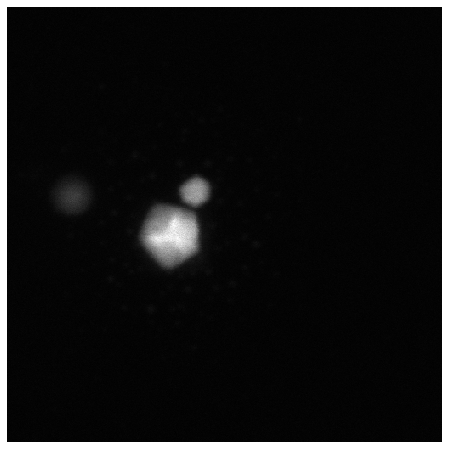

In [10]:
fig, ax = plt.subplots(figsize = (8,8))
ax.matshow(haadf['data'], cmap='gray')
ax.axis('off')
plt.show()

### a. Import 4DSTEM data

In [3]:
fp = '/dls/science/groups/imaging/ePSIC_students/Al_alloy_4DSTEM_EM19064-2/20180727_112544-9cmCL-4Mx.hdf5'

In [4]:
#Reshape and roll datacube collected on TitanX to the correct scan shape

dc_1 = hs.load(fp)

<IPython.core.display.Javascript object>


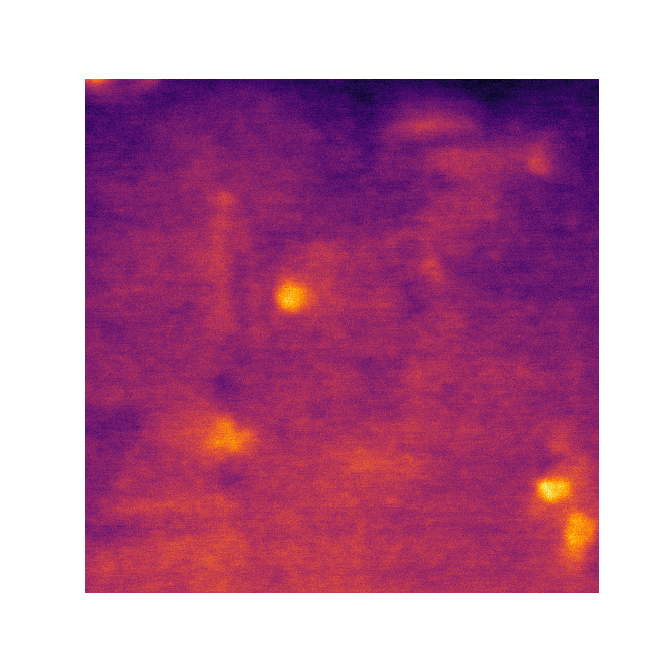

In [5]:
#Create virtual image and visualize
im = np.sum(dc_1.data,axis=(2,3))
fig, ax = plt.subplots(figsize = (10,10))
ax.matshow(im, cmap = 'inferno')
ax.axis('off')
plt.show()

In [6]:
R_Nx = dc_1.data.shape[0]
R_Ny = dc_1.data.shape[1]
Q_Nx = dc_1.data.shape[2]
Q_Ny = dc_1.data.shape[3]

In [38]:
dc_1.data.shape

(511, 511, 256, 256)

<IPython.core.display.Javascript object>


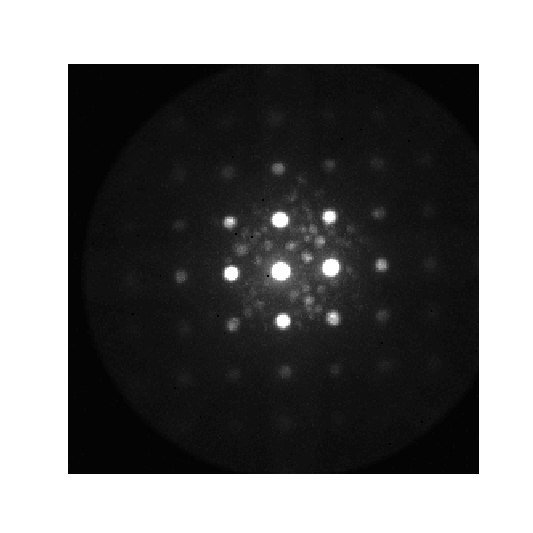

In [7]:
dp_max = np.max(dc_1.data, axis = (0,1))
fig, ax = py4DSTEM.visualize.show(dp_max, returnfig = True)
ax.axis('off')
plt.show()

In [8]:
#fig.savefig('max_dp_full.svg', format='svg', dpi=1200)

### b. Get origins

In [9]:
fp_b = '/Volumes/LaCie/TitanX/2021.03.06/B5/Orius/stack1_B5_15x15_ss3nm_0p0006s_spot7_alpha0p5_bin4_cl245_300kV.dm4'

In [8]:
dc_b = py4DSTEM.io.DataCube(dc_1.data)

In [9]:
coords = py4DSTEM.io.datastructure.Coordinates(dc_b.R_Nx,dc_b.R_Ny,
                                                   dc_b.Q_Nx,dc_b.Q_Ny,
                                                   name='coordinates_calibrationdata')

In [10]:
DP = dc_b.data[5,5]
r, _, _ = py4DSTEM.process.calibration.origin.get_probe_size(DP)

Finding origins: 100%|██████████| 261k/261k [21:48<00:00, 200DP/s] 


<IPython.core.display.Javascript object>


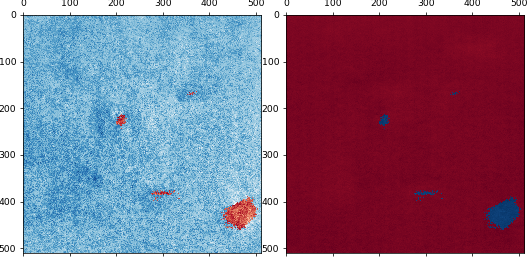

In [31]:
qx0_meas,qy0_meas = py4DSTEM.process.calibration.origin.get_origin(dc_b, r)
py4DSTEM.visualize.show_image_grid(
    get_ar=lambda i:[qx0_meas,qy0_meas][i],
    H=1,W=2,cmap='RdBu') 

<IPython.core.display.Javascript object>


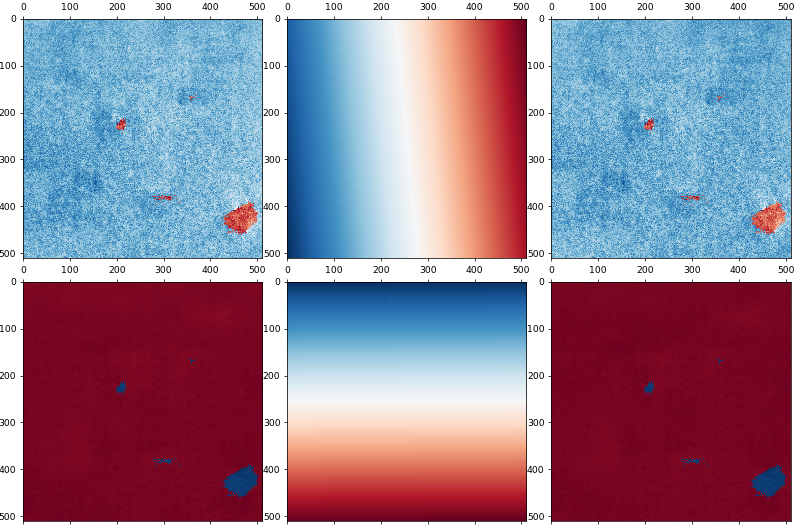

In [32]:
# Fit a plane to qx0 and qy0 with robust fitting
qx0_fit,qy0_fit,qx0_residuals,qy0_residuals = py4DSTEM.process.calibration.fit_origin(
    qx0_meas = qx0_meas,
    qy0_meas = qy0_meas,
    fitfunction='plane',
    robust = True)
py4DSTEM.visualize.show_image_grid(
    lambda i:[qx0_meas,qx0_fit,qx0_residuals,
              qy0_meas,qy0_fit,qy0_residuals][i],
    H=2,W=3,cmap='RdBu')

In [33]:
# Store the origin position
coords.set_origin(qx0_fit,qy0_fit)

In [16]:
# Delete datacube with center beam - only needed for accurate localization of center beam since beamstop is in
del dc_b

# 2. Feature Extraction Step - Probe Kernel, Disk Registration, and Universal/Mask Thresholding
## This section includes preparing the probe kernel then detecting and filtering the disks in each pattern

### a. Probe Kernel Creation (from 5x5 scan over carbon film)

In [4]:
dc_b = hs.load(fp,lazy = True)

In [5]:
mean_patt = np.mean(dc_b.data, axis = (0,1))

In [7]:
central_beam_mask = np.zeros_like(mean_patt)
central_beam_mask[120:150, 120:150] = np.where(mean_patt>20,1,0)[120:150,120:150]
central_beam_mask = central_beam_mask.compute()

In [8]:
np.save('/dls/science/groups/imaging/ePSIC_students/Al_alloy_4DSTEM_EM19064-2/cb-mask.npy', central_beam_mask)

In [5]:
central_beam_mask= np.load('/dls/science/groups/imaging/ePSIC_students/Al_alloy_4DSTEM_EM19064-2/cb-mask.npy')

In [8]:
dc_b

<LazySignal2D, title: A5V33dT6-9cmCL-4Mx.hdr, dimensions: (511, 511|256, 256)>

In [19]:
central_beam = np.zeros(dc_b.data.shape, dtype = 'int8')

In [20]:
for i in range(central_beam.shape[0]):
    print(i)
    row1 = dc_b.data[i].compute()
    b1 = (row1*central_beam_mask).astype('int8')
    central_beam[i] = b1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [21]:
cb_sig = hs.signals.Signal2D(central_beam)

In [22]:
cb_sig.save('/dls/science/groups/imaging/ePSIC_students/Al_alloy_4DSTEM_EM19064-2/20180727_112544-9cmCL-4Mx-central_beam.hdf5')

In [ ]:
cb_sig = hs.load('/dls/science/groups/imaging/ePSIC_students/Al_alloy_4DSTEM_EM19064-2/20180727_112544-9cmCL-4Mx-central_beam.hdf5')

In [24]:
dc_p = py4DSTEM.io.DataCube(cb_sig.data[::10,::10])
probe =py4DSTEM.process.diskdetection.probe.get_probe_from_vacuum_4Dscan(dc_p)

fig, ax = py4DSTEM.visualize.show(dp_max, returnfig = True)
ax.axis('off')
plt.show()

100%|██████████| 2703/2703 [00:34<00:00, 77.73it/s]


NameError: name 'dp_max' is not defined

In [25]:
# Create probe kernel
r, _, _ = py4DSTEM.process.calibration.origin.get_probe_size(probe.data)
probe_kernel = py4DSTEM.process.diskdetection.get_probe_kernel_edge_sigmoid(probe.data,ri=r*1.2,ro=r*2.4, type='logistic')

<IPython.core.display.Javascript object>


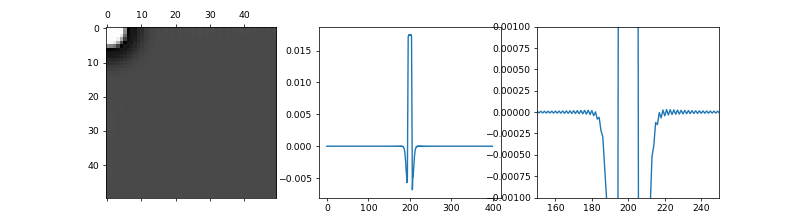

In [26]:
# Display probe_kernel, with line profile

rad=50
lineprofile_length=200
lineprofile_width=2

#xCom,yCoM = np.unravel_index(np.argmax(probe_kernel),(dp_crop.Q_Nx,dp_crop.Q_Ny))
line_profile_left = np.sum(probe_kernel[-lineprofile_length:,:lineprofile_width],axis=(1))
line_profile_right = np.sum(probe_kernel[:lineprofile_length,:lineprofile_width],axis=(1))
line_profile = np.concatenate([line_profile_left,line_profile_right])

fig,(ax11,ax12,ax13)=plt.subplots(1,3,figsize=(18,5))
ax11.matshow(probe_kernel[:rad,:rad], cmap ='gray')
ax12.plot(np.arange(len(line_profile)),line_profile)
ax13.plot(np.arange(len(line_profile)),line_profile)
ax13.set_ylim(-0.001,0.001)
ax13.set_xlim(150,250)

plt.show()

### b. Disk Detection

In [35]:
im = np.sum(dc_1.data, axis = (2,3))

<IPython.core.display.Javascript object>


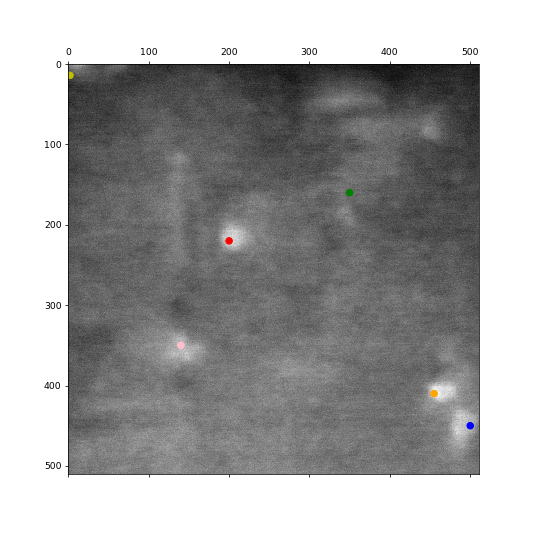

<IPython.core.display.Javascript object>


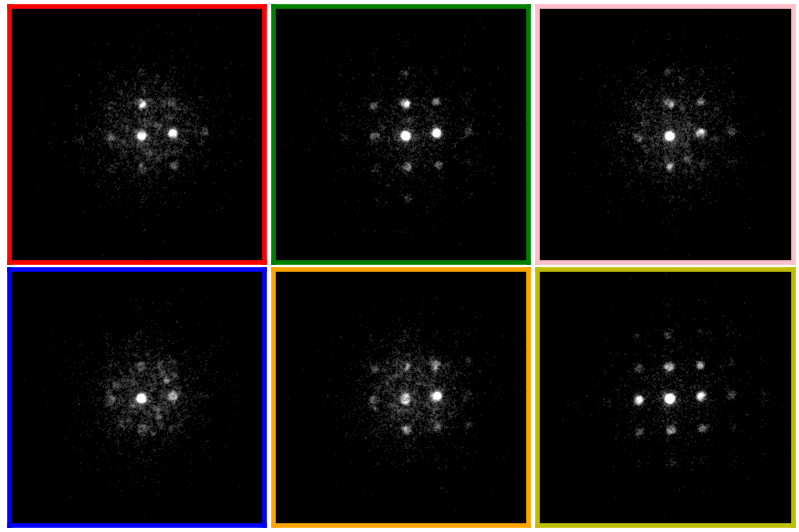

In [12]:
# Select a few DPs

Rxs=np.array((220,160,350,450,410,14))
Rys=np.array((200,350,140,500,455,2))

colors = ['r','g','pink','b','orange','y']

py4DSTEM.visualize.show_points(im,x=Rxs,y=Rys,pointcolor=colors,figsize=(8,8))
py4DSTEM.visualize.show_image_grid(get_ar=lambda i:dc_1.data[Rxs[i],Rys[i],:,:],
                                   H=2,W=3,get_bordercolor=lambda i:colors[i],scaling='power', power = 0.5)

In [69]:
# Get peaks
corrPower= 1.0
sigma=0.2
edgeBoundary=5
minAbsoluteIntensity=1
minPeakSpacing=2
maxNumPeaks=60
subpixel='multicorr'
upsample_factor=16

peaks = py4DSTEM.process.diskdetection.diskdetection.find_Bragg_disks_selected(
    dc_1,
    probe_kernel,
    Rxs,
    Rys,
    corrPower=corrPower,
    sigma=sigma,
    edgeBoundary=edgeBoundary,
    minAbsoluteIntensity=minAbsoluteIntensity,
    minPeakSpacing=minPeakSpacing,
    maxNumPeaks=maxNumPeaks,
    subpixel = subpixel,
    upsample_factor = upsample_factor)

<IPython.core.display.Javascript object>


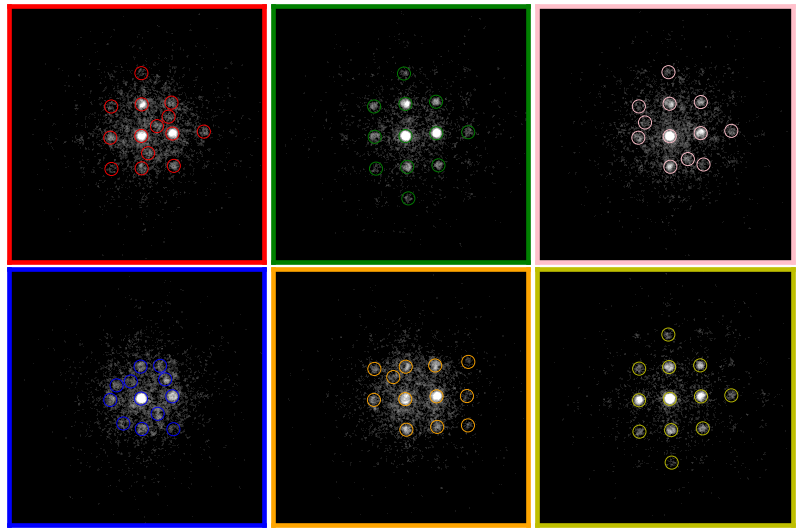

In [70]:
py4DSTEM.visualize.show_image_grid(
    get_ar=lambda i:dc_1.data[Rxs[i],Rys[i],:,:],H=2,W=3,
    get_bordercolor=lambda i:colors[i],
    get_x=lambda i:peaks[i].data['qx'],
    get_y=lambda i:peaks[i].data['qy'],
    get_pointcolors=lambda i:colors[i],
    scaling='power',
    power=0.3,
    open_circles=True,
    scale=200
    )

In [72]:
disks = py4DSTEM.process.diskdetection.diskdetection.find_Bragg_disks_serial(
    dc_b,
    probe_kernel,
    corrPower=corrPower,
    sigma=sigma,
    edgeBoundary=edgeBoundary,
    minAbsoluteIntensity=minAbsoluteIntensity,
    minPeakSpacing=minPeakSpacing,
    maxNumPeaks=maxNumPeaks,
    subpixel = subpixel,
    upsample_factor = upsample_factor)

Finding Bragg Disks: 100%|██████████| 261k/261k [12:25:09<00:00, 5.84DP/s]   


In [74]:
sp = '/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/peakpicked_new.h5'

disk_data = disks.pointlists

all_disks = []
for x in range(len(disk_data)):
    for y in range(len(disk_data[0])):
        pl = disk_data[x][y]
        pl.name = f'position-{x}-{y}'
        all_disks.append(pl)

py4DSTEM.io.save(sp, all_disks, overwrite=True)

Saving PointList 'position-0-0'...
Saving PointList 'position-0-1'...
Saving PointList 'position-0-2'...
Saving PointList 'position-0-3'...
Saving PointList 'position-0-4'...
Saving PointList 'position-0-5'...
Saving PointList 'position-0-6'...
Saving PointList 'position-0-7'...
Saving PointList 'position-0-8'...
Saving PointList 'position-0-9'...
Saving PointList 'position-0-10'...
Saving PointList 'position-0-11'...
Saving PointList 'position-0-12'...
Saving PointList 'position-0-13'...
Saving PointList 'position-0-14'...
Saving PointList 'position-0-15'...
Saving PointList 'position-0-16'...
Saving PointList 'position-0-17'...
Saving PointList 'position-0-18'...
Saving PointList 'position-0-19'...
Saving PointList 'position-0-20'...
Saving PointList 'position-0-21'...
Saving PointList 'position-0-22'...
Saving PointList 'position-0-23'...
Saving PointList 'position-0-24'...
Saving PointList 'position-0-25'...
Saving PointList 'position-0-26'...
Saving PointList 'position-0-27'...
Sa

Saving PointList 'position-0-370'...
Saving PointList 'position-0-371'...
Saving PointList 'position-0-372'...
Saving PointList 'position-0-373'...
Saving PointList 'position-0-374'...
Saving PointList 'position-0-375'...
Saving PointList 'position-0-376'...
Saving PointList 'position-0-377'...
Saving PointList 'position-0-378'...
Saving PointList 'position-0-379'...
Saving PointList 'position-0-380'...
Saving PointList 'position-0-381'...
Saving PointList 'position-0-382'...
Saving PointList 'position-0-383'...
Saving PointList 'position-0-384'...
Saving PointList 'position-0-385'...
Saving PointList 'position-0-386'...
Saving PointList 'position-0-387'...
Saving PointList 'position-0-388'...
Saving PointList 'position-0-389'...
Saving PointList 'position-0-390'...
Saving PointList 'position-0-391'...
Saving PointList 'position-0-392'...
Saving PointList 'position-0-393'...
Saving PointList 'position-0-394'...
Saving PointList 'position-0-395'...
Saving PointList 'position-0-396'...
S

Saving PointList 'position-1-188'...
Saving PointList 'position-1-189'...
Saving PointList 'position-1-190'...
Saving PointList 'position-1-191'...
Saving PointList 'position-1-192'...
Saving PointList 'position-1-193'...
Saving PointList 'position-1-194'...
Saving PointList 'position-1-195'...
Saving PointList 'position-1-196'...
Saving PointList 'position-1-197'...
Saving PointList 'position-1-198'...
Saving PointList 'position-1-199'...
Saving PointList 'position-1-200'...
Saving PointList 'position-1-201'...
Saving PointList 'position-1-202'...
Saving PointList 'position-1-203'...
Saving PointList 'position-1-204'...
Saving PointList 'position-1-205'...
Saving PointList 'position-1-206'...
Saving PointList 'position-1-207'...
Saving PointList 'position-1-208'...
Saving PointList 'position-1-209'...
Saving PointList 'position-1-210'...
Saving PointList 'position-1-211'...
Saving PointList 'position-1-212'...
Saving PointList 'position-1-213'...
Saving PointList 'position-1-214'...
S

Saving PointList 'position-2-47'...
Saving PointList 'position-2-48'...
Saving PointList 'position-2-49'...
Saving PointList 'position-2-50'...
Saving PointList 'position-2-51'...
Saving PointList 'position-2-52'...
Saving PointList 'position-2-53'...
Saving PointList 'position-2-54'...
Saving PointList 'position-2-55'...
Saving PointList 'position-2-56'...
Saving PointList 'position-2-57'...
Saving PointList 'position-2-58'...
Saving PointList 'position-2-59'...
Saving PointList 'position-2-60'...
Saving PointList 'position-2-61'...
Saving PointList 'position-2-62'...
Saving PointList 'position-2-63'...
Saving PointList 'position-2-64'...
Saving PointList 'position-2-65'...
Saving PointList 'position-2-66'...
Saving PointList 'position-2-67'...
Saving PointList 'position-2-68'...
Saving PointList 'position-2-69'...
Saving PointList 'position-2-70'...
Saving PointList 'position-2-71'...
Saving PointList 'position-2-72'...
Saving PointList 'position-2-73'...
Saving PointList 'position-2

Saving PointList 'position-2-404'...
Saving PointList 'position-2-405'...
Saving PointList 'position-2-406'...
Saving PointList 'position-2-407'...
Saving PointList 'position-2-408'...
Saving PointList 'position-2-409'...
Saving PointList 'position-2-410'...
Saving PointList 'position-2-411'...
Saving PointList 'position-2-412'...
Saving PointList 'position-2-413'...
Saving PointList 'position-2-414'...
Saving PointList 'position-2-415'...
Saving PointList 'position-2-416'...
Saving PointList 'position-2-417'...
Saving PointList 'position-2-418'...
Saving PointList 'position-2-419'...
Saving PointList 'position-2-420'...
Saving PointList 'position-2-421'...
Saving PointList 'position-2-422'...
Saving PointList 'position-2-423'...
Saving PointList 'position-2-424'...
Saving PointList 'position-2-425'...
Saving PointList 'position-2-426'...
Saving PointList 'position-2-427'...
Saving PointList 'position-2-428'...
Saving PointList 'position-2-429'...
Saving PointList 'position-2-430'...
S

Saving PointList 'position-3-249'...
Saving PointList 'position-3-250'...
Saving PointList 'position-3-251'...
Saving PointList 'position-3-252'...
Saving PointList 'position-3-253'...
Saving PointList 'position-3-254'...
Saving PointList 'position-3-255'...
Saving PointList 'position-3-256'...
Saving PointList 'position-3-257'...
Saving PointList 'position-3-258'...
Saving PointList 'position-3-259'...
Saving PointList 'position-3-260'...
Saving PointList 'position-3-261'...
Saving PointList 'position-3-262'...
Saving PointList 'position-3-263'...
Saving PointList 'position-3-264'...
Saving PointList 'position-3-265'...
Saving PointList 'position-3-266'...
Saving PointList 'position-3-267'...
Saving PointList 'position-3-268'...
Saving PointList 'position-3-269'...
Saving PointList 'position-3-270'...
Saving PointList 'position-3-271'...
Saving PointList 'position-3-272'...
Saving PointList 'position-3-273'...
Saving PointList 'position-3-274'...
Saving PointList 'position-3-275'...
S

Saving PointList 'position-3-497'...
Saving PointList 'position-3-498'...
Saving PointList 'position-3-499'...
Saving PointList 'position-3-500'...
Saving PointList 'position-3-501'...
Saving PointList 'position-3-502'...
Saving PointList 'position-3-503'...
Saving PointList 'position-3-504'...
Saving PointList 'position-3-505'...
Saving PointList 'position-3-506'...
Saving PointList 'position-3-507'...
Saving PointList 'position-3-508'...
Saving PointList 'position-3-509'...
Saving PointList 'position-3-510'...
Saving PointList 'position-4-0'...
Saving PointList 'position-4-1'...
Saving PointList 'position-4-2'...
Saving PointList 'position-4-3'...
Saving PointList 'position-4-4'...
Saving PointList 'position-4-5'...
Saving PointList 'position-4-6'...
Saving PointList 'position-4-7'...
Saving PointList 'position-4-8'...
Saving PointList 'position-4-9'...
Saving PointList 'position-4-10'...
Saving PointList 'position-4-11'...
Saving PointList 'position-4-12'...
Saving PointList 'positi

Saving PointList 'position-4-282'...
Saving PointList 'position-4-283'...
Saving PointList 'position-4-284'...
Saving PointList 'position-4-285'...
Saving PointList 'position-4-286'...
Saving PointList 'position-4-287'...
Saving PointList 'position-4-288'...
Saving PointList 'position-4-289'...
Saving PointList 'position-4-290'...
Saving PointList 'position-4-291'...
Saving PointList 'position-4-292'...
Saving PointList 'position-4-293'...
Saving PointList 'position-4-294'...
Saving PointList 'position-4-295'...
Saving PointList 'position-4-296'...
Saving PointList 'position-4-297'...
Saving PointList 'position-4-298'...
Saving PointList 'position-4-299'...
Saving PointList 'position-4-300'...
Saving PointList 'position-4-301'...
Saving PointList 'position-4-302'...
Saving PointList 'position-4-303'...
Saving PointList 'position-4-304'...
Saving PointList 'position-4-305'...
Saving PointList 'position-4-306'...
Saving PointList 'position-4-307'...
Saving PointList 'position-4-308'...
S

Saving PointList 'position-5-126'...
Saving PointList 'position-5-127'...
Saving PointList 'position-5-128'...
Saving PointList 'position-5-129'...
Saving PointList 'position-5-130'...
Saving PointList 'position-5-131'...
Saving PointList 'position-5-132'...
Saving PointList 'position-5-133'...
Saving PointList 'position-5-134'...
Saving PointList 'position-5-135'...
Saving PointList 'position-5-136'...
Saving PointList 'position-5-137'...
Saving PointList 'position-5-138'...
Saving PointList 'position-5-139'...
Saving PointList 'position-5-140'...
Saving PointList 'position-5-141'...
Saving PointList 'position-5-142'...
Saving PointList 'position-5-143'...
Saving PointList 'position-5-144'...
Saving PointList 'position-5-145'...
Saving PointList 'position-5-146'...
Saving PointList 'position-5-147'...
Saving PointList 'position-5-148'...
Saving PointList 'position-5-149'...
Saving PointList 'position-5-150'...
Saving PointList 'position-5-151'...
Saving PointList 'position-5-152'...
S

Saving PointList 'position-6-12'...
Saving PointList 'position-6-13'...
Saving PointList 'position-6-14'...
Saving PointList 'position-6-15'...
Saving PointList 'position-6-16'...
Saving PointList 'position-6-17'...
Saving PointList 'position-6-18'...
Saving PointList 'position-6-19'...
Saving PointList 'position-6-20'...
Saving PointList 'position-6-21'...
Saving PointList 'position-6-22'...
Saving PointList 'position-6-23'...
Saving PointList 'position-6-24'...
Saving PointList 'position-6-25'...
Saving PointList 'position-6-26'...
Saving PointList 'position-6-27'...
Saving PointList 'position-6-28'...
Saving PointList 'position-6-29'...
Saving PointList 'position-6-30'...
Saving PointList 'position-6-31'...
Saving PointList 'position-6-32'...
Saving PointList 'position-6-33'...
Saving PointList 'position-6-34'...
Saving PointList 'position-6-35'...
Saving PointList 'position-6-36'...
Saving PointList 'position-6-37'...
Saving PointList 'position-6-38'...
Saving PointList 'position-6

Saving PointList 'position-6-345'...
Saving PointList 'position-6-346'...
Saving PointList 'position-6-347'...
Saving PointList 'position-6-348'...
Saving PointList 'position-6-349'...
Saving PointList 'position-6-350'...
Saving PointList 'position-6-351'...
Saving PointList 'position-6-352'...
Saving PointList 'position-6-353'...
Saving PointList 'position-6-354'...
Saving PointList 'position-6-355'...
Saving PointList 'position-6-356'...
Saving PointList 'position-6-357'...
Saving PointList 'position-6-358'...
Saving PointList 'position-6-359'...
Saving PointList 'position-6-360'...
Saving PointList 'position-6-361'...
Saving PointList 'position-6-362'...
Saving PointList 'position-6-363'...
Saving PointList 'position-6-364'...
Saving PointList 'position-6-365'...
Saving PointList 'position-6-366'...
Saving PointList 'position-6-367'...
Saving PointList 'position-6-368'...
Saving PointList 'position-6-369'...
Saving PointList 'position-6-370'...
Saving PointList 'position-6-371'...
S

Saving PointList 'position-7-215'...
Saving PointList 'position-7-216'...
Saving PointList 'position-7-217'...
Saving PointList 'position-7-218'...
Saving PointList 'position-7-219'...
Saving PointList 'position-7-220'...
Saving PointList 'position-7-221'...
Saving PointList 'position-7-222'...
Saving PointList 'position-7-223'...
Saving PointList 'position-7-224'...
Saving PointList 'position-7-225'...
Saving PointList 'position-7-226'...
Saving PointList 'position-7-227'...
Saving PointList 'position-7-228'...
Saving PointList 'position-7-229'...
Saving PointList 'position-7-230'...
Saving PointList 'position-7-231'...
Saving PointList 'position-7-232'...
Saving PointList 'position-7-233'...
Saving PointList 'position-7-234'...
Saving PointList 'position-7-235'...
Saving PointList 'position-7-236'...
Saving PointList 'position-7-237'...
Saving PointList 'position-7-238'...
Saving PointList 'position-7-239'...
Saving PointList 'position-7-240'...
Saving PointList 'position-7-241'...
S

Saving PointList 'position-8-27'...
Saving PointList 'position-8-28'...
Saving PointList 'position-8-29'...
Saving PointList 'position-8-30'...
Saving PointList 'position-8-31'...
Saving PointList 'position-8-32'...
Saving PointList 'position-8-33'...
Saving PointList 'position-8-34'...
Saving PointList 'position-8-35'...
Saving PointList 'position-8-36'...
Saving PointList 'position-8-37'...
Saving PointList 'position-8-38'...
Saving PointList 'position-8-39'...
Saving PointList 'position-8-40'...
Saving PointList 'position-8-41'...
Saving PointList 'position-8-42'...
Saving PointList 'position-8-43'...
Saving PointList 'position-8-44'...
Saving PointList 'position-8-45'...
Saving PointList 'position-8-46'...
Saving PointList 'position-8-47'...
Saving PointList 'position-8-48'...
Saving PointList 'position-8-49'...
Saving PointList 'position-8-50'...
Saving PointList 'position-8-51'...
Saving PointList 'position-8-52'...
Saving PointList 'position-8-53'...
Saving PointList 'position-8

Saving PointList 'position-8-345'...
Saving PointList 'position-8-346'...
Saving PointList 'position-8-347'...
Saving PointList 'position-8-348'...
Saving PointList 'position-8-349'...
Saving PointList 'position-8-350'...
Saving PointList 'position-8-351'...
Saving PointList 'position-8-352'...
Saving PointList 'position-8-353'...
Saving PointList 'position-8-354'...
Saving PointList 'position-8-355'...
Saving PointList 'position-8-356'...
Saving PointList 'position-8-357'...
Saving PointList 'position-8-358'...
Saving PointList 'position-8-359'...
Saving PointList 'position-8-360'...
Saving PointList 'position-8-361'...
Saving PointList 'position-8-362'...
Saving PointList 'position-8-363'...
Saving PointList 'position-8-364'...
Saving PointList 'position-8-365'...
Saving PointList 'position-8-366'...
Saving PointList 'position-8-367'...
Saving PointList 'position-8-368'...
Saving PointList 'position-8-369'...
Saving PointList 'position-8-370'...
Saving PointList 'position-8-371'...
S

Saving PointList 'position-9-256'...
Saving PointList 'position-9-257'...
Saving PointList 'position-9-258'...
Saving PointList 'position-9-259'...
Saving PointList 'position-9-260'...
Saving PointList 'position-9-261'...
Saving PointList 'position-9-262'...
Saving PointList 'position-9-263'...
Saving PointList 'position-9-264'...
Saving PointList 'position-9-265'...
Saving PointList 'position-9-266'...
Saving PointList 'position-9-267'...
Saving PointList 'position-9-268'...
Saving PointList 'position-9-269'...
Saving PointList 'position-9-270'...
Saving PointList 'position-9-271'...
Saving PointList 'position-9-272'...
Saving PointList 'position-9-273'...
Saving PointList 'position-9-274'...
Saving PointList 'position-9-275'...
Saving PointList 'position-9-276'...
Saving PointList 'position-9-277'...
Saving PointList 'position-9-278'...
Saving PointList 'position-9-279'...
Saving PointList 'position-9-280'...
Saving PointList 'position-9-281'...
Saving PointList 'position-9-282'...
S

Saving PointList 'position-10-10'...
Saving PointList 'position-10-11'...
Saving PointList 'position-10-12'...
Saving PointList 'position-10-13'...
Saving PointList 'position-10-14'...
Saving PointList 'position-10-15'...
Saving PointList 'position-10-16'...
Saving PointList 'position-10-17'...
Saving PointList 'position-10-18'...
Saving PointList 'position-10-19'...
Saving PointList 'position-10-20'...
Saving PointList 'position-10-21'...
Saving PointList 'position-10-22'...
Saving PointList 'position-10-23'...
Saving PointList 'position-10-24'...
Saving PointList 'position-10-25'...
Saving PointList 'position-10-26'...
Saving PointList 'position-10-27'...
Saving PointList 'position-10-28'...
Saving PointList 'position-10-29'...
Saving PointList 'position-10-30'...
Saving PointList 'position-10-31'...
Saving PointList 'position-10-32'...
Saving PointList 'position-10-33'...
Saving PointList 'position-10-34'...
Saving PointList 'position-10-35'...
Saving PointList 'position-10-36'...
S

Saving PointList 'position-10-360'...
Saving PointList 'position-10-361'...
Saving PointList 'position-10-362'...
Saving PointList 'position-10-363'...
Saving PointList 'position-10-364'...
Saving PointList 'position-10-365'...
Saving PointList 'position-10-366'...
Saving PointList 'position-10-367'...
Saving PointList 'position-10-368'...
Saving PointList 'position-10-369'...
Saving PointList 'position-10-370'...
Saving PointList 'position-10-371'...
Saving PointList 'position-10-372'...
Saving PointList 'position-10-373'...
Saving PointList 'position-10-374'...
Saving PointList 'position-10-375'...
Saving PointList 'position-10-376'...
Saving PointList 'position-10-377'...
Saving PointList 'position-10-378'...
Saving PointList 'position-10-379'...
Saving PointList 'position-10-380'...
Saving PointList 'position-10-381'...
Saving PointList 'position-10-382'...
Saving PointList 'position-10-383'...
Saving PointList 'position-10-384'...
Saving PointList 'position-10-385'...
Saving Point

Saving PointList 'position-11-177'...
Saving PointList 'position-11-178'...
Saving PointList 'position-11-179'...
Saving PointList 'position-11-180'...
Saving PointList 'position-11-181'...
Saving PointList 'position-11-182'...
Saving PointList 'position-11-183'...
Saving PointList 'position-11-184'...
Saving PointList 'position-11-185'...
Saving PointList 'position-11-186'...
Saving PointList 'position-11-187'...
Saving PointList 'position-11-188'...
Saving PointList 'position-11-189'...
Saving PointList 'position-11-190'...
Saving PointList 'position-11-191'...
Saving PointList 'position-11-192'...
Saving PointList 'position-11-193'...
Saving PointList 'position-11-194'...
Saving PointList 'position-11-195'...
Saving PointList 'position-11-196'...
Saving PointList 'position-11-197'...
Saving PointList 'position-11-198'...
Saving PointList 'position-11-199'...
Saving PointList 'position-11-200'...
Saving PointList 'position-11-201'...
Saving PointList 'position-11-202'...
Saving Point

Saving PointList 'position-12-40'...
Saving PointList 'position-12-41'...
Saving PointList 'position-12-42'...
Saving PointList 'position-12-43'...
Saving PointList 'position-12-44'...
Saving PointList 'position-12-45'...
Saving PointList 'position-12-46'...
Saving PointList 'position-12-47'...
Saving PointList 'position-12-48'...
Saving PointList 'position-12-49'...
Saving PointList 'position-12-50'...
Saving PointList 'position-12-51'...
Saving PointList 'position-12-52'...
Saving PointList 'position-12-53'...
Saving PointList 'position-12-54'...
Saving PointList 'position-12-55'...
Saving PointList 'position-12-56'...
Saving PointList 'position-12-57'...
Saving PointList 'position-12-58'...
Saving PointList 'position-12-59'...
Saving PointList 'position-12-60'...
Saving PointList 'position-12-61'...
Saving PointList 'position-12-62'...
Saving PointList 'position-12-63'...
Saving PointList 'position-12-64'...
Saving PointList 'position-12-65'...
Saving PointList 'position-12-66'...
S

Saving PointList 'position-12-383'...
Saving PointList 'position-12-384'...
Saving PointList 'position-12-385'...
Saving PointList 'position-12-386'...
Saving PointList 'position-12-387'...
Saving PointList 'position-12-388'...
Saving PointList 'position-12-389'...
Saving PointList 'position-12-390'...
Saving PointList 'position-12-391'...
Saving PointList 'position-12-392'...
Saving PointList 'position-12-393'...
Saving PointList 'position-12-394'...
Saving PointList 'position-12-395'...
Saving PointList 'position-12-396'...
Saving PointList 'position-12-397'...
Saving PointList 'position-12-398'...
Saving PointList 'position-12-399'...
Saving PointList 'position-12-400'...
Saving PointList 'position-12-401'...
Saving PointList 'position-12-402'...
Saving PointList 'position-12-403'...
Saving PointList 'position-12-404'...
Saving PointList 'position-12-405'...
Saving PointList 'position-12-406'...
Saving PointList 'position-12-407'...
Saving PointList 'position-12-408'...
Saving Point

Saving PointList 'position-13-162'...
Saving PointList 'position-13-163'...
Saving PointList 'position-13-164'...
Saving PointList 'position-13-165'...
Saving PointList 'position-13-166'...
Saving PointList 'position-13-167'...
Saving PointList 'position-13-168'...
Saving PointList 'position-13-169'...
Saving PointList 'position-13-170'...
Saving PointList 'position-13-171'...
Saving PointList 'position-13-172'...
Saving PointList 'position-13-173'...
Saving PointList 'position-13-174'...
Saving PointList 'position-13-175'...
Saving PointList 'position-13-176'...
Saving PointList 'position-13-177'...
Saving PointList 'position-13-178'...
Saving PointList 'position-13-179'...
Saving PointList 'position-13-180'...
Saving PointList 'position-13-181'...
Saving PointList 'position-13-182'...
Saving PointList 'position-13-183'...
Saving PointList 'position-13-184'...
Saving PointList 'position-13-185'...
Saving PointList 'position-13-186'...
Saving PointList 'position-13-187'...
Saving Point

Saving PointList 'position-14-14'...
Saving PointList 'position-14-15'...
Saving PointList 'position-14-16'...
Saving PointList 'position-14-17'...
Saving PointList 'position-14-18'...
Saving PointList 'position-14-19'...
Saving PointList 'position-14-20'...
Saving PointList 'position-14-21'...
Saving PointList 'position-14-22'...
Saving PointList 'position-14-23'...
Saving PointList 'position-14-24'...
Saving PointList 'position-14-25'...
Saving PointList 'position-14-26'...
Saving PointList 'position-14-27'...
Saving PointList 'position-14-28'...
Saving PointList 'position-14-29'...
Saving PointList 'position-14-30'...
Saving PointList 'position-14-31'...
Saving PointList 'position-14-32'...
Saving PointList 'position-14-33'...
Saving PointList 'position-14-34'...
Saving PointList 'position-14-35'...
Saving PointList 'position-14-36'...
Saving PointList 'position-14-37'...
Saving PointList 'position-14-38'...
Saving PointList 'position-14-39'...
Saving PointList 'position-14-40'...
S

Saving PointList 'position-14-340'...
Saving PointList 'position-14-341'...
Saving PointList 'position-14-342'...
Saving PointList 'position-14-343'...
Saving PointList 'position-14-344'...
Saving PointList 'position-14-345'...
Saving PointList 'position-14-346'...
Saving PointList 'position-14-347'...
Saving PointList 'position-14-348'...
Saving PointList 'position-14-349'...
Saving PointList 'position-14-350'...
Saving PointList 'position-14-351'...
Saving PointList 'position-14-352'...
Saving PointList 'position-14-353'...
Saving PointList 'position-14-354'...
Saving PointList 'position-14-355'...
Saving PointList 'position-14-356'...
Saving PointList 'position-14-357'...
Saving PointList 'position-14-358'...
Saving PointList 'position-14-359'...
Saving PointList 'position-14-360'...
Saving PointList 'position-14-361'...
Saving PointList 'position-14-362'...
Saving PointList 'position-14-363'...
Saving PointList 'position-14-364'...
Saving PointList 'position-14-365'...
Saving Point

Saving PointList 'position-15-71'...
Saving PointList 'position-15-72'...
Saving PointList 'position-15-73'...
Saving PointList 'position-15-74'...
Saving PointList 'position-15-75'...
Saving PointList 'position-15-76'...
Saving PointList 'position-15-77'...
Saving PointList 'position-15-78'...
Saving PointList 'position-15-79'...
Saving PointList 'position-15-80'...
Saving PointList 'position-15-81'...
Saving PointList 'position-15-82'...
Saving PointList 'position-15-83'...
Saving PointList 'position-15-84'...
Saving PointList 'position-15-85'...
Saving PointList 'position-15-86'...
Saving PointList 'position-15-87'...
Saving PointList 'position-15-88'...
Saving PointList 'position-15-89'...
Saving PointList 'position-15-90'...
Saving PointList 'position-15-91'...
Saving PointList 'position-15-92'...
Saving PointList 'position-15-93'...
Saving PointList 'position-15-94'...
Saving PointList 'position-15-95'...
Saving PointList 'position-15-96'...
Saving PointList 'position-15-97'...
S

Saving PointList 'position-15-290'...
Saving PointList 'position-15-291'...
Saving PointList 'position-15-292'...
Saving PointList 'position-15-293'...
Saving PointList 'position-15-294'...
Saving PointList 'position-15-295'...
Saving PointList 'position-15-296'...
Saving PointList 'position-15-297'...
Saving PointList 'position-15-298'...
Saving PointList 'position-15-299'...
Saving PointList 'position-15-300'...
Saving PointList 'position-15-301'...
Saving PointList 'position-15-302'...
Saving PointList 'position-15-303'...
Saving PointList 'position-15-304'...
Saving PointList 'position-15-305'...
Saving PointList 'position-15-306'...
Saving PointList 'position-15-307'...
Saving PointList 'position-15-308'...
Saving PointList 'position-15-309'...
Saving PointList 'position-15-310'...
Saving PointList 'position-15-311'...
Saving PointList 'position-15-312'...
Saving PointList 'position-15-313'...
Saving PointList 'position-15-314'...
Saving PointList 'position-15-315'...
Saving Point

Saving PointList 'position-16-111'...
Saving PointList 'position-16-112'...
Saving PointList 'position-16-113'...
Saving PointList 'position-16-114'...
Saving PointList 'position-16-115'...
Saving PointList 'position-16-116'...
Saving PointList 'position-16-117'...
Saving PointList 'position-16-118'...
Saving PointList 'position-16-119'...
Saving PointList 'position-16-120'...
Saving PointList 'position-16-121'...
Saving PointList 'position-16-122'...
Saving PointList 'position-16-123'...
Saving PointList 'position-16-124'...
Saving PointList 'position-16-125'...
Saving PointList 'position-16-126'...
Saving PointList 'position-16-127'...
Saving PointList 'position-16-128'...
Saving PointList 'position-16-129'...
Saving PointList 'position-16-130'...
Saving PointList 'position-16-131'...
Saving PointList 'position-16-132'...
Saving PointList 'position-16-133'...
Saving PointList 'position-16-134'...
Saving PointList 'position-16-135'...
Saving PointList 'position-16-136'...
Saving Point

Saving PointList 'position-16-441'...
Saving PointList 'position-16-442'...
Saving PointList 'position-16-443'...
Saving PointList 'position-16-444'...
Saving PointList 'position-16-445'...
Saving PointList 'position-16-446'...
Saving PointList 'position-16-447'...
Saving PointList 'position-16-448'...
Saving PointList 'position-16-449'...
Saving PointList 'position-16-450'...
Saving PointList 'position-16-451'...
Saving PointList 'position-16-452'...
Saving PointList 'position-16-453'...
Saving PointList 'position-16-454'...
Saving PointList 'position-16-455'...
Saving PointList 'position-16-456'...
Saving PointList 'position-16-457'...
Saving PointList 'position-16-458'...
Saving PointList 'position-16-459'...
Saving PointList 'position-16-460'...
Saving PointList 'position-16-461'...
Saving PointList 'position-16-462'...
Saving PointList 'position-16-463'...
Saving PointList 'position-16-464'...
Saving PointList 'position-16-465'...
Saving PointList 'position-16-466'...
Saving Point

Saving PointList 'position-17-152'...
Saving PointList 'position-17-153'...
Saving PointList 'position-17-154'...
Saving PointList 'position-17-155'...
Saving PointList 'position-17-156'...
Saving PointList 'position-17-157'...
Saving PointList 'position-17-158'...
Saving PointList 'position-17-159'...
Saving PointList 'position-17-160'...
Saving PointList 'position-17-161'...
Saving PointList 'position-17-162'...
Saving PointList 'position-17-163'...
Saving PointList 'position-17-164'...
Saving PointList 'position-17-165'...
Saving PointList 'position-17-166'...
Saving PointList 'position-17-167'...
Saving PointList 'position-17-168'...
Saving PointList 'position-17-169'...
Saving PointList 'position-17-170'...
Saving PointList 'position-17-171'...
Saving PointList 'position-17-172'...
Saving PointList 'position-17-173'...
Saving PointList 'position-17-174'...
Saving PointList 'position-17-175'...
Saving PointList 'position-17-176'...
Saving PointList 'position-17-177'...
Saving Point

Saving PointList 'position-17-493'...
Saving PointList 'position-17-494'...
Saving PointList 'position-17-495'...
Saving PointList 'position-17-496'...
Saving PointList 'position-17-497'...
Saving PointList 'position-17-498'...
Saving PointList 'position-17-499'...
Saving PointList 'position-17-500'...
Saving PointList 'position-17-501'...
Saving PointList 'position-17-502'...
Saving PointList 'position-17-503'...
Saving PointList 'position-17-504'...
Saving PointList 'position-17-505'...
Saving PointList 'position-17-506'...
Saving PointList 'position-17-507'...
Saving PointList 'position-17-508'...
Saving PointList 'position-17-509'...
Saving PointList 'position-17-510'...
Saving PointList 'position-18-0'...
Saving PointList 'position-18-1'...
Saving PointList 'position-18-2'...
Saving PointList 'position-18-3'...
Saving PointList 'position-18-4'...
Saving PointList 'position-18-5'...
Saving PointList 'position-18-6'...
Saving PointList 'position-18-7'...
Saving PointList 'position-1

Saving PointList 'position-18-275'...
Saving PointList 'position-18-276'...
Saving PointList 'position-18-277'...
Saving PointList 'position-18-278'...
Saving PointList 'position-18-279'...
Saving PointList 'position-18-280'...
Saving PointList 'position-18-281'...
Saving PointList 'position-18-282'...
Saving PointList 'position-18-283'...
Saving PointList 'position-18-284'...
Saving PointList 'position-18-285'...
Saving PointList 'position-18-286'...
Saving PointList 'position-18-287'...
Saving PointList 'position-18-288'...
Saving PointList 'position-18-289'...
Saving PointList 'position-18-290'...
Saving PointList 'position-18-291'...
Saving PointList 'position-18-292'...
Saving PointList 'position-18-293'...
Saving PointList 'position-18-294'...
Saving PointList 'position-18-295'...
Saving PointList 'position-18-296'...
Saving PointList 'position-18-297'...
Saving PointList 'position-18-298'...
Saving PointList 'position-18-299'...
Saving PointList 'position-18-300'...
Saving Point

Saving PointList 'position-19-132'...
Saving PointList 'position-19-133'...
Saving PointList 'position-19-134'...
Saving PointList 'position-19-135'...
Saving PointList 'position-19-136'...
Saving PointList 'position-19-137'...
Saving PointList 'position-19-138'...
Saving PointList 'position-19-139'...
Saving PointList 'position-19-140'...
Saving PointList 'position-19-141'...
Saving PointList 'position-19-142'...
Saving PointList 'position-19-143'...
Saving PointList 'position-19-144'...
Saving PointList 'position-19-145'...
Saving PointList 'position-19-146'...
Saving PointList 'position-19-147'...
Saving PointList 'position-19-148'...
Saving PointList 'position-19-149'...
Saving PointList 'position-19-150'...
Saving PointList 'position-19-151'...
Saving PointList 'position-19-152'...
Saving PointList 'position-19-153'...
Saving PointList 'position-19-154'...
Saving PointList 'position-19-155'...
Saving PointList 'position-19-156'...
Saving PointList 'position-19-157'...
Saving Point

Saving PointList 'position-19-407'...
Saving PointList 'position-19-408'...
Saving PointList 'position-19-409'...
Saving PointList 'position-19-410'...
Saving PointList 'position-19-411'...
Saving PointList 'position-19-412'...
Saving PointList 'position-19-413'...
Saving PointList 'position-19-414'...
Saving PointList 'position-19-415'...
Saving PointList 'position-19-416'...
Saving PointList 'position-19-417'...
Saving PointList 'position-19-418'...
Saving PointList 'position-19-419'...
Saving PointList 'position-19-420'...
Saving PointList 'position-19-421'...
Saving PointList 'position-19-422'...
Saving PointList 'position-19-423'...
Saving PointList 'position-19-424'...
Saving PointList 'position-19-425'...
Saving PointList 'position-19-426'...
Saving PointList 'position-19-427'...
Saving PointList 'position-19-428'...
Saving PointList 'position-19-429'...
Saving PointList 'position-19-430'...
Saving PointList 'position-19-431'...
Saving PointList 'position-19-432'...
Saving Point

Saving PointList 'position-20-392'...
Saving PointList 'position-20-393'...
Saving PointList 'position-20-394'...
Saving PointList 'position-20-395'...
Saving PointList 'position-20-396'...
Saving PointList 'position-20-397'...
Saving PointList 'position-20-398'...
Saving PointList 'position-20-399'...
Saving PointList 'position-20-400'...
Saving PointList 'position-20-401'...
Saving PointList 'position-20-402'...
Saving PointList 'position-20-403'...
Saving PointList 'position-20-404'...
Saving PointList 'position-20-405'...
Saving PointList 'position-20-406'...
Saving PointList 'position-20-407'...
Saving PointList 'position-20-408'...
Saving PointList 'position-20-409'...
Saving PointList 'position-20-410'...
Saving PointList 'position-20-411'...
Saving PointList 'position-20-412'...
Saving PointList 'position-20-413'...
Saving PointList 'position-20-414'...
Saving PointList 'position-20-415'...
Saving PointList 'position-20-416'...
Saving PointList 'position-20-417'...
Saving Point

Saving PointList 'position-21-213'...
Saving PointList 'position-21-214'...
Saving PointList 'position-21-215'...
Saving PointList 'position-21-216'...
Saving PointList 'position-21-217'...
Saving PointList 'position-21-218'...
Saving PointList 'position-21-219'...
Saving PointList 'position-21-220'...
Saving PointList 'position-21-221'...
Saving PointList 'position-21-222'...
Saving PointList 'position-21-223'...
Saving PointList 'position-21-224'...
Saving PointList 'position-21-225'...
Saving PointList 'position-21-226'...
Saving PointList 'position-21-227'...
Saving PointList 'position-21-228'...
Saving PointList 'position-21-229'...
Saving PointList 'position-21-230'...
Saving PointList 'position-21-231'...
Saving PointList 'position-21-232'...
Saving PointList 'position-21-233'...
Saving PointList 'position-21-234'...
Saving PointList 'position-21-235'...
Saving PointList 'position-21-236'...
Saving PointList 'position-21-237'...
Saving PointList 'position-21-238'...
Saving Point

Saving PointList 'position-22-21'...
Saving PointList 'position-22-22'...
Saving PointList 'position-22-23'...
Saving PointList 'position-22-24'...
Saving PointList 'position-22-25'...
Saving PointList 'position-22-26'...
Saving PointList 'position-22-27'...
Saving PointList 'position-22-28'...
Saving PointList 'position-22-29'...
Saving PointList 'position-22-30'...
Saving PointList 'position-22-31'...
Saving PointList 'position-22-32'...
Saving PointList 'position-22-33'...
Saving PointList 'position-22-34'...
Saving PointList 'position-22-35'...
Saving PointList 'position-22-36'...
Saving PointList 'position-22-37'...
Saving PointList 'position-22-38'...
Saving PointList 'position-22-39'...
Saving PointList 'position-22-40'...
Saving PointList 'position-22-41'...
Saving PointList 'position-22-42'...
Saving PointList 'position-22-43'...
Saving PointList 'position-22-44'...
Saving PointList 'position-22-45'...
Saving PointList 'position-22-46'...
Saving PointList 'position-22-47'...
S

Saving PointList 'position-22-251'...
Saving PointList 'position-22-252'...
Saving PointList 'position-22-253'...
Saving PointList 'position-22-254'...
Saving PointList 'position-22-255'...
Saving PointList 'position-22-256'...
Saving PointList 'position-22-257'...
Saving PointList 'position-22-258'...
Saving PointList 'position-22-259'...
Saving PointList 'position-22-260'...
Saving PointList 'position-22-261'...
Saving PointList 'position-22-262'...
Saving PointList 'position-22-263'...
Saving PointList 'position-22-264'...
Saving PointList 'position-22-265'...
Saving PointList 'position-22-266'...
Saving PointList 'position-22-267'...
Saving PointList 'position-22-268'...
Saving PointList 'position-22-269'...
Saving PointList 'position-22-270'...
Saving PointList 'position-22-271'...
Saving PointList 'position-22-272'...
Saving PointList 'position-22-273'...
Saving PointList 'position-22-274'...
Saving PointList 'position-22-275'...
Saving PointList 'position-22-276'...
Saving Point

Saving PointList 'position-22-496'...
Saving PointList 'position-22-497'...
Saving PointList 'position-22-498'...
Saving PointList 'position-22-499'...
Saving PointList 'position-22-500'...
Saving PointList 'position-22-501'...
Saving PointList 'position-22-502'...
Saving PointList 'position-22-503'...
Saving PointList 'position-22-504'...
Saving PointList 'position-22-505'...
Saving PointList 'position-22-506'...
Saving PointList 'position-22-507'...
Saving PointList 'position-22-508'...
Saving PointList 'position-22-509'...
Saving PointList 'position-22-510'...
Saving PointList 'position-23-0'...
Saving PointList 'position-23-1'...
Saving PointList 'position-23-2'...
Saving PointList 'position-23-3'...
Saving PointList 'position-23-4'...
Saving PointList 'position-23-5'...
Saving PointList 'position-23-6'...
Saving PointList 'position-23-7'...
Saving PointList 'position-23-8'...
Saving PointList 'position-23-9'...
Saving PointList 'position-23-10'...
Saving PointList 'position-23-11'

Saving PointList 'position-23-247'...
Saving PointList 'position-23-248'...
Saving PointList 'position-23-249'...
Saving PointList 'position-23-250'...
Saving PointList 'position-23-251'...
Saving PointList 'position-23-252'...
Saving PointList 'position-23-253'...
Saving PointList 'position-23-254'...
Saving PointList 'position-23-255'...
Saving PointList 'position-23-256'...
Saving PointList 'position-23-257'...
Saving PointList 'position-23-258'...
Saving PointList 'position-23-259'...
Saving PointList 'position-23-260'...
Saving PointList 'position-23-261'...
Saving PointList 'position-23-262'...
Saving PointList 'position-23-263'...
Saving PointList 'position-23-264'...
Saving PointList 'position-23-265'...
Saving PointList 'position-23-266'...
Saving PointList 'position-23-267'...
Saving PointList 'position-23-268'...
Saving PointList 'position-23-269'...
Saving PointList 'position-23-270'...
Saving PointList 'position-23-271'...
Saving PointList 'position-23-272'...
Saving Point

Saving PointList 'position-24-91'...
Saving PointList 'position-24-92'...
Saving PointList 'position-24-93'...
Saving PointList 'position-24-94'...
Saving PointList 'position-24-95'...
Saving PointList 'position-24-96'...
Saving PointList 'position-24-97'...
Saving PointList 'position-24-98'...
Saving PointList 'position-24-99'...
Saving PointList 'position-24-100'...
Saving PointList 'position-24-101'...
Saving PointList 'position-24-102'...
Saving PointList 'position-24-103'...
Saving PointList 'position-24-104'...
Saving PointList 'position-24-105'...
Saving PointList 'position-24-106'...
Saving PointList 'position-24-107'...
Saving PointList 'position-24-108'...
Saving PointList 'position-24-109'...
Saving PointList 'position-24-110'...
Saving PointList 'position-24-111'...
Saving PointList 'position-24-112'...
Saving PointList 'position-24-113'...
Saving PointList 'position-24-114'...
Saving PointList 'position-24-115'...
Saving PointList 'position-24-116'...
Saving PointList 'pos

Saving PointList 'position-24-468'...
Saving PointList 'position-24-469'...
Saving PointList 'position-24-470'...
Saving PointList 'position-24-471'...
Saving PointList 'position-24-472'...
Saving PointList 'position-24-473'...
Saving PointList 'position-24-474'...
Saving PointList 'position-24-475'...
Saving PointList 'position-24-476'...
Saving PointList 'position-24-477'...
Saving PointList 'position-24-478'...
Saving PointList 'position-24-479'...
Saving PointList 'position-24-480'...
Saving PointList 'position-24-481'...
Saving PointList 'position-24-482'...
Saving PointList 'position-24-483'...
Saving PointList 'position-24-484'...
Saving PointList 'position-24-485'...
Saving PointList 'position-24-486'...
Saving PointList 'position-24-487'...
Saving PointList 'position-24-488'...
Saving PointList 'position-24-489'...
Saving PointList 'position-24-490'...
Saving PointList 'position-24-491'...
Saving PointList 'position-24-492'...
Saving PointList 'position-24-493'...
Saving Point

Saving PointList 'position-25-292'...
Saving PointList 'position-25-293'...
Saving PointList 'position-25-294'...
Saving PointList 'position-25-295'...
Saving PointList 'position-25-296'...
Saving PointList 'position-25-297'...
Saving PointList 'position-25-298'...
Saving PointList 'position-25-299'...
Saving PointList 'position-25-300'...
Saving PointList 'position-25-301'...
Saving PointList 'position-25-302'...
Saving PointList 'position-25-303'...
Saving PointList 'position-25-304'...
Saving PointList 'position-25-305'...
Saving PointList 'position-25-306'...
Saving PointList 'position-25-307'...
Saving PointList 'position-25-308'...
Saving PointList 'position-25-309'...
Saving PointList 'position-25-310'...
Saving PointList 'position-25-311'...
Saving PointList 'position-25-312'...
Saving PointList 'position-25-313'...
Saving PointList 'position-25-314'...
Saving PointList 'position-25-315'...
Saving PointList 'position-25-316'...
Saving PointList 'position-25-317'...
Saving Point

Saving PointList 'position-26-26'...
Saving PointList 'position-26-27'...
Saving PointList 'position-26-28'...
Saving PointList 'position-26-29'...
Saving PointList 'position-26-30'...
Saving PointList 'position-26-31'...
Saving PointList 'position-26-32'...
Saving PointList 'position-26-33'...
Saving PointList 'position-26-34'...
Saving PointList 'position-26-35'...
Saving PointList 'position-26-36'...
Saving PointList 'position-26-37'...
Saving PointList 'position-26-38'...
Saving PointList 'position-26-39'...
Saving PointList 'position-26-40'...
Saving PointList 'position-26-41'...
Saving PointList 'position-26-42'...
Saving PointList 'position-26-43'...
Saving PointList 'position-26-44'...
Saving PointList 'position-26-45'...
Saving PointList 'position-26-46'...
Saving PointList 'position-26-47'...
Saving PointList 'position-26-48'...
Saving PointList 'position-26-49'...
Saving PointList 'position-26-50'...
Saving PointList 'position-26-51'...
Saving PointList 'position-26-52'...
S

Saving PointList 'position-26-307'...
Saving PointList 'position-26-308'...
Saving PointList 'position-26-309'...
Saving PointList 'position-26-310'...
Saving PointList 'position-26-311'...
Saving PointList 'position-26-312'...
Saving PointList 'position-26-313'...
Saving PointList 'position-26-314'...
Saving PointList 'position-26-315'...
Saving PointList 'position-26-316'...
Saving PointList 'position-26-317'...
Saving PointList 'position-26-318'...
Saving PointList 'position-26-319'...
Saving PointList 'position-26-320'...
Saving PointList 'position-26-321'...
Saving PointList 'position-26-322'...
Saving PointList 'position-26-323'...
Saving PointList 'position-26-324'...
Saving PointList 'position-26-325'...
Saving PointList 'position-26-326'...
Saving PointList 'position-26-327'...
Saving PointList 'position-26-328'...
Saving PointList 'position-26-329'...
Saving PointList 'position-26-330'...
Saving PointList 'position-26-331'...
Saving PointList 'position-26-332'...
Saving Point

Saving PointList 'position-27-164'...
Saving PointList 'position-27-165'...
Saving PointList 'position-27-166'...
Saving PointList 'position-27-167'...
Saving PointList 'position-27-168'...
Saving PointList 'position-27-169'...
Saving PointList 'position-27-170'...
Saving PointList 'position-27-171'...
Saving PointList 'position-27-172'...
Saving PointList 'position-27-173'...
Saving PointList 'position-27-174'...
Saving PointList 'position-27-175'...
Saving PointList 'position-27-176'...
Saving PointList 'position-27-177'...
Saving PointList 'position-27-178'...
Saving PointList 'position-27-179'...
Saving PointList 'position-27-180'...
Saving PointList 'position-27-181'...
Saving PointList 'position-27-182'...
Saving PointList 'position-27-183'...
Saving PointList 'position-27-184'...
Saving PointList 'position-27-185'...
Saving PointList 'position-27-186'...
Saving PointList 'position-27-187'...
Saving PointList 'position-27-188'...
Saving PointList 'position-27-189'...
Saving Point

Saving PointList 'position-27-472'...
Saving PointList 'position-27-473'...
Saving PointList 'position-27-474'...
Saving PointList 'position-27-475'...
Saving PointList 'position-27-476'...
Saving PointList 'position-27-477'...
Saving PointList 'position-27-478'...
Saving PointList 'position-27-479'...
Saving PointList 'position-27-480'...
Saving PointList 'position-27-481'...
Saving PointList 'position-27-482'...
Saving PointList 'position-27-483'...
Saving PointList 'position-27-484'...
Saving PointList 'position-27-485'...
Saving PointList 'position-27-486'...
Saving PointList 'position-27-487'...
Saving PointList 'position-27-488'...
Saving PointList 'position-27-489'...
Saving PointList 'position-27-490'...
Saving PointList 'position-27-491'...
Saving PointList 'position-27-492'...
Saving PointList 'position-27-493'...
Saving PointList 'position-27-494'...
Saving PointList 'position-27-495'...
Saving PointList 'position-27-496'...
Saving PointList 'position-27-497'...
Saving Point

Saving PointList 'position-28-262'...
Saving PointList 'position-28-263'...
Saving PointList 'position-28-264'...
Saving PointList 'position-28-265'...
Saving PointList 'position-28-266'...
Saving PointList 'position-28-267'...
Saving PointList 'position-28-268'...
Saving PointList 'position-28-269'...
Saving PointList 'position-28-270'...
Saving PointList 'position-28-271'...
Saving PointList 'position-28-272'...
Saving PointList 'position-28-273'...
Saving PointList 'position-28-274'...
Saving PointList 'position-28-275'...
Saving PointList 'position-28-276'...
Saving PointList 'position-28-277'...
Saving PointList 'position-28-278'...
Saving PointList 'position-28-279'...
Saving PointList 'position-28-280'...
Saving PointList 'position-28-281'...
Saving PointList 'position-28-282'...
Saving PointList 'position-28-283'...
Saving PointList 'position-28-284'...
Saving PointList 'position-28-285'...
Saving PointList 'position-28-286'...
Saving PointList 'position-28-287'...
Saving Point

Saving PointList 'position-29-52'...
Saving PointList 'position-29-53'...
Saving PointList 'position-29-54'...
Saving PointList 'position-29-55'...
Saving PointList 'position-29-56'...
Saving PointList 'position-29-57'...
Saving PointList 'position-29-58'...
Saving PointList 'position-29-59'...
Saving PointList 'position-29-60'...
Saving PointList 'position-29-61'...
Saving PointList 'position-29-62'...
Saving PointList 'position-29-63'...
Saving PointList 'position-29-64'...
Saving PointList 'position-29-65'...
Saving PointList 'position-29-66'...
Saving PointList 'position-29-67'...
Saving PointList 'position-29-68'...
Saving PointList 'position-29-69'...
Saving PointList 'position-29-70'...
Saving PointList 'position-29-71'...
Saving PointList 'position-29-72'...
Saving PointList 'position-29-73'...
Saving PointList 'position-29-74'...
Saving PointList 'position-29-75'...
Saving PointList 'position-29-76'...
Saving PointList 'position-29-77'...
Saving PointList 'position-29-78'...
S

Saving PointList 'position-29-352'...
Saving PointList 'position-29-353'...
Saving PointList 'position-29-354'...
Saving PointList 'position-29-355'...
Saving PointList 'position-29-356'...
Saving PointList 'position-29-357'...
Saving PointList 'position-29-358'...
Saving PointList 'position-29-359'...
Saving PointList 'position-29-360'...
Saving PointList 'position-29-361'...
Saving PointList 'position-29-362'...
Saving PointList 'position-29-363'...
Saving PointList 'position-29-364'...
Saving PointList 'position-29-365'...
Saving PointList 'position-29-366'...
Saving PointList 'position-29-367'...
Saving PointList 'position-29-368'...
Saving PointList 'position-29-369'...
Saving PointList 'position-29-370'...
Saving PointList 'position-29-371'...
Saving PointList 'position-29-372'...
Saving PointList 'position-29-373'...
Saving PointList 'position-29-374'...
Saving PointList 'position-29-375'...
Saving PointList 'position-29-376'...
Saving PointList 'position-29-377'...
Saving Point

Saving PointList 'position-30-69'...
Saving PointList 'position-30-70'...
Saving PointList 'position-30-71'...
Saving PointList 'position-30-72'...
Saving PointList 'position-30-73'...
Saving PointList 'position-30-74'...
Saving PointList 'position-30-75'...
Saving PointList 'position-30-76'...
Saving PointList 'position-30-77'...
Saving PointList 'position-30-78'...
Saving PointList 'position-30-79'...
Saving PointList 'position-30-80'...
Saving PointList 'position-30-81'...
Saving PointList 'position-30-82'...
Saving PointList 'position-30-83'...
Saving PointList 'position-30-84'...
Saving PointList 'position-30-85'...
Saving PointList 'position-30-86'...
Saving PointList 'position-30-87'...
Saving PointList 'position-30-88'...
Saving PointList 'position-30-89'...
Saving PointList 'position-30-90'...
Saving PointList 'position-30-91'...
Saving PointList 'position-30-92'...
Saving PointList 'position-30-93'...
Saving PointList 'position-30-94'...
Saving PointList 'position-30-95'...
S

Saving PointList 'position-30-417'...
Saving PointList 'position-30-418'...
Saving PointList 'position-30-419'...
Saving PointList 'position-30-420'...
Saving PointList 'position-30-421'...
Saving PointList 'position-30-422'...
Saving PointList 'position-30-423'...
Saving PointList 'position-30-424'...
Saving PointList 'position-30-425'...
Saving PointList 'position-30-426'...
Saving PointList 'position-30-427'...
Saving PointList 'position-30-428'...
Saving PointList 'position-30-429'...
Saving PointList 'position-30-430'...
Saving PointList 'position-30-431'...
Saving PointList 'position-30-432'...
Saving PointList 'position-30-433'...
Saving PointList 'position-30-434'...
Saving PointList 'position-30-435'...
Saving PointList 'position-30-436'...
Saving PointList 'position-30-437'...
Saving PointList 'position-30-438'...
Saving PointList 'position-30-439'...
Saving PointList 'position-30-440'...
Saving PointList 'position-30-441'...
Saving PointList 'position-30-442'...
Saving Point

Saving PointList 'position-31-233'...
Saving PointList 'position-31-234'...
Saving PointList 'position-31-235'...
Saving PointList 'position-31-236'...
Saving PointList 'position-31-237'...
Saving PointList 'position-31-238'...
Saving PointList 'position-31-239'...
Saving PointList 'position-31-240'...
Saving PointList 'position-31-241'...
Saving PointList 'position-31-242'...
Saving PointList 'position-31-243'...
Saving PointList 'position-31-244'...
Saving PointList 'position-31-245'...
Saving PointList 'position-31-246'...
Saving PointList 'position-31-247'...
Saving PointList 'position-31-248'...
Saving PointList 'position-31-249'...
Saving PointList 'position-31-250'...
Saving PointList 'position-31-251'...
Saving PointList 'position-31-252'...
Saving PointList 'position-31-253'...
Saving PointList 'position-31-254'...
Saving PointList 'position-31-255'...
Saving PointList 'position-31-256'...
Saving PointList 'position-31-257'...
Saving PointList 'position-31-258'...
Saving Point

Saving PointList 'position-32-22'...
Saving PointList 'position-32-23'...
Saving PointList 'position-32-24'...
Saving PointList 'position-32-25'...
Saving PointList 'position-32-26'...
Saving PointList 'position-32-27'...
Saving PointList 'position-32-28'...
Saving PointList 'position-32-29'...
Saving PointList 'position-32-30'...
Saving PointList 'position-32-31'...
Saving PointList 'position-32-32'...
Saving PointList 'position-32-33'...
Saving PointList 'position-32-34'...
Saving PointList 'position-32-35'...
Saving PointList 'position-32-36'...
Saving PointList 'position-32-37'...
Saving PointList 'position-32-38'...
Saving PointList 'position-32-39'...
Saving PointList 'position-32-40'...
Saving PointList 'position-32-41'...
Saving PointList 'position-32-42'...
Saving PointList 'position-32-43'...
Saving PointList 'position-32-44'...
Saving PointList 'position-32-45'...
Saving PointList 'position-32-46'...
Saving PointList 'position-32-47'...
Saving PointList 'position-32-48'...
S

Saving PointList 'position-32-248'...
Saving PointList 'position-32-249'...
Saving PointList 'position-32-250'...
Saving PointList 'position-32-251'...
Saving PointList 'position-32-252'...
Saving PointList 'position-32-253'...
Saving PointList 'position-32-254'...
Saving PointList 'position-32-255'...
Saving PointList 'position-32-256'...
Saving PointList 'position-32-257'...
Saving PointList 'position-32-258'...
Saving PointList 'position-32-259'...
Saving PointList 'position-32-260'...
Saving PointList 'position-32-261'...
Saving PointList 'position-32-262'...
Saving PointList 'position-32-263'...
Saving PointList 'position-32-264'...
Saving PointList 'position-32-265'...
Saving PointList 'position-32-266'...
Saving PointList 'position-32-267'...
Saving PointList 'position-32-268'...
Saving PointList 'position-32-269'...
Saving PointList 'position-32-270'...
Saving PointList 'position-32-271'...
Saving PointList 'position-32-272'...
Saving PointList 'position-32-273'...
Saving Point

Saving PointList 'position-33-113'...
Saving PointList 'position-33-114'...
Saving PointList 'position-33-115'...
Saving PointList 'position-33-116'...
Saving PointList 'position-33-117'...
Saving PointList 'position-33-118'...
Saving PointList 'position-33-119'...
Saving PointList 'position-33-120'...
Saving PointList 'position-33-121'...
Saving PointList 'position-33-122'...
Saving PointList 'position-33-123'...
Saving PointList 'position-33-124'...
Saving PointList 'position-33-125'...
Saving PointList 'position-33-126'...
Saving PointList 'position-33-127'...
Saving PointList 'position-33-128'...
Saving PointList 'position-33-129'...
Saving PointList 'position-33-130'...
Saving PointList 'position-33-131'...
Saving PointList 'position-33-132'...
Saving PointList 'position-33-133'...
Saving PointList 'position-33-134'...
Saving PointList 'position-33-135'...
Saving PointList 'position-33-136'...
Saving PointList 'position-33-137'...
Saving PointList 'position-33-138'...
Saving Point

Saving PointList 'position-33-413'...
Saving PointList 'position-33-414'...
Saving PointList 'position-33-415'...
Saving PointList 'position-33-416'...
Saving PointList 'position-33-417'...
Saving PointList 'position-33-418'...
Saving PointList 'position-33-419'...
Saving PointList 'position-33-420'...
Saving PointList 'position-33-421'...
Saving PointList 'position-33-422'...
Saving PointList 'position-33-423'...
Saving PointList 'position-33-424'...
Saving PointList 'position-33-425'...
Saving PointList 'position-33-426'...
Saving PointList 'position-33-427'...
Saving PointList 'position-33-428'...
Saving PointList 'position-33-429'...
Saving PointList 'position-33-430'...
Saving PointList 'position-33-431'...
Saving PointList 'position-33-432'...
Saving PointList 'position-33-433'...
Saving PointList 'position-33-434'...
Saving PointList 'position-33-435'...
Saving PointList 'position-33-436'...
Saving PointList 'position-33-437'...
Saving PointList 'position-33-438'...
Saving Point

Saving PointList 'position-34-128'...
Saving PointList 'position-34-129'...
Saving PointList 'position-34-130'...
Saving PointList 'position-34-131'...
Saving PointList 'position-34-132'...
Saving PointList 'position-34-133'...
Saving PointList 'position-34-134'...
Saving PointList 'position-34-135'...
Saving PointList 'position-34-136'...
Saving PointList 'position-34-137'...
Saving PointList 'position-34-138'...
Saving PointList 'position-34-139'...
Saving PointList 'position-34-140'...
Saving PointList 'position-34-141'...
Saving PointList 'position-34-142'...
Saving PointList 'position-34-143'...
Saving PointList 'position-34-144'...
Saving PointList 'position-34-145'...
Saving PointList 'position-34-146'...
Saving PointList 'position-34-147'...
Saving PointList 'position-34-148'...
Saving PointList 'position-34-149'...
Saving PointList 'position-34-150'...
Saving PointList 'position-34-151'...
Saving PointList 'position-34-152'...
Saving PointList 'position-34-153'...
Saving Point

Saving PointList 'position-34-405'...
Saving PointList 'position-34-406'...
Saving PointList 'position-34-407'...
Saving PointList 'position-34-408'...
Saving PointList 'position-34-409'...
Saving PointList 'position-34-410'...
Saving PointList 'position-34-411'...
Saving PointList 'position-34-412'...
Saving PointList 'position-34-413'...
Saving PointList 'position-34-414'...
Saving PointList 'position-34-415'...
Saving PointList 'position-34-416'...
Saving PointList 'position-34-417'...
Saving PointList 'position-34-418'...
Saving PointList 'position-34-419'...
Saving PointList 'position-34-420'...
Saving PointList 'position-34-421'...
Saving PointList 'position-34-422'...
Saving PointList 'position-34-423'...
Saving PointList 'position-34-424'...
Saving PointList 'position-34-425'...
Saving PointList 'position-34-426'...
Saving PointList 'position-34-427'...
Saving PointList 'position-34-428'...
Saving PointList 'position-34-429'...
Saving PointList 'position-34-430'...
Saving Point

Saving PointList 'position-35-217'...
Saving PointList 'position-35-218'...
Saving PointList 'position-35-219'...
Saving PointList 'position-35-220'...
Saving PointList 'position-35-221'...
Saving PointList 'position-35-222'...
Saving PointList 'position-35-223'...
Saving PointList 'position-35-224'...
Saving PointList 'position-35-225'...
Saving PointList 'position-35-226'...
Saving PointList 'position-35-227'...
Saving PointList 'position-35-228'...
Saving PointList 'position-35-229'...
Saving PointList 'position-35-230'...
Saving PointList 'position-35-231'...
Saving PointList 'position-35-232'...
Saving PointList 'position-35-233'...
Saving PointList 'position-35-234'...
Saving PointList 'position-35-235'...
Saving PointList 'position-35-236'...
Saving PointList 'position-35-237'...
Saving PointList 'position-35-238'...
Saving PointList 'position-35-239'...
Saving PointList 'position-35-240'...
Saving PointList 'position-35-241'...
Saving PointList 'position-35-242'...
Saving Point

Saving PointList 'position-35-487'...
Saving PointList 'position-35-488'...
Saving PointList 'position-35-489'...
Saving PointList 'position-35-490'...
Saving PointList 'position-35-491'...
Saving PointList 'position-35-492'...
Saving PointList 'position-35-493'...
Saving PointList 'position-35-494'...
Saving PointList 'position-35-495'...
Saving PointList 'position-35-496'...
Saving PointList 'position-35-497'...
Saving PointList 'position-35-498'...
Saving PointList 'position-35-499'...
Saving PointList 'position-35-500'...
Saving PointList 'position-35-501'...
Saving PointList 'position-35-502'...
Saving PointList 'position-35-503'...
Saving PointList 'position-35-504'...
Saving PointList 'position-35-505'...
Saving PointList 'position-35-506'...
Saving PointList 'position-35-507'...
Saving PointList 'position-35-508'...
Saving PointList 'position-35-509'...
Saving PointList 'position-35-510'...
Saving PointList 'position-36-0'...
Saving PointList 'position-36-1'...
Saving PointList

Saving PointList 'position-36-236'...
Saving PointList 'position-36-237'...
Saving PointList 'position-36-238'...
Saving PointList 'position-36-239'...
Saving PointList 'position-36-240'...
Saving PointList 'position-36-241'...
Saving PointList 'position-36-242'...
Saving PointList 'position-36-243'...
Saving PointList 'position-36-244'...
Saving PointList 'position-36-245'...
Saving PointList 'position-36-246'...
Saving PointList 'position-36-247'...
Saving PointList 'position-36-248'...
Saving PointList 'position-36-249'...
Saving PointList 'position-36-250'...
Saving PointList 'position-36-251'...
Saving PointList 'position-36-252'...
Saving PointList 'position-36-253'...
Saving PointList 'position-36-254'...
Saving PointList 'position-36-255'...
Saving PointList 'position-36-256'...
Saving PointList 'position-36-257'...
Saving PointList 'position-36-258'...
Saving PointList 'position-36-259'...
Saving PointList 'position-36-260'...
Saving PointList 'position-36-261'...
Saving Point

Saving PointList 'position-37-38'...
Saving PointList 'position-37-39'...
Saving PointList 'position-37-40'...
Saving PointList 'position-37-41'...
Saving PointList 'position-37-42'...
Saving PointList 'position-37-43'...
Saving PointList 'position-37-44'...
Saving PointList 'position-37-45'...
Saving PointList 'position-37-46'...
Saving PointList 'position-37-47'...
Saving PointList 'position-37-48'...
Saving PointList 'position-37-49'...
Saving PointList 'position-37-50'...
Saving PointList 'position-37-51'...
Saving PointList 'position-37-52'...
Saving PointList 'position-37-53'...
Saving PointList 'position-37-54'...
Saving PointList 'position-37-55'...
Saving PointList 'position-37-56'...
Saving PointList 'position-37-57'...
Saving PointList 'position-37-58'...
Saving PointList 'position-37-59'...
Saving PointList 'position-37-60'...
Saving PointList 'position-37-61'...
Saving PointList 'position-37-62'...
Saving PointList 'position-37-63'...
Saving PointList 'position-37-64'...
S

Saving PointList 'position-37-347'...
Saving PointList 'position-37-348'...
Saving PointList 'position-37-349'...
Saving PointList 'position-37-350'...
Saving PointList 'position-37-351'...
Saving PointList 'position-37-352'...
Saving PointList 'position-37-353'...
Saving PointList 'position-37-354'...
Saving PointList 'position-37-355'...
Saving PointList 'position-37-356'...
Saving PointList 'position-37-357'...
Saving PointList 'position-37-358'...
Saving PointList 'position-37-359'...
Saving PointList 'position-37-360'...
Saving PointList 'position-37-361'...
Saving PointList 'position-37-362'...
Saving PointList 'position-37-363'...
Saving PointList 'position-37-364'...
Saving PointList 'position-37-365'...
Saving PointList 'position-37-366'...
Saving PointList 'position-37-367'...
Saving PointList 'position-37-368'...
Saving PointList 'position-37-369'...
Saving PointList 'position-37-370'...
Saving PointList 'position-37-371'...
Saving PointList 'position-37-372'...
Saving Point

Saving PointList 'position-38-134'...
Saving PointList 'position-38-135'...
Saving PointList 'position-38-136'...
Saving PointList 'position-38-137'...
Saving PointList 'position-38-138'...
Saving PointList 'position-38-139'...
Saving PointList 'position-38-140'...
Saving PointList 'position-38-141'...
Saving PointList 'position-38-142'...
Saving PointList 'position-38-143'...
Saving PointList 'position-38-144'...
Saving PointList 'position-38-145'...
Saving PointList 'position-38-146'...
Saving PointList 'position-38-147'...
Saving PointList 'position-38-148'...
Saving PointList 'position-38-149'...
Saving PointList 'position-38-150'...
Saving PointList 'position-38-151'...
Saving PointList 'position-38-152'...
Saving PointList 'position-38-153'...
Saving PointList 'position-38-154'...
Saving PointList 'position-38-155'...
Saving PointList 'position-38-156'...
Saving PointList 'position-38-157'...
Saving PointList 'position-38-158'...
Saving PointList 'position-38-159'...
Saving Point

Saving PointList 'position-38-440'...
Saving PointList 'position-38-441'...
Saving PointList 'position-38-442'...
Saving PointList 'position-38-443'...
Saving PointList 'position-38-444'...
Saving PointList 'position-38-445'...
Saving PointList 'position-38-446'...
Saving PointList 'position-38-447'...
Saving PointList 'position-38-448'...
Saving PointList 'position-38-449'...
Saving PointList 'position-38-450'...
Saving PointList 'position-38-451'...
Saving PointList 'position-38-452'...
Saving PointList 'position-38-453'...
Saving PointList 'position-38-454'...
Saving PointList 'position-38-455'...
Saving PointList 'position-38-456'...
Saving PointList 'position-38-457'...
Saving PointList 'position-38-458'...
Saving PointList 'position-38-459'...
Saving PointList 'position-38-460'...
Saving PointList 'position-38-461'...
Saving PointList 'position-38-462'...
Saving PointList 'position-38-463'...
Saving PointList 'position-38-464'...
Saving PointList 'position-38-465'...
Saving Point

Saving PointList 'position-39-275'...
Saving PointList 'position-39-276'...
Saving PointList 'position-39-277'...
Saving PointList 'position-39-278'...
Saving PointList 'position-39-279'...
Saving PointList 'position-39-280'...
Saving PointList 'position-39-281'...
Saving PointList 'position-39-282'...
Saving PointList 'position-39-283'...
Saving PointList 'position-39-284'...
Saving PointList 'position-39-285'...
Saving PointList 'position-39-286'...
Saving PointList 'position-39-287'...
Saving PointList 'position-39-288'...
Saving PointList 'position-39-289'...
Saving PointList 'position-39-290'...
Saving PointList 'position-39-291'...
Saving PointList 'position-39-292'...
Saving PointList 'position-39-293'...
Saving PointList 'position-39-294'...
Saving PointList 'position-39-295'...
Saving PointList 'position-39-296'...
Saving PointList 'position-39-297'...
Saving PointList 'position-39-298'...
Saving PointList 'position-39-299'...
Saving PointList 'position-39-300'...
Saving Point

Saving PointList 'position-40-40'...
Saving PointList 'position-40-41'...
Saving PointList 'position-40-42'...
Saving PointList 'position-40-43'...
Saving PointList 'position-40-44'...
Saving PointList 'position-40-45'...
Saving PointList 'position-40-46'...
Saving PointList 'position-40-47'...
Saving PointList 'position-40-48'...
Saving PointList 'position-40-49'...
Saving PointList 'position-40-50'...
Saving PointList 'position-40-51'...
Saving PointList 'position-40-52'...
Saving PointList 'position-40-53'...
Saving PointList 'position-40-54'...
Saving PointList 'position-40-55'...
Saving PointList 'position-40-56'...
Saving PointList 'position-40-57'...
Saving PointList 'position-40-58'...
Saving PointList 'position-40-59'...
Saving PointList 'position-40-60'...
Saving PointList 'position-40-61'...
Saving PointList 'position-40-62'...
Saving PointList 'position-40-63'...
Saving PointList 'position-40-64'...
Saving PointList 'position-40-65'...
Saving PointList 'position-40-66'...
S

Saving PointList 'position-40-326'...
Saving PointList 'position-40-327'...
Saving PointList 'position-40-328'...
Saving PointList 'position-40-329'...
Saving PointList 'position-40-330'...
Saving PointList 'position-40-331'...
Saving PointList 'position-40-332'...
Saving PointList 'position-40-333'...
Saving PointList 'position-40-334'...
Saving PointList 'position-40-335'...
Saving PointList 'position-40-336'...
Saving PointList 'position-40-337'...
Saving PointList 'position-40-338'...
Saving PointList 'position-40-339'...
Saving PointList 'position-40-340'...
Saving PointList 'position-40-341'...
Saving PointList 'position-40-342'...
Saving PointList 'position-40-343'...
Saving PointList 'position-40-344'...
Saving PointList 'position-40-345'...
Saving PointList 'position-40-346'...
Saving PointList 'position-40-347'...
Saving PointList 'position-40-348'...
Saving PointList 'position-40-349'...
Saving PointList 'position-40-350'...
Saving PointList 'position-40-351'...
Saving Point

Saving PointList 'position-41-102'...
Saving PointList 'position-41-103'...
Saving PointList 'position-41-104'...
Saving PointList 'position-41-105'...
Saving PointList 'position-41-106'...
Saving PointList 'position-41-107'...
Saving PointList 'position-41-108'...
Saving PointList 'position-41-109'...
Saving PointList 'position-41-110'...
Saving PointList 'position-41-111'...
Saving PointList 'position-41-112'...
Saving PointList 'position-41-113'...
Saving PointList 'position-41-114'...
Saving PointList 'position-41-115'...
Saving PointList 'position-41-116'...
Saving PointList 'position-41-117'...
Saving PointList 'position-41-118'...
Saving PointList 'position-41-119'...
Saving PointList 'position-41-120'...
Saving PointList 'position-41-121'...
Saving PointList 'position-41-122'...
Saving PointList 'position-41-123'...
Saving PointList 'position-41-124'...
Saving PointList 'position-41-125'...
Saving PointList 'position-41-126'...
Saving PointList 'position-41-127'...
Saving Point

Saving PointList 'position-42-24'...
Saving PointList 'position-42-25'...
Saving PointList 'position-42-26'...
Saving PointList 'position-42-27'...
Saving PointList 'position-42-28'...
Saving PointList 'position-42-29'...
Saving PointList 'position-42-30'...
Saving PointList 'position-42-31'...
Saving PointList 'position-42-32'...
Saving PointList 'position-42-33'...
Saving PointList 'position-42-34'...
Saving PointList 'position-42-35'...
Saving PointList 'position-42-36'...
Saving PointList 'position-42-37'...
Saving PointList 'position-42-38'...
Saving PointList 'position-42-39'...
Saving PointList 'position-42-40'...
Saving PointList 'position-42-41'...
Saving PointList 'position-42-42'...
Saving PointList 'position-42-43'...
Saving PointList 'position-42-44'...
Saving PointList 'position-42-45'...
Saving PointList 'position-42-46'...
Saving PointList 'position-42-47'...
Saving PointList 'position-42-48'...
Saving PointList 'position-42-49'...
Saving PointList 'position-42-50'...
S

Saving PointList 'position-42-330'...
Saving PointList 'position-42-331'...
Saving PointList 'position-42-332'...
Saving PointList 'position-42-333'...
Saving PointList 'position-42-334'...
Saving PointList 'position-42-335'...
Saving PointList 'position-42-336'...
Saving PointList 'position-42-337'...
Saving PointList 'position-42-338'...
Saving PointList 'position-42-339'...
Saving PointList 'position-42-340'...
Saving PointList 'position-42-341'...
Saving PointList 'position-42-342'...
Saving PointList 'position-42-343'...
Saving PointList 'position-42-344'...
Saving PointList 'position-42-345'...
Saving PointList 'position-42-346'...
Saving PointList 'position-42-347'...
Saving PointList 'position-42-348'...
Saving PointList 'position-42-349'...
Saving PointList 'position-42-350'...
Saving PointList 'position-42-351'...
Saving PointList 'position-42-352'...
Saving PointList 'position-42-353'...
Saving PointList 'position-42-354'...
Saving PointList 'position-42-355'...
Saving Point

Saving PointList 'position-43-115'...
Saving PointList 'position-43-116'...
Saving PointList 'position-43-117'...
Saving PointList 'position-43-118'...
Saving PointList 'position-43-119'...
Saving PointList 'position-43-120'...
Saving PointList 'position-43-121'...
Saving PointList 'position-43-122'...
Saving PointList 'position-43-123'...
Saving PointList 'position-43-124'...
Saving PointList 'position-43-125'...
Saving PointList 'position-43-126'...
Saving PointList 'position-43-127'...
Saving PointList 'position-43-128'...
Saving PointList 'position-43-129'...
Saving PointList 'position-43-130'...
Saving PointList 'position-43-131'...
Saving PointList 'position-43-132'...
Saving PointList 'position-43-133'...
Saving PointList 'position-43-134'...
Saving PointList 'position-43-135'...
Saving PointList 'position-43-136'...
Saving PointList 'position-43-137'...
Saving PointList 'position-43-138'...
Saving PointList 'position-43-139'...
Saving PointList 'position-43-140'...
Saving Point

Saving PointList 'position-43-346'...
Saving PointList 'position-43-347'...
Saving PointList 'position-43-348'...
Saving PointList 'position-43-349'...
Saving PointList 'position-43-350'...
Saving PointList 'position-43-351'...
Saving PointList 'position-43-352'...
Saving PointList 'position-43-353'...
Saving PointList 'position-43-354'...
Saving PointList 'position-43-355'...
Saving PointList 'position-43-356'...
Saving PointList 'position-43-357'...
Saving PointList 'position-43-358'...
Saving PointList 'position-43-359'...
Saving PointList 'position-43-360'...
Saving PointList 'position-43-361'...
Saving PointList 'position-43-362'...
Saving PointList 'position-43-363'...
Saving PointList 'position-43-364'...
Saving PointList 'position-43-365'...
Saving PointList 'position-43-366'...
Saving PointList 'position-43-367'...
Saving PointList 'position-43-368'...
Saving PointList 'position-43-369'...
Saving PointList 'position-43-370'...
Saving PointList 'position-43-371'...
Saving Point

Saving PointList 'position-44-141'...
Saving PointList 'position-44-142'...
Saving PointList 'position-44-143'...
Saving PointList 'position-44-144'...
Saving PointList 'position-44-145'...
Saving PointList 'position-44-146'...
Saving PointList 'position-44-147'...
Saving PointList 'position-44-148'...
Saving PointList 'position-44-149'...
Saving PointList 'position-44-150'...
Saving PointList 'position-44-151'...
Saving PointList 'position-44-152'...
Saving PointList 'position-44-153'...
Saving PointList 'position-44-154'...
Saving PointList 'position-44-155'...
Saving PointList 'position-44-156'...
Saving PointList 'position-44-157'...
Saving PointList 'position-44-158'...
Saving PointList 'position-44-159'...
Saving PointList 'position-44-160'...
Saving PointList 'position-44-161'...
Saving PointList 'position-44-162'...
Saving PointList 'position-44-163'...
Saving PointList 'position-44-164'...
Saving PointList 'position-44-165'...
Saving PointList 'position-44-166'...
Saving Point

Saving PointList 'position-44-481'...
Saving PointList 'position-44-482'...
Saving PointList 'position-44-483'...
Saving PointList 'position-44-484'...
Saving PointList 'position-44-485'...
Saving PointList 'position-44-486'...
Saving PointList 'position-44-487'...
Saving PointList 'position-44-488'...
Saving PointList 'position-44-489'...
Saving PointList 'position-44-490'...
Saving PointList 'position-44-491'...
Saving PointList 'position-44-492'...
Saving PointList 'position-44-493'...
Saving PointList 'position-44-494'...
Saving PointList 'position-44-495'...
Saving PointList 'position-44-496'...
Saving PointList 'position-44-497'...
Saving PointList 'position-44-498'...
Saving PointList 'position-44-499'...
Saving PointList 'position-44-500'...
Saving PointList 'position-44-501'...
Saving PointList 'position-44-502'...
Saving PointList 'position-44-503'...
Saving PointList 'position-44-504'...
Saving PointList 'position-44-505'...
Saving PointList 'position-44-506'...
Saving Point

Saving PointList 'position-45-298'...
Saving PointList 'position-45-299'...
Saving PointList 'position-45-300'...
Saving PointList 'position-45-301'...
Saving PointList 'position-45-302'...
Saving PointList 'position-45-303'...
Saving PointList 'position-45-304'...
Saving PointList 'position-45-305'...
Saving PointList 'position-45-306'...
Saving PointList 'position-45-307'...
Saving PointList 'position-45-308'...
Saving PointList 'position-45-309'...
Saving PointList 'position-45-310'...
Saving PointList 'position-45-311'...
Saving PointList 'position-45-312'...
Saving PointList 'position-45-313'...
Saving PointList 'position-45-314'...
Saving PointList 'position-45-315'...
Saving PointList 'position-45-316'...
Saving PointList 'position-45-317'...
Saving PointList 'position-45-318'...
Saving PointList 'position-45-319'...
Saving PointList 'position-45-320'...
Saving PointList 'position-45-321'...
Saving PointList 'position-45-322'...
Saving PointList 'position-45-323'...
Saving Point

Saving PointList 'position-46-59'...
Saving PointList 'position-46-60'...
Saving PointList 'position-46-61'...
Saving PointList 'position-46-62'...
Saving PointList 'position-46-63'...
Saving PointList 'position-46-64'...
Saving PointList 'position-46-65'...
Saving PointList 'position-46-66'...
Saving PointList 'position-46-67'...
Saving PointList 'position-46-68'...
Saving PointList 'position-46-69'...
Saving PointList 'position-46-70'...
Saving PointList 'position-46-71'...
Saving PointList 'position-46-72'...
Saving PointList 'position-46-73'...
Saving PointList 'position-46-74'...
Saving PointList 'position-46-75'...
Saving PointList 'position-46-76'...
Saving PointList 'position-46-77'...
Saving PointList 'position-46-78'...
Saving PointList 'position-46-79'...
Saving PointList 'position-46-80'...
Saving PointList 'position-46-81'...
Saving PointList 'position-46-82'...
Saving PointList 'position-46-83'...
Saving PointList 'position-46-84'...
Saving PointList 'position-46-85'...
S

Saving PointList 'position-46-310'...
Saving PointList 'position-46-311'...
Saving PointList 'position-46-312'...
Saving PointList 'position-46-313'...
Saving PointList 'position-46-314'...
Saving PointList 'position-46-315'...
Saving PointList 'position-46-316'...
Saving PointList 'position-46-317'...
Saving PointList 'position-46-318'...
Saving PointList 'position-46-319'...
Saving PointList 'position-46-320'...
Saving PointList 'position-46-321'...
Saving PointList 'position-46-322'...
Saving PointList 'position-46-323'...
Saving PointList 'position-46-324'...
Saving PointList 'position-46-325'...
Saving PointList 'position-46-326'...
Saving PointList 'position-46-327'...
Saving PointList 'position-46-328'...
Saving PointList 'position-46-329'...
Saving PointList 'position-46-330'...
Saving PointList 'position-46-331'...
Saving PointList 'position-46-332'...
Saving PointList 'position-46-333'...
Saving PointList 'position-46-334'...
Saving PointList 'position-46-335'...
Saving Point

Saving PointList 'position-47-43'...
Saving PointList 'position-47-44'...
Saving PointList 'position-47-45'...
Saving PointList 'position-47-46'...
Saving PointList 'position-47-47'...
Saving PointList 'position-47-48'...
Saving PointList 'position-47-49'...
Saving PointList 'position-47-50'...
Saving PointList 'position-47-51'...
Saving PointList 'position-47-52'...
Saving PointList 'position-47-53'...
Saving PointList 'position-47-54'...
Saving PointList 'position-47-55'...
Saving PointList 'position-47-56'...
Saving PointList 'position-47-57'...
Saving PointList 'position-47-58'...
Saving PointList 'position-47-59'...
Saving PointList 'position-47-60'...
Saving PointList 'position-47-61'...
Saving PointList 'position-47-62'...
Saving PointList 'position-47-63'...
Saving PointList 'position-47-64'...
Saving PointList 'position-47-65'...
Saving PointList 'position-47-66'...
Saving PointList 'position-47-67'...
Saving PointList 'position-47-68'...
Saving PointList 'position-47-69'...
S

Saving PointList 'position-47-282'...
Saving PointList 'position-47-283'...
Saving PointList 'position-47-284'...
Saving PointList 'position-47-285'...
Saving PointList 'position-47-286'...
Saving PointList 'position-47-287'...
Saving PointList 'position-47-288'...
Saving PointList 'position-47-289'...
Saving PointList 'position-47-290'...
Saving PointList 'position-47-291'...
Saving PointList 'position-47-292'...
Saving PointList 'position-47-293'...
Saving PointList 'position-47-294'...
Saving PointList 'position-47-295'...
Saving PointList 'position-47-296'...
Saving PointList 'position-47-297'...
Saving PointList 'position-47-298'...
Saving PointList 'position-47-299'...
Saving PointList 'position-47-300'...
Saving PointList 'position-47-301'...
Saving PointList 'position-47-302'...
Saving PointList 'position-47-303'...
Saving PointList 'position-47-304'...
Saving PointList 'position-47-305'...
Saving PointList 'position-47-306'...
Saving PointList 'position-47-307'...
Saving Point

Saving PointList 'position-48-18'...
Saving PointList 'position-48-19'...
Saving PointList 'position-48-20'...
Saving PointList 'position-48-21'...
Saving PointList 'position-48-22'...
Saving PointList 'position-48-23'...
Saving PointList 'position-48-24'...
Saving PointList 'position-48-25'...
Saving PointList 'position-48-26'...
Saving PointList 'position-48-27'...
Saving PointList 'position-48-28'...
Saving PointList 'position-48-29'...
Saving PointList 'position-48-30'...
Saving PointList 'position-48-31'...
Saving PointList 'position-48-32'...
Saving PointList 'position-48-33'...
Saving PointList 'position-48-34'...
Saving PointList 'position-48-35'...
Saving PointList 'position-48-36'...
Saving PointList 'position-48-37'...
Saving PointList 'position-48-38'...
Saving PointList 'position-48-39'...
Saving PointList 'position-48-40'...
Saving PointList 'position-48-41'...
Saving PointList 'position-48-42'...
Saving PointList 'position-48-43'...
Saving PointList 'position-48-44'...
S

Saving PointList 'position-48-237'...
Saving PointList 'position-48-238'...
Saving PointList 'position-48-239'...
Saving PointList 'position-48-240'...
Saving PointList 'position-48-241'...
Saving PointList 'position-48-242'...
Saving PointList 'position-48-243'...
Saving PointList 'position-48-244'...
Saving PointList 'position-48-245'...
Saving PointList 'position-48-246'...
Saving PointList 'position-48-247'...
Saving PointList 'position-48-248'...
Saving PointList 'position-48-249'...
Saving PointList 'position-48-250'...
Saving PointList 'position-48-251'...
Saving PointList 'position-48-252'...
Saving PointList 'position-48-253'...
Saving PointList 'position-48-254'...
Saving PointList 'position-48-255'...
Saving PointList 'position-48-256'...
Saving PointList 'position-48-257'...
Saving PointList 'position-48-258'...
Saving PointList 'position-48-259'...
Saving PointList 'position-48-260'...
Saving PointList 'position-48-261'...
Saving PointList 'position-48-262'...
Saving Point

Saving PointList 'position-48-479'...
Saving PointList 'position-48-480'...
Saving PointList 'position-48-481'...
Saving PointList 'position-48-482'...
Saving PointList 'position-48-483'...
Saving PointList 'position-48-484'...
Saving PointList 'position-48-485'...
Saving PointList 'position-48-486'...
Saving PointList 'position-48-487'...
Saving PointList 'position-48-488'...
Saving PointList 'position-48-489'...
Saving PointList 'position-48-490'...
Saving PointList 'position-48-491'...
Saving PointList 'position-48-492'...
Saving PointList 'position-48-493'...
Saving PointList 'position-48-494'...
Saving PointList 'position-48-495'...
Saving PointList 'position-48-496'...
Saving PointList 'position-48-497'...
Saving PointList 'position-48-498'...
Saving PointList 'position-48-499'...
Saving PointList 'position-48-500'...
Saving PointList 'position-48-501'...
Saving PointList 'position-48-502'...
Saving PointList 'position-48-503'...
Saving PointList 'position-48-504'...
Saving Point

Saving PointList 'position-49-206'...
Saving PointList 'position-49-207'...
Saving PointList 'position-49-208'...
Saving PointList 'position-49-209'...
Saving PointList 'position-49-210'...
Saving PointList 'position-49-211'...
Saving PointList 'position-49-212'...
Saving PointList 'position-49-213'...
Saving PointList 'position-49-214'...
Saving PointList 'position-49-215'...
Saving PointList 'position-49-216'...
Saving PointList 'position-49-217'...
Saving PointList 'position-49-218'...
Saving PointList 'position-49-219'...
Saving PointList 'position-49-220'...
Saving PointList 'position-49-221'...
Saving PointList 'position-49-222'...
Saving PointList 'position-49-223'...
Saving PointList 'position-49-224'...
Saving PointList 'position-49-225'...
Saving PointList 'position-49-226'...
Saving PointList 'position-49-227'...
Saving PointList 'position-49-228'...
Saving PointList 'position-49-229'...
Saving PointList 'position-49-230'...
Saving PointList 'position-49-231'...
Saving Point

Saving PointList 'position-49-444'...
Saving PointList 'position-49-445'...
Saving PointList 'position-49-446'...
Saving PointList 'position-49-447'...
Saving PointList 'position-49-448'...
Saving PointList 'position-49-449'...
Saving PointList 'position-49-450'...
Saving PointList 'position-49-451'...
Saving PointList 'position-49-452'...
Saving PointList 'position-49-453'...
Saving PointList 'position-49-454'...
Saving PointList 'position-49-455'...
Saving PointList 'position-49-456'...
Saving PointList 'position-49-457'...
Saving PointList 'position-49-458'...
Saving PointList 'position-49-459'...
Saving PointList 'position-49-460'...
Saving PointList 'position-49-461'...
Saving PointList 'position-49-462'...
Saving PointList 'position-49-463'...
Saving PointList 'position-49-464'...
Saving PointList 'position-49-465'...
Saving PointList 'position-49-466'...
Saving PointList 'position-49-467'...
Saving PointList 'position-49-468'...
Saving PointList 'position-49-469'...
Saving Point

Saving PointList 'position-50-171'...
Saving PointList 'position-50-172'...
Saving PointList 'position-50-173'...
Saving PointList 'position-50-174'...
Saving PointList 'position-50-175'...
Saving PointList 'position-50-176'...
Saving PointList 'position-50-177'...
Saving PointList 'position-50-178'...
Saving PointList 'position-50-179'...
Saving PointList 'position-50-180'...
Saving PointList 'position-50-181'...
Saving PointList 'position-50-182'...
Saving PointList 'position-50-183'...
Saving PointList 'position-50-184'...
Saving PointList 'position-50-185'...
Saving PointList 'position-50-186'...
Saving PointList 'position-50-187'...
Saving PointList 'position-50-188'...
Saving PointList 'position-50-189'...
Saving PointList 'position-50-190'...
Saving PointList 'position-50-191'...
Saving PointList 'position-50-192'...
Saving PointList 'position-50-193'...
Saving PointList 'position-50-194'...
Saving PointList 'position-50-195'...
Saving PointList 'position-50-196'...
Saving Point

Saving PointList 'position-50-409'...
Saving PointList 'position-50-410'...
Saving PointList 'position-50-411'...
Saving PointList 'position-50-412'...
Saving PointList 'position-50-413'...
Saving PointList 'position-50-414'...
Saving PointList 'position-50-415'...
Saving PointList 'position-50-416'...
Saving PointList 'position-50-417'...
Saving PointList 'position-50-418'...
Saving PointList 'position-50-419'...
Saving PointList 'position-50-420'...
Saving PointList 'position-50-421'...
Saving PointList 'position-50-422'...
Saving PointList 'position-50-423'...
Saving PointList 'position-50-424'...
Saving PointList 'position-50-425'...
Saving PointList 'position-50-426'...
Saving PointList 'position-50-427'...
Saving PointList 'position-50-428'...
Saving PointList 'position-50-429'...
Saving PointList 'position-50-430'...
Saving PointList 'position-50-431'...
Saving PointList 'position-50-432'...
Saving PointList 'position-50-433'...
Saving PointList 'position-50-434'...
Saving Point

Saving PointList 'position-51-137'...
Saving PointList 'position-51-138'...
Saving PointList 'position-51-139'...
Saving PointList 'position-51-140'...
Saving PointList 'position-51-141'...
Saving PointList 'position-51-142'...
Saving PointList 'position-51-143'...
Saving PointList 'position-51-144'...
Saving PointList 'position-51-145'...
Saving PointList 'position-51-146'...
Saving PointList 'position-51-147'...
Saving PointList 'position-51-148'...
Saving PointList 'position-51-149'...
Saving PointList 'position-51-150'...
Saving PointList 'position-51-151'...
Saving PointList 'position-51-152'...
Saving PointList 'position-51-153'...
Saving PointList 'position-51-154'...
Saving PointList 'position-51-155'...
Saving PointList 'position-51-156'...
Saving PointList 'position-51-157'...
Saving PointList 'position-51-158'...
Saving PointList 'position-51-159'...
Saving PointList 'position-51-160'...
Saving PointList 'position-51-161'...
Saving PointList 'position-51-162'...
Saving Point

Saving PointList 'position-51-375'...
Saving PointList 'position-51-376'...
Saving PointList 'position-51-377'...
Saving PointList 'position-51-378'...
Saving PointList 'position-51-379'...
Saving PointList 'position-51-380'...
Saving PointList 'position-51-381'...
Saving PointList 'position-51-382'...
Saving PointList 'position-51-383'...
Saving PointList 'position-51-384'...
Saving PointList 'position-51-385'...
Saving PointList 'position-51-386'...
Saving PointList 'position-51-387'...
Saving PointList 'position-51-388'...
Saving PointList 'position-51-389'...
Saving PointList 'position-51-390'...
Saving PointList 'position-51-391'...
Saving PointList 'position-51-392'...
Saving PointList 'position-51-393'...
Saving PointList 'position-51-394'...
Saving PointList 'position-51-395'...
Saving PointList 'position-51-396'...
Saving PointList 'position-51-397'...
Saving PointList 'position-51-398'...
Saving PointList 'position-51-399'...
Saving PointList 'position-51-400'...
Saving Point

Saving PointList 'position-52-102'...
Saving PointList 'position-52-103'...
Saving PointList 'position-52-104'...
Saving PointList 'position-52-105'...
Saving PointList 'position-52-106'...
Saving PointList 'position-52-107'...
Saving PointList 'position-52-108'...
Saving PointList 'position-52-109'...
Saving PointList 'position-52-110'...
Saving PointList 'position-52-111'...
Saving PointList 'position-52-112'...
Saving PointList 'position-52-113'...
Saving PointList 'position-52-114'...
Saving PointList 'position-52-115'...
Saving PointList 'position-52-116'...
Saving PointList 'position-52-117'...
Saving PointList 'position-52-118'...
Saving PointList 'position-52-119'...
Saving PointList 'position-52-120'...
Saving PointList 'position-52-121'...
Saving PointList 'position-52-122'...
Saving PointList 'position-52-123'...
Saving PointList 'position-52-124'...
Saving PointList 'position-52-125'...
Saving PointList 'position-52-126'...
Saving PointList 'position-52-127'...
Saving Point

Saving PointList 'position-52-340'...
Saving PointList 'position-52-341'...
Saving PointList 'position-52-342'...
Saving PointList 'position-52-343'...
Saving PointList 'position-52-344'...
Saving PointList 'position-52-345'...
Saving PointList 'position-52-346'...
Saving PointList 'position-52-347'...
Saving PointList 'position-52-348'...
Saving PointList 'position-52-349'...
Saving PointList 'position-52-350'...
Saving PointList 'position-52-351'...
Saving PointList 'position-52-352'...
Saving PointList 'position-52-353'...
Saving PointList 'position-52-354'...
Saving PointList 'position-52-355'...
Saving PointList 'position-52-356'...
Saving PointList 'position-52-357'...
Saving PointList 'position-52-358'...
Saving PointList 'position-52-359'...
Saving PointList 'position-52-360'...
Saving PointList 'position-52-361'...
Saving PointList 'position-52-362'...
Saving PointList 'position-52-363'...
Saving PointList 'position-52-364'...
Saving PointList 'position-52-365'...
Saving Point

Saving PointList 'position-53-67'...
Saving PointList 'position-53-68'...
Saving PointList 'position-53-69'...
Saving PointList 'position-53-70'...
Saving PointList 'position-53-71'...
Saving PointList 'position-53-72'...
Saving PointList 'position-53-73'...
Saving PointList 'position-53-74'...
Saving PointList 'position-53-75'...
Saving PointList 'position-53-76'...
Saving PointList 'position-53-77'...
Saving PointList 'position-53-78'...
Saving PointList 'position-53-79'...
Saving PointList 'position-53-80'...
Saving PointList 'position-53-81'...
Saving PointList 'position-53-82'...
Saving PointList 'position-53-83'...
Saving PointList 'position-53-84'...
Saving PointList 'position-53-85'...
Saving PointList 'position-53-86'...
Saving PointList 'position-53-87'...
Saving PointList 'position-53-88'...
Saving PointList 'position-53-89'...
Saving PointList 'position-53-90'...
Saving PointList 'position-53-91'...
Saving PointList 'position-53-92'...
Saving PointList 'position-53-93'...
S

Saving PointList 'position-53-332'...
Saving PointList 'position-53-333'...
Saving PointList 'position-53-334'...
Saving PointList 'position-53-335'...
Saving PointList 'position-53-336'...
Saving PointList 'position-53-337'...
Saving PointList 'position-53-338'...
Saving PointList 'position-53-339'...
Saving PointList 'position-53-340'...
Saving PointList 'position-53-341'...
Saving PointList 'position-53-342'...
Saving PointList 'position-53-343'...
Saving PointList 'position-53-344'...
Saving PointList 'position-53-345'...
Saving PointList 'position-53-346'...
Saving PointList 'position-53-347'...
Saving PointList 'position-53-348'...
Saving PointList 'position-53-349'...
Saving PointList 'position-53-350'...
Saving PointList 'position-53-351'...
Saving PointList 'position-53-352'...
Saving PointList 'position-53-353'...
Saving PointList 'position-53-354'...
Saving PointList 'position-53-355'...
Saving PointList 'position-53-356'...
Saving PointList 'position-53-357'...
Saving Point

Saving PointList 'position-54-273'...
Saving PointList 'position-54-274'...
Saving PointList 'position-54-275'...
Saving PointList 'position-54-276'...
Saving PointList 'position-54-277'...
Saving PointList 'position-54-278'...
Saving PointList 'position-54-279'...
Saving PointList 'position-54-280'...
Saving PointList 'position-54-281'...
Saving PointList 'position-54-282'...
Saving PointList 'position-54-283'...
Saving PointList 'position-54-284'...
Saving PointList 'position-54-285'...
Saving PointList 'position-54-286'...
Saving PointList 'position-54-287'...
Saving PointList 'position-54-288'...
Saving PointList 'position-54-289'...
Saving PointList 'position-54-290'...
Saving PointList 'position-54-291'...
Saving PointList 'position-54-292'...
Saving PointList 'position-54-293'...
Saving PointList 'position-54-294'...
Saving PointList 'position-54-295'...
Saving PointList 'position-54-296'...
Saving PointList 'position-54-297'...
Saving PointList 'position-54-298'...
Saving Point

Saving PointList 'position-54-508'...
Saving PointList 'position-54-509'...
Saving PointList 'position-54-510'...
Saving PointList 'position-55-0'...
Saving PointList 'position-55-1'...
Saving PointList 'position-55-2'...
Saving PointList 'position-55-3'...
Saving PointList 'position-55-4'...
Saving PointList 'position-55-5'...
Saving PointList 'position-55-6'...
Saving PointList 'position-55-7'...
Saving PointList 'position-55-8'...
Saving PointList 'position-55-9'...
Saving PointList 'position-55-10'...
Saving PointList 'position-55-11'...
Saving PointList 'position-55-12'...
Saving PointList 'position-55-13'...
Saving PointList 'position-55-14'...
Saving PointList 'position-55-15'...
Saving PointList 'position-55-16'...
Saving PointList 'position-55-17'...
Saving PointList 'position-55-18'...
Saving PointList 'position-55-19'...
Saving PointList 'position-55-20'...
Saving PointList 'position-55-21'...
Saving PointList 'position-55-22'...
Saving PointList 'position-55-23'...
Saving P

Saving PointList 'position-55-235'...
Saving PointList 'position-55-236'...
Saving PointList 'position-55-237'...
Saving PointList 'position-55-238'...
Saving PointList 'position-55-239'...
Saving PointList 'position-55-240'...
Saving PointList 'position-55-241'...
Saving PointList 'position-55-242'...
Saving PointList 'position-55-243'...
Saving PointList 'position-55-244'...
Saving PointList 'position-55-245'...
Saving PointList 'position-55-246'...
Saving PointList 'position-55-247'...
Saving PointList 'position-55-248'...
Saving PointList 'position-55-249'...
Saving PointList 'position-55-250'...
Saving PointList 'position-55-251'...
Saving PointList 'position-55-252'...
Saving PointList 'position-55-253'...
Saving PointList 'position-55-254'...
Saving PointList 'position-55-255'...
Saving PointList 'position-55-256'...
Saving PointList 'position-55-257'...
Saving PointList 'position-55-258'...
Saving PointList 'position-55-259'...
Saving PointList 'position-55-260'...
Saving Point

Saving PointList 'position-55-464'...
Saving PointList 'position-55-465'...
Saving PointList 'position-55-466'...
Saving PointList 'position-55-467'...
Saving PointList 'position-55-468'...
Saving PointList 'position-55-469'...
Saving PointList 'position-55-470'...
Saving PointList 'position-55-471'...
Saving PointList 'position-55-472'...
Saving PointList 'position-55-473'...
Saving PointList 'position-55-474'...
Saving PointList 'position-55-475'...
Saving PointList 'position-55-476'...
Saving PointList 'position-55-477'...
Saving PointList 'position-55-478'...
Saving PointList 'position-55-479'...
Saving PointList 'position-55-480'...
Saving PointList 'position-55-481'...
Saving PointList 'position-55-482'...
Saving PointList 'position-55-483'...
Saving PointList 'position-55-484'...
Saving PointList 'position-55-485'...
Saving PointList 'position-55-486'...
Saving PointList 'position-55-487'...
Saving PointList 'position-55-488'...
Saving PointList 'position-55-489'...
Saving Point

Saving PointList 'position-56-173'...
Saving PointList 'position-56-174'...
Saving PointList 'position-56-175'...
Saving PointList 'position-56-176'...
Saving PointList 'position-56-177'...
Saving PointList 'position-56-178'...
Saving PointList 'position-56-179'...
Saving PointList 'position-56-180'...
Saving PointList 'position-56-181'...
Saving PointList 'position-56-182'...
Saving PointList 'position-56-183'...
Saving PointList 'position-56-184'...
Saving PointList 'position-56-185'...
Saving PointList 'position-56-186'...
Saving PointList 'position-56-187'...
Saving PointList 'position-56-188'...
Saving PointList 'position-56-189'...
Saving PointList 'position-56-190'...
Saving PointList 'position-56-191'...
Saving PointList 'position-56-192'...
Saving PointList 'position-56-193'...
Saving PointList 'position-56-194'...
Saving PointList 'position-56-195'...
Saving PointList 'position-56-196'...
Saving PointList 'position-56-197'...
Saving PointList 'position-56-198'...
Saving Point

Saving PointList 'position-56-411'...
Saving PointList 'position-56-412'...
Saving PointList 'position-56-413'...
Saving PointList 'position-56-414'...
Saving PointList 'position-56-415'...
Saving PointList 'position-56-416'...
Saving PointList 'position-56-417'...
Saving PointList 'position-56-418'...
Saving PointList 'position-56-419'...
Saving PointList 'position-56-420'...
Saving PointList 'position-56-421'...
Saving PointList 'position-56-422'...
Saving PointList 'position-56-423'...
Saving PointList 'position-56-424'...
Saving PointList 'position-56-425'...
Saving PointList 'position-56-426'...
Saving PointList 'position-56-427'...
Saving PointList 'position-56-428'...
Saving PointList 'position-56-429'...
Saving PointList 'position-56-430'...
Saving PointList 'position-56-431'...
Saving PointList 'position-56-432'...
Saving PointList 'position-56-433'...
Saving PointList 'position-56-434'...
Saving PointList 'position-56-435'...
Saving PointList 'position-56-436'...
Saving Point

Saving PointList 'position-57-162'...
Saving PointList 'position-57-163'...
Saving PointList 'position-57-164'...
Saving PointList 'position-57-165'...
Saving PointList 'position-57-166'...
Saving PointList 'position-57-167'...
Saving PointList 'position-57-168'...
Saving PointList 'position-57-169'...
Saving PointList 'position-57-170'...
Saving PointList 'position-57-171'...
Saving PointList 'position-57-172'...
Saving PointList 'position-57-173'...
Saving PointList 'position-57-174'...
Saving PointList 'position-57-175'...
Saving PointList 'position-57-176'...
Saving PointList 'position-57-177'...
Saving PointList 'position-57-178'...
Saving PointList 'position-57-179'...
Saving PointList 'position-57-180'...
Saving PointList 'position-57-181'...
Saving PointList 'position-57-182'...
Saving PointList 'position-57-183'...
Saving PointList 'position-57-184'...
Saving PointList 'position-57-185'...
Saving PointList 'position-57-186'...
Saving PointList 'position-57-187'...
Saving Point

Saving PointList 'position-57-465'...
Saving PointList 'position-57-466'...
Saving PointList 'position-57-467'...
Saving PointList 'position-57-468'...
Saving PointList 'position-57-469'...
Saving PointList 'position-57-470'...
Saving PointList 'position-57-471'...
Saving PointList 'position-57-472'...
Saving PointList 'position-57-473'...
Saving PointList 'position-57-474'...
Saving PointList 'position-57-475'...
Saving PointList 'position-57-476'...
Saving PointList 'position-57-477'...
Saving PointList 'position-57-478'...
Saving PointList 'position-57-479'...
Saving PointList 'position-57-480'...
Saving PointList 'position-57-481'...
Saving PointList 'position-57-482'...
Saving PointList 'position-57-483'...
Saving PointList 'position-57-484'...
Saving PointList 'position-57-485'...
Saving PointList 'position-57-486'...
Saving PointList 'position-57-487'...
Saving PointList 'position-57-488'...
Saving PointList 'position-57-489'...
Saving PointList 'position-57-490'...
Saving Point

Saving PointList 'position-58-348'...
Saving PointList 'position-58-349'...
Saving PointList 'position-58-350'...
Saving PointList 'position-58-351'...
Saving PointList 'position-58-352'...
Saving PointList 'position-58-353'...
Saving PointList 'position-58-354'...
Saving PointList 'position-58-355'...
Saving PointList 'position-58-356'...
Saving PointList 'position-58-357'...
Saving PointList 'position-58-358'...
Saving PointList 'position-58-359'...
Saving PointList 'position-58-360'...
Saving PointList 'position-58-361'...
Saving PointList 'position-58-362'...
Saving PointList 'position-58-363'...
Saving PointList 'position-58-364'...
Saving PointList 'position-58-365'...
Saving PointList 'position-58-366'...
Saving PointList 'position-58-367'...
Saving PointList 'position-58-368'...
Saving PointList 'position-58-369'...
Saving PointList 'position-58-370'...
Saving PointList 'position-58-371'...
Saving PointList 'position-58-372'...
Saving PointList 'position-58-373'...
Saving Point

Saving PointList 'position-59-312'...
Saving PointList 'position-59-313'...
Saving PointList 'position-59-314'...
Saving PointList 'position-59-315'...
Saving PointList 'position-59-316'...
Saving PointList 'position-59-317'...
Saving PointList 'position-59-318'...
Saving PointList 'position-59-319'...
Saving PointList 'position-59-320'...
Saving PointList 'position-59-321'...
Saving PointList 'position-59-322'...
Saving PointList 'position-59-323'...
Saving PointList 'position-59-324'...
Saving PointList 'position-59-325'...
Saving PointList 'position-59-326'...
Saving PointList 'position-59-327'...
Saving PointList 'position-59-328'...
Saving PointList 'position-59-329'...
Saving PointList 'position-59-330'...
Saving PointList 'position-59-331'...
Saving PointList 'position-59-332'...
Saving PointList 'position-59-333'...
Saving PointList 'position-59-334'...
Saving PointList 'position-59-335'...
Saving PointList 'position-59-336'...
Saving PointList 'position-59-337'...
Saving Point

Saving PointList 'position-60-61'...
Saving PointList 'position-60-62'...
Saving PointList 'position-60-63'...
Saving PointList 'position-60-64'...
Saving PointList 'position-60-65'...
Saving PointList 'position-60-66'...
Saving PointList 'position-60-67'...
Saving PointList 'position-60-68'...
Saving PointList 'position-60-69'...
Saving PointList 'position-60-70'...
Saving PointList 'position-60-71'...
Saving PointList 'position-60-72'...
Saving PointList 'position-60-73'...
Saving PointList 'position-60-74'...
Saving PointList 'position-60-75'...
Saving PointList 'position-60-76'...
Saving PointList 'position-60-77'...
Saving PointList 'position-60-78'...
Saving PointList 'position-60-79'...
Saving PointList 'position-60-80'...
Saving PointList 'position-60-81'...
Saving PointList 'position-60-82'...
Saving PointList 'position-60-83'...
Saving PointList 'position-60-84'...
Saving PointList 'position-60-85'...
Saving PointList 'position-60-86'...
Saving PointList 'position-60-87'...
S

Saving PointList 'position-60-397'...
Saving PointList 'position-60-398'...
Saving PointList 'position-60-399'...
Saving PointList 'position-60-400'...
Saving PointList 'position-60-401'...
Saving PointList 'position-60-402'...
Saving PointList 'position-60-403'...
Saving PointList 'position-60-404'...
Saving PointList 'position-60-405'...
Saving PointList 'position-60-406'...
Saving PointList 'position-60-407'...
Saving PointList 'position-60-408'...
Saving PointList 'position-60-409'...
Saving PointList 'position-60-410'...
Saving PointList 'position-60-411'...
Saving PointList 'position-60-412'...
Saving PointList 'position-60-413'...
Saving PointList 'position-60-414'...
Saving PointList 'position-60-415'...
Saving PointList 'position-60-416'...
Saving PointList 'position-60-417'...
Saving PointList 'position-60-418'...
Saving PointList 'position-60-419'...
Saving PointList 'position-60-420'...
Saving PointList 'position-60-421'...
Saving PointList 'position-60-422'...
Saving Point

Saving PointList 'position-61-245'...
Saving PointList 'position-61-246'...
Saving PointList 'position-61-247'...
Saving PointList 'position-61-248'...
Saving PointList 'position-61-249'...
Saving PointList 'position-61-250'...
Saving PointList 'position-61-251'...
Saving PointList 'position-61-252'...
Saving PointList 'position-61-253'...
Saving PointList 'position-61-254'...
Saving PointList 'position-61-255'...
Saving PointList 'position-61-256'...
Saving PointList 'position-61-257'...
Saving PointList 'position-61-258'...
Saving PointList 'position-61-259'...
Saving PointList 'position-61-260'...
Saving PointList 'position-61-261'...
Saving PointList 'position-61-262'...
Saving PointList 'position-61-263'...
Saving PointList 'position-61-264'...
Saving PointList 'position-61-265'...
Saving PointList 'position-61-266'...
Saving PointList 'position-61-267'...
Saving PointList 'position-61-268'...
Saving PointList 'position-61-269'...
Saving PointList 'position-61-270'...
Saving Point

Saving PointList 'position-61-502'...
Saving PointList 'position-61-503'...
Saving PointList 'position-61-504'...
Saving PointList 'position-61-505'...
Saving PointList 'position-61-506'...
Saving PointList 'position-61-507'...
Saving PointList 'position-61-508'...
Saving PointList 'position-61-509'...
Saving PointList 'position-61-510'...
Saving PointList 'position-62-0'...
Saving PointList 'position-62-1'...
Saving PointList 'position-62-2'...
Saving PointList 'position-62-3'...
Saving PointList 'position-62-4'...
Saving PointList 'position-62-5'...
Saving PointList 'position-62-6'...
Saving PointList 'position-62-7'...
Saving PointList 'position-62-8'...
Saving PointList 'position-62-9'...
Saving PointList 'position-62-10'...
Saving PointList 'position-62-11'...
Saving PointList 'position-62-12'...
Saving PointList 'position-62-13'...
Saving PointList 'position-62-14'...
Saving PointList 'position-62-15'...
Saving PointList 'position-62-16'...
Saving PointList 'position-62-17'...
Sa

Saving PointList 'position-62-223'...
Saving PointList 'position-62-224'...
Saving PointList 'position-62-225'...
Saving PointList 'position-62-226'...
Saving PointList 'position-62-227'...
Saving PointList 'position-62-228'...
Saving PointList 'position-62-229'...
Saving PointList 'position-62-230'...
Saving PointList 'position-62-231'...
Saving PointList 'position-62-232'...
Saving PointList 'position-62-233'...
Saving PointList 'position-62-234'...
Saving PointList 'position-62-235'...
Saving PointList 'position-62-236'...
Saving PointList 'position-62-237'...
Saving PointList 'position-62-238'...
Saving PointList 'position-62-239'...
Saving PointList 'position-62-240'...
Saving PointList 'position-62-241'...
Saving PointList 'position-62-242'...
Saving PointList 'position-62-243'...
Saving PointList 'position-62-244'...
Saving PointList 'position-62-245'...
Saving PointList 'position-62-246'...
Saving PointList 'position-62-247'...
Saving PointList 'position-62-248'...
Saving Point

Saving PointList 'position-62-468'...
Saving PointList 'position-62-469'...
Saving PointList 'position-62-470'...
Saving PointList 'position-62-471'...
Saving PointList 'position-62-472'...
Saving PointList 'position-62-473'...
Saving PointList 'position-62-474'...
Saving PointList 'position-62-475'...
Saving PointList 'position-62-476'...
Saving PointList 'position-62-477'...
Saving PointList 'position-62-478'...
Saving PointList 'position-62-479'...
Saving PointList 'position-62-480'...
Saving PointList 'position-62-481'...
Saving PointList 'position-62-482'...
Saving PointList 'position-62-483'...
Saving PointList 'position-62-484'...
Saving PointList 'position-62-485'...
Saving PointList 'position-62-486'...
Saving PointList 'position-62-487'...
Saving PointList 'position-62-488'...
Saving PointList 'position-62-489'...
Saving PointList 'position-62-490'...
Saving PointList 'position-62-491'...
Saving PointList 'position-62-492'...
Saving PointList 'position-62-493'...
Saving Point

Saving PointList 'position-63-195'...
Saving PointList 'position-63-196'...
Saving PointList 'position-63-197'...
Saving PointList 'position-63-198'...
Saving PointList 'position-63-199'...
Saving PointList 'position-63-200'...
Saving PointList 'position-63-201'...
Saving PointList 'position-63-202'...
Saving PointList 'position-63-203'...
Saving PointList 'position-63-204'...
Saving PointList 'position-63-205'...
Saving PointList 'position-63-206'...
Saving PointList 'position-63-207'...
Saving PointList 'position-63-208'...
Saving PointList 'position-63-209'...
Saving PointList 'position-63-210'...
Saving PointList 'position-63-211'...
Saving PointList 'position-63-212'...
Saving PointList 'position-63-213'...
Saving PointList 'position-63-214'...
Saving PointList 'position-63-215'...
Saving PointList 'position-63-216'...
Saving PointList 'position-63-217'...
Saving PointList 'position-63-218'...
Saving PointList 'position-63-219'...
Saving PointList 'position-63-220'...
Saving Point

Saving PointList 'position-63-433'...
Saving PointList 'position-63-434'...
Saving PointList 'position-63-435'...
Saving PointList 'position-63-436'...
Saving PointList 'position-63-437'...
Saving PointList 'position-63-438'...
Saving PointList 'position-63-439'...
Saving PointList 'position-63-440'...
Saving PointList 'position-63-441'...
Saving PointList 'position-63-442'...
Saving PointList 'position-63-443'...
Saving PointList 'position-63-444'...
Saving PointList 'position-63-445'...
Saving PointList 'position-63-446'...
Saving PointList 'position-63-447'...
Saving PointList 'position-63-448'...
Saving PointList 'position-63-449'...
Saving PointList 'position-63-450'...
Saving PointList 'position-63-451'...
Saving PointList 'position-63-452'...
Saving PointList 'position-63-453'...
Saving PointList 'position-63-454'...
Saving PointList 'position-63-455'...
Saving PointList 'position-63-456'...
Saving PointList 'position-63-457'...
Saving PointList 'position-63-458'...
Saving Point

Saving PointList 'position-64-160'...
Saving PointList 'position-64-161'...
Saving PointList 'position-64-162'...
Saving PointList 'position-64-163'...
Saving PointList 'position-64-164'...
Saving PointList 'position-64-165'...
Saving PointList 'position-64-166'...
Saving PointList 'position-64-167'...
Saving PointList 'position-64-168'...
Saving PointList 'position-64-169'...
Saving PointList 'position-64-170'...
Saving PointList 'position-64-171'...
Saving PointList 'position-64-172'...
Saving PointList 'position-64-173'...
Saving PointList 'position-64-174'...
Saving PointList 'position-64-175'...
Saving PointList 'position-64-176'...
Saving PointList 'position-64-177'...
Saving PointList 'position-64-178'...
Saving PointList 'position-64-179'...
Saving PointList 'position-64-180'...
Saving PointList 'position-64-181'...
Saving PointList 'position-64-182'...
Saving PointList 'position-64-183'...
Saving PointList 'position-64-184'...
Saving PointList 'position-64-185'...
Saving Point

Saving PointList 'position-64-398'...
Saving PointList 'position-64-399'...
Saving PointList 'position-64-400'...
Saving PointList 'position-64-401'...
Saving PointList 'position-64-402'...
Saving PointList 'position-64-403'...
Saving PointList 'position-64-404'...
Saving PointList 'position-64-405'...
Saving PointList 'position-64-406'...
Saving PointList 'position-64-407'...
Saving PointList 'position-64-408'...
Saving PointList 'position-64-409'...
Saving PointList 'position-64-410'...
Saving PointList 'position-64-411'...
Saving PointList 'position-64-412'...
Saving PointList 'position-64-413'...
Saving PointList 'position-64-414'...
Saving PointList 'position-64-415'...
Saving PointList 'position-64-416'...
Saving PointList 'position-64-417'...
Saving PointList 'position-64-418'...
Saving PointList 'position-64-419'...
Saving PointList 'position-64-420'...
Saving PointList 'position-64-421'...
Saving PointList 'position-64-422'...
Saving PointList 'position-64-423'...
Saving Point

Saving PointList 'position-65-126'...
Saving PointList 'position-65-127'...
Saving PointList 'position-65-128'...
Saving PointList 'position-65-129'...
Saving PointList 'position-65-130'...
Saving PointList 'position-65-131'...
Saving PointList 'position-65-132'...
Saving PointList 'position-65-133'...
Saving PointList 'position-65-134'...
Saving PointList 'position-65-135'...
Saving PointList 'position-65-136'...
Saving PointList 'position-65-137'...
Saving PointList 'position-65-138'...
Saving PointList 'position-65-139'...
Saving PointList 'position-65-140'...
Saving PointList 'position-65-141'...
Saving PointList 'position-65-142'...
Saving PointList 'position-65-143'...
Saving PointList 'position-65-144'...
Saving PointList 'position-65-145'...
Saving PointList 'position-65-146'...
Saving PointList 'position-65-147'...
Saving PointList 'position-65-148'...
Saving PointList 'position-65-149'...
Saving PointList 'position-65-150'...
Saving PointList 'position-65-151'...
Saving Point

Saving PointList 'position-65-364'...
Saving PointList 'position-65-365'...
Saving PointList 'position-65-366'...
Saving PointList 'position-65-367'...
Saving PointList 'position-65-368'...
Saving PointList 'position-65-369'...
Saving PointList 'position-65-370'...
Saving PointList 'position-65-371'...
Saving PointList 'position-65-372'...
Saving PointList 'position-65-373'...
Saving PointList 'position-65-374'...
Saving PointList 'position-65-375'...
Saving PointList 'position-65-376'...
Saving PointList 'position-65-377'...
Saving PointList 'position-65-378'...
Saving PointList 'position-65-379'...
Saving PointList 'position-65-380'...
Saving PointList 'position-65-381'...
Saving PointList 'position-65-382'...
Saving PointList 'position-65-383'...
Saving PointList 'position-65-384'...
Saving PointList 'position-65-385'...
Saving PointList 'position-65-386'...
Saving PointList 'position-65-387'...
Saving PointList 'position-65-388'...
Saving PointList 'position-65-389'...
Saving Point

Saving PointList 'position-66-91'...
Saving PointList 'position-66-92'...
Saving PointList 'position-66-93'...
Saving PointList 'position-66-94'...
Saving PointList 'position-66-95'...
Saving PointList 'position-66-96'...
Saving PointList 'position-66-97'...
Saving PointList 'position-66-98'...
Saving PointList 'position-66-99'...
Saving PointList 'position-66-100'...
Saving PointList 'position-66-101'...
Saving PointList 'position-66-102'...
Saving PointList 'position-66-103'...
Saving PointList 'position-66-104'...
Saving PointList 'position-66-105'...
Saving PointList 'position-66-106'...
Saving PointList 'position-66-107'...
Saving PointList 'position-66-108'...
Saving PointList 'position-66-109'...
Saving PointList 'position-66-110'...
Saving PointList 'position-66-111'...
Saving PointList 'position-66-112'...
Saving PointList 'position-66-113'...
Saving PointList 'position-66-114'...
Saving PointList 'position-66-115'...
Saving PointList 'position-66-116'...
Saving PointList 'pos

Saving PointList 'position-66-329'...
Saving PointList 'position-66-330'...
Saving PointList 'position-66-331'...
Saving PointList 'position-66-332'...
Saving PointList 'position-66-333'...
Saving PointList 'position-66-334'...
Saving PointList 'position-66-335'...
Saving PointList 'position-66-336'...
Saving PointList 'position-66-337'...
Saving PointList 'position-66-338'...
Saving PointList 'position-66-339'...
Saving PointList 'position-66-340'...
Saving PointList 'position-66-341'...
Saving PointList 'position-66-342'...
Saving PointList 'position-66-343'...
Saving PointList 'position-66-344'...
Saving PointList 'position-66-345'...
Saving PointList 'position-66-346'...
Saving PointList 'position-66-347'...
Saving PointList 'position-66-348'...
Saving PointList 'position-66-349'...
Saving PointList 'position-66-350'...
Saving PointList 'position-66-351'...
Saving PointList 'position-66-352'...
Saving PointList 'position-66-353'...
Saving PointList 'position-66-354'...
Saving Point

Saving PointList 'position-67-56'...
Saving PointList 'position-67-57'...
Saving PointList 'position-67-58'...
Saving PointList 'position-67-59'...
Saving PointList 'position-67-60'...
Saving PointList 'position-67-61'...
Saving PointList 'position-67-62'...
Saving PointList 'position-67-63'...
Saving PointList 'position-67-64'...
Saving PointList 'position-67-65'...
Saving PointList 'position-67-66'...
Saving PointList 'position-67-67'...
Saving PointList 'position-67-68'...
Saving PointList 'position-67-69'...
Saving PointList 'position-67-70'...
Saving PointList 'position-67-71'...
Saving PointList 'position-67-72'...
Saving PointList 'position-67-73'...
Saving PointList 'position-67-74'...
Saving PointList 'position-67-75'...
Saving PointList 'position-67-76'...
Saving PointList 'position-67-77'...
Saving PointList 'position-67-78'...
Saving PointList 'position-67-79'...
Saving PointList 'position-67-80'...
Saving PointList 'position-67-81'...
Saving PointList 'position-67-82'...
S

Saving PointList 'position-67-294'...
Saving PointList 'position-67-295'...
Saving PointList 'position-67-296'...
Saving PointList 'position-67-297'...
Saving PointList 'position-67-298'...
Saving PointList 'position-67-299'...
Saving PointList 'position-67-300'...
Saving PointList 'position-67-301'...
Saving PointList 'position-67-302'...
Saving PointList 'position-67-303'...
Saving PointList 'position-67-304'...
Saving PointList 'position-67-305'...
Saving PointList 'position-67-306'...
Saving PointList 'position-67-307'...
Saving PointList 'position-67-308'...
Saving PointList 'position-67-309'...
Saving PointList 'position-67-310'...
Saving PointList 'position-67-311'...
Saving PointList 'position-67-312'...
Saving PointList 'position-67-313'...
Saving PointList 'position-67-314'...
Saving PointList 'position-67-315'...
Saving PointList 'position-67-316'...
Saving PointList 'position-67-317'...
Saving PointList 'position-67-318'...
Saving PointList 'position-67-319'...
Saving Point

Saving PointList 'position-68-21'...
Saving PointList 'position-68-22'...
Saving PointList 'position-68-23'...
Saving PointList 'position-68-24'...
Saving PointList 'position-68-25'...
Saving PointList 'position-68-26'...
Saving PointList 'position-68-27'...
Saving PointList 'position-68-28'...
Saving PointList 'position-68-29'...
Saving PointList 'position-68-30'...
Saving PointList 'position-68-31'...
Saving PointList 'position-68-32'...
Saving PointList 'position-68-33'...
Saving PointList 'position-68-34'...
Saving PointList 'position-68-35'...
Saving PointList 'position-68-36'...
Saving PointList 'position-68-37'...
Saving PointList 'position-68-38'...
Saving PointList 'position-68-39'...
Saving PointList 'position-68-40'...
Saving PointList 'position-68-41'...
Saving PointList 'position-68-42'...
Saving PointList 'position-68-43'...
Saving PointList 'position-68-44'...
Saving PointList 'position-68-45'...
Saving PointList 'position-68-46'...
Saving PointList 'position-68-47'...
S

Saving PointList 'position-68-259'...
Saving PointList 'position-68-260'...
Saving PointList 'position-68-261'...
Saving PointList 'position-68-262'...
Saving PointList 'position-68-263'...
Saving PointList 'position-68-264'...
Saving PointList 'position-68-265'...
Saving PointList 'position-68-266'...
Saving PointList 'position-68-267'...
Saving PointList 'position-68-268'...
Saving PointList 'position-68-269'...
Saving PointList 'position-68-270'...
Saving PointList 'position-68-271'...
Saving PointList 'position-68-272'...
Saving PointList 'position-68-273'...
Saving PointList 'position-68-274'...
Saving PointList 'position-68-275'...
Saving PointList 'position-68-276'...
Saving PointList 'position-68-277'...
Saving PointList 'position-68-278'...
Saving PointList 'position-68-279'...
Saving PointList 'position-68-280'...
Saving PointList 'position-68-281'...
Saving PointList 'position-68-282'...
Saving PointList 'position-68-283'...
Saving PointList 'position-68-284'...
Saving Point

Saving PointList 'position-69-82'...
Saving PointList 'position-69-83'...
Saving PointList 'position-69-84'...
Saving PointList 'position-69-85'...
Saving PointList 'position-69-86'...
Saving PointList 'position-69-87'...
Saving PointList 'position-69-88'...
Saving PointList 'position-69-89'...
Saving PointList 'position-69-90'...
Saving PointList 'position-69-91'...
Saving PointList 'position-69-92'...
Saving PointList 'position-69-93'...
Saving PointList 'position-69-94'...
Saving PointList 'position-69-95'...
Saving PointList 'position-69-96'...
Saving PointList 'position-69-97'...
Saving PointList 'position-69-98'...
Saving PointList 'position-69-99'...
Saving PointList 'position-69-100'...
Saving PointList 'position-69-101'...
Saving PointList 'position-69-102'...
Saving PointList 'position-69-103'...
Saving PointList 'position-69-104'...
Saving PointList 'position-69-105'...
Saving PointList 'position-69-106'...
Saving PointList 'position-69-107'...
Saving PointList 'position-69-

Saving PointList 'position-69-392'...
Saving PointList 'position-69-393'...
Saving PointList 'position-69-394'...
Saving PointList 'position-69-395'...
Saving PointList 'position-69-396'...
Saving PointList 'position-69-397'...
Saving PointList 'position-69-398'...
Saving PointList 'position-69-399'...
Saving PointList 'position-69-400'...
Saving PointList 'position-69-401'...
Saving PointList 'position-69-402'...
Saving PointList 'position-69-403'...
Saving PointList 'position-69-404'...
Saving PointList 'position-69-405'...
Saving PointList 'position-69-406'...
Saving PointList 'position-69-407'...
Saving PointList 'position-69-408'...
Saving PointList 'position-69-409'...
Saving PointList 'position-69-410'...
Saving PointList 'position-69-411'...
Saving PointList 'position-69-412'...
Saving PointList 'position-69-413'...
Saving PointList 'position-69-414'...
Saving PointList 'position-69-415'...
Saving PointList 'position-69-416'...
Saving PointList 'position-69-417'...
Saving Point

Saving PointList 'position-70-125'...
Saving PointList 'position-70-126'...
Saving PointList 'position-70-127'...
Saving PointList 'position-70-128'...
Saving PointList 'position-70-129'...
Saving PointList 'position-70-130'...
Saving PointList 'position-70-131'...
Saving PointList 'position-70-132'...
Saving PointList 'position-70-133'...
Saving PointList 'position-70-134'...
Saving PointList 'position-70-135'...
Saving PointList 'position-70-136'...
Saving PointList 'position-70-137'...
Saving PointList 'position-70-138'...
Saving PointList 'position-70-139'...
Saving PointList 'position-70-140'...
Saving PointList 'position-70-141'...
Saving PointList 'position-70-142'...
Saving PointList 'position-70-143'...
Saving PointList 'position-70-144'...
Saving PointList 'position-70-145'...
Saving PointList 'position-70-146'...
Saving PointList 'position-70-147'...
Saving PointList 'position-70-148'...
Saving PointList 'position-70-149'...
Saving PointList 'position-70-150'...
Saving Point

Saving PointList 'position-70-361'...
Saving PointList 'position-70-362'...
Saving PointList 'position-70-363'...
Saving PointList 'position-70-364'...
Saving PointList 'position-70-365'...
Saving PointList 'position-70-366'...
Saving PointList 'position-70-367'...
Saving PointList 'position-70-368'...
Saving PointList 'position-70-369'...
Saving PointList 'position-70-370'...
Saving PointList 'position-70-371'...
Saving PointList 'position-70-372'...
Saving PointList 'position-70-373'...
Saving PointList 'position-70-374'...
Saving PointList 'position-70-375'...
Saving PointList 'position-70-376'...
Saving PointList 'position-70-377'...
Saving PointList 'position-70-378'...
Saving PointList 'position-70-379'...
Saving PointList 'position-70-380'...
Saving PointList 'position-70-381'...
Saving PointList 'position-70-382'...
Saving PointList 'position-70-383'...
Saving PointList 'position-70-384'...
Saving PointList 'position-70-385'...
Saving PointList 'position-70-386'...
Saving Point

Saving PointList 'position-71-155'...
Saving PointList 'position-71-156'...
Saving PointList 'position-71-157'...
Saving PointList 'position-71-158'...
Saving PointList 'position-71-159'...
Saving PointList 'position-71-160'...
Saving PointList 'position-71-161'...
Saving PointList 'position-71-162'...
Saving PointList 'position-71-163'...
Saving PointList 'position-71-164'...
Saving PointList 'position-71-165'...
Saving PointList 'position-71-166'...
Saving PointList 'position-71-167'...
Saving PointList 'position-71-168'...
Saving PointList 'position-71-169'...
Saving PointList 'position-71-170'...
Saving PointList 'position-71-171'...
Saving PointList 'position-71-172'...
Saving PointList 'position-71-173'...
Saving PointList 'position-71-174'...
Saving PointList 'position-71-175'...
Saving PointList 'position-71-176'...
Saving PointList 'position-71-177'...
Saving PointList 'position-71-178'...
Saving PointList 'position-71-179'...
Saving PointList 'position-71-180'...
Saving Point

Saving PointList 'position-71-393'...
Saving PointList 'position-71-394'...
Saving PointList 'position-71-395'...
Saving PointList 'position-71-396'...
Saving PointList 'position-71-397'...
Saving PointList 'position-71-398'...
Saving PointList 'position-71-399'...
Saving PointList 'position-71-400'...
Saving PointList 'position-71-401'...
Saving PointList 'position-71-402'...
Saving PointList 'position-71-403'...
Saving PointList 'position-71-404'...
Saving PointList 'position-71-405'...
Saving PointList 'position-71-406'...
Saving PointList 'position-71-407'...
Saving PointList 'position-71-408'...
Saving PointList 'position-71-409'...
Saving PointList 'position-71-410'...
Saving PointList 'position-71-411'...
Saving PointList 'position-71-412'...
Saving PointList 'position-71-413'...
Saving PointList 'position-71-414'...
Saving PointList 'position-71-415'...
Saving PointList 'position-71-416'...
Saving PointList 'position-71-417'...
Saving PointList 'position-71-418'...
Saving Point

Saving PointList 'position-72-121'...
Saving PointList 'position-72-122'...
Saving PointList 'position-72-123'...
Saving PointList 'position-72-124'...
Saving PointList 'position-72-125'...
Saving PointList 'position-72-126'...
Saving PointList 'position-72-127'...
Saving PointList 'position-72-128'...
Saving PointList 'position-72-129'...
Saving PointList 'position-72-130'...
Saving PointList 'position-72-131'...
Saving PointList 'position-72-132'...
Saving PointList 'position-72-133'...
Saving PointList 'position-72-134'...
Saving PointList 'position-72-135'...
Saving PointList 'position-72-136'...
Saving PointList 'position-72-137'...
Saving PointList 'position-72-138'...
Saving PointList 'position-72-139'...
Saving PointList 'position-72-140'...
Saving PointList 'position-72-141'...
Saving PointList 'position-72-142'...
Saving PointList 'position-72-143'...
Saving PointList 'position-72-144'...
Saving PointList 'position-72-145'...
Saving PointList 'position-72-146'...
Saving Point

Saving PointList 'position-72-359'...
Saving PointList 'position-72-360'...
Saving PointList 'position-72-361'...
Saving PointList 'position-72-362'...
Saving PointList 'position-72-363'...
Saving PointList 'position-72-364'...
Saving PointList 'position-72-365'...
Saving PointList 'position-72-366'...
Saving PointList 'position-72-367'...
Saving PointList 'position-72-368'...
Saving PointList 'position-72-369'...
Saving PointList 'position-72-370'...
Saving PointList 'position-72-371'...
Saving PointList 'position-72-372'...
Saving PointList 'position-72-373'...
Saving PointList 'position-72-374'...
Saving PointList 'position-72-375'...
Saving PointList 'position-72-376'...
Saving PointList 'position-72-377'...
Saving PointList 'position-72-378'...
Saving PointList 'position-72-379'...
Saving PointList 'position-72-380'...
Saving PointList 'position-72-381'...
Saving PointList 'position-72-382'...
Saving PointList 'position-72-383'...
Saving PointList 'position-72-384'...
Saving Point

Saving PointList 'position-73-86'...
Saving PointList 'position-73-87'...
Saving PointList 'position-73-88'...
Saving PointList 'position-73-89'...
Saving PointList 'position-73-90'...
Saving PointList 'position-73-91'...
Saving PointList 'position-73-92'...
Saving PointList 'position-73-93'...
Saving PointList 'position-73-94'...
Saving PointList 'position-73-95'...
Saving PointList 'position-73-96'...
Saving PointList 'position-73-97'...
Saving PointList 'position-73-98'...
Saving PointList 'position-73-99'...
Saving PointList 'position-73-100'...
Saving PointList 'position-73-101'...
Saving PointList 'position-73-102'...
Saving PointList 'position-73-103'...
Saving PointList 'position-73-104'...
Saving PointList 'position-73-105'...
Saving PointList 'position-73-106'...
Saving PointList 'position-73-107'...
Saving PointList 'position-73-108'...
Saving PointList 'position-73-109'...
Saving PointList 'position-73-110'...
Saving PointList 'position-73-111'...
Saving PointList 'position

Saving PointList 'position-73-324'...
Saving PointList 'position-73-325'...
Saving PointList 'position-73-326'...
Saving PointList 'position-73-327'...
Saving PointList 'position-73-328'...
Saving PointList 'position-73-329'...
Saving PointList 'position-73-330'...
Saving PointList 'position-73-331'...
Saving PointList 'position-73-332'...
Saving PointList 'position-73-333'...
Saving PointList 'position-73-334'...
Saving PointList 'position-73-335'...
Saving PointList 'position-73-336'...
Saving PointList 'position-73-337'...
Saving PointList 'position-73-338'...
Saving PointList 'position-73-339'...
Saving PointList 'position-73-340'...
Saving PointList 'position-73-341'...
Saving PointList 'position-73-342'...
Saving PointList 'position-73-343'...
Saving PointList 'position-73-344'...
Saving PointList 'position-73-345'...
Saving PointList 'position-73-346'...
Saving PointList 'position-73-347'...
Saving PointList 'position-73-348'...
Saving PointList 'position-73-349'...
Saving Point

Saving PointList 'position-74-51'...
Saving PointList 'position-74-52'...
Saving PointList 'position-74-53'...
Saving PointList 'position-74-54'...
Saving PointList 'position-74-55'...
Saving PointList 'position-74-56'...
Saving PointList 'position-74-57'...
Saving PointList 'position-74-58'...
Saving PointList 'position-74-59'...
Saving PointList 'position-74-60'...
Saving PointList 'position-74-61'...
Saving PointList 'position-74-62'...
Saving PointList 'position-74-63'...
Saving PointList 'position-74-64'...
Saving PointList 'position-74-65'...
Saving PointList 'position-74-66'...
Saving PointList 'position-74-67'...
Saving PointList 'position-74-68'...
Saving PointList 'position-74-69'...
Saving PointList 'position-74-70'...
Saving PointList 'position-74-71'...
Saving PointList 'position-74-72'...
Saving PointList 'position-74-73'...
Saving PointList 'position-74-74'...
Saving PointList 'position-74-75'...
Saving PointList 'position-74-76'...
Saving PointList 'position-74-77'...
S

Saving PointList 'position-74-289'...
Saving PointList 'position-74-290'...
Saving PointList 'position-74-291'...
Saving PointList 'position-74-292'...
Saving PointList 'position-74-293'...
Saving PointList 'position-74-294'...
Saving PointList 'position-74-295'...
Saving PointList 'position-74-296'...
Saving PointList 'position-74-297'...
Saving PointList 'position-74-298'...
Saving PointList 'position-74-299'...
Saving PointList 'position-74-300'...
Saving PointList 'position-74-301'...
Saving PointList 'position-74-302'...
Saving PointList 'position-74-303'...
Saving PointList 'position-74-304'...
Saving PointList 'position-74-305'...
Saving PointList 'position-74-306'...
Saving PointList 'position-74-307'...
Saving PointList 'position-74-308'...
Saving PointList 'position-74-309'...
Saving PointList 'position-74-310'...
Saving PointList 'position-74-311'...
Saving PointList 'position-74-312'...
Saving PointList 'position-74-313'...
Saving PointList 'position-74-314'...
Saving Point

Saving PointList 'position-75-16'...
Saving PointList 'position-75-17'...
Saving PointList 'position-75-18'...
Saving PointList 'position-75-19'...
Saving PointList 'position-75-20'...
Saving PointList 'position-75-21'...
Saving PointList 'position-75-22'...
Saving PointList 'position-75-23'...
Saving PointList 'position-75-24'...
Saving PointList 'position-75-25'...
Saving PointList 'position-75-26'...
Saving PointList 'position-75-27'...
Saving PointList 'position-75-28'...
Saving PointList 'position-75-29'...
Saving PointList 'position-75-30'...
Saving PointList 'position-75-31'...
Saving PointList 'position-75-32'...
Saving PointList 'position-75-33'...
Saving PointList 'position-75-34'...
Saving PointList 'position-75-35'...
Saving PointList 'position-75-36'...
Saving PointList 'position-75-37'...
Saving PointList 'position-75-38'...
Saving PointList 'position-75-39'...
Saving PointList 'position-75-40'...
Saving PointList 'position-75-41'...
Saving PointList 'position-75-42'...
S

Saving PointList 'position-75-255'...
Saving PointList 'position-75-256'...
Saving PointList 'position-75-257'...
Saving PointList 'position-75-258'...
Saving PointList 'position-75-259'...
Saving PointList 'position-75-260'...
Saving PointList 'position-75-261'...
Saving PointList 'position-75-262'...
Saving PointList 'position-75-263'...
Saving PointList 'position-75-264'...
Saving PointList 'position-75-265'...
Saving PointList 'position-75-266'...
Saving PointList 'position-75-267'...
Saving PointList 'position-75-268'...
Saving PointList 'position-75-269'...
Saving PointList 'position-75-270'...
Saving PointList 'position-75-271'...
Saving PointList 'position-75-272'...
Saving PointList 'position-75-273'...
Saving PointList 'position-75-274'...
Saving PointList 'position-75-275'...
Saving PointList 'position-75-276'...
Saving PointList 'position-75-277'...
Saving PointList 'position-75-278'...
Saving PointList 'position-75-279'...
Saving PointList 'position-75-280'...
Saving Point

Saving PointList 'position-75-492'...
Saving PointList 'position-75-493'...
Saving PointList 'position-75-494'...
Saving PointList 'position-75-495'...
Saving PointList 'position-75-496'...
Saving PointList 'position-75-497'...
Saving PointList 'position-75-498'...
Saving PointList 'position-75-499'...
Saving PointList 'position-75-500'...
Saving PointList 'position-75-501'...
Saving PointList 'position-75-502'...
Saving PointList 'position-75-503'...
Saving PointList 'position-75-504'...
Saving PointList 'position-75-505'...
Saving PointList 'position-75-506'...
Saving PointList 'position-75-507'...
Saving PointList 'position-75-508'...
Saving PointList 'position-75-509'...
Saving PointList 'position-75-510'...
Saving PointList 'position-76-0'...
Saving PointList 'position-76-1'...
Saving PointList 'position-76-2'...
Saving PointList 'position-76-3'...
Saving PointList 'position-76-4'...
Saving PointList 'position-76-5'...
Saving PointList 'position-76-6'...
Saving PointList 'position

Saving PointList 'position-76-417'...
Saving PointList 'position-76-418'...
Saving PointList 'position-76-419'...
Saving PointList 'position-76-420'...
Saving PointList 'position-76-421'...
Saving PointList 'position-76-422'...
Saving PointList 'position-76-423'...
Saving PointList 'position-76-424'...
Saving PointList 'position-76-425'...
Saving PointList 'position-76-426'...
Saving PointList 'position-76-427'...
Saving PointList 'position-76-428'...
Saving PointList 'position-76-429'...
Saving PointList 'position-76-430'...
Saving PointList 'position-76-431'...
Saving PointList 'position-76-432'...
Saving PointList 'position-76-433'...
Saving PointList 'position-76-434'...
Saving PointList 'position-76-435'...
Saving PointList 'position-76-436'...
Saving PointList 'position-76-437'...
Saving PointList 'position-76-438'...
Saving PointList 'position-76-439'...
Saving PointList 'position-76-440'...
Saving PointList 'position-76-441'...
Saving PointList 'position-76-442'...
Saving Point

Saving PointList 'position-77-184'...
Saving PointList 'position-77-185'...
Saving PointList 'position-77-186'...
Saving PointList 'position-77-187'...
Saving PointList 'position-77-188'...
Saving PointList 'position-77-189'...
Saving PointList 'position-77-190'...
Saving PointList 'position-77-191'...
Saving PointList 'position-77-192'...
Saving PointList 'position-77-193'...
Saving PointList 'position-77-194'...
Saving PointList 'position-77-195'...
Saving PointList 'position-77-196'...
Saving PointList 'position-77-197'...
Saving PointList 'position-77-198'...
Saving PointList 'position-77-199'...
Saving PointList 'position-77-200'...
Saving PointList 'position-77-201'...
Saving PointList 'position-77-202'...
Saving PointList 'position-77-203'...
Saving PointList 'position-77-204'...
Saving PointList 'position-77-205'...
Saving PointList 'position-77-206'...
Saving PointList 'position-77-207'...
Saving PointList 'position-77-208'...
Saving PointList 'position-77-209'...
Saving Point

Saving PointList 'position-77-424'...
Saving PointList 'position-77-425'...
Saving PointList 'position-77-426'...
Saving PointList 'position-77-427'...
Saving PointList 'position-77-428'...
Saving PointList 'position-77-429'...
Saving PointList 'position-77-430'...
Saving PointList 'position-77-431'...
Saving PointList 'position-77-432'...
Saving PointList 'position-77-433'...
Saving PointList 'position-77-434'...
Saving PointList 'position-77-435'...
Saving PointList 'position-77-436'...
Saving PointList 'position-77-437'...
Saving PointList 'position-77-438'...
Saving PointList 'position-77-439'...
Saving PointList 'position-77-440'...
Saving PointList 'position-77-441'...
Saving PointList 'position-77-442'...
Saving PointList 'position-77-443'...
Saving PointList 'position-77-444'...
Saving PointList 'position-77-445'...
Saving PointList 'position-77-446'...
Saving PointList 'position-77-447'...
Saving PointList 'position-77-448'...
Saving PointList 'position-77-449'...
Saving Point

Saving PointList 'position-78-187'...
Saving PointList 'position-78-188'...
Saving PointList 'position-78-189'...
Saving PointList 'position-78-190'...
Saving PointList 'position-78-191'...
Saving PointList 'position-78-192'...
Saving PointList 'position-78-193'...
Saving PointList 'position-78-194'...
Saving PointList 'position-78-195'...
Saving PointList 'position-78-196'...
Saving PointList 'position-78-197'...
Saving PointList 'position-78-198'...
Saving PointList 'position-78-199'...
Saving PointList 'position-78-200'...
Saving PointList 'position-78-201'...
Saving PointList 'position-78-202'...
Saving PointList 'position-78-203'...
Saving PointList 'position-78-204'...
Saving PointList 'position-78-205'...
Saving PointList 'position-78-206'...
Saving PointList 'position-78-207'...
Saving PointList 'position-78-208'...
Saving PointList 'position-78-209'...
Saving PointList 'position-78-210'...
Saving PointList 'position-78-211'...
Saving PointList 'position-78-212'...
Saving Point

Saving PointList 'position-79-116'...
Saving PointList 'position-79-117'...
Saving PointList 'position-79-118'...
Saving PointList 'position-79-119'...
Saving PointList 'position-79-120'...
Saving PointList 'position-79-121'...
Saving PointList 'position-79-122'...
Saving PointList 'position-79-123'...
Saving PointList 'position-79-124'...
Saving PointList 'position-79-125'...
Saving PointList 'position-79-126'...
Saving PointList 'position-79-127'...
Saving PointList 'position-79-128'...
Saving PointList 'position-79-129'...
Saving PointList 'position-79-130'...
Saving PointList 'position-79-131'...
Saving PointList 'position-79-132'...
Saving PointList 'position-79-133'...
Saving PointList 'position-79-134'...
Saving PointList 'position-79-135'...
Saving PointList 'position-79-136'...
Saving PointList 'position-79-137'...
Saving PointList 'position-79-138'...
Saving PointList 'position-79-139'...
Saving PointList 'position-79-140'...
Saving PointList 'position-79-141'...
Saving Point

Saving PointList 'position-79-354'...
Saving PointList 'position-79-355'...
Saving PointList 'position-79-356'...
Saving PointList 'position-79-357'...
Saving PointList 'position-79-358'...
Saving PointList 'position-79-359'...
Saving PointList 'position-79-360'...
Saving PointList 'position-79-361'...
Saving PointList 'position-79-362'...
Saving PointList 'position-79-363'...
Saving PointList 'position-79-364'...
Saving PointList 'position-79-365'...
Saving PointList 'position-79-366'...
Saving PointList 'position-79-367'...
Saving PointList 'position-79-368'...
Saving PointList 'position-79-369'...
Saving PointList 'position-79-370'...
Saving PointList 'position-79-371'...
Saving PointList 'position-79-372'...
Saving PointList 'position-79-373'...
Saving PointList 'position-79-374'...
Saving PointList 'position-79-375'...
Saving PointList 'position-79-376'...
Saving PointList 'position-79-377'...
Saving PointList 'position-79-378'...
Saving PointList 'position-79-379'...
Saving Point

Saving PointList 'position-80-81'...
Saving PointList 'position-80-82'...
Saving PointList 'position-80-83'...
Saving PointList 'position-80-84'...
Saving PointList 'position-80-85'...
Saving PointList 'position-80-86'...
Saving PointList 'position-80-87'...
Saving PointList 'position-80-88'...
Saving PointList 'position-80-89'...
Saving PointList 'position-80-90'...
Saving PointList 'position-80-91'...
Saving PointList 'position-80-92'...
Saving PointList 'position-80-93'...
Saving PointList 'position-80-94'...
Saving PointList 'position-80-95'...
Saving PointList 'position-80-96'...
Saving PointList 'position-80-97'...
Saving PointList 'position-80-98'...
Saving PointList 'position-80-99'...
Saving PointList 'position-80-100'...
Saving PointList 'position-80-101'...
Saving PointList 'position-80-102'...
Saving PointList 'position-80-103'...
Saving PointList 'position-80-104'...
Saving PointList 'position-80-105'...
Saving PointList 'position-80-106'...
Saving PointList 'position-80-1

Saving PointList 'position-80-327'...
Saving PointList 'position-80-328'...
Saving PointList 'position-80-329'...
Saving PointList 'position-80-330'...
Saving PointList 'position-80-331'...
Saving PointList 'position-80-332'...
Saving PointList 'position-80-333'...
Saving PointList 'position-80-334'...
Saving PointList 'position-80-335'...
Saving PointList 'position-80-336'...
Saving PointList 'position-80-337'...
Saving PointList 'position-80-338'...
Saving PointList 'position-80-339'...
Saving PointList 'position-80-340'...
Saving PointList 'position-80-341'...
Saving PointList 'position-80-342'...
Saving PointList 'position-80-343'...
Saving PointList 'position-80-344'...
Saving PointList 'position-80-345'...
Saving PointList 'position-80-346'...
Saving PointList 'position-80-347'...
Saving PointList 'position-80-348'...
Saving PointList 'position-80-349'...
Saving PointList 'position-80-350'...
Saving PointList 'position-80-351'...
Saving PointList 'position-80-352'...
Saving Point

Saving PointList 'position-81-46'...
Saving PointList 'position-81-47'...
Saving PointList 'position-81-48'...
Saving PointList 'position-81-49'...
Saving PointList 'position-81-50'...
Saving PointList 'position-81-51'...
Saving PointList 'position-81-52'...
Saving PointList 'position-81-53'...
Saving PointList 'position-81-54'...
Saving PointList 'position-81-55'...
Saving PointList 'position-81-56'...
Saving PointList 'position-81-57'...
Saving PointList 'position-81-58'...
Saving PointList 'position-81-59'...
Saving PointList 'position-81-60'...
Saving PointList 'position-81-61'...
Saving PointList 'position-81-62'...
Saving PointList 'position-81-63'...
Saving PointList 'position-81-64'...
Saving PointList 'position-81-65'...
Saving PointList 'position-81-66'...
Saving PointList 'position-81-67'...
Saving PointList 'position-81-68'...
Saving PointList 'position-81-69'...
Saving PointList 'position-81-70'...
Saving PointList 'position-81-71'...
Saving PointList 'position-81-72'...
S

Saving PointList 'position-81-284'...
Saving PointList 'position-81-285'...
Saving PointList 'position-81-286'...
Saving PointList 'position-81-287'...
Saving PointList 'position-81-288'...
Saving PointList 'position-81-289'...
Saving PointList 'position-81-290'...
Saving PointList 'position-81-291'...
Saving PointList 'position-81-292'...
Saving PointList 'position-81-293'...
Saving PointList 'position-81-294'...
Saving PointList 'position-81-295'...
Saving PointList 'position-81-296'...
Saving PointList 'position-81-297'...
Saving PointList 'position-81-298'...
Saving PointList 'position-81-299'...
Saving PointList 'position-81-300'...
Saving PointList 'position-81-301'...
Saving PointList 'position-81-302'...
Saving PointList 'position-81-303'...
Saving PointList 'position-81-304'...
Saving PointList 'position-81-305'...
Saving PointList 'position-81-306'...
Saving PointList 'position-81-307'...
Saving PointList 'position-81-308'...
Saving PointList 'position-81-309'...
Saving Point

Saving PointList 'position-82-11'...
Saving PointList 'position-82-12'...
Saving PointList 'position-82-13'...
Saving PointList 'position-82-14'...
Saving PointList 'position-82-15'...
Saving PointList 'position-82-16'...
Saving PointList 'position-82-17'...
Saving PointList 'position-82-18'...
Saving PointList 'position-82-19'...
Saving PointList 'position-82-20'...
Saving PointList 'position-82-21'...
Saving PointList 'position-82-22'...
Saving PointList 'position-82-23'...
Saving PointList 'position-82-24'...
Saving PointList 'position-82-25'...
Saving PointList 'position-82-26'...
Saving PointList 'position-82-27'...
Saving PointList 'position-82-28'...
Saving PointList 'position-82-29'...
Saving PointList 'position-82-30'...
Saving PointList 'position-82-31'...
Saving PointList 'position-82-32'...
Saving PointList 'position-82-33'...
Saving PointList 'position-82-34'...
Saving PointList 'position-82-35'...
Saving PointList 'position-82-36'...
Saving PointList 'position-82-37'...
S

Saving PointList 'position-82-247'...
Saving PointList 'position-82-248'...
Saving PointList 'position-82-249'...
Saving PointList 'position-82-250'...
Saving PointList 'position-82-251'...
Saving PointList 'position-82-252'...
Saving PointList 'position-82-253'...
Saving PointList 'position-82-254'...
Saving PointList 'position-82-255'...
Saving PointList 'position-82-256'...
Saving PointList 'position-82-257'...
Saving PointList 'position-82-258'...
Saving PointList 'position-82-259'...
Saving PointList 'position-82-260'...
Saving PointList 'position-82-261'...
Saving PointList 'position-82-262'...
Saving PointList 'position-82-263'...
Saving PointList 'position-82-264'...
Saving PointList 'position-82-265'...
Saving PointList 'position-82-266'...
Saving PointList 'position-82-267'...
Saving PointList 'position-82-268'...
Saving PointList 'position-82-269'...
Saving PointList 'position-82-270'...
Saving PointList 'position-82-271'...
Saving PointList 'position-82-272'...
Saving Point

Saving PointList 'position-82-488'...
Saving PointList 'position-82-489'...
Saving PointList 'position-82-490'...
Saving PointList 'position-82-491'...
Saving PointList 'position-82-492'...
Saving PointList 'position-82-493'...
Saving PointList 'position-82-494'...
Saving PointList 'position-82-495'...
Saving PointList 'position-82-496'...
Saving PointList 'position-82-497'...
Saving PointList 'position-82-498'...
Saving PointList 'position-82-499'...
Saving PointList 'position-82-500'...
Saving PointList 'position-82-501'...
Saving PointList 'position-82-502'...
Saving PointList 'position-82-503'...
Saving PointList 'position-82-504'...
Saving PointList 'position-82-505'...
Saving PointList 'position-82-506'...
Saving PointList 'position-82-507'...
Saving PointList 'position-82-508'...
Saving PointList 'position-82-509'...
Saving PointList 'position-82-510'...
Saving PointList 'position-83-0'...
Saving PointList 'position-83-1'...
Saving PointList 'position-83-2'...
Saving PointList '

Saving PointList 'position-83-215'...
Saving PointList 'position-83-216'...
Saving PointList 'position-83-217'...
Saving PointList 'position-83-218'...
Saving PointList 'position-83-219'...
Saving PointList 'position-83-220'...
Saving PointList 'position-83-221'...
Saving PointList 'position-83-222'...
Saving PointList 'position-83-223'...
Saving PointList 'position-83-224'...
Saving PointList 'position-83-225'...
Saving PointList 'position-83-226'...
Saving PointList 'position-83-227'...
Saving PointList 'position-83-228'...
Saving PointList 'position-83-229'...
Saving PointList 'position-83-230'...
Saving PointList 'position-83-231'...
Saving PointList 'position-83-232'...
Saving PointList 'position-83-233'...
Saving PointList 'position-83-234'...
Saving PointList 'position-83-235'...
Saving PointList 'position-83-236'...
Saving PointList 'position-83-237'...
Saving PointList 'position-83-238'...
Saving PointList 'position-83-239'...
Saving PointList 'position-83-240'...
Saving Point

Saving PointList 'position-83-453'...
Saving PointList 'position-83-454'...
Saving PointList 'position-83-455'...
Saving PointList 'position-83-456'...
Saving PointList 'position-83-457'...
Saving PointList 'position-83-458'...
Saving PointList 'position-83-459'...
Saving PointList 'position-83-460'...
Saving PointList 'position-83-461'...
Saving PointList 'position-83-462'...
Saving PointList 'position-83-463'...
Saving PointList 'position-83-464'...
Saving PointList 'position-83-465'...
Saving PointList 'position-83-466'...
Saving PointList 'position-83-467'...
Saving PointList 'position-83-468'...
Saving PointList 'position-83-469'...
Saving PointList 'position-83-470'...
Saving PointList 'position-83-471'...
Saving PointList 'position-83-472'...
Saving PointList 'position-83-473'...
Saving PointList 'position-83-474'...
Saving PointList 'position-83-475'...
Saving PointList 'position-83-476'...
Saving PointList 'position-83-477'...
Saving PointList 'position-83-478'...
Saving Point

Saving PointList 'position-84-180'...
Saving PointList 'position-84-181'...
Saving PointList 'position-84-182'...
Saving PointList 'position-84-183'...
Saving PointList 'position-84-184'...
Saving PointList 'position-84-185'...
Saving PointList 'position-84-186'...
Saving PointList 'position-84-187'...
Saving PointList 'position-84-188'...
Saving PointList 'position-84-189'...
Saving PointList 'position-84-190'...
Saving PointList 'position-84-191'...
Saving PointList 'position-84-192'...
Saving PointList 'position-84-193'...
Saving PointList 'position-84-194'...
Saving PointList 'position-84-195'...
Saving PointList 'position-84-196'...
Saving PointList 'position-84-197'...
Saving PointList 'position-84-198'...
Saving PointList 'position-84-199'...
Saving PointList 'position-84-200'...
Saving PointList 'position-84-201'...
Saving PointList 'position-84-202'...
Saving PointList 'position-84-203'...
Saving PointList 'position-84-204'...
Saving PointList 'position-84-205'...
Saving Point

Saving PointList 'position-84-418'...
Saving PointList 'position-84-419'...
Saving PointList 'position-84-420'...
Saving PointList 'position-84-421'...
Saving PointList 'position-84-422'...
Saving PointList 'position-84-423'...
Saving PointList 'position-84-424'...
Saving PointList 'position-84-425'...
Saving PointList 'position-84-426'...
Saving PointList 'position-84-427'...
Saving PointList 'position-84-428'...
Saving PointList 'position-84-429'...
Saving PointList 'position-84-430'...
Saving PointList 'position-84-431'...
Saving PointList 'position-84-432'...
Saving PointList 'position-84-433'...
Saving PointList 'position-84-434'...
Saving PointList 'position-84-435'...
Saving PointList 'position-84-436'...
Saving PointList 'position-84-437'...
Saving PointList 'position-84-438'...
Saving PointList 'position-84-439'...
Saving PointList 'position-84-440'...
Saving PointList 'position-84-441'...
Saving PointList 'position-84-442'...
Saving PointList 'position-84-443'...
Saving Point

Saving PointList 'position-85-145'...
Saving PointList 'position-85-146'...
Saving PointList 'position-85-147'...
Saving PointList 'position-85-148'...
Saving PointList 'position-85-149'...
Saving PointList 'position-85-150'...
Saving PointList 'position-85-151'...
Saving PointList 'position-85-152'...
Saving PointList 'position-85-153'...
Saving PointList 'position-85-154'...
Saving PointList 'position-85-155'...
Saving PointList 'position-85-156'...
Saving PointList 'position-85-157'...
Saving PointList 'position-85-158'...
Saving PointList 'position-85-159'...
Saving PointList 'position-85-160'...
Saving PointList 'position-85-161'...
Saving PointList 'position-85-162'...
Saving PointList 'position-85-163'...
Saving PointList 'position-85-164'...
Saving PointList 'position-85-165'...
Saving PointList 'position-85-166'...
Saving PointList 'position-85-167'...
Saving PointList 'position-85-168'...
Saving PointList 'position-85-169'...
Saving PointList 'position-85-170'...
Saving Point

Saving PointList 'position-86-32'...
Saving PointList 'position-86-33'...
Saving PointList 'position-86-34'...
Saving PointList 'position-86-35'...
Saving PointList 'position-86-36'...
Saving PointList 'position-86-37'...
Saving PointList 'position-86-38'...
Saving PointList 'position-86-39'...
Saving PointList 'position-86-40'...
Saving PointList 'position-86-41'...
Saving PointList 'position-86-42'...
Saving PointList 'position-86-43'...
Saving PointList 'position-86-44'...
Saving PointList 'position-86-45'...
Saving PointList 'position-86-46'...
Saving PointList 'position-86-47'...
Saving PointList 'position-86-48'...
Saving PointList 'position-86-49'...
Saving PointList 'position-86-50'...
Saving PointList 'position-86-51'...
Saving PointList 'position-86-52'...
Saving PointList 'position-86-53'...
Saving PointList 'position-86-54'...
Saving PointList 'position-86-55'...
Saving PointList 'position-86-56'...
Saving PointList 'position-86-57'...
Saving PointList 'position-86-58'...
S

Saving PointList 'position-86-284'...
Saving PointList 'position-86-285'...
Saving PointList 'position-86-286'...
Saving PointList 'position-86-287'...
Saving PointList 'position-86-288'...
Saving PointList 'position-86-289'...
Saving PointList 'position-86-290'...
Saving PointList 'position-86-291'...
Saving PointList 'position-86-292'...
Saving PointList 'position-86-293'...
Saving PointList 'position-86-294'...
Saving PointList 'position-86-295'...
Saving PointList 'position-86-296'...
Saving PointList 'position-86-297'...
Saving PointList 'position-86-298'...
Saving PointList 'position-86-299'...
Saving PointList 'position-86-300'...
Saving PointList 'position-86-301'...
Saving PointList 'position-86-302'...
Saving PointList 'position-86-303'...
Saving PointList 'position-86-304'...
Saving PointList 'position-86-305'...
Saving PointList 'position-86-306'...
Saving PointList 'position-86-307'...
Saving PointList 'position-86-308'...
Saving PointList 'position-86-309'...
Saving Point

Saving PointList 'position-87-15'...
Saving PointList 'position-87-16'...
Saving PointList 'position-87-17'...
Saving PointList 'position-87-18'...
Saving PointList 'position-87-19'...
Saving PointList 'position-87-20'...
Saving PointList 'position-87-21'...
Saving PointList 'position-87-22'...
Saving PointList 'position-87-23'...
Saving PointList 'position-87-24'...
Saving PointList 'position-87-25'...
Saving PointList 'position-87-26'...
Saving PointList 'position-87-27'...
Saving PointList 'position-87-28'...
Saving PointList 'position-87-29'...
Saving PointList 'position-87-30'...
Saving PointList 'position-87-31'...
Saving PointList 'position-87-32'...
Saving PointList 'position-87-33'...
Saving PointList 'position-87-34'...
Saving PointList 'position-87-35'...
Saving PointList 'position-87-36'...
Saving PointList 'position-87-37'...
Saving PointList 'position-87-38'...
Saving PointList 'position-87-39'...
Saving PointList 'position-87-40'...
Saving PointList 'position-87-41'...
S

Saving PointList 'position-87-255'...
Saving PointList 'position-87-256'...
Saving PointList 'position-87-257'...
Saving PointList 'position-87-258'...
Saving PointList 'position-87-259'...
Saving PointList 'position-87-260'...
Saving PointList 'position-87-261'...
Saving PointList 'position-87-262'...
Saving PointList 'position-87-263'...
Saving PointList 'position-87-264'...
Saving PointList 'position-87-265'...
Saving PointList 'position-87-266'...
Saving PointList 'position-87-267'...
Saving PointList 'position-87-268'...
Saving PointList 'position-87-269'...
Saving PointList 'position-87-270'...
Saving PointList 'position-87-271'...
Saving PointList 'position-87-272'...
Saving PointList 'position-87-273'...
Saving PointList 'position-87-274'...
Saving PointList 'position-87-275'...
Saving PointList 'position-87-276'...
Saving PointList 'position-87-277'...
Saving PointList 'position-87-278'...
Saving PointList 'position-87-279'...
Saving PointList 'position-87-280'...
Saving Point

Saving PointList 'position-87-485'...
Saving PointList 'position-87-486'...
Saving PointList 'position-87-487'...
Saving PointList 'position-87-488'...
Saving PointList 'position-87-489'...
Saving PointList 'position-87-490'...
Saving PointList 'position-87-491'...
Saving PointList 'position-87-492'...
Saving PointList 'position-87-493'...
Saving PointList 'position-87-494'...
Saving PointList 'position-87-495'...
Saving PointList 'position-87-496'...
Saving PointList 'position-87-497'...
Saving PointList 'position-87-498'...
Saving PointList 'position-87-499'...
Saving PointList 'position-87-500'...
Saving PointList 'position-87-501'...
Saving PointList 'position-87-502'...
Saving PointList 'position-87-503'...
Saving PointList 'position-87-504'...
Saving PointList 'position-87-505'...
Saving PointList 'position-87-506'...
Saving PointList 'position-87-507'...
Saving PointList 'position-87-508'...
Saving PointList 'position-87-509'...
Saving PointList 'position-87-510'...
Saving Point

Saving PointList 'position-88-217'...
Saving PointList 'position-88-218'...
Saving PointList 'position-88-219'...
Saving PointList 'position-88-220'...
Saving PointList 'position-88-221'...
Saving PointList 'position-88-222'...
Saving PointList 'position-88-223'...
Saving PointList 'position-88-224'...
Saving PointList 'position-88-225'...
Saving PointList 'position-88-226'...
Saving PointList 'position-88-227'...
Saving PointList 'position-88-228'...
Saving PointList 'position-88-229'...
Saving PointList 'position-88-230'...
Saving PointList 'position-88-231'...
Saving PointList 'position-88-232'...
Saving PointList 'position-88-233'...
Saving PointList 'position-88-234'...
Saving PointList 'position-88-235'...
Saving PointList 'position-88-236'...
Saving PointList 'position-88-237'...
Saving PointList 'position-88-238'...
Saving PointList 'position-88-239'...
Saving PointList 'position-88-240'...
Saving PointList 'position-88-241'...
Saving PointList 'position-88-242'...
Saving Point

Saving PointList 'position-88-497'...
Saving PointList 'position-88-498'...
Saving PointList 'position-88-499'...
Saving PointList 'position-88-500'...
Saving PointList 'position-88-501'...
Saving PointList 'position-88-502'...
Saving PointList 'position-88-503'...
Saving PointList 'position-88-504'...
Saving PointList 'position-88-505'...
Saving PointList 'position-88-506'...
Saving PointList 'position-88-507'...
Saving PointList 'position-88-508'...
Saving PointList 'position-88-509'...
Saving PointList 'position-88-510'...
Saving PointList 'position-89-0'...
Saving PointList 'position-89-1'...
Saving PointList 'position-89-2'...
Saving PointList 'position-89-3'...
Saving PointList 'position-89-4'...
Saving PointList 'position-89-5'...
Saving PointList 'position-89-6'...
Saving PointList 'position-89-7'...
Saving PointList 'position-89-8'...
Saving PointList 'position-89-9'...
Saving PointList 'position-89-10'...
Saving PointList 'position-89-11'...
Saving PointList 'position-89-12'.

Saving PointList 'position-89-271'...
Saving PointList 'position-89-272'...
Saving PointList 'position-89-273'...
Saving PointList 'position-89-274'...
Saving PointList 'position-89-275'...
Saving PointList 'position-89-276'...
Saving PointList 'position-89-277'...
Saving PointList 'position-89-278'...
Saving PointList 'position-89-279'...
Saving PointList 'position-89-280'...
Saving PointList 'position-89-281'...
Saving PointList 'position-89-282'...
Saving PointList 'position-89-283'...
Saving PointList 'position-89-284'...
Saving PointList 'position-89-285'...
Saving PointList 'position-89-286'...
Saving PointList 'position-89-287'...
Saving PointList 'position-89-288'...
Saving PointList 'position-89-289'...
Saving PointList 'position-89-290'...
Saving PointList 'position-89-291'...
Saving PointList 'position-89-292'...
Saving PointList 'position-89-293'...
Saving PointList 'position-89-294'...
Saving PointList 'position-89-295'...
Saving PointList 'position-89-296'...
Saving Point

Saving PointList 'position-90-62'...
Saving PointList 'position-90-63'...
Saving PointList 'position-90-64'...
Saving PointList 'position-90-65'...
Saving PointList 'position-90-66'...
Saving PointList 'position-90-67'...
Saving PointList 'position-90-68'...
Saving PointList 'position-90-69'...
Saving PointList 'position-90-70'...
Saving PointList 'position-90-71'...
Saving PointList 'position-90-72'...
Saving PointList 'position-90-73'...
Saving PointList 'position-90-74'...
Saving PointList 'position-90-75'...
Saving PointList 'position-90-76'...
Saving PointList 'position-90-77'...
Saving PointList 'position-90-78'...
Saving PointList 'position-90-79'...
Saving PointList 'position-90-80'...
Saving PointList 'position-90-81'...
Saving PointList 'position-90-82'...
Saving PointList 'position-90-83'...
Saving PointList 'position-90-84'...
Saving PointList 'position-90-85'...
Saving PointList 'position-90-86'...
Saving PointList 'position-90-87'...
Saving PointList 'position-90-88'...
S

Saving PointList 'position-90-341'...
Saving PointList 'position-90-342'...
Saving PointList 'position-90-343'...
Saving PointList 'position-90-344'...
Saving PointList 'position-90-345'...
Saving PointList 'position-90-346'...
Saving PointList 'position-90-347'...
Saving PointList 'position-90-348'...
Saving PointList 'position-90-349'...
Saving PointList 'position-90-350'...
Saving PointList 'position-90-351'...
Saving PointList 'position-90-352'...
Saving PointList 'position-90-353'...
Saving PointList 'position-90-354'...
Saving PointList 'position-90-355'...
Saving PointList 'position-90-356'...
Saving PointList 'position-90-357'...
Saving PointList 'position-90-358'...
Saving PointList 'position-90-359'...
Saving PointList 'position-90-360'...
Saving PointList 'position-90-361'...
Saving PointList 'position-90-362'...
Saving PointList 'position-90-363'...
Saving PointList 'position-90-364'...
Saving PointList 'position-90-365'...
Saving PointList 'position-90-366'...
Saving Point

Saving PointList 'position-91-120'...
Saving PointList 'position-91-121'...
Saving PointList 'position-91-122'...
Saving PointList 'position-91-123'...
Saving PointList 'position-91-124'...
Saving PointList 'position-91-125'...
Saving PointList 'position-91-126'...
Saving PointList 'position-91-127'...
Saving PointList 'position-91-128'...
Saving PointList 'position-91-129'...
Saving PointList 'position-91-130'...
Saving PointList 'position-91-131'...
Saving PointList 'position-91-132'...
Saving PointList 'position-91-133'...
Saving PointList 'position-91-134'...
Saving PointList 'position-91-135'...
Saving PointList 'position-91-136'...
Saving PointList 'position-91-137'...
Saving PointList 'position-91-138'...
Saving PointList 'position-91-139'...
Saving PointList 'position-91-140'...
Saving PointList 'position-91-141'...
Saving PointList 'position-91-142'...
Saving PointList 'position-91-143'...
Saving PointList 'position-91-144'...
Saving PointList 'position-91-145'...
Saving Point

Saving PointList 'position-91-406'...
Saving PointList 'position-91-407'...
Saving PointList 'position-91-408'...
Saving PointList 'position-91-409'...
Saving PointList 'position-91-410'...
Saving PointList 'position-91-411'...
Saving PointList 'position-91-412'...
Saving PointList 'position-91-413'...
Saving PointList 'position-91-414'...
Saving PointList 'position-91-415'...
Saving PointList 'position-91-416'...
Saving PointList 'position-91-417'...
Saving PointList 'position-91-418'...
Saving PointList 'position-91-419'...
Saving PointList 'position-91-420'...
Saving PointList 'position-91-421'...
Saving PointList 'position-91-422'...
Saving PointList 'position-91-423'...
Saving PointList 'position-91-424'...
Saving PointList 'position-91-425'...
Saving PointList 'position-91-426'...
Saving PointList 'position-91-427'...
Saving PointList 'position-91-428'...
Saving PointList 'position-91-429'...
Saving PointList 'position-91-430'...
Saving PointList 'position-91-431'...
Saving Point

Saving PointList 'position-92-183'...
Saving PointList 'position-92-184'...
Saving PointList 'position-92-185'...
Saving PointList 'position-92-186'...
Saving PointList 'position-92-187'...
Saving PointList 'position-92-188'...
Saving PointList 'position-92-189'...
Saving PointList 'position-92-190'...
Saving PointList 'position-92-191'...
Saving PointList 'position-92-192'...
Saving PointList 'position-92-193'...
Saving PointList 'position-92-194'...
Saving PointList 'position-92-195'...
Saving PointList 'position-92-196'...
Saving PointList 'position-92-197'...
Saving PointList 'position-92-198'...
Saving PointList 'position-92-199'...
Saving PointList 'position-92-200'...
Saving PointList 'position-92-201'...
Saving PointList 'position-92-202'...
Saving PointList 'position-92-203'...
Saving PointList 'position-92-204'...
Saving PointList 'position-92-205'...
Saving PointList 'position-92-206'...
Saving PointList 'position-92-207'...
Saving PointList 'position-92-208'...
Saving Point

Saving PointList 'position-92-473'...
Saving PointList 'position-92-474'...
Saving PointList 'position-92-475'...
Saving PointList 'position-92-476'...
Saving PointList 'position-92-477'...
Saving PointList 'position-92-478'...
Saving PointList 'position-92-479'...
Saving PointList 'position-92-480'...
Saving PointList 'position-92-481'...
Saving PointList 'position-92-482'...
Saving PointList 'position-92-483'...
Saving PointList 'position-92-484'...
Saving PointList 'position-92-485'...
Saving PointList 'position-92-486'...
Saving PointList 'position-92-487'...
Saving PointList 'position-92-488'...
Saving PointList 'position-92-489'...
Saving PointList 'position-92-490'...
Saving PointList 'position-92-491'...
Saving PointList 'position-92-492'...
Saving PointList 'position-92-493'...
Saving PointList 'position-92-494'...
Saving PointList 'position-92-495'...
Saving PointList 'position-92-496'...
Saving PointList 'position-92-497'...
Saving PointList 'position-92-498'...
Saving Point

Saving PointList 'position-93-261'...
Saving PointList 'position-93-262'...
Saving PointList 'position-93-263'...
Saving PointList 'position-93-264'...
Saving PointList 'position-93-265'...
Saving PointList 'position-93-266'...
Saving PointList 'position-93-267'...
Saving PointList 'position-93-268'...
Saving PointList 'position-93-269'...
Saving PointList 'position-93-270'...
Saving PointList 'position-93-271'...
Saving PointList 'position-93-272'...
Saving PointList 'position-93-273'...
Saving PointList 'position-93-274'...
Saving PointList 'position-93-275'...
Saving PointList 'position-93-276'...
Saving PointList 'position-93-277'...
Saving PointList 'position-93-278'...
Saving PointList 'position-93-279'...
Saving PointList 'position-93-280'...
Saving PointList 'position-93-281'...
Saving PointList 'position-93-282'...
Saving PointList 'position-93-283'...
Saving PointList 'position-93-284'...
Saving PointList 'position-93-285'...
Saving PointList 'position-93-286'...
Saving Point

Saving PointList 'position-94-30'...
Saving PointList 'position-94-31'...
Saving PointList 'position-94-32'...
Saving PointList 'position-94-33'...
Saving PointList 'position-94-34'...
Saving PointList 'position-94-35'...
Saving PointList 'position-94-36'...
Saving PointList 'position-94-37'...
Saving PointList 'position-94-38'...
Saving PointList 'position-94-39'...
Saving PointList 'position-94-40'...
Saving PointList 'position-94-41'...
Saving PointList 'position-94-42'...
Saving PointList 'position-94-43'...
Saving PointList 'position-94-44'...
Saving PointList 'position-94-45'...
Saving PointList 'position-94-46'...
Saving PointList 'position-94-47'...
Saving PointList 'position-94-48'...
Saving PointList 'position-94-49'...
Saving PointList 'position-94-50'...
Saving PointList 'position-94-51'...
Saving PointList 'position-94-52'...
Saving PointList 'position-94-53'...
Saving PointList 'position-94-54'...
Saving PointList 'position-94-55'...
Saving PointList 'position-94-56'...
S

Saving PointList 'position-94-316'...
Saving PointList 'position-94-317'...
Saving PointList 'position-94-318'...
Saving PointList 'position-94-319'...
Saving PointList 'position-94-320'...
Saving PointList 'position-94-321'...
Saving PointList 'position-94-322'...
Saving PointList 'position-94-323'...
Saving PointList 'position-94-324'...
Saving PointList 'position-94-325'...
Saving PointList 'position-94-326'...
Saving PointList 'position-94-327'...
Saving PointList 'position-94-328'...
Saving PointList 'position-94-329'...
Saving PointList 'position-94-330'...
Saving PointList 'position-94-331'...
Saving PointList 'position-94-332'...
Saving PointList 'position-94-333'...
Saving PointList 'position-94-334'...
Saving PointList 'position-94-335'...
Saving PointList 'position-94-336'...
Saving PointList 'position-94-337'...
Saving PointList 'position-94-338'...
Saving PointList 'position-94-339'...
Saving PointList 'position-94-340'...
Saving PointList 'position-94-341'...
Saving Point

Saving PointList 'position-95-210'...
Saving PointList 'position-95-211'...
Saving PointList 'position-95-212'...
Saving PointList 'position-95-213'...
Saving PointList 'position-95-214'...
Saving PointList 'position-95-215'...
Saving PointList 'position-95-216'...
Saving PointList 'position-95-217'...
Saving PointList 'position-95-218'...
Saving PointList 'position-95-219'...
Saving PointList 'position-95-220'...
Saving PointList 'position-95-221'...
Saving PointList 'position-95-222'...
Saving PointList 'position-95-223'...
Saving PointList 'position-95-224'...
Saving PointList 'position-95-225'...
Saving PointList 'position-95-226'...
Saving PointList 'position-95-227'...
Saving PointList 'position-95-228'...
Saving PointList 'position-95-229'...
Saving PointList 'position-95-230'...
Saving PointList 'position-95-231'...
Saving PointList 'position-95-232'...
Saving PointList 'position-95-233'...
Saving PointList 'position-95-234'...
Saving PointList 'position-95-235'...
Saving Point

Saving PointList 'position-95-498'...
Saving PointList 'position-95-499'...
Saving PointList 'position-95-500'...
Saving PointList 'position-95-501'...
Saving PointList 'position-95-502'...
Saving PointList 'position-95-503'...
Saving PointList 'position-95-504'...
Saving PointList 'position-95-505'...
Saving PointList 'position-95-506'...
Saving PointList 'position-95-507'...
Saving PointList 'position-95-508'...
Saving PointList 'position-95-509'...
Saving PointList 'position-95-510'...
Saving PointList 'position-96-0'...
Saving PointList 'position-96-1'...
Saving PointList 'position-96-2'...
Saving PointList 'position-96-3'...
Saving PointList 'position-96-4'...
Saving PointList 'position-96-5'...
Saving PointList 'position-96-6'...
Saving PointList 'position-96-7'...
Saving PointList 'position-96-8'...
Saving PointList 'position-96-9'...
Saving PointList 'position-96-10'...
Saving PointList 'position-96-11'...
Saving PointList 'position-96-12'...
Saving PointList 'position-96-13'..

Saving PointList 'position-96-275'...
Saving PointList 'position-96-276'...
Saving PointList 'position-96-277'...
Saving PointList 'position-96-278'...
Saving PointList 'position-96-279'...
Saving PointList 'position-96-280'...
Saving PointList 'position-96-281'...
Saving PointList 'position-96-282'...
Saving PointList 'position-96-283'...
Saving PointList 'position-96-284'...
Saving PointList 'position-96-285'...
Saving PointList 'position-96-286'...
Saving PointList 'position-96-287'...
Saving PointList 'position-96-288'...
Saving PointList 'position-96-289'...
Saving PointList 'position-96-290'...
Saving PointList 'position-96-291'...
Saving PointList 'position-96-292'...
Saving PointList 'position-96-293'...
Saving PointList 'position-96-294'...
Saving PointList 'position-96-295'...
Saving PointList 'position-96-296'...
Saving PointList 'position-96-297'...
Saving PointList 'position-96-298'...
Saving PointList 'position-96-299'...
Saving PointList 'position-96-300'...
Saving Point

Saving PointList 'position-97-52'...
Saving PointList 'position-97-53'...
Saving PointList 'position-97-54'...
Saving PointList 'position-97-55'...
Saving PointList 'position-97-56'...
Saving PointList 'position-97-57'...
Saving PointList 'position-97-58'...
Saving PointList 'position-97-59'...
Saving PointList 'position-97-60'...
Saving PointList 'position-97-61'...
Saving PointList 'position-97-62'...
Saving PointList 'position-97-63'...
Saving PointList 'position-97-64'...
Saving PointList 'position-97-65'...
Saving PointList 'position-97-66'...
Saving PointList 'position-97-67'...
Saving PointList 'position-97-68'...
Saving PointList 'position-97-69'...
Saving PointList 'position-97-70'...
Saving PointList 'position-97-71'...
Saving PointList 'position-97-72'...
Saving PointList 'position-97-73'...
Saving PointList 'position-97-74'...
Saving PointList 'position-97-75'...
Saving PointList 'position-97-76'...
Saving PointList 'position-97-77'...
Saving PointList 'position-97-78'...
S

Saving PointList 'position-97-341'...
Saving PointList 'position-97-342'...
Saving PointList 'position-97-343'...
Saving PointList 'position-97-344'...
Saving PointList 'position-97-345'...
Saving PointList 'position-97-346'...
Saving PointList 'position-97-347'...
Saving PointList 'position-97-348'...
Saving PointList 'position-97-349'...
Saving PointList 'position-97-350'...
Saving PointList 'position-97-351'...
Saving PointList 'position-97-352'...
Saving PointList 'position-97-353'...
Saving PointList 'position-97-354'...
Saving PointList 'position-97-355'...
Saving PointList 'position-97-356'...
Saving PointList 'position-97-357'...
Saving PointList 'position-97-358'...
Saving PointList 'position-97-359'...
Saving PointList 'position-97-360'...
Saving PointList 'position-97-361'...
Saving PointList 'position-97-362'...
Saving PointList 'position-97-363'...
Saving PointList 'position-97-364'...
Saving PointList 'position-97-365'...
Saving PointList 'position-97-366'...
Saving Point

Saving PointList 'position-98-118'...
Saving PointList 'position-98-119'...
Saving PointList 'position-98-120'...
Saving PointList 'position-98-121'...
Saving PointList 'position-98-122'...
Saving PointList 'position-98-123'...
Saving PointList 'position-98-124'...
Saving PointList 'position-98-125'...
Saving PointList 'position-98-126'...
Saving PointList 'position-98-127'...
Saving PointList 'position-98-128'...
Saving PointList 'position-98-129'...
Saving PointList 'position-98-130'...
Saving PointList 'position-98-131'...
Saving PointList 'position-98-132'...
Saving PointList 'position-98-133'...
Saving PointList 'position-98-134'...
Saving PointList 'position-98-135'...
Saving PointList 'position-98-136'...
Saving PointList 'position-98-137'...
Saving PointList 'position-98-138'...
Saving PointList 'position-98-139'...
Saving PointList 'position-98-140'...
Saving PointList 'position-98-141'...
Saving PointList 'position-98-142'...
Saving PointList 'position-98-143'...
Saving Point

Saving PointList 'position-98-406'...
Saving PointList 'position-98-407'...
Saving PointList 'position-98-408'...
Saving PointList 'position-98-409'...
Saving PointList 'position-98-410'...
Saving PointList 'position-98-411'...
Saving PointList 'position-98-412'...
Saving PointList 'position-98-413'...
Saving PointList 'position-98-414'...
Saving PointList 'position-98-415'...
Saving PointList 'position-98-416'...
Saving PointList 'position-98-417'...
Saving PointList 'position-98-418'...
Saving PointList 'position-98-419'...
Saving PointList 'position-98-420'...
Saving PointList 'position-98-421'...
Saving PointList 'position-98-422'...
Saving PointList 'position-98-423'...
Saving PointList 'position-98-424'...
Saving PointList 'position-98-425'...
Saving PointList 'position-98-426'...
Saving PointList 'position-98-427'...
Saving PointList 'position-98-428'...
Saving PointList 'position-98-429'...
Saving PointList 'position-98-430'...
Saving PointList 'position-98-431'...
Saving Point

Saving PointList 'position-99-183'...
Saving PointList 'position-99-184'...
Saving PointList 'position-99-185'...
Saving PointList 'position-99-186'...
Saving PointList 'position-99-187'...
Saving PointList 'position-99-188'...
Saving PointList 'position-99-189'...
Saving PointList 'position-99-190'...
Saving PointList 'position-99-191'...
Saving PointList 'position-99-192'...
Saving PointList 'position-99-193'...
Saving PointList 'position-99-194'...
Saving PointList 'position-99-195'...
Saving PointList 'position-99-196'...
Saving PointList 'position-99-197'...
Saving PointList 'position-99-198'...
Saving PointList 'position-99-199'...
Saving PointList 'position-99-200'...
Saving PointList 'position-99-201'...
Saving PointList 'position-99-202'...
Saving PointList 'position-99-203'...
Saving PointList 'position-99-204'...
Saving PointList 'position-99-205'...
Saving PointList 'position-99-206'...
Saving PointList 'position-99-207'...
Saving PointList 'position-99-208'...
Saving Point

Saving PointList 'position-99-471'...
Saving PointList 'position-99-472'...
Saving PointList 'position-99-473'...
Saving PointList 'position-99-474'...
Saving PointList 'position-99-475'...
Saving PointList 'position-99-476'...
Saving PointList 'position-99-477'...
Saving PointList 'position-99-478'...
Saving PointList 'position-99-479'...
Saving PointList 'position-99-480'...
Saving PointList 'position-99-481'...
Saving PointList 'position-99-482'...
Saving PointList 'position-99-483'...
Saving PointList 'position-99-484'...
Saving PointList 'position-99-485'...
Saving PointList 'position-99-486'...
Saving PointList 'position-99-487'...
Saving PointList 'position-99-488'...
Saving PointList 'position-99-489'...
Saving PointList 'position-99-490'...
Saving PointList 'position-99-491'...
Saving PointList 'position-99-492'...
Saving PointList 'position-99-493'...
Saving PointList 'position-99-494'...
Saving PointList 'position-99-495'...
Saving PointList 'position-99-496'...
Saving Point

Saving PointList 'position-100-249'...
Saving PointList 'position-100-250'...
Saving PointList 'position-100-251'...
Saving PointList 'position-100-252'...
Saving PointList 'position-100-253'...
Saving PointList 'position-100-254'...
Saving PointList 'position-100-255'...
Saving PointList 'position-100-256'...
Saving PointList 'position-100-257'...
Saving PointList 'position-100-258'...
Saving PointList 'position-100-259'...
Saving PointList 'position-100-260'...
Saving PointList 'position-100-261'...
Saving PointList 'position-100-262'...
Saving PointList 'position-100-263'...
Saving PointList 'position-100-264'...
Saving PointList 'position-100-265'...
Saving PointList 'position-100-266'...
Saving PointList 'position-100-267'...
Saving PointList 'position-100-268'...
Saving PointList 'position-100-269'...
Saving PointList 'position-100-270'...
Saving PointList 'position-100-271'...
Saving PointList 'position-100-272'...
Saving PointList 'position-100-273'...
Saving PointList 'positio

Saving PointList 'position-101-25'...
Saving PointList 'position-101-26'...
Saving PointList 'position-101-27'...
Saving PointList 'position-101-28'...
Saving PointList 'position-101-29'...
Saving PointList 'position-101-30'...
Saving PointList 'position-101-31'...
Saving PointList 'position-101-32'...
Saving PointList 'position-101-33'...
Saving PointList 'position-101-34'...
Saving PointList 'position-101-35'...
Saving PointList 'position-101-36'...
Saving PointList 'position-101-37'...
Saving PointList 'position-101-38'...
Saving PointList 'position-101-39'...
Saving PointList 'position-101-40'...
Saving PointList 'position-101-41'...
Saving PointList 'position-101-42'...
Saving PointList 'position-101-43'...
Saving PointList 'position-101-44'...
Saving PointList 'position-101-45'...
Saving PointList 'position-101-46'...
Saving PointList 'position-101-47'...
Saving PointList 'position-101-48'...
Saving PointList 'position-101-49'...
Saving PointList 'position-101-50'...
Saving Point

Saving PointList 'position-101-309'...
Saving PointList 'position-101-310'...
Saving PointList 'position-101-311'...
Saving PointList 'position-101-312'...
Saving PointList 'position-101-313'...
Saving PointList 'position-101-314'...
Saving PointList 'position-101-315'...
Saving PointList 'position-101-316'...
Saving PointList 'position-101-317'...
Saving PointList 'position-101-318'...
Saving PointList 'position-101-319'...
Saving PointList 'position-101-320'...
Saving PointList 'position-101-321'...
Saving PointList 'position-101-322'...
Saving PointList 'position-101-323'...
Saving PointList 'position-101-324'...
Saving PointList 'position-101-325'...
Saving PointList 'position-101-326'...
Saving PointList 'position-101-327'...
Saving PointList 'position-101-328'...
Saving PointList 'position-101-329'...
Saving PointList 'position-101-330'...
Saving PointList 'position-101-331'...
Saving PointList 'position-101-332'...
Saving PointList 'position-101-333'...
Saving PointList 'positio

Saving PointList 'position-102-92'...
Saving PointList 'position-102-93'...
Saving PointList 'position-102-94'...
Saving PointList 'position-102-95'...
Saving PointList 'position-102-96'...
Saving PointList 'position-102-97'...
Saving PointList 'position-102-98'...
Saving PointList 'position-102-99'...
Saving PointList 'position-102-100'...
Saving PointList 'position-102-101'...
Saving PointList 'position-102-102'...
Saving PointList 'position-102-103'...
Saving PointList 'position-102-104'...
Saving PointList 'position-102-105'...
Saving PointList 'position-102-106'...
Saving PointList 'position-102-107'...
Saving PointList 'position-102-108'...
Saving PointList 'position-102-109'...
Saving PointList 'position-102-110'...
Saving PointList 'position-102-111'...
Saving PointList 'position-102-112'...
Saving PointList 'position-102-113'...
Saving PointList 'position-102-114'...
Saving PointList 'position-102-115'...
Saving PointList 'position-102-116'...
Saving PointList 'position-102-11

Saving PointList 'position-102-379'...
Saving PointList 'position-102-380'...
Saving PointList 'position-102-381'...
Saving PointList 'position-102-382'...
Saving PointList 'position-102-383'...
Saving PointList 'position-102-384'...
Saving PointList 'position-102-385'...
Saving PointList 'position-102-386'...
Saving PointList 'position-102-387'...
Saving PointList 'position-102-388'...
Saving PointList 'position-102-389'...
Saving PointList 'position-102-390'...
Saving PointList 'position-102-391'...
Saving PointList 'position-102-392'...
Saving PointList 'position-102-393'...
Saving PointList 'position-102-394'...
Saving PointList 'position-102-395'...
Saving PointList 'position-102-396'...
Saving PointList 'position-102-397'...
Saving PointList 'position-102-398'...
Saving PointList 'position-102-399'...
Saving PointList 'position-102-400'...
Saving PointList 'position-102-401'...
Saving PointList 'position-102-402'...
Saving PointList 'position-102-403'...
Saving PointList 'positio

Saving PointList 'position-103-83'...
Saving PointList 'position-103-84'...
Saving PointList 'position-103-85'...
Saving PointList 'position-103-86'...
Saving PointList 'position-103-87'...
Saving PointList 'position-103-88'...
Saving PointList 'position-103-89'...
Saving PointList 'position-103-90'...
Saving PointList 'position-103-91'...
Saving PointList 'position-103-92'...
Saving PointList 'position-103-93'...
Saving PointList 'position-103-94'...
Saving PointList 'position-103-95'...
Saving PointList 'position-103-96'...
Saving PointList 'position-103-97'...
Saving PointList 'position-103-98'...
Saving PointList 'position-103-99'...
Saving PointList 'position-103-100'...
Saving PointList 'position-103-101'...
Saving PointList 'position-103-102'...
Saving PointList 'position-103-103'...
Saving PointList 'position-103-104'...
Saving PointList 'position-103-105'...
Saving PointList 'position-103-106'...
Saving PointList 'position-103-107'...
Saving PointList 'position-103-108'...
Sav

Saving PointList 'position-103-444'...
Saving PointList 'position-103-445'...
Saving PointList 'position-103-446'...
Saving PointList 'position-103-447'...
Saving PointList 'position-103-448'...
Saving PointList 'position-103-449'...
Saving PointList 'position-103-450'...
Saving PointList 'position-103-451'...
Saving PointList 'position-103-452'...
Saving PointList 'position-103-453'...
Saving PointList 'position-103-454'...
Saving PointList 'position-103-455'...
Saving PointList 'position-103-456'...
Saving PointList 'position-103-457'...
Saving PointList 'position-103-458'...
Saving PointList 'position-103-459'...
Saving PointList 'position-103-460'...
Saving PointList 'position-103-461'...
Saving PointList 'position-103-462'...
Saving PointList 'position-103-463'...
Saving PointList 'position-103-464'...
Saving PointList 'position-103-465'...
Saving PointList 'position-103-466'...
Saving PointList 'position-103-467'...
Saving PointList 'position-103-468'...
Saving PointList 'positio

Saving PointList 'position-104-174'...
Saving PointList 'position-104-175'...
Saving PointList 'position-104-176'...
Saving PointList 'position-104-177'...
Saving PointList 'position-104-178'...
Saving PointList 'position-104-179'...
Saving PointList 'position-104-180'...
Saving PointList 'position-104-181'...
Saving PointList 'position-104-182'...
Saving PointList 'position-104-183'...
Saving PointList 'position-104-184'...
Saving PointList 'position-104-185'...
Saving PointList 'position-104-186'...
Saving PointList 'position-104-187'...
Saving PointList 'position-104-188'...
Saving PointList 'position-104-189'...
Saving PointList 'position-104-190'...
Saving PointList 'position-104-191'...
Saving PointList 'position-104-192'...
Saving PointList 'position-104-193'...
Saving PointList 'position-104-194'...
Saving PointList 'position-104-195'...
Saving PointList 'position-104-196'...
Saving PointList 'position-104-197'...
Saving PointList 'position-104-198'...
Saving PointList 'positio

Saving PointList 'position-104-427'...
Saving PointList 'position-104-428'...
Saving PointList 'position-104-429'...
Saving PointList 'position-104-430'...
Saving PointList 'position-104-431'...
Saving PointList 'position-104-432'...
Saving PointList 'position-104-433'...
Saving PointList 'position-104-434'...
Saving PointList 'position-104-435'...
Saving PointList 'position-104-436'...
Saving PointList 'position-104-437'...
Saving PointList 'position-104-438'...
Saving PointList 'position-104-439'...
Saving PointList 'position-104-440'...
Saving PointList 'position-104-441'...
Saving PointList 'position-104-442'...
Saving PointList 'position-104-443'...
Saving PointList 'position-104-444'...
Saving PointList 'position-104-445'...
Saving PointList 'position-104-446'...
Saving PointList 'position-104-447'...
Saving PointList 'position-104-448'...
Saving PointList 'position-104-449'...
Saving PointList 'position-104-450'...
Saving PointList 'position-104-451'...
Saving PointList 'positio

Saving PointList 'position-105-220'...
Saving PointList 'position-105-221'...
Saving PointList 'position-105-222'...
Saving PointList 'position-105-223'...
Saving PointList 'position-105-224'...
Saving PointList 'position-105-225'...
Saving PointList 'position-105-226'...
Saving PointList 'position-105-227'...
Saving PointList 'position-105-228'...
Saving PointList 'position-105-229'...
Saving PointList 'position-105-230'...
Saving PointList 'position-105-231'...
Saving PointList 'position-105-232'...
Saving PointList 'position-105-233'...
Saving PointList 'position-105-234'...
Saving PointList 'position-105-235'...
Saving PointList 'position-105-236'...
Saving PointList 'position-105-237'...
Saving PointList 'position-105-238'...
Saving PointList 'position-105-239'...
Saving PointList 'position-105-240'...
Saving PointList 'position-105-241'...
Saving PointList 'position-105-242'...
Saving PointList 'position-105-243'...
Saving PointList 'position-105-244'...
Saving PointList 'positio

Saving PointList 'position-106-55'...
Saving PointList 'position-106-56'...
Saving PointList 'position-106-57'...
Saving PointList 'position-106-58'...
Saving PointList 'position-106-59'...
Saving PointList 'position-106-60'...
Saving PointList 'position-106-61'...
Saving PointList 'position-106-62'...
Saving PointList 'position-106-63'...
Saving PointList 'position-106-64'...
Saving PointList 'position-106-65'...
Saving PointList 'position-106-66'...
Saving PointList 'position-106-67'...
Saving PointList 'position-106-68'...
Saving PointList 'position-106-69'...
Saving PointList 'position-106-70'...
Saving PointList 'position-106-71'...
Saving PointList 'position-106-72'...
Saving PointList 'position-106-73'...
Saving PointList 'position-106-74'...
Saving PointList 'position-106-75'...
Saving PointList 'position-106-76'...
Saving PointList 'position-106-77'...
Saving PointList 'position-106-78'...
Saving PointList 'position-106-79'...
Saving PointList 'position-106-80'...
Saving Point

Saving PointList 'position-106-315'...
Saving PointList 'position-106-316'...
Saving PointList 'position-106-317'...
Saving PointList 'position-106-318'...
Saving PointList 'position-106-319'...
Saving PointList 'position-106-320'...
Saving PointList 'position-106-321'...
Saving PointList 'position-106-322'...
Saving PointList 'position-106-323'...
Saving PointList 'position-106-324'...
Saving PointList 'position-106-325'...
Saving PointList 'position-106-326'...
Saving PointList 'position-106-327'...
Saving PointList 'position-106-328'...
Saving PointList 'position-106-329'...
Saving PointList 'position-106-330'...
Saving PointList 'position-106-331'...
Saving PointList 'position-106-332'...
Saving PointList 'position-106-333'...
Saving PointList 'position-106-334'...
Saving PointList 'position-106-335'...
Saving PointList 'position-106-336'...
Saving PointList 'position-106-337'...
Saving PointList 'position-106-338'...
Saving PointList 'position-106-339'...
Saving PointList 'positio

Saving PointList 'position-107-110'...
Saving PointList 'position-107-111'...
Saving PointList 'position-107-112'...
Saving PointList 'position-107-113'...
Saving PointList 'position-107-114'...
Saving PointList 'position-107-115'...
Saving PointList 'position-107-116'...
Saving PointList 'position-107-117'...
Saving PointList 'position-107-118'...
Saving PointList 'position-107-119'...
Saving PointList 'position-107-120'...
Saving PointList 'position-107-121'...
Saving PointList 'position-107-122'...
Saving PointList 'position-107-123'...
Saving PointList 'position-107-124'...
Saving PointList 'position-107-125'...
Saving PointList 'position-107-126'...
Saving PointList 'position-107-127'...
Saving PointList 'position-107-128'...
Saving PointList 'position-107-129'...
Saving PointList 'position-107-130'...
Saving PointList 'position-107-131'...
Saving PointList 'position-107-132'...
Saving PointList 'position-107-133'...
Saving PointList 'position-107-134'...
Saving PointList 'positio

Saving PointList 'position-107-384'...
Saving PointList 'position-107-385'...
Saving PointList 'position-107-386'...
Saving PointList 'position-107-387'...
Saving PointList 'position-107-388'...
Saving PointList 'position-107-389'...
Saving PointList 'position-107-390'...
Saving PointList 'position-107-391'...
Saving PointList 'position-107-392'...
Saving PointList 'position-107-393'...
Saving PointList 'position-107-394'...
Saving PointList 'position-107-395'...
Saving PointList 'position-107-396'...
Saving PointList 'position-107-397'...
Saving PointList 'position-107-398'...
Saving PointList 'position-107-399'...
Saving PointList 'position-107-400'...
Saving PointList 'position-107-401'...
Saving PointList 'position-107-402'...
Saving PointList 'position-107-403'...
Saving PointList 'position-107-404'...
Saving PointList 'position-107-405'...
Saving PointList 'position-107-406'...
Saving PointList 'position-107-407'...
Saving PointList 'position-107-408'...
Saving PointList 'positio

Saving PointList 'position-108-194'...
Saving PointList 'position-108-195'...
Saving PointList 'position-108-196'...
Saving PointList 'position-108-197'...
Saving PointList 'position-108-198'...
Saving PointList 'position-108-199'...
Saving PointList 'position-108-200'...
Saving PointList 'position-108-201'...
Saving PointList 'position-108-202'...
Saving PointList 'position-108-203'...
Saving PointList 'position-108-204'...
Saving PointList 'position-108-205'...
Saving PointList 'position-108-206'...
Saving PointList 'position-108-207'...
Saving PointList 'position-108-208'...
Saving PointList 'position-108-209'...
Saving PointList 'position-108-210'...
Saving PointList 'position-108-211'...
Saving PointList 'position-108-212'...
Saving PointList 'position-108-213'...
Saving PointList 'position-108-214'...
Saving PointList 'position-108-215'...
Saving PointList 'position-108-216'...
Saving PointList 'position-108-217'...
Saving PointList 'position-108-218'...
Saving PointList 'positio

Saving PointList 'position-108-482'...
Saving PointList 'position-108-483'...
Saving PointList 'position-108-484'...
Saving PointList 'position-108-485'...
Saving PointList 'position-108-486'...
Saving PointList 'position-108-487'...
Saving PointList 'position-108-488'...
Saving PointList 'position-108-489'...
Saving PointList 'position-108-490'...
Saving PointList 'position-108-491'...
Saving PointList 'position-108-492'...
Saving PointList 'position-108-493'...
Saving PointList 'position-108-494'...
Saving PointList 'position-108-495'...
Saving PointList 'position-108-496'...
Saving PointList 'position-108-497'...
Saving PointList 'position-108-498'...
Saving PointList 'position-108-499'...
Saving PointList 'position-108-500'...
Saving PointList 'position-108-501'...
Saving PointList 'position-108-502'...
Saving PointList 'position-108-503'...
Saving PointList 'position-108-504'...
Saving PointList 'position-108-505'...
Saving PointList 'position-108-506'...
Saving PointList 'positio

Saving PointList 'position-109-259'...
Saving PointList 'position-109-260'...
Saving PointList 'position-109-261'...
Saving PointList 'position-109-262'...
Saving PointList 'position-109-263'...
Saving PointList 'position-109-264'...
Saving PointList 'position-109-265'...
Saving PointList 'position-109-266'...
Saving PointList 'position-109-267'...
Saving PointList 'position-109-268'...
Saving PointList 'position-109-269'...
Saving PointList 'position-109-270'...
Saving PointList 'position-109-271'...
Saving PointList 'position-109-272'...
Saving PointList 'position-109-273'...
Saving PointList 'position-109-274'...
Saving PointList 'position-109-275'...
Saving PointList 'position-109-276'...
Saving PointList 'position-109-277'...
Saving PointList 'position-109-278'...
Saving PointList 'position-109-279'...
Saving PointList 'position-109-280'...
Saving PointList 'position-109-281'...
Saving PointList 'position-109-282'...
Saving PointList 'position-109-283'...
Saving PointList 'positio

Saving PointList 'position-110-35'...
Saving PointList 'position-110-36'...
Saving PointList 'position-110-37'...
Saving PointList 'position-110-38'...
Saving PointList 'position-110-39'...
Saving PointList 'position-110-40'...
Saving PointList 'position-110-41'...
Saving PointList 'position-110-42'...
Saving PointList 'position-110-43'...
Saving PointList 'position-110-44'...
Saving PointList 'position-110-45'...
Saving PointList 'position-110-46'...
Saving PointList 'position-110-47'...
Saving PointList 'position-110-48'...
Saving PointList 'position-110-49'...
Saving PointList 'position-110-50'...
Saving PointList 'position-110-51'...
Saving PointList 'position-110-52'...
Saving PointList 'position-110-53'...
Saving PointList 'position-110-54'...
Saving PointList 'position-110-55'...
Saving PointList 'position-110-56'...
Saving PointList 'position-110-57'...
Saving PointList 'position-110-58'...
Saving PointList 'position-110-59'...
Saving PointList 'position-110-60'...
Saving Point

Saving PointList 'position-110-324'...
Saving PointList 'position-110-325'...
Saving PointList 'position-110-326'...
Saving PointList 'position-110-327'...
Saving PointList 'position-110-328'...
Saving PointList 'position-110-329'...
Saving PointList 'position-110-330'...
Saving PointList 'position-110-331'...
Saving PointList 'position-110-332'...
Saving PointList 'position-110-333'...
Saving PointList 'position-110-334'...
Saving PointList 'position-110-335'...
Saving PointList 'position-110-336'...
Saving PointList 'position-110-337'...
Saving PointList 'position-110-338'...
Saving PointList 'position-110-339'...
Saving PointList 'position-110-340'...
Saving PointList 'position-110-341'...
Saving PointList 'position-110-342'...
Saving PointList 'position-110-343'...
Saving PointList 'position-110-344'...
Saving PointList 'position-110-345'...
Saving PointList 'position-110-346'...
Saving PointList 'position-110-347'...
Saving PointList 'position-110-348'...
Saving PointList 'positio

Saving PointList 'position-111-101'...
Saving PointList 'position-111-102'...
Saving PointList 'position-111-103'...
Saving PointList 'position-111-104'...
Saving PointList 'position-111-105'...
Saving PointList 'position-111-106'...
Saving PointList 'position-111-107'...
Saving PointList 'position-111-108'...
Saving PointList 'position-111-109'...
Saving PointList 'position-111-110'...
Saving PointList 'position-111-111'...
Saving PointList 'position-111-112'...
Saving PointList 'position-111-113'...
Saving PointList 'position-111-114'...
Saving PointList 'position-111-115'...
Saving PointList 'position-111-116'...
Saving PointList 'position-111-117'...
Saving PointList 'position-111-118'...
Saving PointList 'position-111-119'...
Saving PointList 'position-111-120'...
Saving PointList 'position-111-121'...
Saving PointList 'position-111-122'...
Saving PointList 'position-111-123'...
Saving PointList 'position-111-124'...
Saving PointList 'position-111-125'...
Saving PointList 'positio

Saving PointList 'position-111-388'...
Saving PointList 'position-111-389'...
Saving PointList 'position-111-390'...
Saving PointList 'position-111-391'...
Saving PointList 'position-111-392'...
Saving PointList 'position-111-393'...
Saving PointList 'position-111-394'...
Saving PointList 'position-111-395'...
Saving PointList 'position-111-396'...
Saving PointList 'position-111-397'...
Saving PointList 'position-111-398'...
Saving PointList 'position-111-399'...
Saving PointList 'position-111-400'...
Saving PointList 'position-111-401'...
Saving PointList 'position-111-402'...
Saving PointList 'position-111-403'...
Saving PointList 'position-111-404'...
Saving PointList 'position-111-405'...
Saving PointList 'position-111-406'...
Saving PointList 'position-111-407'...
Saving PointList 'position-111-408'...
Saving PointList 'position-111-409'...
Saving PointList 'position-111-410'...
Saving PointList 'position-111-411'...
Saving PointList 'position-111-412'...
Saving PointList 'positio

Saving PointList 'position-112-102'...
Saving PointList 'position-112-103'...
Saving PointList 'position-112-104'...
Saving PointList 'position-112-105'...
Saving PointList 'position-112-106'...
Saving PointList 'position-112-107'...
Saving PointList 'position-112-108'...
Saving PointList 'position-112-109'...
Saving PointList 'position-112-110'...
Saving PointList 'position-112-111'...
Saving PointList 'position-112-112'...
Saving PointList 'position-112-113'...
Saving PointList 'position-112-114'...
Saving PointList 'position-112-115'...
Saving PointList 'position-112-116'...
Saving PointList 'position-112-117'...
Saving PointList 'position-112-118'...
Saving PointList 'position-112-119'...
Saving PointList 'position-112-120'...
Saving PointList 'position-112-121'...
Saving PointList 'position-112-122'...
Saving PointList 'position-112-123'...
Saving PointList 'position-112-124'...
Saving PointList 'position-112-125'...
Saving PointList 'position-112-126'...
Saving PointList 'positio

Saving PointList 'position-112-383'...
Saving PointList 'position-112-384'...
Saving PointList 'position-112-385'...
Saving PointList 'position-112-386'...
Saving PointList 'position-112-387'...
Saving PointList 'position-112-388'...
Saving PointList 'position-112-389'...
Saving PointList 'position-112-390'...
Saving PointList 'position-112-391'...
Saving PointList 'position-112-392'...
Saving PointList 'position-112-393'...
Saving PointList 'position-112-394'...
Saving PointList 'position-112-395'...
Saving PointList 'position-112-396'...
Saving PointList 'position-112-397'...
Saving PointList 'position-112-398'...
Saving PointList 'position-112-399'...
Saving PointList 'position-112-400'...
Saving PointList 'position-112-401'...
Saving PointList 'position-112-402'...
Saving PointList 'position-112-403'...
Saving PointList 'position-112-404'...
Saving PointList 'position-112-405'...
Saving PointList 'position-112-406'...
Saving PointList 'position-112-407'...
Saving PointList 'positio

Saving PointList 'position-113-163'...
Saving PointList 'position-113-164'...
Saving PointList 'position-113-165'...
Saving PointList 'position-113-166'...
Saving PointList 'position-113-167'...
Saving PointList 'position-113-168'...
Saving PointList 'position-113-169'...
Saving PointList 'position-113-170'...
Saving PointList 'position-113-171'...
Saving PointList 'position-113-172'...
Saving PointList 'position-113-173'...
Saving PointList 'position-113-174'...
Saving PointList 'position-113-175'...
Saving PointList 'position-113-176'...
Saving PointList 'position-113-177'...
Saving PointList 'position-113-178'...
Saving PointList 'position-113-179'...
Saving PointList 'position-113-180'...
Saving PointList 'position-113-181'...
Saving PointList 'position-113-182'...
Saving PointList 'position-113-183'...
Saving PointList 'position-113-184'...
Saving PointList 'position-113-185'...
Saving PointList 'position-113-186'...
Saving PointList 'position-113-187'...
Saving PointList 'positio

Saving PointList 'position-113-404'...
Saving PointList 'position-113-405'...
Saving PointList 'position-113-406'...
Saving PointList 'position-113-407'...
Saving PointList 'position-113-408'...
Saving PointList 'position-113-409'...
Saving PointList 'position-113-410'...
Saving PointList 'position-113-411'...
Saving PointList 'position-113-412'...
Saving PointList 'position-113-413'...
Saving PointList 'position-113-414'...
Saving PointList 'position-113-415'...
Saving PointList 'position-113-416'...
Saving PointList 'position-113-417'...
Saving PointList 'position-113-418'...
Saving PointList 'position-113-419'...
Saving PointList 'position-113-420'...
Saving PointList 'position-113-421'...
Saving PointList 'position-113-422'...
Saving PointList 'position-113-423'...
Saving PointList 'position-113-424'...
Saving PointList 'position-113-425'...
Saving PointList 'position-113-426'...
Saving PointList 'position-113-427'...
Saving PointList 'position-113-428'...
Saving PointList 'positio

Saving PointList 'position-114-280'...
Saving PointList 'position-114-281'...
Saving PointList 'position-114-282'...
Saving PointList 'position-114-283'...
Saving PointList 'position-114-284'...
Saving PointList 'position-114-285'...
Saving PointList 'position-114-286'...
Saving PointList 'position-114-287'...
Saving PointList 'position-114-288'...
Saving PointList 'position-114-289'...
Saving PointList 'position-114-290'...
Saving PointList 'position-114-291'...
Saving PointList 'position-114-292'...
Saving PointList 'position-114-293'...
Saving PointList 'position-114-294'...
Saving PointList 'position-114-295'...
Saving PointList 'position-114-296'...
Saving PointList 'position-114-297'...
Saving PointList 'position-114-298'...
Saving PointList 'position-114-299'...
Saving PointList 'position-114-300'...
Saving PointList 'position-114-301'...
Saving PointList 'position-114-302'...
Saving PointList 'position-114-303'...
Saving PointList 'position-114-304'...
Saving PointList 'positio

Saving PointList 'position-115-16'...
Saving PointList 'position-115-17'...
Saving PointList 'position-115-18'...
Saving PointList 'position-115-19'...
Saving PointList 'position-115-20'...
Saving PointList 'position-115-21'...
Saving PointList 'position-115-22'...
Saving PointList 'position-115-23'...
Saving PointList 'position-115-24'...
Saving PointList 'position-115-25'...
Saving PointList 'position-115-26'...
Saving PointList 'position-115-27'...
Saving PointList 'position-115-28'...
Saving PointList 'position-115-29'...
Saving PointList 'position-115-30'...
Saving PointList 'position-115-31'...
Saving PointList 'position-115-32'...
Saving PointList 'position-115-33'...
Saving PointList 'position-115-34'...
Saving PointList 'position-115-35'...
Saving PointList 'position-115-36'...
Saving PointList 'position-115-37'...
Saving PointList 'position-115-38'...
Saving PointList 'position-115-39'...
Saving PointList 'position-115-40'...
Saving PointList 'position-115-41'...
Saving Point

Saving PointList 'position-115-359'...
Saving PointList 'position-115-360'...
Saving PointList 'position-115-361'...
Saving PointList 'position-115-362'...
Saving PointList 'position-115-363'...
Saving PointList 'position-115-364'...
Saving PointList 'position-115-365'...
Saving PointList 'position-115-366'...
Saving PointList 'position-115-367'...
Saving PointList 'position-115-368'...
Saving PointList 'position-115-369'...
Saving PointList 'position-115-370'...
Saving PointList 'position-115-371'...
Saving PointList 'position-115-372'...
Saving PointList 'position-115-373'...
Saving PointList 'position-115-374'...
Saving PointList 'position-115-375'...
Saving PointList 'position-115-376'...
Saving PointList 'position-115-377'...
Saving PointList 'position-115-378'...
Saving PointList 'position-115-379'...
Saving PointList 'position-115-380'...
Saving PointList 'position-115-381'...
Saving PointList 'position-115-382'...
Saving PointList 'position-115-383'...
Saving PointList 'positio

Saving PointList 'position-116-139'...
Saving PointList 'position-116-140'...
Saving PointList 'position-116-141'...
Saving PointList 'position-116-142'...
Saving PointList 'position-116-143'...
Saving PointList 'position-116-144'...
Saving PointList 'position-116-145'...
Saving PointList 'position-116-146'...
Saving PointList 'position-116-147'...
Saving PointList 'position-116-148'...
Saving PointList 'position-116-149'...
Saving PointList 'position-116-150'...
Saving PointList 'position-116-151'...
Saving PointList 'position-116-152'...
Saving PointList 'position-116-153'...
Saving PointList 'position-116-154'...
Saving PointList 'position-116-155'...
Saving PointList 'position-116-156'...
Saving PointList 'position-116-157'...
Saving PointList 'position-116-158'...
Saving PointList 'position-116-159'...
Saving PointList 'position-116-160'...
Saving PointList 'position-116-161'...
Saving PointList 'position-116-162'...
Saving PointList 'position-116-163'...
Saving PointList 'positio

Saving PointList 'position-117-118'...
Saving PointList 'position-117-119'...
Saving PointList 'position-117-120'...
Saving PointList 'position-117-121'...
Saving PointList 'position-117-122'...
Saving PointList 'position-117-123'...
Saving PointList 'position-117-124'...
Saving PointList 'position-117-125'...
Saving PointList 'position-117-126'...
Saving PointList 'position-117-127'...
Saving PointList 'position-117-128'...
Saving PointList 'position-117-129'...
Saving PointList 'position-117-130'...
Saving PointList 'position-117-131'...
Saving PointList 'position-117-132'...
Saving PointList 'position-117-133'...
Saving PointList 'position-117-134'...
Saving PointList 'position-117-135'...
Saving PointList 'position-117-136'...
Saving PointList 'position-117-137'...
Saving PointList 'position-117-138'...
Saving PointList 'position-117-139'...
Saving PointList 'position-117-140'...
Saving PointList 'position-117-141'...
Saving PointList 'position-117-142'...
Saving PointList 'positio

Saving PointList 'position-117-404'...
Saving PointList 'position-117-405'...
Saving PointList 'position-117-406'...
Saving PointList 'position-117-407'...
Saving PointList 'position-117-408'...
Saving PointList 'position-117-409'...
Saving PointList 'position-117-410'...
Saving PointList 'position-117-411'...
Saving PointList 'position-117-412'...
Saving PointList 'position-117-413'...
Saving PointList 'position-117-414'...
Saving PointList 'position-117-415'...
Saving PointList 'position-117-416'...
Saving PointList 'position-117-417'...
Saving PointList 'position-117-418'...
Saving PointList 'position-117-419'...
Saving PointList 'position-117-420'...
Saving PointList 'position-117-421'...
Saving PointList 'position-117-422'...
Saving PointList 'position-117-423'...
Saving PointList 'position-117-424'...
Saving PointList 'position-117-425'...
Saving PointList 'position-117-426'...
Saving PointList 'position-117-427'...
Saving PointList 'position-117-428'...
Saving PointList 'positio

Saving PointList 'position-118-170'...
Saving PointList 'position-118-171'...
Saving PointList 'position-118-172'...
Saving PointList 'position-118-173'...
Saving PointList 'position-118-174'...
Saving PointList 'position-118-175'...
Saving PointList 'position-118-176'...
Saving PointList 'position-118-177'...
Saving PointList 'position-118-178'...
Saving PointList 'position-118-179'...
Saving PointList 'position-118-180'...
Saving PointList 'position-118-181'...
Saving PointList 'position-118-182'...
Saving PointList 'position-118-183'...
Saving PointList 'position-118-184'...
Saving PointList 'position-118-185'...
Saving PointList 'position-118-186'...
Saving PointList 'position-118-187'...
Saving PointList 'position-118-188'...
Saving PointList 'position-118-189'...
Saving PointList 'position-118-190'...
Saving PointList 'position-118-191'...
Saving PointList 'position-118-192'...
Saving PointList 'position-118-193'...
Saving PointList 'position-118-194'...
Saving PointList 'positio

Saving PointList 'position-118-437'...
Saving PointList 'position-118-438'...
Saving PointList 'position-118-439'...
Saving PointList 'position-118-440'...
Saving PointList 'position-118-441'...
Saving PointList 'position-118-442'...
Saving PointList 'position-118-443'...
Saving PointList 'position-118-444'...
Saving PointList 'position-118-445'...
Saving PointList 'position-118-446'...
Saving PointList 'position-118-447'...
Saving PointList 'position-118-448'...
Saving PointList 'position-118-449'...
Saving PointList 'position-118-450'...
Saving PointList 'position-118-451'...
Saving PointList 'position-118-452'...
Saving PointList 'position-118-453'...
Saving PointList 'position-118-454'...
Saving PointList 'position-118-455'...
Saving PointList 'position-118-456'...
Saving PointList 'position-118-457'...
Saving PointList 'position-118-458'...
Saving PointList 'position-118-459'...
Saving PointList 'position-118-460'...
Saving PointList 'position-118-461'...
Saving PointList 'positio

Saving PointList 'position-119-252'...
Saving PointList 'position-119-253'...
Saving PointList 'position-119-254'...
Saving PointList 'position-119-255'...
Saving PointList 'position-119-256'...
Saving PointList 'position-119-257'...
Saving PointList 'position-119-258'...
Saving PointList 'position-119-259'...
Saving PointList 'position-119-260'...
Saving PointList 'position-119-261'...
Saving PointList 'position-119-262'...
Saving PointList 'position-119-263'...
Saving PointList 'position-119-264'...
Saving PointList 'position-119-265'...
Saving PointList 'position-119-266'...
Saving PointList 'position-119-267'...
Saving PointList 'position-119-268'...
Saving PointList 'position-119-269'...
Saving PointList 'position-119-270'...
Saving PointList 'position-119-271'...
Saving PointList 'position-119-272'...
Saving PointList 'position-119-273'...
Saving PointList 'position-119-274'...
Saving PointList 'position-119-275'...
Saving PointList 'position-119-276'...
Saving PointList 'positio

Saving PointList 'position-120-3'...
Saving PointList 'position-120-4'...
Saving PointList 'position-120-5'...
Saving PointList 'position-120-6'...
Saving PointList 'position-120-7'...
Saving PointList 'position-120-8'...
Saving PointList 'position-120-9'...
Saving PointList 'position-120-10'...
Saving PointList 'position-120-11'...
Saving PointList 'position-120-12'...
Saving PointList 'position-120-13'...
Saving PointList 'position-120-14'...
Saving PointList 'position-120-15'...
Saving PointList 'position-120-16'...
Saving PointList 'position-120-17'...
Saving PointList 'position-120-18'...
Saving PointList 'position-120-19'...
Saving PointList 'position-120-20'...
Saving PointList 'position-120-21'...
Saving PointList 'position-120-22'...
Saving PointList 'position-120-23'...
Saving PointList 'position-120-24'...
Saving PointList 'position-120-25'...
Saving PointList 'position-120-26'...
Saving PointList 'position-120-27'...
Saving PointList 'position-120-28'...
Saving PointList 'p

Saving PointList 'position-120-368'...
Saving PointList 'position-120-369'...
Saving PointList 'position-120-370'...
Saving PointList 'position-120-371'...
Saving PointList 'position-120-372'...
Saving PointList 'position-120-373'...
Saving PointList 'position-120-374'...
Saving PointList 'position-120-375'...
Saving PointList 'position-120-376'...
Saving PointList 'position-120-377'...
Saving PointList 'position-120-378'...
Saving PointList 'position-120-379'...
Saving PointList 'position-120-380'...
Saving PointList 'position-120-381'...
Saving PointList 'position-120-382'...
Saving PointList 'position-120-383'...
Saving PointList 'position-120-384'...
Saving PointList 'position-120-385'...
Saving PointList 'position-120-386'...
Saving PointList 'position-120-387'...
Saving PointList 'position-120-388'...
Saving PointList 'position-120-389'...
Saving PointList 'position-120-390'...
Saving PointList 'position-120-391'...
Saving PointList 'position-120-392'...
Saving PointList 'positio

Saving PointList 'position-121-176'...
Saving PointList 'position-121-177'...
Saving PointList 'position-121-178'...
Saving PointList 'position-121-179'...
Saving PointList 'position-121-180'...
Saving PointList 'position-121-181'...
Saving PointList 'position-121-182'...
Saving PointList 'position-121-183'...
Saving PointList 'position-121-184'...
Saving PointList 'position-121-185'...
Saving PointList 'position-121-186'...
Saving PointList 'position-121-187'...
Saving PointList 'position-121-188'...
Saving PointList 'position-121-189'...
Saving PointList 'position-121-190'...
Saving PointList 'position-121-191'...
Saving PointList 'position-121-192'...
Saving PointList 'position-121-193'...
Saving PointList 'position-121-194'...
Saving PointList 'position-121-195'...
Saving PointList 'position-121-196'...
Saving PointList 'position-121-197'...
Saving PointList 'position-121-198'...
Saving PointList 'position-121-199'...
Saving PointList 'position-121-200'...
Saving PointList 'positio

Saving PointList 'position-121-463'...
Saving PointList 'position-121-464'...
Saving PointList 'position-121-465'...
Saving PointList 'position-121-466'...
Saving PointList 'position-121-467'...
Saving PointList 'position-121-468'...
Saving PointList 'position-121-469'...
Saving PointList 'position-121-470'...
Saving PointList 'position-121-471'...
Saving PointList 'position-121-472'...
Saving PointList 'position-121-473'...
Saving PointList 'position-121-474'...
Saving PointList 'position-121-475'...
Saving PointList 'position-121-476'...
Saving PointList 'position-121-477'...
Saving PointList 'position-121-478'...
Saving PointList 'position-121-479'...
Saving PointList 'position-121-480'...
Saving PointList 'position-121-481'...
Saving PointList 'position-121-482'...
Saving PointList 'position-121-483'...
Saving PointList 'position-121-484'...
Saving PointList 'position-121-485'...
Saving PointList 'position-121-486'...
Saving PointList 'position-121-487'...
Saving PointList 'positio

Saving PointList 'position-122-241'...
Saving PointList 'position-122-242'...
Saving PointList 'position-122-243'...
Saving PointList 'position-122-244'...
Saving PointList 'position-122-245'...
Saving PointList 'position-122-246'...
Saving PointList 'position-122-247'...
Saving PointList 'position-122-248'...
Saving PointList 'position-122-249'...
Saving PointList 'position-122-250'...
Saving PointList 'position-122-251'...
Saving PointList 'position-122-252'...
Saving PointList 'position-122-253'...
Saving PointList 'position-122-254'...
Saving PointList 'position-122-255'...
Saving PointList 'position-122-256'...
Saving PointList 'position-122-257'...
Saving PointList 'position-122-258'...
Saving PointList 'position-122-259'...
Saving PointList 'position-122-260'...
Saving PointList 'position-122-261'...
Saving PointList 'position-122-262'...
Saving PointList 'position-122-263'...
Saving PointList 'position-122-264'...
Saving PointList 'position-122-265'...
Saving PointList 'positio

Saving PointList 'position-122-453'...
Saving PointList 'position-122-454'...
Saving PointList 'position-122-455'...
Saving PointList 'position-122-456'...
Saving PointList 'position-122-457'...
Saving PointList 'position-122-458'...
Saving PointList 'position-122-459'...
Saving PointList 'position-122-460'...
Saving PointList 'position-122-461'...
Saving PointList 'position-122-462'...
Saving PointList 'position-122-463'...
Saving PointList 'position-122-464'...
Saving PointList 'position-122-465'...
Saving PointList 'position-122-466'...
Saving PointList 'position-122-467'...
Saving PointList 'position-122-468'...
Saving PointList 'position-122-469'...
Saving PointList 'position-122-470'...
Saving PointList 'position-122-471'...
Saving PointList 'position-122-472'...
Saving PointList 'position-122-473'...
Saving PointList 'position-122-474'...
Saving PointList 'position-122-475'...
Saving PointList 'position-122-476'...
Saving PointList 'position-122-477'...
Saving PointList 'positio

Saving PointList 'position-123-249'...
Saving PointList 'position-123-250'...
Saving PointList 'position-123-251'...
Saving PointList 'position-123-252'...
Saving PointList 'position-123-253'...
Saving PointList 'position-123-254'...
Saving PointList 'position-123-255'...
Saving PointList 'position-123-256'...
Saving PointList 'position-123-257'...
Saving PointList 'position-123-258'...
Saving PointList 'position-123-259'...
Saving PointList 'position-123-260'...
Saving PointList 'position-123-261'...
Saving PointList 'position-123-262'...
Saving PointList 'position-123-263'...
Saving PointList 'position-123-264'...
Saving PointList 'position-123-265'...
Saving PointList 'position-123-266'...
Saving PointList 'position-123-267'...
Saving PointList 'position-123-268'...
Saving PointList 'position-123-269'...
Saving PointList 'position-123-270'...
Saving PointList 'position-123-271'...
Saving PointList 'position-123-272'...
Saving PointList 'position-123-273'...
Saving PointList 'positio

Saving PointList 'position-124-1'...
Saving PointList 'position-124-2'...
Saving PointList 'position-124-3'...
Saving PointList 'position-124-4'...
Saving PointList 'position-124-5'...
Saving PointList 'position-124-6'...
Saving PointList 'position-124-7'...
Saving PointList 'position-124-8'...
Saving PointList 'position-124-9'...
Saving PointList 'position-124-10'...
Saving PointList 'position-124-11'...
Saving PointList 'position-124-12'...
Saving PointList 'position-124-13'...
Saving PointList 'position-124-14'...
Saving PointList 'position-124-15'...
Saving PointList 'position-124-16'...
Saving PointList 'position-124-17'...
Saving PointList 'position-124-18'...
Saving PointList 'position-124-19'...
Saving PointList 'position-124-20'...
Saving PointList 'position-124-21'...
Saving PointList 'position-124-22'...
Saving PointList 'position-124-23'...
Saving PointList 'position-124-24'...
Saving PointList 'position-124-25'...
Saving PointList 'position-124-26'...
Saving PointList 'pos

Saving PointList 'position-124-369'...
Saving PointList 'position-124-370'...
Saving PointList 'position-124-371'...
Saving PointList 'position-124-372'...
Saving PointList 'position-124-373'...
Saving PointList 'position-124-374'...
Saving PointList 'position-124-375'...
Saving PointList 'position-124-376'...
Saving PointList 'position-124-377'...
Saving PointList 'position-124-378'...
Saving PointList 'position-124-379'...
Saving PointList 'position-124-380'...
Saving PointList 'position-124-381'...
Saving PointList 'position-124-382'...
Saving PointList 'position-124-383'...
Saving PointList 'position-124-384'...
Saving PointList 'position-124-385'...
Saving PointList 'position-124-386'...
Saving PointList 'position-124-387'...
Saving PointList 'position-124-388'...
Saving PointList 'position-124-389'...
Saving PointList 'position-124-390'...
Saving PointList 'position-124-391'...
Saving PointList 'position-124-392'...
Saving PointList 'position-124-393'...
Saving PointList 'positio

Saving PointList 'position-125-149'...
Saving PointList 'position-125-150'...
Saving PointList 'position-125-151'...
Saving PointList 'position-125-152'...
Saving PointList 'position-125-153'...
Saving PointList 'position-125-154'...
Saving PointList 'position-125-155'...
Saving PointList 'position-125-156'...
Saving PointList 'position-125-157'...
Saving PointList 'position-125-158'...
Saving PointList 'position-125-159'...
Saving PointList 'position-125-160'...
Saving PointList 'position-125-161'...
Saving PointList 'position-125-162'...
Saving PointList 'position-125-163'...
Saving PointList 'position-125-164'...
Saving PointList 'position-125-165'...
Saving PointList 'position-125-166'...
Saving PointList 'position-125-167'...
Saving PointList 'position-125-168'...
Saving PointList 'position-125-169'...
Saving PointList 'position-125-170'...
Saving PointList 'position-125-171'...
Saving PointList 'position-125-172'...
Saving PointList 'position-125-173'...
Saving PointList 'positio

Saving PointList 'position-125-437'...
Saving PointList 'position-125-438'...
Saving PointList 'position-125-439'...
Saving PointList 'position-125-440'...
Saving PointList 'position-125-441'...
Saving PointList 'position-125-442'...
Saving PointList 'position-125-443'...
Saving PointList 'position-125-444'...
Saving PointList 'position-125-445'...
Saving PointList 'position-125-446'...
Saving PointList 'position-125-447'...
Saving PointList 'position-125-448'...
Saving PointList 'position-125-449'...
Saving PointList 'position-125-450'...
Saving PointList 'position-125-451'...
Saving PointList 'position-125-452'...
Saving PointList 'position-125-453'...
Saving PointList 'position-125-454'...
Saving PointList 'position-125-455'...
Saving PointList 'position-125-456'...
Saving PointList 'position-125-457'...
Saving PointList 'position-125-458'...
Saving PointList 'position-125-459'...
Saving PointList 'position-125-460'...
Saving PointList 'position-125-461'...
Saving PointList 'positio

Saving PointList 'position-126-214'...
Saving PointList 'position-126-215'...
Saving PointList 'position-126-216'...
Saving PointList 'position-126-217'...
Saving PointList 'position-126-218'...
Saving PointList 'position-126-219'...
Saving PointList 'position-126-220'...
Saving PointList 'position-126-221'...
Saving PointList 'position-126-222'...
Saving PointList 'position-126-223'...
Saving PointList 'position-126-224'...
Saving PointList 'position-126-225'...
Saving PointList 'position-126-226'...
Saving PointList 'position-126-227'...
Saving PointList 'position-126-228'...
Saving PointList 'position-126-229'...
Saving PointList 'position-126-230'...
Saving PointList 'position-126-231'...
Saving PointList 'position-126-232'...
Saving PointList 'position-126-233'...
Saving PointList 'position-126-234'...
Saving PointList 'position-126-235'...
Saving PointList 'position-126-236'...
Saving PointList 'position-126-237'...
Saving PointList 'position-126-238'...
Saving PointList 'positio

Saving PointList 'position-126-502'...
Saving PointList 'position-126-503'...
Saving PointList 'position-126-504'...
Saving PointList 'position-126-505'...
Saving PointList 'position-126-506'...
Saving PointList 'position-126-507'...
Saving PointList 'position-126-508'...
Saving PointList 'position-126-509'...
Saving PointList 'position-126-510'...
Saving PointList 'position-127-0'...
Saving PointList 'position-127-1'...
Saving PointList 'position-127-2'...
Saving PointList 'position-127-3'...
Saving PointList 'position-127-4'...
Saving PointList 'position-127-5'...
Saving PointList 'position-127-6'...
Saving PointList 'position-127-7'...
Saving PointList 'position-127-8'...
Saving PointList 'position-127-9'...
Saving PointList 'position-127-10'...
Saving PointList 'position-127-11'...
Saving PointList 'position-127-12'...
Saving PointList 'position-127-13'...
Saving PointList 'position-127-14'...
Saving PointList 'position-127-15'...
Saving PointList 'position-127-16'...
Saving PointL

Saving PointList 'position-127-279'...
Saving PointList 'position-127-280'...
Saving PointList 'position-127-281'...
Saving PointList 'position-127-282'...
Saving PointList 'position-127-283'...
Saving PointList 'position-127-284'...
Saving PointList 'position-127-285'...
Saving PointList 'position-127-286'...
Saving PointList 'position-127-287'...
Saving PointList 'position-127-288'...
Saving PointList 'position-127-289'...
Saving PointList 'position-127-290'...
Saving PointList 'position-127-291'...
Saving PointList 'position-127-292'...
Saving PointList 'position-127-293'...
Saving PointList 'position-127-294'...
Saving PointList 'position-127-295'...
Saving PointList 'position-127-296'...
Saving PointList 'position-127-297'...
Saving PointList 'position-127-298'...
Saving PointList 'position-127-299'...
Saving PointList 'position-127-300'...
Saving PointList 'position-127-301'...
Saving PointList 'position-127-302'...
Saving PointList 'position-127-303'...
Saving PointList 'positio

Saving PointList 'position-128-56'...
Saving PointList 'position-128-57'...
Saving PointList 'position-128-58'...
Saving PointList 'position-128-59'...
Saving PointList 'position-128-60'...
Saving PointList 'position-128-61'...
Saving PointList 'position-128-62'...
Saving PointList 'position-128-63'...
Saving PointList 'position-128-64'...
Saving PointList 'position-128-65'...
Saving PointList 'position-128-66'...
Saving PointList 'position-128-67'...
Saving PointList 'position-128-68'...
Saving PointList 'position-128-69'...
Saving PointList 'position-128-70'...
Saving PointList 'position-128-71'...
Saving PointList 'position-128-72'...
Saving PointList 'position-128-73'...
Saving PointList 'position-128-74'...
Saving PointList 'position-128-75'...
Saving PointList 'position-128-76'...
Saving PointList 'position-128-77'...
Saving PointList 'position-128-78'...
Saving PointList 'position-128-79'...
Saving PointList 'position-128-80'...
Saving PointList 'position-128-81'...
Saving Point

Saving PointList 'position-128-345'...
Saving PointList 'position-128-346'...
Saving PointList 'position-128-347'...
Saving PointList 'position-128-348'...
Saving PointList 'position-128-349'...
Saving PointList 'position-128-350'...
Saving PointList 'position-128-351'...
Saving PointList 'position-128-352'...
Saving PointList 'position-128-353'...
Saving PointList 'position-128-354'...
Saving PointList 'position-128-355'...
Saving PointList 'position-128-356'...
Saving PointList 'position-128-357'...
Saving PointList 'position-128-358'...
Saving PointList 'position-128-359'...
Saving PointList 'position-128-360'...
Saving PointList 'position-128-361'...
Saving PointList 'position-128-362'...
Saving PointList 'position-128-363'...
Saving PointList 'position-128-364'...
Saving PointList 'position-128-365'...
Saving PointList 'position-128-366'...
Saving PointList 'position-128-367'...
Saving PointList 'position-128-368'...
Saving PointList 'position-128-369'...
Saving PointList 'positio

Saving PointList 'position-129-121'...
Saving PointList 'position-129-122'...
Saving PointList 'position-129-123'...
Saving PointList 'position-129-124'...
Saving PointList 'position-129-125'...
Saving PointList 'position-129-126'...
Saving PointList 'position-129-127'...
Saving PointList 'position-129-128'...
Saving PointList 'position-129-129'...
Saving PointList 'position-129-130'...
Saving PointList 'position-129-131'...
Saving PointList 'position-129-132'...
Saving PointList 'position-129-133'...
Saving PointList 'position-129-134'...
Saving PointList 'position-129-135'...
Saving PointList 'position-129-136'...
Saving PointList 'position-129-137'...
Saving PointList 'position-129-138'...
Saving PointList 'position-129-139'...
Saving PointList 'position-129-140'...
Saving PointList 'position-129-141'...
Saving PointList 'position-129-142'...
Saving PointList 'position-129-143'...
Saving PointList 'position-129-144'...
Saving PointList 'position-129-145'...
Saving PointList 'positio

Saving PointList 'position-129-409'...
Saving PointList 'position-129-410'...
Saving PointList 'position-129-411'...
Saving PointList 'position-129-412'...
Saving PointList 'position-129-413'...
Saving PointList 'position-129-414'...
Saving PointList 'position-129-415'...
Saving PointList 'position-129-416'...
Saving PointList 'position-129-417'...
Saving PointList 'position-129-418'...
Saving PointList 'position-129-419'...
Saving PointList 'position-129-420'...
Saving PointList 'position-129-421'...
Saving PointList 'position-129-422'...
Saving PointList 'position-129-423'...
Saving PointList 'position-129-424'...
Saving PointList 'position-129-425'...
Saving PointList 'position-129-426'...
Saving PointList 'position-129-427'...
Saving PointList 'position-129-428'...
Saving PointList 'position-129-429'...
Saving PointList 'position-129-430'...
Saving PointList 'position-129-431'...
Saving PointList 'position-129-432'...
Saving PointList 'position-129-433'...
Saving PointList 'positio

Saving PointList 'position-130-126'...
Saving PointList 'position-130-127'...
Saving PointList 'position-130-128'...
Saving PointList 'position-130-129'...
Saving PointList 'position-130-130'...
Saving PointList 'position-130-131'...
Saving PointList 'position-130-132'...
Saving PointList 'position-130-133'...
Saving PointList 'position-130-134'...
Saving PointList 'position-130-135'...
Saving PointList 'position-130-136'...
Saving PointList 'position-130-137'...
Saving PointList 'position-130-138'...
Saving PointList 'position-130-139'...
Saving PointList 'position-130-140'...
Saving PointList 'position-130-141'...
Saving PointList 'position-130-142'...
Saving PointList 'position-130-143'...
Saving PointList 'position-130-144'...
Saving PointList 'position-130-145'...
Saving PointList 'position-130-146'...
Saving PointList 'position-130-147'...
Saving PointList 'position-130-148'...
Saving PointList 'position-130-149'...
Saving PointList 'position-130-150'...
Saving PointList 'positio

Saving PointList 'position-130-366'...
Saving PointList 'position-130-367'...
Saving PointList 'position-130-368'...
Saving PointList 'position-130-369'...
Saving PointList 'position-130-370'...
Saving PointList 'position-130-371'...
Saving PointList 'position-130-372'...
Saving PointList 'position-130-373'...
Saving PointList 'position-130-374'...
Saving PointList 'position-130-375'...
Saving PointList 'position-130-376'...
Saving PointList 'position-130-377'...
Saving PointList 'position-130-378'...
Saving PointList 'position-130-379'...
Saving PointList 'position-130-380'...
Saving PointList 'position-130-381'...
Saving PointList 'position-130-382'...
Saving PointList 'position-130-383'...
Saving PointList 'position-130-384'...
Saving PointList 'position-130-385'...
Saving PointList 'position-130-386'...
Saving PointList 'position-130-387'...
Saving PointList 'position-130-388'...
Saving PointList 'position-130-389'...
Saving PointList 'position-130-390'...
Saving PointList 'positio

Saving PointList 'position-131-161'...
Saving PointList 'position-131-162'...
Saving PointList 'position-131-163'...
Saving PointList 'position-131-164'...
Saving PointList 'position-131-165'...
Saving PointList 'position-131-166'...
Saving PointList 'position-131-167'...
Saving PointList 'position-131-168'...
Saving PointList 'position-131-169'...
Saving PointList 'position-131-170'...
Saving PointList 'position-131-171'...
Saving PointList 'position-131-172'...
Saving PointList 'position-131-173'...
Saving PointList 'position-131-174'...
Saving PointList 'position-131-175'...
Saving PointList 'position-131-176'...
Saving PointList 'position-131-177'...
Saving PointList 'position-131-178'...
Saving PointList 'position-131-179'...
Saving PointList 'position-131-180'...
Saving PointList 'position-131-181'...
Saving PointList 'position-131-182'...
Saving PointList 'position-131-183'...
Saving PointList 'position-131-184'...
Saving PointList 'position-131-185'...
Saving PointList 'positio

Saving PointList 'position-131-481'...
Saving PointList 'position-131-482'...
Saving PointList 'position-131-483'...
Saving PointList 'position-131-484'...
Saving PointList 'position-131-485'...
Saving PointList 'position-131-486'...
Saving PointList 'position-131-487'...
Saving PointList 'position-131-488'...
Saving PointList 'position-131-489'...
Saving PointList 'position-131-490'...
Saving PointList 'position-131-491'...
Saving PointList 'position-131-492'...
Saving PointList 'position-131-493'...
Saving PointList 'position-131-494'...
Saving PointList 'position-131-495'...
Saving PointList 'position-131-496'...
Saving PointList 'position-131-497'...
Saving PointList 'position-131-498'...
Saving PointList 'position-131-499'...
Saving PointList 'position-131-500'...
Saving PointList 'position-131-501'...
Saving PointList 'position-131-502'...
Saving PointList 'position-131-503'...
Saving PointList 'position-131-504'...
Saving PointList 'position-131-505'...
Saving PointList 'positio

Saving PointList 'position-132-199'...
Saving PointList 'position-132-200'...
Saving PointList 'position-132-201'...
Saving PointList 'position-132-202'...
Saving PointList 'position-132-203'...
Saving PointList 'position-132-204'...
Saving PointList 'position-132-205'...
Saving PointList 'position-132-206'...
Saving PointList 'position-132-207'...
Saving PointList 'position-132-208'...
Saving PointList 'position-132-209'...
Saving PointList 'position-132-210'...
Saving PointList 'position-132-211'...
Saving PointList 'position-132-212'...
Saving PointList 'position-132-213'...
Saving PointList 'position-132-214'...
Saving PointList 'position-132-215'...
Saving PointList 'position-132-216'...
Saving PointList 'position-132-217'...
Saving PointList 'position-132-218'...
Saving PointList 'position-132-219'...
Saving PointList 'position-132-220'...
Saving PointList 'position-132-221'...
Saving PointList 'position-132-222'...
Saving PointList 'position-132-223'...
Saving PointList 'positio

Saving PointList 'position-132-487'...
Saving PointList 'position-132-488'...
Saving PointList 'position-132-489'...
Saving PointList 'position-132-490'...
Saving PointList 'position-132-491'...
Saving PointList 'position-132-492'...
Saving PointList 'position-132-493'...
Saving PointList 'position-132-494'...
Saving PointList 'position-132-495'...
Saving PointList 'position-132-496'...
Saving PointList 'position-132-497'...
Saving PointList 'position-132-498'...
Saving PointList 'position-132-499'...
Saving PointList 'position-132-500'...
Saving PointList 'position-132-501'...
Saving PointList 'position-132-502'...
Saving PointList 'position-132-503'...
Saving PointList 'position-132-504'...
Saving PointList 'position-132-505'...
Saving PointList 'position-132-506'...
Saving PointList 'position-132-507'...
Saving PointList 'position-132-508'...
Saving PointList 'position-132-509'...
Saving PointList 'position-132-510'...
Saving PointList 'position-133-0'...
Saving PointList 'position-

Saving PointList 'position-133-261'...
Saving PointList 'position-133-262'...
Saving PointList 'position-133-263'...
Saving PointList 'position-133-264'...
Saving PointList 'position-133-265'...
Saving PointList 'position-133-266'...
Saving PointList 'position-133-267'...
Saving PointList 'position-133-268'...
Saving PointList 'position-133-269'...
Saving PointList 'position-133-270'...
Saving PointList 'position-133-271'...
Saving PointList 'position-133-272'...
Saving PointList 'position-133-273'...
Saving PointList 'position-133-274'...
Saving PointList 'position-133-275'...
Saving PointList 'position-133-276'...
Saving PointList 'position-133-277'...
Saving PointList 'position-133-278'...
Saving PointList 'position-133-279'...
Saving PointList 'position-133-280'...
Saving PointList 'position-133-281'...
Saving PointList 'position-133-282'...
Saving PointList 'position-133-283'...
Saving PointList 'position-133-284'...
Saving PointList 'position-133-285'...
Saving PointList 'positio

Saving PointList 'position-134-46'...
Saving PointList 'position-134-47'...
Saving PointList 'position-134-48'...
Saving PointList 'position-134-49'...
Saving PointList 'position-134-50'...
Saving PointList 'position-134-51'...
Saving PointList 'position-134-52'...
Saving PointList 'position-134-53'...
Saving PointList 'position-134-54'...
Saving PointList 'position-134-55'...
Saving PointList 'position-134-56'...
Saving PointList 'position-134-57'...
Saving PointList 'position-134-58'...
Saving PointList 'position-134-59'...
Saving PointList 'position-134-60'...
Saving PointList 'position-134-61'...
Saving PointList 'position-134-62'...
Saving PointList 'position-134-63'...
Saving PointList 'position-134-64'...
Saving PointList 'position-134-65'...
Saving PointList 'position-134-66'...
Saving PointList 'position-134-67'...
Saving PointList 'position-134-68'...
Saving PointList 'position-134-69'...
Saving PointList 'position-134-70'...
Saving PointList 'position-134-71'...
Saving Point

Saving PointList 'position-134-338'...
Saving PointList 'position-134-339'...
Saving PointList 'position-134-340'...
Saving PointList 'position-134-341'...
Saving PointList 'position-134-342'...
Saving PointList 'position-134-343'...
Saving PointList 'position-134-344'...
Saving PointList 'position-134-345'...
Saving PointList 'position-134-346'...
Saving PointList 'position-134-347'...
Saving PointList 'position-134-348'...
Saving PointList 'position-134-349'...
Saving PointList 'position-134-350'...
Saving PointList 'position-134-351'...
Saving PointList 'position-134-352'...
Saving PointList 'position-134-353'...
Saving PointList 'position-134-354'...
Saving PointList 'position-134-355'...
Saving PointList 'position-134-356'...
Saving PointList 'position-134-357'...
Saving PointList 'position-134-358'...
Saving PointList 'position-134-359'...
Saving PointList 'position-134-360'...
Saving PointList 'position-134-361'...
Saving PointList 'position-134-362'...
Saving PointList 'positio

Saving PointList 'position-135-138'...
Saving PointList 'position-135-139'...
Saving PointList 'position-135-140'...
Saving PointList 'position-135-141'...
Saving PointList 'position-135-142'...
Saving PointList 'position-135-143'...
Saving PointList 'position-135-144'...
Saving PointList 'position-135-145'...
Saving PointList 'position-135-146'...
Saving PointList 'position-135-147'...
Saving PointList 'position-135-148'...
Saving PointList 'position-135-149'...
Saving PointList 'position-135-150'...
Saving PointList 'position-135-151'...
Saving PointList 'position-135-152'...
Saving PointList 'position-135-153'...
Saving PointList 'position-135-154'...
Saving PointList 'position-135-155'...
Saving PointList 'position-135-156'...
Saving PointList 'position-135-157'...
Saving PointList 'position-135-158'...
Saving PointList 'position-135-159'...
Saving PointList 'position-135-160'...
Saving PointList 'position-135-161'...
Saving PointList 'position-135-162'...
Saving PointList 'positio

Saving PointList 'position-135-385'...
Saving PointList 'position-135-386'...
Saving PointList 'position-135-387'...
Saving PointList 'position-135-388'...
Saving PointList 'position-135-389'...
Saving PointList 'position-135-390'...
Saving PointList 'position-135-391'...
Saving PointList 'position-135-392'...
Saving PointList 'position-135-393'...
Saving PointList 'position-135-394'...
Saving PointList 'position-135-395'...
Saving PointList 'position-135-396'...
Saving PointList 'position-135-397'...
Saving PointList 'position-135-398'...
Saving PointList 'position-135-399'...
Saving PointList 'position-135-400'...
Saving PointList 'position-135-401'...
Saving PointList 'position-135-402'...
Saving PointList 'position-135-403'...
Saving PointList 'position-135-404'...
Saving PointList 'position-135-405'...
Saving PointList 'position-135-406'...
Saving PointList 'position-135-407'...
Saving PointList 'position-135-408'...
Saving PointList 'position-135-409'...
Saving PointList 'positio

Saving PointList 'position-136-187'...
Saving PointList 'position-136-188'...
Saving PointList 'position-136-189'...
Saving PointList 'position-136-190'...
Saving PointList 'position-136-191'...
Saving PointList 'position-136-192'...
Saving PointList 'position-136-193'...
Saving PointList 'position-136-194'...
Saving PointList 'position-136-195'...
Saving PointList 'position-136-196'...
Saving PointList 'position-136-197'...
Saving PointList 'position-136-198'...
Saving PointList 'position-136-199'...
Saving PointList 'position-136-200'...
Saving PointList 'position-136-201'...
Saving PointList 'position-136-202'...
Saving PointList 'position-136-203'...
Saving PointList 'position-136-204'...
Saving PointList 'position-136-205'...
Saving PointList 'position-136-206'...
Saving PointList 'position-136-207'...
Saving PointList 'position-136-208'...
Saving PointList 'position-136-209'...
Saving PointList 'position-136-210'...
Saving PointList 'position-136-211'...
Saving PointList 'positio

Saving PointList 'position-136-448'...
Saving PointList 'position-136-449'...
Saving PointList 'position-136-450'...
Saving PointList 'position-136-451'...
Saving PointList 'position-136-452'...
Saving PointList 'position-136-453'...
Saving PointList 'position-136-454'...
Saving PointList 'position-136-455'...
Saving PointList 'position-136-456'...
Saving PointList 'position-136-457'...
Saving PointList 'position-136-458'...
Saving PointList 'position-136-459'...
Saving PointList 'position-136-460'...
Saving PointList 'position-136-461'...
Saving PointList 'position-136-462'...
Saving PointList 'position-136-463'...
Saving PointList 'position-136-464'...
Saving PointList 'position-136-465'...
Saving PointList 'position-136-466'...
Saving PointList 'position-136-467'...
Saving PointList 'position-136-468'...
Saving PointList 'position-136-469'...
Saving PointList 'position-136-470'...
Saving PointList 'position-136-471'...
Saving PointList 'position-136-472'...
Saving PointList 'positio

Saving PointList 'position-137-231'...
Saving PointList 'position-137-232'...
Saving PointList 'position-137-233'...
Saving PointList 'position-137-234'...
Saving PointList 'position-137-235'...
Saving PointList 'position-137-236'...
Saving PointList 'position-137-237'...
Saving PointList 'position-137-238'...
Saving PointList 'position-137-239'...
Saving PointList 'position-137-240'...
Saving PointList 'position-137-241'...
Saving PointList 'position-137-242'...
Saving PointList 'position-137-243'...
Saving PointList 'position-137-244'...
Saving PointList 'position-137-245'...
Saving PointList 'position-137-246'...
Saving PointList 'position-137-247'...
Saving PointList 'position-137-248'...
Saving PointList 'position-137-249'...
Saving PointList 'position-137-250'...
Saving PointList 'position-137-251'...
Saving PointList 'position-137-252'...
Saving PointList 'position-137-253'...
Saving PointList 'position-137-254'...
Saving PointList 'position-137-255'...
Saving PointList 'positio

Saving PointList 'position-138-3'...
Saving PointList 'position-138-4'...
Saving PointList 'position-138-5'...
Saving PointList 'position-138-6'...
Saving PointList 'position-138-7'...
Saving PointList 'position-138-8'...
Saving PointList 'position-138-9'...
Saving PointList 'position-138-10'...
Saving PointList 'position-138-11'...
Saving PointList 'position-138-12'...
Saving PointList 'position-138-13'...
Saving PointList 'position-138-14'...
Saving PointList 'position-138-15'...
Saving PointList 'position-138-16'...
Saving PointList 'position-138-17'...
Saving PointList 'position-138-18'...
Saving PointList 'position-138-19'...
Saving PointList 'position-138-20'...
Saving PointList 'position-138-21'...
Saving PointList 'position-138-22'...
Saving PointList 'position-138-23'...
Saving PointList 'position-138-24'...
Saving PointList 'position-138-25'...
Saving PointList 'position-138-26'...
Saving PointList 'position-138-27'...
Saving PointList 'position-138-28'...
Saving PointList 'p

Saving PointList 'position-138-338'...
Saving PointList 'position-138-339'...
Saving PointList 'position-138-340'...
Saving PointList 'position-138-341'...
Saving PointList 'position-138-342'...
Saving PointList 'position-138-343'...
Saving PointList 'position-138-344'...
Saving PointList 'position-138-345'...
Saving PointList 'position-138-346'...
Saving PointList 'position-138-347'...
Saving PointList 'position-138-348'...
Saving PointList 'position-138-349'...
Saving PointList 'position-138-350'...
Saving PointList 'position-138-351'...
Saving PointList 'position-138-352'...
Saving PointList 'position-138-353'...
Saving PointList 'position-138-354'...
Saving PointList 'position-138-355'...
Saving PointList 'position-138-356'...
Saving PointList 'position-138-357'...
Saving PointList 'position-138-358'...
Saving PointList 'position-138-359'...
Saving PointList 'position-138-360'...
Saving PointList 'position-138-361'...
Saving PointList 'position-138-362'...
Saving PointList 'positio

Saving PointList 'position-139-182'...
Saving PointList 'position-139-183'...
Saving PointList 'position-139-184'...
Saving PointList 'position-139-185'...
Saving PointList 'position-139-186'...
Saving PointList 'position-139-187'...
Saving PointList 'position-139-188'...
Saving PointList 'position-139-189'...
Saving PointList 'position-139-190'...
Saving PointList 'position-139-191'...
Saving PointList 'position-139-192'...
Saving PointList 'position-139-193'...
Saving PointList 'position-139-194'...
Saving PointList 'position-139-195'...
Saving PointList 'position-139-196'...
Saving PointList 'position-139-197'...
Saving PointList 'position-139-198'...
Saving PointList 'position-139-199'...
Saving PointList 'position-139-200'...
Saving PointList 'position-139-201'...
Saving PointList 'position-139-202'...
Saving PointList 'position-139-203'...
Saving PointList 'position-139-204'...
Saving PointList 'position-139-205'...
Saving PointList 'position-139-206'...
Saving PointList 'positio

Saving PointList 'position-139-396'...
Saving PointList 'position-139-397'...
Saving PointList 'position-139-398'...
Saving PointList 'position-139-399'...
Saving PointList 'position-139-400'...
Saving PointList 'position-139-401'...
Saving PointList 'position-139-402'...
Saving PointList 'position-139-403'...
Saving PointList 'position-139-404'...
Saving PointList 'position-139-405'...
Saving PointList 'position-139-406'...
Saving PointList 'position-139-407'...
Saving PointList 'position-139-408'...
Saving PointList 'position-139-409'...
Saving PointList 'position-139-410'...
Saving PointList 'position-139-411'...
Saving PointList 'position-139-412'...
Saving PointList 'position-139-413'...
Saving PointList 'position-139-414'...
Saving PointList 'position-139-415'...
Saving PointList 'position-139-416'...
Saving PointList 'position-139-417'...
Saving PointList 'position-139-418'...
Saving PointList 'position-139-419'...
Saving PointList 'position-139-420'...
Saving PointList 'positio

Saving PointList 'position-140-146'...
Saving PointList 'position-140-147'...
Saving PointList 'position-140-148'...
Saving PointList 'position-140-149'...
Saving PointList 'position-140-150'...
Saving PointList 'position-140-151'...
Saving PointList 'position-140-152'...
Saving PointList 'position-140-153'...
Saving PointList 'position-140-154'...
Saving PointList 'position-140-155'...
Saving PointList 'position-140-156'...
Saving PointList 'position-140-157'...
Saving PointList 'position-140-158'...
Saving PointList 'position-140-159'...
Saving PointList 'position-140-160'...
Saving PointList 'position-140-161'...
Saving PointList 'position-140-162'...
Saving PointList 'position-140-163'...
Saving PointList 'position-140-164'...
Saving PointList 'position-140-165'...
Saving PointList 'position-140-166'...
Saving PointList 'position-140-167'...
Saving PointList 'position-140-168'...
Saving PointList 'position-140-169'...
Saving PointList 'position-140-170'...
Saving PointList 'positio

Saving PointList 'position-140-460'...
Saving PointList 'position-140-461'...
Saving PointList 'position-140-462'...
Saving PointList 'position-140-463'...
Saving PointList 'position-140-464'...
Saving PointList 'position-140-465'...
Saving PointList 'position-140-466'...
Saving PointList 'position-140-467'...
Saving PointList 'position-140-468'...
Saving PointList 'position-140-469'...
Saving PointList 'position-140-470'...
Saving PointList 'position-140-471'...
Saving PointList 'position-140-472'...
Saving PointList 'position-140-473'...
Saving PointList 'position-140-474'...
Saving PointList 'position-140-475'...
Saving PointList 'position-140-476'...
Saving PointList 'position-140-477'...
Saving PointList 'position-140-478'...
Saving PointList 'position-140-479'...
Saving PointList 'position-140-480'...
Saving PointList 'position-140-481'...
Saving PointList 'position-140-482'...
Saving PointList 'position-140-483'...
Saving PointList 'position-140-484'...
Saving PointList 'positio

Saving PointList 'position-141-283'...
Saving PointList 'position-141-284'...
Saving PointList 'position-141-285'...
Saving PointList 'position-141-286'...
Saving PointList 'position-141-287'...
Saving PointList 'position-141-288'...
Saving PointList 'position-141-289'...
Saving PointList 'position-141-290'...
Saving PointList 'position-141-291'...
Saving PointList 'position-141-292'...
Saving PointList 'position-141-293'...
Saving PointList 'position-141-294'...
Saving PointList 'position-141-295'...
Saving PointList 'position-141-296'...
Saving PointList 'position-141-297'...
Saving PointList 'position-141-298'...
Saving PointList 'position-141-299'...
Saving PointList 'position-141-300'...
Saving PointList 'position-141-301'...
Saving PointList 'position-141-302'...
Saving PointList 'position-141-303'...
Saving PointList 'position-141-304'...
Saving PointList 'position-141-305'...
Saving PointList 'position-141-306'...
Saving PointList 'position-141-307'...
Saving PointList 'positio

Saving PointList 'position-142-103'...
Saving PointList 'position-142-104'...
Saving PointList 'position-142-105'...
Saving PointList 'position-142-106'...
Saving PointList 'position-142-107'...
Saving PointList 'position-142-108'...
Saving PointList 'position-142-109'...
Saving PointList 'position-142-110'...
Saving PointList 'position-142-111'...
Saving PointList 'position-142-112'...
Saving PointList 'position-142-113'...
Saving PointList 'position-142-114'...
Saving PointList 'position-142-115'...
Saving PointList 'position-142-116'...
Saving PointList 'position-142-117'...
Saving PointList 'position-142-118'...
Saving PointList 'position-142-119'...
Saving PointList 'position-142-120'...
Saving PointList 'position-142-121'...
Saving PointList 'position-142-122'...
Saving PointList 'position-142-123'...
Saving PointList 'position-142-124'...
Saving PointList 'position-142-125'...
Saving PointList 'position-142-126'...
Saving PointList 'position-142-127'...
Saving PointList 'positio

Saving PointList 'position-142-316'...
Saving PointList 'position-142-317'...
Saving PointList 'position-142-318'...
Saving PointList 'position-142-319'...
Saving PointList 'position-142-320'...
Saving PointList 'position-142-321'...
Saving PointList 'position-142-322'...
Saving PointList 'position-142-323'...
Saving PointList 'position-142-324'...
Saving PointList 'position-142-325'...
Saving PointList 'position-142-326'...
Saving PointList 'position-142-327'...
Saving PointList 'position-142-328'...
Saving PointList 'position-142-329'...
Saving PointList 'position-142-330'...
Saving PointList 'position-142-331'...
Saving PointList 'position-142-332'...
Saving PointList 'position-142-333'...
Saving PointList 'position-142-334'...
Saving PointList 'position-142-335'...
Saving PointList 'position-142-336'...
Saving PointList 'position-142-337'...
Saving PointList 'position-142-338'...
Saving PointList 'position-142-339'...
Saving PointList 'position-142-340'...
Saving PointList 'positio

Saving PointList 'position-143-87'...
Saving PointList 'position-143-88'...
Saving PointList 'position-143-89'...
Saving PointList 'position-143-90'...
Saving PointList 'position-143-91'...
Saving PointList 'position-143-92'...
Saving PointList 'position-143-93'...
Saving PointList 'position-143-94'...
Saving PointList 'position-143-95'...
Saving PointList 'position-143-96'...
Saving PointList 'position-143-97'...
Saving PointList 'position-143-98'...
Saving PointList 'position-143-99'...
Saving PointList 'position-143-100'...
Saving PointList 'position-143-101'...
Saving PointList 'position-143-102'...
Saving PointList 'position-143-103'...
Saving PointList 'position-143-104'...
Saving PointList 'position-143-105'...
Saving PointList 'position-143-106'...
Saving PointList 'position-143-107'...
Saving PointList 'position-143-108'...
Saving PointList 'position-143-109'...
Saving PointList 'position-143-110'...
Saving PointList 'position-143-111'...
Saving PointList 'position-143-112'...

Saving PointList 'position-143-423'...
Saving PointList 'position-143-424'...
Saving PointList 'position-143-425'...
Saving PointList 'position-143-426'...
Saving PointList 'position-143-427'...
Saving PointList 'position-143-428'...
Saving PointList 'position-143-429'...
Saving PointList 'position-143-430'...
Saving PointList 'position-143-431'...
Saving PointList 'position-143-432'...
Saving PointList 'position-143-433'...
Saving PointList 'position-143-434'...
Saving PointList 'position-143-435'...
Saving PointList 'position-143-436'...
Saving PointList 'position-143-437'...
Saving PointList 'position-143-438'...
Saving PointList 'position-143-439'...
Saving PointList 'position-143-440'...
Saving PointList 'position-143-441'...
Saving PointList 'position-143-442'...
Saving PointList 'position-143-443'...
Saving PointList 'position-143-444'...
Saving PointList 'position-143-445'...
Saving PointList 'position-143-446'...
Saving PointList 'position-143-447'...
Saving PointList 'positio

Saving PointList 'position-144-183'...
Saving PointList 'position-144-184'...
Saving PointList 'position-144-185'...
Saving PointList 'position-144-186'...
Saving PointList 'position-144-187'...
Saving PointList 'position-144-188'...
Saving PointList 'position-144-189'...
Saving PointList 'position-144-190'...
Saving PointList 'position-144-191'...
Saving PointList 'position-144-192'...
Saving PointList 'position-144-193'...
Saving PointList 'position-144-194'...
Saving PointList 'position-144-195'...
Saving PointList 'position-144-196'...
Saving PointList 'position-144-197'...
Saving PointList 'position-144-198'...
Saving PointList 'position-144-199'...
Saving PointList 'position-144-200'...
Saving PointList 'position-144-201'...
Saving PointList 'position-144-202'...
Saving PointList 'position-144-203'...
Saving PointList 'position-144-204'...
Saving PointList 'position-144-205'...
Saving PointList 'position-144-206'...
Saving PointList 'position-144-207'...
Saving PointList 'positio

Saving PointList 'position-144-394'...
Saving PointList 'position-144-395'...
Saving PointList 'position-144-396'...
Saving PointList 'position-144-397'...
Saving PointList 'position-144-398'...
Saving PointList 'position-144-399'...
Saving PointList 'position-144-400'...
Saving PointList 'position-144-401'...
Saving PointList 'position-144-402'...
Saving PointList 'position-144-403'...
Saving PointList 'position-144-404'...
Saving PointList 'position-144-405'...
Saving PointList 'position-144-406'...
Saving PointList 'position-144-407'...
Saving PointList 'position-144-408'...
Saving PointList 'position-144-409'...
Saving PointList 'position-144-410'...
Saving PointList 'position-144-411'...
Saving PointList 'position-144-412'...
Saving PointList 'position-144-413'...
Saving PointList 'position-144-414'...
Saving PointList 'position-144-415'...
Saving PointList 'position-144-416'...
Saving PointList 'position-144-417'...
Saving PointList 'position-144-418'...
Saving PointList 'positio

Saving PointList 'position-145-176'...
Saving PointList 'position-145-177'...
Saving PointList 'position-145-178'...
Saving PointList 'position-145-179'...
Saving PointList 'position-145-180'...
Saving PointList 'position-145-181'...
Saving PointList 'position-145-182'...
Saving PointList 'position-145-183'...
Saving PointList 'position-145-184'...
Saving PointList 'position-145-185'...
Saving PointList 'position-145-186'...
Saving PointList 'position-145-187'...
Saving PointList 'position-145-188'...
Saving PointList 'position-145-189'...
Saving PointList 'position-145-190'...
Saving PointList 'position-145-191'...
Saving PointList 'position-145-192'...
Saving PointList 'position-145-193'...
Saving PointList 'position-145-194'...
Saving PointList 'position-145-195'...
Saving PointList 'position-145-196'...
Saving PointList 'position-145-197'...
Saving PointList 'position-145-198'...
Saving PointList 'position-145-199'...
Saving PointList 'position-145-200'...
Saving PointList 'positio

Saving PointList 'position-145-464'...
Saving PointList 'position-145-465'...
Saving PointList 'position-145-466'...
Saving PointList 'position-145-467'...
Saving PointList 'position-145-468'...
Saving PointList 'position-145-469'...
Saving PointList 'position-145-470'...
Saving PointList 'position-145-471'...
Saving PointList 'position-145-472'...
Saving PointList 'position-145-473'...
Saving PointList 'position-145-474'...
Saving PointList 'position-145-475'...
Saving PointList 'position-145-476'...
Saving PointList 'position-145-477'...
Saving PointList 'position-145-478'...
Saving PointList 'position-145-479'...
Saving PointList 'position-145-480'...
Saving PointList 'position-145-481'...
Saving PointList 'position-145-482'...
Saving PointList 'position-145-483'...
Saving PointList 'position-145-484'...
Saving PointList 'position-145-485'...
Saving PointList 'position-145-486'...
Saving PointList 'position-145-487'...
Saving PointList 'position-145-488'...
Saving PointList 'positio

Saving PointList 'position-146-242'...
Saving PointList 'position-146-243'...
Saving PointList 'position-146-244'...
Saving PointList 'position-146-245'...
Saving PointList 'position-146-246'...
Saving PointList 'position-146-247'...
Saving PointList 'position-146-248'...
Saving PointList 'position-146-249'...
Saving PointList 'position-146-250'...
Saving PointList 'position-146-251'...
Saving PointList 'position-146-252'...
Saving PointList 'position-146-253'...
Saving PointList 'position-146-254'...
Saving PointList 'position-146-255'...
Saving PointList 'position-146-256'...
Saving PointList 'position-146-257'...
Saving PointList 'position-146-258'...
Saving PointList 'position-146-259'...
Saving PointList 'position-146-260'...
Saving PointList 'position-146-261'...
Saving PointList 'position-146-262'...
Saving PointList 'position-146-263'...
Saving PointList 'position-146-264'...
Saving PointList 'position-146-265'...
Saving PointList 'position-146-266'...
Saving PointList 'positio

Saving PointList 'position-147-16'...
Saving PointList 'position-147-17'...
Saving PointList 'position-147-18'...
Saving PointList 'position-147-19'...
Saving PointList 'position-147-20'...
Saving PointList 'position-147-21'...
Saving PointList 'position-147-22'...
Saving PointList 'position-147-23'...
Saving PointList 'position-147-24'...
Saving PointList 'position-147-25'...
Saving PointList 'position-147-26'...
Saving PointList 'position-147-27'...
Saving PointList 'position-147-28'...
Saving PointList 'position-147-29'...
Saving PointList 'position-147-30'...
Saving PointList 'position-147-31'...
Saving PointList 'position-147-32'...
Saving PointList 'position-147-33'...
Saving PointList 'position-147-34'...
Saving PointList 'position-147-35'...
Saving PointList 'position-147-36'...
Saving PointList 'position-147-37'...
Saving PointList 'position-147-38'...
Saving PointList 'position-147-39'...
Saving PointList 'position-147-40'...
Saving PointList 'position-147-41'...
Saving Point

Saving PointList 'position-147-306'...
Saving PointList 'position-147-307'...
Saving PointList 'position-147-308'...
Saving PointList 'position-147-309'...
Saving PointList 'position-147-310'...
Saving PointList 'position-147-311'...
Saving PointList 'position-147-312'...
Saving PointList 'position-147-313'...
Saving PointList 'position-147-314'...
Saving PointList 'position-147-315'...
Saving PointList 'position-147-316'...
Saving PointList 'position-147-317'...
Saving PointList 'position-147-318'...
Saving PointList 'position-147-319'...
Saving PointList 'position-147-320'...
Saving PointList 'position-147-321'...
Saving PointList 'position-147-322'...
Saving PointList 'position-147-323'...
Saving PointList 'position-147-324'...
Saving PointList 'position-147-325'...
Saving PointList 'position-147-326'...
Saving PointList 'position-147-327'...
Saving PointList 'position-147-328'...
Saving PointList 'position-147-329'...
Saving PointList 'position-147-330'...
Saving PointList 'positio

Saving PointList 'position-148-87'...
Saving PointList 'position-148-88'...
Saving PointList 'position-148-89'...
Saving PointList 'position-148-90'...
Saving PointList 'position-148-91'...
Saving PointList 'position-148-92'...
Saving PointList 'position-148-93'...
Saving PointList 'position-148-94'...
Saving PointList 'position-148-95'...
Saving PointList 'position-148-96'...
Saving PointList 'position-148-97'...
Saving PointList 'position-148-98'...
Saving PointList 'position-148-99'...
Saving PointList 'position-148-100'...
Saving PointList 'position-148-101'...
Saving PointList 'position-148-102'...
Saving PointList 'position-148-103'...
Saving PointList 'position-148-104'...
Saving PointList 'position-148-105'...
Saving PointList 'position-148-106'...
Saving PointList 'position-148-107'...
Saving PointList 'position-148-108'...
Saving PointList 'position-148-109'...
Saving PointList 'position-148-110'...
Saving PointList 'position-148-111'...
Saving PointList 'position-148-112'...

Saving PointList 'position-148-367'...
Saving PointList 'position-148-368'...
Saving PointList 'position-148-369'...
Saving PointList 'position-148-370'...
Saving PointList 'position-148-371'...
Saving PointList 'position-148-372'...
Saving PointList 'position-148-373'...
Saving PointList 'position-148-374'...
Saving PointList 'position-148-375'...
Saving PointList 'position-148-376'...
Saving PointList 'position-148-377'...
Saving PointList 'position-148-378'...
Saving PointList 'position-148-379'...
Saving PointList 'position-148-380'...
Saving PointList 'position-148-381'...
Saving PointList 'position-148-382'...
Saving PointList 'position-148-383'...
Saving PointList 'position-148-384'...
Saving PointList 'position-148-385'...
Saving PointList 'position-148-386'...
Saving PointList 'position-148-387'...
Saving PointList 'position-148-388'...
Saving PointList 'position-148-389'...
Saving PointList 'position-148-390'...
Saving PointList 'position-148-391'...
Saving PointList 'positio

Saving PointList 'position-149-156'...
Saving PointList 'position-149-157'...
Saving PointList 'position-149-158'...
Saving PointList 'position-149-159'...
Saving PointList 'position-149-160'...
Saving PointList 'position-149-161'...
Saving PointList 'position-149-162'...
Saving PointList 'position-149-163'...
Saving PointList 'position-149-164'...
Saving PointList 'position-149-165'...
Saving PointList 'position-149-166'...
Saving PointList 'position-149-167'...
Saving PointList 'position-149-168'...
Saving PointList 'position-149-169'...
Saving PointList 'position-149-170'...
Saving PointList 'position-149-171'...
Saving PointList 'position-149-172'...
Saving PointList 'position-149-173'...
Saving PointList 'position-149-174'...
Saving PointList 'position-149-175'...
Saving PointList 'position-149-176'...
Saving PointList 'position-149-177'...
Saving PointList 'position-149-178'...
Saving PointList 'position-149-179'...
Saving PointList 'position-149-180'...
Saving PointList 'positio

Saving PointList 'position-149-438'...
Saving PointList 'position-149-439'...
Saving PointList 'position-149-440'...
Saving PointList 'position-149-441'...
Saving PointList 'position-149-442'...
Saving PointList 'position-149-443'...
Saving PointList 'position-149-444'...
Saving PointList 'position-149-445'...
Saving PointList 'position-149-446'...
Saving PointList 'position-149-447'...
Saving PointList 'position-149-448'...
Saving PointList 'position-149-449'...
Saving PointList 'position-149-450'...
Saving PointList 'position-149-451'...
Saving PointList 'position-149-452'...
Saving PointList 'position-149-453'...
Saving PointList 'position-149-454'...
Saving PointList 'position-149-455'...
Saving PointList 'position-149-456'...
Saving PointList 'position-149-457'...
Saving PointList 'position-149-458'...
Saving PointList 'position-149-459'...
Saving PointList 'position-149-460'...
Saving PointList 'position-149-461'...
Saving PointList 'position-149-462'...
Saving PointList 'positio

Saving PointList 'position-150-222'...
Saving PointList 'position-150-223'...
Saving PointList 'position-150-224'...
Saving PointList 'position-150-225'...
Saving PointList 'position-150-226'...
Saving PointList 'position-150-227'...
Saving PointList 'position-150-228'...
Saving PointList 'position-150-229'...
Saving PointList 'position-150-230'...
Saving PointList 'position-150-231'...
Saving PointList 'position-150-232'...
Saving PointList 'position-150-233'...
Saving PointList 'position-150-234'...
Saving PointList 'position-150-235'...
Saving PointList 'position-150-236'...
Saving PointList 'position-150-237'...
Saving PointList 'position-150-238'...
Saving PointList 'position-150-239'...
Saving PointList 'position-150-240'...
Saving PointList 'position-150-241'...
Saving PointList 'position-150-242'...
Saving PointList 'position-150-243'...
Saving PointList 'position-150-244'...
Saving PointList 'position-150-245'...
Saving PointList 'position-150-246'...
Saving PointList 'positio

Saving PointList 'position-150-507'...
Saving PointList 'position-150-508'...
Saving PointList 'position-150-509'...
Saving PointList 'position-150-510'...
Saving PointList 'position-151-0'...
Saving PointList 'position-151-1'...
Saving PointList 'position-151-2'...
Saving PointList 'position-151-3'...
Saving PointList 'position-151-4'...
Saving PointList 'position-151-5'...
Saving PointList 'position-151-6'...
Saving PointList 'position-151-7'...
Saving PointList 'position-151-8'...
Saving PointList 'position-151-9'...
Saving PointList 'position-151-10'...
Saving PointList 'position-151-11'...
Saving PointList 'position-151-12'...
Saving PointList 'position-151-13'...
Saving PointList 'position-151-14'...
Saving PointList 'position-151-15'...
Saving PointList 'position-151-16'...
Saving PointList 'position-151-17'...
Saving PointList 'position-151-18'...
Saving PointList 'position-151-19'...
Saving PointList 'position-151-20'...
Saving PointList 'position-151-21'...
Saving PointList '

Saving PointList 'position-151-286'...
Saving PointList 'position-151-287'...
Saving PointList 'position-151-288'...
Saving PointList 'position-151-289'...
Saving PointList 'position-151-290'...
Saving PointList 'position-151-291'...
Saving PointList 'position-151-292'...
Saving PointList 'position-151-293'...
Saving PointList 'position-151-294'...
Saving PointList 'position-151-295'...
Saving PointList 'position-151-296'...
Saving PointList 'position-151-297'...
Saving PointList 'position-151-298'...
Saving PointList 'position-151-299'...
Saving PointList 'position-151-300'...
Saving PointList 'position-151-301'...
Saving PointList 'position-151-302'...
Saving PointList 'position-151-303'...
Saving PointList 'position-151-304'...
Saving PointList 'position-151-305'...
Saving PointList 'position-151-306'...
Saving PointList 'position-151-307'...
Saving PointList 'position-151-308'...
Saving PointList 'position-151-309'...
Saving PointList 'position-151-310'...
Saving PointList 'positio

Saving PointList 'position-152-58'...
Saving PointList 'position-152-59'...
Saving PointList 'position-152-60'...
Saving PointList 'position-152-61'...
Saving PointList 'position-152-62'...
Saving PointList 'position-152-63'...
Saving PointList 'position-152-64'...
Saving PointList 'position-152-65'...
Saving PointList 'position-152-66'...
Saving PointList 'position-152-67'...
Saving PointList 'position-152-68'...
Saving PointList 'position-152-69'...
Saving PointList 'position-152-70'...
Saving PointList 'position-152-71'...
Saving PointList 'position-152-72'...
Saving PointList 'position-152-73'...
Saving PointList 'position-152-74'...
Saving PointList 'position-152-75'...
Saving PointList 'position-152-76'...
Saving PointList 'position-152-77'...
Saving PointList 'position-152-78'...
Saving PointList 'position-152-79'...
Saving PointList 'position-152-80'...
Saving PointList 'position-152-81'...
Saving PointList 'position-152-82'...
Saving PointList 'position-152-83'...
Saving Point

Saving PointList 'position-152-350'...
Saving PointList 'position-152-351'...
Saving PointList 'position-152-352'...
Saving PointList 'position-152-353'...
Saving PointList 'position-152-354'...
Saving PointList 'position-152-355'...
Saving PointList 'position-152-356'...
Saving PointList 'position-152-357'...
Saving PointList 'position-152-358'...
Saving PointList 'position-152-359'...
Saving PointList 'position-152-360'...
Saving PointList 'position-152-361'...
Saving PointList 'position-152-362'...
Saving PointList 'position-152-363'...
Saving PointList 'position-152-364'...
Saving PointList 'position-152-365'...
Saving PointList 'position-152-366'...
Saving PointList 'position-152-367'...
Saving PointList 'position-152-368'...
Saving PointList 'position-152-369'...
Saving PointList 'position-152-370'...
Saving PointList 'position-152-371'...
Saving PointList 'position-152-372'...
Saving PointList 'position-152-373'...
Saving PointList 'position-152-374'...
Saving PointList 'positio

Saving PointList 'position-153-130'...
Saving PointList 'position-153-131'...
Saving PointList 'position-153-132'...
Saving PointList 'position-153-133'...
Saving PointList 'position-153-134'...
Saving PointList 'position-153-135'...
Saving PointList 'position-153-136'...
Saving PointList 'position-153-137'...
Saving PointList 'position-153-138'...
Saving PointList 'position-153-139'...
Saving PointList 'position-153-140'...
Saving PointList 'position-153-141'...
Saving PointList 'position-153-142'...
Saving PointList 'position-153-143'...
Saving PointList 'position-153-144'...
Saving PointList 'position-153-145'...
Saving PointList 'position-153-146'...
Saving PointList 'position-153-147'...
Saving PointList 'position-153-148'...
Saving PointList 'position-153-149'...
Saving PointList 'position-153-150'...
Saving PointList 'position-153-151'...
Saving PointList 'position-153-152'...
Saving PointList 'position-153-153'...
Saving PointList 'position-153-154'...
Saving PointList 'positio

Saving PointList 'position-153-408'...
Saving PointList 'position-153-409'...
Saving PointList 'position-153-410'...
Saving PointList 'position-153-411'...
Saving PointList 'position-153-412'...
Saving PointList 'position-153-413'...
Saving PointList 'position-153-414'...
Saving PointList 'position-153-415'...
Saving PointList 'position-153-416'...
Saving PointList 'position-153-417'...
Saving PointList 'position-153-418'...
Saving PointList 'position-153-419'...
Saving PointList 'position-153-420'...
Saving PointList 'position-153-421'...
Saving PointList 'position-153-422'...
Saving PointList 'position-153-423'...
Saving PointList 'position-153-424'...
Saving PointList 'position-153-425'...
Saving PointList 'position-153-426'...
Saving PointList 'position-153-427'...
Saving PointList 'position-153-428'...
Saving PointList 'position-153-429'...
Saving PointList 'position-153-430'...
Saving PointList 'position-153-431'...
Saving PointList 'position-153-432'...
Saving PointList 'positio

Saving PointList 'position-154-189'...
Saving PointList 'position-154-190'...
Saving PointList 'position-154-191'...
Saving PointList 'position-154-192'...
Saving PointList 'position-154-193'...
Saving PointList 'position-154-194'...
Saving PointList 'position-154-195'...
Saving PointList 'position-154-196'...
Saving PointList 'position-154-197'...
Saving PointList 'position-154-198'...
Saving PointList 'position-154-199'...
Saving PointList 'position-154-200'...
Saving PointList 'position-154-201'...
Saving PointList 'position-154-202'...
Saving PointList 'position-154-203'...
Saving PointList 'position-154-204'...
Saving PointList 'position-154-205'...
Saving PointList 'position-154-206'...
Saving PointList 'position-154-207'...
Saving PointList 'position-154-208'...
Saving PointList 'position-154-209'...
Saving PointList 'position-154-210'...
Saving PointList 'position-154-211'...
Saving PointList 'position-154-212'...
Saving PointList 'position-154-213'...
Saving PointList 'positio

Saving PointList 'position-154-412'...
Saving PointList 'position-154-413'...
Saving PointList 'position-154-414'...
Saving PointList 'position-154-415'...
Saving PointList 'position-154-416'...
Saving PointList 'position-154-417'...
Saving PointList 'position-154-418'...
Saving PointList 'position-154-419'...
Saving PointList 'position-154-420'...
Saving PointList 'position-154-421'...
Saving PointList 'position-154-422'...
Saving PointList 'position-154-423'...
Saving PointList 'position-154-424'...
Saving PointList 'position-154-425'...
Saving PointList 'position-154-426'...
Saving PointList 'position-154-427'...
Saving PointList 'position-154-428'...
Saving PointList 'position-154-429'...
Saving PointList 'position-154-430'...
Saving PointList 'position-154-431'...
Saving PointList 'position-154-432'...
Saving PointList 'position-154-433'...
Saving PointList 'position-154-434'...
Saving PointList 'position-154-435'...
Saving PointList 'position-154-436'...
Saving PointList 'positio

Saving PointList 'position-155-222'...
Saving PointList 'position-155-223'...
Saving PointList 'position-155-224'...
Saving PointList 'position-155-225'...
Saving PointList 'position-155-226'...
Saving PointList 'position-155-227'...
Saving PointList 'position-155-228'...
Saving PointList 'position-155-229'...
Saving PointList 'position-155-230'...
Saving PointList 'position-155-231'...
Saving PointList 'position-155-232'...
Saving PointList 'position-155-233'...
Saving PointList 'position-155-234'...
Saving PointList 'position-155-235'...
Saving PointList 'position-155-236'...
Saving PointList 'position-155-237'...
Saving PointList 'position-155-238'...
Saving PointList 'position-155-239'...
Saving PointList 'position-155-240'...
Saving PointList 'position-155-241'...
Saving PointList 'position-155-242'...
Saving PointList 'position-155-243'...
Saving PointList 'position-155-244'...
Saving PointList 'position-155-245'...
Saving PointList 'position-155-246'...
Saving PointList 'positio

Saving PointList 'position-155-454'...
Saving PointList 'position-155-455'...
Saving PointList 'position-155-456'...
Saving PointList 'position-155-457'...
Saving PointList 'position-155-458'...
Saving PointList 'position-155-459'...
Saving PointList 'position-155-460'...
Saving PointList 'position-155-461'...
Saving PointList 'position-155-462'...
Saving PointList 'position-155-463'...
Saving PointList 'position-155-464'...
Saving PointList 'position-155-465'...
Saving PointList 'position-155-466'...
Saving PointList 'position-155-467'...
Saving PointList 'position-155-468'...
Saving PointList 'position-155-469'...
Saving PointList 'position-155-470'...
Saving PointList 'position-155-471'...
Saving PointList 'position-155-472'...
Saving PointList 'position-155-473'...
Saving PointList 'position-155-474'...
Saving PointList 'position-155-475'...
Saving PointList 'position-155-476'...
Saving PointList 'position-155-477'...
Saving PointList 'position-155-478'...
Saving PointList 'positio

Saving PointList 'position-156-166'...
Saving PointList 'position-156-167'...
Saving PointList 'position-156-168'...
Saving PointList 'position-156-169'...
Saving PointList 'position-156-170'...
Saving PointList 'position-156-171'...
Saving PointList 'position-156-172'...
Saving PointList 'position-156-173'...
Saving PointList 'position-156-174'...
Saving PointList 'position-156-175'...
Saving PointList 'position-156-176'...
Saving PointList 'position-156-177'...
Saving PointList 'position-156-178'...
Saving PointList 'position-156-179'...
Saving PointList 'position-156-180'...
Saving PointList 'position-156-181'...
Saving PointList 'position-156-182'...
Saving PointList 'position-156-183'...
Saving PointList 'position-156-184'...
Saving PointList 'position-156-185'...
Saving PointList 'position-156-186'...
Saving PointList 'position-156-187'...
Saving PointList 'position-156-188'...
Saving PointList 'position-156-189'...
Saving PointList 'position-156-190'...
Saving PointList 'positio

Saving PointList 'position-156-487'...
Saving PointList 'position-156-488'...
Saving PointList 'position-156-489'...
Saving PointList 'position-156-490'...
Saving PointList 'position-156-491'...
Saving PointList 'position-156-492'...
Saving PointList 'position-156-493'...
Saving PointList 'position-156-494'...
Saving PointList 'position-156-495'...
Saving PointList 'position-156-496'...
Saving PointList 'position-156-497'...
Saving PointList 'position-156-498'...
Saving PointList 'position-156-499'...
Saving PointList 'position-156-500'...
Saving PointList 'position-156-501'...
Saving PointList 'position-156-502'...
Saving PointList 'position-156-503'...
Saving PointList 'position-156-504'...
Saving PointList 'position-156-505'...
Saving PointList 'position-156-506'...
Saving PointList 'position-156-507'...
Saving PointList 'position-156-508'...
Saving PointList 'position-156-509'...
Saving PointList 'position-156-510'...
Saving PointList 'position-157-0'...
Saving PointList 'position-

Saving PointList 'position-157-273'...
Saving PointList 'position-157-274'...
Saving PointList 'position-157-275'...
Saving PointList 'position-157-276'...
Saving PointList 'position-157-277'...
Saving PointList 'position-157-278'...
Saving PointList 'position-157-279'...
Saving PointList 'position-157-280'...
Saving PointList 'position-157-281'...
Saving PointList 'position-157-282'...
Saving PointList 'position-157-283'...
Saving PointList 'position-157-284'...
Saving PointList 'position-157-285'...
Saving PointList 'position-157-286'...
Saving PointList 'position-157-287'...
Saving PointList 'position-157-288'...
Saving PointList 'position-157-289'...
Saving PointList 'position-157-290'...
Saving PointList 'position-157-291'...
Saving PointList 'position-157-292'...
Saving PointList 'position-157-293'...
Saving PointList 'position-157-294'...
Saving PointList 'position-157-295'...
Saving PointList 'position-157-296'...
Saving PointList 'position-157-297'...
Saving PointList 'positio

Saving PointList 'position-157-503'...
Saving PointList 'position-157-504'...
Saving PointList 'position-157-505'...
Saving PointList 'position-157-506'...
Saving PointList 'position-157-507'...
Saving PointList 'position-157-508'...
Saving PointList 'position-157-509'...
Saving PointList 'position-157-510'...
Saving PointList 'position-158-0'...
Saving PointList 'position-158-1'...
Saving PointList 'position-158-2'...
Saving PointList 'position-158-3'...
Saving PointList 'position-158-4'...
Saving PointList 'position-158-5'...
Saving PointList 'position-158-6'...
Saving PointList 'position-158-7'...
Saving PointList 'position-158-8'...
Saving PointList 'position-158-9'...
Saving PointList 'position-158-10'...
Saving PointList 'position-158-11'...
Saving PointList 'position-158-12'...
Saving PointList 'position-158-13'...
Saving PointList 'position-158-14'...
Saving PointList 'position-158-15'...
Saving PointList 'position-158-16'...
Saving PointList 'position-158-17'...
Saving PointLi

Saving PointList 'position-158-309'...
Saving PointList 'position-158-310'...
Saving PointList 'position-158-311'...
Saving PointList 'position-158-312'...
Saving PointList 'position-158-313'...
Saving PointList 'position-158-314'...
Saving PointList 'position-158-315'...
Saving PointList 'position-158-316'...
Saving PointList 'position-158-317'...
Saving PointList 'position-158-318'...
Saving PointList 'position-158-319'...
Saving PointList 'position-158-320'...
Saving PointList 'position-158-321'...
Saving PointList 'position-158-322'...
Saving PointList 'position-158-323'...
Saving PointList 'position-158-324'...
Saving PointList 'position-158-325'...
Saving PointList 'position-158-326'...
Saving PointList 'position-158-327'...
Saving PointList 'position-158-328'...
Saving PointList 'position-158-329'...
Saving PointList 'position-158-330'...
Saving PointList 'position-158-331'...
Saving PointList 'position-158-332'...
Saving PointList 'position-158-333'...
Saving PointList 'positio

Saving PointList 'position-159-57'...
Saving PointList 'position-159-58'...
Saving PointList 'position-159-59'...
Saving PointList 'position-159-60'...
Saving PointList 'position-159-61'...
Saving PointList 'position-159-62'...
Saving PointList 'position-159-63'...
Saving PointList 'position-159-64'...
Saving PointList 'position-159-65'...
Saving PointList 'position-159-66'...
Saving PointList 'position-159-67'...
Saving PointList 'position-159-68'...
Saving PointList 'position-159-69'...
Saving PointList 'position-159-70'...
Saving PointList 'position-159-71'...
Saving PointList 'position-159-72'...
Saving PointList 'position-159-73'...
Saving PointList 'position-159-74'...
Saving PointList 'position-159-75'...
Saving PointList 'position-159-76'...
Saving PointList 'position-159-77'...
Saving PointList 'position-159-78'...
Saving PointList 'position-159-79'...
Saving PointList 'position-159-80'...
Saving PointList 'position-159-81'...
Saving PointList 'position-159-82'...
Saving Point

Saving PointList 'position-159-407'...
Saving PointList 'position-159-408'...
Saving PointList 'position-159-409'...
Saving PointList 'position-159-410'...
Saving PointList 'position-159-411'...
Saving PointList 'position-159-412'...
Saving PointList 'position-159-413'...
Saving PointList 'position-159-414'...
Saving PointList 'position-159-415'...
Saving PointList 'position-159-416'...
Saving PointList 'position-159-417'...
Saving PointList 'position-159-418'...
Saving PointList 'position-159-419'...
Saving PointList 'position-159-420'...
Saving PointList 'position-159-421'...
Saving PointList 'position-159-422'...
Saving PointList 'position-159-423'...
Saving PointList 'position-159-424'...
Saving PointList 'position-159-425'...
Saving PointList 'position-159-426'...
Saving PointList 'position-159-427'...
Saving PointList 'position-159-428'...
Saving PointList 'position-159-429'...
Saving PointList 'position-159-430'...
Saving PointList 'position-159-431'...
Saving PointList 'positio

Saving PointList 'position-160-258'...
Saving PointList 'position-160-259'...
Saving PointList 'position-160-260'...
Saving PointList 'position-160-261'...
Saving PointList 'position-160-262'...
Saving PointList 'position-160-263'...
Saving PointList 'position-160-264'...
Saving PointList 'position-160-265'...
Saving PointList 'position-160-266'...
Saving PointList 'position-160-267'...
Saving PointList 'position-160-268'...
Saving PointList 'position-160-269'...
Saving PointList 'position-160-270'...
Saving PointList 'position-160-271'...
Saving PointList 'position-160-272'...
Saving PointList 'position-160-273'...
Saving PointList 'position-160-274'...
Saving PointList 'position-160-275'...
Saving PointList 'position-160-276'...
Saving PointList 'position-160-277'...
Saving PointList 'position-160-278'...
Saving PointList 'position-160-279'...
Saving PointList 'position-160-280'...
Saving PointList 'position-160-281'...
Saving PointList 'position-160-282'...
Saving PointList 'positio

Saving PointList 'position-161-148'...
Saving PointList 'position-161-149'...
Saving PointList 'position-161-150'...
Saving PointList 'position-161-151'...
Saving PointList 'position-161-152'...
Saving PointList 'position-161-153'...
Saving PointList 'position-161-154'...
Saving PointList 'position-161-155'...
Saving PointList 'position-161-156'...
Saving PointList 'position-161-157'...
Saving PointList 'position-161-158'...
Saving PointList 'position-161-159'...
Saving PointList 'position-161-160'...
Saving PointList 'position-161-161'...
Saving PointList 'position-161-162'...
Saving PointList 'position-161-163'...
Saving PointList 'position-161-164'...
Saving PointList 'position-161-165'...
Saving PointList 'position-161-166'...
Saving PointList 'position-161-167'...
Saving PointList 'position-161-168'...
Saving PointList 'position-161-169'...
Saving PointList 'position-161-170'...
Saving PointList 'position-161-171'...
Saving PointList 'position-161-172'...
Saving PointList 'positio

Saving PointList 'position-162-45'...
Saving PointList 'position-162-46'...
Saving PointList 'position-162-47'...
Saving PointList 'position-162-48'...
Saving PointList 'position-162-49'...
Saving PointList 'position-162-50'...
Saving PointList 'position-162-51'...
Saving PointList 'position-162-52'...
Saving PointList 'position-162-53'...
Saving PointList 'position-162-54'...
Saving PointList 'position-162-55'...
Saving PointList 'position-162-56'...
Saving PointList 'position-162-57'...
Saving PointList 'position-162-58'...
Saving PointList 'position-162-59'...
Saving PointList 'position-162-60'...
Saving PointList 'position-162-61'...
Saving PointList 'position-162-62'...
Saving PointList 'position-162-63'...
Saving PointList 'position-162-64'...
Saving PointList 'position-162-65'...
Saving PointList 'position-162-66'...
Saving PointList 'position-162-67'...
Saving PointList 'position-162-68'...
Saving PointList 'position-162-69'...
Saving PointList 'position-162-70'...
Saving Point

Saving PointList 'position-162-432'...
Saving PointList 'position-162-433'...
Saving PointList 'position-162-434'...
Saving PointList 'position-162-435'...
Saving PointList 'position-162-436'...
Saving PointList 'position-162-437'...
Saving PointList 'position-162-438'...
Saving PointList 'position-162-439'...
Saving PointList 'position-162-440'...
Saving PointList 'position-162-441'...
Saving PointList 'position-162-442'...
Saving PointList 'position-162-443'...
Saving PointList 'position-162-444'...
Saving PointList 'position-162-445'...
Saving PointList 'position-162-446'...
Saving PointList 'position-162-447'...
Saving PointList 'position-162-448'...
Saving PointList 'position-162-449'...
Saving PointList 'position-162-450'...
Saving PointList 'position-162-451'...
Saving PointList 'position-162-452'...
Saving PointList 'position-162-453'...
Saving PointList 'position-162-454'...
Saving PointList 'position-162-455'...
Saving PointList 'position-162-456'...
Saving PointList 'positio

Saving PointList 'position-163-273'...
Saving PointList 'position-163-274'...
Saving PointList 'position-163-275'...
Saving PointList 'position-163-276'...
Saving PointList 'position-163-277'...
Saving PointList 'position-163-278'...
Saving PointList 'position-163-279'...
Saving PointList 'position-163-280'...
Saving PointList 'position-163-281'...
Saving PointList 'position-163-282'...
Saving PointList 'position-163-283'...
Saving PointList 'position-163-284'...
Saving PointList 'position-163-285'...
Saving PointList 'position-163-286'...
Saving PointList 'position-163-287'...
Saving PointList 'position-163-288'...
Saving PointList 'position-163-289'...
Saving PointList 'position-163-290'...
Saving PointList 'position-163-291'...
Saving PointList 'position-163-292'...
Saving PointList 'position-163-293'...
Saving PointList 'position-163-294'...
Saving PointList 'position-163-295'...
Saving PointList 'position-163-296'...
Saving PointList 'position-163-297'...
Saving PointList 'positio

Saving PointList 'position-164-157'...
Saving PointList 'position-164-158'...
Saving PointList 'position-164-159'...
Saving PointList 'position-164-160'...
Saving PointList 'position-164-161'...
Saving PointList 'position-164-162'...
Saving PointList 'position-164-163'...
Saving PointList 'position-164-164'...
Saving PointList 'position-164-165'...
Saving PointList 'position-164-166'...
Saving PointList 'position-164-167'...
Saving PointList 'position-164-168'...
Saving PointList 'position-164-169'...
Saving PointList 'position-164-170'...
Saving PointList 'position-164-171'...
Saving PointList 'position-164-172'...
Saving PointList 'position-164-173'...
Saving PointList 'position-164-174'...
Saving PointList 'position-164-175'...
Saving PointList 'position-164-176'...
Saving PointList 'position-164-177'...
Saving PointList 'position-164-178'...
Saving PointList 'position-164-179'...
Saving PointList 'position-164-180'...
Saving PointList 'position-164-181'...
Saving PointList 'positio

Saving PointList 'position-165-102'...
Saving PointList 'position-165-103'...
Saving PointList 'position-165-104'...
Saving PointList 'position-165-105'...
Saving PointList 'position-165-106'...
Saving PointList 'position-165-107'...
Saving PointList 'position-165-108'...
Saving PointList 'position-165-109'...
Saving PointList 'position-165-110'...
Saving PointList 'position-165-111'...
Saving PointList 'position-165-112'...
Saving PointList 'position-165-113'...
Saving PointList 'position-165-114'...
Saving PointList 'position-165-115'...
Saving PointList 'position-165-116'...
Saving PointList 'position-165-117'...
Saving PointList 'position-165-118'...
Saving PointList 'position-165-119'...
Saving PointList 'position-165-120'...
Saving PointList 'position-165-121'...
Saving PointList 'position-165-122'...
Saving PointList 'position-165-123'...
Saving PointList 'position-165-124'...
Saving PointList 'position-165-125'...
Saving PointList 'position-165-126'...
Saving PointList 'positio

Saving PointList 'position-165-391'...
Saving PointList 'position-165-392'...
Saving PointList 'position-165-393'...
Saving PointList 'position-165-394'...
Saving PointList 'position-165-395'...
Saving PointList 'position-165-396'...
Saving PointList 'position-165-397'...
Saving PointList 'position-165-398'...
Saving PointList 'position-165-399'...
Saving PointList 'position-165-400'...
Saving PointList 'position-165-401'...
Saving PointList 'position-165-402'...
Saving PointList 'position-165-403'...
Saving PointList 'position-165-404'...
Saving PointList 'position-165-405'...
Saving PointList 'position-165-406'...
Saving PointList 'position-165-407'...
Saving PointList 'position-165-408'...
Saving PointList 'position-165-409'...
Saving PointList 'position-165-410'...
Saving PointList 'position-165-411'...
Saving PointList 'position-165-412'...
Saving PointList 'position-165-413'...
Saving PointList 'position-165-414'...
Saving PointList 'position-165-415'...
Saving PointList 'positio

Saving PointList 'position-166-252'...
Saving PointList 'position-166-253'...
Saving PointList 'position-166-254'...
Saving PointList 'position-166-255'...
Saving PointList 'position-166-256'...
Saving PointList 'position-166-257'...
Saving PointList 'position-166-258'...
Saving PointList 'position-166-259'...
Saving PointList 'position-166-260'...
Saving PointList 'position-166-261'...
Saving PointList 'position-166-262'...
Saving PointList 'position-166-263'...
Saving PointList 'position-166-264'...
Saving PointList 'position-166-265'...
Saving PointList 'position-166-266'...
Saving PointList 'position-166-267'...
Saving PointList 'position-166-268'...
Saving PointList 'position-166-269'...
Saving PointList 'position-166-270'...
Saving PointList 'position-166-271'...
Saving PointList 'position-166-272'...
Saving PointList 'position-166-273'...
Saving PointList 'position-166-274'...
Saving PointList 'position-166-275'...
Saving PointList 'position-166-276'...
Saving PointList 'positio

Saving PointList 'position-166-490'...
Saving PointList 'position-166-491'...
Saving PointList 'position-166-492'...
Saving PointList 'position-166-493'...
Saving PointList 'position-166-494'...
Saving PointList 'position-166-495'...
Saving PointList 'position-166-496'...
Saving PointList 'position-166-497'...
Saving PointList 'position-166-498'...
Saving PointList 'position-166-499'...
Saving PointList 'position-166-500'...
Saving PointList 'position-166-501'...
Saving PointList 'position-166-502'...
Saving PointList 'position-166-503'...
Saving PointList 'position-166-504'...
Saving PointList 'position-166-505'...
Saving PointList 'position-166-506'...
Saving PointList 'position-166-507'...
Saving PointList 'position-166-508'...
Saving PointList 'position-166-509'...
Saving PointList 'position-166-510'...
Saving PointList 'position-167-0'...
Saving PointList 'position-167-1'...
Saving PointList 'position-167-2'...
Saving PointList 'position-167-3'...
Saving PointList 'position-167-4'

Saving PointList 'position-167-315'...
Saving PointList 'position-167-316'...
Saving PointList 'position-167-317'...
Saving PointList 'position-167-318'...
Saving PointList 'position-167-319'...
Saving PointList 'position-167-320'...
Saving PointList 'position-167-321'...
Saving PointList 'position-167-322'...
Saving PointList 'position-167-323'...
Saving PointList 'position-167-324'...
Saving PointList 'position-167-325'...
Saving PointList 'position-167-326'...
Saving PointList 'position-167-327'...
Saving PointList 'position-167-328'...
Saving PointList 'position-167-329'...
Saving PointList 'position-167-330'...
Saving PointList 'position-167-331'...
Saving PointList 'position-167-332'...
Saving PointList 'position-167-333'...
Saving PointList 'position-167-334'...
Saving PointList 'position-167-335'...
Saving PointList 'position-167-336'...
Saving PointList 'position-167-337'...
Saving PointList 'position-167-338'...
Saving PointList 'position-167-339'...
Saving PointList 'positio

Saving PointList 'position-168-21'...
Saving PointList 'position-168-22'...
Saving PointList 'position-168-23'...
Saving PointList 'position-168-24'...
Saving PointList 'position-168-25'...
Saving PointList 'position-168-26'...
Saving PointList 'position-168-27'...
Saving PointList 'position-168-28'...
Saving PointList 'position-168-29'...
Saving PointList 'position-168-30'...
Saving PointList 'position-168-31'...
Saving PointList 'position-168-32'...
Saving PointList 'position-168-33'...
Saving PointList 'position-168-34'...
Saving PointList 'position-168-35'...
Saving PointList 'position-168-36'...
Saving PointList 'position-168-37'...
Saving PointList 'position-168-38'...
Saving PointList 'position-168-39'...
Saving PointList 'position-168-40'...
Saving PointList 'position-168-41'...
Saving PointList 'position-168-42'...
Saving PointList 'position-168-43'...
Saving PointList 'position-168-44'...
Saving PointList 'position-168-45'...
Saving PointList 'position-168-46'...
Saving Point

Saving PointList 'position-168-246'...
Saving PointList 'position-168-247'...
Saving PointList 'position-168-248'...
Saving PointList 'position-168-249'...
Saving PointList 'position-168-250'...
Saving PointList 'position-168-251'...
Saving PointList 'position-168-252'...
Saving PointList 'position-168-253'...
Saving PointList 'position-168-254'...
Saving PointList 'position-168-255'...
Saving PointList 'position-168-256'...
Saving PointList 'position-168-257'...
Saving PointList 'position-168-258'...
Saving PointList 'position-168-259'...
Saving PointList 'position-168-260'...
Saving PointList 'position-168-261'...
Saving PointList 'position-168-262'...
Saving PointList 'position-168-263'...
Saving PointList 'position-168-264'...
Saving PointList 'position-168-265'...
Saving PointList 'position-168-266'...
Saving PointList 'position-168-267'...
Saving PointList 'position-168-268'...
Saving PointList 'position-168-269'...
Saving PointList 'position-168-270'...
Saving PointList 'positio

Saving PointList 'position-169-55'...
Saving PointList 'position-169-56'...
Saving PointList 'position-169-57'...
Saving PointList 'position-169-58'...
Saving PointList 'position-169-59'...
Saving PointList 'position-169-60'...
Saving PointList 'position-169-61'...
Saving PointList 'position-169-62'...
Saving PointList 'position-169-63'...
Saving PointList 'position-169-64'...
Saving PointList 'position-169-65'...
Saving PointList 'position-169-66'...
Saving PointList 'position-169-67'...
Saving PointList 'position-169-68'...
Saving PointList 'position-169-69'...
Saving PointList 'position-169-70'...
Saving PointList 'position-169-71'...
Saving PointList 'position-169-72'...
Saving PointList 'position-169-73'...
Saving PointList 'position-169-74'...
Saving PointList 'position-169-75'...
Saving PointList 'position-169-76'...
Saving PointList 'position-169-77'...
Saving PointList 'position-169-78'...
Saving PointList 'position-169-79'...
Saving PointList 'position-169-80'...
Saving Point

Saving PointList 'position-169-286'...
Saving PointList 'position-169-287'...
Saving PointList 'position-169-288'...
Saving PointList 'position-169-289'...
Saving PointList 'position-169-290'...
Saving PointList 'position-169-291'...
Saving PointList 'position-169-292'...
Saving PointList 'position-169-293'...
Saving PointList 'position-169-294'...
Saving PointList 'position-169-295'...
Saving PointList 'position-169-296'...
Saving PointList 'position-169-297'...
Saving PointList 'position-169-298'...
Saving PointList 'position-169-299'...
Saving PointList 'position-169-300'...
Saving PointList 'position-169-301'...
Saving PointList 'position-169-302'...
Saving PointList 'position-169-303'...
Saving PointList 'position-169-304'...
Saving PointList 'position-169-305'...
Saving PointList 'position-169-306'...
Saving PointList 'position-169-307'...
Saving PointList 'position-169-308'...
Saving PointList 'position-169-309'...
Saving PointList 'position-169-310'...
Saving PointList 'positio

Saving PointList 'position-170-0'...
Saving PointList 'position-170-1'...
Saving PointList 'position-170-2'...
Saving PointList 'position-170-3'...
Saving PointList 'position-170-4'...
Saving PointList 'position-170-5'...
Saving PointList 'position-170-6'...
Saving PointList 'position-170-7'...
Saving PointList 'position-170-8'...
Saving PointList 'position-170-9'...
Saving PointList 'position-170-10'...
Saving PointList 'position-170-11'...
Saving PointList 'position-170-12'...
Saving PointList 'position-170-13'...
Saving PointList 'position-170-14'...
Saving PointList 'position-170-15'...
Saving PointList 'position-170-16'...
Saving PointList 'position-170-17'...
Saving PointList 'position-170-18'...
Saving PointList 'position-170-19'...
Saving PointList 'position-170-20'...
Saving PointList 'position-170-21'...
Saving PointList 'position-170-22'...
Saving PointList 'position-170-23'...
Saving PointList 'position-170-24'...
Saving PointList 'position-170-25'...
Saving PointList 'posi

Saving PointList 'position-170-336'...
Saving PointList 'position-170-337'...
Saving PointList 'position-170-338'...
Saving PointList 'position-170-339'...
Saving PointList 'position-170-340'...
Saving PointList 'position-170-341'...
Saving PointList 'position-170-342'...
Saving PointList 'position-170-343'...
Saving PointList 'position-170-344'...
Saving PointList 'position-170-345'...
Saving PointList 'position-170-346'...
Saving PointList 'position-170-347'...
Saving PointList 'position-170-348'...
Saving PointList 'position-170-349'...
Saving PointList 'position-170-350'...
Saving PointList 'position-170-351'...
Saving PointList 'position-170-352'...
Saving PointList 'position-170-353'...
Saving PointList 'position-170-354'...
Saving PointList 'position-170-355'...
Saving PointList 'position-170-356'...
Saving PointList 'position-170-357'...
Saving PointList 'position-170-358'...
Saving PointList 'position-170-359'...
Saving PointList 'position-170-360'...
Saving PointList 'positio

Saving PointList 'position-171-41'...
Saving PointList 'position-171-42'...
Saving PointList 'position-171-43'...
Saving PointList 'position-171-44'...
Saving PointList 'position-171-45'...
Saving PointList 'position-171-46'...
Saving PointList 'position-171-47'...
Saving PointList 'position-171-48'...
Saving PointList 'position-171-49'...
Saving PointList 'position-171-50'...
Saving PointList 'position-171-51'...
Saving PointList 'position-171-52'...
Saving PointList 'position-171-53'...
Saving PointList 'position-171-54'...
Saving PointList 'position-171-55'...
Saving PointList 'position-171-56'...
Saving PointList 'position-171-57'...
Saving PointList 'position-171-58'...
Saving PointList 'position-171-59'...
Saving PointList 'position-171-60'...
Saving PointList 'position-171-61'...
Saving PointList 'position-171-62'...
Saving PointList 'position-171-63'...
Saving PointList 'position-171-64'...
Saving PointList 'position-171-65'...
Saving PointList 'position-171-66'...
Saving Point

Saving PointList 'position-171-266'...
Saving PointList 'position-171-267'...
Saving PointList 'position-171-268'...
Saving PointList 'position-171-269'...
Saving PointList 'position-171-270'...
Saving PointList 'position-171-271'...
Saving PointList 'position-171-272'...
Saving PointList 'position-171-273'...
Saving PointList 'position-171-274'...
Saving PointList 'position-171-275'...
Saving PointList 'position-171-276'...
Saving PointList 'position-171-277'...
Saving PointList 'position-171-278'...
Saving PointList 'position-171-279'...
Saving PointList 'position-171-280'...
Saving PointList 'position-171-281'...
Saving PointList 'position-171-282'...
Saving PointList 'position-171-283'...
Saving PointList 'position-171-284'...
Saving PointList 'position-171-285'...
Saving PointList 'position-171-286'...
Saving PointList 'position-171-287'...
Saving PointList 'position-171-288'...
Saving PointList 'position-171-289'...
Saving PointList 'position-171-290'...
Saving PointList 'positio

Saving PointList 'position-172-101'...
Saving PointList 'position-172-102'...
Saving PointList 'position-172-103'...
Saving PointList 'position-172-104'...
Saving PointList 'position-172-105'...
Saving PointList 'position-172-106'...
Saving PointList 'position-172-107'...
Saving PointList 'position-172-108'...
Saving PointList 'position-172-109'...
Saving PointList 'position-172-110'...
Saving PointList 'position-172-111'...
Saving PointList 'position-172-112'...
Saving PointList 'position-172-113'...
Saving PointList 'position-172-114'...
Saving PointList 'position-172-115'...
Saving PointList 'position-172-116'...
Saving PointList 'position-172-117'...
Saving PointList 'position-172-118'...
Saving PointList 'position-172-119'...
Saving PointList 'position-172-120'...
Saving PointList 'position-172-121'...
Saving PointList 'position-172-122'...
Saving PointList 'position-172-123'...
Saving PointList 'position-172-124'...
Saving PointList 'position-172-125'...
Saving PointList 'positio

Saving PointList 'position-172-478'...
Saving PointList 'position-172-479'...
Saving PointList 'position-172-480'...
Saving PointList 'position-172-481'...
Saving PointList 'position-172-482'...
Saving PointList 'position-172-483'...
Saving PointList 'position-172-484'...
Saving PointList 'position-172-485'...
Saving PointList 'position-172-486'...
Saving PointList 'position-172-487'...
Saving PointList 'position-172-488'...
Saving PointList 'position-172-489'...
Saving PointList 'position-172-490'...
Saving PointList 'position-172-491'...
Saving PointList 'position-172-492'...
Saving PointList 'position-172-493'...
Saving PointList 'position-172-494'...
Saving PointList 'position-172-495'...
Saving PointList 'position-172-496'...
Saving PointList 'position-172-497'...
Saving PointList 'position-172-498'...
Saving PointList 'position-172-499'...
Saving PointList 'position-172-500'...
Saving PointList 'position-172-501'...
Saving PointList 'position-172-502'...
Saving PointList 'positio

Saving PointList 'position-173-186'...
Saving PointList 'position-173-187'...
Saving PointList 'position-173-188'...
Saving PointList 'position-173-189'...
Saving PointList 'position-173-190'...
Saving PointList 'position-173-191'...
Saving PointList 'position-173-192'...
Saving PointList 'position-173-193'...
Saving PointList 'position-173-194'...
Saving PointList 'position-173-195'...
Saving PointList 'position-173-196'...
Saving PointList 'position-173-197'...
Saving PointList 'position-173-198'...
Saving PointList 'position-173-199'...
Saving PointList 'position-173-200'...
Saving PointList 'position-173-201'...
Saving PointList 'position-173-202'...
Saving PointList 'position-173-203'...
Saving PointList 'position-173-204'...
Saving PointList 'position-173-205'...
Saving PointList 'position-173-206'...
Saving PointList 'position-173-207'...
Saving PointList 'position-173-208'...
Saving PointList 'position-173-209'...
Saving PointList 'position-173-210'...
Saving PointList 'positio

Saving PointList 'position-173-409'...
Saving PointList 'position-173-410'...
Saving PointList 'position-173-411'...
Saving PointList 'position-173-412'...
Saving PointList 'position-173-413'...
Saving PointList 'position-173-414'...
Saving PointList 'position-173-415'...
Saving PointList 'position-173-416'...
Saving PointList 'position-173-417'...
Saving PointList 'position-173-418'...
Saving PointList 'position-173-419'...
Saving PointList 'position-173-420'...
Saving PointList 'position-173-421'...
Saving PointList 'position-173-422'...
Saving PointList 'position-173-423'...
Saving PointList 'position-173-424'...
Saving PointList 'position-173-425'...
Saving PointList 'position-173-426'...
Saving PointList 'position-173-427'...
Saving PointList 'position-173-428'...
Saving PointList 'position-173-429'...
Saving PointList 'position-173-430'...
Saving PointList 'position-173-431'...
Saving PointList 'position-173-432'...
Saving PointList 'position-173-433'...
Saving PointList 'positio

Saving PointList 'position-174-229'...
Saving PointList 'position-174-230'...
Saving PointList 'position-174-231'...
Saving PointList 'position-174-232'...
Saving PointList 'position-174-233'...
Saving PointList 'position-174-234'...
Saving PointList 'position-174-235'...
Saving PointList 'position-174-236'...
Saving PointList 'position-174-237'...
Saving PointList 'position-174-238'...
Saving PointList 'position-174-239'...
Saving PointList 'position-174-240'...
Saving PointList 'position-174-241'...
Saving PointList 'position-174-242'...
Saving PointList 'position-174-243'...
Saving PointList 'position-174-244'...
Saving PointList 'position-174-245'...
Saving PointList 'position-174-246'...
Saving PointList 'position-174-247'...
Saving PointList 'position-174-248'...
Saving PointList 'position-174-249'...
Saving PointList 'position-174-250'...
Saving PointList 'position-174-251'...
Saving PointList 'position-174-252'...
Saving PointList 'position-174-253'...
Saving PointList 'positio

Saving PointList 'position-174-447'...
Saving PointList 'position-174-448'...
Saving PointList 'position-174-449'...
Saving PointList 'position-174-450'...
Saving PointList 'position-174-451'...
Saving PointList 'position-174-452'...
Saving PointList 'position-174-453'...
Saving PointList 'position-174-454'...
Saving PointList 'position-174-455'...
Saving PointList 'position-174-456'...
Saving PointList 'position-174-457'...
Saving PointList 'position-174-458'...
Saving PointList 'position-174-459'...
Saving PointList 'position-174-460'...
Saving PointList 'position-174-461'...
Saving PointList 'position-174-462'...
Saving PointList 'position-174-463'...
Saving PointList 'position-174-464'...
Saving PointList 'position-174-465'...
Saving PointList 'position-174-466'...
Saving PointList 'position-174-467'...
Saving PointList 'position-174-468'...
Saving PointList 'position-174-469'...
Saving PointList 'position-174-470'...
Saving PointList 'position-174-471'...
Saving PointList 'positio

Saving PointList 'position-175-164'...
Saving PointList 'position-175-165'...
Saving PointList 'position-175-166'...
Saving PointList 'position-175-167'...
Saving PointList 'position-175-168'...
Saving PointList 'position-175-169'...
Saving PointList 'position-175-170'...
Saving PointList 'position-175-171'...
Saving PointList 'position-175-172'...
Saving PointList 'position-175-173'...
Saving PointList 'position-175-174'...
Saving PointList 'position-175-175'...
Saving PointList 'position-175-176'...
Saving PointList 'position-175-177'...
Saving PointList 'position-175-178'...
Saving PointList 'position-175-179'...
Saving PointList 'position-175-180'...
Saving PointList 'position-175-181'...
Saving PointList 'position-175-182'...
Saving PointList 'position-175-183'...
Saving PointList 'position-175-184'...
Saving PointList 'position-175-185'...
Saving PointList 'position-175-186'...
Saving PointList 'position-175-187'...
Saving PointList 'position-175-188'...
Saving PointList 'positio

Saving PointList 'position-175-499'...
Saving PointList 'position-175-500'...
Saving PointList 'position-175-501'...
Saving PointList 'position-175-502'...
Saving PointList 'position-175-503'...
Saving PointList 'position-175-504'...
Saving PointList 'position-175-505'...
Saving PointList 'position-175-506'...
Saving PointList 'position-175-507'...
Saving PointList 'position-175-508'...
Saving PointList 'position-175-509'...
Saving PointList 'position-175-510'...
Saving PointList 'position-176-0'...
Saving PointList 'position-176-1'...
Saving PointList 'position-176-2'...
Saving PointList 'position-176-3'...
Saving PointList 'position-176-4'...
Saving PointList 'position-176-5'...
Saving PointList 'position-176-6'...
Saving PointList 'position-176-7'...
Saving PointList 'position-176-8'...
Saving PointList 'position-176-9'...
Saving PointList 'position-176-10'...
Saving PointList 'position-176-11'...
Saving PointList 'position-176-12'...
Saving PointList 'position-176-13'...
Saving Poi

Saving PointList 'position-176-209'...
Saving PointList 'position-176-210'...
Saving PointList 'position-176-211'...
Saving PointList 'position-176-212'...
Saving PointList 'position-176-213'...
Saving PointList 'position-176-214'...
Saving PointList 'position-176-215'...
Saving PointList 'position-176-216'...
Saving PointList 'position-176-217'...
Saving PointList 'position-176-218'...
Saving PointList 'position-176-219'...
Saving PointList 'position-176-220'...
Saving PointList 'position-176-221'...
Saving PointList 'position-176-222'...
Saving PointList 'position-176-223'...
Saving PointList 'position-176-224'...
Saving PointList 'position-176-225'...
Saving PointList 'position-176-226'...
Saving PointList 'position-176-227'...
Saving PointList 'position-176-228'...
Saving PointList 'position-176-229'...
Saving PointList 'position-176-230'...
Saving PointList 'position-176-231'...
Saving PointList 'position-176-232'...
Saving PointList 'position-176-233'...
Saving PointList 'positio

Saving PointList 'position-176-429'...
Saving PointList 'position-176-430'...
Saving PointList 'position-176-431'...
Saving PointList 'position-176-432'...
Saving PointList 'position-176-433'...
Saving PointList 'position-176-434'...
Saving PointList 'position-176-435'...
Saving PointList 'position-176-436'...
Saving PointList 'position-176-437'...
Saving PointList 'position-176-438'...
Saving PointList 'position-176-439'...
Saving PointList 'position-176-440'...
Saving PointList 'position-176-441'...
Saving PointList 'position-176-442'...
Saving PointList 'position-176-443'...
Saving PointList 'position-176-444'...
Saving PointList 'position-176-445'...
Saving PointList 'position-176-446'...
Saving PointList 'position-176-447'...
Saving PointList 'position-176-448'...
Saving PointList 'position-176-449'...
Saving PointList 'position-176-450'...
Saving PointList 'position-176-451'...
Saving PointList 'position-176-452'...
Saving PointList 'position-176-453'...
Saving PointList 'positio

Saving PointList 'position-177-243'...
Saving PointList 'position-177-244'...
Saving PointList 'position-177-245'...
Saving PointList 'position-177-246'...
Saving PointList 'position-177-247'...
Saving PointList 'position-177-248'...
Saving PointList 'position-177-249'...
Saving PointList 'position-177-250'...
Saving PointList 'position-177-251'...
Saving PointList 'position-177-252'...
Saving PointList 'position-177-253'...
Saving PointList 'position-177-254'...
Saving PointList 'position-177-255'...
Saving PointList 'position-177-256'...
Saving PointList 'position-177-257'...
Saving PointList 'position-177-258'...
Saving PointList 'position-177-259'...
Saving PointList 'position-177-260'...
Saving PointList 'position-177-261'...
Saving PointList 'position-177-262'...
Saving PointList 'position-177-263'...
Saving PointList 'position-177-264'...
Saving PointList 'position-177-265'...
Saving PointList 'position-177-266'...
Saving PointList 'position-177-267'...
Saving PointList 'positio

Saving PointList 'position-177-469'...
Saving PointList 'position-177-470'...
Saving PointList 'position-177-471'...
Saving PointList 'position-177-472'...
Saving PointList 'position-177-473'...
Saving PointList 'position-177-474'...
Saving PointList 'position-177-475'...
Saving PointList 'position-177-476'...
Saving PointList 'position-177-477'...
Saving PointList 'position-177-478'...
Saving PointList 'position-177-479'...
Saving PointList 'position-177-480'...
Saving PointList 'position-177-481'...
Saving PointList 'position-177-482'...
Saving PointList 'position-177-483'...
Saving PointList 'position-177-484'...
Saving PointList 'position-177-485'...
Saving PointList 'position-177-486'...
Saving PointList 'position-177-487'...
Saving PointList 'position-177-488'...
Saving PointList 'position-177-489'...
Saving PointList 'position-177-490'...
Saving PointList 'position-177-491'...
Saving PointList 'position-177-492'...
Saving PointList 'position-177-493'...
Saving PointList 'positio

Saving PointList 'position-178-184'...
Saving PointList 'position-178-185'...
Saving PointList 'position-178-186'...
Saving PointList 'position-178-187'...
Saving PointList 'position-178-188'...
Saving PointList 'position-178-189'...
Saving PointList 'position-178-190'...
Saving PointList 'position-178-191'...
Saving PointList 'position-178-192'...
Saving PointList 'position-178-193'...
Saving PointList 'position-178-194'...
Saving PointList 'position-178-195'...
Saving PointList 'position-178-196'...
Saving PointList 'position-178-197'...
Saving PointList 'position-178-198'...
Saving PointList 'position-178-199'...
Saving PointList 'position-178-200'...
Saving PointList 'position-178-201'...
Saving PointList 'position-178-202'...
Saving PointList 'position-178-203'...
Saving PointList 'position-178-204'...
Saving PointList 'position-178-205'...
Saving PointList 'position-178-206'...
Saving PointList 'position-178-207'...
Saving PointList 'position-178-208'...
Saving PointList 'positio

Saving PointList 'position-179-4'...
Saving PointList 'position-179-5'...
Saving PointList 'position-179-6'...
Saving PointList 'position-179-7'...
Saving PointList 'position-179-8'...
Saving PointList 'position-179-9'...
Saving PointList 'position-179-10'...
Saving PointList 'position-179-11'...
Saving PointList 'position-179-12'...
Saving PointList 'position-179-13'...
Saving PointList 'position-179-14'...
Saving PointList 'position-179-15'...
Saving PointList 'position-179-16'...
Saving PointList 'position-179-17'...
Saving PointList 'position-179-18'...
Saving PointList 'position-179-19'...
Saving PointList 'position-179-20'...
Saving PointList 'position-179-21'...
Saving PointList 'position-179-22'...
Saving PointList 'position-179-23'...
Saving PointList 'position-179-24'...
Saving PointList 'position-179-25'...
Saving PointList 'position-179-26'...
Saving PointList 'position-179-27'...
Saving PointList 'position-179-28'...
Saving PointList 'position-179-29'...
Saving PointList '

Saving PointList 'position-179-237'...
Saving PointList 'position-179-238'...
Saving PointList 'position-179-239'...
Saving PointList 'position-179-240'...
Saving PointList 'position-179-241'...
Saving PointList 'position-179-242'...
Saving PointList 'position-179-243'...
Saving PointList 'position-179-244'...
Saving PointList 'position-179-245'...
Saving PointList 'position-179-246'...
Saving PointList 'position-179-247'...
Saving PointList 'position-179-248'...
Saving PointList 'position-179-249'...
Saving PointList 'position-179-250'...
Saving PointList 'position-179-251'...
Saving PointList 'position-179-252'...
Saving PointList 'position-179-253'...
Saving PointList 'position-179-254'...
Saving PointList 'position-179-255'...
Saving PointList 'position-179-256'...
Saving PointList 'position-179-257'...
Saving PointList 'position-179-258'...
Saving PointList 'position-179-259'...
Saving PointList 'position-179-260'...
Saving PointList 'position-179-261'...
Saving PointList 'positio

Saving PointList 'position-179-449'...
Saving PointList 'position-179-450'...
Saving PointList 'position-179-451'...
Saving PointList 'position-179-452'...
Saving PointList 'position-179-453'...
Saving PointList 'position-179-454'...
Saving PointList 'position-179-455'...
Saving PointList 'position-179-456'...
Saving PointList 'position-179-457'...
Saving PointList 'position-179-458'...
Saving PointList 'position-179-459'...
Saving PointList 'position-179-460'...
Saving PointList 'position-179-461'...
Saving PointList 'position-179-462'...
Saving PointList 'position-179-463'...
Saving PointList 'position-179-464'...
Saving PointList 'position-179-465'...
Saving PointList 'position-179-466'...
Saving PointList 'position-179-467'...
Saving PointList 'position-179-468'...
Saving PointList 'position-179-469'...
Saving PointList 'position-179-470'...
Saving PointList 'position-179-471'...
Saving PointList 'position-179-472'...
Saving PointList 'position-179-473'...
Saving PointList 'positio

Saving PointList 'position-180-271'...
Saving PointList 'position-180-272'...
Saving PointList 'position-180-273'...
Saving PointList 'position-180-274'...
Saving PointList 'position-180-275'...
Saving PointList 'position-180-276'...
Saving PointList 'position-180-277'...
Saving PointList 'position-180-278'...
Saving PointList 'position-180-279'...
Saving PointList 'position-180-280'...
Saving PointList 'position-180-281'...
Saving PointList 'position-180-282'...
Saving PointList 'position-180-283'...
Saving PointList 'position-180-284'...
Saving PointList 'position-180-285'...
Saving PointList 'position-180-286'...
Saving PointList 'position-180-287'...
Saving PointList 'position-180-288'...
Saving PointList 'position-180-289'...
Saving PointList 'position-180-290'...
Saving PointList 'position-180-291'...
Saving PointList 'position-180-292'...
Saving PointList 'position-180-293'...
Saving PointList 'position-180-294'...
Saving PointList 'position-180-295'...
Saving PointList 'positio

Saving PointList 'position-181-31'...
Saving PointList 'position-181-32'...
Saving PointList 'position-181-33'...
Saving PointList 'position-181-34'...
Saving PointList 'position-181-35'...
Saving PointList 'position-181-36'...
Saving PointList 'position-181-37'...
Saving PointList 'position-181-38'...
Saving PointList 'position-181-39'...
Saving PointList 'position-181-40'...
Saving PointList 'position-181-41'...
Saving PointList 'position-181-42'...
Saving PointList 'position-181-43'...
Saving PointList 'position-181-44'...
Saving PointList 'position-181-45'...
Saving PointList 'position-181-46'...
Saving PointList 'position-181-47'...
Saving PointList 'position-181-48'...
Saving PointList 'position-181-49'...
Saving PointList 'position-181-50'...
Saving PointList 'position-181-51'...
Saving PointList 'position-181-52'...
Saving PointList 'position-181-53'...
Saving PointList 'position-181-54'...
Saving PointList 'position-181-55'...
Saving PointList 'position-181-56'...
Saving Point

Saving PointList 'position-181-372'...
Saving PointList 'position-181-373'...
Saving PointList 'position-181-374'...
Saving PointList 'position-181-375'...
Saving PointList 'position-181-376'...
Saving PointList 'position-181-377'...
Saving PointList 'position-181-378'...
Saving PointList 'position-181-379'...
Saving PointList 'position-181-380'...
Saving PointList 'position-181-381'...
Saving PointList 'position-181-382'...
Saving PointList 'position-181-383'...
Saving PointList 'position-181-384'...
Saving PointList 'position-181-385'...
Saving PointList 'position-181-386'...
Saving PointList 'position-181-387'...
Saving PointList 'position-181-388'...
Saving PointList 'position-181-389'...
Saving PointList 'position-181-390'...
Saving PointList 'position-181-391'...
Saving PointList 'position-181-392'...
Saving PointList 'position-181-393'...
Saving PointList 'position-181-394'...
Saving PointList 'position-181-395'...
Saving PointList 'position-181-396'...
Saving PointList 'positio

Saving PointList 'position-182-80'...
Saving PointList 'position-182-81'...
Saving PointList 'position-182-82'...
Saving PointList 'position-182-83'...
Saving PointList 'position-182-84'...
Saving PointList 'position-182-85'...
Saving PointList 'position-182-86'...
Saving PointList 'position-182-87'...
Saving PointList 'position-182-88'...
Saving PointList 'position-182-89'...
Saving PointList 'position-182-90'...
Saving PointList 'position-182-91'...
Saving PointList 'position-182-92'...
Saving PointList 'position-182-93'...
Saving PointList 'position-182-94'...
Saving PointList 'position-182-95'...
Saving PointList 'position-182-96'...
Saving PointList 'position-182-97'...
Saving PointList 'position-182-98'...
Saving PointList 'position-182-99'...
Saving PointList 'position-182-100'...
Saving PointList 'position-182-101'...
Saving PointList 'position-182-102'...
Saving PointList 'position-182-103'...
Saving PointList 'position-182-104'...
Saving PointList 'position-182-105'...
Saving

Saving PointList 'position-182-414'...
Saving PointList 'position-182-415'...
Saving PointList 'position-182-416'...
Saving PointList 'position-182-417'...
Saving PointList 'position-182-418'...
Saving PointList 'position-182-419'...
Saving PointList 'position-182-420'...
Saving PointList 'position-182-421'...
Saving PointList 'position-182-422'...
Saving PointList 'position-182-423'...
Saving PointList 'position-182-424'...
Saving PointList 'position-182-425'...
Saving PointList 'position-182-426'...
Saving PointList 'position-182-427'...
Saving PointList 'position-182-428'...
Saving PointList 'position-182-429'...
Saving PointList 'position-182-430'...
Saving PointList 'position-182-431'...
Saving PointList 'position-182-432'...
Saving PointList 'position-182-433'...
Saving PointList 'position-182-434'...
Saving PointList 'position-182-435'...
Saving PointList 'position-182-436'...
Saving PointList 'position-182-437'...
Saving PointList 'position-182-438'...
Saving PointList 'positio

Saving PointList 'position-183-124'...
Saving PointList 'position-183-125'...
Saving PointList 'position-183-126'...
Saving PointList 'position-183-127'...
Saving PointList 'position-183-128'...
Saving PointList 'position-183-129'...
Saving PointList 'position-183-130'...
Saving PointList 'position-183-131'...
Saving PointList 'position-183-132'...
Saving PointList 'position-183-133'...
Saving PointList 'position-183-134'...
Saving PointList 'position-183-135'...
Saving PointList 'position-183-136'...
Saving PointList 'position-183-137'...
Saving PointList 'position-183-138'...
Saving PointList 'position-183-139'...
Saving PointList 'position-183-140'...
Saving PointList 'position-183-141'...
Saving PointList 'position-183-142'...
Saving PointList 'position-183-143'...
Saving PointList 'position-183-144'...
Saving PointList 'position-183-145'...
Saving PointList 'position-183-146'...
Saving PointList 'position-183-147'...
Saving PointList 'position-183-148'...
Saving PointList 'positio

Saving PointList 'position-183-346'...
Saving PointList 'position-183-347'...
Saving PointList 'position-183-348'...
Saving PointList 'position-183-349'...
Saving PointList 'position-183-350'...
Saving PointList 'position-183-351'...
Saving PointList 'position-183-352'...
Saving PointList 'position-183-353'...
Saving PointList 'position-183-354'...
Saving PointList 'position-183-355'...
Saving PointList 'position-183-356'...
Saving PointList 'position-183-357'...
Saving PointList 'position-183-358'...
Saving PointList 'position-183-359'...
Saving PointList 'position-183-360'...
Saving PointList 'position-183-361'...
Saving PointList 'position-183-362'...
Saving PointList 'position-183-363'...
Saving PointList 'position-183-364'...
Saving PointList 'position-183-365'...
Saving PointList 'position-183-366'...
Saving PointList 'position-183-367'...
Saving PointList 'position-183-368'...
Saving PointList 'position-183-369'...
Saving PointList 'position-183-370'...
Saving PointList 'positio

Saving PointList 'position-184-102'...
Saving PointList 'position-184-103'...
Saving PointList 'position-184-104'...
Saving PointList 'position-184-105'...
Saving PointList 'position-184-106'...
Saving PointList 'position-184-107'...
Saving PointList 'position-184-108'...
Saving PointList 'position-184-109'...
Saving PointList 'position-184-110'...
Saving PointList 'position-184-111'...
Saving PointList 'position-184-112'...
Saving PointList 'position-184-113'...
Saving PointList 'position-184-114'...
Saving PointList 'position-184-115'...
Saving PointList 'position-184-116'...
Saving PointList 'position-184-117'...
Saving PointList 'position-184-118'...
Saving PointList 'position-184-119'...
Saving PointList 'position-184-120'...
Saving PointList 'position-184-121'...
Saving PointList 'position-184-122'...
Saving PointList 'position-184-123'...
Saving PointList 'position-184-124'...
Saving PointList 'position-184-125'...
Saving PointList 'position-184-126'...
Saving PointList 'positio

Saving PointList 'position-184-387'...
Saving PointList 'position-184-388'...
Saving PointList 'position-184-389'...
Saving PointList 'position-184-390'...
Saving PointList 'position-184-391'...
Saving PointList 'position-184-392'...
Saving PointList 'position-184-393'...
Saving PointList 'position-184-394'...
Saving PointList 'position-184-395'...
Saving PointList 'position-184-396'...
Saving PointList 'position-184-397'...
Saving PointList 'position-184-398'...
Saving PointList 'position-184-399'...
Saving PointList 'position-184-400'...
Saving PointList 'position-184-401'...
Saving PointList 'position-184-402'...
Saving PointList 'position-184-403'...
Saving PointList 'position-184-404'...
Saving PointList 'position-184-405'...
Saving PointList 'position-184-406'...
Saving PointList 'position-184-407'...
Saving PointList 'position-184-408'...
Saving PointList 'position-184-409'...
Saving PointList 'position-184-410'...
Saving PointList 'position-184-411'...
Saving PointList 'positio

Saving PointList 'position-185-100'...
Saving PointList 'position-185-101'...
Saving PointList 'position-185-102'...
Saving PointList 'position-185-103'...
Saving PointList 'position-185-104'...
Saving PointList 'position-185-105'...
Saving PointList 'position-185-106'...
Saving PointList 'position-185-107'...
Saving PointList 'position-185-108'...
Saving PointList 'position-185-109'...
Saving PointList 'position-185-110'...
Saving PointList 'position-185-111'...
Saving PointList 'position-185-112'...
Saving PointList 'position-185-113'...
Saving PointList 'position-185-114'...
Saving PointList 'position-185-115'...
Saving PointList 'position-185-116'...
Saving PointList 'position-185-117'...
Saving PointList 'position-185-118'...
Saving PointList 'position-185-119'...
Saving PointList 'position-185-120'...
Saving PointList 'position-185-121'...
Saving PointList 'position-185-122'...
Saving PointList 'position-185-123'...
Saving PointList 'position-185-124'...
Saving PointList 'positio

Saving PointList 'position-185-431'...
Saving PointList 'position-185-432'...
Saving PointList 'position-185-433'...
Saving PointList 'position-185-434'...
Saving PointList 'position-185-435'...
Saving PointList 'position-185-436'...
Saving PointList 'position-185-437'...
Saving PointList 'position-185-438'...
Saving PointList 'position-185-439'...
Saving PointList 'position-185-440'...
Saving PointList 'position-185-441'...
Saving PointList 'position-185-442'...
Saving PointList 'position-185-443'...
Saving PointList 'position-185-444'...
Saving PointList 'position-185-445'...
Saving PointList 'position-185-446'...
Saving PointList 'position-185-447'...
Saving PointList 'position-185-448'...
Saving PointList 'position-185-449'...
Saving PointList 'position-185-450'...
Saving PointList 'position-185-451'...
Saving PointList 'position-185-452'...
Saving PointList 'position-185-453'...
Saving PointList 'position-185-454'...
Saving PointList 'position-185-455'...
Saving PointList 'positio

Saving PointList 'position-186-296'...
Saving PointList 'position-186-297'...
Saving PointList 'position-186-298'...
Saving PointList 'position-186-299'...
Saving PointList 'position-186-300'...
Saving PointList 'position-186-301'...
Saving PointList 'position-186-302'...
Saving PointList 'position-186-303'...
Saving PointList 'position-186-304'...
Saving PointList 'position-186-305'...
Saving PointList 'position-186-306'...
Saving PointList 'position-186-307'...
Saving PointList 'position-186-308'...
Saving PointList 'position-186-309'...
Saving PointList 'position-186-310'...
Saving PointList 'position-186-311'...
Saving PointList 'position-186-312'...
Saving PointList 'position-186-313'...
Saving PointList 'position-186-314'...
Saving PointList 'position-186-315'...
Saving PointList 'position-186-316'...
Saving PointList 'position-186-317'...
Saving PointList 'position-186-318'...
Saving PointList 'position-186-319'...
Saving PointList 'position-186-320'...
Saving PointList 'positio

Saving PointList 'position-187-19'...
Saving PointList 'position-187-20'...
Saving PointList 'position-187-21'...
Saving PointList 'position-187-22'...
Saving PointList 'position-187-23'...
Saving PointList 'position-187-24'...
Saving PointList 'position-187-25'...
Saving PointList 'position-187-26'...
Saving PointList 'position-187-27'...
Saving PointList 'position-187-28'...
Saving PointList 'position-187-29'...
Saving PointList 'position-187-30'...
Saving PointList 'position-187-31'...
Saving PointList 'position-187-32'...
Saving PointList 'position-187-33'...
Saving PointList 'position-187-34'...
Saving PointList 'position-187-35'...
Saving PointList 'position-187-36'...
Saving PointList 'position-187-37'...
Saving PointList 'position-187-38'...
Saving PointList 'position-187-39'...
Saving PointList 'position-187-40'...
Saving PointList 'position-187-41'...
Saving PointList 'position-187-42'...
Saving PointList 'position-187-43'...
Saving PointList 'position-187-44'...
Saving Point

Saving PointList 'position-187-244'...
Saving PointList 'position-187-245'...
Saving PointList 'position-187-246'...
Saving PointList 'position-187-247'...
Saving PointList 'position-187-248'...
Saving PointList 'position-187-249'...
Saving PointList 'position-187-250'...
Saving PointList 'position-187-251'...
Saving PointList 'position-187-252'...
Saving PointList 'position-187-253'...
Saving PointList 'position-187-254'...
Saving PointList 'position-187-255'...
Saving PointList 'position-187-256'...
Saving PointList 'position-187-257'...
Saving PointList 'position-187-258'...
Saving PointList 'position-187-259'...
Saving PointList 'position-187-260'...
Saving PointList 'position-187-261'...
Saving PointList 'position-187-262'...
Saving PointList 'position-187-263'...
Saving PointList 'position-187-264'...
Saving PointList 'position-187-265'...
Saving PointList 'position-187-266'...
Saving PointList 'position-187-267'...
Saving PointList 'position-187-268'...
Saving PointList 'positio

Saving PointList 'position-188-71'...
Saving PointList 'position-188-72'...
Saving PointList 'position-188-73'...
Saving PointList 'position-188-74'...
Saving PointList 'position-188-75'...
Saving PointList 'position-188-76'...
Saving PointList 'position-188-77'...
Saving PointList 'position-188-78'...
Saving PointList 'position-188-79'...
Saving PointList 'position-188-80'...
Saving PointList 'position-188-81'...
Saving PointList 'position-188-82'...
Saving PointList 'position-188-83'...
Saving PointList 'position-188-84'...
Saving PointList 'position-188-85'...
Saving PointList 'position-188-86'...
Saving PointList 'position-188-87'...
Saving PointList 'position-188-88'...
Saving PointList 'position-188-89'...
Saving PointList 'position-188-90'...
Saving PointList 'position-188-91'...
Saving PointList 'position-188-92'...
Saving PointList 'position-188-93'...
Saving PointList 'position-188-94'...
Saving PointList 'position-188-95'...
Saving PointList 'position-188-96'...
Saving Point

Saving PointList 'position-188-284'...
Saving PointList 'position-188-285'...
Saving PointList 'position-188-286'...
Saving PointList 'position-188-287'...
Saving PointList 'position-188-288'...
Saving PointList 'position-188-289'...
Saving PointList 'position-188-290'...
Saving PointList 'position-188-291'...
Saving PointList 'position-188-292'...
Saving PointList 'position-188-293'...
Saving PointList 'position-188-294'...
Saving PointList 'position-188-295'...
Saving PointList 'position-188-296'...
Saving PointList 'position-188-297'...
Saving PointList 'position-188-298'...
Saving PointList 'position-188-299'...
Saving PointList 'position-188-300'...
Saving PointList 'position-188-301'...
Saving PointList 'position-188-302'...
Saving PointList 'position-188-303'...
Saving PointList 'position-188-304'...
Saving PointList 'position-188-305'...
Saving PointList 'position-188-306'...
Saving PointList 'position-188-307'...
Saving PointList 'position-188-308'...
Saving PointList 'positio

Saving PointList 'position-188-509'...
Saving PointList 'position-188-510'...
Saving PointList 'position-189-0'...
Saving PointList 'position-189-1'...
Saving PointList 'position-189-2'...
Saving PointList 'position-189-3'...
Saving PointList 'position-189-4'...
Saving PointList 'position-189-5'...
Saving PointList 'position-189-6'...
Saving PointList 'position-189-7'...
Saving PointList 'position-189-8'...
Saving PointList 'position-189-9'...
Saving PointList 'position-189-10'...
Saving PointList 'position-189-11'...
Saving PointList 'position-189-12'...
Saving PointList 'position-189-13'...
Saving PointList 'position-189-14'...
Saving PointList 'position-189-15'...
Saving PointList 'position-189-16'...
Saving PointList 'position-189-17'...
Saving PointList 'position-189-18'...
Saving PointList 'position-189-19'...
Saving PointList 'position-189-20'...
Saving PointList 'position-189-21'...
Saving PointList 'position-189-22'...
Saving PointList 'position-189-23'...
Saving PointList 'po

Saving PointList 'position-189-315'...
Saving PointList 'position-189-316'...
Saving PointList 'position-189-317'...
Saving PointList 'position-189-318'...
Saving PointList 'position-189-319'...
Saving PointList 'position-189-320'...
Saving PointList 'position-189-321'...
Saving PointList 'position-189-322'...
Saving PointList 'position-189-323'...
Saving PointList 'position-189-324'...
Saving PointList 'position-189-325'...
Saving PointList 'position-189-326'...
Saving PointList 'position-189-327'...
Saving PointList 'position-189-328'...
Saving PointList 'position-189-329'...
Saving PointList 'position-189-330'...
Saving PointList 'position-189-331'...
Saving PointList 'position-189-332'...
Saving PointList 'position-189-333'...
Saving PointList 'position-189-334'...
Saving PointList 'position-189-335'...
Saving PointList 'position-189-336'...
Saving PointList 'position-189-337'...
Saving PointList 'position-189-338'...
Saving PointList 'position-189-339'...
Saving PointList 'positio

Saving PointList 'position-190-35'...
Saving PointList 'position-190-36'...
Saving PointList 'position-190-37'...
Saving PointList 'position-190-38'...
Saving PointList 'position-190-39'...
Saving PointList 'position-190-40'...
Saving PointList 'position-190-41'...
Saving PointList 'position-190-42'...
Saving PointList 'position-190-43'...
Saving PointList 'position-190-44'...
Saving PointList 'position-190-45'...
Saving PointList 'position-190-46'...
Saving PointList 'position-190-47'...
Saving PointList 'position-190-48'...
Saving PointList 'position-190-49'...
Saving PointList 'position-190-50'...
Saving PointList 'position-190-51'...
Saving PointList 'position-190-52'...
Saving PointList 'position-190-53'...
Saving PointList 'position-190-54'...
Saving PointList 'position-190-55'...
Saving PointList 'position-190-56'...
Saving PointList 'position-190-57'...
Saving PointList 'position-190-58'...
Saving PointList 'position-190-59'...
Saving PointList 'position-190-60'...
Saving Point

Saving PointList 'position-190-264'...
Saving PointList 'position-190-265'...
Saving PointList 'position-190-266'...
Saving PointList 'position-190-267'...
Saving PointList 'position-190-268'...
Saving PointList 'position-190-269'...
Saving PointList 'position-190-270'...
Saving PointList 'position-190-271'...
Saving PointList 'position-190-272'...
Saving PointList 'position-190-273'...
Saving PointList 'position-190-274'...
Saving PointList 'position-190-275'...
Saving PointList 'position-190-276'...
Saving PointList 'position-190-277'...
Saving PointList 'position-190-278'...
Saving PointList 'position-190-279'...
Saving PointList 'position-190-280'...
Saving PointList 'position-190-281'...
Saving PointList 'position-190-282'...
Saving PointList 'position-190-283'...
Saving PointList 'position-190-284'...
Saving PointList 'position-190-285'...
Saving PointList 'position-190-286'...
Saving PointList 'position-190-287'...
Saving PointList 'position-190-288'...
Saving PointList 'positio

Saving PointList 'position-191-88'...
Saving PointList 'position-191-89'...
Saving PointList 'position-191-90'...
Saving PointList 'position-191-91'...
Saving PointList 'position-191-92'...
Saving PointList 'position-191-93'...
Saving PointList 'position-191-94'...
Saving PointList 'position-191-95'...
Saving PointList 'position-191-96'...
Saving PointList 'position-191-97'...
Saving PointList 'position-191-98'...
Saving PointList 'position-191-99'...
Saving PointList 'position-191-100'...
Saving PointList 'position-191-101'...
Saving PointList 'position-191-102'...
Saving PointList 'position-191-103'...
Saving PointList 'position-191-104'...
Saving PointList 'position-191-105'...
Saving PointList 'position-191-106'...
Saving PointList 'position-191-107'...
Saving PointList 'position-191-108'...
Saving PointList 'position-191-109'...
Saving PointList 'position-191-110'...
Saving PointList 'position-191-111'...
Saving PointList 'position-191-112'...
Saving PointList 'position-191-113'..

Saving PointList 'position-191-322'...
Saving PointList 'position-191-323'...
Saving PointList 'position-191-324'...
Saving PointList 'position-191-325'...
Saving PointList 'position-191-326'...
Saving PointList 'position-191-327'...
Saving PointList 'position-191-328'...
Saving PointList 'position-191-329'...
Saving PointList 'position-191-330'...
Saving PointList 'position-191-331'...
Saving PointList 'position-191-332'...
Saving PointList 'position-191-333'...
Saving PointList 'position-191-334'...
Saving PointList 'position-191-335'...
Saving PointList 'position-191-336'...
Saving PointList 'position-191-337'...
Saving PointList 'position-191-338'...
Saving PointList 'position-191-339'...
Saving PointList 'position-191-340'...
Saving PointList 'position-191-341'...
Saving PointList 'position-191-342'...
Saving PointList 'position-191-343'...
Saving PointList 'position-191-344'...
Saving PointList 'position-191-345'...
Saving PointList 'position-191-346'...
Saving PointList 'positio

Saving PointList 'position-192-196'...
Saving PointList 'position-192-197'...
Saving PointList 'position-192-198'...
Saving PointList 'position-192-199'...
Saving PointList 'position-192-200'...
Saving PointList 'position-192-201'...
Saving PointList 'position-192-202'...
Saving PointList 'position-192-203'...
Saving PointList 'position-192-204'...
Saving PointList 'position-192-205'...
Saving PointList 'position-192-206'...
Saving PointList 'position-192-207'...
Saving PointList 'position-192-208'...
Saving PointList 'position-192-209'...
Saving PointList 'position-192-210'...
Saving PointList 'position-192-211'...
Saving PointList 'position-192-212'...
Saving PointList 'position-192-213'...
Saving PointList 'position-192-214'...
Saving PointList 'position-192-215'...
Saving PointList 'position-192-216'...
Saving PointList 'position-192-217'...
Saving PointList 'position-192-218'...
Saving PointList 'position-192-219'...
Saving PointList 'position-192-220'...
Saving PointList 'positio

Saving PointList 'position-193-150'...
Saving PointList 'position-193-151'...
Saving PointList 'position-193-152'...
Saving PointList 'position-193-153'...
Saving PointList 'position-193-154'...
Saving PointList 'position-193-155'...
Saving PointList 'position-193-156'...
Saving PointList 'position-193-157'...
Saving PointList 'position-193-158'...
Saving PointList 'position-193-159'...
Saving PointList 'position-193-160'...
Saving PointList 'position-193-161'...
Saving PointList 'position-193-162'...
Saving PointList 'position-193-163'...
Saving PointList 'position-193-164'...
Saving PointList 'position-193-165'...
Saving PointList 'position-193-166'...
Saving PointList 'position-193-167'...
Saving PointList 'position-193-168'...
Saving PointList 'position-193-169'...
Saving PointList 'position-193-170'...
Saving PointList 'position-193-171'...
Saving PointList 'position-193-172'...
Saving PointList 'position-193-173'...
Saving PointList 'position-193-174'...
Saving PointList 'positio

Saving PointList 'position-194-12'...
Saving PointList 'position-194-13'...
Saving PointList 'position-194-14'...
Saving PointList 'position-194-15'...
Saving PointList 'position-194-16'...
Saving PointList 'position-194-17'...
Saving PointList 'position-194-18'...
Saving PointList 'position-194-19'...
Saving PointList 'position-194-20'...
Saving PointList 'position-194-21'...
Saving PointList 'position-194-22'...
Saving PointList 'position-194-23'...
Saving PointList 'position-194-24'...
Saving PointList 'position-194-25'...
Saving PointList 'position-194-26'...
Saving PointList 'position-194-27'...
Saving PointList 'position-194-28'...
Saving PointList 'position-194-29'...
Saving PointList 'position-194-30'...
Saving PointList 'position-194-31'...
Saving PointList 'position-194-32'...
Saving PointList 'position-194-33'...
Saving PointList 'position-194-34'...
Saving PointList 'position-194-35'...
Saving PointList 'position-194-36'...
Saving PointList 'position-194-37'...
Saving Point

Saving PointList 'position-194-351'...
Saving PointList 'position-194-352'...
Saving PointList 'position-194-353'...
Saving PointList 'position-194-354'...
Saving PointList 'position-194-355'...
Saving PointList 'position-194-356'...
Saving PointList 'position-194-357'...
Saving PointList 'position-194-358'...
Saving PointList 'position-194-359'...
Saving PointList 'position-194-360'...
Saving PointList 'position-194-361'...
Saving PointList 'position-194-362'...
Saving PointList 'position-194-363'...
Saving PointList 'position-194-364'...
Saving PointList 'position-194-365'...
Saving PointList 'position-194-366'...
Saving PointList 'position-194-367'...
Saving PointList 'position-194-368'...
Saving PointList 'position-194-369'...
Saving PointList 'position-194-370'...
Saving PointList 'position-194-371'...
Saving PointList 'position-194-372'...
Saving PointList 'position-194-373'...
Saving PointList 'position-194-374'...
Saving PointList 'position-194-375'...
Saving PointList 'positio

Saving PointList 'position-195-204'...
Saving PointList 'position-195-205'...
Saving PointList 'position-195-206'...
Saving PointList 'position-195-207'...
Saving PointList 'position-195-208'...
Saving PointList 'position-195-209'...
Saving PointList 'position-195-210'...
Saving PointList 'position-195-211'...
Saving PointList 'position-195-212'...
Saving PointList 'position-195-213'...
Saving PointList 'position-195-214'...
Saving PointList 'position-195-215'...
Saving PointList 'position-195-216'...
Saving PointList 'position-195-217'...
Saving PointList 'position-195-218'...
Saving PointList 'position-195-219'...
Saving PointList 'position-195-220'...
Saving PointList 'position-195-221'...
Saving PointList 'position-195-222'...
Saving PointList 'position-195-223'...
Saving PointList 'position-195-224'...
Saving PointList 'position-195-225'...
Saving PointList 'position-195-226'...
Saving PointList 'position-195-227'...
Saving PointList 'position-195-228'...
Saving PointList 'positio

Saving PointList 'position-195-426'...
Saving PointList 'position-195-427'...
Saving PointList 'position-195-428'...
Saving PointList 'position-195-429'...
Saving PointList 'position-195-430'...
Saving PointList 'position-195-431'...
Saving PointList 'position-195-432'...
Saving PointList 'position-195-433'...
Saving PointList 'position-195-434'...
Saving PointList 'position-195-435'...
Saving PointList 'position-195-436'...
Saving PointList 'position-195-437'...
Saving PointList 'position-195-438'...
Saving PointList 'position-195-439'...
Saving PointList 'position-195-440'...
Saving PointList 'position-195-441'...
Saving PointList 'position-195-442'...
Saving PointList 'position-195-443'...
Saving PointList 'position-195-444'...
Saving PointList 'position-195-445'...
Saving PointList 'position-195-446'...
Saving PointList 'position-195-447'...
Saving PointList 'position-195-448'...
Saving PointList 'position-195-449'...
Saving PointList 'position-195-450'...
Saving PointList 'positio

Saving PointList 'position-196-134'...
Saving PointList 'position-196-135'...
Saving PointList 'position-196-136'...
Saving PointList 'position-196-137'...
Saving PointList 'position-196-138'...
Saving PointList 'position-196-139'...
Saving PointList 'position-196-140'...
Saving PointList 'position-196-141'...
Saving PointList 'position-196-142'...
Saving PointList 'position-196-143'...
Saving PointList 'position-196-144'...
Saving PointList 'position-196-145'...
Saving PointList 'position-196-146'...
Saving PointList 'position-196-147'...
Saving PointList 'position-196-148'...
Saving PointList 'position-196-149'...
Saving PointList 'position-196-150'...
Saving PointList 'position-196-151'...
Saving PointList 'position-196-152'...
Saving PointList 'position-196-153'...
Saving PointList 'position-196-154'...
Saving PointList 'position-196-155'...
Saving PointList 'position-196-156'...
Saving PointList 'position-196-157'...
Saving PointList 'position-196-158'...
Saving PointList 'positio

Saving PointList 'position-196-479'...
Saving PointList 'position-196-480'...
Saving PointList 'position-196-481'...
Saving PointList 'position-196-482'...
Saving PointList 'position-196-483'...
Saving PointList 'position-196-484'...
Saving PointList 'position-196-485'...
Saving PointList 'position-196-486'...
Saving PointList 'position-196-487'...
Saving PointList 'position-196-488'...
Saving PointList 'position-196-489'...
Saving PointList 'position-196-490'...
Saving PointList 'position-196-491'...
Saving PointList 'position-196-492'...
Saving PointList 'position-196-493'...
Saving PointList 'position-196-494'...
Saving PointList 'position-196-495'...
Saving PointList 'position-196-496'...
Saving PointList 'position-196-497'...
Saving PointList 'position-196-498'...
Saving PointList 'position-196-499'...
Saving PointList 'position-196-500'...
Saving PointList 'position-196-501'...
Saving PointList 'position-196-502'...
Saving PointList 'position-196-503'...
Saving PointList 'positio

Saving PointList 'position-197-181'...
Saving PointList 'position-197-182'...
Saving PointList 'position-197-183'...
Saving PointList 'position-197-184'...
Saving PointList 'position-197-185'...
Saving PointList 'position-197-186'...
Saving PointList 'position-197-187'...
Saving PointList 'position-197-188'...
Saving PointList 'position-197-189'...
Saving PointList 'position-197-190'...
Saving PointList 'position-197-191'...
Saving PointList 'position-197-192'...
Saving PointList 'position-197-193'...
Saving PointList 'position-197-194'...
Saving PointList 'position-197-195'...
Saving PointList 'position-197-196'...
Saving PointList 'position-197-197'...
Saving PointList 'position-197-198'...
Saving PointList 'position-197-199'...
Saving PointList 'position-197-200'...
Saving PointList 'position-197-201'...
Saving PointList 'position-197-202'...
Saving PointList 'position-197-203'...
Saving PointList 'position-197-204'...
Saving PointList 'position-197-205'...
Saving PointList 'positio

Saving PointList 'position-197-468'...
Saving PointList 'position-197-469'...
Saving PointList 'position-197-470'...
Saving PointList 'position-197-471'...
Saving PointList 'position-197-472'...
Saving PointList 'position-197-473'...
Saving PointList 'position-197-474'...
Saving PointList 'position-197-475'...
Saving PointList 'position-197-476'...
Saving PointList 'position-197-477'...
Saving PointList 'position-197-478'...
Saving PointList 'position-197-479'...
Saving PointList 'position-197-480'...
Saving PointList 'position-197-481'...
Saving PointList 'position-197-482'...
Saving PointList 'position-197-483'...
Saving PointList 'position-197-484'...
Saving PointList 'position-197-485'...
Saving PointList 'position-197-486'...
Saving PointList 'position-197-487'...
Saving PointList 'position-197-488'...
Saving PointList 'position-197-489'...
Saving PointList 'position-197-490'...
Saving PointList 'position-197-491'...
Saving PointList 'position-197-492'...
Saving PointList 'positio

Saving PointList 'position-198-223'...
Saving PointList 'position-198-224'...
Saving PointList 'position-198-225'...
Saving PointList 'position-198-226'...
Saving PointList 'position-198-227'...
Saving PointList 'position-198-228'...
Saving PointList 'position-198-229'...
Saving PointList 'position-198-230'...
Saving PointList 'position-198-231'...
Saving PointList 'position-198-232'...
Saving PointList 'position-198-233'...
Saving PointList 'position-198-234'...
Saving PointList 'position-198-235'...
Saving PointList 'position-198-236'...
Saving PointList 'position-198-237'...
Saving PointList 'position-198-238'...
Saving PointList 'position-198-239'...
Saving PointList 'position-198-240'...
Saving PointList 'position-198-241'...
Saving PointList 'position-198-242'...
Saving PointList 'position-198-243'...
Saving PointList 'position-198-244'...
Saving PointList 'position-198-245'...
Saving PointList 'position-198-246'...
Saving PointList 'position-198-247'...
Saving PointList 'positio

Saving PointList 'position-198-446'...
Saving PointList 'position-198-447'...
Saving PointList 'position-198-448'...
Saving PointList 'position-198-449'...
Saving PointList 'position-198-450'...
Saving PointList 'position-198-451'...
Saving PointList 'position-198-452'...
Saving PointList 'position-198-453'...
Saving PointList 'position-198-454'...
Saving PointList 'position-198-455'...
Saving PointList 'position-198-456'...
Saving PointList 'position-198-457'...
Saving PointList 'position-198-458'...
Saving PointList 'position-198-459'...
Saving PointList 'position-198-460'...
Saving PointList 'position-198-461'...
Saving PointList 'position-198-462'...
Saving PointList 'position-198-463'...
Saving PointList 'position-198-464'...
Saving PointList 'position-198-465'...
Saving PointList 'position-198-466'...
Saving PointList 'position-198-467'...
Saving PointList 'position-198-468'...
Saving PointList 'position-198-469'...
Saving PointList 'position-198-470'...
Saving PointList 'positio

Saving PointList 'position-199-275'...
Saving PointList 'position-199-276'...
Saving PointList 'position-199-277'...
Saving PointList 'position-199-278'...
Saving PointList 'position-199-279'...
Saving PointList 'position-199-280'...
Saving PointList 'position-199-281'...
Saving PointList 'position-199-282'...
Saving PointList 'position-199-283'...
Saving PointList 'position-199-284'...
Saving PointList 'position-199-285'...
Saving PointList 'position-199-286'...
Saving PointList 'position-199-287'...
Saving PointList 'position-199-288'...
Saving PointList 'position-199-289'...
Saving PointList 'position-199-290'...
Saving PointList 'position-199-291'...
Saving PointList 'position-199-292'...
Saving PointList 'position-199-293'...
Saving PointList 'position-199-294'...
Saving PointList 'position-199-295'...
Saving PointList 'position-199-296'...
Saving PointList 'position-199-297'...
Saving PointList 'position-199-298'...
Saving PointList 'position-199-299'...
Saving PointList 'positio

Saving PointList 'position-199-493'...
Saving PointList 'position-199-494'...
Saving PointList 'position-199-495'...
Saving PointList 'position-199-496'...
Saving PointList 'position-199-497'...
Saving PointList 'position-199-498'...
Saving PointList 'position-199-499'...
Saving PointList 'position-199-500'...
Saving PointList 'position-199-501'...
Saving PointList 'position-199-502'...
Saving PointList 'position-199-503'...
Saving PointList 'position-199-504'...
Saving PointList 'position-199-505'...
Saving PointList 'position-199-506'...
Saving PointList 'position-199-507'...
Saving PointList 'position-199-508'...
Saving PointList 'position-199-509'...
Saving PointList 'position-199-510'...
Saving PointList 'position-200-0'...
Saving PointList 'position-200-1'...
Saving PointList 'position-200-2'...
Saving PointList 'position-200-3'...
Saving PointList 'position-200-4'...
Saving PointList 'position-200-5'...
Saving PointList 'position-200-6'...
Saving PointList 'position-200-7'...
Sa

Saving PointList 'position-200-200'...
Saving PointList 'position-200-201'...
Saving PointList 'position-200-202'...
Saving PointList 'position-200-203'...
Saving PointList 'position-200-204'...
Saving PointList 'position-200-205'...
Saving PointList 'position-200-206'...
Saving PointList 'position-200-207'...
Saving PointList 'position-200-208'...
Saving PointList 'position-200-209'...
Saving PointList 'position-200-210'...
Saving PointList 'position-200-211'...
Saving PointList 'position-200-212'...
Saving PointList 'position-200-213'...
Saving PointList 'position-200-214'...
Saving PointList 'position-200-215'...
Saving PointList 'position-200-216'...
Saving PointList 'position-200-217'...
Saving PointList 'position-200-218'...
Saving PointList 'position-200-219'...
Saving PointList 'position-200-220'...
Saving PointList 'position-200-221'...
Saving PointList 'position-200-222'...
Saving PointList 'position-200-223'...
Saving PointList 'position-200-224'...
Saving PointList 'positio

Saving PointList 'position-201-22'...
Saving PointList 'position-201-23'...
Saving PointList 'position-201-24'...
Saving PointList 'position-201-25'...
Saving PointList 'position-201-26'...
Saving PointList 'position-201-27'...
Saving PointList 'position-201-28'...
Saving PointList 'position-201-29'...
Saving PointList 'position-201-30'...
Saving PointList 'position-201-31'...
Saving PointList 'position-201-32'...
Saving PointList 'position-201-33'...
Saving PointList 'position-201-34'...
Saving PointList 'position-201-35'...
Saving PointList 'position-201-36'...
Saving PointList 'position-201-37'...
Saving PointList 'position-201-38'...
Saving PointList 'position-201-39'...
Saving PointList 'position-201-40'...
Saving PointList 'position-201-41'...
Saving PointList 'position-201-42'...
Saving PointList 'position-201-43'...
Saving PointList 'position-201-44'...
Saving PointList 'position-201-45'...
Saving PointList 'position-201-46'...
Saving PointList 'position-201-47'...
Saving Point

Saving PointList 'position-201-244'...
Saving PointList 'position-201-245'...
Saving PointList 'position-201-246'...
Saving PointList 'position-201-247'...
Saving PointList 'position-201-248'...
Saving PointList 'position-201-249'...
Saving PointList 'position-201-250'...
Saving PointList 'position-201-251'...
Saving PointList 'position-201-252'...
Saving PointList 'position-201-253'...
Saving PointList 'position-201-254'...
Saving PointList 'position-201-255'...
Saving PointList 'position-201-256'...
Saving PointList 'position-201-257'...
Saving PointList 'position-201-258'...
Saving PointList 'position-201-259'...
Saving PointList 'position-201-260'...
Saving PointList 'position-201-261'...
Saving PointList 'position-201-262'...
Saving PointList 'position-201-263'...
Saving PointList 'position-201-264'...
Saving PointList 'position-201-265'...
Saving PointList 'position-201-266'...
Saving PointList 'position-201-267'...
Saving PointList 'position-201-268'...
Saving PointList 'positio

Saving PointList 'position-201-465'...
Saving PointList 'position-201-466'...
Saving PointList 'position-201-467'...
Saving PointList 'position-201-468'...
Saving PointList 'position-201-469'...
Saving PointList 'position-201-470'...
Saving PointList 'position-201-471'...
Saving PointList 'position-201-472'...
Saving PointList 'position-201-473'...
Saving PointList 'position-201-474'...
Saving PointList 'position-201-475'...
Saving PointList 'position-201-476'...
Saving PointList 'position-201-477'...
Saving PointList 'position-201-478'...
Saving PointList 'position-201-479'...
Saving PointList 'position-201-480'...
Saving PointList 'position-201-481'...
Saving PointList 'position-201-482'...
Saving PointList 'position-201-483'...
Saving PointList 'position-201-484'...
Saving PointList 'position-201-485'...
Saving PointList 'position-201-486'...
Saving PointList 'position-201-487'...
Saving PointList 'position-201-488'...
Saving PointList 'position-201-489'...
Saving PointList 'positio

Saving PointList 'position-202-290'...
Saving PointList 'position-202-291'...
Saving PointList 'position-202-292'...
Saving PointList 'position-202-293'...
Saving PointList 'position-202-294'...
Saving PointList 'position-202-295'...
Saving PointList 'position-202-296'...
Saving PointList 'position-202-297'...
Saving PointList 'position-202-298'...
Saving PointList 'position-202-299'...
Saving PointList 'position-202-300'...
Saving PointList 'position-202-301'...
Saving PointList 'position-202-302'...
Saving PointList 'position-202-303'...
Saving PointList 'position-202-304'...
Saving PointList 'position-202-305'...
Saving PointList 'position-202-306'...
Saving PointList 'position-202-307'...
Saving PointList 'position-202-308'...
Saving PointList 'position-202-309'...
Saving PointList 'position-202-310'...
Saving PointList 'position-202-311'...
Saving PointList 'position-202-312'...
Saving PointList 'position-202-313'...
Saving PointList 'position-202-314'...
Saving PointList 'positio

Saving PointList 'position-202-508'...
Saving PointList 'position-202-509'...
Saving PointList 'position-202-510'...
Saving PointList 'position-203-0'...
Saving PointList 'position-203-1'...
Saving PointList 'position-203-2'...
Saving PointList 'position-203-3'...
Saving PointList 'position-203-4'...
Saving PointList 'position-203-5'...
Saving PointList 'position-203-6'...
Saving PointList 'position-203-7'...
Saving PointList 'position-203-8'...
Saving PointList 'position-203-9'...
Saving PointList 'position-203-10'...
Saving PointList 'position-203-11'...
Saving PointList 'position-203-12'...
Saving PointList 'position-203-13'...
Saving PointList 'position-203-14'...
Saving PointList 'position-203-15'...
Saving PointList 'position-203-16'...
Saving PointList 'position-203-17'...
Saving PointList 'position-203-18'...
Saving PointList 'position-203-19'...
Saving PointList 'position-203-20'...
Saving PointList 'position-203-21'...
Saving PointList 'position-203-22'...
Saving PointList 'p

Saving PointList 'position-203-220'...
Saving PointList 'position-203-221'...
Saving PointList 'position-203-222'...
Saving PointList 'position-203-223'...
Saving PointList 'position-203-224'...
Saving PointList 'position-203-225'...
Saving PointList 'position-203-226'...
Saving PointList 'position-203-227'...
Saving PointList 'position-203-228'...
Saving PointList 'position-203-229'...
Saving PointList 'position-203-230'...
Saving PointList 'position-203-231'...
Saving PointList 'position-203-232'...
Saving PointList 'position-203-233'...
Saving PointList 'position-203-234'...
Saving PointList 'position-203-235'...
Saving PointList 'position-203-236'...
Saving PointList 'position-203-237'...
Saving PointList 'position-203-238'...
Saving PointList 'position-203-239'...
Saving PointList 'position-203-240'...
Saving PointList 'position-203-241'...
Saving PointList 'position-203-242'...
Saving PointList 'position-203-243'...
Saving PointList 'position-203-244'...
Saving PointList 'positio

Saving PointList 'position-204-44'...
Saving PointList 'position-204-45'...
Saving PointList 'position-204-46'...
Saving PointList 'position-204-47'...
Saving PointList 'position-204-48'...
Saving PointList 'position-204-49'...
Saving PointList 'position-204-50'...
Saving PointList 'position-204-51'...
Saving PointList 'position-204-52'...
Saving PointList 'position-204-53'...
Saving PointList 'position-204-54'...
Saving PointList 'position-204-55'...
Saving PointList 'position-204-56'...
Saving PointList 'position-204-57'...
Saving PointList 'position-204-58'...
Saving PointList 'position-204-59'...
Saving PointList 'position-204-60'...
Saving PointList 'position-204-61'...
Saving PointList 'position-204-62'...
Saving PointList 'position-204-63'...
Saving PointList 'position-204-64'...
Saving PointList 'position-204-65'...
Saving PointList 'position-204-66'...
Saving PointList 'position-204-67'...
Saving PointList 'position-204-68'...
Saving PointList 'position-204-69'...
Saving Point

Saving PointList 'position-204-263'...
Saving PointList 'position-204-264'...
Saving PointList 'position-204-265'...
Saving PointList 'position-204-266'...
Saving PointList 'position-204-267'...
Saving PointList 'position-204-268'...
Saving PointList 'position-204-269'...
Saving PointList 'position-204-270'...
Saving PointList 'position-204-271'...
Saving PointList 'position-204-272'...
Saving PointList 'position-204-273'...
Saving PointList 'position-204-274'...
Saving PointList 'position-204-275'...
Saving PointList 'position-204-276'...
Saving PointList 'position-204-277'...
Saving PointList 'position-204-278'...
Saving PointList 'position-204-279'...
Saving PointList 'position-204-280'...
Saving PointList 'position-204-281'...
Saving PointList 'position-204-282'...
Saving PointList 'position-204-283'...
Saving PointList 'position-204-284'...
Saving PointList 'position-204-285'...
Saving PointList 'position-204-286'...
Saving PointList 'position-204-287'...
Saving PointList 'positio

Saving PointList 'position-204-484'...
Saving PointList 'position-204-485'...
Saving PointList 'position-204-486'...
Saving PointList 'position-204-487'...
Saving PointList 'position-204-488'...
Saving PointList 'position-204-489'...
Saving PointList 'position-204-490'...
Saving PointList 'position-204-491'...
Saving PointList 'position-204-492'...
Saving PointList 'position-204-493'...
Saving PointList 'position-204-494'...
Saving PointList 'position-204-495'...
Saving PointList 'position-204-496'...
Saving PointList 'position-204-497'...
Saving PointList 'position-204-498'...
Saving PointList 'position-204-499'...
Saving PointList 'position-204-500'...
Saving PointList 'position-204-501'...
Saving PointList 'position-204-502'...
Saving PointList 'position-204-503'...
Saving PointList 'position-204-504'...
Saving PointList 'position-204-505'...
Saving PointList 'position-204-506'...
Saving PointList 'position-204-507'...
Saving PointList 'position-204-508'...
Saving PointList 'positio

Saving PointList 'position-205-295'...
Saving PointList 'position-205-296'...
Saving PointList 'position-205-297'...
Saving PointList 'position-205-298'...
Saving PointList 'position-205-299'...
Saving PointList 'position-205-300'...
Saving PointList 'position-205-301'...
Saving PointList 'position-205-302'...
Saving PointList 'position-205-303'...
Saving PointList 'position-205-304'...
Saving PointList 'position-205-305'...
Saving PointList 'position-205-306'...
Saving PointList 'position-205-307'...
Saving PointList 'position-205-308'...
Saving PointList 'position-205-309'...
Saving PointList 'position-205-310'...
Saving PointList 'position-205-311'...
Saving PointList 'position-205-312'...
Saving PointList 'position-205-313'...
Saving PointList 'position-205-314'...
Saving PointList 'position-205-315'...
Saving PointList 'position-205-316'...
Saving PointList 'position-205-317'...
Saving PointList 'position-205-318'...
Saving PointList 'position-205-319'...
Saving PointList 'positio

Saving PointList 'position-206-15'...
Saving PointList 'position-206-16'...
Saving PointList 'position-206-17'...
Saving PointList 'position-206-18'...
Saving PointList 'position-206-19'...
Saving PointList 'position-206-20'...
Saving PointList 'position-206-21'...
Saving PointList 'position-206-22'...
Saving PointList 'position-206-23'...
Saving PointList 'position-206-24'...
Saving PointList 'position-206-25'...
Saving PointList 'position-206-26'...
Saving PointList 'position-206-27'...
Saving PointList 'position-206-28'...
Saving PointList 'position-206-29'...
Saving PointList 'position-206-30'...
Saving PointList 'position-206-31'...
Saving PointList 'position-206-32'...
Saving PointList 'position-206-33'...
Saving PointList 'position-206-34'...
Saving PointList 'position-206-35'...
Saving PointList 'position-206-36'...
Saving PointList 'position-206-37'...
Saving PointList 'position-206-38'...
Saving PointList 'position-206-39'...
Saving PointList 'position-206-40'...
Saving Point

Saving PointList 'position-206-240'...
Saving PointList 'position-206-241'...
Saving PointList 'position-206-242'...
Saving PointList 'position-206-243'...
Saving PointList 'position-206-244'...
Saving PointList 'position-206-245'...
Saving PointList 'position-206-246'...
Saving PointList 'position-206-247'...
Saving PointList 'position-206-248'...
Saving PointList 'position-206-249'...
Saving PointList 'position-206-250'...
Saving PointList 'position-206-251'...
Saving PointList 'position-206-252'...
Saving PointList 'position-206-253'...
Saving PointList 'position-206-254'...
Saving PointList 'position-206-255'...
Saving PointList 'position-206-256'...
Saving PointList 'position-206-257'...
Saving PointList 'position-206-258'...
Saving PointList 'position-206-259'...
Saving PointList 'position-206-260'...
Saving PointList 'position-206-261'...
Saving PointList 'position-206-262'...
Saving PointList 'position-206-263'...
Saving PointList 'position-206-264'...
Saving PointList 'positio

Saving PointList 'position-207-66'...
Saving PointList 'position-207-67'...
Saving PointList 'position-207-68'...
Saving PointList 'position-207-69'...
Saving PointList 'position-207-70'...
Saving PointList 'position-207-71'...
Saving PointList 'position-207-72'...
Saving PointList 'position-207-73'...
Saving PointList 'position-207-74'...
Saving PointList 'position-207-75'...
Saving PointList 'position-207-76'...
Saving PointList 'position-207-77'...
Saving PointList 'position-207-78'...
Saving PointList 'position-207-79'...
Saving PointList 'position-207-80'...
Saving PointList 'position-207-81'...
Saving PointList 'position-207-82'...
Saving PointList 'position-207-83'...
Saving PointList 'position-207-84'...
Saving PointList 'position-207-85'...
Saving PointList 'position-207-86'...
Saving PointList 'position-207-87'...
Saving PointList 'position-207-88'...
Saving PointList 'position-207-89'...
Saving PointList 'position-207-90'...
Saving PointList 'position-207-91'...
Saving Point

Saving PointList 'position-207-287'...
Saving PointList 'position-207-288'...
Saving PointList 'position-207-289'...
Saving PointList 'position-207-290'...
Saving PointList 'position-207-291'...
Saving PointList 'position-207-292'...
Saving PointList 'position-207-293'...
Saving PointList 'position-207-294'...
Saving PointList 'position-207-295'...
Saving PointList 'position-207-296'...
Saving PointList 'position-207-297'...
Saving PointList 'position-207-298'...
Saving PointList 'position-207-299'...
Saving PointList 'position-207-300'...
Saving PointList 'position-207-301'...
Saving PointList 'position-207-302'...
Saving PointList 'position-207-303'...
Saving PointList 'position-207-304'...
Saving PointList 'position-207-305'...
Saving PointList 'position-207-306'...
Saving PointList 'position-207-307'...
Saving PointList 'position-207-308'...
Saving PointList 'position-207-309'...
Saving PointList 'position-207-310'...
Saving PointList 'position-207-311'...
Saving PointList 'positio

Saving PointList 'position-207-505'...
Saving PointList 'position-207-506'...
Saving PointList 'position-207-507'...
Saving PointList 'position-207-508'...
Saving PointList 'position-207-509'...
Saving PointList 'position-207-510'...
Saving PointList 'position-208-0'...
Saving PointList 'position-208-1'...
Saving PointList 'position-208-2'...
Saving PointList 'position-208-3'...
Saving PointList 'position-208-4'...
Saving PointList 'position-208-5'...
Saving PointList 'position-208-6'...
Saving PointList 'position-208-7'...
Saving PointList 'position-208-8'...
Saving PointList 'position-208-9'...
Saving PointList 'position-208-10'...
Saving PointList 'position-208-11'...
Saving PointList 'position-208-12'...
Saving PointList 'position-208-13'...
Saving PointList 'position-208-14'...
Saving PointList 'position-208-15'...
Saving PointList 'position-208-16'...
Saving PointList 'position-208-17'...
Saving PointList 'position-208-18'...
Saving PointList 'position-208-19'...
Saving PointList

Saving PointList 'position-208-332'...
Saving PointList 'position-208-333'...
Saving PointList 'position-208-334'...
Saving PointList 'position-208-335'...
Saving PointList 'position-208-336'...
Saving PointList 'position-208-337'...
Saving PointList 'position-208-338'...
Saving PointList 'position-208-339'...
Saving PointList 'position-208-340'...
Saving PointList 'position-208-341'...
Saving PointList 'position-208-342'...
Saving PointList 'position-208-343'...
Saving PointList 'position-208-344'...
Saving PointList 'position-208-345'...
Saving PointList 'position-208-346'...
Saving PointList 'position-208-347'...
Saving PointList 'position-208-348'...
Saving PointList 'position-208-349'...
Saving PointList 'position-208-350'...
Saving PointList 'position-208-351'...
Saving PointList 'position-208-352'...
Saving PointList 'position-208-353'...
Saving PointList 'position-208-354'...
Saving PointList 'position-208-355'...
Saving PointList 'position-208-356'...
Saving PointList 'positio

Saving PointList 'position-209-199'...
Saving PointList 'position-209-200'...
Saving PointList 'position-209-201'...
Saving PointList 'position-209-202'...
Saving PointList 'position-209-203'...
Saving PointList 'position-209-204'...
Saving PointList 'position-209-205'...
Saving PointList 'position-209-206'...
Saving PointList 'position-209-207'...
Saving PointList 'position-209-208'...
Saving PointList 'position-209-209'...
Saving PointList 'position-209-210'...
Saving PointList 'position-209-211'...
Saving PointList 'position-209-212'...
Saving PointList 'position-209-213'...
Saving PointList 'position-209-214'...
Saving PointList 'position-209-215'...
Saving PointList 'position-209-216'...
Saving PointList 'position-209-217'...
Saving PointList 'position-209-218'...
Saving PointList 'position-209-219'...
Saving PointList 'position-209-220'...
Saving PointList 'position-209-221'...
Saving PointList 'position-209-222'...
Saving PointList 'position-209-223'...
Saving PointList 'positio

Saving PointList 'position-209-422'...
Saving PointList 'position-209-423'...
Saving PointList 'position-209-424'...
Saving PointList 'position-209-425'...
Saving PointList 'position-209-426'...
Saving PointList 'position-209-427'...
Saving PointList 'position-209-428'...
Saving PointList 'position-209-429'...
Saving PointList 'position-209-430'...
Saving PointList 'position-209-431'...
Saving PointList 'position-209-432'...
Saving PointList 'position-209-433'...
Saving PointList 'position-209-434'...
Saving PointList 'position-209-435'...
Saving PointList 'position-209-436'...
Saving PointList 'position-209-437'...
Saving PointList 'position-209-438'...
Saving PointList 'position-209-439'...
Saving PointList 'position-209-440'...
Saving PointList 'position-209-441'...
Saving PointList 'position-209-442'...
Saving PointList 'position-209-443'...
Saving PointList 'position-209-444'...
Saving PointList 'position-209-445'...
Saving PointList 'position-209-446'...
Saving PointList 'positio

Saving PointList 'position-210-137'...
Saving PointList 'position-210-138'...
Saving PointList 'position-210-139'...
Saving PointList 'position-210-140'...
Saving PointList 'position-210-141'...
Saving PointList 'position-210-142'...
Saving PointList 'position-210-143'...
Saving PointList 'position-210-144'...
Saving PointList 'position-210-145'...
Saving PointList 'position-210-146'...
Saving PointList 'position-210-147'...
Saving PointList 'position-210-148'...
Saving PointList 'position-210-149'...
Saving PointList 'position-210-150'...
Saving PointList 'position-210-151'...
Saving PointList 'position-210-152'...
Saving PointList 'position-210-153'...
Saving PointList 'position-210-154'...
Saving PointList 'position-210-155'...
Saving PointList 'position-210-156'...
Saving PointList 'position-210-157'...
Saving PointList 'position-210-158'...
Saving PointList 'position-210-159'...
Saving PointList 'position-210-160'...
Saving PointList 'position-210-161'...
Saving PointList 'positio

Saving PointList 'position-210-468'...
Saving PointList 'position-210-469'...
Saving PointList 'position-210-470'...
Saving PointList 'position-210-471'...
Saving PointList 'position-210-472'...
Saving PointList 'position-210-473'...
Saving PointList 'position-210-474'...
Saving PointList 'position-210-475'...
Saving PointList 'position-210-476'...
Saving PointList 'position-210-477'...
Saving PointList 'position-210-478'...
Saving PointList 'position-210-479'...
Saving PointList 'position-210-480'...
Saving PointList 'position-210-481'...
Saving PointList 'position-210-482'...
Saving PointList 'position-210-483'...
Saving PointList 'position-210-484'...
Saving PointList 'position-210-485'...
Saving PointList 'position-210-486'...
Saving PointList 'position-210-487'...
Saving PointList 'position-210-488'...
Saving PointList 'position-210-489'...
Saving PointList 'position-210-490'...
Saving PointList 'position-210-491'...
Saving PointList 'position-210-492'...
Saving PointList 'positio

Saving PointList 'position-211-175'...
Saving PointList 'position-211-176'...
Saving PointList 'position-211-177'...
Saving PointList 'position-211-178'...
Saving PointList 'position-211-179'...
Saving PointList 'position-211-180'...
Saving PointList 'position-211-181'...
Saving PointList 'position-211-182'...
Saving PointList 'position-211-183'...
Saving PointList 'position-211-184'...
Saving PointList 'position-211-185'...
Saving PointList 'position-211-186'...
Saving PointList 'position-211-187'...
Saving PointList 'position-211-188'...
Saving PointList 'position-211-189'...
Saving PointList 'position-211-190'...
Saving PointList 'position-211-191'...
Saving PointList 'position-211-192'...
Saving PointList 'position-211-193'...
Saving PointList 'position-211-194'...
Saving PointList 'position-211-195'...
Saving PointList 'position-211-196'...
Saving PointList 'position-211-197'...
Saving PointList 'position-211-198'...
Saving PointList 'position-211-199'...
Saving PointList 'positio

Saving PointList 'position-211-402'...
Saving PointList 'position-211-403'...
Saving PointList 'position-211-404'...
Saving PointList 'position-211-405'...
Saving PointList 'position-211-406'...
Saving PointList 'position-211-407'...
Saving PointList 'position-211-408'...
Saving PointList 'position-211-409'...
Saving PointList 'position-211-410'...
Saving PointList 'position-211-411'...
Saving PointList 'position-211-412'...
Saving PointList 'position-211-413'...
Saving PointList 'position-211-414'...
Saving PointList 'position-211-415'...
Saving PointList 'position-211-416'...
Saving PointList 'position-211-417'...
Saving PointList 'position-211-418'...
Saving PointList 'position-211-419'...
Saving PointList 'position-211-420'...
Saving PointList 'position-211-421'...
Saving PointList 'position-211-422'...
Saving PointList 'position-211-423'...
Saving PointList 'position-211-424'...
Saving PointList 'position-211-425'...
Saving PointList 'position-211-426'...
Saving PointList 'positio

Saving PointList 'position-212-215'...
Saving PointList 'position-212-216'...
Saving PointList 'position-212-217'...
Saving PointList 'position-212-218'...
Saving PointList 'position-212-219'...
Saving PointList 'position-212-220'...
Saving PointList 'position-212-221'...
Saving PointList 'position-212-222'...
Saving PointList 'position-212-223'...
Saving PointList 'position-212-224'...
Saving PointList 'position-212-225'...
Saving PointList 'position-212-226'...
Saving PointList 'position-212-227'...
Saving PointList 'position-212-228'...
Saving PointList 'position-212-229'...
Saving PointList 'position-212-230'...
Saving PointList 'position-212-231'...
Saving PointList 'position-212-232'...
Saving PointList 'position-212-233'...
Saving PointList 'position-212-234'...
Saving PointList 'position-212-235'...
Saving PointList 'position-212-236'...
Saving PointList 'position-212-237'...
Saving PointList 'position-212-238'...
Saving PointList 'position-212-239'...
Saving PointList 'positio

Saving PointList 'position-212-439'...
Saving PointList 'position-212-440'...
Saving PointList 'position-212-441'...
Saving PointList 'position-212-442'...
Saving PointList 'position-212-443'...
Saving PointList 'position-212-444'...
Saving PointList 'position-212-445'...
Saving PointList 'position-212-446'...
Saving PointList 'position-212-447'...
Saving PointList 'position-212-448'...
Saving PointList 'position-212-449'...
Saving PointList 'position-212-450'...
Saving PointList 'position-212-451'...
Saving PointList 'position-212-452'...
Saving PointList 'position-212-453'...
Saving PointList 'position-212-454'...
Saving PointList 'position-212-455'...
Saving PointList 'position-212-456'...
Saving PointList 'position-212-457'...
Saving PointList 'position-212-458'...
Saving PointList 'position-212-459'...
Saving PointList 'position-212-460'...
Saving PointList 'position-212-461'...
Saving PointList 'position-212-462'...
Saving PointList 'position-212-463'...
Saving PointList 'positio

Saving PointList 'position-213-157'...
Saving PointList 'position-213-158'...
Saving PointList 'position-213-159'...
Saving PointList 'position-213-160'...
Saving PointList 'position-213-161'...
Saving PointList 'position-213-162'...
Saving PointList 'position-213-163'...
Saving PointList 'position-213-164'...
Saving PointList 'position-213-165'...
Saving PointList 'position-213-166'...
Saving PointList 'position-213-167'...
Saving PointList 'position-213-168'...
Saving PointList 'position-213-169'...
Saving PointList 'position-213-170'...
Saving PointList 'position-213-171'...
Saving PointList 'position-213-172'...
Saving PointList 'position-213-173'...
Saving PointList 'position-213-174'...
Saving PointList 'position-213-175'...
Saving PointList 'position-213-176'...
Saving PointList 'position-213-177'...
Saving PointList 'position-213-178'...
Saving PointList 'position-213-179'...
Saving PointList 'position-213-180'...
Saving PointList 'position-213-181'...
Saving PointList 'positio

Saving PointList 'position-213-482'...
Saving PointList 'position-213-483'...
Saving PointList 'position-213-484'...
Saving PointList 'position-213-485'...
Saving PointList 'position-213-486'...
Saving PointList 'position-213-487'...
Saving PointList 'position-213-488'...
Saving PointList 'position-213-489'...
Saving PointList 'position-213-490'...
Saving PointList 'position-213-491'...
Saving PointList 'position-213-492'...
Saving PointList 'position-213-493'...
Saving PointList 'position-213-494'...
Saving PointList 'position-213-495'...
Saving PointList 'position-213-496'...
Saving PointList 'position-213-497'...
Saving PointList 'position-213-498'...
Saving PointList 'position-213-499'...
Saving PointList 'position-213-500'...
Saving PointList 'position-213-501'...
Saving PointList 'position-213-502'...
Saving PointList 'position-213-503'...
Saving PointList 'position-213-504'...
Saving PointList 'position-213-505'...
Saving PointList 'position-213-506'...
Saving PointList 'positio

Saving PointList 'position-214-195'...
Saving PointList 'position-214-196'...
Saving PointList 'position-214-197'...
Saving PointList 'position-214-198'...
Saving PointList 'position-214-199'...
Saving PointList 'position-214-200'...
Saving PointList 'position-214-201'...
Saving PointList 'position-214-202'...
Saving PointList 'position-214-203'...
Saving PointList 'position-214-204'...
Saving PointList 'position-214-205'...
Saving PointList 'position-214-206'...
Saving PointList 'position-214-207'...
Saving PointList 'position-214-208'...
Saving PointList 'position-214-209'...
Saving PointList 'position-214-210'...
Saving PointList 'position-214-211'...
Saving PointList 'position-214-212'...
Saving PointList 'position-214-213'...
Saving PointList 'position-214-214'...
Saving PointList 'position-214-215'...
Saving PointList 'position-214-216'...
Saving PointList 'position-214-217'...
Saving PointList 'position-214-218'...
Saving PointList 'position-214-219'...
Saving PointList 'positio

Saving PointList 'position-214-422'...
Saving PointList 'position-214-423'...
Saving PointList 'position-214-424'...
Saving PointList 'position-214-425'...
Saving PointList 'position-214-426'...
Saving PointList 'position-214-427'...
Saving PointList 'position-214-428'...
Saving PointList 'position-214-429'...
Saving PointList 'position-214-430'...
Saving PointList 'position-214-431'...
Saving PointList 'position-214-432'...
Saving PointList 'position-214-433'...
Saving PointList 'position-214-434'...
Saving PointList 'position-214-435'...
Saving PointList 'position-214-436'...
Saving PointList 'position-214-437'...
Saving PointList 'position-214-438'...
Saving PointList 'position-214-439'...
Saving PointList 'position-214-440'...
Saving PointList 'position-214-441'...
Saving PointList 'position-214-442'...
Saving PointList 'position-214-443'...
Saving PointList 'position-214-444'...
Saving PointList 'position-214-445'...
Saving PointList 'position-214-446'...
Saving PointList 'positio

Saving PointList 'position-215-251'...
Saving PointList 'position-215-252'...
Saving PointList 'position-215-253'...
Saving PointList 'position-215-254'...
Saving PointList 'position-215-255'...
Saving PointList 'position-215-256'...
Saving PointList 'position-215-257'...
Saving PointList 'position-215-258'...
Saving PointList 'position-215-259'...
Saving PointList 'position-215-260'...
Saving PointList 'position-215-261'...
Saving PointList 'position-215-262'...
Saving PointList 'position-215-263'...
Saving PointList 'position-215-264'...
Saving PointList 'position-215-265'...
Saving PointList 'position-215-266'...
Saving PointList 'position-215-267'...
Saving PointList 'position-215-268'...
Saving PointList 'position-215-269'...
Saving PointList 'position-215-270'...
Saving PointList 'position-215-271'...
Saving PointList 'position-215-272'...
Saving PointList 'position-215-273'...
Saving PointList 'position-215-274'...
Saving PointList 'position-215-275'...
Saving PointList 'positio

Saving PointList 'position-215-471'...
Saving PointList 'position-215-472'...
Saving PointList 'position-215-473'...
Saving PointList 'position-215-474'...
Saving PointList 'position-215-475'...
Saving PointList 'position-215-476'...
Saving PointList 'position-215-477'...
Saving PointList 'position-215-478'...
Saving PointList 'position-215-479'...
Saving PointList 'position-215-480'...
Saving PointList 'position-215-481'...
Saving PointList 'position-215-482'...
Saving PointList 'position-215-483'...
Saving PointList 'position-215-484'...
Saving PointList 'position-215-485'...
Saving PointList 'position-215-486'...
Saving PointList 'position-215-487'...
Saving PointList 'position-215-488'...
Saving PointList 'position-215-489'...
Saving PointList 'position-215-490'...
Saving PointList 'position-215-491'...
Saving PointList 'position-215-492'...
Saving PointList 'position-215-493'...
Saving PointList 'position-215-494'...
Saving PointList 'position-215-495'...
Saving PointList 'positio

Saving PointList 'position-216-177'...
Saving PointList 'position-216-178'...
Saving PointList 'position-216-179'...
Saving PointList 'position-216-180'...
Saving PointList 'position-216-181'...
Saving PointList 'position-216-182'...
Saving PointList 'position-216-183'...
Saving PointList 'position-216-184'...
Saving PointList 'position-216-185'...
Saving PointList 'position-216-186'...
Saving PointList 'position-216-187'...
Saving PointList 'position-216-188'...
Saving PointList 'position-216-189'...
Saving PointList 'position-216-190'...
Saving PointList 'position-216-191'...
Saving PointList 'position-216-192'...
Saving PointList 'position-216-193'...
Saving PointList 'position-216-194'...
Saving PointList 'position-216-195'...
Saving PointList 'position-216-196'...
Saving PointList 'position-216-197'...
Saving PointList 'position-216-198'...
Saving PointList 'position-216-199'...
Saving PointList 'position-216-200'...
Saving PointList 'position-216-201'...
Saving PointList 'positio

Saving PointList 'position-216-507'...
Saving PointList 'position-216-508'...
Saving PointList 'position-216-509'...
Saving PointList 'position-216-510'...
Saving PointList 'position-217-0'...
Saving PointList 'position-217-1'...
Saving PointList 'position-217-2'...
Saving PointList 'position-217-3'...
Saving PointList 'position-217-4'...
Saving PointList 'position-217-5'...
Saving PointList 'position-217-6'...
Saving PointList 'position-217-7'...
Saving PointList 'position-217-8'...
Saving PointList 'position-217-9'...
Saving PointList 'position-217-10'...
Saving PointList 'position-217-11'...
Saving PointList 'position-217-12'...
Saving PointList 'position-217-13'...
Saving PointList 'position-217-14'...
Saving PointList 'position-217-15'...
Saving PointList 'position-217-16'...
Saving PointList 'position-217-17'...
Saving PointList 'position-217-18'...
Saving PointList 'position-217-19'...
Saving PointList 'position-217-20'...
Saving PointList 'position-217-21'...
Saving PointList '

Saving PointList 'position-217-217'...
Saving PointList 'position-217-218'...
Saving PointList 'position-217-219'...
Saving PointList 'position-217-220'...
Saving PointList 'position-217-221'...
Saving PointList 'position-217-222'...
Saving PointList 'position-217-223'...
Saving PointList 'position-217-224'...
Saving PointList 'position-217-225'...
Saving PointList 'position-217-226'...
Saving PointList 'position-217-227'...
Saving PointList 'position-217-228'...
Saving PointList 'position-217-229'...
Saving PointList 'position-217-230'...
Saving PointList 'position-217-231'...
Saving PointList 'position-217-232'...
Saving PointList 'position-217-233'...
Saving PointList 'position-217-234'...
Saving PointList 'position-217-235'...
Saving PointList 'position-217-236'...
Saving PointList 'position-217-237'...
Saving PointList 'position-217-238'...
Saving PointList 'position-217-239'...
Saving PointList 'position-217-240'...
Saving PointList 'position-217-241'...
Saving PointList 'positio

Saving PointList 'position-217-442'...
Saving PointList 'position-217-443'...
Saving PointList 'position-217-444'...
Saving PointList 'position-217-445'...
Saving PointList 'position-217-446'...
Saving PointList 'position-217-447'...
Saving PointList 'position-217-448'...
Saving PointList 'position-217-449'...
Saving PointList 'position-217-450'...
Saving PointList 'position-217-451'...
Saving PointList 'position-217-452'...
Saving PointList 'position-217-453'...
Saving PointList 'position-217-454'...
Saving PointList 'position-217-455'...
Saving PointList 'position-217-456'...
Saving PointList 'position-217-457'...
Saving PointList 'position-217-458'...
Saving PointList 'position-217-459'...
Saving PointList 'position-217-460'...
Saving PointList 'position-217-461'...
Saving PointList 'position-217-462'...
Saving PointList 'position-217-463'...
Saving PointList 'position-217-464'...
Saving PointList 'position-217-465'...
Saving PointList 'position-217-466'...
Saving PointList 'positio

Saving PointList 'position-218-263'...
Saving PointList 'position-218-264'...
Saving PointList 'position-218-265'...
Saving PointList 'position-218-266'...
Saving PointList 'position-218-267'...
Saving PointList 'position-218-268'...
Saving PointList 'position-218-269'...
Saving PointList 'position-218-270'...
Saving PointList 'position-218-271'...
Saving PointList 'position-218-272'...
Saving PointList 'position-218-273'...
Saving PointList 'position-218-274'...
Saving PointList 'position-218-275'...
Saving PointList 'position-218-276'...
Saving PointList 'position-218-277'...
Saving PointList 'position-218-278'...
Saving PointList 'position-218-279'...
Saving PointList 'position-218-280'...
Saving PointList 'position-218-281'...
Saving PointList 'position-218-282'...
Saving PointList 'position-218-283'...
Saving PointList 'position-218-284'...
Saving PointList 'position-218-285'...
Saving PointList 'position-218-286'...
Saving PointList 'position-218-287'...
Saving PointList 'positio

Saving PointList 'position-218-483'...
Saving PointList 'position-218-484'...
Saving PointList 'position-218-485'...
Saving PointList 'position-218-486'...
Saving PointList 'position-218-487'...
Saving PointList 'position-218-488'...
Saving PointList 'position-218-489'...
Saving PointList 'position-218-490'...
Saving PointList 'position-218-491'...
Saving PointList 'position-218-492'...
Saving PointList 'position-218-493'...
Saving PointList 'position-218-494'...
Saving PointList 'position-218-495'...
Saving PointList 'position-218-496'...
Saving PointList 'position-218-497'...
Saving PointList 'position-218-498'...
Saving PointList 'position-218-499'...
Saving PointList 'position-218-500'...
Saving PointList 'position-218-501'...
Saving PointList 'position-218-502'...
Saving PointList 'position-218-503'...
Saving PointList 'position-218-504'...
Saving PointList 'position-218-505'...
Saving PointList 'position-218-506'...
Saving PointList 'position-218-507'...
Saving PointList 'positio

Saving PointList 'position-219-196'...
Saving PointList 'position-219-197'...
Saving PointList 'position-219-198'...
Saving PointList 'position-219-199'...
Saving PointList 'position-219-200'...
Saving PointList 'position-219-201'...
Saving PointList 'position-219-202'...
Saving PointList 'position-219-203'...
Saving PointList 'position-219-204'...
Saving PointList 'position-219-205'...
Saving PointList 'position-219-206'...
Saving PointList 'position-219-207'...
Saving PointList 'position-219-208'...
Saving PointList 'position-219-209'...
Saving PointList 'position-219-210'...
Saving PointList 'position-219-211'...
Saving PointList 'position-219-212'...
Saving PointList 'position-219-213'...
Saving PointList 'position-219-214'...
Saving PointList 'position-219-215'...
Saving PointList 'position-219-216'...
Saving PointList 'position-219-217'...
Saving PointList 'position-219-218'...
Saving PointList 'position-219-219'...
Saving PointList 'position-219-220'...
Saving PointList 'positio

Saving PointList 'position-220-20'...
Saving PointList 'position-220-21'...
Saving PointList 'position-220-22'...
Saving PointList 'position-220-23'...
Saving PointList 'position-220-24'...
Saving PointList 'position-220-25'...
Saving PointList 'position-220-26'...
Saving PointList 'position-220-27'...
Saving PointList 'position-220-28'...
Saving PointList 'position-220-29'...
Saving PointList 'position-220-30'...
Saving PointList 'position-220-31'...
Saving PointList 'position-220-32'...
Saving PointList 'position-220-33'...
Saving PointList 'position-220-34'...
Saving PointList 'position-220-35'...
Saving PointList 'position-220-36'...
Saving PointList 'position-220-37'...
Saving PointList 'position-220-38'...
Saving PointList 'position-220-39'...
Saving PointList 'position-220-40'...
Saving PointList 'position-220-41'...
Saving PointList 'position-220-42'...
Saving PointList 'position-220-43'...
Saving PointList 'position-220-44'...
Saving PointList 'position-220-45'...
Saving Point

Saving PointList 'position-220-242'...
Saving PointList 'position-220-243'...
Saving PointList 'position-220-244'...
Saving PointList 'position-220-245'...
Saving PointList 'position-220-246'...
Saving PointList 'position-220-247'...
Saving PointList 'position-220-248'...
Saving PointList 'position-220-249'...
Saving PointList 'position-220-250'...
Saving PointList 'position-220-251'...
Saving PointList 'position-220-252'...
Saving PointList 'position-220-253'...
Saving PointList 'position-220-254'...
Saving PointList 'position-220-255'...
Saving PointList 'position-220-256'...
Saving PointList 'position-220-257'...
Saving PointList 'position-220-258'...
Saving PointList 'position-220-259'...
Saving PointList 'position-220-260'...
Saving PointList 'position-220-261'...
Saving PointList 'position-220-262'...
Saving PointList 'position-220-263'...
Saving PointList 'position-220-264'...
Saving PointList 'position-220-265'...
Saving PointList 'position-220-266'...
Saving PointList 'positio

Saving PointList 'position-220-461'...
Saving PointList 'position-220-462'...
Saving PointList 'position-220-463'...
Saving PointList 'position-220-464'...
Saving PointList 'position-220-465'...
Saving PointList 'position-220-466'...
Saving PointList 'position-220-467'...
Saving PointList 'position-220-468'...
Saving PointList 'position-220-469'...
Saving PointList 'position-220-470'...
Saving PointList 'position-220-471'...
Saving PointList 'position-220-472'...
Saving PointList 'position-220-473'...
Saving PointList 'position-220-474'...
Saving PointList 'position-220-475'...
Saving PointList 'position-220-476'...
Saving PointList 'position-220-477'...
Saving PointList 'position-220-478'...
Saving PointList 'position-220-479'...
Saving PointList 'position-220-480'...
Saving PointList 'position-220-481'...
Saving PointList 'position-220-482'...
Saving PointList 'position-220-483'...
Saving PointList 'position-220-484'...
Saving PointList 'position-220-485'...
Saving PointList 'positio

Saving PointList 'position-221-286'...
Saving PointList 'position-221-287'...
Saving PointList 'position-221-288'...
Saving PointList 'position-221-289'...
Saving PointList 'position-221-290'...
Saving PointList 'position-221-291'...
Saving PointList 'position-221-292'...
Saving PointList 'position-221-293'...
Saving PointList 'position-221-294'...
Saving PointList 'position-221-295'...
Saving PointList 'position-221-296'...
Saving PointList 'position-221-297'...
Saving PointList 'position-221-298'...
Saving PointList 'position-221-299'...
Saving PointList 'position-221-300'...
Saving PointList 'position-221-301'...
Saving PointList 'position-221-302'...
Saving PointList 'position-221-303'...
Saving PointList 'position-221-304'...
Saving PointList 'position-221-305'...
Saving PointList 'position-221-306'...
Saving PointList 'position-221-307'...
Saving PointList 'position-221-308'...
Saving PointList 'position-221-309'...
Saving PointList 'position-221-310'...
Saving PointList 'positio

Saving PointList 'position-221-504'...
Saving PointList 'position-221-505'...
Saving PointList 'position-221-506'...
Saving PointList 'position-221-507'...
Saving PointList 'position-221-508'...
Saving PointList 'position-221-509'...
Saving PointList 'position-221-510'...
Saving PointList 'position-222-0'...
Saving PointList 'position-222-1'...
Saving PointList 'position-222-2'...
Saving PointList 'position-222-3'...
Saving PointList 'position-222-4'...
Saving PointList 'position-222-5'...
Saving PointList 'position-222-6'...
Saving PointList 'position-222-7'...
Saving PointList 'position-222-8'...
Saving PointList 'position-222-9'...
Saving PointList 'position-222-10'...
Saving PointList 'position-222-11'...
Saving PointList 'position-222-12'...
Saving PointList 'position-222-13'...
Saving PointList 'position-222-14'...
Saving PointList 'position-222-15'...
Saving PointList 'position-222-16'...
Saving PointList 'position-222-17'...
Saving PointList 'position-222-18'...
Saving PointLis

Saving PointList 'position-222-217'...
Saving PointList 'position-222-218'...
Saving PointList 'position-222-219'...
Saving PointList 'position-222-220'...
Saving PointList 'position-222-221'...
Saving PointList 'position-222-222'...
Saving PointList 'position-222-223'...
Saving PointList 'position-222-224'...
Saving PointList 'position-222-225'...
Saving PointList 'position-222-226'...
Saving PointList 'position-222-227'...
Saving PointList 'position-222-228'...
Saving PointList 'position-222-229'...
Saving PointList 'position-222-230'...
Saving PointList 'position-222-231'...
Saving PointList 'position-222-232'...
Saving PointList 'position-222-233'...
Saving PointList 'position-222-234'...
Saving PointList 'position-222-235'...
Saving PointList 'position-222-236'...
Saving PointList 'position-222-237'...
Saving PointList 'position-222-238'...
Saving PointList 'position-222-239'...
Saving PointList 'position-222-240'...
Saving PointList 'position-222-241'...
Saving PointList 'positio

Saving PointList 'position-223-49'...
Saving PointList 'position-223-50'...
Saving PointList 'position-223-51'...
Saving PointList 'position-223-52'...
Saving PointList 'position-223-53'...
Saving PointList 'position-223-54'...
Saving PointList 'position-223-55'...
Saving PointList 'position-223-56'...
Saving PointList 'position-223-57'...
Saving PointList 'position-223-58'...
Saving PointList 'position-223-59'...
Saving PointList 'position-223-60'...
Saving PointList 'position-223-61'...
Saving PointList 'position-223-62'...
Saving PointList 'position-223-63'...
Saving PointList 'position-223-64'...
Saving PointList 'position-223-65'...
Saving PointList 'position-223-66'...
Saving PointList 'position-223-67'...
Saving PointList 'position-223-68'...
Saving PointList 'position-223-69'...
Saving PointList 'position-223-70'...
Saving PointList 'position-223-71'...
Saving PointList 'position-223-72'...
Saving PointList 'position-223-73'...
Saving PointList 'position-223-74'...
Saving Point

Saving PointList 'position-223-414'...
Saving PointList 'position-223-415'...
Saving PointList 'position-223-416'...
Saving PointList 'position-223-417'...
Saving PointList 'position-223-418'...
Saving PointList 'position-223-419'...
Saving PointList 'position-223-420'...
Saving PointList 'position-223-421'...
Saving PointList 'position-223-422'...
Saving PointList 'position-223-423'...
Saving PointList 'position-223-424'...
Saving PointList 'position-223-425'...
Saving PointList 'position-223-426'...
Saving PointList 'position-223-427'...
Saving PointList 'position-223-428'...
Saving PointList 'position-223-429'...
Saving PointList 'position-223-430'...
Saving PointList 'position-223-431'...
Saving PointList 'position-223-432'...
Saving PointList 'position-223-433'...
Saving PointList 'position-223-434'...
Saving PointList 'position-223-435'...
Saving PointList 'position-223-436'...
Saving PointList 'position-223-437'...
Saving PointList 'position-223-438'...
Saving PointList 'positio

Saving PointList 'position-224-125'...
Saving PointList 'position-224-126'...
Saving PointList 'position-224-127'...
Saving PointList 'position-224-128'...
Saving PointList 'position-224-129'...
Saving PointList 'position-224-130'...
Saving PointList 'position-224-131'...
Saving PointList 'position-224-132'...
Saving PointList 'position-224-133'...
Saving PointList 'position-224-134'...
Saving PointList 'position-224-135'...
Saving PointList 'position-224-136'...
Saving PointList 'position-224-137'...
Saving PointList 'position-224-138'...
Saving PointList 'position-224-139'...
Saving PointList 'position-224-140'...
Saving PointList 'position-224-141'...
Saving PointList 'position-224-142'...
Saving PointList 'position-224-143'...
Saving PointList 'position-224-144'...
Saving PointList 'position-224-145'...
Saving PointList 'position-224-146'...
Saving PointList 'position-224-147'...
Saving PointList 'position-224-148'...
Saving PointList 'position-224-149'...
Saving PointList 'positio

Saving PointList 'position-224-359'...
Saving PointList 'position-224-360'...
Saving PointList 'position-224-361'...
Saving PointList 'position-224-362'...
Saving PointList 'position-224-363'...
Saving PointList 'position-224-364'...
Saving PointList 'position-224-365'...
Saving PointList 'position-224-366'...
Saving PointList 'position-224-367'...
Saving PointList 'position-224-368'...
Saving PointList 'position-224-369'...
Saving PointList 'position-224-370'...
Saving PointList 'position-224-371'...
Saving PointList 'position-224-372'...
Saving PointList 'position-224-373'...
Saving PointList 'position-224-374'...
Saving PointList 'position-224-375'...
Saving PointList 'position-224-376'...
Saving PointList 'position-224-377'...
Saving PointList 'position-224-378'...
Saving PointList 'position-224-379'...
Saving PointList 'position-224-380'...
Saving PointList 'position-224-381'...
Saving PointList 'position-224-382'...
Saving PointList 'position-224-383'...
Saving PointList 'positio

Saving PointList 'position-225-168'...
Saving PointList 'position-225-169'...
Saving PointList 'position-225-170'...
Saving PointList 'position-225-171'...
Saving PointList 'position-225-172'...
Saving PointList 'position-225-173'...
Saving PointList 'position-225-174'...
Saving PointList 'position-225-175'...
Saving PointList 'position-225-176'...
Saving PointList 'position-225-177'...
Saving PointList 'position-225-178'...
Saving PointList 'position-225-179'...
Saving PointList 'position-225-180'...
Saving PointList 'position-225-181'...
Saving PointList 'position-225-182'...
Saving PointList 'position-225-183'...
Saving PointList 'position-225-184'...
Saving PointList 'position-225-185'...
Saving PointList 'position-225-186'...
Saving PointList 'position-225-187'...
Saving PointList 'position-225-188'...
Saving PointList 'position-225-189'...
Saving PointList 'position-225-190'...
Saving PointList 'position-225-191'...
Saving PointList 'position-225-192'...
Saving PointList 'positio

Saving PointList 'position-225-402'...
Saving PointList 'position-225-403'...
Saving PointList 'position-225-404'...
Saving PointList 'position-225-405'...
Saving PointList 'position-225-406'...
Saving PointList 'position-225-407'...
Saving PointList 'position-225-408'...
Saving PointList 'position-225-409'...
Saving PointList 'position-225-410'...
Saving PointList 'position-225-411'...
Saving PointList 'position-225-412'...
Saving PointList 'position-225-413'...
Saving PointList 'position-225-414'...
Saving PointList 'position-225-415'...
Saving PointList 'position-225-416'...
Saving PointList 'position-225-417'...
Saving PointList 'position-225-418'...
Saving PointList 'position-225-419'...
Saving PointList 'position-225-420'...
Saving PointList 'position-225-421'...
Saving PointList 'position-225-422'...
Saving PointList 'position-225-423'...
Saving PointList 'position-225-424'...
Saving PointList 'position-225-425'...
Saving PointList 'position-225-426'...
Saving PointList 'positio

Saving PointList 'position-226-114'...
Saving PointList 'position-226-115'...
Saving PointList 'position-226-116'...
Saving PointList 'position-226-117'...
Saving PointList 'position-226-118'...
Saving PointList 'position-226-119'...
Saving PointList 'position-226-120'...
Saving PointList 'position-226-121'...
Saving PointList 'position-226-122'...
Saving PointList 'position-226-123'...
Saving PointList 'position-226-124'...
Saving PointList 'position-226-125'...
Saving PointList 'position-226-126'...
Saving PointList 'position-226-127'...
Saving PointList 'position-226-128'...
Saving PointList 'position-226-129'...
Saving PointList 'position-226-130'...
Saving PointList 'position-226-131'...
Saving PointList 'position-226-132'...
Saving PointList 'position-226-133'...
Saving PointList 'position-226-134'...
Saving PointList 'position-226-135'...
Saving PointList 'position-226-136'...
Saving PointList 'position-226-137'...
Saving PointList 'position-226-138'...
Saving PointList 'positio

Saving PointList 'position-226-438'...
Saving PointList 'position-226-439'...
Saving PointList 'position-226-440'...
Saving PointList 'position-226-441'...
Saving PointList 'position-226-442'...
Saving PointList 'position-226-443'...
Saving PointList 'position-226-444'...
Saving PointList 'position-226-445'...
Saving PointList 'position-226-446'...
Saving PointList 'position-226-447'...
Saving PointList 'position-226-448'...
Saving PointList 'position-226-449'...
Saving PointList 'position-226-450'...
Saving PointList 'position-226-451'...
Saving PointList 'position-226-452'...
Saving PointList 'position-226-453'...
Saving PointList 'position-226-454'...
Saving PointList 'position-226-455'...
Saving PointList 'position-226-456'...
Saving PointList 'position-226-457'...
Saving PointList 'position-226-458'...
Saving PointList 'position-226-459'...
Saving PointList 'position-226-460'...
Saving PointList 'position-226-461'...
Saving PointList 'position-226-462'...
Saving PointList 'positio

Saving PointList 'position-227-151'...
Saving PointList 'position-227-152'...
Saving PointList 'position-227-153'...
Saving PointList 'position-227-154'...
Saving PointList 'position-227-155'...
Saving PointList 'position-227-156'...
Saving PointList 'position-227-157'...
Saving PointList 'position-227-158'...
Saving PointList 'position-227-159'...
Saving PointList 'position-227-160'...
Saving PointList 'position-227-161'...
Saving PointList 'position-227-162'...
Saving PointList 'position-227-163'...
Saving PointList 'position-227-164'...
Saving PointList 'position-227-165'...
Saving PointList 'position-227-166'...
Saving PointList 'position-227-167'...
Saving PointList 'position-227-168'...
Saving PointList 'position-227-169'...
Saving PointList 'position-227-170'...
Saving PointList 'position-227-171'...
Saving PointList 'position-227-172'...
Saving PointList 'position-227-173'...
Saving PointList 'position-227-174'...
Saving PointList 'position-227-175'...
Saving PointList 'positio

Saving PointList 'position-227-379'...
Saving PointList 'position-227-380'...
Saving PointList 'position-227-381'...
Saving PointList 'position-227-382'...
Saving PointList 'position-227-383'...
Saving PointList 'position-227-384'...
Saving PointList 'position-227-385'...
Saving PointList 'position-227-386'...
Saving PointList 'position-227-387'...
Saving PointList 'position-227-388'...
Saving PointList 'position-227-389'...
Saving PointList 'position-227-390'...
Saving PointList 'position-227-391'...
Saving PointList 'position-227-392'...
Saving PointList 'position-227-393'...
Saving PointList 'position-227-394'...
Saving PointList 'position-227-395'...
Saving PointList 'position-227-396'...
Saving PointList 'position-227-397'...
Saving PointList 'position-227-398'...
Saving PointList 'position-227-399'...
Saving PointList 'position-227-400'...
Saving PointList 'position-227-401'...
Saving PointList 'position-227-402'...
Saving PointList 'position-227-403'...
Saving PointList 'positio

Saving PointList 'position-228-193'...
Saving PointList 'position-228-194'...
Saving PointList 'position-228-195'...
Saving PointList 'position-228-196'...
Saving PointList 'position-228-197'...
Saving PointList 'position-228-198'...
Saving PointList 'position-228-199'...
Saving PointList 'position-228-200'...
Saving PointList 'position-228-201'...
Saving PointList 'position-228-202'...
Saving PointList 'position-228-203'...
Saving PointList 'position-228-204'...
Saving PointList 'position-228-205'...
Saving PointList 'position-228-206'...
Saving PointList 'position-228-207'...
Saving PointList 'position-228-208'...
Saving PointList 'position-228-209'...
Saving PointList 'position-228-210'...
Saving PointList 'position-228-211'...
Saving PointList 'position-228-212'...
Saving PointList 'position-228-213'...
Saving PointList 'position-228-214'...
Saving PointList 'position-228-215'...
Saving PointList 'position-228-216'...
Saving PointList 'position-228-217'...
Saving PointList 'positio

Saving PointList 'position-228-418'...
Saving PointList 'position-228-419'...
Saving PointList 'position-228-420'...
Saving PointList 'position-228-421'...
Saving PointList 'position-228-422'...
Saving PointList 'position-228-423'...
Saving PointList 'position-228-424'...
Saving PointList 'position-228-425'...
Saving PointList 'position-228-426'...
Saving PointList 'position-228-427'...
Saving PointList 'position-228-428'...
Saving PointList 'position-228-429'...
Saving PointList 'position-228-430'...
Saving PointList 'position-228-431'...
Saving PointList 'position-228-432'...
Saving PointList 'position-228-433'...
Saving PointList 'position-228-434'...
Saving PointList 'position-228-435'...
Saving PointList 'position-228-436'...
Saving PointList 'position-228-437'...
Saving PointList 'position-228-438'...
Saving PointList 'position-228-439'...
Saving PointList 'position-228-440'...
Saving PointList 'position-228-441'...
Saving PointList 'position-228-442'...
Saving PointList 'positio

Saving PointList 'position-229-134'...
Saving PointList 'position-229-135'...
Saving PointList 'position-229-136'...
Saving PointList 'position-229-137'...
Saving PointList 'position-229-138'...
Saving PointList 'position-229-139'...
Saving PointList 'position-229-140'...
Saving PointList 'position-229-141'...
Saving PointList 'position-229-142'...
Saving PointList 'position-229-143'...
Saving PointList 'position-229-144'...
Saving PointList 'position-229-145'...
Saving PointList 'position-229-146'...
Saving PointList 'position-229-147'...
Saving PointList 'position-229-148'...
Saving PointList 'position-229-149'...
Saving PointList 'position-229-150'...
Saving PointList 'position-229-151'...
Saving PointList 'position-229-152'...
Saving PointList 'position-229-153'...
Saving PointList 'position-229-154'...
Saving PointList 'position-229-155'...
Saving PointList 'position-229-156'...
Saving PointList 'position-229-157'...
Saving PointList 'position-229-158'...
Saving PointList 'positio

Saving PointList 'position-229-466'...
Saving PointList 'position-229-467'...
Saving PointList 'position-229-468'...
Saving PointList 'position-229-469'...
Saving PointList 'position-229-470'...
Saving PointList 'position-229-471'...
Saving PointList 'position-229-472'...
Saving PointList 'position-229-473'...
Saving PointList 'position-229-474'...
Saving PointList 'position-229-475'...
Saving PointList 'position-229-476'...
Saving PointList 'position-229-477'...
Saving PointList 'position-229-478'...
Saving PointList 'position-229-479'...
Saving PointList 'position-229-480'...
Saving PointList 'position-229-481'...
Saving PointList 'position-229-482'...
Saving PointList 'position-229-483'...
Saving PointList 'position-229-484'...
Saving PointList 'position-229-485'...
Saving PointList 'position-229-486'...
Saving PointList 'position-229-487'...
Saving PointList 'position-229-488'...
Saving PointList 'position-229-489'...
Saving PointList 'position-229-490'...
Saving PointList 'positio

Saving PointList 'position-230-336'...
Saving PointList 'position-230-337'...
Saving PointList 'position-230-338'...
Saving PointList 'position-230-339'...
Saving PointList 'position-230-340'...
Saving PointList 'position-230-341'...
Saving PointList 'position-230-342'...
Saving PointList 'position-230-343'...
Saving PointList 'position-230-344'...
Saving PointList 'position-230-345'...
Saving PointList 'position-230-346'...
Saving PointList 'position-230-347'...
Saving PointList 'position-230-348'...
Saving PointList 'position-230-349'...
Saving PointList 'position-230-350'...
Saving PointList 'position-230-351'...
Saving PointList 'position-230-352'...
Saving PointList 'position-230-353'...
Saving PointList 'position-230-354'...
Saving PointList 'position-230-355'...
Saving PointList 'position-230-356'...
Saving PointList 'position-230-357'...
Saving PointList 'position-230-358'...
Saving PointList 'position-230-359'...
Saving PointList 'position-230-360'...
Saving PointList 'positio

Saving PointList 'position-231-52'...
Saving PointList 'position-231-53'...
Saving PointList 'position-231-54'...
Saving PointList 'position-231-55'...
Saving PointList 'position-231-56'...
Saving PointList 'position-231-57'...
Saving PointList 'position-231-58'...
Saving PointList 'position-231-59'...
Saving PointList 'position-231-60'...
Saving PointList 'position-231-61'...
Saving PointList 'position-231-62'...
Saving PointList 'position-231-63'...
Saving PointList 'position-231-64'...
Saving PointList 'position-231-65'...
Saving PointList 'position-231-66'...
Saving PointList 'position-231-67'...
Saving PointList 'position-231-68'...
Saving PointList 'position-231-69'...
Saving PointList 'position-231-70'...
Saving PointList 'position-231-71'...
Saving PointList 'position-231-72'...
Saving PointList 'position-231-73'...
Saving PointList 'position-231-74'...
Saving PointList 'position-231-75'...
Saving PointList 'position-231-76'...
Saving PointList 'position-231-77'...
Saving Point

Saving PointList 'position-231-277'...
Saving PointList 'position-231-278'...
Saving PointList 'position-231-279'...
Saving PointList 'position-231-280'...
Saving PointList 'position-231-281'...
Saving PointList 'position-231-282'...
Saving PointList 'position-231-283'...
Saving PointList 'position-231-284'...
Saving PointList 'position-231-285'...
Saving PointList 'position-231-286'...
Saving PointList 'position-231-287'...
Saving PointList 'position-231-288'...
Saving PointList 'position-231-289'...
Saving PointList 'position-231-290'...
Saving PointList 'position-231-291'...
Saving PointList 'position-231-292'...
Saving PointList 'position-231-293'...
Saving PointList 'position-231-294'...
Saving PointList 'position-231-295'...
Saving PointList 'position-231-296'...
Saving PointList 'position-231-297'...
Saving PointList 'position-231-298'...
Saving PointList 'position-231-299'...
Saving PointList 'position-231-300'...
Saving PointList 'position-231-301'...
Saving PointList 'positio

Saving PointList 'position-232-100'...
Saving PointList 'position-232-101'...
Saving PointList 'position-232-102'...
Saving PointList 'position-232-103'...
Saving PointList 'position-232-104'...
Saving PointList 'position-232-105'...
Saving PointList 'position-232-106'...
Saving PointList 'position-232-107'...
Saving PointList 'position-232-108'...
Saving PointList 'position-232-109'...
Saving PointList 'position-232-110'...
Saving PointList 'position-232-111'...
Saving PointList 'position-232-112'...
Saving PointList 'position-232-113'...
Saving PointList 'position-232-114'...
Saving PointList 'position-232-115'...
Saving PointList 'position-232-116'...
Saving PointList 'position-232-117'...
Saving PointList 'position-232-118'...
Saving PointList 'position-232-119'...
Saving PointList 'position-232-120'...
Saving PointList 'position-232-121'...
Saving PointList 'position-232-122'...
Saving PointList 'position-232-123'...
Saving PointList 'position-232-124'...
Saving PointList 'positio

Saving PointList 'position-232-347'...
Saving PointList 'position-232-348'...
Saving PointList 'position-232-349'...
Saving PointList 'position-232-350'...
Saving PointList 'position-232-351'...
Saving PointList 'position-232-352'...
Saving PointList 'position-232-353'...
Saving PointList 'position-232-354'...
Saving PointList 'position-232-355'...
Saving PointList 'position-232-356'...
Saving PointList 'position-232-357'...
Saving PointList 'position-232-358'...
Saving PointList 'position-232-359'...
Saving PointList 'position-232-360'...
Saving PointList 'position-232-361'...
Saving PointList 'position-232-362'...
Saving PointList 'position-232-363'...
Saving PointList 'position-232-364'...
Saving PointList 'position-232-365'...
Saving PointList 'position-232-366'...
Saving PointList 'position-232-367'...
Saving PointList 'position-232-368'...
Saving PointList 'position-232-369'...
Saving PointList 'position-232-370'...
Saving PointList 'position-232-371'...
Saving PointList 'positio

Saving PointList 'position-233-209'...
Saving PointList 'position-233-210'...
Saving PointList 'position-233-211'...
Saving PointList 'position-233-212'...
Saving PointList 'position-233-213'...
Saving PointList 'position-233-214'...
Saving PointList 'position-233-215'...
Saving PointList 'position-233-216'...
Saving PointList 'position-233-217'...
Saving PointList 'position-233-218'...
Saving PointList 'position-233-219'...
Saving PointList 'position-233-220'...
Saving PointList 'position-233-221'...
Saving PointList 'position-233-222'...
Saving PointList 'position-233-223'...
Saving PointList 'position-233-224'...
Saving PointList 'position-233-225'...
Saving PointList 'position-233-226'...
Saving PointList 'position-233-227'...
Saving PointList 'position-233-228'...
Saving PointList 'position-233-229'...
Saving PointList 'position-233-230'...
Saving PointList 'position-233-231'...
Saving PointList 'position-233-232'...
Saving PointList 'position-233-233'...
Saving PointList 'positio

Saving PointList 'position-234-109'...
Saving PointList 'position-234-110'...
Saving PointList 'position-234-111'...
Saving PointList 'position-234-112'...
Saving PointList 'position-234-113'...
Saving PointList 'position-234-114'...
Saving PointList 'position-234-115'...
Saving PointList 'position-234-116'...
Saving PointList 'position-234-117'...
Saving PointList 'position-234-118'...
Saving PointList 'position-234-119'...
Saving PointList 'position-234-120'...
Saving PointList 'position-234-121'...
Saving PointList 'position-234-122'...
Saving PointList 'position-234-123'...
Saving PointList 'position-234-124'...
Saving PointList 'position-234-125'...
Saving PointList 'position-234-126'...
Saving PointList 'position-234-127'...
Saving PointList 'position-234-128'...
Saving PointList 'position-234-129'...
Saving PointList 'position-234-130'...
Saving PointList 'position-234-131'...
Saving PointList 'position-234-132'...
Saving PointList 'position-234-133'...
Saving PointList 'positio

Saving PointList 'position-234-454'...
Saving PointList 'position-234-455'...
Saving PointList 'position-234-456'...
Saving PointList 'position-234-457'...
Saving PointList 'position-234-458'...
Saving PointList 'position-234-459'...
Saving PointList 'position-234-460'...
Saving PointList 'position-234-461'...
Saving PointList 'position-234-462'...
Saving PointList 'position-234-463'...
Saving PointList 'position-234-464'...
Saving PointList 'position-234-465'...
Saving PointList 'position-234-466'...
Saving PointList 'position-234-467'...
Saving PointList 'position-234-468'...
Saving PointList 'position-234-469'...
Saving PointList 'position-234-470'...
Saving PointList 'position-234-471'...
Saving PointList 'position-234-472'...
Saving PointList 'position-234-473'...
Saving PointList 'position-234-474'...
Saving PointList 'position-234-475'...
Saving PointList 'position-234-476'...
Saving PointList 'position-234-477'...
Saving PointList 'position-234-478'...
Saving PointList 'positio

Saving PointList 'position-235-174'...
Saving PointList 'position-235-175'...
Saving PointList 'position-235-176'...
Saving PointList 'position-235-177'...
Saving PointList 'position-235-178'...
Saving PointList 'position-235-179'...
Saving PointList 'position-235-180'...
Saving PointList 'position-235-181'...
Saving PointList 'position-235-182'...
Saving PointList 'position-235-183'...
Saving PointList 'position-235-184'...
Saving PointList 'position-235-185'...
Saving PointList 'position-235-186'...
Saving PointList 'position-235-187'...
Saving PointList 'position-235-188'...
Saving PointList 'position-235-189'...
Saving PointList 'position-235-190'...
Saving PointList 'position-235-191'...
Saving PointList 'position-235-192'...
Saving PointList 'position-235-193'...
Saving PointList 'position-235-194'...
Saving PointList 'position-235-195'...
Saving PointList 'position-235-196'...
Saving PointList 'position-235-197'...
Saving PointList 'position-235-198'...
Saving PointList 'positio

Saving PointList 'position-236-0'...
Saving PointList 'position-236-1'...
Saving PointList 'position-236-2'...
Saving PointList 'position-236-3'...
Saving PointList 'position-236-4'...
Saving PointList 'position-236-5'...
Saving PointList 'position-236-6'...
Saving PointList 'position-236-7'...
Saving PointList 'position-236-8'...
Saving PointList 'position-236-9'...
Saving PointList 'position-236-10'...
Saving PointList 'position-236-11'...
Saving PointList 'position-236-12'...
Saving PointList 'position-236-13'...
Saving PointList 'position-236-14'...
Saving PointList 'position-236-15'...
Saving PointList 'position-236-16'...
Saving PointList 'position-236-17'...
Saving PointList 'position-236-18'...
Saving PointList 'position-236-19'...
Saving PointList 'position-236-20'...
Saving PointList 'position-236-21'...
Saving PointList 'position-236-22'...
Saving PointList 'position-236-23'...
Saving PointList 'position-236-24'...
Saving PointList 'position-236-25'...
Saving PointList 'posi

Saving PointList 'position-236-214'...
Saving PointList 'position-236-215'...
Saving PointList 'position-236-216'...
Saving PointList 'position-236-217'...
Saving PointList 'position-236-218'...
Saving PointList 'position-236-219'...
Saving PointList 'position-236-220'...
Saving PointList 'position-236-221'...
Saving PointList 'position-236-222'...
Saving PointList 'position-236-223'...
Saving PointList 'position-236-224'...
Saving PointList 'position-236-225'...
Saving PointList 'position-236-226'...
Saving PointList 'position-236-227'...
Saving PointList 'position-236-228'...
Saving PointList 'position-236-229'...
Saving PointList 'position-236-230'...
Saving PointList 'position-236-231'...
Saving PointList 'position-236-232'...
Saving PointList 'position-236-233'...
Saving PointList 'position-236-234'...
Saving PointList 'position-236-235'...
Saving PointList 'position-236-236'...
Saving PointList 'position-236-237'...
Saving PointList 'position-236-238'...
Saving PointList 'positio

Saving PointList 'position-236-439'...
Saving PointList 'position-236-440'...
Saving PointList 'position-236-441'...
Saving PointList 'position-236-442'...
Saving PointList 'position-236-443'...
Saving PointList 'position-236-444'...
Saving PointList 'position-236-445'...
Saving PointList 'position-236-446'...
Saving PointList 'position-236-447'...
Saving PointList 'position-236-448'...
Saving PointList 'position-236-449'...
Saving PointList 'position-236-450'...
Saving PointList 'position-236-451'...
Saving PointList 'position-236-452'...
Saving PointList 'position-236-453'...
Saving PointList 'position-236-454'...
Saving PointList 'position-236-455'...
Saving PointList 'position-236-456'...
Saving PointList 'position-236-457'...
Saving PointList 'position-236-458'...
Saving PointList 'position-236-459'...
Saving PointList 'position-236-460'...
Saving PointList 'position-236-461'...
Saving PointList 'position-236-462'...
Saving PointList 'position-236-463'...
Saving PointList 'positio

Saving PointList 'position-237-254'...
Saving PointList 'position-237-255'...
Saving PointList 'position-237-256'...
Saving PointList 'position-237-257'...
Saving PointList 'position-237-258'...
Saving PointList 'position-237-259'...
Saving PointList 'position-237-260'...
Saving PointList 'position-237-261'...
Saving PointList 'position-237-262'...
Saving PointList 'position-237-263'...
Saving PointList 'position-237-264'...
Saving PointList 'position-237-265'...
Saving PointList 'position-237-266'...
Saving PointList 'position-237-267'...
Saving PointList 'position-237-268'...
Saving PointList 'position-237-269'...
Saving PointList 'position-237-270'...
Saving PointList 'position-237-271'...
Saving PointList 'position-237-272'...
Saving PointList 'position-237-273'...
Saving PointList 'position-237-274'...
Saving PointList 'position-237-275'...
Saving PointList 'position-237-276'...
Saving PointList 'position-237-277'...
Saving PointList 'position-237-278'...
Saving PointList 'positio

Saving PointList 'position-237-480'...
Saving PointList 'position-237-481'...
Saving PointList 'position-237-482'...
Saving PointList 'position-237-483'...
Saving PointList 'position-237-484'...
Saving PointList 'position-237-485'...
Saving PointList 'position-237-486'...
Saving PointList 'position-237-487'...
Saving PointList 'position-237-488'...
Saving PointList 'position-237-489'...
Saving PointList 'position-237-490'...
Saving PointList 'position-237-491'...
Saving PointList 'position-237-492'...
Saving PointList 'position-237-493'...
Saving PointList 'position-237-494'...
Saving PointList 'position-237-495'...
Saving PointList 'position-237-496'...
Saving PointList 'position-237-497'...
Saving PointList 'position-237-498'...
Saving PointList 'position-237-499'...
Saving PointList 'position-237-500'...
Saving PointList 'position-237-501'...
Saving PointList 'position-237-502'...
Saving PointList 'position-237-503'...
Saving PointList 'position-237-504'...
Saving PointList 'positio

Saving PointList 'position-238-194'...
Saving PointList 'position-238-195'...
Saving PointList 'position-238-196'...
Saving PointList 'position-238-197'...
Saving PointList 'position-238-198'...
Saving PointList 'position-238-199'...
Saving PointList 'position-238-200'...
Saving PointList 'position-238-201'...
Saving PointList 'position-238-202'...
Saving PointList 'position-238-203'...
Saving PointList 'position-238-204'...
Saving PointList 'position-238-205'...
Saving PointList 'position-238-206'...
Saving PointList 'position-238-207'...
Saving PointList 'position-238-208'...
Saving PointList 'position-238-209'...
Saving PointList 'position-238-210'...
Saving PointList 'position-238-211'...
Saving PointList 'position-238-212'...
Saving PointList 'position-238-213'...
Saving PointList 'position-238-214'...
Saving PointList 'position-238-215'...
Saving PointList 'position-238-216'...
Saving PointList 'position-238-217'...
Saving PointList 'position-238-218'...
Saving PointList 'positio

Saving PointList 'position-239-15'...
Saving PointList 'position-239-16'...
Saving PointList 'position-239-17'...
Saving PointList 'position-239-18'...
Saving PointList 'position-239-19'...
Saving PointList 'position-239-20'...
Saving PointList 'position-239-21'...
Saving PointList 'position-239-22'...
Saving PointList 'position-239-23'...
Saving PointList 'position-239-24'...
Saving PointList 'position-239-25'...
Saving PointList 'position-239-26'...
Saving PointList 'position-239-27'...
Saving PointList 'position-239-28'...
Saving PointList 'position-239-29'...
Saving PointList 'position-239-30'...
Saving PointList 'position-239-31'...
Saving PointList 'position-239-32'...
Saving PointList 'position-239-33'...
Saving PointList 'position-239-34'...
Saving PointList 'position-239-35'...
Saving PointList 'position-239-36'...
Saving PointList 'position-239-37'...
Saving PointList 'position-239-38'...
Saving PointList 'position-239-39'...
Saving PointList 'position-239-40'...
Saving Point

Saving PointList 'position-239-238'...
Saving PointList 'position-239-239'...
Saving PointList 'position-239-240'...
Saving PointList 'position-239-241'...
Saving PointList 'position-239-242'...
Saving PointList 'position-239-243'...
Saving PointList 'position-239-244'...
Saving PointList 'position-239-245'...
Saving PointList 'position-239-246'...
Saving PointList 'position-239-247'...
Saving PointList 'position-239-248'...
Saving PointList 'position-239-249'...
Saving PointList 'position-239-250'...
Saving PointList 'position-239-251'...
Saving PointList 'position-239-252'...
Saving PointList 'position-239-253'...
Saving PointList 'position-239-254'...
Saving PointList 'position-239-255'...
Saving PointList 'position-239-256'...
Saving PointList 'position-239-257'...
Saving PointList 'position-239-258'...
Saving PointList 'position-239-259'...
Saving PointList 'position-239-260'...
Saving PointList 'position-239-261'...
Saving PointList 'position-239-262'...
Saving PointList 'positio

Saving PointList 'position-239-458'...
Saving PointList 'position-239-459'...
Saving PointList 'position-239-460'...
Saving PointList 'position-239-461'...
Saving PointList 'position-239-462'...
Saving PointList 'position-239-463'...
Saving PointList 'position-239-464'...
Saving PointList 'position-239-465'...
Saving PointList 'position-239-466'...
Saving PointList 'position-239-467'...
Saving PointList 'position-239-468'...
Saving PointList 'position-239-469'...
Saving PointList 'position-239-470'...
Saving PointList 'position-239-471'...
Saving PointList 'position-239-472'...
Saving PointList 'position-239-473'...
Saving PointList 'position-239-474'...
Saving PointList 'position-239-475'...
Saving PointList 'position-239-476'...
Saving PointList 'position-239-477'...
Saving PointList 'position-239-478'...
Saving PointList 'position-239-479'...
Saving PointList 'position-239-480'...
Saving PointList 'position-239-481'...
Saving PointList 'position-239-482'...
Saving PointList 'positio

Saving PointList 'position-240-272'...
Saving PointList 'position-240-273'...
Saving PointList 'position-240-274'...
Saving PointList 'position-240-275'...
Saving PointList 'position-240-276'...
Saving PointList 'position-240-277'...
Saving PointList 'position-240-278'...
Saving PointList 'position-240-279'...
Saving PointList 'position-240-280'...
Saving PointList 'position-240-281'...
Saving PointList 'position-240-282'...
Saving PointList 'position-240-283'...
Saving PointList 'position-240-284'...
Saving PointList 'position-240-285'...
Saving PointList 'position-240-286'...
Saving PointList 'position-240-287'...
Saving PointList 'position-240-288'...
Saving PointList 'position-240-289'...
Saving PointList 'position-240-290'...
Saving PointList 'position-240-291'...
Saving PointList 'position-240-292'...
Saving PointList 'position-240-293'...
Saving PointList 'position-240-294'...
Saving PointList 'position-240-295'...
Saving PointList 'position-240-296'...
Saving PointList 'positio

Saving PointList 'position-241-23'...
Saving PointList 'position-241-24'...
Saving PointList 'position-241-25'...
Saving PointList 'position-241-26'...
Saving PointList 'position-241-27'...
Saving PointList 'position-241-28'...
Saving PointList 'position-241-29'...
Saving PointList 'position-241-30'...
Saving PointList 'position-241-31'...
Saving PointList 'position-241-32'...
Saving PointList 'position-241-33'...
Saving PointList 'position-241-34'...
Saving PointList 'position-241-35'...
Saving PointList 'position-241-36'...
Saving PointList 'position-241-37'...
Saving PointList 'position-241-38'...
Saving PointList 'position-241-39'...
Saving PointList 'position-241-40'...
Saving PointList 'position-241-41'...
Saving PointList 'position-241-42'...
Saving PointList 'position-241-43'...
Saving PointList 'position-241-44'...
Saving PointList 'position-241-45'...
Saving PointList 'position-241-46'...
Saving PointList 'position-241-47'...
Saving PointList 'position-241-48'...
Saving Point

Saving PointList 'position-241-398'...
Saving PointList 'position-241-399'...
Saving PointList 'position-241-400'...
Saving PointList 'position-241-401'...
Saving PointList 'position-241-402'...
Saving PointList 'position-241-403'...
Saving PointList 'position-241-404'...
Saving PointList 'position-241-405'...
Saving PointList 'position-241-406'...
Saving PointList 'position-241-407'...
Saving PointList 'position-241-408'...
Saving PointList 'position-241-409'...
Saving PointList 'position-241-410'...
Saving PointList 'position-241-411'...
Saving PointList 'position-241-412'...
Saving PointList 'position-241-413'...
Saving PointList 'position-241-414'...
Saving PointList 'position-241-415'...
Saving PointList 'position-241-416'...
Saving PointList 'position-241-417'...
Saving PointList 'position-241-418'...
Saving PointList 'position-241-419'...
Saving PointList 'position-241-420'...
Saving PointList 'position-241-421'...
Saving PointList 'position-241-422'...
Saving PointList 'positio

Saving PointList 'position-242-290'...
Saving PointList 'position-242-291'...
Saving PointList 'position-242-292'...
Saving PointList 'position-242-293'...
Saving PointList 'position-242-294'...
Saving PointList 'position-242-295'...
Saving PointList 'position-242-296'...
Saving PointList 'position-242-297'...
Saving PointList 'position-242-298'...
Saving PointList 'position-242-299'...
Saving PointList 'position-242-300'...
Saving PointList 'position-242-301'...
Saving PointList 'position-242-302'...
Saving PointList 'position-242-303'...
Saving PointList 'position-242-304'...
Saving PointList 'position-242-305'...
Saving PointList 'position-242-306'...
Saving PointList 'position-242-307'...
Saving PointList 'position-242-308'...
Saving PointList 'position-242-309'...
Saving PointList 'position-242-310'...
Saving PointList 'position-242-311'...
Saving PointList 'position-242-312'...
Saving PointList 'position-242-313'...
Saving PointList 'position-242-314'...
Saving PointList 'positio

Saving PointList 'position-243-147'...
Saving PointList 'position-243-148'...
Saving PointList 'position-243-149'...
Saving PointList 'position-243-150'...
Saving PointList 'position-243-151'...
Saving PointList 'position-243-152'...
Saving PointList 'position-243-153'...
Saving PointList 'position-243-154'...
Saving PointList 'position-243-155'...
Saving PointList 'position-243-156'...
Saving PointList 'position-243-157'...
Saving PointList 'position-243-158'...
Saving PointList 'position-243-159'...
Saving PointList 'position-243-160'...
Saving PointList 'position-243-161'...
Saving PointList 'position-243-162'...
Saving PointList 'position-243-163'...
Saving PointList 'position-243-164'...
Saving PointList 'position-243-165'...
Saving PointList 'position-243-166'...
Saving PointList 'position-243-167'...
Saving PointList 'position-243-168'...
Saving PointList 'position-243-169'...
Saving PointList 'position-243-170'...
Saving PointList 'position-243-171'...
Saving PointList 'positio

Saving PointList 'position-244-81'...
Saving PointList 'position-244-82'...
Saving PointList 'position-244-83'...
Saving PointList 'position-244-84'...
Saving PointList 'position-244-85'...
Saving PointList 'position-244-86'...
Saving PointList 'position-244-87'...
Saving PointList 'position-244-88'...
Saving PointList 'position-244-89'...
Saving PointList 'position-244-90'...
Saving PointList 'position-244-91'...
Saving PointList 'position-244-92'...
Saving PointList 'position-244-93'...
Saving PointList 'position-244-94'...
Saving PointList 'position-244-95'...
Saving PointList 'position-244-96'...
Saving PointList 'position-244-97'...
Saving PointList 'position-244-98'...
Saving PointList 'position-244-99'...
Saving PointList 'position-244-100'...
Saving PointList 'position-244-101'...
Saving PointList 'position-244-102'...
Saving PointList 'position-244-103'...
Saving PointList 'position-244-104'...
Saving PointList 'position-244-105'...
Saving PointList 'position-244-106'...
Savin

Saving PointList 'position-244-503'...
Saving PointList 'position-244-504'...
Saving PointList 'position-244-505'...
Saving PointList 'position-244-506'...
Saving PointList 'position-244-507'...
Saving PointList 'position-244-508'...
Saving PointList 'position-244-509'...
Saving PointList 'position-244-510'...
Saving PointList 'position-245-0'...
Saving PointList 'position-245-1'...
Saving PointList 'position-245-2'...
Saving PointList 'position-245-3'...
Saving PointList 'position-245-4'...
Saving PointList 'position-245-5'...
Saving PointList 'position-245-6'...
Saving PointList 'position-245-7'...
Saving PointList 'position-245-8'...
Saving PointList 'position-245-9'...
Saving PointList 'position-245-10'...
Saving PointList 'position-245-11'...
Saving PointList 'position-245-12'...
Saving PointList 'position-245-13'...
Saving PointList 'position-245-14'...
Saving PointList 'position-245-15'...
Saving PointList 'position-245-16'...
Saving PointList 'position-245-17'...
Saving PointLi

Saving PointList 'position-245-425'...
Saving PointList 'position-245-426'...
Saving PointList 'position-245-427'...
Saving PointList 'position-245-428'...
Saving PointList 'position-245-429'...
Saving PointList 'position-245-430'...
Saving PointList 'position-245-431'...
Saving PointList 'position-245-432'...
Saving PointList 'position-245-433'...
Saving PointList 'position-245-434'...
Saving PointList 'position-245-435'...
Saving PointList 'position-245-436'...
Saving PointList 'position-245-437'...
Saving PointList 'position-245-438'...
Saving PointList 'position-245-439'...
Saving PointList 'position-245-440'...
Saving PointList 'position-245-441'...
Saving PointList 'position-245-442'...
Saving PointList 'position-245-443'...
Saving PointList 'position-245-444'...
Saving PointList 'position-245-445'...
Saving PointList 'position-245-446'...
Saving PointList 'position-245-447'...
Saving PointList 'position-245-448'...
Saving PointList 'position-245-449'...
Saving PointList 'positio

Saving PointList 'position-246-212'...
Saving PointList 'position-246-213'...
Saving PointList 'position-246-214'...
Saving PointList 'position-246-215'...
Saving PointList 'position-246-216'...
Saving PointList 'position-246-217'...
Saving PointList 'position-246-218'...
Saving PointList 'position-246-219'...
Saving PointList 'position-246-220'...
Saving PointList 'position-246-221'...
Saving PointList 'position-246-222'...
Saving PointList 'position-246-223'...
Saving PointList 'position-246-224'...
Saving PointList 'position-246-225'...
Saving PointList 'position-246-226'...
Saving PointList 'position-246-227'...
Saving PointList 'position-246-228'...
Saving PointList 'position-246-229'...
Saving PointList 'position-246-230'...
Saving PointList 'position-246-231'...
Saving PointList 'position-246-232'...
Saving PointList 'position-246-233'...
Saving PointList 'position-246-234'...
Saving PointList 'position-246-235'...
Saving PointList 'position-246-236'...
Saving PointList 'positio

Saving PointList 'position-247-157'...
Saving PointList 'position-247-158'...
Saving PointList 'position-247-159'...
Saving PointList 'position-247-160'...
Saving PointList 'position-247-161'...
Saving PointList 'position-247-162'...
Saving PointList 'position-247-163'...
Saving PointList 'position-247-164'...
Saving PointList 'position-247-165'...
Saving PointList 'position-247-166'...
Saving PointList 'position-247-167'...
Saving PointList 'position-247-168'...
Saving PointList 'position-247-169'...
Saving PointList 'position-247-170'...
Saving PointList 'position-247-171'...
Saving PointList 'position-247-172'...
Saving PointList 'position-247-173'...
Saving PointList 'position-247-174'...
Saving PointList 'position-247-175'...
Saving PointList 'position-247-176'...
Saving PointList 'position-247-177'...
Saving PointList 'position-247-178'...
Saving PointList 'position-247-179'...
Saving PointList 'position-247-180'...
Saving PointList 'position-247-181'...
Saving PointList 'positio

Saving PointList 'position-247-401'...
Saving PointList 'position-247-402'...
Saving PointList 'position-247-403'...
Saving PointList 'position-247-404'...
Saving PointList 'position-247-405'...
Saving PointList 'position-247-406'...
Saving PointList 'position-247-407'...
Saving PointList 'position-247-408'...
Saving PointList 'position-247-409'...
Saving PointList 'position-247-410'...
Saving PointList 'position-247-411'...
Saving PointList 'position-247-412'...
Saving PointList 'position-247-413'...
Saving PointList 'position-247-414'...
Saving PointList 'position-247-415'...
Saving PointList 'position-247-416'...
Saving PointList 'position-247-417'...
Saving PointList 'position-247-418'...
Saving PointList 'position-247-419'...
Saving PointList 'position-247-420'...
Saving PointList 'position-247-421'...
Saving PointList 'position-247-422'...
Saving PointList 'position-247-423'...
Saving PointList 'position-247-424'...
Saving PointList 'position-247-425'...
Saving PointList 'positio

Saving PointList 'position-248-130'...
Saving PointList 'position-248-131'...
Saving PointList 'position-248-132'...
Saving PointList 'position-248-133'...
Saving PointList 'position-248-134'...
Saving PointList 'position-248-135'...
Saving PointList 'position-248-136'...
Saving PointList 'position-248-137'...
Saving PointList 'position-248-138'...
Saving PointList 'position-248-139'...
Saving PointList 'position-248-140'...
Saving PointList 'position-248-141'...
Saving PointList 'position-248-142'...
Saving PointList 'position-248-143'...
Saving PointList 'position-248-144'...
Saving PointList 'position-248-145'...
Saving PointList 'position-248-146'...
Saving PointList 'position-248-147'...
Saving PointList 'position-248-148'...
Saving PointList 'position-248-149'...
Saving PointList 'position-248-150'...
Saving PointList 'position-248-151'...
Saving PointList 'position-248-152'...
Saving PointList 'position-248-153'...
Saving PointList 'position-248-154'...
Saving PointList 'positio

Saving PointList 'position-248-457'...
Saving PointList 'position-248-458'...
Saving PointList 'position-248-459'...
Saving PointList 'position-248-460'...
Saving PointList 'position-248-461'...
Saving PointList 'position-248-462'...
Saving PointList 'position-248-463'...
Saving PointList 'position-248-464'...
Saving PointList 'position-248-465'...
Saving PointList 'position-248-466'...
Saving PointList 'position-248-467'...
Saving PointList 'position-248-468'...
Saving PointList 'position-248-469'...
Saving PointList 'position-248-470'...
Saving PointList 'position-248-471'...
Saving PointList 'position-248-472'...
Saving PointList 'position-248-473'...
Saving PointList 'position-248-474'...
Saving PointList 'position-248-475'...
Saving PointList 'position-248-476'...
Saving PointList 'position-248-477'...
Saving PointList 'position-248-478'...
Saving PointList 'position-248-479'...
Saving PointList 'position-248-480'...
Saving PointList 'position-248-481'...
Saving PointList 'positio

Saving PointList 'position-249-174'...
Saving PointList 'position-249-175'...
Saving PointList 'position-249-176'...
Saving PointList 'position-249-177'...
Saving PointList 'position-249-178'...
Saving PointList 'position-249-179'...
Saving PointList 'position-249-180'...
Saving PointList 'position-249-181'...
Saving PointList 'position-249-182'...
Saving PointList 'position-249-183'...
Saving PointList 'position-249-184'...
Saving PointList 'position-249-185'...
Saving PointList 'position-249-186'...
Saving PointList 'position-249-187'...
Saving PointList 'position-249-188'...
Saving PointList 'position-249-189'...
Saving PointList 'position-249-190'...
Saving PointList 'position-249-191'...
Saving PointList 'position-249-192'...
Saving PointList 'position-249-193'...
Saving PointList 'position-249-194'...
Saving PointList 'position-249-195'...
Saving PointList 'position-249-196'...
Saving PointList 'position-249-197'...
Saving PointList 'position-249-198'...
Saving PointList 'positio

Saving PointList 'position-249-395'...
Saving PointList 'position-249-396'...
Saving PointList 'position-249-397'...
Saving PointList 'position-249-398'...
Saving PointList 'position-249-399'...
Saving PointList 'position-249-400'...
Saving PointList 'position-249-401'...
Saving PointList 'position-249-402'...
Saving PointList 'position-249-403'...
Saving PointList 'position-249-404'...
Saving PointList 'position-249-405'...
Saving PointList 'position-249-406'...
Saving PointList 'position-249-407'...
Saving PointList 'position-249-408'...
Saving PointList 'position-249-409'...
Saving PointList 'position-249-410'...
Saving PointList 'position-249-411'...
Saving PointList 'position-249-412'...
Saving PointList 'position-249-413'...
Saving PointList 'position-249-414'...
Saving PointList 'position-249-415'...
Saving PointList 'position-249-416'...
Saving PointList 'position-249-417'...
Saving PointList 'position-249-418'...
Saving PointList 'position-249-419'...
Saving PointList 'positio

Saving PointList 'position-250-225'...
Saving PointList 'position-250-226'...
Saving PointList 'position-250-227'...
Saving PointList 'position-250-228'...
Saving PointList 'position-250-229'...
Saving PointList 'position-250-230'...
Saving PointList 'position-250-231'...
Saving PointList 'position-250-232'...
Saving PointList 'position-250-233'...
Saving PointList 'position-250-234'...
Saving PointList 'position-250-235'...
Saving PointList 'position-250-236'...
Saving PointList 'position-250-237'...
Saving PointList 'position-250-238'...
Saving PointList 'position-250-239'...
Saving PointList 'position-250-240'...
Saving PointList 'position-250-241'...
Saving PointList 'position-250-242'...
Saving PointList 'position-250-243'...
Saving PointList 'position-250-244'...
Saving PointList 'position-250-245'...
Saving PointList 'position-250-246'...
Saving PointList 'position-250-247'...
Saving PointList 'position-250-248'...
Saving PointList 'position-250-249'...
Saving PointList 'positio

Saving PointList 'position-250-441'...
Saving PointList 'position-250-442'...
Saving PointList 'position-250-443'...
Saving PointList 'position-250-444'...
Saving PointList 'position-250-445'...
Saving PointList 'position-250-446'...
Saving PointList 'position-250-447'...
Saving PointList 'position-250-448'...
Saving PointList 'position-250-449'...
Saving PointList 'position-250-450'...
Saving PointList 'position-250-451'...
Saving PointList 'position-250-452'...
Saving PointList 'position-250-453'...
Saving PointList 'position-250-454'...
Saving PointList 'position-250-455'...
Saving PointList 'position-250-456'...
Saving PointList 'position-250-457'...
Saving PointList 'position-250-458'...
Saving PointList 'position-250-459'...
Saving PointList 'position-250-460'...
Saving PointList 'position-250-461'...
Saving PointList 'position-250-462'...
Saving PointList 'position-250-463'...
Saving PointList 'position-250-464'...
Saving PointList 'position-250-465'...
Saving PointList 'positio

Saving PointList 'position-251-150'...
Saving PointList 'position-251-151'...
Saving PointList 'position-251-152'...
Saving PointList 'position-251-153'...
Saving PointList 'position-251-154'...
Saving PointList 'position-251-155'...
Saving PointList 'position-251-156'...
Saving PointList 'position-251-157'...
Saving PointList 'position-251-158'...
Saving PointList 'position-251-159'...
Saving PointList 'position-251-160'...
Saving PointList 'position-251-161'...
Saving PointList 'position-251-162'...
Saving PointList 'position-251-163'...
Saving PointList 'position-251-164'...
Saving PointList 'position-251-165'...
Saving PointList 'position-251-166'...
Saving PointList 'position-251-167'...
Saving PointList 'position-251-168'...
Saving PointList 'position-251-169'...
Saving PointList 'position-251-170'...
Saving PointList 'position-251-171'...
Saving PointList 'position-251-172'...
Saving PointList 'position-251-173'...
Saving PointList 'position-251-174'...
Saving PointList 'positio

Saving PointList 'position-251-474'...
Saving PointList 'position-251-475'...
Saving PointList 'position-251-476'...
Saving PointList 'position-251-477'...
Saving PointList 'position-251-478'...
Saving PointList 'position-251-479'...
Saving PointList 'position-251-480'...
Saving PointList 'position-251-481'...
Saving PointList 'position-251-482'...
Saving PointList 'position-251-483'...
Saving PointList 'position-251-484'...
Saving PointList 'position-251-485'...
Saving PointList 'position-251-486'...
Saving PointList 'position-251-487'...
Saving PointList 'position-251-488'...
Saving PointList 'position-251-489'...
Saving PointList 'position-251-490'...
Saving PointList 'position-251-491'...
Saving PointList 'position-251-492'...
Saving PointList 'position-251-493'...
Saving PointList 'position-251-494'...
Saving PointList 'position-251-495'...
Saving PointList 'position-251-496'...
Saving PointList 'position-251-497'...
Saving PointList 'position-251-498'...
Saving PointList 'positio

Saving PointList 'position-252-198'...
Saving PointList 'position-252-199'...
Saving PointList 'position-252-200'...
Saving PointList 'position-252-201'...
Saving PointList 'position-252-202'...
Saving PointList 'position-252-203'...
Saving PointList 'position-252-204'...
Saving PointList 'position-252-205'...
Saving PointList 'position-252-206'...
Saving PointList 'position-252-207'...
Saving PointList 'position-252-208'...
Saving PointList 'position-252-209'...
Saving PointList 'position-252-210'...
Saving PointList 'position-252-211'...
Saving PointList 'position-252-212'...
Saving PointList 'position-252-213'...
Saving PointList 'position-252-214'...
Saving PointList 'position-252-215'...
Saving PointList 'position-252-216'...
Saving PointList 'position-252-217'...
Saving PointList 'position-252-218'...
Saving PointList 'position-252-219'...
Saving PointList 'position-252-220'...
Saving PointList 'position-252-221'...
Saving PointList 'position-252-222'...
Saving PointList 'positio

Saving PointList 'position-252-415'...
Saving PointList 'position-252-416'...
Saving PointList 'position-252-417'...
Saving PointList 'position-252-418'...
Saving PointList 'position-252-419'...
Saving PointList 'position-252-420'...
Saving PointList 'position-252-421'...
Saving PointList 'position-252-422'...
Saving PointList 'position-252-423'...
Saving PointList 'position-252-424'...
Saving PointList 'position-252-425'...
Saving PointList 'position-252-426'...
Saving PointList 'position-252-427'...
Saving PointList 'position-252-428'...
Saving PointList 'position-252-429'...
Saving PointList 'position-252-430'...
Saving PointList 'position-252-431'...
Saving PointList 'position-252-432'...
Saving PointList 'position-252-433'...
Saving PointList 'position-252-434'...
Saving PointList 'position-252-435'...
Saving PointList 'position-252-436'...
Saving PointList 'position-252-437'...
Saving PointList 'position-252-438'...
Saving PointList 'position-252-439'...
Saving PointList 'positio

Saving PointList 'position-253-243'...
Saving PointList 'position-253-244'...
Saving PointList 'position-253-245'...
Saving PointList 'position-253-246'...
Saving PointList 'position-253-247'...
Saving PointList 'position-253-248'...
Saving PointList 'position-253-249'...
Saving PointList 'position-253-250'...
Saving PointList 'position-253-251'...
Saving PointList 'position-253-252'...
Saving PointList 'position-253-253'...
Saving PointList 'position-253-254'...
Saving PointList 'position-253-255'...
Saving PointList 'position-253-256'...
Saving PointList 'position-253-257'...
Saving PointList 'position-253-258'...
Saving PointList 'position-253-259'...
Saving PointList 'position-253-260'...
Saving PointList 'position-253-261'...
Saving PointList 'position-253-262'...
Saving PointList 'position-253-263'...
Saving PointList 'position-253-264'...
Saving PointList 'position-253-265'...
Saving PointList 'position-253-266'...
Saving PointList 'position-253-267'...
Saving PointList 'positio

Saving PointList 'position-253-462'...
Saving PointList 'position-253-463'...
Saving PointList 'position-253-464'...
Saving PointList 'position-253-465'...
Saving PointList 'position-253-466'...
Saving PointList 'position-253-467'...
Saving PointList 'position-253-468'...
Saving PointList 'position-253-469'...
Saving PointList 'position-253-470'...
Saving PointList 'position-253-471'...
Saving PointList 'position-253-472'...
Saving PointList 'position-253-473'...
Saving PointList 'position-253-474'...
Saving PointList 'position-253-475'...
Saving PointList 'position-253-476'...
Saving PointList 'position-253-477'...
Saving PointList 'position-253-478'...
Saving PointList 'position-253-479'...
Saving PointList 'position-253-480'...
Saving PointList 'position-253-481'...
Saving PointList 'position-253-482'...
Saving PointList 'position-253-483'...
Saving PointList 'position-253-484'...
Saving PointList 'position-253-485'...
Saving PointList 'position-253-486'...
Saving PointList 'positio

Saving PointList 'position-254-170'...
Saving PointList 'position-254-171'...
Saving PointList 'position-254-172'...
Saving PointList 'position-254-173'...
Saving PointList 'position-254-174'...
Saving PointList 'position-254-175'...
Saving PointList 'position-254-176'...
Saving PointList 'position-254-177'...
Saving PointList 'position-254-178'...
Saving PointList 'position-254-179'...
Saving PointList 'position-254-180'...
Saving PointList 'position-254-181'...
Saving PointList 'position-254-182'...
Saving PointList 'position-254-183'...
Saving PointList 'position-254-184'...
Saving PointList 'position-254-185'...
Saving PointList 'position-254-186'...
Saving PointList 'position-254-187'...
Saving PointList 'position-254-188'...
Saving PointList 'position-254-189'...
Saving PointList 'position-254-190'...
Saving PointList 'position-254-191'...
Saving PointList 'position-254-192'...
Saving PointList 'position-254-193'...
Saving PointList 'position-254-194'...
Saving PointList 'positio

Saving PointList 'position-254-505'...
Saving PointList 'position-254-506'...
Saving PointList 'position-254-507'...
Saving PointList 'position-254-508'...
Saving PointList 'position-254-509'...
Saving PointList 'position-254-510'...
Saving PointList 'position-255-0'...
Saving PointList 'position-255-1'...
Saving PointList 'position-255-2'...
Saving PointList 'position-255-3'...
Saving PointList 'position-255-4'...
Saving PointList 'position-255-5'...
Saving PointList 'position-255-6'...
Saving PointList 'position-255-7'...
Saving PointList 'position-255-8'...
Saving PointList 'position-255-9'...
Saving PointList 'position-255-10'...
Saving PointList 'position-255-11'...
Saving PointList 'position-255-12'...
Saving PointList 'position-255-13'...
Saving PointList 'position-255-14'...
Saving PointList 'position-255-15'...
Saving PointList 'position-255-16'...
Saving PointList 'position-255-17'...
Saving PointList 'position-255-18'...
Saving PointList 'position-255-19'...
Saving PointList

Saving PointList 'position-255-209'...
Saving PointList 'position-255-210'...
Saving PointList 'position-255-211'...
Saving PointList 'position-255-212'...
Saving PointList 'position-255-213'...
Saving PointList 'position-255-214'...
Saving PointList 'position-255-215'...
Saving PointList 'position-255-216'...
Saving PointList 'position-255-217'...
Saving PointList 'position-255-218'...
Saving PointList 'position-255-219'...
Saving PointList 'position-255-220'...
Saving PointList 'position-255-221'...
Saving PointList 'position-255-222'...
Saving PointList 'position-255-223'...
Saving PointList 'position-255-224'...
Saving PointList 'position-255-225'...
Saving PointList 'position-255-226'...
Saving PointList 'position-255-227'...
Saving PointList 'position-255-228'...
Saving PointList 'position-255-229'...
Saving PointList 'position-255-230'...
Saving PointList 'position-255-231'...
Saving PointList 'position-255-232'...
Saving PointList 'position-255-233'...
Saving PointList 'positio

Saving PointList 'position-255-435'...
Saving PointList 'position-255-436'...
Saving PointList 'position-255-437'...
Saving PointList 'position-255-438'...
Saving PointList 'position-255-439'...
Saving PointList 'position-255-440'...
Saving PointList 'position-255-441'...
Saving PointList 'position-255-442'...
Saving PointList 'position-255-443'...
Saving PointList 'position-255-444'...
Saving PointList 'position-255-445'...
Saving PointList 'position-255-446'...
Saving PointList 'position-255-447'...
Saving PointList 'position-255-448'...
Saving PointList 'position-255-449'...
Saving PointList 'position-255-450'...
Saving PointList 'position-255-451'...
Saving PointList 'position-255-452'...
Saving PointList 'position-255-453'...
Saving PointList 'position-255-454'...
Saving PointList 'position-255-455'...
Saving PointList 'position-255-456'...
Saving PointList 'position-255-457'...
Saving PointList 'position-255-458'...
Saving PointList 'position-255-459'...
Saving PointList 'positio

Saving PointList 'position-256-260'...
Saving PointList 'position-256-261'...
Saving PointList 'position-256-262'...
Saving PointList 'position-256-263'...
Saving PointList 'position-256-264'...
Saving PointList 'position-256-265'...
Saving PointList 'position-256-266'...
Saving PointList 'position-256-267'...
Saving PointList 'position-256-268'...
Saving PointList 'position-256-269'...
Saving PointList 'position-256-270'...
Saving PointList 'position-256-271'...
Saving PointList 'position-256-272'...
Saving PointList 'position-256-273'...
Saving PointList 'position-256-274'...
Saving PointList 'position-256-275'...
Saving PointList 'position-256-276'...
Saving PointList 'position-256-277'...
Saving PointList 'position-256-278'...
Saving PointList 'position-256-279'...
Saving PointList 'position-256-280'...
Saving PointList 'position-256-281'...
Saving PointList 'position-256-282'...
Saving PointList 'position-256-283'...
Saving PointList 'position-256-284'...
Saving PointList 'positio

Saving PointList 'position-256-478'...
Saving PointList 'position-256-479'...
Saving PointList 'position-256-480'...
Saving PointList 'position-256-481'...
Saving PointList 'position-256-482'...
Saving PointList 'position-256-483'...
Saving PointList 'position-256-484'...
Saving PointList 'position-256-485'...
Saving PointList 'position-256-486'...
Saving PointList 'position-256-487'...
Saving PointList 'position-256-488'...
Saving PointList 'position-256-489'...
Saving PointList 'position-256-490'...
Saving PointList 'position-256-491'...
Saving PointList 'position-256-492'...
Saving PointList 'position-256-493'...
Saving PointList 'position-256-494'...
Saving PointList 'position-256-495'...
Saving PointList 'position-256-496'...
Saving PointList 'position-256-497'...
Saving PointList 'position-256-498'...
Saving PointList 'position-256-499'...
Saving PointList 'position-256-500'...
Saving PointList 'position-256-501'...
Saving PointList 'position-256-502'...
Saving PointList 'positio

Saving PointList 'position-257-189'...
Saving PointList 'position-257-190'...
Saving PointList 'position-257-191'...
Saving PointList 'position-257-192'...
Saving PointList 'position-257-193'...
Saving PointList 'position-257-194'...
Saving PointList 'position-257-195'...
Saving PointList 'position-257-196'...
Saving PointList 'position-257-197'...
Saving PointList 'position-257-198'...
Saving PointList 'position-257-199'...
Saving PointList 'position-257-200'...
Saving PointList 'position-257-201'...
Saving PointList 'position-257-202'...
Saving PointList 'position-257-203'...
Saving PointList 'position-257-204'...
Saving PointList 'position-257-205'...
Saving PointList 'position-257-206'...
Saving PointList 'position-257-207'...
Saving PointList 'position-257-208'...
Saving PointList 'position-257-209'...
Saving PointList 'position-257-210'...
Saving PointList 'position-257-211'...
Saving PointList 'position-257-212'...
Saving PointList 'position-257-213'...
Saving PointList 'positio

Saving PointList 'position-258-26'...
Saving PointList 'position-258-27'...
Saving PointList 'position-258-28'...
Saving PointList 'position-258-29'...
Saving PointList 'position-258-30'...
Saving PointList 'position-258-31'...
Saving PointList 'position-258-32'...
Saving PointList 'position-258-33'...
Saving PointList 'position-258-34'...
Saving PointList 'position-258-35'...
Saving PointList 'position-258-36'...
Saving PointList 'position-258-37'...
Saving PointList 'position-258-38'...
Saving PointList 'position-258-39'...
Saving PointList 'position-258-40'...
Saving PointList 'position-258-41'...
Saving PointList 'position-258-42'...
Saving PointList 'position-258-43'...
Saving PointList 'position-258-44'...
Saving PointList 'position-258-45'...
Saving PointList 'position-258-46'...
Saving PointList 'position-258-47'...
Saving PointList 'position-258-48'...
Saving PointList 'position-258-49'...
Saving PointList 'position-258-50'...
Saving PointList 'position-258-51'...
Saving Point

Saving PointList 'position-258-396'...
Saving PointList 'position-258-397'...
Saving PointList 'position-258-398'...
Saving PointList 'position-258-399'...
Saving PointList 'position-258-400'...
Saving PointList 'position-258-401'...
Saving PointList 'position-258-402'...
Saving PointList 'position-258-403'...
Saving PointList 'position-258-404'...
Saving PointList 'position-258-405'...
Saving PointList 'position-258-406'...
Saving PointList 'position-258-407'...
Saving PointList 'position-258-408'...
Saving PointList 'position-258-409'...
Saving PointList 'position-258-410'...
Saving PointList 'position-258-411'...
Saving PointList 'position-258-412'...
Saving PointList 'position-258-413'...
Saving PointList 'position-258-414'...
Saving PointList 'position-258-415'...
Saving PointList 'position-258-416'...
Saving PointList 'position-258-417'...
Saving PointList 'position-258-418'...
Saving PointList 'position-258-419'...
Saving PointList 'position-258-420'...
Saving PointList 'positio

Saving PointList 'position-259-102'...
Saving PointList 'position-259-103'...
Saving PointList 'position-259-104'...
Saving PointList 'position-259-105'...
Saving PointList 'position-259-106'...
Saving PointList 'position-259-107'...
Saving PointList 'position-259-108'...
Saving PointList 'position-259-109'...
Saving PointList 'position-259-110'...
Saving PointList 'position-259-111'...
Saving PointList 'position-259-112'...
Saving PointList 'position-259-113'...
Saving PointList 'position-259-114'...
Saving PointList 'position-259-115'...
Saving PointList 'position-259-116'...
Saving PointList 'position-259-117'...
Saving PointList 'position-259-118'...
Saving PointList 'position-259-119'...
Saving PointList 'position-259-120'...
Saving PointList 'position-259-121'...
Saving PointList 'position-259-122'...
Saving PointList 'position-259-123'...
Saving PointList 'position-259-124'...
Saving PointList 'position-259-125'...
Saving PointList 'position-259-126'...
Saving PointList 'positio

Saving PointList 'position-259-332'...
Saving PointList 'position-259-333'...
Saving PointList 'position-259-334'...
Saving PointList 'position-259-335'...
Saving PointList 'position-259-336'...
Saving PointList 'position-259-337'...
Saving PointList 'position-259-338'...
Saving PointList 'position-259-339'...
Saving PointList 'position-259-340'...
Saving PointList 'position-259-341'...
Saving PointList 'position-259-342'...
Saving PointList 'position-259-343'...
Saving PointList 'position-259-344'...
Saving PointList 'position-259-345'...
Saving PointList 'position-259-346'...
Saving PointList 'position-259-347'...
Saving PointList 'position-259-348'...
Saving PointList 'position-259-349'...
Saving PointList 'position-259-350'...
Saving PointList 'position-259-351'...
Saving PointList 'position-259-352'...
Saving PointList 'position-259-353'...
Saving PointList 'position-259-354'...
Saving PointList 'position-259-355'...
Saving PointList 'position-259-356'...
Saving PointList 'positio

Saving PointList 'position-260-164'...
Saving PointList 'position-260-165'...
Saving PointList 'position-260-166'...
Saving PointList 'position-260-167'...
Saving PointList 'position-260-168'...
Saving PointList 'position-260-169'...
Saving PointList 'position-260-170'...
Saving PointList 'position-260-171'...
Saving PointList 'position-260-172'...
Saving PointList 'position-260-173'...
Saving PointList 'position-260-174'...
Saving PointList 'position-260-175'...
Saving PointList 'position-260-176'...
Saving PointList 'position-260-177'...
Saving PointList 'position-260-178'...
Saving PointList 'position-260-179'...
Saving PointList 'position-260-180'...
Saving PointList 'position-260-181'...
Saving PointList 'position-260-182'...
Saving PointList 'position-260-183'...
Saving PointList 'position-260-184'...
Saving PointList 'position-260-185'...
Saving PointList 'position-260-186'...
Saving PointList 'position-260-187'...
Saving PointList 'position-260-188'...
Saving PointList 'positio

Saving PointList 'position-260-380'...
Saving PointList 'position-260-381'...
Saving PointList 'position-260-382'...
Saving PointList 'position-260-383'...
Saving PointList 'position-260-384'...
Saving PointList 'position-260-385'...
Saving PointList 'position-260-386'...
Saving PointList 'position-260-387'...
Saving PointList 'position-260-388'...
Saving PointList 'position-260-389'...
Saving PointList 'position-260-390'...
Saving PointList 'position-260-391'...
Saving PointList 'position-260-392'...
Saving PointList 'position-260-393'...
Saving PointList 'position-260-394'...
Saving PointList 'position-260-395'...
Saving PointList 'position-260-396'...
Saving PointList 'position-260-397'...
Saving PointList 'position-260-398'...
Saving PointList 'position-260-399'...
Saving PointList 'position-260-400'...
Saving PointList 'position-260-401'...
Saving PointList 'position-260-402'...
Saving PointList 'position-260-403'...
Saving PointList 'position-260-404'...
Saving PointList 'positio

Saving PointList 'position-261-86'...
Saving PointList 'position-261-87'...
Saving PointList 'position-261-88'...
Saving PointList 'position-261-89'...
Saving PointList 'position-261-90'...
Saving PointList 'position-261-91'...
Saving PointList 'position-261-92'...
Saving PointList 'position-261-93'...
Saving PointList 'position-261-94'...
Saving PointList 'position-261-95'...
Saving PointList 'position-261-96'...
Saving PointList 'position-261-97'...
Saving PointList 'position-261-98'...
Saving PointList 'position-261-99'...
Saving PointList 'position-261-100'...
Saving PointList 'position-261-101'...
Saving PointList 'position-261-102'...
Saving PointList 'position-261-103'...
Saving PointList 'position-261-104'...
Saving PointList 'position-261-105'...
Saving PointList 'position-261-106'...
Saving PointList 'position-261-107'...
Saving PointList 'position-261-108'...
Saving PointList 'position-261-109'...
Saving PointList 'position-261-110'...
Saving PointList 'position-261-111'...


Saving PointList 'position-261-432'...
Saving PointList 'position-261-433'...
Saving PointList 'position-261-434'...
Saving PointList 'position-261-435'...
Saving PointList 'position-261-436'...
Saving PointList 'position-261-437'...
Saving PointList 'position-261-438'...
Saving PointList 'position-261-439'...
Saving PointList 'position-261-440'...
Saving PointList 'position-261-441'...
Saving PointList 'position-261-442'...
Saving PointList 'position-261-443'...
Saving PointList 'position-261-444'...
Saving PointList 'position-261-445'...
Saving PointList 'position-261-446'...
Saving PointList 'position-261-447'...
Saving PointList 'position-261-448'...
Saving PointList 'position-261-449'...
Saving PointList 'position-261-450'...
Saving PointList 'position-261-451'...
Saving PointList 'position-261-452'...
Saving PointList 'position-261-453'...
Saving PointList 'position-261-454'...
Saving PointList 'position-261-455'...
Saving PointList 'position-261-456'...
Saving PointList 'positio

Saving PointList 'position-262-136'...
Saving PointList 'position-262-137'...
Saving PointList 'position-262-138'...
Saving PointList 'position-262-139'...
Saving PointList 'position-262-140'...
Saving PointList 'position-262-141'...
Saving PointList 'position-262-142'...
Saving PointList 'position-262-143'...
Saving PointList 'position-262-144'...
Saving PointList 'position-262-145'...
Saving PointList 'position-262-146'...
Saving PointList 'position-262-147'...
Saving PointList 'position-262-148'...
Saving PointList 'position-262-149'...
Saving PointList 'position-262-150'...
Saving PointList 'position-262-151'...
Saving PointList 'position-262-152'...
Saving PointList 'position-262-153'...
Saving PointList 'position-262-154'...
Saving PointList 'position-262-155'...
Saving PointList 'position-262-156'...
Saving PointList 'position-262-157'...
Saving PointList 'position-262-158'...
Saving PointList 'position-262-159'...
Saving PointList 'position-262-160'...
Saving PointList 'positio

Saving PointList 'position-262-351'...
Saving PointList 'position-262-352'...
Saving PointList 'position-262-353'...
Saving PointList 'position-262-354'...
Saving PointList 'position-262-355'...
Saving PointList 'position-262-356'...
Saving PointList 'position-262-357'...
Saving PointList 'position-262-358'...
Saving PointList 'position-262-359'...
Saving PointList 'position-262-360'...
Saving PointList 'position-262-361'...
Saving PointList 'position-262-362'...
Saving PointList 'position-262-363'...
Saving PointList 'position-262-364'...
Saving PointList 'position-262-365'...
Saving PointList 'position-262-366'...
Saving PointList 'position-262-367'...
Saving PointList 'position-262-368'...
Saving PointList 'position-262-369'...
Saving PointList 'position-262-370'...
Saving PointList 'position-262-371'...
Saving PointList 'position-262-372'...
Saving PointList 'position-262-373'...
Saving PointList 'position-262-374'...
Saving PointList 'position-262-375'...
Saving PointList 'positio

Saving PointList 'position-263-199'...
Saving PointList 'position-263-200'...
Saving PointList 'position-263-201'...
Saving PointList 'position-263-202'...
Saving PointList 'position-263-203'...
Saving PointList 'position-263-204'...
Saving PointList 'position-263-205'...
Saving PointList 'position-263-206'...
Saving PointList 'position-263-207'...
Saving PointList 'position-263-208'...
Saving PointList 'position-263-209'...
Saving PointList 'position-263-210'...
Saving PointList 'position-263-211'...
Saving PointList 'position-263-212'...
Saving PointList 'position-263-213'...
Saving PointList 'position-263-214'...
Saving PointList 'position-263-215'...
Saving PointList 'position-263-216'...
Saving PointList 'position-263-217'...
Saving PointList 'position-263-218'...
Saving PointList 'position-263-219'...
Saving PointList 'position-263-220'...
Saving PointList 'position-263-221'...
Saving PointList 'position-263-222'...
Saving PointList 'position-263-223'...
Saving PointList 'positio

Saving PointList 'position-264-50'...
Saving PointList 'position-264-51'...
Saving PointList 'position-264-52'...
Saving PointList 'position-264-53'...
Saving PointList 'position-264-54'...
Saving PointList 'position-264-55'...
Saving PointList 'position-264-56'...
Saving PointList 'position-264-57'...
Saving PointList 'position-264-58'...
Saving PointList 'position-264-59'...
Saving PointList 'position-264-60'...
Saving PointList 'position-264-61'...
Saving PointList 'position-264-62'...
Saving PointList 'position-264-63'...
Saving PointList 'position-264-64'...
Saving PointList 'position-264-65'...
Saving PointList 'position-264-66'...
Saving PointList 'position-264-67'...
Saving PointList 'position-264-68'...
Saving PointList 'position-264-69'...
Saving PointList 'position-264-70'...
Saving PointList 'position-264-71'...
Saving PointList 'position-264-72'...
Saving PointList 'position-264-73'...
Saving PointList 'position-264-74'...
Saving PointList 'position-264-75'...
Saving Point

Saving PointList 'position-264-269'...
Saving PointList 'position-264-270'...
Saving PointList 'position-264-271'...
Saving PointList 'position-264-272'...
Saving PointList 'position-264-273'...
Saving PointList 'position-264-274'...
Saving PointList 'position-264-275'...
Saving PointList 'position-264-276'...
Saving PointList 'position-264-277'...
Saving PointList 'position-264-278'...
Saving PointList 'position-264-279'...
Saving PointList 'position-264-280'...
Saving PointList 'position-264-281'...
Saving PointList 'position-264-282'...
Saving PointList 'position-264-283'...
Saving PointList 'position-264-284'...
Saving PointList 'position-264-285'...
Saving PointList 'position-264-286'...
Saving PointList 'position-264-287'...
Saving PointList 'position-264-288'...
Saving PointList 'position-264-289'...
Saving PointList 'position-264-290'...
Saving PointList 'position-264-291'...
Saving PointList 'position-264-292'...
Saving PointList 'position-264-293'...
Saving PointList 'positio

Saving PointList 'position-264-494'...
Saving PointList 'position-264-495'...
Saving PointList 'position-264-496'...
Saving PointList 'position-264-497'...
Saving PointList 'position-264-498'...
Saving PointList 'position-264-499'...
Saving PointList 'position-264-500'...
Saving PointList 'position-264-501'...
Saving PointList 'position-264-502'...
Saving PointList 'position-264-503'...
Saving PointList 'position-264-504'...
Saving PointList 'position-264-505'...
Saving PointList 'position-264-506'...
Saving PointList 'position-264-507'...
Saving PointList 'position-264-508'...
Saving PointList 'position-264-509'...
Saving PointList 'position-264-510'...
Saving PointList 'position-265-0'...
Saving PointList 'position-265-1'...
Saving PointList 'position-265-2'...
Saving PointList 'position-265-3'...
Saving PointList 'position-265-4'...
Saving PointList 'position-265-5'...
Saving PointList 'position-265-6'...
Saving PointList 'position-265-7'...
Saving PointList 'position-265-8'...
Savi

Saving PointList 'position-265-315'...
Saving PointList 'position-265-316'...
Saving PointList 'position-265-317'...
Saving PointList 'position-265-318'...
Saving PointList 'position-265-319'...
Saving PointList 'position-265-320'...
Saving PointList 'position-265-321'...
Saving PointList 'position-265-322'...
Saving PointList 'position-265-323'...
Saving PointList 'position-265-324'...
Saving PointList 'position-265-325'...
Saving PointList 'position-265-326'...
Saving PointList 'position-265-327'...
Saving PointList 'position-265-328'...
Saving PointList 'position-265-329'...
Saving PointList 'position-265-330'...
Saving PointList 'position-265-331'...
Saving PointList 'position-265-332'...
Saving PointList 'position-265-333'...
Saving PointList 'position-265-334'...
Saving PointList 'position-265-335'...
Saving PointList 'position-265-336'...
Saving PointList 'position-265-337'...
Saving PointList 'position-265-338'...
Saving PointList 'position-265-339'...
Saving PointList 'positio

Saving PointList 'position-266-26'...
Saving PointList 'position-266-27'...
Saving PointList 'position-266-28'...
Saving PointList 'position-266-29'...
Saving PointList 'position-266-30'...
Saving PointList 'position-266-31'...
Saving PointList 'position-266-32'...
Saving PointList 'position-266-33'...
Saving PointList 'position-266-34'...
Saving PointList 'position-266-35'...
Saving PointList 'position-266-36'...
Saving PointList 'position-266-37'...
Saving PointList 'position-266-38'...
Saving PointList 'position-266-39'...
Saving PointList 'position-266-40'...
Saving PointList 'position-266-41'...
Saving PointList 'position-266-42'...
Saving PointList 'position-266-43'...
Saving PointList 'position-266-44'...
Saving PointList 'position-266-45'...
Saving PointList 'position-266-46'...
Saving PointList 'position-266-47'...
Saving PointList 'position-266-48'...
Saving PointList 'position-266-49'...
Saving PointList 'position-266-50'...
Saving PointList 'position-266-51'...
Saving Point

Saving PointList 'position-266-241'...
Saving PointList 'position-266-242'...
Saving PointList 'position-266-243'...
Saving PointList 'position-266-244'...
Saving PointList 'position-266-245'...
Saving PointList 'position-266-246'...
Saving PointList 'position-266-247'...
Saving PointList 'position-266-248'...
Saving PointList 'position-266-249'...
Saving PointList 'position-266-250'...
Saving PointList 'position-266-251'...
Saving PointList 'position-266-252'...
Saving PointList 'position-266-253'...
Saving PointList 'position-266-254'...
Saving PointList 'position-266-255'...
Saving PointList 'position-266-256'...
Saving PointList 'position-266-257'...
Saving PointList 'position-266-258'...
Saving PointList 'position-266-259'...
Saving PointList 'position-266-260'...
Saving PointList 'position-266-261'...
Saving PointList 'position-266-262'...
Saving PointList 'position-266-263'...
Saving PointList 'position-266-264'...
Saving PointList 'position-266-265'...
Saving PointList 'positio

Saving PointList 'position-267-75'...
Saving PointList 'position-267-76'...
Saving PointList 'position-267-77'...
Saving PointList 'position-267-78'...
Saving PointList 'position-267-79'...
Saving PointList 'position-267-80'...
Saving PointList 'position-267-81'...
Saving PointList 'position-267-82'...
Saving PointList 'position-267-83'...
Saving PointList 'position-267-84'...
Saving PointList 'position-267-85'...
Saving PointList 'position-267-86'...
Saving PointList 'position-267-87'...
Saving PointList 'position-267-88'...
Saving PointList 'position-267-89'...
Saving PointList 'position-267-90'...
Saving PointList 'position-267-91'...
Saving PointList 'position-267-92'...
Saving PointList 'position-267-93'...
Saving PointList 'position-267-94'...
Saving PointList 'position-267-95'...
Saving PointList 'position-267-96'...
Saving PointList 'position-267-97'...
Saving PointList 'position-267-98'...
Saving PointList 'position-267-99'...
Saving PointList 'position-267-100'...
Saving Poin

Saving PointList 'position-267-288'...
Saving PointList 'position-267-289'...
Saving PointList 'position-267-290'...
Saving PointList 'position-267-291'...
Saving PointList 'position-267-292'...
Saving PointList 'position-267-293'...
Saving PointList 'position-267-294'...
Saving PointList 'position-267-295'...
Saving PointList 'position-267-296'...
Saving PointList 'position-267-297'...
Saving PointList 'position-267-298'...
Saving PointList 'position-267-299'...
Saving PointList 'position-267-300'...
Saving PointList 'position-267-301'...
Saving PointList 'position-267-302'...
Saving PointList 'position-267-303'...
Saving PointList 'position-267-304'...
Saving PointList 'position-267-305'...
Saving PointList 'position-267-306'...
Saving PointList 'position-267-307'...
Saving PointList 'position-267-308'...
Saving PointList 'position-267-309'...
Saving PointList 'position-267-310'...
Saving PointList 'position-267-311'...
Saving PointList 'position-267-312'...
Saving PointList 'positio

Saving PointList 'position-268-2'...
Saving PointList 'position-268-3'...
Saving PointList 'position-268-4'...
Saving PointList 'position-268-5'...
Saving PointList 'position-268-6'...
Saving PointList 'position-268-7'...
Saving PointList 'position-268-8'...
Saving PointList 'position-268-9'...
Saving PointList 'position-268-10'...
Saving PointList 'position-268-11'...
Saving PointList 'position-268-12'...
Saving PointList 'position-268-13'...
Saving PointList 'position-268-14'...
Saving PointList 'position-268-15'...
Saving PointList 'position-268-16'...
Saving PointList 'position-268-17'...
Saving PointList 'position-268-18'...
Saving PointList 'position-268-19'...
Saving PointList 'position-268-20'...
Saving PointList 'position-268-21'...
Saving PointList 'position-268-22'...
Saving PointList 'position-268-23'...
Saving PointList 'position-268-24'...
Saving PointList 'position-268-25'...
Saving PointList 'position-268-26'...
Saving PointList 'position-268-27'...
Saving PointList 'po

Saving PointList 'position-268-345'...
Saving PointList 'position-268-346'...
Saving PointList 'position-268-347'...
Saving PointList 'position-268-348'...
Saving PointList 'position-268-349'...
Saving PointList 'position-268-350'...
Saving PointList 'position-268-351'...
Saving PointList 'position-268-352'...
Saving PointList 'position-268-353'...
Saving PointList 'position-268-354'...
Saving PointList 'position-268-355'...
Saving PointList 'position-268-356'...
Saving PointList 'position-268-357'...
Saving PointList 'position-268-358'...
Saving PointList 'position-268-359'...
Saving PointList 'position-268-360'...
Saving PointList 'position-268-361'...
Saving PointList 'position-268-362'...
Saving PointList 'position-268-363'...
Saving PointList 'position-268-364'...
Saving PointList 'position-268-365'...
Saving PointList 'position-268-366'...
Saving PointList 'position-268-367'...
Saving PointList 'position-268-368'...
Saving PointList 'position-268-369'...
Saving PointList 'positio

Saving PointList 'position-269-46'...
Saving PointList 'position-269-47'...
Saving PointList 'position-269-48'...
Saving PointList 'position-269-49'...
Saving PointList 'position-269-50'...
Saving PointList 'position-269-51'...
Saving PointList 'position-269-52'...
Saving PointList 'position-269-53'...
Saving PointList 'position-269-54'...
Saving PointList 'position-269-55'...
Saving PointList 'position-269-56'...
Saving PointList 'position-269-57'...
Saving PointList 'position-269-58'...
Saving PointList 'position-269-59'...
Saving PointList 'position-269-60'...
Saving PointList 'position-269-61'...
Saving PointList 'position-269-62'...
Saving PointList 'position-269-63'...
Saving PointList 'position-269-64'...
Saving PointList 'position-269-65'...
Saving PointList 'position-269-66'...
Saving PointList 'position-269-67'...
Saving PointList 'position-269-68'...
Saving PointList 'position-269-69'...
Saving PointList 'position-269-70'...
Saving PointList 'position-269-71'...
Saving Point

Saving PointList 'position-269-269'...
Saving PointList 'position-269-270'...
Saving PointList 'position-269-271'...
Saving PointList 'position-269-272'...
Saving PointList 'position-269-273'...
Saving PointList 'position-269-274'...
Saving PointList 'position-269-275'...
Saving PointList 'position-269-276'...
Saving PointList 'position-269-277'...
Saving PointList 'position-269-278'...
Saving PointList 'position-269-279'...
Saving PointList 'position-269-280'...
Saving PointList 'position-269-281'...
Saving PointList 'position-269-282'...
Saving PointList 'position-269-283'...
Saving PointList 'position-269-284'...
Saving PointList 'position-269-285'...
Saving PointList 'position-269-286'...
Saving PointList 'position-269-287'...
Saving PointList 'position-269-288'...
Saving PointList 'position-269-289'...
Saving PointList 'position-269-290'...
Saving PointList 'position-269-291'...
Saving PointList 'position-269-292'...
Saving PointList 'position-269-293'...
Saving PointList 'positio

Saving PointList 'position-270-84'...
Saving PointList 'position-270-85'...
Saving PointList 'position-270-86'...
Saving PointList 'position-270-87'...
Saving PointList 'position-270-88'...
Saving PointList 'position-270-89'...
Saving PointList 'position-270-90'...
Saving PointList 'position-270-91'...
Saving PointList 'position-270-92'...
Saving PointList 'position-270-93'...
Saving PointList 'position-270-94'...
Saving PointList 'position-270-95'...
Saving PointList 'position-270-96'...
Saving PointList 'position-270-97'...
Saving PointList 'position-270-98'...
Saving PointList 'position-270-99'...
Saving PointList 'position-270-100'...
Saving PointList 'position-270-101'...
Saving PointList 'position-270-102'...
Saving PointList 'position-270-103'...
Saving PointList 'position-270-104'...
Saving PointList 'position-270-105'...
Saving PointList 'position-270-106'...
Saving PointList 'position-270-107'...
Saving PointList 'position-270-108'...
Saving PointList 'position-270-109'...
Sa

Saving PointList 'position-270-312'...
Saving PointList 'position-270-313'...
Saving PointList 'position-270-314'...
Saving PointList 'position-270-315'...
Saving PointList 'position-270-316'...
Saving PointList 'position-270-317'...
Saving PointList 'position-270-318'...
Saving PointList 'position-270-319'...
Saving PointList 'position-270-320'...
Saving PointList 'position-270-321'...
Saving PointList 'position-270-322'...
Saving PointList 'position-270-323'...
Saving PointList 'position-270-324'...
Saving PointList 'position-270-325'...
Saving PointList 'position-270-326'...
Saving PointList 'position-270-327'...
Saving PointList 'position-270-328'...
Saving PointList 'position-270-329'...
Saving PointList 'position-270-330'...
Saving PointList 'position-270-331'...
Saving PointList 'position-270-332'...
Saving PointList 'position-270-333'...
Saving PointList 'position-270-334'...
Saving PointList 'position-270-335'...
Saving PointList 'position-270-336'...
Saving PointList 'positio

Saving PointList 'position-271-23'...
Saving PointList 'position-271-24'...
Saving PointList 'position-271-25'...
Saving PointList 'position-271-26'...
Saving PointList 'position-271-27'...
Saving PointList 'position-271-28'...
Saving PointList 'position-271-29'...
Saving PointList 'position-271-30'...
Saving PointList 'position-271-31'...
Saving PointList 'position-271-32'...
Saving PointList 'position-271-33'...
Saving PointList 'position-271-34'...
Saving PointList 'position-271-35'...
Saving PointList 'position-271-36'...
Saving PointList 'position-271-37'...
Saving PointList 'position-271-38'...
Saving PointList 'position-271-39'...
Saving PointList 'position-271-40'...
Saving PointList 'position-271-41'...
Saving PointList 'position-271-42'...
Saving PointList 'position-271-43'...
Saving PointList 'position-271-44'...
Saving PointList 'position-271-45'...
Saving PointList 'position-271-46'...
Saving PointList 'position-271-47'...
Saving PointList 'position-271-48'...
Saving Point

Saving PointList 'position-271-366'...
Saving PointList 'position-271-367'...
Saving PointList 'position-271-368'...
Saving PointList 'position-271-369'...
Saving PointList 'position-271-370'...
Saving PointList 'position-271-371'...
Saving PointList 'position-271-372'...
Saving PointList 'position-271-373'...
Saving PointList 'position-271-374'...
Saving PointList 'position-271-375'...
Saving PointList 'position-271-376'...
Saving PointList 'position-271-377'...
Saving PointList 'position-271-378'...
Saving PointList 'position-271-379'...
Saving PointList 'position-271-380'...
Saving PointList 'position-271-381'...
Saving PointList 'position-271-382'...
Saving PointList 'position-271-383'...
Saving PointList 'position-271-384'...
Saving PointList 'position-271-385'...
Saving PointList 'position-271-386'...
Saving PointList 'position-271-387'...
Saving PointList 'position-271-388'...
Saving PointList 'position-271-389'...
Saving PointList 'position-271-390'...
Saving PointList 'positio

Saving PointList 'position-272-227'...
Saving PointList 'position-272-228'...
Saving PointList 'position-272-229'...
Saving PointList 'position-272-230'...
Saving PointList 'position-272-231'...
Saving PointList 'position-272-232'...
Saving PointList 'position-272-233'...
Saving PointList 'position-272-234'...
Saving PointList 'position-272-235'...
Saving PointList 'position-272-236'...
Saving PointList 'position-272-237'...
Saving PointList 'position-272-238'...
Saving PointList 'position-272-239'...
Saving PointList 'position-272-240'...
Saving PointList 'position-272-241'...
Saving PointList 'position-272-242'...
Saving PointList 'position-272-243'...
Saving PointList 'position-272-244'...
Saving PointList 'position-272-245'...
Saving PointList 'position-272-246'...
Saving PointList 'position-272-247'...
Saving PointList 'position-272-248'...
Saving PointList 'position-272-249'...
Saving PointList 'position-272-250'...
Saving PointList 'position-272-251'...
Saving PointList 'positio

Saving PointList 'position-272-449'...
Saving PointList 'position-272-450'...
Saving PointList 'position-272-451'...
Saving PointList 'position-272-452'...
Saving PointList 'position-272-453'...
Saving PointList 'position-272-454'...
Saving PointList 'position-272-455'...
Saving PointList 'position-272-456'...
Saving PointList 'position-272-457'...
Saving PointList 'position-272-458'...
Saving PointList 'position-272-459'...
Saving PointList 'position-272-460'...
Saving PointList 'position-272-461'...
Saving PointList 'position-272-462'...
Saving PointList 'position-272-463'...
Saving PointList 'position-272-464'...
Saving PointList 'position-272-465'...
Saving PointList 'position-272-466'...
Saving PointList 'position-272-467'...
Saving PointList 'position-272-468'...
Saving PointList 'position-272-469'...
Saving PointList 'position-272-470'...
Saving PointList 'position-272-471'...
Saving PointList 'position-272-472'...
Saving PointList 'position-272-473'...
Saving PointList 'positio

Saving PointList 'position-273-166'...
Saving PointList 'position-273-167'...
Saving PointList 'position-273-168'...
Saving PointList 'position-273-169'...
Saving PointList 'position-273-170'...
Saving PointList 'position-273-171'...
Saving PointList 'position-273-172'...
Saving PointList 'position-273-173'...
Saving PointList 'position-273-174'...
Saving PointList 'position-273-175'...
Saving PointList 'position-273-176'...
Saving PointList 'position-273-177'...
Saving PointList 'position-273-178'...
Saving PointList 'position-273-179'...
Saving PointList 'position-273-180'...
Saving PointList 'position-273-181'...
Saving PointList 'position-273-182'...
Saving PointList 'position-273-183'...
Saving PointList 'position-273-184'...
Saving PointList 'position-273-185'...
Saving PointList 'position-273-186'...
Saving PointList 'position-273-187'...
Saving PointList 'position-273-188'...
Saving PointList 'position-273-189'...
Saving PointList 'position-273-190'...
Saving PointList 'positio

Saving PointList 'position-273-492'...
Saving PointList 'position-273-493'...
Saving PointList 'position-273-494'...
Saving PointList 'position-273-495'...
Saving PointList 'position-273-496'...
Saving PointList 'position-273-497'...
Saving PointList 'position-273-498'...
Saving PointList 'position-273-499'...
Saving PointList 'position-273-500'...
Saving PointList 'position-273-501'...
Saving PointList 'position-273-502'...
Saving PointList 'position-273-503'...
Saving PointList 'position-273-504'...
Saving PointList 'position-273-505'...
Saving PointList 'position-273-506'...
Saving PointList 'position-273-507'...
Saving PointList 'position-273-508'...
Saving PointList 'position-273-509'...
Saving PointList 'position-273-510'...
Saving PointList 'position-274-0'...
Saving PointList 'position-274-1'...
Saving PointList 'position-274-2'...
Saving PointList 'position-274-3'...
Saving PointList 'position-274-4'...
Saving PointList 'position-274-5'...
Saving PointList 'position-274-6'...


Saving PointList 'position-274-219'...
Saving PointList 'position-274-220'...
Saving PointList 'position-274-221'...
Saving PointList 'position-274-222'...
Saving PointList 'position-274-223'...
Saving PointList 'position-274-224'...
Saving PointList 'position-274-225'...
Saving PointList 'position-274-226'...
Saving PointList 'position-274-227'...
Saving PointList 'position-274-228'...
Saving PointList 'position-274-229'...
Saving PointList 'position-274-230'...
Saving PointList 'position-274-231'...
Saving PointList 'position-274-232'...
Saving PointList 'position-274-233'...
Saving PointList 'position-274-234'...
Saving PointList 'position-274-235'...
Saving PointList 'position-274-236'...
Saving PointList 'position-274-237'...
Saving PointList 'position-274-238'...
Saving PointList 'position-274-239'...
Saving PointList 'position-274-240'...
Saving PointList 'position-274-241'...
Saving PointList 'position-274-242'...
Saving PointList 'position-274-243'...
Saving PointList 'positio

Saving PointList 'position-274-431'...
Saving PointList 'position-274-432'...
Saving PointList 'position-274-433'...
Saving PointList 'position-274-434'...
Saving PointList 'position-274-435'...
Saving PointList 'position-274-436'...
Saving PointList 'position-274-437'...
Saving PointList 'position-274-438'...
Saving PointList 'position-274-439'...
Saving PointList 'position-274-440'...
Saving PointList 'position-274-441'...
Saving PointList 'position-274-442'...
Saving PointList 'position-274-443'...
Saving PointList 'position-274-444'...
Saving PointList 'position-274-445'...
Saving PointList 'position-274-446'...
Saving PointList 'position-274-447'...
Saving PointList 'position-274-448'...
Saving PointList 'position-274-449'...
Saving PointList 'position-274-450'...
Saving PointList 'position-274-451'...
Saving PointList 'position-274-452'...
Saving PointList 'position-274-453'...
Saving PointList 'position-274-454'...
Saving PointList 'position-274-455'...
Saving PointList 'positio

Saving PointList 'position-275-241'...
Saving PointList 'position-275-242'...
Saving PointList 'position-275-243'...
Saving PointList 'position-275-244'...
Saving PointList 'position-275-245'...
Saving PointList 'position-275-246'...
Saving PointList 'position-275-247'...
Saving PointList 'position-275-248'...
Saving PointList 'position-275-249'...
Saving PointList 'position-275-250'...
Saving PointList 'position-275-251'...
Saving PointList 'position-275-252'...
Saving PointList 'position-275-253'...
Saving PointList 'position-275-254'...
Saving PointList 'position-275-255'...
Saving PointList 'position-275-256'...
Saving PointList 'position-275-257'...
Saving PointList 'position-275-258'...
Saving PointList 'position-275-259'...
Saving PointList 'position-275-260'...
Saving PointList 'position-275-261'...
Saving PointList 'position-275-262'...
Saving PointList 'position-275-263'...
Saving PointList 'position-275-264'...
Saving PointList 'position-275-265'...
Saving PointList 'positio

Saving PointList 'position-275-480'...
Saving PointList 'position-275-481'...
Saving PointList 'position-275-482'...
Saving PointList 'position-275-483'...
Saving PointList 'position-275-484'...
Saving PointList 'position-275-485'...
Saving PointList 'position-275-486'...
Saving PointList 'position-275-487'...
Saving PointList 'position-275-488'...
Saving PointList 'position-275-489'...
Saving PointList 'position-275-490'...
Saving PointList 'position-275-491'...
Saving PointList 'position-275-492'...
Saving PointList 'position-275-493'...
Saving PointList 'position-275-494'...
Saving PointList 'position-275-495'...
Saving PointList 'position-275-496'...
Saving PointList 'position-275-497'...
Saving PointList 'position-275-498'...
Saving PointList 'position-275-499'...
Saving PointList 'position-275-500'...
Saving PointList 'position-275-501'...
Saving PointList 'position-275-502'...
Saving PointList 'position-275-503'...
Saving PointList 'position-275-504'...
Saving PointList 'positio

Saving PointList 'position-276-186'...
Saving PointList 'position-276-187'...
Saving PointList 'position-276-188'...
Saving PointList 'position-276-189'...
Saving PointList 'position-276-190'...
Saving PointList 'position-276-191'...
Saving PointList 'position-276-192'...
Saving PointList 'position-276-193'...
Saving PointList 'position-276-194'...
Saving PointList 'position-276-195'...
Saving PointList 'position-276-196'...
Saving PointList 'position-276-197'...
Saving PointList 'position-276-198'...
Saving PointList 'position-276-199'...
Saving PointList 'position-276-200'...
Saving PointList 'position-276-201'...
Saving PointList 'position-276-202'...
Saving PointList 'position-276-203'...
Saving PointList 'position-276-204'...
Saving PointList 'position-276-205'...
Saving PointList 'position-276-206'...
Saving PointList 'position-276-207'...
Saving PointList 'position-276-208'...
Saving PointList 'position-276-209'...
Saving PointList 'position-276-210'...
Saving PointList 'positio

Saving PointList 'position-277-3'...
Saving PointList 'position-277-4'...
Saving PointList 'position-277-5'...
Saving PointList 'position-277-6'...
Saving PointList 'position-277-7'...
Saving PointList 'position-277-8'...
Saving PointList 'position-277-9'...
Saving PointList 'position-277-10'...
Saving PointList 'position-277-11'...
Saving PointList 'position-277-12'...
Saving PointList 'position-277-13'...
Saving PointList 'position-277-14'...
Saving PointList 'position-277-15'...
Saving PointList 'position-277-16'...
Saving PointList 'position-277-17'...
Saving PointList 'position-277-18'...
Saving PointList 'position-277-19'...
Saving PointList 'position-277-20'...
Saving PointList 'position-277-21'...
Saving PointList 'position-277-22'...
Saving PointList 'position-277-23'...
Saving PointList 'position-277-24'...
Saving PointList 'position-277-25'...
Saving PointList 'position-277-26'...
Saving PointList 'position-277-27'...
Saving PointList 'position-277-28'...
Saving PointList 'p

Saving PointList 'position-277-231'...
Saving PointList 'position-277-232'...
Saving PointList 'position-277-233'...
Saving PointList 'position-277-234'...
Saving PointList 'position-277-235'...
Saving PointList 'position-277-236'...
Saving PointList 'position-277-237'...
Saving PointList 'position-277-238'...
Saving PointList 'position-277-239'...
Saving PointList 'position-277-240'...
Saving PointList 'position-277-241'...
Saving PointList 'position-277-242'...
Saving PointList 'position-277-243'...
Saving PointList 'position-277-244'...
Saving PointList 'position-277-245'...
Saving PointList 'position-277-246'...
Saving PointList 'position-277-247'...
Saving PointList 'position-277-248'...
Saving PointList 'position-277-249'...
Saving PointList 'position-277-250'...
Saving PointList 'position-277-251'...
Saving PointList 'position-277-252'...
Saving PointList 'position-277-253'...
Saving PointList 'position-277-254'...
Saving PointList 'position-277-255'...
Saving PointList 'positio

Saving PointList 'position-277-450'...
Saving PointList 'position-277-451'...
Saving PointList 'position-277-452'...
Saving PointList 'position-277-453'...
Saving PointList 'position-277-454'...
Saving PointList 'position-277-455'...
Saving PointList 'position-277-456'...
Saving PointList 'position-277-457'...
Saving PointList 'position-277-458'...
Saving PointList 'position-277-459'...
Saving PointList 'position-277-460'...
Saving PointList 'position-277-461'...
Saving PointList 'position-277-462'...
Saving PointList 'position-277-463'...
Saving PointList 'position-277-464'...
Saving PointList 'position-277-465'...
Saving PointList 'position-277-466'...
Saving PointList 'position-277-467'...
Saving PointList 'position-277-468'...
Saving PointList 'position-277-469'...
Saving PointList 'position-277-470'...
Saving PointList 'position-277-471'...
Saving PointList 'position-277-472'...
Saving PointList 'position-277-473'...
Saving PointList 'position-277-474'...
Saving PointList 'positio

Saving PointList 'position-278-271'...
Saving PointList 'position-278-272'...
Saving PointList 'position-278-273'...
Saving PointList 'position-278-274'...
Saving PointList 'position-278-275'...
Saving PointList 'position-278-276'...
Saving PointList 'position-278-277'...
Saving PointList 'position-278-278'...
Saving PointList 'position-278-279'...
Saving PointList 'position-278-280'...
Saving PointList 'position-278-281'...
Saving PointList 'position-278-282'...
Saving PointList 'position-278-283'...
Saving PointList 'position-278-284'...
Saving PointList 'position-278-285'...
Saving PointList 'position-278-286'...
Saving PointList 'position-278-287'...
Saving PointList 'position-278-288'...
Saving PointList 'position-278-289'...
Saving PointList 'position-278-290'...
Saving PointList 'position-278-291'...
Saving PointList 'position-278-292'...
Saving PointList 'position-278-293'...
Saving PointList 'position-278-294'...
Saving PointList 'position-278-295'...
Saving PointList 'positio

Saving PointList 'position-278-489'...
Saving PointList 'position-278-490'...
Saving PointList 'position-278-491'...
Saving PointList 'position-278-492'...
Saving PointList 'position-278-493'...
Saving PointList 'position-278-494'...
Saving PointList 'position-278-495'...
Saving PointList 'position-278-496'...
Saving PointList 'position-278-497'...
Saving PointList 'position-278-498'...
Saving PointList 'position-278-499'...
Saving PointList 'position-278-500'...
Saving PointList 'position-278-501'...
Saving PointList 'position-278-502'...
Saving PointList 'position-278-503'...
Saving PointList 'position-278-504'...
Saving PointList 'position-278-505'...
Saving PointList 'position-278-506'...
Saving PointList 'position-278-507'...
Saving PointList 'position-278-508'...
Saving PointList 'position-278-509'...
Saving PointList 'position-278-510'...
Saving PointList 'position-279-0'...
Saving PointList 'position-279-1'...
Saving PointList 'position-279-2'...
Saving PointList 'position-279-

Saving PointList 'position-279-205'...
Saving PointList 'position-279-206'...
Saving PointList 'position-279-207'...
Saving PointList 'position-279-208'...
Saving PointList 'position-279-209'...
Saving PointList 'position-279-210'...
Saving PointList 'position-279-211'...
Saving PointList 'position-279-212'...
Saving PointList 'position-279-213'...
Saving PointList 'position-279-214'...
Saving PointList 'position-279-215'...
Saving PointList 'position-279-216'...
Saving PointList 'position-279-217'...
Saving PointList 'position-279-218'...
Saving PointList 'position-279-219'...
Saving PointList 'position-279-220'...
Saving PointList 'position-279-221'...
Saving PointList 'position-279-222'...
Saving PointList 'position-279-223'...
Saving PointList 'position-279-224'...
Saving PointList 'position-279-225'...
Saving PointList 'position-279-226'...
Saving PointList 'position-279-227'...
Saving PointList 'position-279-228'...
Saving PointList 'position-279-229'...
Saving PointList 'positio

Saving PointList 'position-280-35'...
Saving PointList 'position-280-36'...
Saving PointList 'position-280-37'...
Saving PointList 'position-280-38'...
Saving PointList 'position-280-39'...
Saving PointList 'position-280-40'...
Saving PointList 'position-280-41'...
Saving PointList 'position-280-42'...
Saving PointList 'position-280-43'...
Saving PointList 'position-280-44'...
Saving PointList 'position-280-45'...
Saving PointList 'position-280-46'...
Saving PointList 'position-280-47'...
Saving PointList 'position-280-48'...
Saving PointList 'position-280-49'...
Saving PointList 'position-280-50'...
Saving PointList 'position-280-51'...
Saving PointList 'position-280-52'...
Saving PointList 'position-280-53'...
Saving PointList 'position-280-54'...
Saving PointList 'position-280-55'...
Saving PointList 'position-280-56'...
Saving PointList 'position-280-57'...
Saving PointList 'position-280-58'...
Saving PointList 'position-280-59'...
Saving PointList 'position-280-60'...
Saving Point

Saving PointList 'position-280-406'...
Saving PointList 'position-280-407'...
Saving PointList 'position-280-408'...
Saving PointList 'position-280-409'...
Saving PointList 'position-280-410'...
Saving PointList 'position-280-411'...
Saving PointList 'position-280-412'...
Saving PointList 'position-280-413'...
Saving PointList 'position-280-414'...
Saving PointList 'position-280-415'...
Saving PointList 'position-280-416'...
Saving PointList 'position-280-417'...
Saving PointList 'position-280-418'...
Saving PointList 'position-280-419'...
Saving PointList 'position-280-420'...
Saving PointList 'position-280-421'...
Saving PointList 'position-280-422'...
Saving PointList 'position-280-423'...
Saving PointList 'position-280-424'...
Saving PointList 'position-280-425'...
Saving PointList 'position-280-426'...
Saving PointList 'position-280-427'...
Saving PointList 'position-280-428'...
Saving PointList 'position-280-429'...
Saving PointList 'position-280-430'...
Saving PointList 'positio

Saving PointList 'position-281-126'...
Saving PointList 'position-281-127'...
Saving PointList 'position-281-128'...
Saving PointList 'position-281-129'...
Saving PointList 'position-281-130'...
Saving PointList 'position-281-131'...
Saving PointList 'position-281-132'...
Saving PointList 'position-281-133'...
Saving PointList 'position-281-134'...
Saving PointList 'position-281-135'...
Saving PointList 'position-281-136'...
Saving PointList 'position-281-137'...
Saving PointList 'position-281-138'...
Saving PointList 'position-281-139'...
Saving PointList 'position-281-140'...
Saving PointList 'position-281-141'...
Saving PointList 'position-281-142'...
Saving PointList 'position-281-143'...
Saving PointList 'position-281-144'...
Saving PointList 'position-281-145'...
Saving PointList 'position-281-146'...
Saving PointList 'position-281-147'...
Saving PointList 'position-281-148'...
Saving PointList 'position-281-149'...
Saving PointList 'position-281-150'...
Saving PointList 'positio

Saving PointList 'position-281-388'...
Saving PointList 'position-281-389'...
Saving PointList 'position-281-390'...
Saving PointList 'position-281-391'...
Saving PointList 'position-281-392'...
Saving PointList 'position-281-393'...
Saving PointList 'position-281-394'...
Saving PointList 'position-281-395'...
Saving PointList 'position-281-396'...
Saving PointList 'position-281-397'...
Saving PointList 'position-281-398'...
Saving PointList 'position-281-399'...
Saving PointList 'position-281-400'...
Saving PointList 'position-281-401'...
Saving PointList 'position-281-402'...
Saving PointList 'position-281-403'...
Saving PointList 'position-281-404'...
Saving PointList 'position-281-405'...
Saving PointList 'position-281-406'...
Saving PointList 'position-281-407'...
Saving PointList 'position-281-408'...
Saving PointList 'position-281-409'...
Saving PointList 'position-281-410'...
Saving PointList 'position-281-411'...
Saving PointList 'position-281-412'...
Saving PointList 'positio

Saving PointList 'position-282-242'...
Saving PointList 'position-282-243'...
Saving PointList 'position-282-244'...
Saving PointList 'position-282-245'...
Saving PointList 'position-282-246'...
Saving PointList 'position-282-247'...
Saving PointList 'position-282-248'...
Saving PointList 'position-282-249'...
Saving PointList 'position-282-250'...
Saving PointList 'position-282-251'...
Saving PointList 'position-282-252'...
Saving PointList 'position-282-253'...
Saving PointList 'position-282-254'...
Saving PointList 'position-282-255'...
Saving PointList 'position-282-256'...
Saving PointList 'position-282-257'...
Saving PointList 'position-282-258'...
Saving PointList 'position-282-259'...
Saving PointList 'position-282-260'...
Saving PointList 'position-282-261'...
Saving PointList 'position-282-262'...
Saving PointList 'position-282-263'...
Saving PointList 'position-282-264'...
Saving PointList 'position-282-265'...
Saving PointList 'position-282-266'...
Saving PointList 'positio

Saving PointList 'position-283-65'...
Saving PointList 'position-283-66'...
Saving PointList 'position-283-67'...
Saving PointList 'position-283-68'...
Saving PointList 'position-283-69'...
Saving PointList 'position-283-70'...
Saving PointList 'position-283-71'...
Saving PointList 'position-283-72'...
Saving PointList 'position-283-73'...
Saving PointList 'position-283-74'...
Saving PointList 'position-283-75'...
Saving PointList 'position-283-76'...
Saving PointList 'position-283-77'...
Saving PointList 'position-283-78'...
Saving PointList 'position-283-79'...
Saving PointList 'position-283-80'...
Saving PointList 'position-283-81'...
Saving PointList 'position-283-82'...
Saving PointList 'position-283-83'...
Saving PointList 'position-283-84'...
Saving PointList 'position-283-85'...
Saving PointList 'position-283-86'...
Saving PointList 'position-283-87'...
Saving PointList 'position-283-88'...
Saving PointList 'position-283-89'...
Saving PointList 'position-283-90'...
Saving Point

Saving PointList 'position-283-320'...
Saving PointList 'position-283-321'...
Saving PointList 'position-283-322'...
Saving PointList 'position-283-323'...
Saving PointList 'position-283-324'...
Saving PointList 'position-283-325'...
Saving PointList 'position-283-326'...
Saving PointList 'position-283-327'...
Saving PointList 'position-283-328'...
Saving PointList 'position-283-329'...
Saving PointList 'position-283-330'...
Saving PointList 'position-283-331'...
Saving PointList 'position-283-332'...
Saving PointList 'position-283-333'...
Saving PointList 'position-283-334'...
Saving PointList 'position-283-335'...
Saving PointList 'position-283-336'...
Saving PointList 'position-283-337'...
Saving PointList 'position-283-338'...
Saving PointList 'position-283-339'...
Saving PointList 'position-283-340'...
Saving PointList 'position-283-341'...
Saving PointList 'position-283-342'...
Saving PointList 'position-283-343'...
Saving PointList 'position-283-344'...
Saving PointList 'positio

Saving PointList 'position-284-124'...
Saving PointList 'position-284-125'...
Saving PointList 'position-284-126'...
Saving PointList 'position-284-127'...
Saving PointList 'position-284-128'...
Saving PointList 'position-284-129'...
Saving PointList 'position-284-130'...
Saving PointList 'position-284-131'...
Saving PointList 'position-284-132'...
Saving PointList 'position-284-133'...
Saving PointList 'position-284-134'...
Saving PointList 'position-284-135'...
Saving PointList 'position-284-136'...
Saving PointList 'position-284-137'...
Saving PointList 'position-284-138'...
Saving PointList 'position-284-139'...
Saving PointList 'position-284-140'...
Saving PointList 'position-284-141'...
Saving PointList 'position-284-142'...
Saving PointList 'position-284-143'...
Saving PointList 'position-284-144'...
Saving PointList 'position-284-145'...
Saving PointList 'position-284-146'...
Saving PointList 'position-284-147'...
Saving PointList 'position-284-148'...
Saving PointList 'positio

Saving PointList 'position-284-397'...
Saving PointList 'position-284-398'...
Saving PointList 'position-284-399'...
Saving PointList 'position-284-400'...
Saving PointList 'position-284-401'...
Saving PointList 'position-284-402'...
Saving PointList 'position-284-403'...
Saving PointList 'position-284-404'...
Saving PointList 'position-284-405'...
Saving PointList 'position-284-406'...
Saving PointList 'position-284-407'...
Saving PointList 'position-284-408'...
Saving PointList 'position-284-409'...
Saving PointList 'position-284-410'...
Saving PointList 'position-284-411'...
Saving PointList 'position-284-412'...
Saving PointList 'position-284-413'...
Saving PointList 'position-284-414'...
Saving PointList 'position-284-415'...
Saving PointList 'position-284-416'...
Saving PointList 'position-284-417'...
Saving PointList 'position-284-418'...
Saving PointList 'position-284-419'...
Saving PointList 'position-284-420'...
Saving PointList 'position-284-421'...
Saving PointList 'positio

Saving PointList 'position-285-214'...
Saving PointList 'position-285-215'...
Saving PointList 'position-285-216'...
Saving PointList 'position-285-217'...
Saving PointList 'position-285-218'...
Saving PointList 'position-285-219'...
Saving PointList 'position-285-220'...
Saving PointList 'position-285-221'...
Saving PointList 'position-285-222'...
Saving PointList 'position-285-223'...
Saving PointList 'position-285-224'...
Saving PointList 'position-285-225'...
Saving PointList 'position-285-226'...
Saving PointList 'position-285-227'...
Saving PointList 'position-285-228'...
Saving PointList 'position-285-229'...
Saving PointList 'position-285-230'...
Saving PointList 'position-285-231'...
Saving PointList 'position-285-232'...
Saving PointList 'position-285-233'...
Saving PointList 'position-285-234'...
Saving PointList 'position-285-235'...
Saving PointList 'position-285-236'...
Saving PointList 'position-285-237'...
Saving PointList 'position-285-238'...
Saving PointList 'positio

Saving PointList 'position-285-475'...
Saving PointList 'position-285-476'...
Saving PointList 'position-285-477'...
Saving PointList 'position-285-478'...
Saving PointList 'position-285-479'...
Saving PointList 'position-285-480'...
Saving PointList 'position-285-481'...
Saving PointList 'position-285-482'...
Saving PointList 'position-285-483'...
Saving PointList 'position-285-484'...
Saving PointList 'position-285-485'...
Saving PointList 'position-285-486'...
Saving PointList 'position-285-487'...
Saving PointList 'position-285-488'...
Saving PointList 'position-285-489'...
Saving PointList 'position-285-490'...
Saving PointList 'position-285-491'...
Saving PointList 'position-285-492'...
Saving PointList 'position-285-493'...
Saving PointList 'position-285-494'...
Saving PointList 'position-285-495'...
Saving PointList 'position-285-496'...
Saving PointList 'position-285-497'...
Saving PointList 'position-285-498'...
Saving PointList 'position-285-499'...
Saving PointList 'positio

Saving PointList 'position-286-287'...
Saving PointList 'position-286-288'...
Saving PointList 'position-286-289'...
Saving PointList 'position-286-290'...
Saving PointList 'position-286-291'...
Saving PointList 'position-286-292'...
Saving PointList 'position-286-293'...
Saving PointList 'position-286-294'...
Saving PointList 'position-286-295'...
Saving PointList 'position-286-296'...
Saving PointList 'position-286-297'...
Saving PointList 'position-286-298'...
Saving PointList 'position-286-299'...
Saving PointList 'position-286-300'...
Saving PointList 'position-286-301'...
Saving PointList 'position-286-302'...
Saving PointList 'position-286-303'...
Saving PointList 'position-286-304'...
Saving PointList 'position-286-305'...
Saving PointList 'position-286-306'...
Saving PointList 'position-286-307'...
Saving PointList 'position-286-308'...
Saving PointList 'position-286-309'...
Saving PointList 'position-286-310'...
Saving PointList 'position-286-311'...
Saving PointList 'positio

Saving PointList 'position-287-41'...
Saving PointList 'position-287-42'...
Saving PointList 'position-287-43'...
Saving PointList 'position-287-44'...
Saving PointList 'position-287-45'...
Saving PointList 'position-287-46'...
Saving PointList 'position-287-47'...
Saving PointList 'position-287-48'...
Saving PointList 'position-287-49'...
Saving PointList 'position-287-50'...
Saving PointList 'position-287-51'...
Saving PointList 'position-287-52'...
Saving PointList 'position-287-53'...
Saving PointList 'position-287-54'...
Saving PointList 'position-287-55'...
Saving PointList 'position-287-56'...
Saving PointList 'position-287-57'...
Saving PointList 'position-287-58'...
Saving PointList 'position-287-59'...
Saving PointList 'position-287-60'...
Saving PointList 'position-287-61'...
Saving PointList 'position-287-62'...
Saving PointList 'position-287-63'...
Saving PointList 'position-287-64'...
Saving PointList 'position-287-65'...
Saving PointList 'position-287-66'...
Saving Point

Saving PointList 'position-287-359'...
Saving PointList 'position-287-360'...
Saving PointList 'position-287-361'...
Saving PointList 'position-287-362'...
Saving PointList 'position-287-363'...
Saving PointList 'position-287-364'...
Saving PointList 'position-287-365'...
Saving PointList 'position-287-366'...
Saving PointList 'position-287-367'...
Saving PointList 'position-287-368'...
Saving PointList 'position-287-369'...
Saving PointList 'position-287-370'...
Saving PointList 'position-287-371'...
Saving PointList 'position-287-372'...
Saving PointList 'position-287-373'...
Saving PointList 'position-287-374'...
Saving PointList 'position-287-375'...
Saving PointList 'position-287-376'...
Saving PointList 'position-287-377'...
Saving PointList 'position-287-378'...
Saving PointList 'position-287-379'...
Saving PointList 'position-287-380'...
Saving PointList 'position-287-381'...
Saving PointList 'position-287-382'...
Saving PointList 'position-287-383'...
Saving PointList 'positio

Saving PointList 'position-288-119'...
Saving PointList 'position-288-120'...
Saving PointList 'position-288-121'...
Saving PointList 'position-288-122'...
Saving PointList 'position-288-123'...
Saving PointList 'position-288-124'...
Saving PointList 'position-288-125'...
Saving PointList 'position-288-126'...
Saving PointList 'position-288-127'...
Saving PointList 'position-288-128'...
Saving PointList 'position-288-129'...
Saving PointList 'position-288-130'...
Saving PointList 'position-288-131'...
Saving PointList 'position-288-132'...
Saving PointList 'position-288-133'...
Saving PointList 'position-288-134'...
Saving PointList 'position-288-135'...
Saving PointList 'position-288-136'...
Saving PointList 'position-288-137'...
Saving PointList 'position-288-138'...
Saving PointList 'position-288-139'...
Saving PointList 'position-288-140'...
Saving PointList 'position-288-141'...
Saving PointList 'position-288-142'...
Saving PointList 'position-288-143'...
Saving PointList 'positio

Saving PointList 'position-288-426'...
Saving PointList 'position-288-427'...
Saving PointList 'position-288-428'...
Saving PointList 'position-288-429'...
Saving PointList 'position-288-430'...
Saving PointList 'position-288-431'...
Saving PointList 'position-288-432'...
Saving PointList 'position-288-433'...
Saving PointList 'position-288-434'...
Saving PointList 'position-288-435'...
Saving PointList 'position-288-436'...
Saving PointList 'position-288-437'...
Saving PointList 'position-288-438'...
Saving PointList 'position-288-439'...
Saving PointList 'position-288-440'...
Saving PointList 'position-288-441'...
Saving PointList 'position-288-442'...
Saving PointList 'position-288-443'...
Saving PointList 'position-288-444'...
Saving PointList 'position-288-445'...
Saving PointList 'position-288-446'...
Saving PointList 'position-288-447'...
Saving PointList 'position-288-448'...
Saving PointList 'position-288-449'...
Saving PointList 'position-288-450'...
Saving PointList 'positio

Saving PointList 'position-289-197'...
Saving PointList 'position-289-198'...
Saving PointList 'position-289-199'...
Saving PointList 'position-289-200'...
Saving PointList 'position-289-201'...
Saving PointList 'position-289-202'...
Saving PointList 'position-289-203'...
Saving PointList 'position-289-204'...
Saving PointList 'position-289-205'...
Saving PointList 'position-289-206'...
Saving PointList 'position-289-207'...
Saving PointList 'position-289-208'...
Saving PointList 'position-289-209'...
Saving PointList 'position-289-210'...
Saving PointList 'position-289-211'...
Saving PointList 'position-289-212'...
Saving PointList 'position-289-213'...
Saving PointList 'position-289-214'...
Saving PointList 'position-289-215'...
Saving PointList 'position-289-216'...
Saving PointList 'position-289-217'...
Saving PointList 'position-289-218'...
Saving PointList 'position-289-219'...
Saving PointList 'position-289-220'...
Saving PointList 'position-289-221'...
Saving PointList 'positio

Saving PointList 'position-290-10'...
Saving PointList 'position-290-11'...
Saving PointList 'position-290-12'...
Saving PointList 'position-290-13'...
Saving PointList 'position-290-14'...
Saving PointList 'position-290-15'...
Saving PointList 'position-290-16'...
Saving PointList 'position-290-17'...
Saving PointList 'position-290-18'...
Saving PointList 'position-290-19'...
Saving PointList 'position-290-20'...
Saving PointList 'position-290-21'...
Saving PointList 'position-290-22'...
Saving PointList 'position-290-23'...
Saving PointList 'position-290-24'...
Saving PointList 'position-290-25'...
Saving PointList 'position-290-26'...
Saving PointList 'position-290-27'...
Saving PointList 'position-290-28'...
Saving PointList 'position-290-29'...
Saving PointList 'position-290-30'...
Saving PointList 'position-290-31'...
Saving PointList 'position-290-32'...
Saving PointList 'position-290-33'...
Saving PointList 'position-290-34'...
Saving PointList 'position-290-35'...
Saving Point

Saving PointList 'position-290-274'...
Saving PointList 'position-290-275'...
Saving PointList 'position-290-276'...
Saving PointList 'position-290-277'...
Saving PointList 'position-290-278'...
Saving PointList 'position-290-279'...
Saving PointList 'position-290-280'...
Saving PointList 'position-290-281'...
Saving PointList 'position-290-282'...
Saving PointList 'position-290-283'...
Saving PointList 'position-290-284'...
Saving PointList 'position-290-285'...
Saving PointList 'position-290-286'...
Saving PointList 'position-290-287'...
Saving PointList 'position-290-288'...
Saving PointList 'position-290-289'...
Saving PointList 'position-290-290'...
Saving PointList 'position-290-291'...
Saving PointList 'position-290-292'...
Saving PointList 'position-290-293'...
Saving PointList 'position-290-294'...
Saving PointList 'position-290-295'...
Saving PointList 'position-290-296'...
Saving PointList 'position-290-297'...
Saving PointList 'position-290-298'...
Saving PointList 'positio

Saving PointList 'position-291-81'...
Saving PointList 'position-291-82'...
Saving PointList 'position-291-83'...
Saving PointList 'position-291-84'...
Saving PointList 'position-291-85'...
Saving PointList 'position-291-86'...
Saving PointList 'position-291-87'...
Saving PointList 'position-291-88'...
Saving PointList 'position-291-89'...
Saving PointList 'position-291-90'...
Saving PointList 'position-291-91'...
Saving PointList 'position-291-92'...
Saving PointList 'position-291-93'...
Saving PointList 'position-291-94'...
Saving PointList 'position-291-95'...
Saving PointList 'position-291-96'...
Saving PointList 'position-291-97'...
Saving PointList 'position-291-98'...
Saving PointList 'position-291-99'...
Saving PointList 'position-291-100'...
Saving PointList 'position-291-101'...
Saving PointList 'position-291-102'...
Saving PointList 'position-291-103'...
Saving PointList 'position-291-104'...
Saving PointList 'position-291-105'...
Saving PointList 'position-291-106'...
Savin

Saving PointList 'position-291-352'...
Saving PointList 'position-291-353'...
Saving PointList 'position-291-354'...
Saving PointList 'position-291-355'...
Saving PointList 'position-291-356'...
Saving PointList 'position-291-357'...
Saving PointList 'position-291-358'...
Saving PointList 'position-291-359'...
Saving PointList 'position-291-360'...
Saving PointList 'position-291-361'...
Saving PointList 'position-291-362'...
Saving PointList 'position-291-363'...
Saving PointList 'position-291-364'...
Saving PointList 'position-291-365'...
Saving PointList 'position-291-366'...
Saving PointList 'position-291-367'...
Saving PointList 'position-291-368'...
Saving PointList 'position-291-369'...
Saving PointList 'position-291-370'...
Saving PointList 'position-291-371'...
Saving PointList 'position-291-372'...
Saving PointList 'position-291-373'...
Saving PointList 'position-291-374'...
Saving PointList 'position-291-375'...
Saving PointList 'position-291-376'...
Saving PointList 'positio

Saving PointList 'position-292-162'...
Saving PointList 'position-292-163'...
Saving PointList 'position-292-164'...
Saving PointList 'position-292-165'...
Saving PointList 'position-292-166'...
Saving PointList 'position-292-167'...
Saving PointList 'position-292-168'...
Saving PointList 'position-292-169'...
Saving PointList 'position-292-170'...
Saving PointList 'position-292-171'...
Saving PointList 'position-292-172'...
Saving PointList 'position-292-173'...
Saving PointList 'position-292-174'...
Saving PointList 'position-292-175'...
Saving PointList 'position-292-176'...
Saving PointList 'position-292-177'...
Saving PointList 'position-292-178'...
Saving PointList 'position-292-179'...
Saving PointList 'position-292-180'...
Saving PointList 'position-292-181'...
Saving PointList 'position-292-182'...
Saving PointList 'position-292-183'...
Saving PointList 'position-292-184'...
Saving PointList 'position-292-185'...
Saving PointList 'position-292-186'...
Saving PointList 'positio

Saving PointList 'position-292-429'...
Saving PointList 'position-292-430'...
Saving PointList 'position-292-431'...
Saving PointList 'position-292-432'...
Saving PointList 'position-292-433'...
Saving PointList 'position-292-434'...
Saving PointList 'position-292-435'...
Saving PointList 'position-292-436'...
Saving PointList 'position-292-437'...
Saving PointList 'position-292-438'...
Saving PointList 'position-292-439'...
Saving PointList 'position-292-440'...
Saving PointList 'position-292-441'...
Saving PointList 'position-292-442'...
Saving PointList 'position-292-443'...
Saving PointList 'position-292-444'...
Saving PointList 'position-292-445'...
Saving PointList 'position-292-446'...
Saving PointList 'position-292-447'...
Saving PointList 'position-292-448'...
Saving PointList 'position-292-449'...
Saving PointList 'position-292-450'...
Saving PointList 'position-292-451'...
Saving PointList 'position-292-452'...
Saving PointList 'position-292-453'...
Saving PointList 'positio

Saving PointList 'position-293-244'...
Saving PointList 'position-293-245'...
Saving PointList 'position-293-246'...
Saving PointList 'position-293-247'...
Saving PointList 'position-293-248'...
Saving PointList 'position-293-249'...
Saving PointList 'position-293-250'...
Saving PointList 'position-293-251'...
Saving PointList 'position-293-252'...
Saving PointList 'position-293-253'...
Saving PointList 'position-293-254'...
Saving PointList 'position-293-255'...
Saving PointList 'position-293-256'...
Saving PointList 'position-293-257'...
Saving PointList 'position-293-258'...
Saving PointList 'position-293-259'...
Saving PointList 'position-293-260'...
Saving PointList 'position-293-261'...
Saving PointList 'position-293-262'...
Saving PointList 'position-293-263'...
Saving PointList 'position-293-264'...
Saving PointList 'position-293-265'...
Saving PointList 'position-293-266'...
Saving PointList 'position-293-267'...
Saving PointList 'position-293-268'...
Saving PointList 'positio

Saving PointList 'position-293-507'...
Saving PointList 'position-293-508'...
Saving PointList 'position-293-509'...
Saving PointList 'position-293-510'...
Saving PointList 'position-294-0'...
Saving PointList 'position-294-1'...
Saving PointList 'position-294-2'...
Saving PointList 'position-294-3'...
Saving PointList 'position-294-4'...
Saving PointList 'position-294-5'...
Saving PointList 'position-294-6'...
Saving PointList 'position-294-7'...
Saving PointList 'position-294-8'...
Saving PointList 'position-294-9'...
Saving PointList 'position-294-10'...
Saving PointList 'position-294-11'...
Saving PointList 'position-294-12'...
Saving PointList 'position-294-13'...
Saving PointList 'position-294-14'...
Saving PointList 'position-294-15'...
Saving PointList 'position-294-16'...
Saving PointList 'position-294-17'...
Saving PointList 'position-294-18'...
Saving PointList 'position-294-19'...
Saving PointList 'position-294-20'...
Saving PointList 'position-294-21'...
Saving PointList '

Saving PointList 'position-294-323'...
Saving PointList 'position-294-324'...
Saving PointList 'position-294-325'...
Saving PointList 'position-294-326'...
Saving PointList 'position-294-327'...
Saving PointList 'position-294-328'...
Saving PointList 'position-294-329'...
Saving PointList 'position-294-330'...
Saving PointList 'position-294-331'...
Saving PointList 'position-294-332'...
Saving PointList 'position-294-333'...
Saving PointList 'position-294-334'...
Saving PointList 'position-294-335'...
Saving PointList 'position-294-336'...
Saving PointList 'position-294-337'...
Saving PointList 'position-294-338'...
Saving PointList 'position-294-339'...
Saving PointList 'position-294-340'...
Saving PointList 'position-294-341'...
Saving PointList 'position-294-342'...
Saving PointList 'position-294-343'...
Saving PointList 'position-294-344'...
Saving PointList 'position-294-345'...
Saving PointList 'position-294-346'...
Saving PointList 'position-294-347'...
Saving PointList 'positio

Saving PointList 'position-295-75'...
Saving PointList 'position-295-76'...
Saving PointList 'position-295-77'...
Saving PointList 'position-295-78'...
Saving PointList 'position-295-79'...
Saving PointList 'position-295-80'...
Saving PointList 'position-295-81'...
Saving PointList 'position-295-82'...
Saving PointList 'position-295-83'...
Saving PointList 'position-295-84'...
Saving PointList 'position-295-85'...
Saving PointList 'position-295-86'...
Saving PointList 'position-295-87'...
Saving PointList 'position-295-88'...
Saving PointList 'position-295-89'...
Saving PointList 'position-295-90'...
Saving PointList 'position-295-91'...
Saving PointList 'position-295-92'...
Saving PointList 'position-295-93'...
Saving PointList 'position-295-94'...
Saving PointList 'position-295-95'...
Saving PointList 'position-295-96'...
Saving PointList 'position-295-97'...
Saving PointList 'position-295-98'...
Saving PointList 'position-295-99'...
Saving PointList 'position-295-100'...
Saving Poin

Saving PointList 'position-295-393'...
Saving PointList 'position-295-394'...
Saving PointList 'position-295-395'...
Saving PointList 'position-295-396'...
Saving PointList 'position-295-397'...
Saving PointList 'position-295-398'...
Saving PointList 'position-295-399'...
Saving PointList 'position-295-400'...
Saving PointList 'position-295-401'...
Saving PointList 'position-295-402'...
Saving PointList 'position-295-403'...
Saving PointList 'position-295-404'...
Saving PointList 'position-295-405'...
Saving PointList 'position-295-406'...
Saving PointList 'position-295-407'...
Saving PointList 'position-295-408'...
Saving PointList 'position-295-409'...
Saving PointList 'position-295-410'...
Saving PointList 'position-295-411'...
Saving PointList 'position-295-412'...
Saving PointList 'position-295-413'...
Saving PointList 'position-295-414'...
Saving PointList 'position-295-415'...
Saving PointList 'position-295-416'...
Saving PointList 'position-295-417'...
Saving PointList 'positio

Saving PointList 'position-296-152'...
Saving PointList 'position-296-153'...
Saving PointList 'position-296-154'...
Saving PointList 'position-296-155'...
Saving PointList 'position-296-156'...
Saving PointList 'position-296-157'...
Saving PointList 'position-296-158'...
Saving PointList 'position-296-159'...
Saving PointList 'position-296-160'...
Saving PointList 'position-296-161'...
Saving PointList 'position-296-162'...
Saving PointList 'position-296-163'...
Saving PointList 'position-296-164'...
Saving PointList 'position-296-165'...
Saving PointList 'position-296-166'...
Saving PointList 'position-296-167'...
Saving PointList 'position-296-168'...
Saving PointList 'position-296-169'...
Saving PointList 'position-296-170'...
Saving PointList 'position-296-171'...
Saving PointList 'position-296-172'...
Saving PointList 'position-296-173'...
Saving PointList 'position-296-174'...
Saving PointList 'position-296-175'...
Saving PointList 'position-296-176'...
Saving PointList 'positio

Saving PointList 'position-296-490'...
Saving PointList 'position-296-491'...
Saving PointList 'position-296-492'...
Saving PointList 'position-296-493'...
Saving PointList 'position-296-494'...
Saving PointList 'position-296-495'...
Saving PointList 'position-296-496'...
Saving PointList 'position-296-497'...
Saving PointList 'position-296-498'...
Saving PointList 'position-296-499'...
Saving PointList 'position-296-500'...
Saving PointList 'position-296-501'...
Saving PointList 'position-296-502'...
Saving PointList 'position-296-503'...
Saving PointList 'position-296-504'...
Saving PointList 'position-296-505'...
Saving PointList 'position-296-506'...
Saving PointList 'position-296-507'...
Saving PointList 'position-296-508'...
Saving PointList 'position-296-509'...
Saving PointList 'position-296-510'...
Saving PointList 'position-297-0'...
Saving PointList 'position-297-1'...
Saving PointList 'position-297-2'...
Saving PointList 'position-297-3'...
Saving PointList 'position-297-4'

Saving PointList 'position-297-230'...
Saving PointList 'position-297-231'...
Saving PointList 'position-297-232'...
Saving PointList 'position-297-233'...
Saving PointList 'position-297-234'...
Saving PointList 'position-297-235'...
Saving PointList 'position-297-236'...
Saving PointList 'position-297-237'...
Saving PointList 'position-297-238'...
Saving PointList 'position-297-239'...
Saving PointList 'position-297-240'...
Saving PointList 'position-297-241'...
Saving PointList 'position-297-242'...
Saving PointList 'position-297-243'...
Saving PointList 'position-297-244'...
Saving PointList 'position-297-245'...
Saving PointList 'position-297-246'...
Saving PointList 'position-297-247'...
Saving PointList 'position-297-248'...
Saving PointList 'position-297-249'...
Saving PointList 'position-297-250'...
Saving PointList 'position-297-251'...
Saving PointList 'position-297-252'...
Saving PointList 'position-297-253'...
Saving PointList 'position-297-254'...
Saving PointList 'positio

Saving PointList 'position-298-49'...
Saving PointList 'position-298-50'...
Saving PointList 'position-298-51'...
Saving PointList 'position-298-52'...
Saving PointList 'position-298-53'...
Saving PointList 'position-298-54'...
Saving PointList 'position-298-55'...
Saving PointList 'position-298-56'...
Saving PointList 'position-298-57'...
Saving PointList 'position-298-58'...
Saving PointList 'position-298-59'...
Saving PointList 'position-298-60'...
Saving PointList 'position-298-61'...
Saving PointList 'position-298-62'...
Saving PointList 'position-298-63'...
Saving PointList 'position-298-64'...
Saving PointList 'position-298-65'...
Saving PointList 'position-298-66'...
Saving PointList 'position-298-67'...
Saving PointList 'position-298-68'...
Saving PointList 'position-298-69'...
Saving PointList 'position-298-70'...
Saving PointList 'position-298-71'...
Saving PointList 'position-298-72'...
Saving PointList 'position-298-73'...
Saving PointList 'position-298-74'...
Saving Point

Saving PointList 'position-298-308'...
Saving PointList 'position-298-309'...
Saving PointList 'position-298-310'...
Saving PointList 'position-298-311'...
Saving PointList 'position-298-312'...
Saving PointList 'position-298-313'...
Saving PointList 'position-298-314'...
Saving PointList 'position-298-315'...
Saving PointList 'position-298-316'...
Saving PointList 'position-298-317'...
Saving PointList 'position-298-318'...
Saving PointList 'position-298-319'...
Saving PointList 'position-298-320'...
Saving PointList 'position-298-321'...
Saving PointList 'position-298-322'...
Saving PointList 'position-298-323'...
Saving PointList 'position-298-324'...
Saving PointList 'position-298-325'...
Saving PointList 'position-298-326'...
Saving PointList 'position-298-327'...
Saving PointList 'position-298-328'...
Saving PointList 'position-298-329'...
Saving PointList 'position-298-330'...
Saving PointList 'position-298-331'...
Saving PointList 'position-298-332'...
Saving PointList 'positio

Saving PointList 'position-299-119'...
Saving PointList 'position-299-120'...
Saving PointList 'position-299-121'...
Saving PointList 'position-299-122'...
Saving PointList 'position-299-123'...
Saving PointList 'position-299-124'...
Saving PointList 'position-299-125'...
Saving PointList 'position-299-126'...
Saving PointList 'position-299-127'...
Saving PointList 'position-299-128'...
Saving PointList 'position-299-129'...
Saving PointList 'position-299-130'...
Saving PointList 'position-299-131'...
Saving PointList 'position-299-132'...
Saving PointList 'position-299-133'...
Saving PointList 'position-299-134'...
Saving PointList 'position-299-135'...
Saving PointList 'position-299-136'...
Saving PointList 'position-299-137'...
Saving PointList 'position-299-138'...
Saving PointList 'position-299-139'...
Saving PointList 'position-299-140'...
Saving PointList 'position-299-141'...
Saving PointList 'position-299-142'...
Saving PointList 'position-299-143'...
Saving PointList 'positio

Saving PointList 'position-299-385'...
Saving PointList 'position-299-386'...
Saving PointList 'position-299-387'...
Saving PointList 'position-299-388'...
Saving PointList 'position-299-389'...
Saving PointList 'position-299-390'...
Saving PointList 'position-299-391'...
Saving PointList 'position-299-392'...
Saving PointList 'position-299-393'...
Saving PointList 'position-299-394'...
Saving PointList 'position-299-395'...
Saving PointList 'position-299-396'...
Saving PointList 'position-299-397'...
Saving PointList 'position-299-398'...
Saving PointList 'position-299-399'...
Saving PointList 'position-299-400'...
Saving PointList 'position-299-401'...
Saving PointList 'position-299-402'...
Saving PointList 'position-299-403'...
Saving PointList 'position-299-404'...
Saving PointList 'position-299-405'...
Saving PointList 'position-299-406'...
Saving PointList 'position-299-407'...
Saving PointList 'position-299-408'...
Saving PointList 'position-299-409'...
Saving PointList 'positio

Saving PointList 'position-300-207'...
Saving PointList 'position-300-208'...
Saving PointList 'position-300-209'...
Saving PointList 'position-300-210'...
Saving PointList 'position-300-211'...
Saving PointList 'position-300-212'...
Saving PointList 'position-300-213'...
Saving PointList 'position-300-214'...
Saving PointList 'position-300-215'...
Saving PointList 'position-300-216'...
Saving PointList 'position-300-217'...
Saving PointList 'position-300-218'...
Saving PointList 'position-300-219'...
Saving PointList 'position-300-220'...
Saving PointList 'position-300-221'...
Saving PointList 'position-300-222'...
Saving PointList 'position-300-223'...
Saving PointList 'position-300-224'...
Saving PointList 'position-300-225'...
Saving PointList 'position-300-226'...
Saving PointList 'position-300-227'...
Saving PointList 'position-300-228'...
Saving PointList 'position-300-229'...
Saving PointList 'position-300-230'...
Saving PointList 'position-300-231'...
Saving PointList 'positio

Saving PointList 'position-300-462'...
Saving PointList 'position-300-463'...
Saving PointList 'position-300-464'...
Saving PointList 'position-300-465'...
Saving PointList 'position-300-466'...
Saving PointList 'position-300-467'...
Saving PointList 'position-300-468'...
Saving PointList 'position-300-469'...
Saving PointList 'position-300-470'...
Saving PointList 'position-300-471'...
Saving PointList 'position-300-472'...
Saving PointList 'position-300-473'...
Saving PointList 'position-300-474'...
Saving PointList 'position-300-475'...
Saving PointList 'position-300-476'...
Saving PointList 'position-300-477'...
Saving PointList 'position-300-478'...
Saving PointList 'position-300-479'...
Saving PointList 'position-300-480'...
Saving PointList 'position-300-481'...
Saving PointList 'position-300-482'...
Saving PointList 'position-300-483'...
Saving PointList 'position-300-484'...
Saving PointList 'position-300-485'...
Saving PointList 'position-300-486'...
Saving PointList 'positio

Saving PointList 'position-301-269'...
Saving PointList 'position-301-270'...
Saving PointList 'position-301-271'...
Saving PointList 'position-301-272'...
Saving PointList 'position-301-273'...
Saving PointList 'position-301-274'...
Saving PointList 'position-301-275'...
Saving PointList 'position-301-276'...
Saving PointList 'position-301-277'...
Saving PointList 'position-301-278'...
Saving PointList 'position-301-279'...
Saving PointList 'position-301-280'...
Saving PointList 'position-301-281'...
Saving PointList 'position-301-282'...
Saving PointList 'position-301-283'...
Saving PointList 'position-301-284'...
Saving PointList 'position-301-285'...
Saving PointList 'position-301-286'...
Saving PointList 'position-301-287'...
Saving PointList 'position-301-288'...
Saving PointList 'position-301-289'...
Saving PointList 'position-301-290'...
Saving PointList 'position-301-291'...
Saving PointList 'position-301-292'...
Saving PointList 'position-301-293'...
Saving PointList 'positio

Saving PointList 'position-302-29'...
Saving PointList 'position-302-30'...
Saving PointList 'position-302-31'...
Saving PointList 'position-302-32'...
Saving PointList 'position-302-33'...
Saving PointList 'position-302-34'...
Saving PointList 'position-302-35'...
Saving PointList 'position-302-36'...
Saving PointList 'position-302-37'...
Saving PointList 'position-302-38'...
Saving PointList 'position-302-39'...
Saving PointList 'position-302-40'...
Saving PointList 'position-302-41'...
Saving PointList 'position-302-42'...
Saving PointList 'position-302-43'...
Saving PointList 'position-302-44'...
Saving PointList 'position-302-45'...
Saving PointList 'position-302-46'...
Saving PointList 'position-302-47'...
Saving PointList 'position-302-48'...
Saving PointList 'position-302-49'...
Saving PointList 'position-302-50'...
Saving PointList 'position-302-51'...
Saving PointList 'position-302-52'...
Saving PointList 'position-302-53'...
Saving PointList 'position-302-54'...
Saving Point

Saving PointList 'position-302-355'...
Saving PointList 'position-302-356'...
Saving PointList 'position-302-357'...
Saving PointList 'position-302-358'...
Saving PointList 'position-302-359'...
Saving PointList 'position-302-360'...
Saving PointList 'position-302-361'...
Saving PointList 'position-302-362'...
Saving PointList 'position-302-363'...
Saving PointList 'position-302-364'...
Saving PointList 'position-302-365'...
Saving PointList 'position-302-366'...
Saving PointList 'position-302-367'...
Saving PointList 'position-302-368'...
Saving PointList 'position-302-369'...
Saving PointList 'position-302-370'...
Saving PointList 'position-302-371'...
Saving PointList 'position-302-372'...
Saving PointList 'position-302-373'...
Saving PointList 'position-302-374'...
Saving PointList 'position-302-375'...
Saving PointList 'position-302-376'...
Saving PointList 'position-302-377'...
Saving PointList 'position-302-378'...
Saving PointList 'position-302-379'...
Saving PointList 'positio

Saving PointList 'position-303-107'...
Saving PointList 'position-303-108'...
Saving PointList 'position-303-109'...
Saving PointList 'position-303-110'...
Saving PointList 'position-303-111'...
Saving PointList 'position-303-112'...
Saving PointList 'position-303-113'...
Saving PointList 'position-303-114'...
Saving PointList 'position-303-115'...
Saving PointList 'position-303-116'...
Saving PointList 'position-303-117'...
Saving PointList 'position-303-118'...
Saving PointList 'position-303-119'...
Saving PointList 'position-303-120'...
Saving PointList 'position-303-121'...
Saving PointList 'position-303-122'...
Saving PointList 'position-303-123'...
Saving PointList 'position-303-124'...
Saving PointList 'position-303-125'...
Saving PointList 'position-303-126'...
Saving PointList 'position-303-127'...
Saving PointList 'position-303-128'...
Saving PointList 'position-303-129'...
Saving PointList 'position-303-130'...
Saving PointList 'position-303-131'...
Saving PointList 'positio

Saving PointList 'position-303-444'...
Saving PointList 'position-303-445'...
Saving PointList 'position-303-446'...
Saving PointList 'position-303-447'...
Saving PointList 'position-303-448'...
Saving PointList 'position-303-449'...
Saving PointList 'position-303-450'...
Saving PointList 'position-303-451'...
Saving PointList 'position-303-452'...
Saving PointList 'position-303-453'...
Saving PointList 'position-303-454'...
Saving PointList 'position-303-455'...
Saving PointList 'position-303-456'...
Saving PointList 'position-303-457'...
Saving PointList 'position-303-458'...
Saving PointList 'position-303-459'...
Saving PointList 'position-303-460'...
Saving PointList 'position-303-461'...
Saving PointList 'position-303-462'...
Saving PointList 'position-303-463'...
Saving PointList 'position-303-464'...
Saving PointList 'position-303-465'...
Saving PointList 'position-303-466'...
Saving PointList 'position-303-467'...
Saving PointList 'position-303-468'...
Saving PointList 'positio

Saving PointList 'position-304-184'...
Saving PointList 'position-304-185'...
Saving PointList 'position-304-186'...
Saving PointList 'position-304-187'...
Saving PointList 'position-304-188'...
Saving PointList 'position-304-189'...
Saving PointList 'position-304-190'...
Saving PointList 'position-304-191'...
Saving PointList 'position-304-192'...
Saving PointList 'position-304-193'...
Saving PointList 'position-304-194'...
Saving PointList 'position-304-195'...
Saving PointList 'position-304-196'...
Saving PointList 'position-304-197'...
Saving PointList 'position-304-198'...
Saving PointList 'position-304-199'...
Saving PointList 'position-304-200'...
Saving PointList 'position-304-201'...
Saving PointList 'position-304-202'...
Saving PointList 'position-304-203'...
Saving PointList 'position-304-204'...
Saving PointList 'position-304-205'...
Saving PointList 'position-304-206'...
Saving PointList 'position-304-207'...
Saving PointList 'position-304-208'...
Saving PointList 'positio

Saving PointList 'position-304-497'...
Saving PointList 'position-304-498'...
Saving PointList 'position-304-499'...
Saving PointList 'position-304-500'...
Saving PointList 'position-304-501'...
Saving PointList 'position-304-502'...
Saving PointList 'position-304-503'...
Saving PointList 'position-304-504'...
Saving PointList 'position-304-505'...
Saving PointList 'position-304-506'...
Saving PointList 'position-304-507'...
Saving PointList 'position-304-508'...
Saving PointList 'position-304-509'...
Saving PointList 'position-304-510'...
Saving PointList 'position-305-0'...
Saving PointList 'position-305-1'...
Saving PointList 'position-305-2'...
Saving PointList 'position-305-3'...
Saving PointList 'position-305-4'...
Saving PointList 'position-305-5'...
Saving PointList 'position-305-6'...
Saving PointList 'position-305-7'...
Saving PointList 'position-305-8'...
Saving PointList 'position-305-9'...
Saving PointList 'position-305-10'...
Saving PointList 'position-305-11'...
Saving P

Saving PointList 'position-305-262'...
Saving PointList 'position-305-263'...
Saving PointList 'position-305-264'...
Saving PointList 'position-305-265'...
Saving PointList 'position-305-266'...
Saving PointList 'position-305-267'...
Saving PointList 'position-305-268'...
Saving PointList 'position-305-269'...
Saving PointList 'position-305-270'...
Saving PointList 'position-305-271'...
Saving PointList 'position-305-272'...
Saving PointList 'position-305-273'...
Saving PointList 'position-305-274'...
Saving PointList 'position-305-275'...
Saving PointList 'position-305-276'...
Saving PointList 'position-305-277'...
Saving PointList 'position-305-278'...
Saving PointList 'position-305-279'...
Saving PointList 'position-305-280'...
Saving PointList 'position-305-281'...
Saving PointList 'position-305-282'...
Saving PointList 'position-305-283'...
Saving PointList 'position-305-284'...
Saving PointList 'position-305-285'...
Saving PointList 'position-305-286'...
Saving PointList 'positio

Saving PointList 'position-306-72'...
Saving PointList 'position-306-73'...
Saving PointList 'position-306-74'...
Saving PointList 'position-306-75'...
Saving PointList 'position-306-76'...
Saving PointList 'position-306-77'...
Saving PointList 'position-306-78'...
Saving PointList 'position-306-79'...
Saving PointList 'position-306-80'...
Saving PointList 'position-306-81'...
Saving PointList 'position-306-82'...
Saving PointList 'position-306-83'...
Saving PointList 'position-306-84'...
Saving PointList 'position-306-85'...
Saving PointList 'position-306-86'...
Saving PointList 'position-306-87'...
Saving PointList 'position-306-88'...
Saving PointList 'position-306-89'...
Saving PointList 'position-306-90'...
Saving PointList 'position-306-91'...
Saving PointList 'position-306-92'...
Saving PointList 'position-306-93'...
Saving PointList 'position-306-94'...
Saving PointList 'position-306-95'...
Saving PointList 'position-306-96'...
Saving PointList 'position-306-97'...
Saving Point

Saving PointList 'position-306-339'...
Saving PointList 'position-306-340'...
Saving PointList 'position-306-341'...
Saving PointList 'position-306-342'...
Saving PointList 'position-306-343'...
Saving PointList 'position-306-344'...
Saving PointList 'position-306-345'...
Saving PointList 'position-306-346'...
Saving PointList 'position-306-347'...
Saving PointList 'position-306-348'...
Saving PointList 'position-306-349'...
Saving PointList 'position-306-350'...
Saving PointList 'position-306-351'...
Saving PointList 'position-306-352'...
Saving PointList 'position-306-353'...
Saving PointList 'position-306-354'...
Saving PointList 'position-306-355'...
Saving PointList 'position-306-356'...
Saving PointList 'position-306-357'...
Saving PointList 'position-306-358'...
Saving PointList 'position-306-359'...
Saving PointList 'position-306-360'...
Saving PointList 'position-306-361'...
Saving PointList 'position-306-362'...
Saving PointList 'position-306-363'...
Saving PointList 'positio

Saving PointList 'position-307-147'...
Saving PointList 'position-307-148'...
Saving PointList 'position-307-149'...
Saving PointList 'position-307-150'...
Saving PointList 'position-307-151'...
Saving PointList 'position-307-152'...
Saving PointList 'position-307-153'...
Saving PointList 'position-307-154'...
Saving PointList 'position-307-155'...
Saving PointList 'position-307-156'...
Saving PointList 'position-307-157'...
Saving PointList 'position-307-158'...
Saving PointList 'position-307-159'...
Saving PointList 'position-307-160'...
Saving PointList 'position-307-161'...
Saving PointList 'position-307-162'...
Saving PointList 'position-307-163'...
Saving PointList 'position-307-164'...
Saving PointList 'position-307-165'...
Saving PointList 'position-307-166'...
Saving PointList 'position-307-167'...
Saving PointList 'position-307-168'...
Saving PointList 'position-307-169'...
Saving PointList 'position-307-170'...
Saving PointList 'position-307-171'...
Saving PointList 'positio

Saving PointList 'position-307-417'...
Saving PointList 'position-307-418'...
Saving PointList 'position-307-419'...
Saving PointList 'position-307-420'...
Saving PointList 'position-307-421'...
Saving PointList 'position-307-422'...
Saving PointList 'position-307-423'...
Saving PointList 'position-307-424'...
Saving PointList 'position-307-425'...
Saving PointList 'position-307-426'...
Saving PointList 'position-307-427'...
Saving PointList 'position-307-428'...
Saving PointList 'position-307-429'...
Saving PointList 'position-307-430'...
Saving PointList 'position-307-431'...
Saving PointList 'position-307-432'...
Saving PointList 'position-307-433'...
Saving PointList 'position-307-434'...
Saving PointList 'position-307-435'...
Saving PointList 'position-307-436'...
Saving PointList 'position-307-437'...
Saving PointList 'position-307-438'...
Saving PointList 'position-307-439'...
Saving PointList 'position-307-440'...
Saving PointList 'position-307-441'...
Saving PointList 'positio

Saving PointList 'position-308-229'...
Saving PointList 'position-308-230'...
Saving PointList 'position-308-231'...
Saving PointList 'position-308-232'...
Saving PointList 'position-308-233'...
Saving PointList 'position-308-234'...
Saving PointList 'position-308-235'...
Saving PointList 'position-308-236'...
Saving PointList 'position-308-237'...
Saving PointList 'position-308-238'...
Saving PointList 'position-308-239'...
Saving PointList 'position-308-240'...
Saving PointList 'position-308-241'...
Saving PointList 'position-308-242'...
Saving PointList 'position-308-243'...
Saving PointList 'position-308-244'...
Saving PointList 'position-308-245'...
Saving PointList 'position-308-246'...
Saving PointList 'position-308-247'...
Saving PointList 'position-308-248'...
Saving PointList 'position-308-249'...
Saving PointList 'position-308-250'...
Saving PointList 'position-308-251'...
Saving PointList 'position-308-252'...
Saving PointList 'position-308-253'...
Saving PointList 'positio

Saving PointList 'position-308-495'...
Saving PointList 'position-308-496'...
Saving PointList 'position-308-497'...
Saving PointList 'position-308-498'...
Saving PointList 'position-308-499'...
Saving PointList 'position-308-500'...
Saving PointList 'position-308-501'...
Saving PointList 'position-308-502'...
Saving PointList 'position-308-503'...
Saving PointList 'position-308-504'...
Saving PointList 'position-308-505'...
Saving PointList 'position-308-506'...
Saving PointList 'position-308-507'...
Saving PointList 'position-308-508'...
Saving PointList 'position-308-509'...
Saving PointList 'position-308-510'...
Saving PointList 'position-309-0'...
Saving PointList 'position-309-1'...
Saving PointList 'position-309-2'...
Saving PointList 'position-309-3'...
Saving PointList 'position-309-4'...
Saving PointList 'position-309-5'...
Saving PointList 'position-309-6'...
Saving PointList 'position-309-7'...
Saving PointList 'position-309-8'...
Saving PointList 'position-309-9'...
Saving

Saving PointList 'position-309-309'...
Saving PointList 'position-309-310'...
Saving PointList 'position-309-311'...
Saving PointList 'position-309-312'...
Saving PointList 'position-309-313'...
Saving PointList 'position-309-314'...
Saving PointList 'position-309-315'...
Saving PointList 'position-309-316'...
Saving PointList 'position-309-317'...
Saving PointList 'position-309-318'...
Saving PointList 'position-309-319'...
Saving PointList 'position-309-320'...
Saving PointList 'position-309-321'...
Saving PointList 'position-309-322'...
Saving PointList 'position-309-323'...
Saving PointList 'position-309-324'...
Saving PointList 'position-309-325'...
Saving PointList 'position-309-326'...
Saving PointList 'position-309-327'...
Saving PointList 'position-309-328'...
Saving PointList 'position-309-329'...
Saving PointList 'position-309-330'...
Saving PointList 'position-309-331'...
Saving PointList 'position-309-332'...
Saving PointList 'position-309-333'...
Saving PointList 'positio

Saving PointList 'position-310-61'...
Saving PointList 'position-310-62'...
Saving PointList 'position-310-63'...
Saving PointList 'position-310-64'...
Saving PointList 'position-310-65'...
Saving PointList 'position-310-66'...
Saving PointList 'position-310-67'...
Saving PointList 'position-310-68'...
Saving PointList 'position-310-69'...
Saving PointList 'position-310-70'...
Saving PointList 'position-310-71'...
Saving PointList 'position-310-72'...
Saving PointList 'position-310-73'...
Saving PointList 'position-310-74'...
Saving PointList 'position-310-75'...
Saving PointList 'position-310-76'...
Saving PointList 'position-310-77'...
Saving PointList 'position-310-78'...
Saving PointList 'position-310-79'...
Saving PointList 'position-310-80'...
Saving PointList 'position-310-81'...
Saving PointList 'position-310-82'...
Saving PointList 'position-310-83'...
Saving PointList 'position-310-84'...
Saving PointList 'position-310-85'...
Saving PointList 'position-310-86'...
Saving Point

Saving PointList 'position-310-391'...
Saving PointList 'position-310-392'...
Saving PointList 'position-310-393'...
Saving PointList 'position-310-394'...
Saving PointList 'position-310-395'...
Saving PointList 'position-310-396'...
Saving PointList 'position-310-397'...
Saving PointList 'position-310-398'...
Saving PointList 'position-310-399'...
Saving PointList 'position-310-400'...
Saving PointList 'position-310-401'...
Saving PointList 'position-310-402'...
Saving PointList 'position-310-403'...
Saving PointList 'position-310-404'...
Saving PointList 'position-310-405'...
Saving PointList 'position-310-406'...
Saving PointList 'position-310-407'...
Saving PointList 'position-310-408'...
Saving PointList 'position-310-409'...
Saving PointList 'position-310-410'...
Saving PointList 'position-310-411'...
Saving PointList 'position-310-412'...
Saving PointList 'position-310-413'...
Saving PointList 'position-310-414'...
Saving PointList 'position-310-415'...
Saving PointList 'positio

Saving PointList 'position-311-139'...
Saving PointList 'position-311-140'...
Saving PointList 'position-311-141'...
Saving PointList 'position-311-142'...
Saving PointList 'position-311-143'...
Saving PointList 'position-311-144'...
Saving PointList 'position-311-145'...
Saving PointList 'position-311-146'...
Saving PointList 'position-311-147'...
Saving PointList 'position-311-148'...
Saving PointList 'position-311-149'...
Saving PointList 'position-311-150'...
Saving PointList 'position-311-151'...
Saving PointList 'position-311-152'...
Saving PointList 'position-311-153'...
Saving PointList 'position-311-154'...
Saving PointList 'position-311-155'...
Saving PointList 'position-311-156'...
Saving PointList 'position-311-157'...
Saving PointList 'position-311-158'...
Saving PointList 'position-311-159'...
Saving PointList 'position-311-160'...
Saving PointList 'position-311-161'...
Saving PointList 'position-311-162'...
Saving PointList 'position-311-163'...
Saving PointList 'positio

Saving PointList 'position-311-452'...
Saving PointList 'position-311-453'...
Saving PointList 'position-311-454'...
Saving PointList 'position-311-455'...
Saving PointList 'position-311-456'...
Saving PointList 'position-311-457'...
Saving PointList 'position-311-458'...
Saving PointList 'position-311-459'...
Saving PointList 'position-311-460'...
Saving PointList 'position-311-461'...
Saving PointList 'position-311-462'...
Saving PointList 'position-311-463'...
Saving PointList 'position-311-464'...
Saving PointList 'position-311-465'...
Saving PointList 'position-311-466'...
Saving PointList 'position-311-467'...
Saving PointList 'position-311-468'...
Saving PointList 'position-311-469'...
Saving PointList 'position-311-470'...
Saving PointList 'position-311-471'...
Saving PointList 'position-311-472'...
Saving PointList 'position-311-473'...
Saving PointList 'position-311-474'...
Saving PointList 'position-311-475'...
Saving PointList 'position-311-476'...
Saving PointList 'positio

Saving PointList 'position-312-216'...
Saving PointList 'position-312-217'...
Saving PointList 'position-312-218'...
Saving PointList 'position-312-219'...
Saving PointList 'position-312-220'...
Saving PointList 'position-312-221'...
Saving PointList 'position-312-222'...
Saving PointList 'position-312-223'...
Saving PointList 'position-312-224'...
Saving PointList 'position-312-225'...
Saving PointList 'position-312-226'...
Saving PointList 'position-312-227'...
Saving PointList 'position-312-228'...
Saving PointList 'position-312-229'...
Saving PointList 'position-312-230'...
Saving PointList 'position-312-231'...
Saving PointList 'position-312-232'...
Saving PointList 'position-312-233'...
Saving PointList 'position-312-234'...
Saving PointList 'position-312-235'...
Saving PointList 'position-312-236'...
Saving PointList 'position-312-237'...
Saving PointList 'position-312-238'...
Saving PointList 'position-312-239'...
Saving PointList 'position-312-240'...
Saving PointList 'positio

Saving PointList 'position-313-33'...
Saving PointList 'position-313-34'...
Saving PointList 'position-313-35'...
Saving PointList 'position-313-36'...
Saving PointList 'position-313-37'...
Saving PointList 'position-313-38'...
Saving PointList 'position-313-39'...
Saving PointList 'position-313-40'...
Saving PointList 'position-313-41'...
Saving PointList 'position-313-42'...
Saving PointList 'position-313-43'...
Saving PointList 'position-313-44'...
Saving PointList 'position-313-45'...
Saving PointList 'position-313-46'...
Saving PointList 'position-313-47'...
Saving PointList 'position-313-48'...
Saving PointList 'position-313-49'...
Saving PointList 'position-313-50'...
Saving PointList 'position-313-51'...
Saving PointList 'position-313-52'...
Saving PointList 'position-313-53'...
Saving PointList 'position-313-54'...
Saving PointList 'position-313-55'...
Saving PointList 'position-313-56'...
Saving PointList 'position-313-57'...
Saving PointList 'position-313-58'...
Saving Point

Saving PointList 'position-313-294'...
Saving PointList 'position-313-295'...
Saving PointList 'position-313-296'...
Saving PointList 'position-313-297'...
Saving PointList 'position-313-298'...
Saving PointList 'position-313-299'...
Saving PointList 'position-313-300'...
Saving PointList 'position-313-301'...
Saving PointList 'position-313-302'...
Saving PointList 'position-313-303'...
Saving PointList 'position-313-304'...
Saving PointList 'position-313-305'...
Saving PointList 'position-313-306'...
Saving PointList 'position-313-307'...
Saving PointList 'position-313-308'...
Saving PointList 'position-313-309'...
Saving PointList 'position-313-310'...
Saving PointList 'position-313-311'...
Saving PointList 'position-313-312'...
Saving PointList 'position-313-313'...
Saving PointList 'position-313-314'...
Saving PointList 'position-313-315'...
Saving PointList 'position-313-316'...
Saving PointList 'position-313-317'...
Saving PointList 'position-313-318'...
Saving PointList 'positio

Saving PointList 'position-314-138'...
Saving PointList 'position-314-139'...
Saving PointList 'position-314-140'...
Saving PointList 'position-314-141'...
Saving PointList 'position-314-142'...
Saving PointList 'position-314-143'...
Saving PointList 'position-314-144'...
Saving PointList 'position-314-145'...
Saving PointList 'position-314-146'...
Saving PointList 'position-314-147'...
Saving PointList 'position-314-148'...
Saving PointList 'position-314-149'...
Saving PointList 'position-314-150'...
Saving PointList 'position-314-151'...
Saving PointList 'position-314-152'...
Saving PointList 'position-314-153'...
Saving PointList 'position-314-154'...
Saving PointList 'position-314-155'...
Saving PointList 'position-314-156'...
Saving PointList 'position-314-157'...
Saving PointList 'position-314-158'...
Saving PointList 'position-314-159'...
Saving PointList 'position-314-160'...
Saving PointList 'position-314-161'...
Saving PointList 'position-314-162'...
Saving PointList 'positio

Saving PointList 'position-314-371'...
Saving PointList 'position-314-372'...
Saving PointList 'position-314-373'...
Saving PointList 'position-314-374'...
Saving PointList 'position-314-375'...
Saving PointList 'position-314-376'...
Saving PointList 'position-314-377'...
Saving PointList 'position-314-378'...
Saving PointList 'position-314-379'...
Saving PointList 'position-314-380'...
Saving PointList 'position-314-381'...
Saving PointList 'position-314-382'...
Saving PointList 'position-314-383'...
Saving PointList 'position-314-384'...
Saving PointList 'position-314-385'...
Saving PointList 'position-314-386'...
Saving PointList 'position-314-387'...
Saving PointList 'position-314-388'...
Saving PointList 'position-314-389'...
Saving PointList 'position-314-390'...
Saving PointList 'position-314-391'...
Saving PointList 'position-314-392'...
Saving PointList 'position-314-393'...
Saving PointList 'position-314-394'...
Saving PointList 'position-314-395'...
Saving PointList 'positio

Saving PointList 'position-315-115'...
Saving PointList 'position-315-116'...
Saving PointList 'position-315-117'...
Saving PointList 'position-315-118'...
Saving PointList 'position-315-119'...
Saving PointList 'position-315-120'...
Saving PointList 'position-315-121'...
Saving PointList 'position-315-122'...
Saving PointList 'position-315-123'...
Saving PointList 'position-315-124'...
Saving PointList 'position-315-125'...
Saving PointList 'position-315-126'...
Saving PointList 'position-315-127'...
Saving PointList 'position-315-128'...
Saving PointList 'position-315-129'...
Saving PointList 'position-315-130'...
Saving PointList 'position-315-131'...
Saving PointList 'position-315-132'...
Saving PointList 'position-315-133'...
Saving PointList 'position-315-134'...
Saving PointList 'position-315-135'...
Saving PointList 'position-315-136'...
Saving PointList 'position-315-137'...
Saving PointList 'position-315-138'...
Saving PointList 'position-315-139'...
Saving PointList 'positio

Saving PointList 'position-315-445'...
Saving PointList 'position-315-446'...
Saving PointList 'position-315-447'...
Saving PointList 'position-315-448'...
Saving PointList 'position-315-449'...
Saving PointList 'position-315-450'...
Saving PointList 'position-315-451'...
Saving PointList 'position-315-452'...
Saving PointList 'position-315-453'...
Saving PointList 'position-315-454'...
Saving PointList 'position-315-455'...
Saving PointList 'position-315-456'...
Saving PointList 'position-315-457'...
Saving PointList 'position-315-458'...
Saving PointList 'position-315-459'...
Saving PointList 'position-315-460'...
Saving PointList 'position-315-461'...
Saving PointList 'position-315-462'...
Saving PointList 'position-315-463'...
Saving PointList 'position-315-464'...
Saving PointList 'position-315-465'...
Saving PointList 'position-315-466'...
Saving PointList 'position-315-467'...
Saving PointList 'position-315-468'...
Saving PointList 'position-315-469'...
Saving PointList 'positio

Saving PointList 'position-316-248'...
Saving PointList 'position-316-249'...
Saving PointList 'position-316-250'...
Saving PointList 'position-316-251'...
Saving PointList 'position-316-252'...
Saving PointList 'position-316-253'...
Saving PointList 'position-316-254'...
Saving PointList 'position-316-255'...
Saving PointList 'position-316-256'...
Saving PointList 'position-316-257'...
Saving PointList 'position-316-258'...
Saving PointList 'position-316-259'...
Saving PointList 'position-316-260'...
Saving PointList 'position-316-261'...
Saving PointList 'position-316-262'...
Saving PointList 'position-316-263'...
Saving PointList 'position-316-264'...
Saving PointList 'position-316-265'...
Saving PointList 'position-316-266'...
Saving PointList 'position-316-267'...
Saving PointList 'position-316-268'...
Saving PointList 'position-316-269'...
Saving PointList 'position-316-270'...
Saving PointList 'position-316-271'...
Saving PointList 'position-316-272'...
Saving PointList 'positio

Saving PointList 'position-317-16'...
Saving PointList 'position-317-17'...
Saving PointList 'position-317-18'...
Saving PointList 'position-317-19'...
Saving PointList 'position-317-20'...
Saving PointList 'position-317-21'...
Saving PointList 'position-317-22'...
Saving PointList 'position-317-23'...
Saving PointList 'position-317-24'...
Saving PointList 'position-317-25'...
Saving PointList 'position-317-26'...
Saving PointList 'position-317-27'...
Saving PointList 'position-317-28'...
Saving PointList 'position-317-29'...
Saving PointList 'position-317-30'...
Saving PointList 'position-317-31'...
Saving PointList 'position-317-32'...
Saving PointList 'position-317-33'...
Saving PointList 'position-317-34'...
Saving PointList 'position-317-35'...
Saving PointList 'position-317-36'...
Saving PointList 'position-317-37'...
Saving PointList 'position-317-38'...
Saving PointList 'position-317-39'...
Saving PointList 'position-317-40'...
Saving PointList 'position-317-41'...
Saving Point

Saving PointList 'position-317-347'...
Saving PointList 'position-317-348'...
Saving PointList 'position-317-349'...
Saving PointList 'position-317-350'...
Saving PointList 'position-317-351'...
Saving PointList 'position-317-352'...
Saving PointList 'position-317-353'...
Saving PointList 'position-317-354'...
Saving PointList 'position-317-355'...
Saving PointList 'position-317-356'...
Saving PointList 'position-317-357'...
Saving PointList 'position-317-358'...
Saving PointList 'position-317-359'...
Saving PointList 'position-317-360'...
Saving PointList 'position-317-361'...
Saving PointList 'position-317-362'...
Saving PointList 'position-317-363'...
Saving PointList 'position-317-364'...
Saving PointList 'position-317-365'...
Saving PointList 'position-317-366'...
Saving PointList 'position-317-367'...
Saving PointList 'position-317-368'...
Saving PointList 'position-317-369'...
Saving PointList 'position-317-370'...
Saving PointList 'position-317-371'...
Saving PointList 'positio

Saving PointList 'position-318-94'...
Saving PointList 'position-318-95'...
Saving PointList 'position-318-96'...
Saving PointList 'position-318-97'...
Saving PointList 'position-318-98'...
Saving PointList 'position-318-99'...
Saving PointList 'position-318-100'...
Saving PointList 'position-318-101'...
Saving PointList 'position-318-102'...
Saving PointList 'position-318-103'...
Saving PointList 'position-318-104'...
Saving PointList 'position-318-105'...
Saving PointList 'position-318-106'...
Saving PointList 'position-318-107'...
Saving PointList 'position-318-108'...
Saving PointList 'position-318-109'...
Saving PointList 'position-318-110'...
Saving PointList 'position-318-111'...
Saving PointList 'position-318-112'...
Saving PointList 'position-318-113'...
Saving PointList 'position-318-114'...
Saving PointList 'position-318-115'...
Saving PointList 'position-318-116'...
Saving PointList 'position-318-117'...
Saving PointList 'position-318-118'...
Saving PointList 'position-318-

Saving PointList 'position-318-412'...
Saving PointList 'position-318-413'...
Saving PointList 'position-318-414'...
Saving PointList 'position-318-415'...
Saving PointList 'position-318-416'...
Saving PointList 'position-318-417'...
Saving PointList 'position-318-418'...
Saving PointList 'position-318-419'...
Saving PointList 'position-318-420'...
Saving PointList 'position-318-421'...
Saving PointList 'position-318-422'...
Saving PointList 'position-318-423'...
Saving PointList 'position-318-424'...
Saving PointList 'position-318-425'...
Saving PointList 'position-318-426'...
Saving PointList 'position-318-427'...
Saving PointList 'position-318-428'...
Saving PointList 'position-318-429'...
Saving PointList 'position-318-430'...
Saving PointList 'position-318-431'...
Saving PointList 'position-318-432'...
Saving PointList 'position-318-433'...
Saving PointList 'position-318-434'...
Saving PointList 'position-318-435'...
Saving PointList 'position-318-436'...
Saving PointList 'positio

Saving PointList 'position-319-171'...
Saving PointList 'position-319-172'...
Saving PointList 'position-319-173'...
Saving PointList 'position-319-174'...
Saving PointList 'position-319-175'...
Saving PointList 'position-319-176'...
Saving PointList 'position-319-177'...
Saving PointList 'position-319-178'...
Saving PointList 'position-319-179'...
Saving PointList 'position-319-180'...
Saving PointList 'position-319-181'...
Saving PointList 'position-319-182'...
Saving PointList 'position-319-183'...
Saving PointList 'position-319-184'...
Saving PointList 'position-319-185'...
Saving PointList 'position-319-186'...
Saving PointList 'position-319-187'...
Saving PointList 'position-319-188'...
Saving PointList 'position-319-189'...
Saving PointList 'position-319-190'...
Saving PointList 'position-319-191'...
Saving PointList 'position-319-192'...
Saving PointList 'position-319-193'...
Saving PointList 'position-319-194'...
Saving PointList 'position-319-195'...
Saving PointList 'positio

Saving PointList 'position-319-484'...
Saving PointList 'position-319-485'...
Saving PointList 'position-319-486'...
Saving PointList 'position-319-487'...
Saving PointList 'position-319-488'...
Saving PointList 'position-319-489'...
Saving PointList 'position-319-490'...
Saving PointList 'position-319-491'...
Saving PointList 'position-319-492'...
Saving PointList 'position-319-493'...
Saving PointList 'position-319-494'...
Saving PointList 'position-319-495'...
Saving PointList 'position-319-496'...
Saving PointList 'position-319-497'...
Saving PointList 'position-319-498'...
Saving PointList 'position-319-499'...
Saving PointList 'position-319-500'...
Saving PointList 'position-319-501'...
Saving PointList 'position-319-502'...
Saving PointList 'position-319-503'...
Saving PointList 'position-319-504'...
Saving PointList 'position-319-505'...
Saving PointList 'position-319-506'...
Saving PointList 'position-319-507'...
Saving PointList 'position-319-508'...
Saving PointList 'positio

Saving PointList 'position-320-248'...
Saving PointList 'position-320-249'...
Saving PointList 'position-320-250'...
Saving PointList 'position-320-251'...
Saving PointList 'position-320-252'...
Saving PointList 'position-320-253'...
Saving PointList 'position-320-254'...
Saving PointList 'position-320-255'...
Saving PointList 'position-320-256'...
Saving PointList 'position-320-257'...
Saving PointList 'position-320-258'...
Saving PointList 'position-320-259'...
Saving PointList 'position-320-260'...
Saving PointList 'position-320-261'...
Saving PointList 'position-320-262'...
Saving PointList 'position-320-263'...
Saving PointList 'position-320-264'...
Saving PointList 'position-320-265'...
Saving PointList 'position-320-266'...
Saving PointList 'position-320-267'...
Saving PointList 'position-320-268'...
Saving PointList 'position-320-269'...
Saving PointList 'position-320-270'...
Saving PointList 'position-320-271'...
Saving PointList 'position-320-272'...
Saving PointList 'positio

Saving PointList 'position-321-44'...
Saving PointList 'position-321-45'...
Saving PointList 'position-321-46'...
Saving PointList 'position-321-47'...
Saving PointList 'position-321-48'...
Saving PointList 'position-321-49'...
Saving PointList 'position-321-50'...
Saving PointList 'position-321-51'...
Saving PointList 'position-321-52'...
Saving PointList 'position-321-53'...
Saving PointList 'position-321-54'...
Saving PointList 'position-321-55'...
Saving PointList 'position-321-56'...
Saving PointList 'position-321-57'...
Saving PointList 'position-321-58'...
Saving PointList 'position-321-59'...
Saving PointList 'position-321-60'...
Saving PointList 'position-321-61'...
Saving PointList 'position-321-62'...
Saving PointList 'position-321-63'...
Saving PointList 'position-321-64'...
Saving PointList 'position-321-65'...
Saving PointList 'position-321-66'...
Saving PointList 'position-321-67'...
Saving PointList 'position-321-68'...
Saving PointList 'position-321-69'...
Saving Point

Saving PointList 'position-321-326'...
Saving PointList 'position-321-327'...
Saving PointList 'position-321-328'...
Saving PointList 'position-321-329'...
Saving PointList 'position-321-330'...
Saving PointList 'position-321-331'...
Saving PointList 'position-321-332'...
Saving PointList 'position-321-333'...
Saving PointList 'position-321-334'...
Saving PointList 'position-321-335'...
Saving PointList 'position-321-336'...
Saving PointList 'position-321-337'...
Saving PointList 'position-321-338'...
Saving PointList 'position-321-339'...
Saving PointList 'position-321-340'...
Saving PointList 'position-321-341'...
Saving PointList 'position-321-342'...
Saving PointList 'position-321-343'...
Saving PointList 'position-321-344'...
Saving PointList 'position-321-345'...
Saving PointList 'position-321-346'...
Saving PointList 'position-321-347'...
Saving PointList 'position-321-348'...
Saving PointList 'position-321-349'...
Saving PointList 'position-321-350'...
Saving PointList 'positio

Saving PointList 'position-322-150'...
Saving PointList 'position-322-151'...
Saving PointList 'position-322-152'...
Saving PointList 'position-322-153'...
Saving PointList 'position-322-154'...
Saving PointList 'position-322-155'...
Saving PointList 'position-322-156'...
Saving PointList 'position-322-157'...
Saving PointList 'position-322-158'...
Saving PointList 'position-322-159'...
Saving PointList 'position-322-160'...
Saving PointList 'position-322-161'...
Saving PointList 'position-322-162'...
Saving PointList 'position-322-163'...
Saving PointList 'position-322-164'...
Saving PointList 'position-322-165'...
Saving PointList 'position-322-166'...
Saving PointList 'position-322-167'...
Saving PointList 'position-322-168'...
Saving PointList 'position-322-169'...
Saving PointList 'position-322-170'...
Saving PointList 'position-322-171'...
Saving PointList 'position-322-172'...
Saving PointList 'position-322-173'...
Saving PointList 'position-322-174'...
Saving PointList 'positio

Saving PointList 'position-322-403'...
Saving PointList 'position-322-404'...
Saving PointList 'position-322-405'...
Saving PointList 'position-322-406'...
Saving PointList 'position-322-407'...
Saving PointList 'position-322-408'...
Saving PointList 'position-322-409'...
Saving PointList 'position-322-410'...
Saving PointList 'position-322-411'...
Saving PointList 'position-322-412'...
Saving PointList 'position-322-413'...
Saving PointList 'position-322-414'...
Saving PointList 'position-322-415'...
Saving PointList 'position-322-416'...
Saving PointList 'position-322-417'...
Saving PointList 'position-322-418'...
Saving PointList 'position-322-419'...
Saving PointList 'position-322-420'...
Saving PointList 'position-322-421'...
Saving PointList 'position-322-422'...
Saving PointList 'position-322-423'...
Saving PointList 'position-322-424'...
Saving PointList 'position-322-425'...
Saving PointList 'position-322-426'...
Saving PointList 'position-322-427'...
Saving PointList 'positio

Saving PointList 'position-323-221'...
Saving PointList 'position-323-222'...
Saving PointList 'position-323-223'...
Saving PointList 'position-323-224'...
Saving PointList 'position-323-225'...
Saving PointList 'position-323-226'...
Saving PointList 'position-323-227'...
Saving PointList 'position-323-228'...
Saving PointList 'position-323-229'...
Saving PointList 'position-323-230'...
Saving PointList 'position-323-231'...
Saving PointList 'position-323-232'...
Saving PointList 'position-323-233'...
Saving PointList 'position-323-234'...
Saving PointList 'position-323-235'...
Saving PointList 'position-323-236'...
Saving PointList 'position-323-237'...
Saving PointList 'position-323-238'...
Saving PointList 'position-323-239'...
Saving PointList 'position-323-240'...
Saving PointList 'position-323-241'...
Saving PointList 'position-323-242'...
Saving PointList 'position-323-243'...
Saving PointList 'position-323-244'...
Saving PointList 'position-323-245'...
Saving PointList 'positio

Saving PointList 'position-323-481'...
Saving PointList 'position-323-482'...
Saving PointList 'position-323-483'...
Saving PointList 'position-323-484'...
Saving PointList 'position-323-485'...
Saving PointList 'position-323-486'...
Saving PointList 'position-323-487'...
Saving PointList 'position-323-488'...
Saving PointList 'position-323-489'...
Saving PointList 'position-323-490'...
Saving PointList 'position-323-491'...
Saving PointList 'position-323-492'...
Saving PointList 'position-323-493'...
Saving PointList 'position-323-494'...
Saving PointList 'position-323-495'...
Saving PointList 'position-323-496'...
Saving PointList 'position-323-497'...
Saving PointList 'position-323-498'...
Saving PointList 'position-323-499'...
Saving PointList 'position-323-500'...
Saving PointList 'position-323-501'...
Saving PointList 'position-323-502'...
Saving PointList 'position-323-503'...
Saving PointList 'position-323-504'...
Saving PointList 'position-323-505'...
Saving PointList 'positio

Saving PointList 'position-324-300'...
Saving PointList 'position-324-301'...
Saving PointList 'position-324-302'...
Saving PointList 'position-324-303'...
Saving PointList 'position-324-304'...
Saving PointList 'position-324-305'...
Saving PointList 'position-324-306'...
Saving PointList 'position-324-307'...
Saving PointList 'position-324-308'...
Saving PointList 'position-324-309'...
Saving PointList 'position-324-310'...
Saving PointList 'position-324-311'...
Saving PointList 'position-324-312'...
Saving PointList 'position-324-313'...
Saving PointList 'position-324-314'...
Saving PointList 'position-324-315'...
Saving PointList 'position-324-316'...
Saving PointList 'position-324-317'...
Saving PointList 'position-324-318'...
Saving PointList 'position-324-319'...
Saving PointList 'position-324-320'...
Saving PointList 'position-324-321'...
Saving PointList 'position-324-322'...
Saving PointList 'position-324-323'...
Saving PointList 'position-324-324'...
Saving PointList 'positio

Saving PointList 'position-325-48'...
Saving PointList 'position-325-49'...
Saving PointList 'position-325-50'...
Saving PointList 'position-325-51'...
Saving PointList 'position-325-52'...
Saving PointList 'position-325-53'...
Saving PointList 'position-325-54'...
Saving PointList 'position-325-55'...
Saving PointList 'position-325-56'...
Saving PointList 'position-325-57'...
Saving PointList 'position-325-58'...
Saving PointList 'position-325-59'...
Saving PointList 'position-325-60'...
Saving PointList 'position-325-61'...
Saving PointList 'position-325-62'...
Saving PointList 'position-325-63'...
Saving PointList 'position-325-64'...
Saving PointList 'position-325-65'...
Saving PointList 'position-325-66'...
Saving PointList 'position-325-67'...
Saving PointList 'position-325-68'...
Saving PointList 'position-325-69'...
Saving PointList 'position-325-70'...
Saving PointList 'position-325-71'...
Saving PointList 'position-325-72'...
Saving PointList 'position-325-73'...
Saving Point

Saving PointList 'position-325-373'...
Saving PointList 'position-325-374'...
Saving PointList 'position-325-375'...
Saving PointList 'position-325-376'...
Saving PointList 'position-325-377'...
Saving PointList 'position-325-378'...
Saving PointList 'position-325-379'...
Saving PointList 'position-325-380'...
Saving PointList 'position-325-381'...
Saving PointList 'position-325-382'...
Saving PointList 'position-325-383'...
Saving PointList 'position-325-384'...
Saving PointList 'position-325-385'...
Saving PointList 'position-325-386'...
Saving PointList 'position-325-387'...
Saving PointList 'position-325-388'...
Saving PointList 'position-325-389'...
Saving PointList 'position-325-390'...
Saving PointList 'position-325-391'...
Saving PointList 'position-325-392'...
Saving PointList 'position-325-393'...
Saving PointList 'position-325-394'...
Saving PointList 'position-325-395'...
Saving PointList 'position-325-396'...
Saving PointList 'position-325-397'...
Saving PointList 'positio

Saving PointList 'position-326-125'...
Saving PointList 'position-326-126'...
Saving PointList 'position-326-127'...
Saving PointList 'position-326-128'...
Saving PointList 'position-326-129'...
Saving PointList 'position-326-130'...
Saving PointList 'position-326-131'...
Saving PointList 'position-326-132'...
Saving PointList 'position-326-133'...
Saving PointList 'position-326-134'...
Saving PointList 'position-326-135'...
Saving PointList 'position-326-136'...
Saving PointList 'position-326-137'...
Saving PointList 'position-326-138'...
Saving PointList 'position-326-139'...
Saving PointList 'position-326-140'...
Saving PointList 'position-326-141'...
Saving PointList 'position-326-142'...
Saving PointList 'position-326-143'...
Saving PointList 'position-326-144'...
Saving PointList 'position-326-145'...
Saving PointList 'position-326-146'...
Saving PointList 'position-326-147'...
Saving PointList 'position-326-148'...
Saving PointList 'position-326-149'...
Saving PointList 'positio

Saving PointList 'position-326-439'...
Saving PointList 'position-326-440'...
Saving PointList 'position-326-441'...
Saving PointList 'position-326-442'...
Saving PointList 'position-326-443'...
Saving PointList 'position-326-444'...
Saving PointList 'position-326-445'...
Saving PointList 'position-326-446'...
Saving PointList 'position-326-447'...
Saving PointList 'position-326-448'...
Saving PointList 'position-326-449'...
Saving PointList 'position-326-450'...
Saving PointList 'position-326-451'...
Saving PointList 'position-326-452'...
Saving PointList 'position-326-453'...
Saving PointList 'position-326-454'...
Saving PointList 'position-326-455'...
Saving PointList 'position-326-456'...
Saving PointList 'position-326-457'...
Saving PointList 'position-326-458'...
Saving PointList 'position-326-459'...
Saving PointList 'position-326-460'...
Saving PointList 'position-326-461'...
Saving PointList 'position-326-462'...
Saving PointList 'position-326-463'...
Saving PointList 'positio

Saving PointList 'position-327-203'...
Saving PointList 'position-327-204'...
Saving PointList 'position-327-205'...
Saving PointList 'position-327-206'...
Saving PointList 'position-327-207'...
Saving PointList 'position-327-208'...
Saving PointList 'position-327-209'...
Saving PointList 'position-327-210'...
Saving PointList 'position-327-211'...
Saving PointList 'position-327-212'...
Saving PointList 'position-327-213'...
Saving PointList 'position-327-214'...
Saving PointList 'position-327-215'...
Saving PointList 'position-327-216'...
Saving PointList 'position-327-217'...
Saving PointList 'position-327-218'...
Saving PointList 'position-327-219'...
Saving PointList 'position-327-220'...
Saving PointList 'position-327-221'...
Saving PointList 'position-327-222'...
Saving PointList 'position-327-223'...
Saving PointList 'position-327-224'...
Saving PointList 'position-327-225'...
Saving PointList 'position-327-226'...
Saving PointList 'position-327-227'...
Saving PointList 'positio

Saving PointList 'position-328-2'...
Saving PointList 'position-328-3'...
Saving PointList 'position-328-4'...
Saving PointList 'position-328-5'...
Saving PointList 'position-328-6'...
Saving PointList 'position-328-7'...
Saving PointList 'position-328-8'...
Saving PointList 'position-328-9'...
Saving PointList 'position-328-10'...
Saving PointList 'position-328-11'...
Saving PointList 'position-328-12'...
Saving PointList 'position-328-13'...
Saving PointList 'position-328-14'...
Saving PointList 'position-328-15'...
Saving PointList 'position-328-16'...
Saving PointList 'position-328-17'...
Saving PointList 'position-328-18'...
Saving PointList 'position-328-19'...
Saving PointList 'position-328-20'...
Saving PointList 'position-328-21'...
Saving PointList 'position-328-22'...
Saving PointList 'position-328-23'...
Saving PointList 'position-328-24'...
Saving PointList 'position-328-25'...
Saving PointList 'position-328-26'...
Saving PointList 'position-328-27'...
Saving PointList 'po

Saving PointList 'position-328-280'...
Saving PointList 'position-328-281'...
Saving PointList 'position-328-282'...
Saving PointList 'position-328-283'...
Saving PointList 'position-328-284'...
Saving PointList 'position-328-285'...
Saving PointList 'position-328-286'...
Saving PointList 'position-328-287'...
Saving PointList 'position-328-288'...
Saving PointList 'position-328-289'...
Saving PointList 'position-328-290'...
Saving PointList 'position-328-291'...
Saving PointList 'position-328-292'...
Saving PointList 'position-328-293'...
Saving PointList 'position-328-294'...
Saving PointList 'position-328-295'...
Saving PointList 'position-328-296'...
Saving PointList 'position-328-297'...
Saving PointList 'position-328-298'...
Saving PointList 'position-328-299'...
Saving PointList 'position-328-300'...
Saving PointList 'position-328-301'...
Saving PointList 'position-328-302'...
Saving PointList 'position-328-303'...
Saving PointList 'position-328-304'...
Saving PointList 'positio

Saving PointList 'position-329-78'...
Saving PointList 'position-329-79'...
Saving PointList 'position-329-80'...
Saving PointList 'position-329-81'...
Saving PointList 'position-329-82'...
Saving PointList 'position-329-83'...
Saving PointList 'position-329-84'...
Saving PointList 'position-329-85'...
Saving PointList 'position-329-86'...
Saving PointList 'position-329-87'...
Saving PointList 'position-329-88'...
Saving PointList 'position-329-89'...
Saving PointList 'position-329-90'...
Saving PointList 'position-329-91'...
Saving PointList 'position-329-92'...
Saving PointList 'position-329-93'...
Saving PointList 'position-329-94'...
Saving PointList 'position-329-95'...
Saving PointList 'position-329-96'...
Saving PointList 'position-329-97'...
Saving PointList 'position-329-98'...
Saving PointList 'position-329-99'...
Saving PointList 'position-329-100'...
Saving PointList 'position-329-101'...
Saving PointList 'position-329-102'...
Saving PointList 'position-329-103'...
Saving P

Saving PointList 'position-329-358'...
Saving PointList 'position-329-359'...
Saving PointList 'position-329-360'...
Saving PointList 'position-329-361'...
Saving PointList 'position-329-362'...
Saving PointList 'position-329-363'...
Saving PointList 'position-329-364'...
Saving PointList 'position-329-365'...
Saving PointList 'position-329-366'...
Saving PointList 'position-329-367'...
Saving PointList 'position-329-368'...
Saving PointList 'position-329-369'...
Saving PointList 'position-329-370'...
Saving PointList 'position-329-371'...
Saving PointList 'position-329-372'...
Saving PointList 'position-329-373'...
Saving PointList 'position-329-374'...
Saving PointList 'position-329-375'...
Saving PointList 'position-329-376'...
Saving PointList 'position-329-377'...
Saving PointList 'position-329-378'...
Saving PointList 'position-329-379'...
Saving PointList 'position-329-380'...
Saving PointList 'position-329-381'...
Saving PointList 'position-329-382'...
Saving PointList 'positio

Saving PointList 'position-330-164'...
Saving PointList 'position-330-165'...
Saving PointList 'position-330-166'...
Saving PointList 'position-330-167'...
Saving PointList 'position-330-168'...
Saving PointList 'position-330-169'...
Saving PointList 'position-330-170'...
Saving PointList 'position-330-171'...
Saving PointList 'position-330-172'...
Saving PointList 'position-330-173'...
Saving PointList 'position-330-174'...
Saving PointList 'position-330-175'...
Saving PointList 'position-330-176'...
Saving PointList 'position-330-177'...
Saving PointList 'position-330-178'...
Saving PointList 'position-330-179'...
Saving PointList 'position-330-180'...
Saving PointList 'position-330-181'...
Saving PointList 'position-330-182'...
Saving PointList 'position-330-183'...
Saving PointList 'position-330-184'...
Saving PointList 'position-330-185'...
Saving PointList 'position-330-186'...
Saving PointList 'position-330-187'...
Saving PointList 'position-330-188'...
Saving PointList 'positio

Saving PointList 'position-330-435'...
Saving PointList 'position-330-436'...
Saving PointList 'position-330-437'...
Saving PointList 'position-330-438'...
Saving PointList 'position-330-439'...
Saving PointList 'position-330-440'...
Saving PointList 'position-330-441'...
Saving PointList 'position-330-442'...
Saving PointList 'position-330-443'...
Saving PointList 'position-330-444'...
Saving PointList 'position-330-445'...
Saving PointList 'position-330-446'...
Saving PointList 'position-330-447'...
Saving PointList 'position-330-448'...
Saving PointList 'position-330-449'...
Saving PointList 'position-330-450'...
Saving PointList 'position-330-451'...
Saving PointList 'position-330-452'...
Saving PointList 'position-330-453'...
Saving PointList 'position-330-454'...
Saving PointList 'position-330-455'...
Saving PointList 'position-330-456'...
Saving PointList 'position-330-457'...
Saving PointList 'position-330-458'...
Saving PointList 'position-330-459'...
Saving PointList 'positio

Saving PointList 'position-331-223'...
Saving PointList 'position-331-224'...
Saving PointList 'position-331-225'...
Saving PointList 'position-331-226'...
Saving PointList 'position-331-227'...
Saving PointList 'position-331-228'...
Saving PointList 'position-331-229'...
Saving PointList 'position-331-230'...
Saving PointList 'position-331-231'...
Saving PointList 'position-331-232'...
Saving PointList 'position-331-233'...
Saving PointList 'position-331-234'...
Saving PointList 'position-331-235'...
Saving PointList 'position-331-236'...
Saving PointList 'position-331-237'...
Saving PointList 'position-331-238'...
Saving PointList 'position-331-239'...
Saving PointList 'position-331-240'...
Saving PointList 'position-331-241'...
Saving PointList 'position-331-242'...
Saving PointList 'position-331-243'...
Saving PointList 'position-331-244'...
Saving PointList 'position-331-245'...
Saving PointList 'position-331-246'...
Saving PointList 'position-331-247'...
Saving PointList 'positio

Saving PointList 'position-332-0'...
Saving PointList 'position-332-1'...
Saving PointList 'position-332-2'...
Saving PointList 'position-332-3'...
Saving PointList 'position-332-4'...
Saving PointList 'position-332-5'...
Saving PointList 'position-332-6'...
Saving PointList 'position-332-7'...
Saving PointList 'position-332-8'...
Saving PointList 'position-332-9'...
Saving PointList 'position-332-10'...
Saving PointList 'position-332-11'...
Saving PointList 'position-332-12'...
Saving PointList 'position-332-13'...
Saving PointList 'position-332-14'...
Saving PointList 'position-332-15'...
Saving PointList 'position-332-16'...
Saving PointList 'position-332-17'...
Saving PointList 'position-332-18'...
Saving PointList 'position-332-19'...
Saving PointList 'position-332-20'...
Saving PointList 'position-332-21'...
Saving PointList 'position-332-22'...
Saving PointList 'position-332-23'...
Saving PointList 'position-332-24'...
Saving PointList 'position-332-25'...
Saving PointList 'posi

Saving PointList 'position-332-323'...
Saving PointList 'position-332-324'...
Saving PointList 'position-332-325'...
Saving PointList 'position-332-326'...
Saving PointList 'position-332-327'...
Saving PointList 'position-332-328'...
Saving PointList 'position-332-329'...
Saving PointList 'position-332-330'...
Saving PointList 'position-332-331'...
Saving PointList 'position-332-332'...
Saving PointList 'position-332-333'...
Saving PointList 'position-332-334'...
Saving PointList 'position-332-335'...
Saving PointList 'position-332-336'...
Saving PointList 'position-332-337'...
Saving PointList 'position-332-338'...
Saving PointList 'position-332-339'...
Saving PointList 'position-332-340'...
Saving PointList 'position-332-341'...
Saving PointList 'position-332-342'...
Saving PointList 'position-332-343'...
Saving PointList 'position-332-344'...
Saving PointList 'position-332-345'...
Saving PointList 'position-332-346'...
Saving PointList 'position-332-347'...
Saving PointList 'positio

Saving PointList 'position-333-80'...
Saving PointList 'position-333-81'...
Saving PointList 'position-333-82'...
Saving PointList 'position-333-83'...
Saving PointList 'position-333-84'...
Saving PointList 'position-333-85'...
Saving PointList 'position-333-86'...
Saving PointList 'position-333-87'...
Saving PointList 'position-333-88'...
Saving PointList 'position-333-89'...
Saving PointList 'position-333-90'...
Saving PointList 'position-333-91'...
Saving PointList 'position-333-92'...
Saving PointList 'position-333-93'...
Saving PointList 'position-333-94'...
Saving PointList 'position-333-95'...
Saving PointList 'position-333-96'...
Saving PointList 'position-333-97'...
Saving PointList 'position-333-98'...
Saving PointList 'position-333-99'...
Saving PointList 'position-333-100'...
Saving PointList 'position-333-101'...
Saving PointList 'position-333-102'...
Saving PointList 'position-333-103'...
Saving PointList 'position-333-104'...
Saving PointList 'position-333-105'...
Saving

Saving PointList 'position-333-400'...
Saving PointList 'position-333-401'...
Saving PointList 'position-333-402'...
Saving PointList 'position-333-403'...
Saving PointList 'position-333-404'...
Saving PointList 'position-333-405'...
Saving PointList 'position-333-406'...
Saving PointList 'position-333-407'...
Saving PointList 'position-333-408'...
Saving PointList 'position-333-409'...
Saving PointList 'position-333-410'...
Saving PointList 'position-333-411'...
Saving PointList 'position-333-412'...
Saving PointList 'position-333-413'...
Saving PointList 'position-333-414'...
Saving PointList 'position-333-415'...
Saving PointList 'position-333-416'...
Saving PointList 'position-333-417'...
Saving PointList 'position-333-418'...
Saving PointList 'position-333-419'...
Saving PointList 'position-333-420'...
Saving PointList 'position-333-421'...
Saving PointList 'position-333-422'...
Saving PointList 'position-333-423'...
Saving PointList 'position-333-424'...
Saving PointList 'positio

Saving PointList 'position-334-157'...
Saving PointList 'position-334-158'...
Saving PointList 'position-334-159'...
Saving PointList 'position-334-160'...
Saving PointList 'position-334-161'...
Saving PointList 'position-334-162'...
Saving PointList 'position-334-163'...
Saving PointList 'position-334-164'...
Saving PointList 'position-334-165'...
Saving PointList 'position-334-166'...
Saving PointList 'position-334-167'...
Saving PointList 'position-334-168'...
Saving PointList 'position-334-169'...
Saving PointList 'position-334-170'...
Saving PointList 'position-334-171'...
Saving PointList 'position-334-172'...
Saving PointList 'position-334-173'...
Saving PointList 'position-334-174'...
Saving PointList 'position-334-175'...
Saving PointList 'position-334-176'...
Saving PointList 'position-334-177'...
Saving PointList 'position-334-178'...
Saving PointList 'position-334-179'...
Saving PointList 'position-334-180'...
Saving PointList 'position-334-181'...
Saving PointList 'positio

Saving PointList 'position-334-495'...
Saving PointList 'position-334-496'...
Saving PointList 'position-334-497'...
Saving PointList 'position-334-498'...
Saving PointList 'position-334-499'...
Saving PointList 'position-334-500'...
Saving PointList 'position-334-501'...
Saving PointList 'position-334-502'...
Saving PointList 'position-334-503'...
Saving PointList 'position-334-504'...
Saving PointList 'position-334-505'...
Saving PointList 'position-334-506'...
Saving PointList 'position-334-507'...
Saving PointList 'position-334-508'...
Saving PointList 'position-334-509'...
Saving PointList 'position-334-510'...
Saving PointList 'position-335-0'...
Saving PointList 'position-335-1'...
Saving PointList 'position-335-2'...
Saving PointList 'position-335-3'...
Saving PointList 'position-335-4'...
Saving PointList 'position-335-5'...
Saving PointList 'position-335-6'...
Saving PointList 'position-335-7'...
Saving PointList 'position-335-8'...
Saving PointList 'position-335-9'...
Saving

Saving PointList 'position-335-235'...
Saving PointList 'position-335-236'...
Saving PointList 'position-335-237'...
Saving PointList 'position-335-238'...
Saving PointList 'position-335-239'...
Saving PointList 'position-335-240'...
Saving PointList 'position-335-241'...
Saving PointList 'position-335-242'...
Saving PointList 'position-335-243'...
Saving PointList 'position-335-244'...
Saving PointList 'position-335-245'...
Saving PointList 'position-335-246'...
Saving PointList 'position-335-247'...
Saving PointList 'position-335-248'...
Saving PointList 'position-335-249'...
Saving PointList 'position-335-250'...
Saving PointList 'position-335-251'...
Saving PointList 'position-335-252'...
Saving PointList 'position-335-253'...
Saving PointList 'position-335-254'...
Saving PointList 'position-335-255'...
Saving PointList 'position-335-256'...
Saving PointList 'position-335-257'...
Saving PointList 'position-335-258'...
Saving PointList 'position-335-259'...
Saving PointList 'positio

Saving PointList 'position-336-57'...
Saving PointList 'position-336-58'...
Saving PointList 'position-336-59'...
Saving PointList 'position-336-60'...
Saving PointList 'position-336-61'...
Saving PointList 'position-336-62'...
Saving PointList 'position-336-63'...
Saving PointList 'position-336-64'...
Saving PointList 'position-336-65'...
Saving PointList 'position-336-66'...
Saving PointList 'position-336-67'...
Saving PointList 'position-336-68'...
Saving PointList 'position-336-69'...
Saving PointList 'position-336-70'...
Saving PointList 'position-336-71'...
Saving PointList 'position-336-72'...
Saving PointList 'position-336-73'...
Saving PointList 'position-336-74'...
Saving PointList 'position-336-75'...
Saving PointList 'position-336-76'...
Saving PointList 'position-336-77'...
Saving PointList 'position-336-78'...
Saving PointList 'position-336-79'...
Saving PointList 'position-336-80'...
Saving PointList 'position-336-81'...
Saving PointList 'position-336-82'...
Saving Point

Saving PointList 'position-336-313'...
Saving PointList 'position-336-314'...
Saving PointList 'position-336-315'...
Saving PointList 'position-336-316'...
Saving PointList 'position-336-317'...
Saving PointList 'position-336-318'...
Saving PointList 'position-336-319'...
Saving PointList 'position-336-320'...
Saving PointList 'position-336-321'...
Saving PointList 'position-336-322'...
Saving PointList 'position-336-323'...
Saving PointList 'position-336-324'...
Saving PointList 'position-336-325'...
Saving PointList 'position-336-326'...
Saving PointList 'position-336-327'...
Saving PointList 'position-336-328'...
Saving PointList 'position-336-329'...
Saving PointList 'position-336-330'...
Saving PointList 'position-336-331'...
Saving PointList 'position-336-332'...
Saving PointList 'position-336-333'...
Saving PointList 'position-336-334'...
Saving PointList 'position-336-335'...
Saving PointList 'position-336-336'...
Saving PointList 'position-336-337'...
Saving PointList 'positio

Saving PointList 'position-337-125'...
Saving PointList 'position-337-126'...
Saving PointList 'position-337-127'...
Saving PointList 'position-337-128'...
Saving PointList 'position-337-129'...
Saving PointList 'position-337-130'...
Saving PointList 'position-337-131'...
Saving PointList 'position-337-132'...
Saving PointList 'position-337-133'...
Saving PointList 'position-337-134'...
Saving PointList 'position-337-135'...
Saving PointList 'position-337-136'...
Saving PointList 'position-337-137'...
Saving PointList 'position-337-138'...
Saving PointList 'position-337-139'...
Saving PointList 'position-337-140'...
Saving PointList 'position-337-141'...
Saving PointList 'position-337-142'...
Saving PointList 'position-337-143'...
Saving PointList 'position-337-144'...
Saving PointList 'position-337-145'...
Saving PointList 'position-337-146'...
Saving PointList 'position-337-147'...
Saving PointList 'position-337-148'...
Saving PointList 'position-337-149'...
Saving PointList 'positio

Saving PointList 'position-337-390'...
Saving PointList 'position-337-391'...
Saving PointList 'position-337-392'...
Saving PointList 'position-337-393'...
Saving PointList 'position-337-394'...
Saving PointList 'position-337-395'...
Saving PointList 'position-337-396'...
Saving PointList 'position-337-397'...
Saving PointList 'position-337-398'...
Saving PointList 'position-337-399'...
Saving PointList 'position-337-400'...
Saving PointList 'position-337-401'...
Saving PointList 'position-337-402'...
Saving PointList 'position-337-403'...
Saving PointList 'position-337-404'...
Saving PointList 'position-337-405'...
Saving PointList 'position-337-406'...
Saving PointList 'position-337-407'...
Saving PointList 'position-337-408'...
Saving PointList 'position-337-409'...
Saving PointList 'position-337-410'...
Saving PointList 'position-337-411'...
Saving PointList 'position-337-412'...
Saving PointList 'position-337-413'...
Saving PointList 'position-337-414'...
Saving PointList 'positio

Saving PointList 'position-338-199'...
Saving PointList 'position-338-200'...
Saving PointList 'position-338-201'...
Saving PointList 'position-338-202'...
Saving PointList 'position-338-203'...
Saving PointList 'position-338-204'...
Saving PointList 'position-338-205'...
Saving PointList 'position-338-206'...
Saving PointList 'position-338-207'...
Saving PointList 'position-338-208'...
Saving PointList 'position-338-209'...
Saving PointList 'position-338-210'...
Saving PointList 'position-338-211'...
Saving PointList 'position-338-212'...
Saving PointList 'position-338-213'...
Saving PointList 'position-338-214'...
Saving PointList 'position-338-215'...
Saving PointList 'position-338-216'...
Saving PointList 'position-338-217'...
Saving PointList 'position-338-218'...
Saving PointList 'position-338-219'...
Saving PointList 'position-338-220'...
Saving PointList 'position-338-221'...
Saving PointList 'position-338-222'...
Saving PointList 'position-338-223'...
Saving PointList 'positio

Saving PointList 'position-338-468'...
Saving PointList 'position-338-469'...
Saving PointList 'position-338-470'...
Saving PointList 'position-338-471'...
Saving PointList 'position-338-472'...
Saving PointList 'position-338-473'...
Saving PointList 'position-338-474'...
Saving PointList 'position-338-475'...
Saving PointList 'position-338-476'...
Saving PointList 'position-338-477'...
Saving PointList 'position-338-478'...
Saving PointList 'position-338-479'...
Saving PointList 'position-338-480'...
Saving PointList 'position-338-481'...
Saving PointList 'position-338-482'...
Saving PointList 'position-338-483'...
Saving PointList 'position-338-484'...
Saving PointList 'position-338-485'...
Saving PointList 'position-338-486'...
Saving PointList 'position-338-487'...
Saving PointList 'position-338-488'...
Saving PointList 'position-338-489'...
Saving PointList 'position-338-490'...
Saving PointList 'position-338-491'...
Saving PointList 'position-338-492'...
Saving PointList 'positio

Saving PointList 'position-339-293'...
Saving PointList 'position-339-294'...
Saving PointList 'position-339-295'...
Saving PointList 'position-339-296'...
Saving PointList 'position-339-297'...
Saving PointList 'position-339-298'...
Saving PointList 'position-339-299'...
Saving PointList 'position-339-300'...
Saving PointList 'position-339-301'...
Saving PointList 'position-339-302'...
Saving PointList 'position-339-303'...
Saving PointList 'position-339-304'...
Saving PointList 'position-339-305'...
Saving PointList 'position-339-306'...
Saving PointList 'position-339-307'...
Saving PointList 'position-339-308'...
Saving PointList 'position-339-309'...
Saving PointList 'position-339-310'...
Saving PointList 'position-339-311'...
Saving PointList 'position-339-312'...
Saving PointList 'position-339-313'...
Saving PointList 'position-339-314'...
Saving PointList 'position-339-315'...
Saving PointList 'position-339-316'...
Saving PointList 'position-339-317'...
Saving PointList 'positio

Saving PointList 'position-340-35'...
Saving PointList 'position-340-36'...
Saving PointList 'position-340-37'...
Saving PointList 'position-340-38'...
Saving PointList 'position-340-39'...
Saving PointList 'position-340-40'...
Saving PointList 'position-340-41'...
Saving PointList 'position-340-42'...
Saving PointList 'position-340-43'...
Saving PointList 'position-340-44'...
Saving PointList 'position-340-45'...
Saving PointList 'position-340-46'...
Saving PointList 'position-340-47'...
Saving PointList 'position-340-48'...
Saving PointList 'position-340-49'...
Saving PointList 'position-340-50'...
Saving PointList 'position-340-51'...
Saving PointList 'position-340-52'...
Saving PointList 'position-340-53'...
Saving PointList 'position-340-54'...
Saving PointList 'position-340-55'...
Saving PointList 'position-340-56'...
Saving PointList 'position-340-57'...
Saving PointList 'position-340-58'...
Saving PointList 'position-340-59'...
Saving PointList 'position-340-60'...
Saving Point

Saving PointList 'position-340-355'...
Saving PointList 'position-340-356'...
Saving PointList 'position-340-357'...
Saving PointList 'position-340-358'...
Saving PointList 'position-340-359'...
Saving PointList 'position-340-360'...
Saving PointList 'position-340-361'...
Saving PointList 'position-340-362'...
Saving PointList 'position-340-363'...
Saving PointList 'position-340-364'...
Saving PointList 'position-340-365'...
Saving PointList 'position-340-366'...
Saving PointList 'position-340-367'...
Saving PointList 'position-340-368'...
Saving PointList 'position-340-369'...
Saving PointList 'position-340-370'...
Saving PointList 'position-340-371'...
Saving PointList 'position-340-372'...
Saving PointList 'position-340-373'...
Saving PointList 'position-340-374'...
Saving PointList 'position-340-375'...
Saving PointList 'position-340-376'...
Saving PointList 'position-340-377'...
Saving PointList 'position-340-378'...
Saving PointList 'position-340-379'...
Saving PointList 'positio

Saving PointList 'position-341-113'...
Saving PointList 'position-341-114'...
Saving PointList 'position-341-115'...
Saving PointList 'position-341-116'...
Saving PointList 'position-341-117'...
Saving PointList 'position-341-118'...
Saving PointList 'position-341-119'...
Saving PointList 'position-341-120'...
Saving PointList 'position-341-121'...
Saving PointList 'position-341-122'...
Saving PointList 'position-341-123'...
Saving PointList 'position-341-124'...
Saving PointList 'position-341-125'...
Saving PointList 'position-341-126'...
Saving PointList 'position-341-127'...
Saving PointList 'position-341-128'...
Saving PointList 'position-341-129'...
Saving PointList 'position-341-130'...
Saving PointList 'position-341-131'...
Saving PointList 'position-341-132'...
Saving PointList 'position-341-133'...
Saving PointList 'position-341-134'...
Saving PointList 'position-341-135'...
Saving PointList 'position-341-136'...
Saving PointList 'position-341-137'...
Saving PointList 'positio

Saving PointList 'position-341-440'...
Saving PointList 'position-341-441'...
Saving PointList 'position-341-442'...
Saving PointList 'position-341-443'...
Saving PointList 'position-341-444'...
Saving PointList 'position-341-445'...
Saving PointList 'position-341-446'...
Saving PointList 'position-341-447'...
Saving PointList 'position-341-448'...
Saving PointList 'position-341-449'...
Saving PointList 'position-341-450'...
Saving PointList 'position-341-451'...
Saving PointList 'position-341-452'...
Saving PointList 'position-341-453'...
Saving PointList 'position-341-454'...
Saving PointList 'position-341-455'...
Saving PointList 'position-341-456'...
Saving PointList 'position-341-457'...
Saving PointList 'position-341-458'...
Saving PointList 'position-341-459'...
Saving PointList 'position-341-460'...
Saving PointList 'position-341-461'...
Saving PointList 'position-341-462'...
Saving PointList 'position-341-463'...
Saving PointList 'position-341-464'...
Saving PointList 'positio

Saving PointList 'position-342-190'...
Saving PointList 'position-342-191'...
Saving PointList 'position-342-192'...
Saving PointList 'position-342-193'...
Saving PointList 'position-342-194'...
Saving PointList 'position-342-195'...
Saving PointList 'position-342-196'...
Saving PointList 'position-342-197'...
Saving PointList 'position-342-198'...
Saving PointList 'position-342-199'...
Saving PointList 'position-342-200'...
Saving PointList 'position-342-201'...
Saving PointList 'position-342-202'...
Saving PointList 'position-342-203'...
Saving PointList 'position-342-204'...
Saving PointList 'position-342-205'...
Saving PointList 'position-342-206'...
Saving PointList 'position-342-207'...
Saving PointList 'position-342-208'...
Saving PointList 'position-342-209'...
Saving PointList 'position-342-210'...
Saving PointList 'position-342-211'...
Saving PointList 'position-342-212'...
Saving PointList 'position-342-213'...
Saving PointList 'position-342-214'...
Saving PointList 'positio

Saving PointList 'position-342-502'...
Saving PointList 'position-342-503'...
Saving PointList 'position-342-504'...
Saving PointList 'position-342-505'...
Saving PointList 'position-342-506'...
Saving PointList 'position-342-507'...
Saving PointList 'position-342-508'...
Saving PointList 'position-342-509'...
Saving PointList 'position-342-510'...
Saving PointList 'position-343-0'...
Saving PointList 'position-343-1'...
Saving PointList 'position-343-2'...
Saving PointList 'position-343-3'...
Saving PointList 'position-343-4'...
Saving PointList 'position-343-5'...
Saving PointList 'position-343-6'...
Saving PointList 'position-343-7'...
Saving PointList 'position-343-8'...
Saving PointList 'position-343-9'...
Saving PointList 'position-343-10'...
Saving PointList 'position-343-11'...
Saving PointList 'position-343-12'...
Saving PointList 'position-343-13'...
Saving PointList 'position-343-14'...
Saving PointList 'position-343-15'...
Saving PointList 'position-343-16'...
Saving PointL

Saving PointList 'position-343-267'...
Saving PointList 'position-343-268'...
Saving PointList 'position-343-269'...
Saving PointList 'position-343-270'...
Saving PointList 'position-343-271'...
Saving PointList 'position-343-272'...
Saving PointList 'position-343-273'...
Saving PointList 'position-343-274'...
Saving PointList 'position-343-275'...
Saving PointList 'position-343-276'...
Saving PointList 'position-343-277'...
Saving PointList 'position-343-278'...
Saving PointList 'position-343-279'...
Saving PointList 'position-343-280'...
Saving PointList 'position-343-281'...
Saving PointList 'position-343-282'...
Saving PointList 'position-343-283'...
Saving PointList 'position-343-284'...
Saving PointList 'position-343-285'...
Saving PointList 'position-343-286'...
Saving PointList 'position-343-287'...
Saving PointList 'position-343-288'...
Saving PointList 'position-343-289'...
Saving PointList 'position-343-290'...
Saving PointList 'position-343-291'...
Saving PointList 'positio

Saving PointList 'position-344-65'...
Saving PointList 'position-344-66'...
Saving PointList 'position-344-67'...
Saving PointList 'position-344-68'...
Saving PointList 'position-344-69'...
Saving PointList 'position-344-70'...
Saving PointList 'position-344-71'...
Saving PointList 'position-344-72'...
Saving PointList 'position-344-73'...
Saving PointList 'position-344-74'...
Saving PointList 'position-344-75'...
Saving PointList 'position-344-76'...
Saving PointList 'position-344-77'...
Saving PointList 'position-344-78'...
Saving PointList 'position-344-79'...
Saving PointList 'position-344-80'...
Saving PointList 'position-344-81'...
Saving PointList 'position-344-82'...
Saving PointList 'position-344-83'...
Saving PointList 'position-344-84'...
Saving PointList 'position-344-85'...
Saving PointList 'position-344-86'...
Saving PointList 'position-344-87'...
Saving PointList 'position-344-88'...
Saving PointList 'position-344-89'...
Saving PointList 'position-344-90'...
Saving Point

Saving PointList 'position-344-345'...
Saving PointList 'position-344-346'...
Saving PointList 'position-344-347'...
Saving PointList 'position-344-348'...
Saving PointList 'position-344-349'...
Saving PointList 'position-344-350'...
Saving PointList 'position-344-351'...
Saving PointList 'position-344-352'...
Saving PointList 'position-344-353'...
Saving PointList 'position-344-354'...
Saving PointList 'position-344-355'...
Saving PointList 'position-344-356'...
Saving PointList 'position-344-357'...
Saving PointList 'position-344-358'...
Saving PointList 'position-344-359'...
Saving PointList 'position-344-360'...
Saving PointList 'position-344-361'...
Saving PointList 'position-344-362'...
Saving PointList 'position-344-363'...
Saving PointList 'position-344-364'...
Saving PointList 'position-344-365'...
Saving PointList 'position-344-366'...
Saving PointList 'position-344-367'...
Saving PointList 'position-344-368'...
Saving PointList 'position-344-369'...
Saving PointList 'positio

Saving PointList 'position-345-146'...
Saving PointList 'position-345-147'...
Saving PointList 'position-345-148'...
Saving PointList 'position-345-149'...
Saving PointList 'position-345-150'...
Saving PointList 'position-345-151'...
Saving PointList 'position-345-152'...
Saving PointList 'position-345-153'...
Saving PointList 'position-345-154'...
Saving PointList 'position-345-155'...
Saving PointList 'position-345-156'...
Saving PointList 'position-345-157'...
Saving PointList 'position-345-158'...
Saving PointList 'position-345-159'...
Saving PointList 'position-345-160'...
Saving PointList 'position-345-161'...
Saving PointList 'position-345-162'...
Saving PointList 'position-345-163'...
Saving PointList 'position-345-164'...
Saving PointList 'position-345-165'...
Saving PointList 'position-345-166'...
Saving PointList 'position-345-167'...
Saving PointList 'position-345-168'...
Saving PointList 'position-345-169'...
Saving PointList 'position-345-170'...
Saving PointList 'positio

Saving PointList 'position-345-423'...
Saving PointList 'position-345-424'...
Saving PointList 'position-345-425'...
Saving PointList 'position-345-426'...
Saving PointList 'position-345-427'...
Saving PointList 'position-345-428'...
Saving PointList 'position-345-429'...
Saving PointList 'position-345-430'...
Saving PointList 'position-345-431'...
Saving PointList 'position-345-432'...
Saving PointList 'position-345-433'...
Saving PointList 'position-345-434'...
Saving PointList 'position-345-435'...
Saving PointList 'position-345-436'...
Saving PointList 'position-345-437'...
Saving PointList 'position-345-438'...
Saving PointList 'position-345-439'...
Saving PointList 'position-345-440'...
Saving PointList 'position-345-441'...
Saving PointList 'position-345-442'...
Saving PointList 'position-345-443'...
Saving PointList 'position-345-444'...
Saving PointList 'position-345-445'...
Saving PointList 'position-345-446'...
Saving PointList 'position-345-447'...
Saving PointList 'positio

Saving PointList 'position-346-228'...
Saving PointList 'position-346-229'...
Saving PointList 'position-346-230'...
Saving PointList 'position-346-231'...
Saving PointList 'position-346-232'...
Saving PointList 'position-346-233'...
Saving PointList 'position-346-234'...
Saving PointList 'position-346-235'...
Saving PointList 'position-346-236'...
Saving PointList 'position-346-237'...
Saving PointList 'position-346-238'...
Saving PointList 'position-346-239'...
Saving PointList 'position-346-240'...
Saving PointList 'position-346-241'...
Saving PointList 'position-346-242'...
Saving PointList 'position-346-243'...
Saving PointList 'position-346-244'...
Saving PointList 'position-346-245'...
Saving PointList 'position-346-246'...
Saving PointList 'position-346-247'...
Saving PointList 'position-346-248'...
Saving PointList 'position-346-249'...
Saving PointList 'position-346-250'...
Saving PointList 'position-346-251'...
Saving PointList 'position-346-252'...
Saving PointList 'positio

Saving PointList 'position-346-500'...
Saving PointList 'position-346-501'...
Saving PointList 'position-346-502'...
Saving PointList 'position-346-503'...
Saving PointList 'position-346-504'...
Saving PointList 'position-346-505'...
Saving PointList 'position-346-506'...
Saving PointList 'position-346-507'...
Saving PointList 'position-346-508'...
Saving PointList 'position-346-509'...
Saving PointList 'position-346-510'...
Saving PointList 'position-347-0'...
Saving PointList 'position-347-1'...
Saving PointList 'position-347-2'...
Saving PointList 'position-347-3'...
Saving PointList 'position-347-4'...
Saving PointList 'position-347-5'...
Saving PointList 'position-347-6'...
Saving PointList 'position-347-7'...
Saving PointList 'position-347-8'...
Saving PointList 'position-347-9'...
Saving PointList 'position-347-10'...
Saving PointList 'position-347-11'...
Saving PointList 'position-347-12'...
Saving PointList 'position-347-13'...
Saving PointList 'position-347-14'...
Saving Poin

Saving PointList 'position-347-298'...
Saving PointList 'position-347-299'...
Saving PointList 'position-347-300'...
Saving PointList 'position-347-301'...
Saving PointList 'position-347-302'...
Saving PointList 'position-347-303'...
Saving PointList 'position-347-304'...
Saving PointList 'position-347-305'...
Saving PointList 'position-347-306'...
Saving PointList 'position-347-307'...
Saving PointList 'position-347-308'...
Saving PointList 'position-347-309'...
Saving PointList 'position-347-310'...
Saving PointList 'position-347-311'...
Saving PointList 'position-347-312'...
Saving PointList 'position-347-313'...
Saving PointList 'position-347-314'...
Saving PointList 'position-347-315'...
Saving PointList 'position-347-316'...
Saving PointList 'position-347-317'...
Saving PointList 'position-347-318'...
Saving PointList 'position-347-319'...
Saving PointList 'position-347-320'...
Saving PointList 'position-347-321'...
Saving PointList 'position-347-322'...
Saving PointList 'positio

Saving PointList 'position-348-65'...
Saving PointList 'position-348-66'...
Saving PointList 'position-348-67'...
Saving PointList 'position-348-68'...
Saving PointList 'position-348-69'...
Saving PointList 'position-348-70'...
Saving PointList 'position-348-71'...
Saving PointList 'position-348-72'...
Saving PointList 'position-348-73'...
Saving PointList 'position-348-74'...
Saving PointList 'position-348-75'...
Saving PointList 'position-348-76'...
Saving PointList 'position-348-77'...
Saving PointList 'position-348-78'...
Saving PointList 'position-348-79'...
Saving PointList 'position-348-80'...
Saving PointList 'position-348-81'...
Saving PointList 'position-348-82'...
Saving PointList 'position-348-83'...
Saving PointList 'position-348-84'...
Saving PointList 'position-348-85'...
Saving PointList 'position-348-86'...
Saving PointList 'position-348-87'...
Saving PointList 'position-348-88'...
Saving PointList 'position-348-89'...
Saving PointList 'position-348-90'...
Saving Point

Saving PointList 'position-348-377'...
Saving PointList 'position-348-378'...
Saving PointList 'position-348-379'...
Saving PointList 'position-348-380'...
Saving PointList 'position-348-381'...
Saving PointList 'position-348-382'...
Saving PointList 'position-348-383'...
Saving PointList 'position-348-384'...
Saving PointList 'position-348-385'...
Saving PointList 'position-348-386'...
Saving PointList 'position-348-387'...
Saving PointList 'position-348-388'...
Saving PointList 'position-348-389'...
Saving PointList 'position-348-390'...
Saving PointList 'position-348-391'...
Saving PointList 'position-348-392'...
Saving PointList 'position-348-393'...
Saving PointList 'position-348-394'...
Saving PointList 'position-348-395'...
Saving PointList 'position-348-396'...
Saving PointList 'position-348-397'...
Saving PointList 'position-348-398'...
Saving PointList 'position-348-399'...
Saving PointList 'position-348-400'...
Saving PointList 'position-348-401'...
Saving PointList 'positio

Saving PointList 'position-349-145'...
Saving PointList 'position-349-146'...
Saving PointList 'position-349-147'...
Saving PointList 'position-349-148'...
Saving PointList 'position-349-149'...
Saving PointList 'position-349-150'...
Saving PointList 'position-349-151'...
Saving PointList 'position-349-152'...
Saving PointList 'position-349-153'...
Saving PointList 'position-349-154'...
Saving PointList 'position-349-155'...
Saving PointList 'position-349-156'...
Saving PointList 'position-349-157'...
Saving PointList 'position-349-158'...
Saving PointList 'position-349-159'...
Saving PointList 'position-349-160'...
Saving PointList 'position-349-161'...
Saving PointList 'position-349-162'...
Saving PointList 'position-349-163'...
Saving PointList 'position-349-164'...
Saving PointList 'position-349-165'...
Saving PointList 'position-349-166'...
Saving PointList 'position-349-167'...
Saving PointList 'position-349-168'...
Saving PointList 'position-349-169'...
Saving PointList 'positio

Saving PointList 'position-349-449'...
Saving PointList 'position-349-450'...
Saving PointList 'position-349-451'...
Saving PointList 'position-349-452'...
Saving PointList 'position-349-453'...
Saving PointList 'position-349-454'...
Saving PointList 'position-349-455'...
Saving PointList 'position-349-456'...
Saving PointList 'position-349-457'...
Saving PointList 'position-349-458'...
Saving PointList 'position-349-459'...
Saving PointList 'position-349-460'...
Saving PointList 'position-349-461'...
Saving PointList 'position-349-462'...
Saving PointList 'position-349-463'...
Saving PointList 'position-349-464'...
Saving PointList 'position-349-465'...
Saving PointList 'position-349-466'...
Saving PointList 'position-349-467'...
Saving PointList 'position-349-468'...
Saving PointList 'position-349-469'...
Saving PointList 'position-349-470'...
Saving PointList 'position-349-471'...
Saving PointList 'position-349-472'...
Saving PointList 'position-349-473'...
Saving PointList 'positio

Saving PointList 'position-350-222'...
Saving PointList 'position-350-223'...
Saving PointList 'position-350-224'...
Saving PointList 'position-350-225'...
Saving PointList 'position-350-226'...
Saving PointList 'position-350-227'...
Saving PointList 'position-350-228'...
Saving PointList 'position-350-229'...
Saving PointList 'position-350-230'...
Saving PointList 'position-350-231'...
Saving PointList 'position-350-232'...
Saving PointList 'position-350-233'...
Saving PointList 'position-350-234'...
Saving PointList 'position-350-235'...
Saving PointList 'position-350-236'...
Saving PointList 'position-350-237'...
Saving PointList 'position-350-238'...
Saving PointList 'position-350-239'...
Saving PointList 'position-350-240'...
Saving PointList 'position-350-241'...
Saving PointList 'position-350-242'...
Saving PointList 'position-350-243'...
Saving PointList 'position-350-244'...
Saving PointList 'position-350-245'...
Saving PointList 'position-350-246'...
Saving PointList 'positio

Saving PointList 'position-351-25'...
Saving PointList 'position-351-26'...
Saving PointList 'position-351-27'...
Saving PointList 'position-351-28'...
Saving PointList 'position-351-29'...
Saving PointList 'position-351-30'...
Saving PointList 'position-351-31'...
Saving PointList 'position-351-32'...
Saving PointList 'position-351-33'...
Saving PointList 'position-351-34'...
Saving PointList 'position-351-35'...
Saving PointList 'position-351-36'...
Saving PointList 'position-351-37'...
Saving PointList 'position-351-38'...
Saving PointList 'position-351-39'...
Saving PointList 'position-351-40'...
Saving PointList 'position-351-41'...
Saving PointList 'position-351-42'...
Saving PointList 'position-351-43'...
Saving PointList 'position-351-44'...
Saving PointList 'position-351-45'...
Saving PointList 'position-351-46'...
Saving PointList 'position-351-47'...
Saving PointList 'position-351-48'...
Saving PointList 'position-351-49'...
Saving PointList 'position-351-50'...
Saving Point

Saving PointList 'position-351-300'...
Saving PointList 'position-351-301'...
Saving PointList 'position-351-302'...
Saving PointList 'position-351-303'...
Saving PointList 'position-351-304'...
Saving PointList 'position-351-305'...
Saving PointList 'position-351-306'...
Saving PointList 'position-351-307'...
Saving PointList 'position-351-308'...
Saving PointList 'position-351-309'...
Saving PointList 'position-351-310'...
Saving PointList 'position-351-311'...
Saving PointList 'position-351-312'...
Saving PointList 'position-351-313'...
Saving PointList 'position-351-314'...
Saving PointList 'position-351-315'...
Saving PointList 'position-351-316'...
Saving PointList 'position-351-317'...
Saving PointList 'position-351-318'...
Saving PointList 'position-351-319'...
Saving PointList 'position-351-320'...
Saving PointList 'position-351-321'...
Saving PointList 'position-351-322'...
Saving PointList 'position-351-323'...
Saving PointList 'position-351-324'...
Saving PointList 'positio

Saving PointList 'position-352-100'...
Saving PointList 'position-352-101'...
Saving PointList 'position-352-102'...
Saving PointList 'position-352-103'...
Saving PointList 'position-352-104'...
Saving PointList 'position-352-105'...
Saving PointList 'position-352-106'...
Saving PointList 'position-352-107'...
Saving PointList 'position-352-108'...
Saving PointList 'position-352-109'...
Saving PointList 'position-352-110'...
Saving PointList 'position-352-111'...
Saving PointList 'position-352-112'...
Saving PointList 'position-352-113'...
Saving PointList 'position-352-114'...
Saving PointList 'position-352-115'...
Saving PointList 'position-352-116'...
Saving PointList 'position-352-117'...
Saving PointList 'position-352-118'...
Saving PointList 'position-352-119'...
Saving PointList 'position-352-120'...
Saving PointList 'position-352-121'...
Saving PointList 'position-352-122'...
Saving PointList 'position-352-123'...
Saving PointList 'position-352-124'...
Saving PointList 'positio

Saving PointList 'position-352-377'...
Saving PointList 'position-352-378'...
Saving PointList 'position-352-379'...
Saving PointList 'position-352-380'...
Saving PointList 'position-352-381'...
Saving PointList 'position-352-382'...
Saving PointList 'position-352-383'...
Saving PointList 'position-352-384'...
Saving PointList 'position-352-385'...
Saving PointList 'position-352-386'...
Saving PointList 'position-352-387'...
Saving PointList 'position-352-388'...
Saving PointList 'position-352-389'...
Saving PointList 'position-352-390'...
Saving PointList 'position-352-391'...
Saving PointList 'position-352-392'...
Saving PointList 'position-352-393'...
Saving PointList 'position-352-394'...
Saving PointList 'position-352-395'...
Saving PointList 'position-352-396'...
Saving PointList 'position-352-397'...
Saving PointList 'position-352-398'...
Saving PointList 'position-352-399'...
Saving PointList 'position-352-400'...
Saving PointList 'position-352-401'...
Saving PointList 'positio

Saving PointList 'position-353-166'...
Saving PointList 'position-353-167'...
Saving PointList 'position-353-168'...
Saving PointList 'position-353-169'...
Saving PointList 'position-353-170'...
Saving PointList 'position-353-171'...
Saving PointList 'position-353-172'...
Saving PointList 'position-353-173'...
Saving PointList 'position-353-174'...
Saving PointList 'position-353-175'...
Saving PointList 'position-353-176'...
Saving PointList 'position-353-177'...
Saving PointList 'position-353-178'...
Saving PointList 'position-353-179'...
Saving PointList 'position-353-180'...
Saving PointList 'position-353-181'...
Saving PointList 'position-353-182'...
Saving PointList 'position-353-183'...
Saving PointList 'position-353-184'...
Saving PointList 'position-353-185'...
Saving PointList 'position-353-186'...
Saving PointList 'position-353-187'...
Saving PointList 'position-353-188'...
Saving PointList 'position-353-189'...
Saving PointList 'position-353-190'...
Saving PointList 'positio

Saving PointList 'position-353-455'...
Saving PointList 'position-353-456'...
Saving PointList 'position-353-457'...
Saving PointList 'position-353-458'...
Saving PointList 'position-353-459'...
Saving PointList 'position-353-460'...
Saving PointList 'position-353-461'...
Saving PointList 'position-353-462'...
Saving PointList 'position-353-463'...
Saving PointList 'position-353-464'...
Saving PointList 'position-353-465'...
Saving PointList 'position-353-466'...
Saving PointList 'position-353-467'...
Saving PointList 'position-353-468'...
Saving PointList 'position-353-469'...
Saving PointList 'position-353-470'...
Saving PointList 'position-353-471'...
Saving PointList 'position-353-472'...
Saving PointList 'position-353-473'...
Saving PointList 'position-353-474'...
Saving PointList 'position-353-475'...
Saving PointList 'position-353-476'...
Saving PointList 'position-353-477'...
Saving PointList 'position-353-478'...
Saving PointList 'position-353-479'...
Saving PointList 'positio

Saving PointList 'position-354-233'...
Saving PointList 'position-354-234'...
Saving PointList 'position-354-235'...
Saving PointList 'position-354-236'...
Saving PointList 'position-354-237'...
Saving PointList 'position-354-238'...
Saving PointList 'position-354-239'...
Saving PointList 'position-354-240'...
Saving PointList 'position-354-241'...
Saving PointList 'position-354-242'...
Saving PointList 'position-354-243'...
Saving PointList 'position-354-244'...
Saving PointList 'position-354-245'...
Saving PointList 'position-354-246'...
Saving PointList 'position-354-247'...
Saving PointList 'position-354-248'...
Saving PointList 'position-354-249'...
Saving PointList 'position-354-250'...
Saving PointList 'position-354-251'...
Saving PointList 'position-354-252'...
Saving PointList 'position-354-253'...
Saving PointList 'position-354-254'...
Saving PointList 'position-354-255'...
Saving PointList 'position-354-256'...
Saving PointList 'position-354-257'...
Saving PointList 'positio

Saving PointList 'position-355-21'...
Saving PointList 'position-355-22'...
Saving PointList 'position-355-23'...
Saving PointList 'position-355-24'...
Saving PointList 'position-355-25'...
Saving PointList 'position-355-26'...
Saving PointList 'position-355-27'...
Saving PointList 'position-355-28'...
Saving PointList 'position-355-29'...
Saving PointList 'position-355-30'...
Saving PointList 'position-355-31'...
Saving PointList 'position-355-32'...
Saving PointList 'position-355-33'...
Saving PointList 'position-355-34'...
Saving PointList 'position-355-35'...
Saving PointList 'position-355-36'...
Saving PointList 'position-355-37'...
Saving PointList 'position-355-38'...
Saving PointList 'position-355-39'...
Saving PointList 'position-355-40'...
Saving PointList 'position-355-41'...
Saving PointList 'position-355-42'...
Saving PointList 'position-355-43'...
Saving PointList 'position-355-44'...
Saving PointList 'position-355-45'...
Saving PointList 'position-355-46'...
Saving Point

Saving PointList 'position-355-325'...
Saving PointList 'position-355-326'...
Saving PointList 'position-355-327'...
Saving PointList 'position-355-328'...
Saving PointList 'position-355-329'...
Saving PointList 'position-355-330'...
Saving PointList 'position-355-331'...
Saving PointList 'position-355-332'...
Saving PointList 'position-355-333'...
Saving PointList 'position-355-334'...
Saving PointList 'position-355-335'...
Saving PointList 'position-355-336'...
Saving PointList 'position-355-337'...
Saving PointList 'position-355-338'...
Saving PointList 'position-355-339'...
Saving PointList 'position-355-340'...
Saving PointList 'position-355-341'...
Saving PointList 'position-355-342'...
Saving PointList 'position-355-343'...
Saving PointList 'position-355-344'...
Saving PointList 'position-355-345'...
Saving PointList 'position-355-346'...
Saving PointList 'position-355-347'...
Saving PointList 'position-355-348'...
Saving PointList 'position-355-349'...
Saving PointList 'positio

Saving PointList 'position-356-101'...
Saving PointList 'position-356-102'...
Saving PointList 'position-356-103'...
Saving PointList 'position-356-104'...
Saving PointList 'position-356-105'...
Saving PointList 'position-356-106'...
Saving PointList 'position-356-107'...
Saving PointList 'position-356-108'...
Saving PointList 'position-356-109'...
Saving PointList 'position-356-110'...
Saving PointList 'position-356-111'...
Saving PointList 'position-356-112'...
Saving PointList 'position-356-113'...
Saving PointList 'position-356-114'...
Saving PointList 'position-356-115'...
Saving PointList 'position-356-116'...
Saving PointList 'position-356-117'...
Saving PointList 'position-356-118'...
Saving PointList 'position-356-119'...
Saving PointList 'position-356-120'...
Saving PointList 'position-356-121'...
Saving PointList 'position-356-122'...
Saving PointList 'position-356-123'...
Saving PointList 'position-356-124'...
Saving PointList 'position-356-125'...
Saving PointList 'positio

Saving PointList 'position-356-405'...
Saving PointList 'position-356-406'...
Saving PointList 'position-356-407'...
Saving PointList 'position-356-408'...
Saving PointList 'position-356-409'...
Saving PointList 'position-356-410'...
Saving PointList 'position-356-411'...
Saving PointList 'position-356-412'...
Saving PointList 'position-356-413'...
Saving PointList 'position-356-414'...
Saving PointList 'position-356-415'...
Saving PointList 'position-356-416'...
Saving PointList 'position-356-417'...
Saving PointList 'position-356-418'...
Saving PointList 'position-356-419'...
Saving PointList 'position-356-420'...
Saving PointList 'position-356-421'...
Saving PointList 'position-356-422'...
Saving PointList 'position-356-423'...
Saving PointList 'position-356-424'...
Saving PointList 'position-356-425'...
Saving PointList 'position-356-426'...
Saving PointList 'position-356-427'...
Saving PointList 'position-356-428'...
Saving PointList 'position-356-429'...
Saving PointList 'positio

Saving PointList 'position-357-177'...
Saving PointList 'position-357-178'...
Saving PointList 'position-357-179'...
Saving PointList 'position-357-180'...
Saving PointList 'position-357-181'...
Saving PointList 'position-357-182'...
Saving PointList 'position-357-183'...
Saving PointList 'position-357-184'...
Saving PointList 'position-357-185'...
Saving PointList 'position-357-186'...
Saving PointList 'position-357-187'...
Saving PointList 'position-357-188'...
Saving PointList 'position-357-189'...
Saving PointList 'position-357-190'...
Saving PointList 'position-357-191'...
Saving PointList 'position-357-192'...
Saving PointList 'position-357-193'...
Saving PointList 'position-357-194'...
Saving PointList 'position-357-195'...
Saving PointList 'position-357-196'...
Saving PointList 'position-357-197'...
Saving PointList 'position-357-198'...
Saving PointList 'position-357-199'...
Saving PointList 'position-357-200'...
Saving PointList 'position-357-201'...
Saving PointList 'positio

Saving PointList 'position-357-478'...
Saving PointList 'position-357-479'...
Saving PointList 'position-357-480'...
Saving PointList 'position-357-481'...
Saving PointList 'position-357-482'...
Saving PointList 'position-357-483'...
Saving PointList 'position-357-484'...
Saving PointList 'position-357-485'...
Saving PointList 'position-357-486'...
Saving PointList 'position-357-487'...
Saving PointList 'position-357-488'...
Saving PointList 'position-357-489'...
Saving PointList 'position-357-490'...
Saving PointList 'position-357-491'...
Saving PointList 'position-357-492'...
Saving PointList 'position-357-493'...
Saving PointList 'position-357-494'...
Saving PointList 'position-357-495'...
Saving PointList 'position-357-496'...
Saving PointList 'position-357-497'...
Saving PointList 'position-357-498'...
Saving PointList 'position-357-499'...
Saving PointList 'position-357-500'...
Saving PointList 'position-357-501'...
Saving PointList 'position-357-502'...
Saving PointList 'positio

Saving PointList 'position-358-255'...
Saving PointList 'position-358-256'...
Saving PointList 'position-358-257'...
Saving PointList 'position-358-258'...
Saving PointList 'position-358-259'...
Saving PointList 'position-358-260'...
Saving PointList 'position-358-261'...
Saving PointList 'position-358-262'...
Saving PointList 'position-358-263'...
Saving PointList 'position-358-264'...
Saving PointList 'position-358-265'...
Saving PointList 'position-358-266'...
Saving PointList 'position-358-267'...
Saving PointList 'position-358-268'...
Saving PointList 'position-358-269'...
Saving PointList 'position-358-270'...
Saving PointList 'position-358-271'...
Saving PointList 'position-358-272'...
Saving PointList 'position-358-273'...
Saving PointList 'position-358-274'...
Saving PointList 'position-358-275'...
Saving PointList 'position-358-276'...
Saving PointList 'position-358-277'...
Saving PointList 'position-358-278'...
Saving PointList 'position-358-279'...
Saving PointList 'positio

Saving PointList 'position-359-71'...
Saving PointList 'position-359-72'...
Saving PointList 'position-359-73'...
Saving PointList 'position-359-74'...
Saving PointList 'position-359-75'...
Saving PointList 'position-359-76'...
Saving PointList 'position-359-77'...
Saving PointList 'position-359-78'...
Saving PointList 'position-359-79'...
Saving PointList 'position-359-80'...
Saving PointList 'position-359-81'...
Saving PointList 'position-359-82'...
Saving PointList 'position-359-83'...
Saving PointList 'position-359-84'...
Saving PointList 'position-359-85'...
Saving PointList 'position-359-86'...
Saving PointList 'position-359-87'...
Saving PointList 'position-359-88'...
Saving PointList 'position-359-89'...
Saving PointList 'position-359-90'...
Saving PointList 'position-359-91'...
Saving PointList 'position-359-92'...
Saving PointList 'position-359-93'...
Saving PointList 'position-359-94'...
Saving PointList 'position-359-95'...
Saving PointList 'position-359-96'...
Saving Point

Saving PointList 'position-359-332'...
Saving PointList 'position-359-333'...
Saving PointList 'position-359-334'...
Saving PointList 'position-359-335'...
Saving PointList 'position-359-336'...
Saving PointList 'position-359-337'...
Saving PointList 'position-359-338'...
Saving PointList 'position-359-339'...
Saving PointList 'position-359-340'...
Saving PointList 'position-359-341'...
Saving PointList 'position-359-342'...
Saving PointList 'position-359-343'...
Saving PointList 'position-359-344'...
Saving PointList 'position-359-345'...
Saving PointList 'position-359-346'...
Saving PointList 'position-359-347'...
Saving PointList 'position-359-348'...
Saving PointList 'position-359-349'...
Saving PointList 'position-359-350'...
Saving PointList 'position-359-351'...
Saving PointList 'position-359-352'...
Saving PointList 'position-359-353'...
Saving PointList 'position-359-354'...
Saving PointList 'position-359-355'...
Saving PointList 'position-359-356'...
Saving PointList 'positio

Saving PointList 'position-360-141'...
Saving PointList 'position-360-142'...
Saving PointList 'position-360-143'...
Saving PointList 'position-360-144'...
Saving PointList 'position-360-145'...
Saving PointList 'position-360-146'...
Saving PointList 'position-360-147'...
Saving PointList 'position-360-148'...
Saving PointList 'position-360-149'...
Saving PointList 'position-360-150'...
Saving PointList 'position-360-151'...
Saving PointList 'position-360-152'...
Saving PointList 'position-360-153'...
Saving PointList 'position-360-154'...
Saving PointList 'position-360-155'...
Saving PointList 'position-360-156'...
Saving PointList 'position-360-157'...
Saving PointList 'position-360-158'...
Saving PointList 'position-360-159'...
Saving PointList 'position-360-160'...
Saving PointList 'position-360-161'...
Saving PointList 'position-360-162'...
Saving PointList 'position-360-163'...
Saving PointList 'position-360-164'...
Saving PointList 'position-360-165'...
Saving PointList 'positio

Saving PointList 'position-360-410'...
Saving PointList 'position-360-411'...
Saving PointList 'position-360-412'...
Saving PointList 'position-360-413'...
Saving PointList 'position-360-414'...
Saving PointList 'position-360-415'...
Saving PointList 'position-360-416'...
Saving PointList 'position-360-417'...
Saving PointList 'position-360-418'...
Saving PointList 'position-360-419'...
Saving PointList 'position-360-420'...
Saving PointList 'position-360-421'...
Saving PointList 'position-360-422'...
Saving PointList 'position-360-423'...
Saving PointList 'position-360-424'...
Saving PointList 'position-360-425'...
Saving PointList 'position-360-426'...
Saving PointList 'position-360-427'...
Saving PointList 'position-360-428'...
Saving PointList 'position-360-429'...
Saving PointList 'position-360-430'...
Saving PointList 'position-360-431'...
Saving PointList 'position-360-432'...
Saving PointList 'position-360-433'...
Saving PointList 'position-360-434'...
Saving PointList 'positio

Saving PointList 'position-361-216'...
Saving PointList 'position-361-217'...
Saving PointList 'position-361-218'...
Saving PointList 'position-361-219'...
Saving PointList 'position-361-220'...
Saving PointList 'position-361-221'...
Saving PointList 'position-361-222'...
Saving PointList 'position-361-223'...
Saving PointList 'position-361-224'...
Saving PointList 'position-361-225'...
Saving PointList 'position-361-226'...
Saving PointList 'position-361-227'...
Saving PointList 'position-361-228'...
Saving PointList 'position-361-229'...
Saving PointList 'position-361-230'...
Saving PointList 'position-361-231'...
Saving PointList 'position-361-232'...
Saving PointList 'position-361-233'...
Saving PointList 'position-361-234'...
Saving PointList 'position-361-235'...
Saving PointList 'position-361-236'...
Saving PointList 'position-361-237'...
Saving PointList 'position-361-238'...
Saving PointList 'position-361-239'...
Saving PointList 'position-361-240'...
Saving PointList 'positio

Saving PointList 'position-361-488'...
Saving PointList 'position-361-489'...
Saving PointList 'position-361-490'...
Saving PointList 'position-361-491'...
Saving PointList 'position-361-492'...
Saving PointList 'position-361-493'...
Saving PointList 'position-361-494'...
Saving PointList 'position-361-495'...
Saving PointList 'position-361-496'...
Saving PointList 'position-361-497'...
Saving PointList 'position-361-498'...
Saving PointList 'position-361-499'...
Saving PointList 'position-361-500'...
Saving PointList 'position-361-501'...
Saving PointList 'position-361-502'...
Saving PointList 'position-361-503'...
Saving PointList 'position-361-504'...
Saving PointList 'position-361-505'...
Saving PointList 'position-361-506'...
Saving PointList 'position-361-507'...
Saving PointList 'position-361-508'...
Saving PointList 'position-361-509'...
Saving PointList 'position-361-510'...
Saving PointList 'position-362-0'...
Saving PointList 'position-362-1'...
Saving PointList 'position-36

Saving PointList 'position-362-289'...
Saving PointList 'position-362-290'...
Saving PointList 'position-362-291'...
Saving PointList 'position-362-292'...
Saving PointList 'position-362-293'...
Saving PointList 'position-362-294'...
Saving PointList 'position-362-295'...
Saving PointList 'position-362-296'...
Saving PointList 'position-362-297'...
Saving PointList 'position-362-298'...
Saving PointList 'position-362-299'...
Saving PointList 'position-362-300'...
Saving PointList 'position-362-301'...
Saving PointList 'position-362-302'...
Saving PointList 'position-362-303'...
Saving PointList 'position-362-304'...
Saving PointList 'position-362-305'...
Saving PointList 'position-362-306'...
Saving PointList 'position-362-307'...
Saving PointList 'position-362-308'...
Saving PointList 'position-362-309'...
Saving PointList 'position-362-310'...
Saving PointList 'position-362-311'...
Saving PointList 'position-362-312'...
Saving PointList 'position-362-313'...
Saving PointList 'positio

Saving PointList 'position-363-54'...
Saving PointList 'position-363-55'...
Saving PointList 'position-363-56'...
Saving PointList 'position-363-57'...
Saving PointList 'position-363-58'...
Saving PointList 'position-363-59'...
Saving PointList 'position-363-60'...
Saving PointList 'position-363-61'...
Saving PointList 'position-363-62'...
Saving PointList 'position-363-63'...
Saving PointList 'position-363-64'...
Saving PointList 'position-363-65'...
Saving PointList 'position-363-66'...
Saving PointList 'position-363-67'...
Saving PointList 'position-363-68'...
Saving PointList 'position-363-69'...
Saving PointList 'position-363-70'...
Saving PointList 'position-363-71'...
Saving PointList 'position-363-72'...
Saving PointList 'position-363-73'...
Saving PointList 'position-363-74'...
Saving PointList 'position-363-75'...
Saving PointList 'position-363-76'...
Saving PointList 'position-363-77'...
Saving PointList 'position-363-78'...
Saving PointList 'position-363-79'...
Saving Point

Saving PointList 'position-363-363'...
Saving PointList 'position-363-364'...
Saving PointList 'position-363-365'...
Saving PointList 'position-363-366'...
Saving PointList 'position-363-367'...
Saving PointList 'position-363-368'...
Saving PointList 'position-363-369'...
Saving PointList 'position-363-370'...
Saving PointList 'position-363-371'...
Saving PointList 'position-363-372'...
Saving PointList 'position-363-373'...
Saving PointList 'position-363-374'...
Saving PointList 'position-363-375'...
Saving PointList 'position-363-376'...
Saving PointList 'position-363-377'...
Saving PointList 'position-363-378'...
Saving PointList 'position-363-379'...
Saving PointList 'position-363-380'...
Saving PointList 'position-363-381'...
Saving PointList 'position-363-382'...
Saving PointList 'position-363-383'...
Saving PointList 'position-363-384'...
Saving PointList 'position-363-385'...
Saving PointList 'position-363-386'...
Saving PointList 'position-363-387'...
Saving PointList 'positio

Saving PointList 'position-364-132'...
Saving PointList 'position-364-133'...
Saving PointList 'position-364-134'...
Saving PointList 'position-364-135'...
Saving PointList 'position-364-136'...
Saving PointList 'position-364-137'...
Saving PointList 'position-364-138'...
Saving PointList 'position-364-139'...
Saving PointList 'position-364-140'...
Saving PointList 'position-364-141'...
Saving PointList 'position-364-142'...
Saving PointList 'position-364-143'...
Saving PointList 'position-364-144'...
Saving PointList 'position-364-145'...
Saving PointList 'position-364-146'...
Saving PointList 'position-364-147'...
Saving PointList 'position-364-148'...
Saving PointList 'position-364-149'...
Saving PointList 'position-364-150'...
Saving PointList 'position-364-151'...
Saving PointList 'position-364-152'...
Saving PointList 'position-364-153'...
Saving PointList 'position-364-154'...
Saving PointList 'position-364-155'...
Saving PointList 'position-364-156'...
Saving PointList 'positio

Saving PointList 'position-364-454'...
Saving PointList 'position-364-455'...
Saving PointList 'position-364-456'...
Saving PointList 'position-364-457'...
Saving PointList 'position-364-458'...
Saving PointList 'position-364-459'...
Saving PointList 'position-364-460'...
Saving PointList 'position-364-461'...
Saving PointList 'position-364-462'...
Saving PointList 'position-364-463'...
Saving PointList 'position-364-464'...
Saving PointList 'position-364-465'...
Saving PointList 'position-364-466'...
Saving PointList 'position-364-467'...
Saving PointList 'position-364-468'...
Saving PointList 'position-364-469'...
Saving PointList 'position-364-470'...
Saving PointList 'position-364-471'...
Saving PointList 'position-364-472'...
Saving PointList 'position-364-473'...
Saving PointList 'position-364-474'...
Saving PointList 'position-364-475'...
Saving PointList 'position-364-476'...
Saving PointList 'position-364-477'...
Saving PointList 'position-364-478'...
Saving PointList 'positio

Saving PointList 'position-365-209'...
Saving PointList 'position-365-210'...
Saving PointList 'position-365-211'...
Saving PointList 'position-365-212'...
Saving PointList 'position-365-213'...
Saving PointList 'position-365-214'...
Saving PointList 'position-365-215'...
Saving PointList 'position-365-216'...
Saving PointList 'position-365-217'...
Saving PointList 'position-365-218'...
Saving PointList 'position-365-219'...
Saving PointList 'position-365-220'...
Saving PointList 'position-365-221'...
Saving PointList 'position-365-222'...
Saving PointList 'position-365-223'...
Saving PointList 'position-365-224'...
Saving PointList 'position-365-225'...
Saving PointList 'position-365-226'...
Saving PointList 'position-365-227'...
Saving PointList 'position-365-228'...
Saving PointList 'position-365-229'...
Saving PointList 'position-365-230'...
Saving PointList 'position-365-231'...
Saving PointList 'position-365-232'...
Saving PointList 'position-365-233'...
Saving PointList 'positio

Saving PointList 'position-366-4'...
Saving PointList 'position-366-5'...
Saving PointList 'position-366-6'...
Saving PointList 'position-366-7'...
Saving PointList 'position-366-8'...
Saving PointList 'position-366-9'...
Saving PointList 'position-366-10'...
Saving PointList 'position-366-11'...
Saving PointList 'position-366-12'...
Saving PointList 'position-366-13'...
Saving PointList 'position-366-14'...
Saving PointList 'position-366-15'...
Saving PointList 'position-366-16'...
Saving PointList 'position-366-17'...
Saving PointList 'position-366-18'...
Saving PointList 'position-366-19'...
Saving PointList 'position-366-20'...
Saving PointList 'position-366-21'...
Saving PointList 'position-366-22'...
Saving PointList 'position-366-23'...
Saving PointList 'position-366-24'...
Saving PointList 'position-366-25'...
Saving PointList 'position-366-26'...
Saving PointList 'position-366-27'...
Saving PointList 'position-366-28'...
Saving PointList 'position-366-29'...
Saving PointList '

Saving PointList 'position-366-288'...
Saving PointList 'position-366-289'...
Saving PointList 'position-366-290'...
Saving PointList 'position-366-291'...
Saving PointList 'position-366-292'...
Saving PointList 'position-366-293'...
Saving PointList 'position-366-294'...
Saving PointList 'position-366-295'...
Saving PointList 'position-366-296'...
Saving PointList 'position-366-297'...
Saving PointList 'position-366-298'...
Saving PointList 'position-366-299'...
Saving PointList 'position-366-300'...
Saving PointList 'position-366-301'...
Saving PointList 'position-366-302'...
Saving PointList 'position-366-303'...
Saving PointList 'position-366-304'...
Saving PointList 'position-366-305'...
Saving PointList 'position-366-306'...
Saving PointList 'position-366-307'...
Saving PointList 'position-366-308'...
Saving PointList 'position-366-309'...
Saving PointList 'position-366-310'...
Saving PointList 'position-366-311'...
Saving PointList 'position-366-312'...
Saving PointList 'positio

Saving PointList 'position-367-17'...
Saving PointList 'position-367-18'...
Saving PointList 'position-367-19'...
Saving PointList 'position-367-20'...
Saving PointList 'position-367-21'...
Saving PointList 'position-367-22'...
Saving PointList 'position-367-23'...
Saving PointList 'position-367-24'...
Saving PointList 'position-367-25'...
Saving PointList 'position-367-26'...
Saving PointList 'position-367-27'...
Saving PointList 'position-367-28'...
Saving PointList 'position-367-29'...
Saving PointList 'position-367-30'...
Saving PointList 'position-367-31'...
Saving PointList 'position-367-32'...
Saving PointList 'position-367-33'...
Saving PointList 'position-367-34'...
Saving PointList 'position-367-35'...
Saving PointList 'position-367-36'...
Saving PointList 'position-367-37'...
Saving PointList 'position-367-38'...
Saving PointList 'position-367-39'...
Saving PointList 'position-367-40'...
Saving PointList 'position-367-41'...
Saving PointList 'position-367-42'...
Saving Point

Saving PointList 'position-367-348'...
Saving PointList 'position-367-349'...
Saving PointList 'position-367-350'...
Saving PointList 'position-367-351'...
Saving PointList 'position-367-352'...
Saving PointList 'position-367-353'...
Saving PointList 'position-367-354'...
Saving PointList 'position-367-355'...
Saving PointList 'position-367-356'...
Saving PointList 'position-367-357'...
Saving PointList 'position-367-358'...
Saving PointList 'position-367-359'...
Saving PointList 'position-367-360'...
Saving PointList 'position-367-361'...
Saving PointList 'position-367-362'...
Saving PointList 'position-367-363'...
Saving PointList 'position-367-364'...
Saving PointList 'position-367-365'...
Saving PointList 'position-367-366'...
Saving PointList 'position-367-367'...
Saving PointList 'position-367-368'...
Saving PointList 'position-367-369'...
Saving PointList 'position-367-370'...
Saving PointList 'position-367-371'...
Saving PointList 'position-367-372'...
Saving PointList 'positio

Saving PointList 'position-368-165'...
Saving PointList 'position-368-166'...
Saving PointList 'position-368-167'...
Saving PointList 'position-368-168'...
Saving PointList 'position-368-169'...
Saving PointList 'position-368-170'...
Saving PointList 'position-368-171'...
Saving PointList 'position-368-172'...
Saving PointList 'position-368-173'...
Saving PointList 'position-368-174'...
Saving PointList 'position-368-175'...
Saving PointList 'position-368-176'...
Saving PointList 'position-368-177'...
Saving PointList 'position-368-178'...
Saving PointList 'position-368-179'...
Saving PointList 'position-368-180'...
Saving PointList 'position-368-181'...
Saving PointList 'position-368-182'...
Saving PointList 'position-368-183'...
Saving PointList 'position-368-184'...
Saving PointList 'position-368-185'...
Saving PointList 'position-368-186'...
Saving PointList 'position-368-187'...
Saving PointList 'position-368-188'...
Saving PointList 'position-368-189'...
Saving PointList 'positio

Saving PointList 'position-368-442'...
Saving PointList 'position-368-443'...
Saving PointList 'position-368-444'...
Saving PointList 'position-368-445'...
Saving PointList 'position-368-446'...
Saving PointList 'position-368-447'...
Saving PointList 'position-368-448'...
Saving PointList 'position-368-449'...
Saving PointList 'position-368-450'...
Saving PointList 'position-368-451'...
Saving PointList 'position-368-452'...
Saving PointList 'position-368-453'...
Saving PointList 'position-368-454'...
Saving PointList 'position-368-455'...
Saving PointList 'position-368-456'...
Saving PointList 'position-368-457'...
Saving PointList 'position-368-458'...
Saving PointList 'position-368-459'...
Saving PointList 'position-368-460'...
Saving PointList 'position-368-461'...
Saving PointList 'position-368-462'...
Saving PointList 'position-368-463'...
Saving PointList 'position-368-464'...
Saving PointList 'position-368-465'...
Saving PointList 'position-368-466'...
Saving PointList 'positio

Saving PointList 'position-369-238'...
Saving PointList 'position-369-239'...
Saving PointList 'position-369-240'...
Saving PointList 'position-369-241'...
Saving PointList 'position-369-242'...
Saving PointList 'position-369-243'...
Saving PointList 'position-369-244'...
Saving PointList 'position-369-245'...
Saving PointList 'position-369-246'...
Saving PointList 'position-369-247'...
Saving PointList 'position-369-248'...
Saving PointList 'position-369-249'...
Saving PointList 'position-369-250'...
Saving PointList 'position-369-251'...
Saving PointList 'position-369-252'...
Saving PointList 'position-369-253'...
Saving PointList 'position-369-254'...
Saving PointList 'position-369-255'...
Saving PointList 'position-369-256'...
Saving PointList 'position-369-257'...
Saving PointList 'position-369-258'...
Saving PointList 'position-369-259'...
Saving PointList 'position-369-260'...
Saving PointList 'position-369-261'...
Saving PointList 'position-369-262'...
Saving PointList 'positio

Saving PointList 'position-370-9'...
Saving PointList 'position-370-10'...
Saving PointList 'position-370-11'...
Saving PointList 'position-370-12'...
Saving PointList 'position-370-13'...
Saving PointList 'position-370-14'...
Saving PointList 'position-370-15'...
Saving PointList 'position-370-16'...
Saving PointList 'position-370-17'...
Saving PointList 'position-370-18'...
Saving PointList 'position-370-19'...
Saving PointList 'position-370-20'...
Saving PointList 'position-370-21'...
Saving PointList 'position-370-22'...
Saving PointList 'position-370-23'...
Saving PointList 'position-370-24'...
Saving PointList 'position-370-25'...
Saving PointList 'position-370-26'...
Saving PointList 'position-370-27'...
Saving PointList 'position-370-28'...
Saving PointList 'position-370-29'...
Saving PointList 'position-370-30'...
Saving PointList 'position-370-31'...
Saving PointList 'position-370-32'...
Saving PointList 'position-370-33'...
Saving PointList 'position-370-34'...
Saving PointL

Saving PointList 'position-370-317'...
Saving PointList 'position-370-318'...
Saving PointList 'position-370-319'...
Saving PointList 'position-370-320'...
Saving PointList 'position-370-321'...
Saving PointList 'position-370-322'...
Saving PointList 'position-370-323'...
Saving PointList 'position-370-324'...
Saving PointList 'position-370-325'...
Saving PointList 'position-370-326'...
Saving PointList 'position-370-327'...
Saving PointList 'position-370-328'...
Saving PointList 'position-370-329'...
Saving PointList 'position-370-330'...
Saving PointList 'position-370-331'...
Saving PointList 'position-370-332'...
Saving PointList 'position-370-333'...
Saving PointList 'position-370-334'...
Saving PointList 'position-370-335'...
Saving PointList 'position-370-336'...
Saving PointList 'position-370-337'...
Saving PointList 'position-370-338'...
Saving PointList 'position-370-339'...
Saving PointList 'position-370-340'...
Saving PointList 'position-370-341'...
Saving PointList 'positio

Saving PointList 'position-371-87'...
Saving PointList 'position-371-88'...
Saving PointList 'position-371-89'...
Saving PointList 'position-371-90'...
Saving PointList 'position-371-91'...
Saving PointList 'position-371-92'...
Saving PointList 'position-371-93'...
Saving PointList 'position-371-94'...
Saving PointList 'position-371-95'...
Saving PointList 'position-371-96'...
Saving PointList 'position-371-97'...
Saving PointList 'position-371-98'...
Saving PointList 'position-371-99'...
Saving PointList 'position-371-100'...
Saving PointList 'position-371-101'...
Saving PointList 'position-371-102'...
Saving PointList 'position-371-103'...
Saving PointList 'position-371-104'...
Saving PointList 'position-371-105'...
Saving PointList 'position-371-106'...
Saving PointList 'position-371-107'...
Saving PointList 'position-371-108'...
Saving PointList 'position-371-109'...
Saving PointList 'position-371-110'...
Saving PointList 'position-371-111'...
Saving PointList 'position-371-112'...

Saving PointList 'position-371-393'...
Saving PointList 'position-371-394'...
Saving PointList 'position-371-395'...
Saving PointList 'position-371-396'...
Saving PointList 'position-371-397'...
Saving PointList 'position-371-398'...
Saving PointList 'position-371-399'...
Saving PointList 'position-371-400'...
Saving PointList 'position-371-401'...
Saving PointList 'position-371-402'...
Saving PointList 'position-371-403'...
Saving PointList 'position-371-404'...
Saving PointList 'position-371-405'...
Saving PointList 'position-371-406'...
Saving PointList 'position-371-407'...
Saving PointList 'position-371-408'...
Saving PointList 'position-371-409'...
Saving PointList 'position-371-410'...
Saving PointList 'position-371-411'...
Saving PointList 'position-371-412'...
Saving PointList 'position-371-413'...
Saving PointList 'position-371-414'...
Saving PointList 'position-371-415'...
Saving PointList 'position-371-416'...
Saving PointList 'position-371-417'...
Saving PointList 'positio

Saving PointList 'position-372-165'...
Saving PointList 'position-372-166'...
Saving PointList 'position-372-167'...
Saving PointList 'position-372-168'...
Saving PointList 'position-372-169'...
Saving PointList 'position-372-170'...
Saving PointList 'position-372-171'...
Saving PointList 'position-372-172'...
Saving PointList 'position-372-173'...
Saving PointList 'position-372-174'...
Saving PointList 'position-372-175'...
Saving PointList 'position-372-176'...
Saving PointList 'position-372-177'...
Saving PointList 'position-372-178'...
Saving PointList 'position-372-179'...
Saving PointList 'position-372-180'...
Saving PointList 'position-372-181'...
Saving PointList 'position-372-182'...
Saving PointList 'position-372-183'...
Saving PointList 'position-372-184'...
Saving PointList 'position-372-185'...
Saving PointList 'position-372-186'...
Saving PointList 'position-372-187'...
Saving PointList 'position-372-188'...
Saving PointList 'position-372-189'...
Saving PointList 'positio

Saving PointList 'position-372-481'...
Saving PointList 'position-372-482'...
Saving PointList 'position-372-483'...
Saving PointList 'position-372-484'...
Saving PointList 'position-372-485'...
Saving PointList 'position-372-486'...
Saving PointList 'position-372-487'...
Saving PointList 'position-372-488'...
Saving PointList 'position-372-489'...
Saving PointList 'position-372-490'...
Saving PointList 'position-372-491'...
Saving PointList 'position-372-492'...
Saving PointList 'position-372-493'...
Saving PointList 'position-372-494'...
Saving PointList 'position-372-495'...
Saving PointList 'position-372-496'...
Saving PointList 'position-372-497'...
Saving PointList 'position-372-498'...
Saving PointList 'position-372-499'...
Saving PointList 'position-372-500'...
Saving PointList 'position-372-501'...
Saving PointList 'position-372-502'...
Saving PointList 'position-372-503'...
Saving PointList 'position-372-504'...
Saving PointList 'position-372-505'...
Saving PointList 'positio

Saving PointList 'position-373-242'...
Saving PointList 'position-373-243'...
Saving PointList 'position-373-244'...
Saving PointList 'position-373-245'...
Saving PointList 'position-373-246'...
Saving PointList 'position-373-247'...
Saving PointList 'position-373-248'...
Saving PointList 'position-373-249'...
Saving PointList 'position-373-250'...
Saving PointList 'position-373-251'...
Saving PointList 'position-373-252'...
Saving PointList 'position-373-253'...
Saving PointList 'position-373-254'...
Saving PointList 'position-373-255'...
Saving PointList 'position-373-256'...
Saving PointList 'position-373-257'...
Saving PointList 'position-373-258'...
Saving PointList 'position-373-259'...
Saving PointList 'position-373-260'...
Saving PointList 'position-373-261'...
Saving PointList 'position-373-262'...
Saving PointList 'position-373-263'...
Saving PointList 'position-373-264'...
Saving PointList 'position-373-265'...
Saving PointList 'position-373-266'...
Saving PointList 'positio

Saving PointList 'position-374-49'...
Saving PointList 'position-374-50'...
Saving PointList 'position-374-51'...
Saving PointList 'position-374-52'...
Saving PointList 'position-374-53'...
Saving PointList 'position-374-54'...
Saving PointList 'position-374-55'...
Saving PointList 'position-374-56'...
Saving PointList 'position-374-57'...
Saving PointList 'position-374-58'...
Saving PointList 'position-374-59'...
Saving PointList 'position-374-60'...
Saving PointList 'position-374-61'...
Saving PointList 'position-374-62'...
Saving PointList 'position-374-63'...
Saving PointList 'position-374-64'...
Saving PointList 'position-374-65'...
Saving PointList 'position-374-66'...
Saving PointList 'position-374-67'...
Saving PointList 'position-374-68'...
Saving PointList 'position-374-69'...
Saving PointList 'position-374-70'...
Saving PointList 'position-374-71'...
Saving PointList 'position-374-72'...
Saving PointList 'position-374-73'...
Saving PointList 'position-374-74'...
Saving Point

Saving PointList 'position-374-320'...
Saving PointList 'position-374-321'...
Saving PointList 'position-374-322'...
Saving PointList 'position-374-323'...
Saving PointList 'position-374-324'...
Saving PointList 'position-374-325'...
Saving PointList 'position-374-326'...
Saving PointList 'position-374-327'...
Saving PointList 'position-374-328'...
Saving PointList 'position-374-329'...
Saving PointList 'position-374-330'...
Saving PointList 'position-374-331'...
Saving PointList 'position-374-332'...
Saving PointList 'position-374-333'...
Saving PointList 'position-374-334'...
Saving PointList 'position-374-335'...
Saving PointList 'position-374-336'...
Saving PointList 'position-374-337'...
Saving PointList 'position-374-338'...
Saving PointList 'position-374-339'...
Saving PointList 'position-374-340'...
Saving PointList 'position-374-341'...
Saving PointList 'position-374-342'...
Saving PointList 'position-374-343'...
Saving PointList 'position-374-344'...
Saving PointList 'positio

Saving PointList 'position-375-137'...
Saving PointList 'position-375-138'...
Saving PointList 'position-375-139'...
Saving PointList 'position-375-140'...
Saving PointList 'position-375-141'...
Saving PointList 'position-375-142'...
Saving PointList 'position-375-143'...
Saving PointList 'position-375-144'...
Saving PointList 'position-375-145'...
Saving PointList 'position-375-146'...
Saving PointList 'position-375-147'...
Saving PointList 'position-375-148'...
Saving PointList 'position-375-149'...
Saving PointList 'position-375-150'...
Saving PointList 'position-375-151'...
Saving PointList 'position-375-152'...
Saving PointList 'position-375-153'...
Saving PointList 'position-375-154'...
Saving PointList 'position-375-155'...
Saving PointList 'position-375-156'...
Saving PointList 'position-375-157'...
Saving PointList 'position-375-158'...
Saving PointList 'position-375-159'...
Saving PointList 'position-375-160'...
Saving PointList 'position-375-161'...
Saving PointList 'positio

Saving PointList 'position-375-397'...
Saving PointList 'position-375-398'...
Saving PointList 'position-375-399'...
Saving PointList 'position-375-400'...
Saving PointList 'position-375-401'...
Saving PointList 'position-375-402'...
Saving PointList 'position-375-403'...
Saving PointList 'position-375-404'...
Saving PointList 'position-375-405'...
Saving PointList 'position-375-406'...
Saving PointList 'position-375-407'...
Saving PointList 'position-375-408'...
Saving PointList 'position-375-409'...
Saving PointList 'position-375-410'...
Saving PointList 'position-375-411'...
Saving PointList 'position-375-412'...
Saving PointList 'position-375-413'...
Saving PointList 'position-375-414'...
Saving PointList 'position-375-415'...
Saving PointList 'position-375-416'...
Saving PointList 'position-375-417'...
Saving PointList 'position-375-418'...
Saving PointList 'position-375-419'...
Saving PointList 'position-375-420'...
Saving PointList 'position-375-421'...
Saving PointList 'positio

Saving PointList 'position-376-216'...
Saving PointList 'position-376-217'...
Saving PointList 'position-376-218'...
Saving PointList 'position-376-219'...
Saving PointList 'position-376-220'...
Saving PointList 'position-376-221'...
Saving PointList 'position-376-222'...
Saving PointList 'position-376-223'...
Saving PointList 'position-376-224'...
Saving PointList 'position-376-225'...
Saving PointList 'position-376-226'...
Saving PointList 'position-376-227'...
Saving PointList 'position-376-228'...
Saving PointList 'position-376-229'...
Saving PointList 'position-376-230'...
Saving PointList 'position-376-231'...
Saving PointList 'position-376-232'...
Saving PointList 'position-376-233'...
Saving PointList 'position-376-234'...
Saving PointList 'position-376-235'...
Saving PointList 'position-376-236'...
Saving PointList 'position-376-237'...
Saving PointList 'position-376-238'...
Saving PointList 'position-376-239'...
Saving PointList 'position-376-240'...
Saving PointList 'positio

Saving PointList 'position-376-475'...
Saving PointList 'position-376-476'...
Saving PointList 'position-376-477'...
Saving PointList 'position-376-478'...
Saving PointList 'position-376-479'...
Saving PointList 'position-376-480'...
Saving PointList 'position-376-481'...
Saving PointList 'position-376-482'...
Saving PointList 'position-376-483'...
Saving PointList 'position-376-484'...
Saving PointList 'position-376-485'...
Saving PointList 'position-376-486'...
Saving PointList 'position-376-487'...
Saving PointList 'position-376-488'...
Saving PointList 'position-376-489'...
Saving PointList 'position-376-490'...
Saving PointList 'position-376-491'...
Saving PointList 'position-376-492'...
Saving PointList 'position-376-493'...
Saving PointList 'position-376-494'...
Saving PointList 'position-376-495'...
Saving PointList 'position-376-496'...
Saving PointList 'position-376-497'...
Saving PointList 'position-376-498'...
Saving PointList 'position-376-499'...
Saving PointList 'positio

Saving PointList 'position-377-273'...
Saving PointList 'position-377-274'...
Saving PointList 'position-377-275'...
Saving PointList 'position-377-276'...
Saving PointList 'position-377-277'...
Saving PointList 'position-377-278'...
Saving PointList 'position-377-279'...
Saving PointList 'position-377-280'...
Saving PointList 'position-377-281'...
Saving PointList 'position-377-282'...
Saving PointList 'position-377-283'...
Saving PointList 'position-377-284'...
Saving PointList 'position-377-285'...
Saving PointList 'position-377-286'...
Saving PointList 'position-377-287'...
Saving PointList 'position-377-288'...
Saving PointList 'position-377-289'...
Saving PointList 'position-377-290'...
Saving PointList 'position-377-291'...
Saving PointList 'position-377-292'...
Saving PointList 'position-377-293'...
Saving PointList 'position-377-294'...
Saving PointList 'position-377-295'...
Saving PointList 'position-377-296'...
Saving PointList 'position-377-297'...
Saving PointList 'positio

Saving PointList 'position-378-42'...
Saving PointList 'position-378-43'...
Saving PointList 'position-378-44'...
Saving PointList 'position-378-45'...
Saving PointList 'position-378-46'...
Saving PointList 'position-378-47'...
Saving PointList 'position-378-48'...
Saving PointList 'position-378-49'...
Saving PointList 'position-378-50'...
Saving PointList 'position-378-51'...
Saving PointList 'position-378-52'...
Saving PointList 'position-378-53'...
Saving PointList 'position-378-54'...
Saving PointList 'position-378-55'...
Saving PointList 'position-378-56'...
Saving PointList 'position-378-57'...
Saving PointList 'position-378-58'...
Saving PointList 'position-378-59'...
Saving PointList 'position-378-60'...
Saving PointList 'position-378-61'...
Saving PointList 'position-378-62'...
Saving PointList 'position-378-63'...
Saving PointList 'position-378-64'...
Saving PointList 'position-378-65'...
Saving PointList 'position-378-66'...
Saving PointList 'position-378-67'...
Saving Point

Saving PointList 'position-378-371'...
Saving PointList 'position-378-372'...
Saving PointList 'position-378-373'...
Saving PointList 'position-378-374'...
Saving PointList 'position-378-375'...
Saving PointList 'position-378-376'...
Saving PointList 'position-378-377'...
Saving PointList 'position-378-378'...
Saving PointList 'position-378-379'...
Saving PointList 'position-378-380'...
Saving PointList 'position-378-381'...
Saving PointList 'position-378-382'...
Saving PointList 'position-378-383'...
Saving PointList 'position-378-384'...
Saving PointList 'position-378-385'...
Saving PointList 'position-378-386'...
Saving PointList 'position-378-387'...
Saving PointList 'position-378-388'...
Saving PointList 'position-378-389'...
Saving PointList 'position-378-390'...
Saving PointList 'position-378-391'...
Saving PointList 'position-378-392'...
Saving PointList 'position-378-393'...
Saving PointList 'position-378-394'...
Saving PointList 'position-378-395'...
Saving PointList 'positio

Saving PointList 'position-379-119'...
Saving PointList 'position-379-120'...
Saving PointList 'position-379-121'...
Saving PointList 'position-379-122'...
Saving PointList 'position-379-123'...
Saving PointList 'position-379-124'...
Saving PointList 'position-379-125'...
Saving PointList 'position-379-126'...
Saving PointList 'position-379-127'...
Saving PointList 'position-379-128'...
Saving PointList 'position-379-129'...
Saving PointList 'position-379-130'...
Saving PointList 'position-379-131'...
Saving PointList 'position-379-132'...
Saving PointList 'position-379-133'...
Saving PointList 'position-379-134'...
Saving PointList 'position-379-135'...
Saving PointList 'position-379-136'...
Saving PointList 'position-379-137'...
Saving PointList 'position-379-138'...
Saving PointList 'position-379-139'...
Saving PointList 'position-379-140'...
Saving PointList 'position-379-141'...
Saving PointList 'position-379-142'...
Saving PointList 'position-379-143'...
Saving PointList 'positio

Saving PointList 'position-379-445'...
Saving PointList 'position-379-446'...
Saving PointList 'position-379-447'...
Saving PointList 'position-379-448'...
Saving PointList 'position-379-449'...
Saving PointList 'position-379-450'...
Saving PointList 'position-379-451'...
Saving PointList 'position-379-452'...
Saving PointList 'position-379-453'...
Saving PointList 'position-379-454'...
Saving PointList 'position-379-455'...
Saving PointList 'position-379-456'...
Saving PointList 'position-379-457'...
Saving PointList 'position-379-458'...
Saving PointList 'position-379-459'...
Saving PointList 'position-379-460'...
Saving PointList 'position-379-461'...
Saving PointList 'position-379-462'...
Saving PointList 'position-379-463'...
Saving PointList 'position-379-464'...
Saving PointList 'position-379-465'...
Saving PointList 'position-379-466'...
Saving PointList 'position-379-467'...
Saving PointList 'position-379-468'...
Saving PointList 'position-379-469'...
Saving PointList 'positio

Saving PointList 'position-380-197'...
Saving PointList 'position-380-198'...
Saving PointList 'position-380-199'...
Saving PointList 'position-380-200'...
Saving PointList 'position-380-201'...
Saving PointList 'position-380-202'...
Saving PointList 'position-380-203'...
Saving PointList 'position-380-204'...
Saving PointList 'position-380-205'...
Saving PointList 'position-380-206'...
Saving PointList 'position-380-207'...
Saving PointList 'position-380-208'...
Saving PointList 'position-380-209'...
Saving PointList 'position-380-210'...
Saving PointList 'position-380-211'...
Saving PointList 'position-380-212'...
Saving PointList 'position-380-213'...
Saving PointList 'position-380-214'...
Saving PointList 'position-380-215'...
Saving PointList 'position-380-216'...
Saving PointList 'position-380-217'...
Saving PointList 'position-380-218'...
Saving PointList 'position-380-219'...
Saving PointList 'position-380-220'...
Saving PointList 'position-380-221'...
Saving PointList 'positio

Saving PointList 'position-381-9'...
Saving PointList 'position-381-10'...
Saving PointList 'position-381-11'...
Saving PointList 'position-381-12'...
Saving PointList 'position-381-13'...
Saving PointList 'position-381-14'...
Saving PointList 'position-381-15'...
Saving PointList 'position-381-16'...
Saving PointList 'position-381-17'...
Saving PointList 'position-381-18'...
Saving PointList 'position-381-19'...
Saving PointList 'position-381-20'...
Saving PointList 'position-381-21'...
Saving PointList 'position-381-22'...
Saving PointList 'position-381-23'...
Saving PointList 'position-381-24'...
Saving PointList 'position-381-25'...
Saving PointList 'position-381-26'...
Saving PointList 'position-381-27'...
Saving PointList 'position-381-28'...
Saving PointList 'position-381-29'...
Saving PointList 'position-381-30'...
Saving PointList 'position-381-31'...
Saving PointList 'position-381-32'...
Saving PointList 'position-381-33'...
Saving PointList 'position-381-34'...
Saving PointL

Saving PointList 'position-381-274'...
Saving PointList 'position-381-275'...
Saving PointList 'position-381-276'...
Saving PointList 'position-381-277'...
Saving PointList 'position-381-278'...
Saving PointList 'position-381-279'...
Saving PointList 'position-381-280'...
Saving PointList 'position-381-281'...
Saving PointList 'position-381-282'...
Saving PointList 'position-381-283'...
Saving PointList 'position-381-284'...
Saving PointList 'position-381-285'...
Saving PointList 'position-381-286'...
Saving PointList 'position-381-287'...
Saving PointList 'position-381-288'...
Saving PointList 'position-381-289'...
Saving PointList 'position-381-290'...
Saving PointList 'position-381-291'...
Saving PointList 'position-381-292'...
Saving PointList 'position-381-293'...
Saving PointList 'position-381-294'...
Saving PointList 'position-381-295'...
Saving PointList 'position-381-296'...
Saving PointList 'position-381-297'...
Saving PointList 'position-381-298'...
Saving PointList 'positio

Saving PointList 'position-382-87'...
Saving PointList 'position-382-88'...
Saving PointList 'position-382-89'...
Saving PointList 'position-382-90'...
Saving PointList 'position-382-91'...
Saving PointList 'position-382-92'...
Saving PointList 'position-382-93'...
Saving PointList 'position-382-94'...
Saving PointList 'position-382-95'...
Saving PointList 'position-382-96'...
Saving PointList 'position-382-97'...
Saving PointList 'position-382-98'...
Saving PointList 'position-382-99'...
Saving PointList 'position-382-100'...
Saving PointList 'position-382-101'...
Saving PointList 'position-382-102'...
Saving PointList 'position-382-103'...
Saving PointList 'position-382-104'...
Saving PointList 'position-382-105'...
Saving PointList 'position-382-106'...
Saving PointList 'position-382-107'...
Saving PointList 'position-382-108'...
Saving PointList 'position-382-109'...
Saving PointList 'position-382-110'...
Saving PointList 'position-382-111'...
Saving PointList 'position-382-112'...

Saving PointList 'position-382-352'...
Saving PointList 'position-382-353'...
Saving PointList 'position-382-354'...
Saving PointList 'position-382-355'...
Saving PointList 'position-382-356'...
Saving PointList 'position-382-357'...
Saving PointList 'position-382-358'...
Saving PointList 'position-382-359'...
Saving PointList 'position-382-360'...
Saving PointList 'position-382-361'...
Saving PointList 'position-382-362'...
Saving PointList 'position-382-363'...
Saving PointList 'position-382-364'...
Saving PointList 'position-382-365'...
Saving PointList 'position-382-366'...
Saving PointList 'position-382-367'...
Saving PointList 'position-382-368'...
Saving PointList 'position-382-369'...
Saving PointList 'position-382-370'...
Saving PointList 'position-382-371'...
Saving PointList 'position-382-372'...
Saving PointList 'position-382-373'...
Saving PointList 'position-382-374'...
Saving PointList 'position-382-375'...
Saving PointList 'position-382-376'...
Saving PointList 'positio

Saving PointList 'position-383-164'...
Saving PointList 'position-383-165'...
Saving PointList 'position-383-166'...
Saving PointList 'position-383-167'...
Saving PointList 'position-383-168'...
Saving PointList 'position-383-169'...
Saving PointList 'position-383-170'...
Saving PointList 'position-383-171'...
Saving PointList 'position-383-172'...
Saving PointList 'position-383-173'...
Saving PointList 'position-383-174'...
Saving PointList 'position-383-175'...
Saving PointList 'position-383-176'...
Saving PointList 'position-383-177'...
Saving PointList 'position-383-178'...
Saving PointList 'position-383-179'...
Saving PointList 'position-383-180'...
Saving PointList 'position-383-181'...
Saving PointList 'position-383-182'...
Saving PointList 'position-383-183'...
Saving PointList 'position-383-184'...
Saving PointList 'position-383-185'...
Saving PointList 'position-383-186'...
Saving PointList 'position-383-187'...
Saving PointList 'position-383-188'...
Saving PointList 'positio

Saving PointList 'position-383-430'...
Saving PointList 'position-383-431'...
Saving PointList 'position-383-432'...
Saving PointList 'position-383-433'...
Saving PointList 'position-383-434'...
Saving PointList 'position-383-435'...
Saving PointList 'position-383-436'...
Saving PointList 'position-383-437'...
Saving PointList 'position-383-438'...
Saving PointList 'position-383-439'...
Saving PointList 'position-383-440'...
Saving PointList 'position-383-441'...
Saving PointList 'position-383-442'...
Saving PointList 'position-383-443'...
Saving PointList 'position-383-444'...
Saving PointList 'position-383-445'...
Saving PointList 'position-383-446'...
Saving PointList 'position-383-447'...
Saving PointList 'position-383-448'...
Saving PointList 'position-383-449'...
Saving PointList 'position-383-450'...
Saving PointList 'position-383-451'...
Saving PointList 'position-383-452'...
Saving PointList 'position-383-453'...
Saving PointList 'position-383-454'...
Saving PointList 'positio

Saving PointList 'position-384-241'...
Saving PointList 'position-384-242'...
Saving PointList 'position-384-243'...
Saving PointList 'position-384-244'...
Saving PointList 'position-384-245'...
Saving PointList 'position-384-246'...
Saving PointList 'position-384-247'...
Saving PointList 'position-384-248'...
Saving PointList 'position-384-249'...
Saving PointList 'position-384-250'...
Saving PointList 'position-384-251'...
Saving PointList 'position-384-252'...
Saving PointList 'position-384-253'...
Saving PointList 'position-384-254'...
Saving PointList 'position-384-255'...
Saving PointList 'position-384-256'...
Saving PointList 'position-384-257'...
Saving PointList 'position-384-258'...
Saving PointList 'position-384-259'...
Saving PointList 'position-384-260'...
Saving PointList 'position-384-261'...
Saving PointList 'position-384-262'...
Saving PointList 'position-384-263'...
Saving PointList 'position-384-264'...
Saving PointList 'position-384-265'...
Saving PointList 'positio

Saving PointList 'position-384-507'...
Saving PointList 'position-384-508'...
Saving PointList 'position-384-509'...
Saving PointList 'position-384-510'...
Saving PointList 'position-385-0'...
Saving PointList 'position-385-1'...
Saving PointList 'position-385-2'...
Saving PointList 'position-385-3'...
Saving PointList 'position-385-4'...
Saving PointList 'position-385-5'...
Saving PointList 'position-385-6'...
Saving PointList 'position-385-7'...
Saving PointList 'position-385-8'...
Saving PointList 'position-385-9'...
Saving PointList 'position-385-10'...
Saving PointList 'position-385-11'...
Saving PointList 'position-385-12'...
Saving PointList 'position-385-13'...
Saving PointList 'position-385-14'...
Saving PointList 'position-385-15'...
Saving PointList 'position-385-16'...
Saving PointList 'position-385-17'...
Saving PointList 'position-385-18'...
Saving PointList 'position-385-19'...
Saving PointList 'position-385-20'...
Saving PointList 'position-385-21'...
Saving PointList '

Saving PointList 'position-385-305'...
Saving PointList 'position-385-306'...
Saving PointList 'position-385-307'...
Saving PointList 'position-385-308'...
Saving PointList 'position-385-309'...
Saving PointList 'position-385-310'...
Saving PointList 'position-385-311'...
Saving PointList 'position-385-312'...
Saving PointList 'position-385-313'...
Saving PointList 'position-385-314'...
Saving PointList 'position-385-315'...
Saving PointList 'position-385-316'...
Saving PointList 'position-385-317'...
Saving PointList 'position-385-318'...
Saving PointList 'position-385-319'...
Saving PointList 'position-385-320'...
Saving PointList 'position-385-321'...
Saving PointList 'position-385-322'...
Saving PointList 'position-385-323'...
Saving PointList 'position-385-324'...
Saving PointList 'position-385-325'...
Saving PointList 'position-385-326'...
Saving PointList 'position-385-327'...
Saving PointList 'position-385-328'...
Saving PointList 'position-385-329'...
Saving PointList 'positio

Saving PointList 'position-386-74'...
Saving PointList 'position-386-75'...
Saving PointList 'position-386-76'...
Saving PointList 'position-386-77'...
Saving PointList 'position-386-78'...
Saving PointList 'position-386-79'...
Saving PointList 'position-386-80'...
Saving PointList 'position-386-81'...
Saving PointList 'position-386-82'...
Saving PointList 'position-386-83'...
Saving PointList 'position-386-84'...
Saving PointList 'position-386-85'...
Saving PointList 'position-386-86'...
Saving PointList 'position-386-87'...
Saving PointList 'position-386-88'...
Saving PointList 'position-386-89'...
Saving PointList 'position-386-90'...
Saving PointList 'position-386-91'...
Saving PointList 'position-386-92'...
Saving PointList 'position-386-93'...
Saving PointList 'position-386-94'...
Saving PointList 'position-386-95'...
Saving PointList 'position-386-96'...
Saving PointList 'position-386-97'...
Saving PointList 'position-386-98'...
Saving PointList 'position-386-99'...
Saving Point

Saving PointList 'position-386-381'...
Saving PointList 'position-386-382'...
Saving PointList 'position-386-383'...
Saving PointList 'position-386-384'...
Saving PointList 'position-386-385'...
Saving PointList 'position-386-386'...
Saving PointList 'position-386-387'...
Saving PointList 'position-386-388'...
Saving PointList 'position-386-389'...
Saving PointList 'position-386-390'...
Saving PointList 'position-386-391'...
Saving PointList 'position-386-392'...
Saving PointList 'position-386-393'...
Saving PointList 'position-386-394'...
Saving PointList 'position-386-395'...
Saving PointList 'position-386-396'...
Saving PointList 'position-386-397'...
Saving PointList 'position-386-398'...
Saving PointList 'position-386-399'...
Saving PointList 'position-386-400'...
Saving PointList 'position-386-401'...
Saving PointList 'position-386-402'...
Saving PointList 'position-386-403'...
Saving PointList 'position-386-404'...
Saving PointList 'position-386-405'...
Saving PointList 'positio

Saving PointList 'position-387-152'...
Saving PointList 'position-387-153'...
Saving PointList 'position-387-154'...
Saving PointList 'position-387-155'...
Saving PointList 'position-387-156'...
Saving PointList 'position-387-157'...
Saving PointList 'position-387-158'...
Saving PointList 'position-387-159'...
Saving PointList 'position-387-160'...
Saving PointList 'position-387-161'...
Saving PointList 'position-387-162'...
Saving PointList 'position-387-163'...
Saving PointList 'position-387-164'...
Saving PointList 'position-387-165'...
Saving PointList 'position-387-166'...
Saving PointList 'position-387-167'...
Saving PointList 'position-387-168'...
Saving PointList 'position-387-169'...
Saving PointList 'position-387-170'...
Saving PointList 'position-387-171'...
Saving PointList 'position-387-172'...
Saving PointList 'position-387-173'...
Saving PointList 'position-387-174'...
Saving PointList 'position-387-175'...
Saving PointList 'position-387-176'...
Saving PointList 'positio

Saving PointList 'position-387-476'...
Saving PointList 'position-387-477'...
Saving PointList 'position-387-478'...
Saving PointList 'position-387-479'...
Saving PointList 'position-387-480'...
Saving PointList 'position-387-481'...
Saving PointList 'position-387-482'...
Saving PointList 'position-387-483'...
Saving PointList 'position-387-484'...
Saving PointList 'position-387-485'...
Saving PointList 'position-387-486'...
Saving PointList 'position-387-487'...
Saving PointList 'position-387-488'...
Saving PointList 'position-387-489'...
Saving PointList 'position-387-490'...
Saving PointList 'position-387-491'...
Saving PointList 'position-387-492'...
Saving PointList 'position-387-493'...
Saving PointList 'position-387-494'...
Saving PointList 'position-387-495'...
Saving PointList 'position-387-496'...
Saving PointList 'position-387-497'...
Saving PointList 'position-387-498'...
Saving PointList 'position-387-499'...
Saving PointList 'position-387-500'...
Saving PointList 'positio

Saving PointList 'position-388-229'...
Saving PointList 'position-388-230'...
Saving PointList 'position-388-231'...
Saving PointList 'position-388-232'...
Saving PointList 'position-388-233'...
Saving PointList 'position-388-234'...
Saving PointList 'position-388-235'...
Saving PointList 'position-388-236'...
Saving PointList 'position-388-237'...
Saving PointList 'position-388-238'...
Saving PointList 'position-388-239'...
Saving PointList 'position-388-240'...
Saving PointList 'position-388-241'...
Saving PointList 'position-388-242'...
Saving PointList 'position-388-243'...
Saving PointList 'position-388-244'...
Saving PointList 'position-388-245'...
Saving PointList 'position-388-246'...
Saving PointList 'position-388-247'...
Saving PointList 'position-388-248'...
Saving PointList 'position-388-249'...
Saving PointList 'position-388-250'...
Saving PointList 'position-388-251'...
Saving PointList 'position-388-252'...
Saving PointList 'position-388-253'...
Saving PointList 'positio

Saving PointList 'position-389-32'...
Saving PointList 'position-389-33'...
Saving PointList 'position-389-34'...
Saving PointList 'position-389-35'...
Saving PointList 'position-389-36'...
Saving PointList 'position-389-37'...
Saving PointList 'position-389-38'...
Saving PointList 'position-389-39'...
Saving PointList 'position-389-40'...
Saving PointList 'position-389-41'...
Saving PointList 'position-389-42'...
Saving PointList 'position-389-43'...
Saving PointList 'position-389-44'...
Saving PointList 'position-389-45'...
Saving PointList 'position-389-46'...
Saving PointList 'position-389-47'...
Saving PointList 'position-389-48'...
Saving PointList 'position-389-49'...
Saving PointList 'position-389-50'...
Saving PointList 'position-389-51'...
Saving PointList 'position-389-52'...
Saving PointList 'position-389-53'...
Saving PointList 'position-389-54'...
Saving PointList 'position-389-55'...
Saving PointList 'position-389-56'...
Saving PointList 'position-389-57'...
Saving Point

Saving PointList 'position-389-307'...
Saving PointList 'position-389-308'...
Saving PointList 'position-389-309'...
Saving PointList 'position-389-310'...
Saving PointList 'position-389-311'...
Saving PointList 'position-389-312'...
Saving PointList 'position-389-313'...
Saving PointList 'position-389-314'...
Saving PointList 'position-389-315'...
Saving PointList 'position-389-316'...
Saving PointList 'position-389-317'...
Saving PointList 'position-389-318'...
Saving PointList 'position-389-319'...
Saving PointList 'position-389-320'...
Saving PointList 'position-389-321'...
Saving PointList 'position-389-322'...
Saving PointList 'position-389-323'...
Saving PointList 'position-389-324'...
Saving PointList 'position-389-325'...
Saving PointList 'position-389-326'...
Saving PointList 'position-389-327'...
Saving PointList 'position-389-328'...
Saving PointList 'position-389-329'...
Saving PointList 'position-389-330'...
Saving PointList 'position-389-331'...
Saving PointList 'positio

Saving PointList 'position-390-102'...
Saving PointList 'position-390-103'...
Saving PointList 'position-390-104'...
Saving PointList 'position-390-105'...
Saving PointList 'position-390-106'...
Saving PointList 'position-390-107'...
Saving PointList 'position-390-108'...
Saving PointList 'position-390-109'...
Saving PointList 'position-390-110'...
Saving PointList 'position-390-111'...
Saving PointList 'position-390-112'...
Saving PointList 'position-390-113'...
Saving PointList 'position-390-114'...
Saving PointList 'position-390-115'...
Saving PointList 'position-390-116'...
Saving PointList 'position-390-117'...
Saving PointList 'position-390-118'...
Saving PointList 'position-390-119'...
Saving PointList 'position-390-120'...
Saving PointList 'position-390-121'...
Saving PointList 'position-390-122'...
Saving PointList 'position-390-123'...
Saving PointList 'position-390-124'...
Saving PointList 'position-390-125'...
Saving PointList 'position-390-126'...
Saving PointList 'positio

Saving PointList 'position-390-384'...
Saving PointList 'position-390-385'...
Saving PointList 'position-390-386'...
Saving PointList 'position-390-387'...
Saving PointList 'position-390-388'...
Saving PointList 'position-390-389'...
Saving PointList 'position-390-390'...
Saving PointList 'position-390-391'...
Saving PointList 'position-390-392'...
Saving PointList 'position-390-393'...
Saving PointList 'position-390-394'...
Saving PointList 'position-390-395'...
Saving PointList 'position-390-396'...
Saving PointList 'position-390-397'...
Saving PointList 'position-390-398'...
Saving PointList 'position-390-399'...
Saving PointList 'position-390-400'...
Saving PointList 'position-390-401'...
Saving PointList 'position-390-402'...
Saving PointList 'position-390-403'...
Saving PointList 'position-390-404'...
Saving PointList 'position-390-405'...
Saving PointList 'position-390-406'...
Saving PointList 'position-390-407'...
Saving PointList 'position-390-408'...
Saving PointList 'positio

Saving PointList 'position-391-179'...
Saving PointList 'position-391-180'...
Saving PointList 'position-391-181'...
Saving PointList 'position-391-182'...
Saving PointList 'position-391-183'...
Saving PointList 'position-391-184'...
Saving PointList 'position-391-185'...
Saving PointList 'position-391-186'...
Saving PointList 'position-391-187'...
Saving PointList 'position-391-188'...
Saving PointList 'position-391-189'...
Saving PointList 'position-391-190'...
Saving PointList 'position-391-191'...
Saving PointList 'position-391-192'...
Saving PointList 'position-391-193'...
Saving PointList 'position-391-194'...
Saving PointList 'position-391-195'...
Saving PointList 'position-391-196'...
Saving PointList 'position-391-197'...
Saving PointList 'position-391-198'...
Saving PointList 'position-391-199'...
Saving PointList 'position-391-200'...
Saving PointList 'position-391-201'...
Saving PointList 'position-391-202'...
Saving PointList 'position-391-203'...
Saving PointList 'positio

Saving PointList 'position-391-462'...
Saving PointList 'position-391-463'...
Saving PointList 'position-391-464'...
Saving PointList 'position-391-465'...
Saving PointList 'position-391-466'...
Saving PointList 'position-391-467'...
Saving PointList 'position-391-468'...
Saving PointList 'position-391-469'...
Saving PointList 'position-391-470'...
Saving PointList 'position-391-471'...
Saving PointList 'position-391-472'...
Saving PointList 'position-391-473'...
Saving PointList 'position-391-474'...
Saving PointList 'position-391-475'...
Saving PointList 'position-391-476'...
Saving PointList 'position-391-477'...
Saving PointList 'position-391-478'...
Saving PointList 'position-391-479'...
Saving PointList 'position-391-480'...
Saving PointList 'position-391-481'...
Saving PointList 'position-391-482'...
Saving PointList 'position-391-483'...
Saving PointList 'position-391-484'...
Saving PointList 'position-391-485'...
Saving PointList 'position-391-486'...
Saving PointList 'positio

Saving PointList 'position-392-260'...
Saving PointList 'position-392-261'...
Saving PointList 'position-392-262'...
Saving PointList 'position-392-263'...
Saving PointList 'position-392-264'...
Saving PointList 'position-392-265'...
Saving PointList 'position-392-266'...
Saving PointList 'position-392-267'...
Saving PointList 'position-392-268'...
Saving PointList 'position-392-269'...
Saving PointList 'position-392-270'...
Saving PointList 'position-392-271'...
Saving PointList 'position-392-272'...
Saving PointList 'position-392-273'...
Saving PointList 'position-392-274'...
Saving PointList 'position-392-275'...
Saving PointList 'position-392-276'...
Saving PointList 'position-392-277'...
Saving PointList 'position-392-278'...
Saving PointList 'position-392-279'...
Saving PointList 'position-392-280'...
Saving PointList 'position-392-281'...
Saving PointList 'position-392-282'...
Saving PointList 'position-392-283'...
Saving PointList 'position-392-284'...
Saving PointList 'positio

Saving PointList 'position-393-29'...
Saving PointList 'position-393-30'...
Saving PointList 'position-393-31'...
Saving PointList 'position-393-32'...
Saving PointList 'position-393-33'...
Saving PointList 'position-393-34'...
Saving PointList 'position-393-35'...
Saving PointList 'position-393-36'...
Saving PointList 'position-393-37'...
Saving PointList 'position-393-38'...
Saving PointList 'position-393-39'...
Saving PointList 'position-393-40'...
Saving PointList 'position-393-41'...
Saving PointList 'position-393-42'...
Saving PointList 'position-393-43'...
Saving PointList 'position-393-44'...
Saving PointList 'position-393-45'...
Saving PointList 'position-393-46'...
Saving PointList 'position-393-47'...
Saving PointList 'position-393-48'...
Saving PointList 'position-393-49'...
Saving PointList 'position-393-50'...
Saving PointList 'position-393-51'...
Saving PointList 'position-393-52'...
Saving PointList 'position-393-53'...
Saving PointList 'position-393-54'...
Saving Point

Saving PointList 'position-393-355'...
Saving PointList 'position-393-356'...
Saving PointList 'position-393-357'...
Saving PointList 'position-393-358'...
Saving PointList 'position-393-359'...
Saving PointList 'position-393-360'...
Saving PointList 'position-393-361'...
Saving PointList 'position-393-362'...
Saving PointList 'position-393-363'...
Saving PointList 'position-393-364'...
Saving PointList 'position-393-365'...
Saving PointList 'position-393-366'...
Saving PointList 'position-393-367'...
Saving PointList 'position-393-368'...
Saving PointList 'position-393-369'...
Saving PointList 'position-393-370'...
Saving PointList 'position-393-371'...
Saving PointList 'position-393-372'...
Saving PointList 'position-393-373'...
Saving PointList 'position-393-374'...
Saving PointList 'position-393-375'...
Saving PointList 'position-393-376'...
Saving PointList 'position-393-377'...
Saving PointList 'position-393-378'...
Saving PointList 'position-393-379'...
Saving PointList 'positio

Saving PointList 'position-394-107'...
Saving PointList 'position-394-108'...
Saving PointList 'position-394-109'...
Saving PointList 'position-394-110'...
Saving PointList 'position-394-111'...
Saving PointList 'position-394-112'...
Saving PointList 'position-394-113'...
Saving PointList 'position-394-114'...
Saving PointList 'position-394-115'...
Saving PointList 'position-394-116'...
Saving PointList 'position-394-117'...
Saving PointList 'position-394-118'...
Saving PointList 'position-394-119'...
Saving PointList 'position-394-120'...
Saving PointList 'position-394-121'...
Saving PointList 'position-394-122'...
Saving PointList 'position-394-123'...
Saving PointList 'position-394-124'...
Saving PointList 'position-394-125'...
Saving PointList 'position-394-126'...
Saving PointList 'position-394-127'...
Saving PointList 'position-394-128'...
Saving PointList 'position-394-129'...
Saving PointList 'position-394-130'...
Saving PointList 'position-394-131'...
Saving PointList 'positio

Saving PointList 'position-394-423'...
Saving PointList 'position-394-424'...
Saving PointList 'position-394-425'...
Saving PointList 'position-394-426'...
Saving PointList 'position-394-427'...
Saving PointList 'position-394-428'...
Saving PointList 'position-394-429'...
Saving PointList 'position-394-430'...
Saving PointList 'position-394-431'...
Saving PointList 'position-394-432'...
Saving PointList 'position-394-433'...
Saving PointList 'position-394-434'...
Saving PointList 'position-394-435'...
Saving PointList 'position-394-436'...
Saving PointList 'position-394-437'...
Saving PointList 'position-394-438'...
Saving PointList 'position-394-439'...
Saving PointList 'position-394-440'...
Saving PointList 'position-394-441'...
Saving PointList 'position-394-442'...
Saving PointList 'position-394-443'...
Saving PointList 'position-394-444'...
Saving PointList 'position-394-445'...
Saving PointList 'position-394-446'...
Saving PointList 'position-394-447'...
Saving PointList 'positio

Saving PointList 'position-395-184'...
Saving PointList 'position-395-185'...
Saving PointList 'position-395-186'...
Saving PointList 'position-395-187'...
Saving PointList 'position-395-188'...
Saving PointList 'position-395-189'...
Saving PointList 'position-395-190'...
Saving PointList 'position-395-191'...
Saving PointList 'position-395-192'...
Saving PointList 'position-395-193'...
Saving PointList 'position-395-194'...
Saving PointList 'position-395-195'...
Saving PointList 'position-395-196'...
Saving PointList 'position-395-197'...
Saving PointList 'position-395-198'...
Saving PointList 'position-395-199'...
Saving PointList 'position-395-200'...
Saving PointList 'position-395-201'...
Saving PointList 'position-395-202'...
Saving PointList 'position-395-203'...
Saving PointList 'position-395-204'...
Saving PointList 'position-395-205'...
Saving PointList 'position-395-206'...
Saving PointList 'position-395-207'...
Saving PointList 'position-395-208'...
Saving PointList 'positio

Saving PointList 'position-396-12'...
Saving PointList 'position-396-13'...
Saving PointList 'position-396-14'...
Saving PointList 'position-396-15'...
Saving PointList 'position-396-16'...
Saving PointList 'position-396-17'...
Saving PointList 'position-396-18'...
Saving PointList 'position-396-19'...
Saving PointList 'position-396-20'...
Saving PointList 'position-396-21'...
Saving PointList 'position-396-22'...
Saving PointList 'position-396-23'...
Saving PointList 'position-396-24'...
Saving PointList 'position-396-25'...
Saving PointList 'position-396-26'...
Saving PointList 'position-396-27'...
Saving PointList 'position-396-28'...
Saving PointList 'position-396-29'...
Saving PointList 'position-396-30'...
Saving PointList 'position-396-31'...
Saving PointList 'position-396-32'...
Saving PointList 'position-396-33'...
Saving PointList 'position-396-34'...
Saving PointList 'position-396-35'...
Saving PointList 'position-396-36'...
Saving PointList 'position-396-37'...
Saving Point

Saving PointList 'position-396-262'...
Saving PointList 'position-396-263'...
Saving PointList 'position-396-264'...
Saving PointList 'position-396-265'...
Saving PointList 'position-396-266'...
Saving PointList 'position-396-267'...
Saving PointList 'position-396-268'...
Saving PointList 'position-396-269'...
Saving PointList 'position-396-270'...
Saving PointList 'position-396-271'...
Saving PointList 'position-396-272'...
Saving PointList 'position-396-273'...
Saving PointList 'position-396-274'...
Saving PointList 'position-396-275'...
Saving PointList 'position-396-276'...
Saving PointList 'position-396-277'...
Saving PointList 'position-396-278'...
Saving PointList 'position-396-279'...
Saving PointList 'position-396-280'...
Saving PointList 'position-396-281'...
Saving PointList 'position-396-282'...
Saving PointList 'position-396-283'...
Saving PointList 'position-396-284'...
Saving PointList 'position-396-285'...
Saving PointList 'position-396-286'...
Saving PointList 'positio

Saving PointList 'position-397-66'...
Saving PointList 'position-397-67'...
Saving PointList 'position-397-68'...
Saving PointList 'position-397-69'...
Saving PointList 'position-397-70'...
Saving PointList 'position-397-71'...
Saving PointList 'position-397-72'...
Saving PointList 'position-397-73'...
Saving PointList 'position-397-74'...
Saving PointList 'position-397-75'...
Saving PointList 'position-397-76'...
Saving PointList 'position-397-77'...
Saving PointList 'position-397-78'...
Saving PointList 'position-397-79'...
Saving PointList 'position-397-80'...
Saving PointList 'position-397-81'...
Saving PointList 'position-397-82'...
Saving PointList 'position-397-83'...
Saving PointList 'position-397-84'...
Saving PointList 'position-397-85'...
Saving PointList 'position-397-86'...
Saving PointList 'position-397-87'...
Saving PointList 'position-397-88'...
Saving PointList 'position-397-89'...
Saving PointList 'position-397-90'...
Saving PointList 'position-397-91'...
Saving Point

Saving PointList 'position-397-339'...
Saving PointList 'position-397-340'...
Saving PointList 'position-397-341'...
Saving PointList 'position-397-342'...
Saving PointList 'position-397-343'...
Saving PointList 'position-397-344'...
Saving PointList 'position-397-345'...
Saving PointList 'position-397-346'...
Saving PointList 'position-397-347'...
Saving PointList 'position-397-348'...
Saving PointList 'position-397-349'...
Saving PointList 'position-397-350'...
Saving PointList 'position-397-351'...
Saving PointList 'position-397-352'...
Saving PointList 'position-397-353'...
Saving PointList 'position-397-354'...
Saving PointList 'position-397-355'...
Saving PointList 'position-397-356'...
Saving PointList 'position-397-357'...
Saving PointList 'position-397-358'...
Saving PointList 'position-397-359'...
Saving PointList 'position-397-360'...
Saving PointList 'position-397-361'...
Saving PointList 'position-397-362'...
Saving PointList 'position-397-363'...
Saving PointList 'positio

Saving PointList 'position-398-155'...
Saving PointList 'position-398-156'...
Saving PointList 'position-398-157'...
Saving PointList 'position-398-158'...
Saving PointList 'position-398-159'...
Saving PointList 'position-398-160'...
Saving PointList 'position-398-161'...
Saving PointList 'position-398-162'...
Saving PointList 'position-398-163'...
Saving PointList 'position-398-164'...
Saving PointList 'position-398-165'...
Saving PointList 'position-398-166'...
Saving PointList 'position-398-167'...
Saving PointList 'position-398-168'...
Saving PointList 'position-398-169'...
Saving PointList 'position-398-170'...
Saving PointList 'position-398-171'...
Saving PointList 'position-398-172'...
Saving PointList 'position-398-173'...
Saving PointList 'position-398-174'...
Saving PointList 'position-398-175'...
Saving PointList 'position-398-176'...
Saving PointList 'position-398-177'...
Saving PointList 'position-398-178'...
Saving PointList 'position-398-179'...
Saving PointList 'positio

Saving PointList 'position-398-417'...
Saving PointList 'position-398-418'...
Saving PointList 'position-398-419'...
Saving PointList 'position-398-420'...
Saving PointList 'position-398-421'...
Saving PointList 'position-398-422'...
Saving PointList 'position-398-423'...
Saving PointList 'position-398-424'...
Saving PointList 'position-398-425'...
Saving PointList 'position-398-426'...
Saving PointList 'position-398-427'...
Saving PointList 'position-398-428'...
Saving PointList 'position-398-429'...
Saving PointList 'position-398-430'...
Saving PointList 'position-398-431'...
Saving PointList 'position-398-432'...
Saving PointList 'position-398-433'...
Saving PointList 'position-398-434'...
Saving PointList 'position-398-435'...
Saving PointList 'position-398-436'...
Saving PointList 'position-398-437'...
Saving PointList 'position-398-438'...
Saving PointList 'position-398-439'...
Saving PointList 'position-398-440'...
Saving PointList 'position-398-441'...
Saving PointList 'positio

Saving PointList 'position-399-232'...
Saving PointList 'position-399-233'...
Saving PointList 'position-399-234'...
Saving PointList 'position-399-235'...
Saving PointList 'position-399-236'...
Saving PointList 'position-399-237'...
Saving PointList 'position-399-238'...
Saving PointList 'position-399-239'...
Saving PointList 'position-399-240'...
Saving PointList 'position-399-241'...
Saving PointList 'position-399-242'...
Saving PointList 'position-399-243'...
Saving PointList 'position-399-244'...
Saving PointList 'position-399-245'...
Saving PointList 'position-399-246'...
Saving PointList 'position-399-247'...
Saving PointList 'position-399-248'...
Saving PointList 'position-399-249'...
Saving PointList 'position-399-250'...
Saving PointList 'position-399-251'...
Saving PointList 'position-399-252'...
Saving PointList 'position-399-253'...
Saving PointList 'position-399-254'...
Saving PointList 'position-399-255'...
Saving PointList 'position-399-256'...
Saving PointList 'positio

Saving PointList 'position-399-495'...
Saving PointList 'position-399-496'...
Saving PointList 'position-399-497'...
Saving PointList 'position-399-498'...
Saving PointList 'position-399-499'...
Saving PointList 'position-399-500'...
Saving PointList 'position-399-501'...
Saving PointList 'position-399-502'...
Saving PointList 'position-399-503'...
Saving PointList 'position-399-504'...
Saving PointList 'position-399-505'...
Saving PointList 'position-399-506'...
Saving PointList 'position-399-507'...
Saving PointList 'position-399-508'...
Saving PointList 'position-399-509'...
Saving PointList 'position-399-510'...
Saving PointList 'position-400-0'...
Saving PointList 'position-400-1'...
Saving PointList 'position-400-2'...
Saving PointList 'position-400-3'...
Saving PointList 'position-400-4'...
Saving PointList 'position-400-5'...
Saving PointList 'position-400-6'...
Saving PointList 'position-400-7'...
Saving PointList 'position-400-8'...
Saving PointList 'position-400-9'...
Saving

Saving PointList 'position-400-299'...
Saving PointList 'position-400-300'...
Saving PointList 'position-400-301'...
Saving PointList 'position-400-302'...
Saving PointList 'position-400-303'...
Saving PointList 'position-400-304'...
Saving PointList 'position-400-305'...
Saving PointList 'position-400-306'...
Saving PointList 'position-400-307'...
Saving PointList 'position-400-308'...
Saving PointList 'position-400-309'...
Saving PointList 'position-400-310'...
Saving PointList 'position-400-311'...
Saving PointList 'position-400-312'...
Saving PointList 'position-400-313'...
Saving PointList 'position-400-314'...
Saving PointList 'position-400-315'...
Saving PointList 'position-400-316'...
Saving PointList 'position-400-317'...
Saving PointList 'position-400-318'...
Saving PointList 'position-400-319'...
Saving PointList 'position-400-320'...
Saving PointList 'position-400-321'...
Saving PointList 'position-400-322'...
Saving PointList 'position-400-323'...
Saving PointList 'positio

Saving PointList 'position-401-62'...
Saving PointList 'position-401-63'...
Saving PointList 'position-401-64'...
Saving PointList 'position-401-65'...
Saving PointList 'position-401-66'...
Saving PointList 'position-401-67'...
Saving PointList 'position-401-68'...
Saving PointList 'position-401-69'...
Saving PointList 'position-401-70'...
Saving PointList 'position-401-71'...
Saving PointList 'position-401-72'...
Saving PointList 'position-401-73'...
Saving PointList 'position-401-74'...
Saving PointList 'position-401-75'...
Saving PointList 'position-401-76'...
Saving PointList 'position-401-77'...
Saving PointList 'position-401-78'...
Saving PointList 'position-401-79'...
Saving PointList 'position-401-80'...
Saving PointList 'position-401-81'...
Saving PointList 'position-401-82'...
Saving PointList 'position-401-83'...
Saving PointList 'position-401-84'...
Saving PointList 'position-401-85'...
Saving PointList 'position-401-86'...
Saving PointList 'position-401-87'...
Saving Point

Saving PointList 'position-401-377'...
Saving PointList 'position-401-378'...
Saving PointList 'position-401-379'...
Saving PointList 'position-401-380'...
Saving PointList 'position-401-381'...
Saving PointList 'position-401-382'...
Saving PointList 'position-401-383'...
Saving PointList 'position-401-384'...
Saving PointList 'position-401-385'...
Saving PointList 'position-401-386'...
Saving PointList 'position-401-387'...
Saving PointList 'position-401-388'...
Saving PointList 'position-401-389'...
Saving PointList 'position-401-390'...
Saving PointList 'position-401-391'...
Saving PointList 'position-401-392'...
Saving PointList 'position-401-393'...
Saving PointList 'position-401-394'...
Saving PointList 'position-401-395'...
Saving PointList 'position-401-396'...
Saving PointList 'position-401-397'...
Saving PointList 'position-401-398'...
Saving PointList 'position-401-399'...
Saving PointList 'position-401-400'...
Saving PointList 'position-401-401'...
Saving PointList 'positio

Saving PointList 'position-402-139'...
Saving PointList 'position-402-140'...
Saving PointList 'position-402-141'...
Saving PointList 'position-402-142'...
Saving PointList 'position-402-143'...
Saving PointList 'position-402-144'...
Saving PointList 'position-402-145'...
Saving PointList 'position-402-146'...
Saving PointList 'position-402-147'...
Saving PointList 'position-402-148'...
Saving PointList 'position-402-149'...
Saving PointList 'position-402-150'...
Saving PointList 'position-402-151'...
Saving PointList 'position-402-152'...
Saving PointList 'position-402-153'...
Saving PointList 'position-402-154'...
Saving PointList 'position-402-155'...
Saving PointList 'position-402-156'...
Saving PointList 'position-402-157'...
Saving PointList 'position-402-158'...
Saving PointList 'position-402-159'...
Saving PointList 'position-402-160'...
Saving PointList 'position-402-161'...
Saving PointList 'position-402-162'...
Saving PointList 'position-402-163'...
Saving PointList 'positio

Saving PointList 'position-402-468'...
Saving PointList 'position-402-469'...
Saving PointList 'position-402-470'...
Saving PointList 'position-402-471'...
Saving PointList 'position-402-472'...
Saving PointList 'position-402-473'...
Saving PointList 'position-402-474'...
Saving PointList 'position-402-475'...
Saving PointList 'position-402-476'...
Saving PointList 'position-402-477'...
Saving PointList 'position-402-478'...
Saving PointList 'position-402-479'...
Saving PointList 'position-402-480'...
Saving PointList 'position-402-481'...
Saving PointList 'position-402-482'...
Saving PointList 'position-402-483'...
Saving PointList 'position-402-484'...
Saving PointList 'position-402-485'...
Saving PointList 'position-402-486'...
Saving PointList 'position-402-487'...
Saving PointList 'position-402-488'...
Saving PointList 'position-402-489'...
Saving PointList 'position-402-490'...
Saving PointList 'position-402-491'...
Saving PointList 'position-402-492'...
Saving PointList 'positio

Saving PointList 'position-403-216'...
Saving PointList 'position-403-217'...
Saving PointList 'position-403-218'...
Saving PointList 'position-403-219'...
Saving PointList 'position-403-220'...
Saving PointList 'position-403-221'...
Saving PointList 'position-403-222'...
Saving PointList 'position-403-223'...
Saving PointList 'position-403-224'...
Saving PointList 'position-403-225'...
Saving PointList 'position-403-226'...
Saving PointList 'position-403-227'...
Saving PointList 'position-403-228'...
Saving PointList 'position-403-229'...
Saving PointList 'position-403-230'...
Saving PointList 'position-403-231'...
Saving PointList 'position-403-232'...
Saving PointList 'position-403-233'...
Saving PointList 'position-403-234'...
Saving PointList 'position-403-235'...
Saving PointList 'position-403-236'...
Saving PointList 'position-403-237'...
Saving PointList 'position-403-238'...
Saving PointList 'position-403-239'...
Saving PointList 'position-403-240'...
Saving PointList 'positio

Saving PointList 'position-404-24'...
Saving PointList 'position-404-25'...
Saving PointList 'position-404-26'...
Saving PointList 'position-404-27'...
Saving PointList 'position-404-28'...
Saving PointList 'position-404-29'...
Saving PointList 'position-404-30'...
Saving PointList 'position-404-31'...
Saving PointList 'position-404-32'...
Saving PointList 'position-404-33'...
Saving PointList 'position-404-34'...
Saving PointList 'position-404-35'...
Saving PointList 'position-404-36'...
Saving PointList 'position-404-37'...
Saving PointList 'position-404-38'...
Saving PointList 'position-404-39'...
Saving PointList 'position-404-40'...
Saving PointList 'position-404-41'...
Saving PointList 'position-404-42'...
Saving PointList 'position-404-43'...
Saving PointList 'position-404-44'...
Saving PointList 'position-404-45'...
Saving PointList 'position-404-46'...
Saving PointList 'position-404-47'...
Saving PointList 'position-404-48'...
Saving PointList 'position-404-49'...
Saving Point

Saving PointList 'position-404-294'...
Saving PointList 'position-404-295'...
Saving PointList 'position-404-296'...
Saving PointList 'position-404-297'...
Saving PointList 'position-404-298'...
Saving PointList 'position-404-299'...
Saving PointList 'position-404-300'...
Saving PointList 'position-404-301'...
Saving PointList 'position-404-302'...
Saving PointList 'position-404-303'...
Saving PointList 'position-404-304'...
Saving PointList 'position-404-305'...
Saving PointList 'position-404-306'...
Saving PointList 'position-404-307'...
Saving PointList 'position-404-308'...
Saving PointList 'position-404-309'...
Saving PointList 'position-404-310'...
Saving PointList 'position-404-311'...
Saving PointList 'position-404-312'...
Saving PointList 'position-404-313'...
Saving PointList 'position-404-314'...
Saving PointList 'position-404-315'...
Saving PointList 'position-404-316'...
Saving PointList 'position-404-317'...
Saving PointList 'position-404-318'...
Saving PointList 'positio

Saving PointList 'position-405-103'...
Saving PointList 'position-405-104'...
Saving PointList 'position-405-105'...
Saving PointList 'position-405-106'...
Saving PointList 'position-405-107'...
Saving PointList 'position-405-108'...
Saving PointList 'position-405-109'...
Saving PointList 'position-405-110'...
Saving PointList 'position-405-111'...
Saving PointList 'position-405-112'...
Saving PointList 'position-405-113'...
Saving PointList 'position-405-114'...
Saving PointList 'position-405-115'...
Saving PointList 'position-405-116'...
Saving PointList 'position-405-117'...
Saving PointList 'position-405-118'...
Saving PointList 'position-405-119'...
Saving PointList 'position-405-120'...
Saving PointList 'position-405-121'...
Saving PointList 'position-405-122'...
Saving PointList 'position-405-123'...
Saving PointList 'position-405-124'...
Saving PointList 'position-405-125'...
Saving PointList 'position-405-126'...
Saving PointList 'position-405-127'...
Saving PointList 'positio

Saving PointList 'position-405-343'...
Saving PointList 'position-405-344'...
Saving PointList 'position-405-345'...
Saving PointList 'position-405-346'...
Saving PointList 'position-405-347'...
Saving PointList 'position-405-348'...
Saving PointList 'position-405-349'...
Saving PointList 'position-405-350'...
Saving PointList 'position-405-351'...
Saving PointList 'position-405-352'...
Saving PointList 'position-405-353'...
Saving PointList 'position-405-354'...
Saving PointList 'position-405-355'...
Saving PointList 'position-405-356'...
Saving PointList 'position-405-357'...
Saving PointList 'position-405-358'...
Saving PointList 'position-405-359'...
Saving PointList 'position-405-360'...
Saving PointList 'position-405-361'...
Saving PointList 'position-405-362'...
Saving PointList 'position-405-363'...
Saving PointList 'position-405-364'...
Saving PointList 'position-405-365'...
Saving PointList 'position-405-366'...
Saving PointList 'position-405-367'...
Saving PointList 'positio

Saving PointList 'position-406-187'...
Saving PointList 'position-406-188'...
Saving PointList 'position-406-189'...
Saving PointList 'position-406-190'...
Saving PointList 'position-406-191'...
Saving PointList 'position-406-192'...
Saving PointList 'position-406-193'...
Saving PointList 'position-406-194'...
Saving PointList 'position-406-195'...
Saving PointList 'position-406-196'...
Saving PointList 'position-406-197'...
Saving PointList 'position-406-198'...
Saving PointList 'position-406-199'...
Saving PointList 'position-406-200'...
Saving PointList 'position-406-201'...
Saving PointList 'position-406-202'...
Saving PointList 'position-406-203'...
Saving PointList 'position-406-204'...
Saving PointList 'position-406-205'...
Saving PointList 'position-406-206'...
Saving PointList 'position-406-207'...
Saving PointList 'position-406-208'...
Saving PointList 'position-406-209'...
Saving PointList 'position-406-210'...
Saving PointList 'position-406-211'...
Saving PointList 'positio

Saving PointList 'position-406-449'...
Saving PointList 'position-406-450'...
Saving PointList 'position-406-451'...
Saving PointList 'position-406-452'...
Saving PointList 'position-406-453'...
Saving PointList 'position-406-454'...
Saving PointList 'position-406-455'...
Saving PointList 'position-406-456'...
Saving PointList 'position-406-457'...
Saving PointList 'position-406-458'...
Saving PointList 'position-406-459'...
Saving PointList 'position-406-460'...
Saving PointList 'position-406-461'...
Saving PointList 'position-406-462'...
Saving PointList 'position-406-463'...
Saving PointList 'position-406-464'...
Saving PointList 'position-406-465'...
Saving PointList 'position-406-466'...
Saving PointList 'position-406-467'...
Saving PointList 'position-406-468'...
Saving PointList 'position-406-469'...
Saving PointList 'position-406-470'...
Saving PointList 'position-406-471'...
Saving PointList 'position-406-472'...
Saving PointList 'position-406-473'...
Saving PointList 'positio

Saving PointList 'position-407-269'...
Saving PointList 'position-407-270'...
Saving PointList 'position-407-271'...
Saving PointList 'position-407-272'...
Saving PointList 'position-407-273'...
Saving PointList 'position-407-274'...
Saving PointList 'position-407-275'...
Saving PointList 'position-407-276'...
Saving PointList 'position-407-277'...
Saving PointList 'position-407-278'...
Saving PointList 'position-407-279'...
Saving PointList 'position-407-280'...
Saving PointList 'position-407-281'...
Saving PointList 'position-407-282'...
Saving PointList 'position-407-283'...
Saving PointList 'position-407-284'...
Saving PointList 'position-407-285'...
Saving PointList 'position-407-286'...
Saving PointList 'position-407-287'...
Saving PointList 'position-407-288'...
Saving PointList 'position-407-289'...
Saving PointList 'position-407-290'...
Saving PointList 'position-407-291'...
Saving PointList 'position-407-292'...
Saving PointList 'position-407-293'...
Saving PointList 'positio

Saving PointList 'position-408-16'...
Saving PointList 'position-408-17'...
Saving PointList 'position-408-18'...
Saving PointList 'position-408-19'...
Saving PointList 'position-408-20'...
Saving PointList 'position-408-21'...
Saving PointList 'position-408-22'...
Saving PointList 'position-408-23'...
Saving PointList 'position-408-24'...
Saving PointList 'position-408-25'...
Saving PointList 'position-408-26'...
Saving PointList 'position-408-27'...
Saving PointList 'position-408-28'...
Saving PointList 'position-408-29'...
Saving PointList 'position-408-30'...
Saving PointList 'position-408-31'...
Saving PointList 'position-408-32'...
Saving PointList 'position-408-33'...
Saving PointList 'position-408-34'...
Saving PointList 'position-408-35'...
Saving PointList 'position-408-36'...
Saving PointList 'position-408-37'...
Saving PointList 'position-408-38'...
Saving PointList 'position-408-39'...
Saving PointList 'position-408-40'...
Saving PointList 'position-408-41'...
Saving Point

Saving PointList 'position-408-335'...
Saving PointList 'position-408-336'...
Saving PointList 'position-408-337'...
Saving PointList 'position-408-338'...
Saving PointList 'position-408-339'...
Saving PointList 'position-408-340'...
Saving PointList 'position-408-341'...
Saving PointList 'position-408-342'...
Saving PointList 'position-408-343'...
Saving PointList 'position-408-344'...
Saving PointList 'position-408-345'...
Saving PointList 'position-408-346'...
Saving PointList 'position-408-347'...
Saving PointList 'position-408-348'...
Saving PointList 'position-408-349'...
Saving PointList 'position-408-350'...
Saving PointList 'position-408-351'...
Saving PointList 'position-408-352'...
Saving PointList 'position-408-353'...
Saving PointList 'position-408-354'...
Saving PointList 'position-408-355'...
Saving PointList 'position-408-356'...
Saving PointList 'position-408-357'...
Saving PointList 'position-408-358'...
Saving PointList 'position-408-359'...
Saving PointList 'positio

Saving PointList 'position-409-93'...
Saving PointList 'position-409-94'...
Saving PointList 'position-409-95'...
Saving PointList 'position-409-96'...
Saving PointList 'position-409-97'...
Saving PointList 'position-409-98'...
Saving PointList 'position-409-99'...
Saving PointList 'position-409-100'...
Saving PointList 'position-409-101'...
Saving PointList 'position-409-102'...
Saving PointList 'position-409-103'...
Saving PointList 'position-409-104'...
Saving PointList 'position-409-105'...
Saving PointList 'position-409-106'...
Saving PointList 'position-409-107'...
Saving PointList 'position-409-108'...
Saving PointList 'position-409-109'...
Saving PointList 'position-409-110'...
Saving PointList 'position-409-111'...
Saving PointList 'position-409-112'...
Saving PointList 'position-409-113'...
Saving PointList 'position-409-114'...
Saving PointList 'position-409-115'...
Saving PointList 'position-409-116'...
Saving PointList 'position-409-117'...
Saving PointList 'position-409-1

Saving PointList 'position-409-417'...
Saving PointList 'position-409-418'...
Saving PointList 'position-409-419'...
Saving PointList 'position-409-420'...
Saving PointList 'position-409-421'...
Saving PointList 'position-409-422'...
Saving PointList 'position-409-423'...
Saving PointList 'position-409-424'...
Saving PointList 'position-409-425'...
Saving PointList 'position-409-426'...
Saving PointList 'position-409-427'...
Saving PointList 'position-409-428'...
Saving PointList 'position-409-429'...
Saving PointList 'position-409-430'...
Saving PointList 'position-409-431'...
Saving PointList 'position-409-432'...
Saving PointList 'position-409-433'...
Saving PointList 'position-409-434'...
Saving PointList 'position-409-435'...
Saving PointList 'position-409-436'...
Saving PointList 'position-409-437'...
Saving PointList 'position-409-438'...
Saving PointList 'position-409-439'...
Saving PointList 'position-409-440'...
Saving PointList 'position-409-441'...
Saving PointList 'positio

Saving PointList 'position-410-171'...
Saving PointList 'position-410-172'...
Saving PointList 'position-410-173'...
Saving PointList 'position-410-174'...
Saving PointList 'position-410-175'...
Saving PointList 'position-410-176'...
Saving PointList 'position-410-177'...
Saving PointList 'position-410-178'...
Saving PointList 'position-410-179'...
Saving PointList 'position-410-180'...
Saving PointList 'position-410-181'...
Saving PointList 'position-410-182'...
Saving PointList 'position-410-183'...
Saving PointList 'position-410-184'...
Saving PointList 'position-410-185'...
Saving PointList 'position-410-186'...
Saving PointList 'position-410-187'...
Saving PointList 'position-410-188'...
Saving PointList 'position-410-189'...
Saving PointList 'position-410-190'...
Saving PointList 'position-410-191'...
Saving PointList 'position-410-192'...
Saving PointList 'position-410-193'...
Saving PointList 'position-410-194'...
Saving PointList 'position-410-195'...
Saving PointList 'positio

Saving PointList 'position-410-488'...
Saving PointList 'position-410-489'...
Saving PointList 'position-410-490'...
Saving PointList 'position-410-491'...
Saving PointList 'position-410-492'...
Saving PointList 'position-410-493'...
Saving PointList 'position-410-494'...
Saving PointList 'position-410-495'...
Saving PointList 'position-410-496'...
Saving PointList 'position-410-497'...
Saving PointList 'position-410-498'...
Saving PointList 'position-410-499'...
Saving PointList 'position-410-500'...
Saving PointList 'position-410-501'...
Saving PointList 'position-410-502'...
Saving PointList 'position-410-503'...
Saving PointList 'position-410-504'...
Saving PointList 'position-410-505'...
Saving PointList 'position-410-506'...
Saving PointList 'position-410-507'...
Saving PointList 'position-410-508'...
Saving PointList 'position-410-509'...
Saving PointList 'position-410-510'...
Saving PointList 'position-411-0'...
Saving PointList 'position-411-1'...
Saving PointList 'position-41

Saving PointList 'position-411-248'...
Saving PointList 'position-411-249'...
Saving PointList 'position-411-250'...
Saving PointList 'position-411-251'...
Saving PointList 'position-411-252'...
Saving PointList 'position-411-253'...
Saving PointList 'position-411-254'...
Saving PointList 'position-411-255'...
Saving PointList 'position-411-256'...
Saving PointList 'position-411-257'...
Saving PointList 'position-411-258'...
Saving PointList 'position-411-259'...
Saving PointList 'position-411-260'...
Saving PointList 'position-411-261'...
Saving PointList 'position-411-262'...
Saving PointList 'position-411-263'...
Saving PointList 'position-411-264'...
Saving PointList 'position-411-265'...
Saving PointList 'position-411-266'...
Saving PointList 'position-411-267'...
Saving PointList 'position-411-268'...
Saving PointList 'position-411-269'...
Saving PointList 'position-411-270'...
Saving PointList 'position-411-271'...
Saving PointList 'position-411-272'...
Saving PointList 'positio

Saving PointList 'position-412-63'...
Saving PointList 'position-412-64'...
Saving PointList 'position-412-65'...
Saving PointList 'position-412-66'...
Saving PointList 'position-412-67'...
Saving PointList 'position-412-68'...
Saving PointList 'position-412-69'...
Saving PointList 'position-412-70'...
Saving PointList 'position-412-71'...
Saving PointList 'position-412-72'...
Saving PointList 'position-412-73'...
Saving PointList 'position-412-74'...
Saving PointList 'position-412-75'...
Saving PointList 'position-412-76'...
Saving PointList 'position-412-77'...
Saving PointList 'position-412-78'...
Saving PointList 'position-412-79'...
Saving PointList 'position-412-80'...
Saving PointList 'position-412-81'...
Saving PointList 'position-412-82'...
Saving PointList 'position-412-83'...
Saving PointList 'position-412-84'...
Saving PointList 'position-412-85'...
Saving PointList 'position-412-86'...
Saving PointList 'position-412-87'...
Saving PointList 'position-412-88'...
Saving Point

Saving PointList 'position-412-311'...
Saving PointList 'position-412-312'...
Saving PointList 'position-412-313'...
Saving PointList 'position-412-314'...
Saving PointList 'position-412-315'...
Saving PointList 'position-412-316'...
Saving PointList 'position-412-317'...
Saving PointList 'position-412-318'...
Saving PointList 'position-412-319'...
Saving PointList 'position-412-320'...
Saving PointList 'position-412-321'...
Saving PointList 'position-412-322'...
Saving PointList 'position-412-323'...
Saving PointList 'position-412-324'...
Saving PointList 'position-412-325'...
Saving PointList 'position-412-326'...
Saving PointList 'position-412-327'...
Saving PointList 'position-412-328'...
Saving PointList 'position-412-329'...
Saving PointList 'position-412-330'...
Saving PointList 'position-412-331'...
Saving PointList 'position-412-332'...
Saving PointList 'position-412-333'...
Saving PointList 'position-412-334'...
Saving PointList 'position-412-335'...
Saving PointList 'positio

Saving PointList 'position-413-133'...
Saving PointList 'position-413-134'...
Saving PointList 'position-413-135'...
Saving PointList 'position-413-136'...
Saving PointList 'position-413-137'...
Saving PointList 'position-413-138'...
Saving PointList 'position-413-139'...
Saving PointList 'position-413-140'...
Saving PointList 'position-413-141'...
Saving PointList 'position-413-142'...
Saving PointList 'position-413-143'...
Saving PointList 'position-413-144'...
Saving PointList 'position-413-145'...
Saving PointList 'position-413-146'...
Saving PointList 'position-413-147'...
Saving PointList 'position-413-148'...
Saving PointList 'position-413-149'...
Saving PointList 'position-413-150'...
Saving PointList 'position-413-151'...
Saving PointList 'position-413-152'...
Saving PointList 'position-413-153'...
Saving PointList 'position-413-154'...
Saving PointList 'position-413-155'...
Saving PointList 'position-413-156'...
Saving PointList 'position-413-157'...
Saving PointList 'positio

Saving PointList 'position-413-404'...
Saving PointList 'position-413-405'...
Saving PointList 'position-413-406'...
Saving PointList 'position-413-407'...
Saving PointList 'position-413-408'...
Saving PointList 'position-413-409'...
Saving PointList 'position-413-410'...
Saving PointList 'position-413-411'...
Saving PointList 'position-413-412'...
Saving PointList 'position-413-413'...
Saving PointList 'position-413-414'...
Saving PointList 'position-413-415'...
Saving PointList 'position-413-416'...
Saving PointList 'position-413-417'...
Saving PointList 'position-413-418'...
Saving PointList 'position-413-419'...
Saving PointList 'position-413-420'...
Saving PointList 'position-413-421'...
Saving PointList 'position-413-422'...
Saving PointList 'position-413-423'...
Saving PointList 'position-413-424'...
Saving PointList 'position-413-425'...
Saving PointList 'position-413-426'...
Saving PointList 'position-413-427'...
Saving PointList 'position-413-428'...
Saving PointList 'positio

Saving PointList 'position-414-228'...
Saving PointList 'position-414-229'...
Saving PointList 'position-414-230'...
Saving PointList 'position-414-231'...
Saving PointList 'position-414-232'...
Saving PointList 'position-414-233'...
Saving PointList 'position-414-234'...
Saving PointList 'position-414-235'...
Saving PointList 'position-414-236'...
Saving PointList 'position-414-237'...
Saving PointList 'position-414-238'...
Saving PointList 'position-414-239'...
Saving PointList 'position-414-240'...
Saving PointList 'position-414-241'...
Saving PointList 'position-414-242'...
Saving PointList 'position-414-243'...
Saving PointList 'position-414-244'...
Saving PointList 'position-414-245'...
Saving PointList 'position-414-246'...
Saving PointList 'position-414-247'...
Saving PointList 'position-414-248'...
Saving PointList 'position-414-249'...
Saving PointList 'position-414-250'...
Saving PointList 'position-414-251'...
Saving PointList 'position-414-252'...
Saving PointList 'positio

Saving PointList 'position-414-481'...
Saving PointList 'position-414-482'...
Saving PointList 'position-414-483'...
Saving PointList 'position-414-484'...
Saving PointList 'position-414-485'...
Saving PointList 'position-414-486'...
Saving PointList 'position-414-487'...
Saving PointList 'position-414-488'...
Saving PointList 'position-414-489'...
Saving PointList 'position-414-490'...
Saving PointList 'position-414-491'...
Saving PointList 'position-414-492'...
Saving PointList 'position-414-493'...
Saving PointList 'position-414-494'...
Saving PointList 'position-414-495'...
Saving PointList 'position-414-496'...
Saving PointList 'position-414-497'...
Saving PointList 'position-414-498'...
Saving PointList 'position-414-499'...
Saving PointList 'position-414-500'...
Saving PointList 'position-414-501'...
Saving PointList 'position-414-502'...
Saving PointList 'position-414-503'...
Saving PointList 'position-414-504'...
Saving PointList 'position-414-505'...
Saving PointList 'positio

Saving PointList 'position-415-295'...
Saving PointList 'position-415-296'...
Saving PointList 'position-415-297'...
Saving PointList 'position-415-298'...
Saving PointList 'position-415-299'...
Saving PointList 'position-415-300'...
Saving PointList 'position-415-301'...
Saving PointList 'position-415-302'...
Saving PointList 'position-415-303'...
Saving PointList 'position-415-304'...
Saving PointList 'position-415-305'...
Saving PointList 'position-415-306'...
Saving PointList 'position-415-307'...
Saving PointList 'position-415-308'...
Saving PointList 'position-415-309'...
Saving PointList 'position-415-310'...
Saving PointList 'position-415-311'...
Saving PointList 'position-415-312'...
Saving PointList 'position-415-313'...
Saving PointList 'position-415-314'...
Saving PointList 'position-415-315'...
Saving PointList 'position-415-316'...
Saving PointList 'position-415-317'...
Saving PointList 'position-415-318'...
Saving PointList 'position-415-319'...
Saving PointList 'positio

Saving PointList 'position-416-48'...
Saving PointList 'position-416-49'...
Saving PointList 'position-416-50'...
Saving PointList 'position-416-51'...
Saving PointList 'position-416-52'...
Saving PointList 'position-416-53'...
Saving PointList 'position-416-54'...
Saving PointList 'position-416-55'...
Saving PointList 'position-416-56'...
Saving PointList 'position-416-57'...
Saving PointList 'position-416-58'...
Saving PointList 'position-416-59'...
Saving PointList 'position-416-60'...
Saving PointList 'position-416-61'...
Saving PointList 'position-416-62'...
Saving PointList 'position-416-63'...
Saving PointList 'position-416-64'...
Saving PointList 'position-416-65'...
Saving PointList 'position-416-66'...
Saving PointList 'position-416-67'...
Saving PointList 'position-416-68'...
Saving PointList 'position-416-69'...
Saving PointList 'position-416-70'...
Saving PointList 'position-416-71'...
Saving PointList 'position-416-72'...
Saving PointList 'position-416-73'...
Saving Point

Saving PointList 'position-416-378'...
Saving PointList 'position-416-379'...
Saving PointList 'position-416-380'...
Saving PointList 'position-416-381'...
Saving PointList 'position-416-382'...
Saving PointList 'position-416-383'...
Saving PointList 'position-416-384'...
Saving PointList 'position-416-385'...
Saving PointList 'position-416-386'...
Saving PointList 'position-416-387'...
Saving PointList 'position-416-388'...
Saving PointList 'position-416-389'...
Saving PointList 'position-416-390'...
Saving PointList 'position-416-391'...
Saving PointList 'position-416-392'...
Saving PointList 'position-416-393'...
Saving PointList 'position-416-394'...
Saving PointList 'position-416-395'...
Saving PointList 'position-416-396'...
Saving PointList 'position-416-397'...
Saving PointList 'position-416-398'...
Saving PointList 'position-416-399'...
Saving PointList 'position-416-400'...
Saving PointList 'position-416-401'...
Saving PointList 'position-416-402'...
Saving PointList 'positio

Saving PointList 'position-417-126'...
Saving PointList 'position-417-127'...
Saving PointList 'position-417-128'...
Saving PointList 'position-417-129'...
Saving PointList 'position-417-130'...
Saving PointList 'position-417-131'...
Saving PointList 'position-417-132'...
Saving PointList 'position-417-133'...
Saving PointList 'position-417-134'...
Saving PointList 'position-417-135'...
Saving PointList 'position-417-136'...
Saving PointList 'position-417-137'...
Saving PointList 'position-417-138'...
Saving PointList 'position-417-139'...
Saving PointList 'position-417-140'...
Saving PointList 'position-417-141'...
Saving PointList 'position-417-142'...
Saving PointList 'position-417-143'...
Saving PointList 'position-417-144'...
Saving PointList 'position-417-145'...
Saving PointList 'position-417-146'...
Saving PointList 'position-417-147'...
Saving PointList 'position-417-148'...
Saving PointList 'position-417-149'...
Saving PointList 'position-417-150'...
Saving PointList 'positio

Saving PointList 'position-417-442'...
Saving PointList 'position-417-443'...
Saving PointList 'position-417-444'...
Saving PointList 'position-417-445'...
Saving PointList 'position-417-446'...
Saving PointList 'position-417-447'...
Saving PointList 'position-417-448'...
Saving PointList 'position-417-449'...
Saving PointList 'position-417-450'...
Saving PointList 'position-417-451'...
Saving PointList 'position-417-452'...
Saving PointList 'position-417-453'...
Saving PointList 'position-417-454'...
Saving PointList 'position-417-455'...
Saving PointList 'position-417-456'...
Saving PointList 'position-417-457'...
Saving PointList 'position-417-458'...
Saving PointList 'position-417-459'...
Saving PointList 'position-417-460'...
Saving PointList 'position-417-461'...
Saving PointList 'position-417-462'...
Saving PointList 'position-417-463'...
Saving PointList 'position-417-464'...
Saving PointList 'position-417-465'...
Saving PointList 'position-417-466'...
Saving PointList 'positio

Saving PointList 'position-418-204'...
Saving PointList 'position-418-205'...
Saving PointList 'position-418-206'...
Saving PointList 'position-418-207'...
Saving PointList 'position-418-208'...
Saving PointList 'position-418-209'...
Saving PointList 'position-418-210'...
Saving PointList 'position-418-211'...
Saving PointList 'position-418-212'...
Saving PointList 'position-418-213'...
Saving PointList 'position-418-214'...
Saving PointList 'position-418-215'...
Saving PointList 'position-418-216'...
Saving PointList 'position-418-217'...
Saving PointList 'position-418-218'...
Saving PointList 'position-418-219'...
Saving PointList 'position-418-220'...
Saving PointList 'position-418-221'...
Saving PointList 'position-418-222'...
Saving PointList 'position-418-223'...
Saving PointList 'position-418-224'...
Saving PointList 'position-418-225'...
Saving PointList 'position-418-226'...
Saving PointList 'position-418-227'...
Saving PointList 'position-418-228'...
Saving PointList 'positio

Saving PointList 'position-419-16'...
Saving PointList 'position-419-17'...
Saving PointList 'position-419-18'...
Saving PointList 'position-419-19'...
Saving PointList 'position-419-20'...
Saving PointList 'position-419-21'...
Saving PointList 'position-419-22'...
Saving PointList 'position-419-23'...
Saving PointList 'position-419-24'...
Saving PointList 'position-419-25'...
Saving PointList 'position-419-26'...
Saving PointList 'position-419-27'...
Saving PointList 'position-419-28'...
Saving PointList 'position-419-29'...
Saving PointList 'position-419-30'...
Saving PointList 'position-419-31'...
Saving PointList 'position-419-32'...
Saving PointList 'position-419-33'...
Saving PointList 'position-419-34'...
Saving PointList 'position-419-35'...
Saving PointList 'position-419-36'...
Saving PointList 'position-419-37'...
Saving PointList 'position-419-38'...
Saving PointList 'position-419-39'...
Saving PointList 'position-419-40'...
Saving PointList 'position-419-41'...
Saving Point

Saving PointList 'position-419-281'...
Saving PointList 'position-419-282'...
Saving PointList 'position-419-283'...
Saving PointList 'position-419-284'...
Saving PointList 'position-419-285'...
Saving PointList 'position-419-286'...
Saving PointList 'position-419-287'...
Saving PointList 'position-419-288'...
Saving PointList 'position-419-289'...
Saving PointList 'position-419-290'...
Saving PointList 'position-419-291'...
Saving PointList 'position-419-292'...
Saving PointList 'position-419-293'...
Saving PointList 'position-419-294'...
Saving PointList 'position-419-295'...
Saving PointList 'position-419-296'...
Saving PointList 'position-419-297'...
Saving PointList 'position-419-298'...
Saving PointList 'position-419-299'...
Saving PointList 'position-419-300'...
Saving PointList 'position-419-301'...
Saving PointList 'position-419-302'...
Saving PointList 'position-419-303'...
Saving PointList 'position-419-304'...
Saving PointList 'position-419-305'...
Saving PointList 'positio

Saving PointList 'position-420-86'...
Saving PointList 'position-420-87'...
Saving PointList 'position-420-88'...
Saving PointList 'position-420-89'...
Saving PointList 'position-420-90'...
Saving PointList 'position-420-91'...
Saving PointList 'position-420-92'...
Saving PointList 'position-420-93'...
Saving PointList 'position-420-94'...
Saving PointList 'position-420-95'...
Saving PointList 'position-420-96'...
Saving PointList 'position-420-97'...
Saving PointList 'position-420-98'...
Saving PointList 'position-420-99'...
Saving PointList 'position-420-100'...
Saving PointList 'position-420-101'...
Saving PointList 'position-420-102'...
Saving PointList 'position-420-103'...
Saving PointList 'position-420-104'...
Saving PointList 'position-420-105'...
Saving PointList 'position-420-106'...
Saving PointList 'position-420-107'...
Saving PointList 'position-420-108'...
Saving PointList 'position-420-109'...
Saving PointList 'position-420-110'...
Saving PointList 'position-420-111'...


Saving PointList 'position-420-359'...
Saving PointList 'position-420-360'...
Saving PointList 'position-420-361'...
Saving PointList 'position-420-362'...
Saving PointList 'position-420-363'...
Saving PointList 'position-420-364'...
Saving PointList 'position-420-365'...
Saving PointList 'position-420-366'...
Saving PointList 'position-420-367'...
Saving PointList 'position-420-368'...
Saving PointList 'position-420-369'...
Saving PointList 'position-420-370'...
Saving PointList 'position-420-371'...
Saving PointList 'position-420-372'...
Saving PointList 'position-420-373'...
Saving PointList 'position-420-374'...
Saving PointList 'position-420-375'...
Saving PointList 'position-420-376'...
Saving PointList 'position-420-377'...
Saving PointList 'position-420-378'...
Saving PointList 'position-420-379'...
Saving PointList 'position-420-380'...
Saving PointList 'position-420-381'...
Saving PointList 'position-420-382'...
Saving PointList 'position-420-383'...
Saving PointList 'positio

Saving PointList 'position-421-168'...
Saving PointList 'position-421-169'...
Saving PointList 'position-421-170'...
Saving PointList 'position-421-171'...
Saving PointList 'position-421-172'...
Saving PointList 'position-421-173'...
Saving PointList 'position-421-174'...
Saving PointList 'position-421-175'...
Saving PointList 'position-421-176'...
Saving PointList 'position-421-177'...
Saving PointList 'position-421-178'...
Saving PointList 'position-421-179'...
Saving PointList 'position-421-180'...
Saving PointList 'position-421-181'...
Saving PointList 'position-421-182'...
Saving PointList 'position-421-183'...
Saving PointList 'position-421-184'...
Saving PointList 'position-421-185'...
Saving PointList 'position-421-186'...
Saving PointList 'position-421-187'...
Saving PointList 'position-421-188'...
Saving PointList 'position-421-189'...
Saving PointList 'position-421-190'...
Saving PointList 'position-421-191'...
Saving PointList 'position-421-192'...
Saving PointList 'positio

Saving PointList 'position-421-436'...
Saving PointList 'position-421-437'...
Saving PointList 'position-421-438'...
Saving PointList 'position-421-439'...
Saving PointList 'position-421-440'...
Saving PointList 'position-421-441'...
Saving PointList 'position-421-442'...
Saving PointList 'position-421-443'...
Saving PointList 'position-421-444'...
Saving PointList 'position-421-445'...
Saving PointList 'position-421-446'...
Saving PointList 'position-421-447'...
Saving PointList 'position-421-448'...
Saving PointList 'position-421-449'...
Saving PointList 'position-421-450'...
Saving PointList 'position-421-451'...
Saving PointList 'position-421-452'...
Saving PointList 'position-421-453'...
Saving PointList 'position-421-454'...
Saving PointList 'position-421-455'...
Saving PointList 'position-421-456'...
Saving PointList 'position-421-457'...
Saving PointList 'position-421-458'...
Saving PointList 'position-421-459'...
Saving PointList 'position-421-460'...
Saving PointList 'positio

Saving PointList 'position-422-226'...
Saving PointList 'position-422-227'...
Saving PointList 'position-422-228'...
Saving PointList 'position-422-229'...
Saving PointList 'position-422-230'...
Saving PointList 'position-422-231'...
Saving PointList 'position-422-232'...
Saving PointList 'position-422-233'...
Saving PointList 'position-422-234'...
Saving PointList 'position-422-235'...
Saving PointList 'position-422-236'...
Saving PointList 'position-422-237'...
Saving PointList 'position-422-238'...
Saving PointList 'position-422-239'...
Saving PointList 'position-422-240'...
Saving PointList 'position-422-241'...
Saving PointList 'position-422-242'...
Saving PointList 'position-422-243'...
Saving PointList 'position-422-244'...
Saving PointList 'position-422-245'...
Saving PointList 'position-422-246'...
Saving PointList 'position-422-247'...
Saving PointList 'position-422-248'...
Saving PointList 'position-422-249'...
Saving PointList 'position-422-250'...
Saving PointList 'positio

Saving PointList 'position-422-442'...
Saving PointList 'position-422-443'...
Saving PointList 'position-422-444'...
Saving PointList 'position-422-445'...
Saving PointList 'position-422-446'...
Saving PointList 'position-422-447'...
Saving PointList 'position-422-448'...
Saving PointList 'position-422-449'...
Saving PointList 'position-422-450'...
Saving PointList 'position-422-451'...
Saving PointList 'position-422-452'...
Saving PointList 'position-422-453'...
Saving PointList 'position-422-454'...
Saving PointList 'position-422-455'...
Saving PointList 'position-422-456'...
Saving PointList 'position-422-457'...
Saving PointList 'position-422-458'...
Saving PointList 'position-422-459'...
Saving PointList 'position-422-460'...
Saving PointList 'position-422-461'...
Saving PointList 'position-422-462'...
Saving PointList 'position-422-463'...
Saving PointList 'position-422-464'...
Saving PointList 'position-422-465'...
Saving PointList 'position-422-466'...
Saving PointList 'positio

Saving PointList 'position-423-162'...
Saving PointList 'position-423-163'...
Saving PointList 'position-423-164'...
Saving PointList 'position-423-165'...
Saving PointList 'position-423-166'...
Saving PointList 'position-423-167'...
Saving PointList 'position-423-168'...
Saving PointList 'position-423-169'...
Saving PointList 'position-423-170'...
Saving PointList 'position-423-171'...
Saving PointList 'position-423-172'...
Saving PointList 'position-423-173'...
Saving PointList 'position-423-174'...
Saving PointList 'position-423-175'...
Saving PointList 'position-423-176'...
Saving PointList 'position-423-177'...
Saving PointList 'position-423-178'...
Saving PointList 'position-423-179'...
Saving PointList 'position-423-180'...
Saving PointList 'position-423-181'...
Saving PointList 'position-423-182'...
Saving PointList 'position-423-183'...
Saving PointList 'position-423-184'...
Saving PointList 'position-423-185'...
Saving PointList 'position-423-186'...
Saving PointList 'positio

Saving PointList 'position-423-506'...
Saving PointList 'position-423-507'...
Saving PointList 'position-423-508'...
Saving PointList 'position-423-509'...
Saving PointList 'position-423-510'...
Saving PointList 'position-424-0'...
Saving PointList 'position-424-1'...
Saving PointList 'position-424-2'...
Saving PointList 'position-424-3'...
Saving PointList 'position-424-4'...
Saving PointList 'position-424-5'...
Saving PointList 'position-424-6'...
Saving PointList 'position-424-7'...
Saving PointList 'position-424-8'...
Saving PointList 'position-424-9'...
Saving PointList 'position-424-10'...
Saving PointList 'position-424-11'...
Saving PointList 'position-424-12'...
Saving PointList 'position-424-13'...
Saving PointList 'position-424-14'...
Saving PointList 'position-424-15'...
Saving PointList 'position-424-16'...
Saving PointList 'position-424-17'...
Saving PointList 'position-424-18'...
Saving PointList 'position-424-19'...
Saving PointList 'position-424-20'...
Saving PointList 

Saving PointList 'position-424-219'...
Saving PointList 'position-424-220'...
Saving PointList 'position-424-221'...
Saving PointList 'position-424-222'...
Saving PointList 'position-424-223'...
Saving PointList 'position-424-224'...
Saving PointList 'position-424-225'...
Saving PointList 'position-424-226'...
Saving PointList 'position-424-227'...
Saving PointList 'position-424-228'...
Saving PointList 'position-424-229'...
Saving PointList 'position-424-230'...
Saving PointList 'position-424-231'...
Saving PointList 'position-424-232'...
Saving PointList 'position-424-233'...
Saving PointList 'position-424-234'...
Saving PointList 'position-424-235'...
Saving PointList 'position-424-236'...
Saving PointList 'position-424-237'...
Saving PointList 'position-424-238'...
Saving PointList 'position-424-239'...
Saving PointList 'position-424-240'...
Saving PointList 'position-424-241'...
Saving PointList 'position-424-242'...
Saving PointList 'position-424-243'...
Saving PointList 'positio

Saving PointList 'position-425-46'...
Saving PointList 'position-425-47'...
Saving PointList 'position-425-48'...
Saving PointList 'position-425-49'...
Saving PointList 'position-425-50'...
Saving PointList 'position-425-51'...
Saving PointList 'position-425-52'...
Saving PointList 'position-425-53'...
Saving PointList 'position-425-54'...
Saving PointList 'position-425-55'...
Saving PointList 'position-425-56'...
Saving PointList 'position-425-57'...
Saving PointList 'position-425-58'...
Saving PointList 'position-425-59'...
Saving PointList 'position-425-60'...
Saving PointList 'position-425-61'...
Saving PointList 'position-425-62'...
Saving PointList 'position-425-63'...
Saving PointList 'position-425-64'...
Saving PointList 'position-425-65'...
Saving PointList 'position-425-66'...
Saving PointList 'position-425-67'...
Saving PointList 'position-425-68'...
Saving PointList 'position-425-69'...
Saving PointList 'position-425-70'...
Saving PointList 'position-425-71'...
Saving Point

Saving PointList 'position-425-299'...
Saving PointList 'position-425-300'...
Saving PointList 'position-425-301'...
Saving PointList 'position-425-302'...
Saving PointList 'position-425-303'...
Saving PointList 'position-425-304'...
Saving PointList 'position-425-305'...
Saving PointList 'position-425-306'...
Saving PointList 'position-425-307'...
Saving PointList 'position-425-308'...
Saving PointList 'position-425-309'...
Saving PointList 'position-425-310'...
Saving PointList 'position-425-311'...
Saving PointList 'position-425-312'...
Saving PointList 'position-425-313'...
Saving PointList 'position-425-314'...
Saving PointList 'position-425-315'...
Saving PointList 'position-425-316'...
Saving PointList 'position-425-317'...
Saving PointList 'position-425-318'...
Saving PointList 'position-425-319'...
Saving PointList 'position-425-320'...
Saving PointList 'position-425-321'...
Saving PointList 'position-425-322'...
Saving PointList 'position-425-323'...
Saving PointList 'positio

Saving PointList 'position-426-125'...
Saving PointList 'position-426-126'...
Saving PointList 'position-426-127'...
Saving PointList 'position-426-128'...
Saving PointList 'position-426-129'...
Saving PointList 'position-426-130'...
Saving PointList 'position-426-131'...
Saving PointList 'position-426-132'...
Saving PointList 'position-426-133'...
Saving PointList 'position-426-134'...
Saving PointList 'position-426-135'...
Saving PointList 'position-426-136'...
Saving PointList 'position-426-137'...
Saving PointList 'position-426-138'...
Saving PointList 'position-426-139'...
Saving PointList 'position-426-140'...
Saving PointList 'position-426-141'...
Saving PointList 'position-426-142'...
Saving PointList 'position-426-143'...
Saving PointList 'position-426-144'...
Saving PointList 'position-426-145'...
Saving PointList 'position-426-146'...
Saving PointList 'position-426-147'...
Saving PointList 'position-426-148'...
Saving PointList 'position-426-149'...
Saving PointList 'positio

Saving PointList 'position-426-382'...
Saving PointList 'position-426-383'...
Saving PointList 'position-426-384'...
Saving PointList 'position-426-385'...
Saving PointList 'position-426-386'...
Saving PointList 'position-426-387'...
Saving PointList 'position-426-388'...
Saving PointList 'position-426-389'...
Saving PointList 'position-426-390'...
Saving PointList 'position-426-391'...
Saving PointList 'position-426-392'...
Saving PointList 'position-426-393'...
Saving PointList 'position-426-394'...
Saving PointList 'position-426-395'...
Saving PointList 'position-426-396'...
Saving PointList 'position-426-397'...
Saving PointList 'position-426-398'...
Saving PointList 'position-426-399'...
Saving PointList 'position-426-400'...
Saving PointList 'position-426-401'...
Saving PointList 'position-426-402'...
Saving PointList 'position-426-403'...
Saving PointList 'position-426-404'...
Saving PointList 'position-426-405'...
Saving PointList 'position-426-406'...
Saving PointList 'positio

Saving PointList 'position-427-208'...
Saving PointList 'position-427-209'...
Saving PointList 'position-427-210'...
Saving PointList 'position-427-211'...
Saving PointList 'position-427-212'...
Saving PointList 'position-427-213'...
Saving PointList 'position-427-214'...
Saving PointList 'position-427-215'...
Saving PointList 'position-427-216'...
Saving PointList 'position-427-217'...
Saving PointList 'position-427-218'...
Saving PointList 'position-427-219'...
Saving PointList 'position-427-220'...
Saving PointList 'position-427-221'...
Saving PointList 'position-427-222'...
Saving PointList 'position-427-223'...
Saving PointList 'position-427-224'...
Saving PointList 'position-427-225'...
Saving PointList 'position-427-226'...
Saving PointList 'position-427-227'...
Saving PointList 'position-427-228'...
Saving PointList 'position-427-229'...
Saving PointList 'position-427-230'...
Saving PointList 'position-427-231'...
Saving PointList 'position-427-232'...
Saving PointList 'positio

Saving PointList 'position-427-447'...
Saving PointList 'position-427-448'...
Saving PointList 'position-427-449'...
Saving PointList 'position-427-450'...
Saving PointList 'position-427-451'...
Saving PointList 'position-427-452'...
Saving PointList 'position-427-453'...
Saving PointList 'position-427-454'...
Saving PointList 'position-427-455'...
Saving PointList 'position-427-456'...
Saving PointList 'position-427-457'...
Saving PointList 'position-427-458'...
Saving PointList 'position-427-459'...
Saving PointList 'position-427-460'...
Saving PointList 'position-427-461'...
Saving PointList 'position-427-462'...
Saving PointList 'position-427-463'...
Saving PointList 'position-427-464'...
Saving PointList 'position-427-465'...
Saving PointList 'position-427-466'...
Saving PointList 'position-427-467'...
Saving PointList 'position-427-468'...
Saving PointList 'position-427-469'...
Saving PointList 'position-427-470'...
Saving PointList 'position-427-471'...
Saving PointList 'positio

Saving PointList 'position-428-287'...
Saving PointList 'position-428-288'...
Saving PointList 'position-428-289'...
Saving PointList 'position-428-290'...
Saving PointList 'position-428-291'...
Saving PointList 'position-428-292'...
Saving PointList 'position-428-293'...
Saving PointList 'position-428-294'...
Saving PointList 'position-428-295'...
Saving PointList 'position-428-296'...
Saving PointList 'position-428-297'...
Saving PointList 'position-428-298'...
Saving PointList 'position-428-299'...
Saving PointList 'position-428-300'...
Saving PointList 'position-428-301'...
Saving PointList 'position-428-302'...
Saving PointList 'position-428-303'...
Saving PointList 'position-428-304'...
Saving PointList 'position-428-305'...
Saving PointList 'position-428-306'...
Saving PointList 'position-428-307'...
Saving PointList 'position-428-308'...
Saving PointList 'position-428-309'...
Saving PointList 'position-428-310'...
Saving PointList 'position-428-311'...
Saving PointList 'positio

Saving PointList 'position-429-47'...
Saving PointList 'position-429-48'...
Saving PointList 'position-429-49'...
Saving PointList 'position-429-50'...
Saving PointList 'position-429-51'...
Saving PointList 'position-429-52'...
Saving PointList 'position-429-53'...
Saving PointList 'position-429-54'...
Saving PointList 'position-429-55'...
Saving PointList 'position-429-56'...
Saving PointList 'position-429-57'...
Saving PointList 'position-429-58'...
Saving PointList 'position-429-59'...
Saving PointList 'position-429-60'...
Saving PointList 'position-429-61'...
Saving PointList 'position-429-62'...
Saving PointList 'position-429-63'...
Saving PointList 'position-429-64'...
Saving PointList 'position-429-65'...
Saving PointList 'position-429-66'...
Saving PointList 'position-429-67'...
Saving PointList 'position-429-68'...
Saving PointList 'position-429-69'...
Saving PointList 'position-429-70'...
Saving PointList 'position-429-71'...
Saving PointList 'position-429-72'...
Saving Point

Saving PointList 'position-429-383'...
Saving PointList 'position-429-384'...
Saving PointList 'position-429-385'...
Saving PointList 'position-429-386'...
Saving PointList 'position-429-387'...
Saving PointList 'position-429-388'...
Saving PointList 'position-429-389'...
Saving PointList 'position-429-390'...
Saving PointList 'position-429-391'...
Saving PointList 'position-429-392'...
Saving PointList 'position-429-393'...
Saving PointList 'position-429-394'...
Saving PointList 'position-429-395'...
Saving PointList 'position-429-396'...
Saving PointList 'position-429-397'...
Saving PointList 'position-429-398'...
Saving PointList 'position-429-399'...
Saving PointList 'position-429-400'...
Saving PointList 'position-429-401'...
Saving PointList 'position-429-402'...
Saving PointList 'position-429-403'...
Saving PointList 'position-429-404'...
Saving PointList 'position-429-405'...
Saving PointList 'position-429-406'...
Saving PointList 'position-429-407'...
Saving PointList 'positio

Saving PointList 'position-430-108'...
Saving PointList 'position-430-109'...
Saving PointList 'position-430-110'...
Saving PointList 'position-430-111'...
Saving PointList 'position-430-112'...
Saving PointList 'position-430-113'...
Saving PointList 'position-430-114'...
Saving PointList 'position-430-115'...
Saving PointList 'position-430-116'...
Saving PointList 'position-430-117'...
Saving PointList 'position-430-118'...
Saving PointList 'position-430-119'...
Saving PointList 'position-430-120'...
Saving PointList 'position-430-121'...
Saving PointList 'position-430-122'...
Saving PointList 'position-430-123'...
Saving PointList 'position-430-124'...
Saving PointList 'position-430-125'...
Saving PointList 'position-430-126'...
Saving PointList 'position-430-127'...
Saving PointList 'position-430-128'...
Saving PointList 'position-430-129'...
Saving PointList 'position-430-130'...
Saving PointList 'position-430-131'...
Saving PointList 'position-430-132'...
Saving PointList 'positio

Saving PointList 'position-430-444'...
Saving PointList 'position-430-445'...
Saving PointList 'position-430-446'...
Saving PointList 'position-430-447'...
Saving PointList 'position-430-448'...
Saving PointList 'position-430-449'...
Saving PointList 'position-430-450'...
Saving PointList 'position-430-451'...
Saving PointList 'position-430-452'...
Saving PointList 'position-430-453'...
Saving PointList 'position-430-454'...
Saving PointList 'position-430-455'...
Saving PointList 'position-430-456'...
Saving PointList 'position-430-457'...
Saving PointList 'position-430-458'...
Saving PointList 'position-430-459'...
Saving PointList 'position-430-460'...
Saving PointList 'position-430-461'...
Saving PointList 'position-430-462'...
Saving PointList 'position-430-463'...
Saving PointList 'position-430-464'...
Saving PointList 'position-430-465'...
Saving PointList 'position-430-466'...
Saving PointList 'position-430-467'...
Saving PointList 'position-430-468'...
Saving PointList 'positio

Saving PointList 'position-431-180'...
Saving PointList 'position-431-181'...
Saving PointList 'position-431-182'...
Saving PointList 'position-431-183'...
Saving PointList 'position-431-184'...
Saving PointList 'position-431-185'...
Saving PointList 'position-431-186'...
Saving PointList 'position-431-187'...
Saving PointList 'position-431-188'...
Saving PointList 'position-431-189'...
Saving PointList 'position-431-190'...
Saving PointList 'position-431-191'...
Saving PointList 'position-431-192'...
Saving PointList 'position-431-193'...
Saving PointList 'position-431-194'...
Saving PointList 'position-431-195'...
Saving PointList 'position-431-196'...
Saving PointList 'position-431-197'...
Saving PointList 'position-431-198'...
Saving PointList 'position-431-199'...
Saving PointList 'position-431-200'...
Saving PointList 'position-431-201'...
Saving PointList 'position-431-202'...
Saving PointList 'position-431-203'...
Saving PointList 'position-431-204'...
Saving PointList 'positio

Saving PointList 'position-431-422'...
Saving PointList 'position-431-423'...
Saving PointList 'position-431-424'...
Saving PointList 'position-431-425'...
Saving PointList 'position-431-426'...
Saving PointList 'position-431-427'...
Saving PointList 'position-431-428'...
Saving PointList 'position-431-429'...
Saving PointList 'position-431-430'...
Saving PointList 'position-431-431'...
Saving PointList 'position-431-432'...
Saving PointList 'position-431-433'...
Saving PointList 'position-431-434'...
Saving PointList 'position-431-435'...
Saving PointList 'position-431-436'...
Saving PointList 'position-431-437'...
Saving PointList 'position-431-438'...
Saving PointList 'position-431-439'...
Saving PointList 'position-431-440'...
Saving PointList 'position-431-441'...
Saving PointList 'position-431-442'...
Saving PointList 'position-431-443'...
Saving PointList 'position-431-444'...
Saving PointList 'position-431-445'...
Saving PointList 'position-431-446'...
Saving PointList 'positio

Saving PointList 'position-432-253'...
Saving PointList 'position-432-254'...
Saving PointList 'position-432-255'...
Saving PointList 'position-432-256'...
Saving PointList 'position-432-257'...
Saving PointList 'position-432-258'...
Saving PointList 'position-432-259'...
Saving PointList 'position-432-260'...
Saving PointList 'position-432-261'...
Saving PointList 'position-432-262'...
Saving PointList 'position-432-263'...
Saving PointList 'position-432-264'...
Saving PointList 'position-432-265'...
Saving PointList 'position-432-266'...
Saving PointList 'position-432-267'...
Saving PointList 'position-432-268'...
Saving PointList 'position-432-269'...
Saving PointList 'position-432-270'...
Saving PointList 'position-432-271'...
Saving PointList 'position-432-272'...
Saving PointList 'position-432-273'...
Saving PointList 'position-432-274'...
Saving PointList 'position-432-275'...
Saving PointList 'position-432-276'...
Saving PointList 'position-432-277'...
Saving PointList 'positio

Saving PointList 'position-433-69'...
Saving PointList 'position-433-70'...
Saving PointList 'position-433-71'...
Saving PointList 'position-433-72'...
Saving PointList 'position-433-73'...
Saving PointList 'position-433-74'...
Saving PointList 'position-433-75'...
Saving PointList 'position-433-76'...
Saving PointList 'position-433-77'...
Saving PointList 'position-433-78'...
Saving PointList 'position-433-79'...
Saving PointList 'position-433-80'...
Saving PointList 'position-433-81'...
Saving PointList 'position-433-82'...
Saving PointList 'position-433-83'...
Saving PointList 'position-433-84'...
Saving PointList 'position-433-85'...
Saving PointList 'position-433-86'...
Saving PointList 'position-433-87'...
Saving PointList 'position-433-88'...
Saving PointList 'position-433-89'...
Saving PointList 'position-433-90'...
Saving PointList 'position-433-91'...
Saving PointList 'position-433-92'...
Saving PointList 'position-433-93'...
Saving PointList 'position-433-94'...
Saving Point

Saving PointList 'position-433-344'...
Saving PointList 'position-433-345'...
Saving PointList 'position-433-346'...
Saving PointList 'position-433-347'...
Saving PointList 'position-433-348'...
Saving PointList 'position-433-349'...
Saving PointList 'position-433-350'...
Saving PointList 'position-433-351'...
Saving PointList 'position-433-352'...
Saving PointList 'position-433-353'...
Saving PointList 'position-433-354'...
Saving PointList 'position-433-355'...
Saving PointList 'position-433-356'...
Saving PointList 'position-433-357'...
Saving PointList 'position-433-358'...
Saving PointList 'position-433-359'...
Saving PointList 'position-433-360'...
Saving PointList 'position-433-361'...
Saving PointList 'position-433-362'...
Saving PointList 'position-433-363'...
Saving PointList 'position-433-364'...
Saving PointList 'position-433-365'...
Saving PointList 'position-433-366'...
Saving PointList 'position-433-367'...
Saving PointList 'position-433-368'...
Saving PointList 'positio

Saving PointList 'position-434-171'...
Saving PointList 'position-434-172'...
Saving PointList 'position-434-173'...
Saving PointList 'position-434-174'...
Saving PointList 'position-434-175'...
Saving PointList 'position-434-176'...
Saving PointList 'position-434-177'...
Saving PointList 'position-434-178'...
Saving PointList 'position-434-179'...
Saving PointList 'position-434-180'...
Saving PointList 'position-434-181'...
Saving PointList 'position-434-182'...
Saving PointList 'position-434-183'...
Saving PointList 'position-434-184'...
Saving PointList 'position-434-185'...
Saving PointList 'position-434-186'...
Saving PointList 'position-434-187'...
Saving PointList 'position-434-188'...
Saving PointList 'position-434-189'...
Saving PointList 'position-434-190'...
Saving PointList 'position-434-191'...
Saving PointList 'position-434-192'...
Saving PointList 'position-434-193'...
Saving PointList 'position-434-194'...
Saving PointList 'position-434-195'...
Saving PointList 'positio

Saving PointList 'position-434-424'...
Saving PointList 'position-434-425'...
Saving PointList 'position-434-426'...
Saving PointList 'position-434-427'...
Saving PointList 'position-434-428'...
Saving PointList 'position-434-429'...
Saving PointList 'position-434-430'...
Saving PointList 'position-434-431'...
Saving PointList 'position-434-432'...
Saving PointList 'position-434-433'...
Saving PointList 'position-434-434'...
Saving PointList 'position-434-435'...
Saving PointList 'position-434-436'...
Saving PointList 'position-434-437'...
Saving PointList 'position-434-438'...
Saving PointList 'position-434-439'...
Saving PointList 'position-434-440'...
Saving PointList 'position-434-441'...
Saving PointList 'position-434-442'...
Saving PointList 'position-434-443'...
Saving PointList 'position-434-444'...
Saving PointList 'position-434-445'...
Saving PointList 'position-434-446'...
Saving PointList 'position-434-447'...
Saving PointList 'position-434-448'...
Saving PointList 'positio

Saving PointList 'position-435-252'...
Saving PointList 'position-435-253'...
Saving PointList 'position-435-254'...
Saving PointList 'position-435-255'...
Saving PointList 'position-435-256'...
Saving PointList 'position-435-257'...
Saving PointList 'position-435-258'...
Saving PointList 'position-435-259'...
Saving PointList 'position-435-260'...
Saving PointList 'position-435-261'...
Saving PointList 'position-435-262'...
Saving PointList 'position-435-263'...
Saving PointList 'position-435-264'...
Saving PointList 'position-435-265'...
Saving PointList 'position-435-266'...
Saving PointList 'position-435-267'...
Saving PointList 'position-435-268'...
Saving PointList 'position-435-269'...
Saving PointList 'position-435-270'...
Saving PointList 'position-435-271'...
Saving PointList 'position-435-272'...
Saving PointList 'position-435-273'...
Saving PointList 'position-435-274'...
Saving PointList 'position-435-275'...
Saving PointList 'position-435-276'...
Saving PointList 'positio

Saving PointList 'position-435-495'...
Saving PointList 'position-435-496'...
Saving PointList 'position-435-497'...
Saving PointList 'position-435-498'...
Saving PointList 'position-435-499'...
Saving PointList 'position-435-500'...
Saving PointList 'position-435-501'...
Saving PointList 'position-435-502'...
Saving PointList 'position-435-503'...
Saving PointList 'position-435-504'...
Saving PointList 'position-435-505'...
Saving PointList 'position-435-506'...
Saving PointList 'position-435-507'...
Saving PointList 'position-435-508'...
Saving PointList 'position-435-509'...
Saving PointList 'position-435-510'...
Saving PointList 'position-436-0'...
Saving PointList 'position-436-1'...
Saving PointList 'position-436-2'...
Saving PointList 'position-436-3'...
Saving PointList 'position-436-4'...
Saving PointList 'position-436-5'...
Saving PointList 'position-436-6'...
Saving PointList 'position-436-7'...
Saving PointList 'position-436-8'...
Saving PointList 'position-436-9'...
Saving

Saving PointList 'position-436-318'...
Saving PointList 'position-436-319'...
Saving PointList 'position-436-320'...
Saving PointList 'position-436-321'...
Saving PointList 'position-436-322'...
Saving PointList 'position-436-323'...
Saving PointList 'position-436-324'...
Saving PointList 'position-436-325'...
Saving PointList 'position-436-326'...
Saving PointList 'position-436-327'...
Saving PointList 'position-436-328'...
Saving PointList 'position-436-329'...
Saving PointList 'position-436-330'...
Saving PointList 'position-436-331'...
Saving PointList 'position-436-332'...
Saving PointList 'position-436-333'...
Saving PointList 'position-436-334'...
Saving PointList 'position-436-335'...
Saving PointList 'position-436-336'...
Saving PointList 'position-436-337'...
Saving PointList 'position-436-338'...
Saving PointList 'position-436-339'...
Saving PointList 'position-436-340'...
Saving PointList 'position-436-341'...
Saving PointList 'position-436-342'...
Saving PointList 'positio

Saving PointList 'position-437-67'...
Saving PointList 'position-437-68'...
Saving PointList 'position-437-69'...
Saving PointList 'position-437-70'...
Saving PointList 'position-437-71'...
Saving PointList 'position-437-72'...
Saving PointList 'position-437-73'...
Saving PointList 'position-437-74'...
Saving PointList 'position-437-75'...
Saving PointList 'position-437-76'...
Saving PointList 'position-437-77'...
Saving PointList 'position-437-78'...
Saving PointList 'position-437-79'...
Saving PointList 'position-437-80'...
Saving PointList 'position-437-81'...
Saving PointList 'position-437-82'...
Saving PointList 'position-437-83'...
Saving PointList 'position-437-84'...
Saving PointList 'position-437-85'...
Saving PointList 'position-437-86'...
Saving PointList 'position-437-87'...
Saving PointList 'position-437-88'...
Saving PointList 'position-437-89'...
Saving PointList 'position-437-90'...
Saving PointList 'position-437-91'...
Saving PointList 'position-437-92'...
Saving Point

Saving PointList 'position-437-412'...
Saving PointList 'position-437-413'...
Saving PointList 'position-437-414'...
Saving PointList 'position-437-415'...
Saving PointList 'position-437-416'...
Saving PointList 'position-437-417'...
Saving PointList 'position-437-418'...
Saving PointList 'position-437-419'...
Saving PointList 'position-437-420'...
Saving PointList 'position-437-421'...
Saving PointList 'position-437-422'...
Saving PointList 'position-437-423'...
Saving PointList 'position-437-424'...
Saving PointList 'position-437-425'...
Saving PointList 'position-437-426'...
Saving PointList 'position-437-427'...
Saving PointList 'position-437-428'...
Saving PointList 'position-437-429'...
Saving PointList 'position-437-430'...
Saving PointList 'position-437-431'...
Saving PointList 'position-437-432'...
Saving PointList 'position-437-433'...
Saving PointList 'position-437-434'...
Saving PointList 'position-437-435'...
Saving PointList 'position-437-436'...
Saving PointList 'positio

Saving PointList 'position-438-148'...
Saving PointList 'position-438-149'...
Saving PointList 'position-438-150'...
Saving PointList 'position-438-151'...
Saving PointList 'position-438-152'...
Saving PointList 'position-438-153'...
Saving PointList 'position-438-154'...
Saving PointList 'position-438-155'...
Saving PointList 'position-438-156'...
Saving PointList 'position-438-157'...
Saving PointList 'position-438-158'...
Saving PointList 'position-438-159'...
Saving PointList 'position-438-160'...
Saving PointList 'position-438-161'...
Saving PointList 'position-438-162'...
Saving PointList 'position-438-163'...
Saving PointList 'position-438-164'...
Saving PointList 'position-438-165'...
Saving PointList 'position-438-166'...
Saving PointList 'position-438-167'...
Saving PointList 'position-438-168'...
Saving PointList 'position-438-169'...
Saving PointList 'position-438-170'...
Saving PointList 'position-438-171'...
Saving PointList 'position-438-172'...
Saving PointList 'positio

Saving PointList 'position-438-481'...
Saving PointList 'position-438-482'...
Saving PointList 'position-438-483'...
Saving PointList 'position-438-484'...
Saving PointList 'position-438-485'...
Saving PointList 'position-438-486'...
Saving PointList 'position-438-487'...
Saving PointList 'position-438-488'...
Saving PointList 'position-438-489'...
Saving PointList 'position-438-490'...
Saving PointList 'position-438-491'...
Saving PointList 'position-438-492'...
Saving PointList 'position-438-493'...
Saving PointList 'position-438-494'...
Saving PointList 'position-438-495'...
Saving PointList 'position-438-496'...
Saving PointList 'position-438-497'...
Saving PointList 'position-438-498'...
Saving PointList 'position-438-499'...
Saving PointList 'position-438-500'...
Saving PointList 'position-438-501'...
Saving PointList 'position-438-502'...
Saving PointList 'position-438-503'...
Saving PointList 'position-438-504'...
Saving PointList 'position-438-505'...
Saving PointList 'positio

Saving PointList 'position-439-218'...
Saving PointList 'position-439-219'...
Saving PointList 'position-439-220'...
Saving PointList 'position-439-221'...
Saving PointList 'position-439-222'...
Saving PointList 'position-439-223'...
Saving PointList 'position-439-224'...
Saving PointList 'position-439-225'...
Saving PointList 'position-439-226'...
Saving PointList 'position-439-227'...
Saving PointList 'position-439-228'...
Saving PointList 'position-439-229'...
Saving PointList 'position-439-230'...
Saving PointList 'position-439-231'...
Saving PointList 'position-439-232'...
Saving PointList 'position-439-233'...
Saving PointList 'position-439-234'...
Saving PointList 'position-439-235'...
Saving PointList 'position-439-236'...
Saving PointList 'position-439-237'...
Saving PointList 'position-439-238'...
Saving PointList 'position-439-239'...
Saving PointList 'position-439-240'...
Saving PointList 'position-439-241'...
Saving PointList 'position-439-242'...
Saving PointList 'positio

Saving PointList 'position-440-48'...
Saving PointList 'position-440-49'...
Saving PointList 'position-440-50'...
Saving PointList 'position-440-51'...
Saving PointList 'position-440-52'...
Saving PointList 'position-440-53'...
Saving PointList 'position-440-54'...
Saving PointList 'position-440-55'...
Saving PointList 'position-440-56'...
Saving PointList 'position-440-57'...
Saving PointList 'position-440-58'...
Saving PointList 'position-440-59'...
Saving PointList 'position-440-60'...
Saving PointList 'position-440-61'...
Saving PointList 'position-440-62'...
Saving PointList 'position-440-63'...
Saving PointList 'position-440-64'...
Saving PointList 'position-440-65'...
Saving PointList 'position-440-66'...
Saving PointList 'position-440-67'...
Saving PointList 'position-440-68'...
Saving PointList 'position-440-69'...
Saving PointList 'position-440-70'...
Saving PointList 'position-440-71'...
Saving PointList 'position-440-72'...
Saving PointList 'position-440-73'...
Saving Point

Saving PointList 'position-440-300'...
Saving PointList 'position-440-301'...
Saving PointList 'position-440-302'...
Saving PointList 'position-440-303'...
Saving PointList 'position-440-304'...
Saving PointList 'position-440-305'...
Saving PointList 'position-440-306'...
Saving PointList 'position-440-307'...
Saving PointList 'position-440-308'...
Saving PointList 'position-440-309'...
Saving PointList 'position-440-310'...
Saving PointList 'position-440-311'...
Saving PointList 'position-440-312'...
Saving PointList 'position-440-313'...
Saving PointList 'position-440-314'...
Saving PointList 'position-440-315'...
Saving PointList 'position-440-316'...
Saving PointList 'position-440-317'...
Saving PointList 'position-440-318'...
Saving PointList 'position-440-319'...
Saving PointList 'position-440-320'...
Saving PointList 'position-440-321'...
Saving PointList 'position-440-322'...
Saving PointList 'position-440-323'...
Saving PointList 'position-440-324'...
Saving PointList 'positio

Saving PointList 'position-441-123'...
Saving PointList 'position-441-124'...
Saving PointList 'position-441-125'...
Saving PointList 'position-441-126'...
Saving PointList 'position-441-127'...
Saving PointList 'position-441-128'...
Saving PointList 'position-441-129'...
Saving PointList 'position-441-130'...
Saving PointList 'position-441-131'...
Saving PointList 'position-441-132'...
Saving PointList 'position-441-133'...
Saving PointList 'position-441-134'...
Saving PointList 'position-441-135'...
Saving PointList 'position-441-136'...
Saving PointList 'position-441-137'...
Saving PointList 'position-441-138'...
Saving PointList 'position-441-139'...
Saving PointList 'position-441-140'...
Saving PointList 'position-441-141'...
Saving PointList 'position-441-142'...
Saving PointList 'position-441-143'...
Saving PointList 'position-441-144'...
Saving PointList 'position-441-145'...
Saving PointList 'position-441-146'...
Saving PointList 'position-441-147'...
Saving PointList 'positio

Saving PointList 'position-441-376'...
Saving PointList 'position-441-377'...
Saving PointList 'position-441-378'...
Saving PointList 'position-441-379'...
Saving PointList 'position-441-380'...
Saving PointList 'position-441-381'...
Saving PointList 'position-441-382'...
Saving PointList 'position-441-383'...
Saving PointList 'position-441-384'...
Saving PointList 'position-441-385'...
Saving PointList 'position-441-386'...
Saving PointList 'position-441-387'...
Saving PointList 'position-441-388'...
Saving PointList 'position-441-389'...
Saving PointList 'position-441-390'...
Saving PointList 'position-441-391'...
Saving PointList 'position-441-392'...
Saving PointList 'position-441-393'...
Saving PointList 'position-441-394'...
Saving PointList 'position-441-395'...
Saving PointList 'position-441-396'...
Saving PointList 'position-441-397'...
Saving PointList 'position-441-398'...
Saving PointList 'position-441-399'...
Saving PointList 'position-441-400'...
Saving PointList 'positio

Saving PointList 'position-442-199'...
Saving PointList 'position-442-200'...
Saving PointList 'position-442-201'...
Saving PointList 'position-442-202'...
Saving PointList 'position-442-203'...
Saving PointList 'position-442-204'...
Saving PointList 'position-442-205'...
Saving PointList 'position-442-206'...
Saving PointList 'position-442-207'...
Saving PointList 'position-442-208'...
Saving PointList 'position-442-209'...
Saving PointList 'position-442-210'...
Saving PointList 'position-442-211'...
Saving PointList 'position-442-212'...
Saving PointList 'position-442-213'...
Saving PointList 'position-442-214'...
Saving PointList 'position-442-215'...
Saving PointList 'position-442-216'...
Saving PointList 'position-442-217'...
Saving PointList 'position-442-218'...
Saving PointList 'position-442-219'...
Saving PointList 'position-442-220'...
Saving PointList 'position-442-221'...
Saving PointList 'position-442-222'...
Saving PointList 'position-442-223'...
Saving PointList 'positio

Saving PointList 'position-442-462'...
Saving PointList 'position-442-463'...
Saving PointList 'position-442-464'...
Saving PointList 'position-442-465'...
Saving PointList 'position-442-466'...
Saving PointList 'position-442-467'...
Saving PointList 'position-442-468'...
Saving PointList 'position-442-469'...
Saving PointList 'position-442-470'...
Saving PointList 'position-442-471'...
Saving PointList 'position-442-472'...
Saving PointList 'position-442-473'...
Saving PointList 'position-442-474'...
Saving PointList 'position-442-475'...
Saving PointList 'position-442-476'...
Saving PointList 'position-442-477'...
Saving PointList 'position-442-478'...
Saving PointList 'position-442-479'...
Saving PointList 'position-442-480'...
Saving PointList 'position-442-481'...
Saving PointList 'position-442-482'...
Saving PointList 'position-442-483'...
Saving PointList 'position-442-484'...
Saving PointList 'position-442-485'...
Saving PointList 'position-442-486'...
Saving PointList 'positio

Saving PointList 'position-443-294'...
Saving PointList 'position-443-295'...
Saving PointList 'position-443-296'...
Saving PointList 'position-443-297'...
Saving PointList 'position-443-298'...
Saving PointList 'position-443-299'...
Saving PointList 'position-443-300'...
Saving PointList 'position-443-301'...
Saving PointList 'position-443-302'...
Saving PointList 'position-443-303'...
Saving PointList 'position-443-304'...
Saving PointList 'position-443-305'...
Saving PointList 'position-443-306'...
Saving PointList 'position-443-307'...
Saving PointList 'position-443-308'...
Saving PointList 'position-443-309'...
Saving PointList 'position-443-310'...
Saving PointList 'position-443-311'...
Saving PointList 'position-443-312'...
Saving PointList 'position-443-313'...
Saving PointList 'position-443-314'...
Saving PointList 'position-443-315'...
Saving PointList 'position-443-316'...
Saving PointList 'position-443-317'...
Saving PointList 'position-443-318'...
Saving PointList 'positio

Saving PointList 'position-444-69'...
Saving PointList 'position-444-70'...
Saving PointList 'position-444-71'...
Saving PointList 'position-444-72'...
Saving PointList 'position-444-73'...
Saving PointList 'position-444-74'...
Saving PointList 'position-444-75'...
Saving PointList 'position-444-76'...
Saving PointList 'position-444-77'...
Saving PointList 'position-444-78'...
Saving PointList 'position-444-79'...
Saving PointList 'position-444-80'...
Saving PointList 'position-444-81'...
Saving PointList 'position-444-82'...
Saving PointList 'position-444-83'...
Saving PointList 'position-444-84'...
Saving PointList 'position-444-85'...
Saving PointList 'position-444-86'...
Saving PointList 'position-444-87'...
Saving PointList 'position-444-88'...
Saving PointList 'position-444-89'...
Saving PointList 'position-444-90'...
Saving PointList 'position-444-91'...
Saving PointList 'position-444-92'...
Saving PointList 'position-444-93'...
Saving PointList 'position-444-94'...
Saving Point

Saving PointList 'position-444-305'...
Saving PointList 'position-444-306'...
Saving PointList 'position-444-307'...
Saving PointList 'position-444-308'...
Saving PointList 'position-444-309'...
Saving PointList 'position-444-310'...
Saving PointList 'position-444-311'...
Saving PointList 'position-444-312'...
Saving PointList 'position-444-313'...
Saving PointList 'position-444-314'...
Saving PointList 'position-444-315'...
Saving PointList 'position-444-316'...
Saving PointList 'position-444-317'...
Saving PointList 'position-444-318'...
Saving PointList 'position-444-319'...
Saving PointList 'position-444-320'...
Saving PointList 'position-444-321'...
Saving PointList 'position-444-322'...
Saving PointList 'position-444-323'...
Saving PointList 'position-444-324'...
Saving PointList 'position-444-325'...
Saving PointList 'position-444-326'...
Saving PointList 'position-444-327'...
Saving PointList 'position-444-328'...
Saving PointList 'position-444-329'...
Saving PointList 'positio

Saving PointList 'position-445-150'...
Saving PointList 'position-445-151'...
Saving PointList 'position-445-152'...
Saving PointList 'position-445-153'...
Saving PointList 'position-445-154'...
Saving PointList 'position-445-155'...
Saving PointList 'position-445-156'...
Saving PointList 'position-445-157'...
Saving PointList 'position-445-158'...
Saving PointList 'position-445-159'...
Saving PointList 'position-445-160'...
Saving PointList 'position-445-161'...
Saving PointList 'position-445-162'...
Saving PointList 'position-445-163'...
Saving PointList 'position-445-164'...
Saving PointList 'position-445-165'...
Saving PointList 'position-445-166'...
Saving PointList 'position-445-167'...
Saving PointList 'position-445-168'...
Saving PointList 'position-445-169'...
Saving PointList 'position-445-170'...
Saving PointList 'position-445-171'...
Saving PointList 'position-445-172'...
Saving PointList 'position-445-173'...
Saving PointList 'position-445-174'...
Saving PointList 'positio

Saving PointList 'position-445-397'...
Saving PointList 'position-445-398'...
Saving PointList 'position-445-399'...
Saving PointList 'position-445-400'...
Saving PointList 'position-445-401'...
Saving PointList 'position-445-402'...
Saving PointList 'position-445-403'...
Saving PointList 'position-445-404'...
Saving PointList 'position-445-405'...
Saving PointList 'position-445-406'...
Saving PointList 'position-445-407'...
Saving PointList 'position-445-408'...
Saving PointList 'position-445-409'...
Saving PointList 'position-445-410'...
Saving PointList 'position-445-411'...
Saving PointList 'position-445-412'...
Saving PointList 'position-445-413'...
Saving PointList 'position-445-414'...
Saving PointList 'position-445-415'...
Saving PointList 'position-445-416'...
Saving PointList 'position-445-417'...
Saving PointList 'position-445-418'...
Saving PointList 'position-445-419'...
Saving PointList 'position-445-420'...
Saving PointList 'position-445-421'...
Saving PointList 'positio

Saving PointList 'position-446-279'...
Saving PointList 'position-446-280'...
Saving PointList 'position-446-281'...
Saving PointList 'position-446-282'...
Saving PointList 'position-446-283'...
Saving PointList 'position-446-284'...
Saving PointList 'position-446-285'...
Saving PointList 'position-446-286'...
Saving PointList 'position-446-287'...
Saving PointList 'position-446-288'...
Saving PointList 'position-446-289'...
Saving PointList 'position-446-290'...
Saving PointList 'position-446-291'...
Saving PointList 'position-446-292'...
Saving PointList 'position-446-293'...
Saving PointList 'position-446-294'...
Saving PointList 'position-446-295'...
Saving PointList 'position-446-296'...
Saving PointList 'position-446-297'...
Saving PointList 'position-446-298'...
Saving PointList 'position-446-299'...
Saving PointList 'position-446-300'...
Saving PointList 'position-446-301'...
Saving PointList 'position-446-302'...
Saving PointList 'position-446-303'...
Saving PointList 'positio

Saving PointList 'position-447-100'...
Saving PointList 'position-447-101'...
Saving PointList 'position-447-102'...
Saving PointList 'position-447-103'...
Saving PointList 'position-447-104'...
Saving PointList 'position-447-105'...
Saving PointList 'position-447-106'...
Saving PointList 'position-447-107'...
Saving PointList 'position-447-108'...
Saving PointList 'position-447-109'...
Saving PointList 'position-447-110'...
Saving PointList 'position-447-111'...
Saving PointList 'position-447-112'...
Saving PointList 'position-447-113'...
Saving PointList 'position-447-114'...
Saving PointList 'position-447-115'...
Saving PointList 'position-447-116'...
Saving PointList 'position-447-117'...
Saving PointList 'position-447-118'...
Saving PointList 'position-447-119'...
Saving PointList 'position-447-120'...
Saving PointList 'position-447-121'...
Saving PointList 'position-447-122'...
Saving PointList 'position-447-123'...
Saving PointList 'position-447-124'...
Saving PointList 'positio

Saving PointList 'position-447-470'...
Saving PointList 'position-447-471'...
Saving PointList 'position-447-472'...
Saving PointList 'position-447-473'...
Saving PointList 'position-447-474'...
Saving PointList 'position-447-475'...
Saving PointList 'position-447-476'...
Saving PointList 'position-447-477'...
Saving PointList 'position-447-478'...
Saving PointList 'position-447-479'...
Saving PointList 'position-447-480'...
Saving PointList 'position-447-481'...
Saving PointList 'position-447-482'...
Saving PointList 'position-447-483'...
Saving PointList 'position-447-484'...
Saving PointList 'position-447-485'...
Saving PointList 'position-447-486'...
Saving PointList 'position-447-487'...
Saving PointList 'position-447-488'...
Saving PointList 'position-447-489'...
Saving PointList 'position-447-490'...
Saving PointList 'position-447-491'...
Saving PointList 'position-447-492'...
Saving PointList 'position-447-493'...
Saving PointList 'position-447-494'...
Saving PointList 'positio

Saving PointList 'position-448-178'...
Saving PointList 'position-448-179'...
Saving PointList 'position-448-180'...
Saving PointList 'position-448-181'...
Saving PointList 'position-448-182'...
Saving PointList 'position-448-183'...
Saving PointList 'position-448-184'...
Saving PointList 'position-448-185'...
Saving PointList 'position-448-186'...
Saving PointList 'position-448-187'...
Saving PointList 'position-448-188'...
Saving PointList 'position-448-189'...
Saving PointList 'position-448-190'...
Saving PointList 'position-448-191'...
Saving PointList 'position-448-192'...
Saving PointList 'position-448-193'...
Saving PointList 'position-448-194'...
Saving PointList 'position-448-195'...
Saving PointList 'position-448-196'...
Saving PointList 'position-448-197'...
Saving PointList 'position-448-198'...
Saving PointList 'position-448-199'...
Saving PointList 'position-448-200'...
Saving PointList 'position-448-201'...
Saving PointList 'position-448-202'...
Saving PointList 'positio

Saving PointList 'position-448-447'...
Saving PointList 'position-448-448'...
Saving PointList 'position-448-449'...
Saving PointList 'position-448-450'...
Saving PointList 'position-448-451'...
Saving PointList 'position-448-452'...
Saving PointList 'position-448-453'...
Saving PointList 'position-448-454'...
Saving PointList 'position-448-455'...
Saving PointList 'position-448-456'...
Saving PointList 'position-448-457'...
Saving PointList 'position-448-458'...
Saving PointList 'position-448-459'...
Saving PointList 'position-448-460'...
Saving PointList 'position-448-461'...
Saving PointList 'position-448-462'...
Saving PointList 'position-448-463'...
Saving PointList 'position-448-464'...
Saving PointList 'position-448-465'...
Saving PointList 'position-448-466'...
Saving PointList 'position-448-467'...
Saving PointList 'position-448-468'...
Saving PointList 'position-448-469'...
Saving PointList 'position-448-470'...
Saving PointList 'position-448-471'...
Saving PointList 'positio

Saving PointList 'position-449-199'...
Saving PointList 'position-449-200'...
Saving PointList 'position-449-201'...
Saving PointList 'position-449-202'...
Saving PointList 'position-449-203'...
Saving PointList 'position-449-204'...
Saving PointList 'position-449-205'...
Saving PointList 'position-449-206'...
Saving PointList 'position-449-207'...
Saving PointList 'position-449-208'...
Saving PointList 'position-449-209'...
Saving PointList 'position-449-210'...
Saving PointList 'position-449-211'...
Saving PointList 'position-449-212'...
Saving PointList 'position-449-213'...
Saving PointList 'position-449-214'...
Saving PointList 'position-449-215'...
Saving PointList 'position-449-216'...
Saving PointList 'position-449-217'...
Saving PointList 'position-449-218'...
Saving PointList 'position-449-219'...
Saving PointList 'position-449-220'...
Saving PointList 'position-449-221'...
Saving PointList 'position-449-222'...
Saving PointList 'position-449-223'...
Saving PointList 'positio

Saving PointList 'position-450-49'...
Saving PointList 'position-450-50'...
Saving PointList 'position-450-51'...
Saving PointList 'position-450-52'...
Saving PointList 'position-450-53'...
Saving PointList 'position-450-54'...
Saving PointList 'position-450-55'...
Saving PointList 'position-450-56'...
Saving PointList 'position-450-57'...
Saving PointList 'position-450-58'...
Saving PointList 'position-450-59'...
Saving PointList 'position-450-60'...
Saving PointList 'position-450-61'...
Saving PointList 'position-450-62'...
Saving PointList 'position-450-63'...
Saving PointList 'position-450-64'...
Saving PointList 'position-450-65'...
Saving PointList 'position-450-66'...
Saving PointList 'position-450-67'...
Saving PointList 'position-450-68'...
Saving PointList 'position-450-69'...
Saving PointList 'position-450-70'...
Saving PointList 'position-450-71'...
Saving PointList 'position-450-72'...
Saving PointList 'position-450-73'...
Saving PointList 'position-450-74'...
Saving Point

Saving PointList 'position-450-332'...
Saving PointList 'position-450-333'...
Saving PointList 'position-450-334'...
Saving PointList 'position-450-335'...
Saving PointList 'position-450-336'...
Saving PointList 'position-450-337'...
Saving PointList 'position-450-338'...
Saving PointList 'position-450-339'...
Saving PointList 'position-450-340'...
Saving PointList 'position-450-341'...
Saving PointList 'position-450-342'...
Saving PointList 'position-450-343'...
Saving PointList 'position-450-344'...
Saving PointList 'position-450-345'...
Saving PointList 'position-450-346'...
Saving PointList 'position-450-347'...
Saving PointList 'position-450-348'...
Saving PointList 'position-450-349'...
Saving PointList 'position-450-350'...
Saving PointList 'position-450-351'...
Saving PointList 'position-450-352'...
Saving PointList 'position-450-353'...
Saving PointList 'position-450-354'...
Saving PointList 'position-450-355'...
Saving PointList 'position-450-356'...
Saving PointList 'positio

Saving PointList 'position-451-131'...
Saving PointList 'position-451-132'...
Saving PointList 'position-451-133'...
Saving PointList 'position-451-134'...
Saving PointList 'position-451-135'...
Saving PointList 'position-451-136'...
Saving PointList 'position-451-137'...
Saving PointList 'position-451-138'...
Saving PointList 'position-451-139'...
Saving PointList 'position-451-140'...
Saving PointList 'position-451-141'...
Saving PointList 'position-451-142'...
Saving PointList 'position-451-143'...
Saving PointList 'position-451-144'...
Saving PointList 'position-451-145'...
Saving PointList 'position-451-146'...
Saving PointList 'position-451-147'...
Saving PointList 'position-451-148'...
Saving PointList 'position-451-149'...
Saving PointList 'position-451-150'...
Saving PointList 'position-451-151'...
Saving PointList 'position-451-152'...
Saving PointList 'position-451-153'...
Saving PointList 'position-451-154'...
Saving PointList 'position-451-155'...
Saving PointList 'positio

Saving PointList 'position-451-410'...
Saving PointList 'position-451-411'...
Saving PointList 'position-451-412'...
Saving PointList 'position-451-413'...
Saving PointList 'position-451-414'...
Saving PointList 'position-451-415'...
Saving PointList 'position-451-416'...
Saving PointList 'position-451-417'...
Saving PointList 'position-451-418'...
Saving PointList 'position-451-419'...
Saving PointList 'position-451-420'...
Saving PointList 'position-451-421'...
Saving PointList 'position-451-422'...
Saving PointList 'position-451-423'...
Saving PointList 'position-451-424'...
Saving PointList 'position-451-425'...
Saving PointList 'position-451-426'...
Saving PointList 'position-451-427'...
Saving PointList 'position-451-428'...
Saving PointList 'position-451-429'...
Saving PointList 'position-451-430'...
Saving PointList 'position-451-431'...
Saving PointList 'position-451-432'...
Saving PointList 'position-451-433'...
Saving PointList 'position-451-434'...
Saving PointList 'positio

Saving PointList 'position-452-122'...
Saving PointList 'position-452-123'...
Saving PointList 'position-452-124'...
Saving PointList 'position-452-125'...
Saving PointList 'position-452-126'...
Saving PointList 'position-452-127'...
Saving PointList 'position-452-128'...
Saving PointList 'position-452-129'...
Saving PointList 'position-452-130'...
Saving PointList 'position-452-131'...
Saving PointList 'position-452-132'...
Saving PointList 'position-452-133'...
Saving PointList 'position-452-134'...
Saving PointList 'position-452-135'...
Saving PointList 'position-452-136'...
Saving PointList 'position-452-137'...
Saving PointList 'position-452-138'...
Saving PointList 'position-452-139'...
Saving PointList 'position-452-140'...
Saving PointList 'position-452-141'...
Saving PointList 'position-452-142'...
Saving PointList 'position-452-143'...
Saving PointList 'position-452-144'...
Saving PointList 'position-452-145'...
Saving PointList 'position-452-146'...
Saving PointList 'positio

Saving PointList 'position-452-452'...
Saving PointList 'position-452-453'...
Saving PointList 'position-452-454'...
Saving PointList 'position-452-455'...
Saving PointList 'position-452-456'...
Saving PointList 'position-452-457'...
Saving PointList 'position-452-458'...
Saving PointList 'position-452-459'...
Saving PointList 'position-452-460'...
Saving PointList 'position-452-461'...
Saving PointList 'position-452-462'...
Saving PointList 'position-452-463'...
Saving PointList 'position-452-464'...
Saving PointList 'position-452-465'...
Saving PointList 'position-452-466'...
Saving PointList 'position-452-467'...
Saving PointList 'position-452-468'...
Saving PointList 'position-452-469'...
Saving PointList 'position-452-470'...
Saving PointList 'position-452-471'...
Saving PointList 'position-452-472'...
Saving PointList 'position-452-473'...
Saving PointList 'position-452-474'...
Saving PointList 'position-452-475'...
Saving PointList 'position-452-476'...
Saving PointList 'positio

Saving PointList 'position-453-306'...
Saving PointList 'position-453-307'...
Saving PointList 'position-453-308'...
Saving PointList 'position-453-309'...
Saving PointList 'position-453-310'...
Saving PointList 'position-453-311'...
Saving PointList 'position-453-312'...
Saving PointList 'position-453-313'...
Saving PointList 'position-453-314'...
Saving PointList 'position-453-315'...
Saving PointList 'position-453-316'...
Saving PointList 'position-453-317'...
Saving PointList 'position-453-318'...
Saving PointList 'position-453-319'...
Saving PointList 'position-453-320'...
Saving PointList 'position-453-321'...
Saving PointList 'position-453-322'...
Saving PointList 'position-453-323'...
Saving PointList 'position-453-324'...
Saving PointList 'position-453-325'...
Saving PointList 'position-453-326'...
Saving PointList 'position-453-327'...
Saving PointList 'position-453-328'...
Saving PointList 'position-453-329'...
Saving PointList 'position-453-330'...
Saving PointList 'positio

Saving PointList 'position-454-55'...
Saving PointList 'position-454-56'...
Saving PointList 'position-454-57'...
Saving PointList 'position-454-58'...
Saving PointList 'position-454-59'...
Saving PointList 'position-454-60'...
Saving PointList 'position-454-61'...
Saving PointList 'position-454-62'...
Saving PointList 'position-454-63'...
Saving PointList 'position-454-64'...
Saving PointList 'position-454-65'...
Saving PointList 'position-454-66'...
Saving PointList 'position-454-67'...
Saving PointList 'position-454-68'...
Saving PointList 'position-454-69'...
Saving PointList 'position-454-70'...
Saving PointList 'position-454-71'...
Saving PointList 'position-454-72'...
Saving PointList 'position-454-73'...
Saving PointList 'position-454-74'...
Saving PointList 'position-454-75'...
Saving PointList 'position-454-76'...
Saving PointList 'position-454-77'...
Saving PointList 'position-454-78'...
Saving PointList 'position-454-79'...
Saving PointList 'position-454-80'...
Saving Point

Saving PointList 'position-454-384'...
Saving PointList 'position-454-385'...
Saving PointList 'position-454-386'...
Saving PointList 'position-454-387'...
Saving PointList 'position-454-388'...
Saving PointList 'position-454-389'...
Saving PointList 'position-454-390'...
Saving PointList 'position-454-391'...
Saving PointList 'position-454-392'...
Saving PointList 'position-454-393'...
Saving PointList 'position-454-394'...
Saving PointList 'position-454-395'...
Saving PointList 'position-454-396'...
Saving PointList 'position-454-397'...
Saving PointList 'position-454-398'...
Saving PointList 'position-454-399'...
Saving PointList 'position-454-400'...
Saving PointList 'position-454-401'...
Saving PointList 'position-454-402'...
Saving PointList 'position-454-403'...
Saving PointList 'position-454-404'...
Saving PointList 'position-454-405'...
Saving PointList 'position-454-406'...
Saving PointList 'position-454-407'...
Saving PointList 'position-454-408'...
Saving PointList 'positio

Saving PointList 'position-455-133'...
Saving PointList 'position-455-134'...
Saving PointList 'position-455-135'...
Saving PointList 'position-455-136'...
Saving PointList 'position-455-137'...
Saving PointList 'position-455-138'...
Saving PointList 'position-455-139'...
Saving PointList 'position-455-140'...
Saving PointList 'position-455-141'...
Saving PointList 'position-455-142'...
Saving PointList 'position-455-143'...
Saving PointList 'position-455-144'...
Saving PointList 'position-455-145'...
Saving PointList 'position-455-146'...
Saving PointList 'position-455-147'...
Saving PointList 'position-455-148'...
Saving PointList 'position-455-149'...
Saving PointList 'position-455-150'...
Saving PointList 'position-455-151'...
Saving PointList 'position-455-152'...
Saving PointList 'position-455-153'...
Saving PointList 'position-455-154'...
Saving PointList 'position-455-155'...
Saving PointList 'position-455-156'...
Saving PointList 'position-455-157'...
Saving PointList 'positio

Saving PointList 'position-455-468'...
Saving PointList 'position-455-469'...
Saving PointList 'position-455-470'...
Saving PointList 'position-455-471'...
Saving PointList 'position-455-472'...
Saving PointList 'position-455-473'...
Saving PointList 'position-455-474'...
Saving PointList 'position-455-475'...
Saving PointList 'position-455-476'...
Saving PointList 'position-455-477'...
Saving PointList 'position-455-478'...
Saving PointList 'position-455-479'...
Saving PointList 'position-455-480'...
Saving PointList 'position-455-481'...
Saving PointList 'position-455-482'...
Saving PointList 'position-455-483'...
Saving PointList 'position-455-484'...
Saving PointList 'position-455-485'...
Saving PointList 'position-455-486'...
Saving PointList 'position-455-487'...
Saving PointList 'position-455-488'...
Saving PointList 'position-455-489'...
Saving PointList 'position-455-490'...
Saving PointList 'position-455-491'...
Saving PointList 'position-455-492'...
Saving PointList 'positio

Saving PointList 'position-456-210'...
Saving PointList 'position-456-211'...
Saving PointList 'position-456-212'...
Saving PointList 'position-456-213'...
Saving PointList 'position-456-214'...
Saving PointList 'position-456-215'...
Saving PointList 'position-456-216'...
Saving PointList 'position-456-217'...
Saving PointList 'position-456-218'...
Saving PointList 'position-456-219'...
Saving PointList 'position-456-220'...
Saving PointList 'position-456-221'...
Saving PointList 'position-456-222'...
Saving PointList 'position-456-223'...
Saving PointList 'position-456-224'...
Saving PointList 'position-456-225'...
Saving PointList 'position-456-226'...
Saving PointList 'position-456-227'...
Saving PointList 'position-456-228'...
Saving PointList 'position-456-229'...
Saving PointList 'position-456-230'...
Saving PointList 'position-456-231'...
Saving PointList 'position-456-232'...
Saving PointList 'position-456-233'...
Saving PointList 'position-456-234'...
Saving PointList 'positio

Saving PointList 'position-457-23'...
Saving PointList 'position-457-24'...
Saving PointList 'position-457-25'...
Saving PointList 'position-457-26'...
Saving PointList 'position-457-27'...
Saving PointList 'position-457-28'...
Saving PointList 'position-457-29'...
Saving PointList 'position-457-30'...
Saving PointList 'position-457-31'...
Saving PointList 'position-457-32'...
Saving PointList 'position-457-33'...
Saving PointList 'position-457-34'...
Saving PointList 'position-457-35'...
Saving PointList 'position-457-36'...
Saving PointList 'position-457-37'...
Saving PointList 'position-457-38'...
Saving PointList 'position-457-39'...
Saving PointList 'position-457-40'...
Saving PointList 'position-457-41'...
Saving PointList 'position-457-42'...
Saving PointList 'position-457-43'...
Saving PointList 'position-457-44'...
Saving PointList 'position-457-45'...
Saving PointList 'position-457-46'...
Saving PointList 'position-457-47'...
Saving PointList 'position-457-48'...
Saving Point

Saving PointList 'position-457-287'...
Saving PointList 'position-457-288'...
Saving PointList 'position-457-289'...
Saving PointList 'position-457-290'...
Saving PointList 'position-457-291'...
Saving PointList 'position-457-292'...
Saving PointList 'position-457-293'...
Saving PointList 'position-457-294'...
Saving PointList 'position-457-295'...
Saving PointList 'position-457-296'...
Saving PointList 'position-457-297'...
Saving PointList 'position-457-298'...
Saving PointList 'position-457-299'...
Saving PointList 'position-457-300'...
Saving PointList 'position-457-301'...
Saving PointList 'position-457-302'...
Saving PointList 'position-457-303'...
Saving PointList 'position-457-304'...
Saving PointList 'position-457-305'...
Saving PointList 'position-457-306'...
Saving PointList 'position-457-307'...
Saving PointList 'position-457-308'...
Saving PointList 'position-457-309'...
Saving PointList 'position-457-310'...
Saving PointList 'position-457-311'...
Saving PointList 'positio

Saving PointList 'position-458-93'...
Saving PointList 'position-458-94'...
Saving PointList 'position-458-95'...
Saving PointList 'position-458-96'...
Saving PointList 'position-458-97'...
Saving PointList 'position-458-98'...
Saving PointList 'position-458-99'...
Saving PointList 'position-458-100'...
Saving PointList 'position-458-101'...
Saving PointList 'position-458-102'...
Saving PointList 'position-458-103'...
Saving PointList 'position-458-104'...
Saving PointList 'position-458-105'...
Saving PointList 'position-458-106'...
Saving PointList 'position-458-107'...
Saving PointList 'position-458-108'...
Saving PointList 'position-458-109'...
Saving PointList 'position-458-110'...
Saving PointList 'position-458-111'...
Saving PointList 'position-458-112'...
Saving PointList 'position-458-113'...
Saving PointList 'position-458-114'...
Saving PointList 'position-458-115'...
Saving PointList 'position-458-116'...
Saving PointList 'position-458-117'...
Saving PointList 'position-458-1

Saving PointList 'position-458-365'...
Saving PointList 'position-458-366'...
Saving PointList 'position-458-367'...
Saving PointList 'position-458-368'...
Saving PointList 'position-458-369'...
Saving PointList 'position-458-370'...
Saving PointList 'position-458-371'...
Saving PointList 'position-458-372'...
Saving PointList 'position-458-373'...
Saving PointList 'position-458-374'...
Saving PointList 'position-458-375'...
Saving PointList 'position-458-376'...
Saving PointList 'position-458-377'...
Saving PointList 'position-458-378'...
Saving PointList 'position-458-379'...
Saving PointList 'position-458-380'...
Saving PointList 'position-458-381'...
Saving PointList 'position-458-382'...
Saving PointList 'position-458-383'...
Saving PointList 'position-458-384'...
Saving PointList 'position-458-385'...
Saving PointList 'position-458-386'...
Saving PointList 'position-458-387'...
Saving PointList 'position-458-388'...
Saving PointList 'position-458-389'...
Saving PointList 'positio

Saving PointList 'position-459-175'...
Saving PointList 'position-459-176'...
Saving PointList 'position-459-177'...
Saving PointList 'position-459-178'...
Saving PointList 'position-459-179'...
Saving PointList 'position-459-180'...
Saving PointList 'position-459-181'...
Saving PointList 'position-459-182'...
Saving PointList 'position-459-183'...
Saving PointList 'position-459-184'...
Saving PointList 'position-459-185'...
Saving PointList 'position-459-186'...
Saving PointList 'position-459-187'...
Saving PointList 'position-459-188'...
Saving PointList 'position-459-189'...
Saving PointList 'position-459-190'...
Saving PointList 'position-459-191'...
Saving PointList 'position-459-192'...
Saving PointList 'position-459-193'...
Saving PointList 'position-459-194'...
Saving PointList 'position-459-195'...
Saving PointList 'position-459-196'...
Saving PointList 'position-459-197'...
Saving PointList 'position-459-198'...
Saving PointList 'position-459-199'...
Saving PointList 'positio

Saving PointList 'position-459-443'...
Saving PointList 'position-459-444'...
Saving PointList 'position-459-445'...
Saving PointList 'position-459-446'...
Saving PointList 'position-459-447'...
Saving PointList 'position-459-448'...
Saving PointList 'position-459-449'...
Saving PointList 'position-459-450'...
Saving PointList 'position-459-451'...
Saving PointList 'position-459-452'...
Saving PointList 'position-459-453'...
Saving PointList 'position-459-454'...
Saving PointList 'position-459-455'...
Saving PointList 'position-459-456'...
Saving PointList 'position-459-457'...
Saving PointList 'position-459-458'...
Saving PointList 'position-459-459'...
Saving PointList 'position-459-460'...
Saving PointList 'position-459-461'...
Saving PointList 'position-459-462'...
Saving PointList 'position-459-463'...
Saving PointList 'position-459-464'...
Saving PointList 'position-459-465'...
Saving PointList 'position-459-466'...
Saving PointList 'position-459-467'...
Saving PointList 'positio

Saving PointList 'position-460-250'...
Saving PointList 'position-460-251'...
Saving PointList 'position-460-252'...
Saving PointList 'position-460-253'...
Saving PointList 'position-460-254'...
Saving PointList 'position-460-255'...
Saving PointList 'position-460-256'...
Saving PointList 'position-460-257'...
Saving PointList 'position-460-258'...
Saving PointList 'position-460-259'...
Saving PointList 'position-460-260'...
Saving PointList 'position-460-261'...
Saving PointList 'position-460-262'...
Saving PointList 'position-460-263'...
Saving PointList 'position-460-264'...
Saving PointList 'position-460-265'...
Saving PointList 'position-460-266'...
Saving PointList 'position-460-267'...
Saving PointList 'position-460-268'...
Saving PointList 'position-460-269'...
Saving PointList 'position-460-270'...
Saving PointList 'position-460-271'...
Saving PointList 'position-460-272'...
Saving PointList 'position-460-273'...
Saving PointList 'position-460-274'...
Saving PointList 'positio

Saving PointList 'position-461-9'...
Saving PointList 'position-461-10'...
Saving PointList 'position-461-11'...
Saving PointList 'position-461-12'...
Saving PointList 'position-461-13'...
Saving PointList 'position-461-14'...
Saving PointList 'position-461-15'...
Saving PointList 'position-461-16'...
Saving PointList 'position-461-17'...
Saving PointList 'position-461-18'...
Saving PointList 'position-461-19'...
Saving PointList 'position-461-20'...
Saving PointList 'position-461-21'...
Saving PointList 'position-461-22'...
Saving PointList 'position-461-23'...
Saving PointList 'position-461-24'...
Saving PointList 'position-461-25'...
Saving PointList 'position-461-26'...
Saving PointList 'position-461-27'...
Saving PointList 'position-461-28'...
Saving PointList 'position-461-29'...
Saving PointList 'position-461-30'...
Saving PointList 'position-461-31'...
Saving PointList 'position-461-32'...
Saving PointList 'position-461-33'...
Saving PointList 'position-461-34'...
Saving PointL

Saving PointList 'position-461-335'...
Saving PointList 'position-461-336'...
Saving PointList 'position-461-337'...
Saving PointList 'position-461-338'...
Saving PointList 'position-461-339'...
Saving PointList 'position-461-340'...
Saving PointList 'position-461-341'...
Saving PointList 'position-461-342'...
Saving PointList 'position-461-343'...
Saving PointList 'position-461-344'...
Saving PointList 'position-461-345'...
Saving PointList 'position-461-346'...
Saving PointList 'position-461-347'...
Saving PointList 'position-461-348'...
Saving PointList 'position-461-349'...
Saving PointList 'position-461-350'...
Saving PointList 'position-461-351'...
Saving PointList 'position-461-352'...
Saving PointList 'position-461-353'...
Saving PointList 'position-461-354'...
Saving PointList 'position-461-355'...
Saving PointList 'position-461-356'...
Saving PointList 'position-461-357'...
Saving PointList 'position-461-358'...
Saving PointList 'position-461-359'...
Saving PointList 'positio

Saving PointList 'position-462-87'...
Saving PointList 'position-462-88'...
Saving PointList 'position-462-89'...
Saving PointList 'position-462-90'...
Saving PointList 'position-462-91'...
Saving PointList 'position-462-92'...
Saving PointList 'position-462-93'...
Saving PointList 'position-462-94'...
Saving PointList 'position-462-95'...
Saving PointList 'position-462-96'...
Saving PointList 'position-462-97'...
Saving PointList 'position-462-98'...
Saving PointList 'position-462-99'...
Saving PointList 'position-462-100'...
Saving PointList 'position-462-101'...
Saving PointList 'position-462-102'...
Saving PointList 'position-462-103'...
Saving PointList 'position-462-104'...
Saving PointList 'position-462-105'...
Saving PointList 'position-462-106'...
Saving PointList 'position-462-107'...
Saving PointList 'position-462-108'...
Saving PointList 'position-462-109'...
Saving PointList 'position-462-110'...
Saving PointList 'position-462-111'...
Saving PointList 'position-462-112'...

Saving PointList 'position-462-409'...
Saving PointList 'position-462-410'...
Saving PointList 'position-462-411'...
Saving PointList 'position-462-412'...
Saving PointList 'position-462-413'...
Saving PointList 'position-462-414'...
Saving PointList 'position-462-415'...
Saving PointList 'position-462-416'...
Saving PointList 'position-462-417'...
Saving PointList 'position-462-418'...
Saving PointList 'position-462-419'...
Saving PointList 'position-462-420'...
Saving PointList 'position-462-421'...
Saving PointList 'position-462-422'...
Saving PointList 'position-462-423'...
Saving PointList 'position-462-424'...
Saving PointList 'position-462-425'...
Saving PointList 'position-462-426'...
Saving PointList 'position-462-427'...
Saving PointList 'position-462-428'...
Saving PointList 'position-462-429'...
Saving PointList 'position-462-430'...
Saving PointList 'position-462-431'...
Saving PointList 'position-462-432'...
Saving PointList 'position-462-433'...
Saving PointList 'positio

Saving PointList 'position-463-142'...
Saving PointList 'position-463-143'...
Saving PointList 'position-463-144'...
Saving PointList 'position-463-145'...
Saving PointList 'position-463-146'...
Saving PointList 'position-463-147'...
Saving PointList 'position-463-148'...
Saving PointList 'position-463-149'...
Saving PointList 'position-463-150'...
Saving PointList 'position-463-151'...
Saving PointList 'position-463-152'...
Saving PointList 'position-463-153'...
Saving PointList 'position-463-154'...
Saving PointList 'position-463-155'...
Saving PointList 'position-463-156'...
Saving PointList 'position-463-157'...
Saving PointList 'position-463-158'...
Saving PointList 'position-463-159'...
Saving PointList 'position-463-160'...
Saving PointList 'position-463-161'...
Saving PointList 'position-463-162'...
Saving PointList 'position-463-163'...
Saving PointList 'position-463-164'...
Saving PointList 'position-463-165'...
Saving PointList 'position-463-166'...
Saving PointList 'positio

Saving PointList 'position-463-488'...
Saving PointList 'position-463-489'...
Saving PointList 'position-463-490'...
Saving PointList 'position-463-491'...
Saving PointList 'position-463-492'...
Saving PointList 'position-463-493'...
Saving PointList 'position-463-494'...
Saving PointList 'position-463-495'...
Saving PointList 'position-463-496'...
Saving PointList 'position-463-497'...
Saving PointList 'position-463-498'...
Saving PointList 'position-463-499'...
Saving PointList 'position-463-500'...
Saving PointList 'position-463-501'...
Saving PointList 'position-463-502'...
Saving PointList 'position-463-503'...
Saving PointList 'position-463-504'...
Saving PointList 'position-463-505'...
Saving PointList 'position-463-506'...
Saving PointList 'position-463-507'...
Saving PointList 'position-463-508'...
Saving PointList 'position-463-509'...
Saving PointList 'position-463-510'...
Saving PointList 'position-464-0'...
Saving PointList 'position-464-1'...
Saving PointList 'position-46

Saving PointList 'position-464-244'...
Saving PointList 'position-464-245'...
Saving PointList 'position-464-246'...
Saving PointList 'position-464-247'...
Saving PointList 'position-464-248'...
Saving PointList 'position-464-249'...
Saving PointList 'position-464-250'...
Saving PointList 'position-464-251'...
Saving PointList 'position-464-252'...
Saving PointList 'position-464-253'...
Saving PointList 'position-464-254'...
Saving PointList 'position-464-255'...
Saving PointList 'position-464-256'...
Saving PointList 'position-464-257'...
Saving PointList 'position-464-258'...
Saving PointList 'position-464-259'...
Saving PointList 'position-464-260'...
Saving PointList 'position-464-261'...
Saving PointList 'position-464-262'...
Saving PointList 'position-464-263'...
Saving PointList 'position-464-264'...
Saving PointList 'position-464-265'...
Saving PointList 'position-464-266'...
Saving PointList 'position-464-267'...
Saving PointList 'position-464-268'...
Saving PointList 'positio

Saving PointList 'position-465-59'...
Saving PointList 'position-465-60'...
Saving PointList 'position-465-61'...
Saving PointList 'position-465-62'...
Saving PointList 'position-465-63'...
Saving PointList 'position-465-64'...
Saving PointList 'position-465-65'...
Saving PointList 'position-465-66'...
Saving PointList 'position-465-67'...
Saving PointList 'position-465-68'...
Saving PointList 'position-465-69'...
Saving PointList 'position-465-70'...
Saving PointList 'position-465-71'...
Saving PointList 'position-465-72'...
Saving PointList 'position-465-73'...
Saving PointList 'position-465-74'...
Saving PointList 'position-465-75'...
Saving PointList 'position-465-76'...
Saving PointList 'position-465-77'...
Saving PointList 'position-465-78'...
Saving PointList 'position-465-79'...
Saving PointList 'position-465-80'...
Saving PointList 'position-465-81'...
Saving PointList 'position-465-82'...
Saving PointList 'position-465-83'...
Saving PointList 'position-465-84'...
Saving Point

Saving PointList 'position-465-319'...
Saving PointList 'position-465-320'...
Saving PointList 'position-465-321'...
Saving PointList 'position-465-322'...
Saving PointList 'position-465-323'...
Saving PointList 'position-465-324'...
Saving PointList 'position-465-325'...
Saving PointList 'position-465-326'...
Saving PointList 'position-465-327'...
Saving PointList 'position-465-328'...
Saving PointList 'position-465-329'...
Saving PointList 'position-465-330'...
Saving PointList 'position-465-331'...
Saving PointList 'position-465-332'...
Saving PointList 'position-465-333'...
Saving PointList 'position-465-334'...
Saving PointList 'position-465-335'...
Saving PointList 'position-465-336'...
Saving PointList 'position-465-337'...
Saving PointList 'position-465-338'...
Saving PointList 'position-465-339'...
Saving PointList 'position-465-340'...
Saving PointList 'position-465-341'...
Saving PointList 'position-465-342'...
Saving PointList 'position-465-343'...
Saving PointList 'positio

Saving PointList 'position-466-147'...
Saving PointList 'position-466-148'...
Saving PointList 'position-466-149'...
Saving PointList 'position-466-150'...
Saving PointList 'position-466-151'...
Saving PointList 'position-466-152'...
Saving PointList 'position-466-153'...
Saving PointList 'position-466-154'...
Saving PointList 'position-466-155'...
Saving PointList 'position-466-156'...
Saving PointList 'position-466-157'...
Saving PointList 'position-466-158'...
Saving PointList 'position-466-159'...
Saving PointList 'position-466-160'...
Saving PointList 'position-466-161'...
Saving PointList 'position-466-162'...
Saving PointList 'position-466-163'...
Saving PointList 'position-466-164'...
Saving PointList 'position-466-165'...
Saving PointList 'position-466-166'...
Saving PointList 'position-466-167'...
Saving PointList 'position-466-168'...
Saving PointList 'position-466-169'...
Saving PointList 'position-466-170'...
Saving PointList 'position-466-171'...
Saving PointList 'positio

Saving PointList 'position-466-397'...
Saving PointList 'position-466-398'...
Saving PointList 'position-466-399'...
Saving PointList 'position-466-400'...
Saving PointList 'position-466-401'...
Saving PointList 'position-466-402'...
Saving PointList 'position-466-403'...
Saving PointList 'position-466-404'...
Saving PointList 'position-466-405'...
Saving PointList 'position-466-406'...
Saving PointList 'position-466-407'...
Saving PointList 'position-466-408'...
Saving PointList 'position-466-409'...
Saving PointList 'position-466-410'...
Saving PointList 'position-466-411'...
Saving PointList 'position-466-412'...
Saving PointList 'position-466-413'...
Saving PointList 'position-466-414'...
Saving PointList 'position-466-415'...
Saving PointList 'position-466-416'...
Saving PointList 'position-466-417'...
Saving PointList 'position-466-418'...
Saving PointList 'position-466-419'...
Saving PointList 'position-466-420'...
Saving PointList 'position-466-421'...
Saving PointList 'positio

Saving PointList 'position-467-225'...
Saving PointList 'position-467-226'...
Saving PointList 'position-467-227'...
Saving PointList 'position-467-228'...
Saving PointList 'position-467-229'...
Saving PointList 'position-467-230'...
Saving PointList 'position-467-231'...
Saving PointList 'position-467-232'...
Saving PointList 'position-467-233'...
Saving PointList 'position-467-234'...
Saving PointList 'position-467-235'...
Saving PointList 'position-467-236'...
Saving PointList 'position-467-237'...
Saving PointList 'position-467-238'...
Saving PointList 'position-467-239'...
Saving PointList 'position-467-240'...
Saving PointList 'position-467-241'...
Saving PointList 'position-467-242'...
Saving PointList 'position-467-243'...
Saving PointList 'position-467-244'...
Saving PointList 'position-467-245'...
Saving PointList 'position-467-246'...
Saving PointList 'position-467-247'...
Saving PointList 'position-467-248'...
Saving PointList 'position-467-249'...
Saving PointList 'positio

Saving PointList 'position-467-474'...
Saving PointList 'position-467-475'...
Saving PointList 'position-467-476'...
Saving PointList 'position-467-477'...
Saving PointList 'position-467-478'...
Saving PointList 'position-467-479'...
Saving PointList 'position-467-480'...
Saving PointList 'position-467-481'...
Saving PointList 'position-467-482'...
Saving PointList 'position-467-483'...
Saving PointList 'position-467-484'...
Saving PointList 'position-467-485'...
Saving PointList 'position-467-486'...
Saving PointList 'position-467-487'...
Saving PointList 'position-467-488'...
Saving PointList 'position-467-489'...
Saving PointList 'position-467-490'...
Saving PointList 'position-467-491'...
Saving PointList 'position-467-492'...
Saving PointList 'position-467-493'...
Saving PointList 'position-467-494'...
Saving PointList 'position-467-495'...
Saving PointList 'position-467-496'...
Saving PointList 'position-467-497'...
Saving PointList 'position-467-498'...
Saving PointList 'positio

Saving PointList 'position-468-296'...
Saving PointList 'position-468-297'...
Saving PointList 'position-468-298'...
Saving PointList 'position-468-299'...
Saving PointList 'position-468-300'...
Saving PointList 'position-468-301'...
Saving PointList 'position-468-302'...
Saving PointList 'position-468-303'...
Saving PointList 'position-468-304'...
Saving PointList 'position-468-305'...
Saving PointList 'position-468-306'...
Saving PointList 'position-468-307'...
Saving PointList 'position-468-308'...
Saving PointList 'position-468-309'...
Saving PointList 'position-468-310'...
Saving PointList 'position-468-311'...
Saving PointList 'position-468-312'...
Saving PointList 'position-468-313'...
Saving PointList 'position-468-314'...
Saving PointList 'position-468-315'...
Saving PointList 'position-468-316'...
Saving PointList 'position-468-317'...
Saving PointList 'position-468-318'...
Saving PointList 'position-468-319'...
Saving PointList 'position-468-320'...
Saving PointList 'positio

Saving PointList 'position-469-42'...
Saving PointList 'position-469-43'...
Saving PointList 'position-469-44'...
Saving PointList 'position-469-45'...
Saving PointList 'position-469-46'...
Saving PointList 'position-469-47'...
Saving PointList 'position-469-48'...
Saving PointList 'position-469-49'...
Saving PointList 'position-469-50'...
Saving PointList 'position-469-51'...
Saving PointList 'position-469-52'...
Saving PointList 'position-469-53'...
Saving PointList 'position-469-54'...
Saving PointList 'position-469-55'...
Saving PointList 'position-469-56'...
Saving PointList 'position-469-57'...
Saving PointList 'position-469-58'...
Saving PointList 'position-469-59'...
Saving PointList 'position-469-60'...
Saving PointList 'position-469-61'...
Saving PointList 'position-469-62'...
Saving PointList 'position-469-63'...
Saving PointList 'position-469-64'...
Saving PointList 'position-469-65'...
Saving PointList 'position-469-66'...
Saving PointList 'position-469-67'...
Saving Point

Saving PointList 'position-469-371'...
Saving PointList 'position-469-372'...
Saving PointList 'position-469-373'...
Saving PointList 'position-469-374'...
Saving PointList 'position-469-375'...
Saving PointList 'position-469-376'...
Saving PointList 'position-469-377'...
Saving PointList 'position-469-378'...
Saving PointList 'position-469-379'...
Saving PointList 'position-469-380'...
Saving PointList 'position-469-381'...
Saving PointList 'position-469-382'...
Saving PointList 'position-469-383'...
Saving PointList 'position-469-384'...
Saving PointList 'position-469-385'...
Saving PointList 'position-469-386'...
Saving PointList 'position-469-387'...
Saving PointList 'position-469-388'...
Saving PointList 'position-469-389'...
Saving PointList 'position-469-390'...
Saving PointList 'position-469-391'...
Saving PointList 'position-469-392'...
Saving PointList 'position-469-393'...
Saving PointList 'position-469-394'...
Saving PointList 'position-469-395'...
Saving PointList 'positio

Saving PointList 'position-470-119'...
Saving PointList 'position-470-120'...
Saving PointList 'position-470-121'...
Saving PointList 'position-470-122'...
Saving PointList 'position-470-123'...
Saving PointList 'position-470-124'...
Saving PointList 'position-470-125'...
Saving PointList 'position-470-126'...
Saving PointList 'position-470-127'...
Saving PointList 'position-470-128'...
Saving PointList 'position-470-129'...
Saving PointList 'position-470-130'...
Saving PointList 'position-470-131'...
Saving PointList 'position-470-132'...
Saving PointList 'position-470-133'...
Saving PointList 'position-470-134'...
Saving PointList 'position-470-135'...
Saving PointList 'position-470-136'...
Saving PointList 'position-470-137'...
Saving PointList 'position-470-138'...
Saving PointList 'position-470-139'...
Saving PointList 'position-470-140'...
Saving PointList 'position-470-141'...
Saving PointList 'position-470-142'...
Saving PointList 'position-470-143'...
Saving PointList 'positio

Saving PointList 'position-470-429'...
Saving PointList 'position-470-430'...
Saving PointList 'position-470-431'...
Saving PointList 'position-470-432'...
Saving PointList 'position-470-433'...
Saving PointList 'position-470-434'...
Saving PointList 'position-470-435'...
Saving PointList 'position-470-436'...
Saving PointList 'position-470-437'...
Saving PointList 'position-470-438'...
Saving PointList 'position-470-439'...
Saving PointList 'position-470-440'...
Saving PointList 'position-470-441'...
Saving PointList 'position-470-442'...
Saving PointList 'position-470-443'...
Saving PointList 'position-470-444'...
Saving PointList 'position-470-445'...
Saving PointList 'position-470-446'...
Saving PointList 'position-470-447'...
Saving PointList 'position-470-448'...
Saving PointList 'position-470-449'...
Saving PointList 'position-470-450'...
Saving PointList 'position-470-451'...
Saving PointList 'position-470-452'...
Saving PointList 'position-470-453'...
Saving PointList 'positio

Saving PointList 'position-471-196'...
Saving PointList 'position-471-197'...
Saving PointList 'position-471-198'...
Saving PointList 'position-471-199'...
Saving PointList 'position-471-200'...
Saving PointList 'position-471-201'...
Saving PointList 'position-471-202'...
Saving PointList 'position-471-203'...
Saving PointList 'position-471-204'...
Saving PointList 'position-471-205'...
Saving PointList 'position-471-206'...
Saving PointList 'position-471-207'...
Saving PointList 'position-471-208'...
Saving PointList 'position-471-209'...
Saving PointList 'position-471-210'...
Saving PointList 'position-471-211'...
Saving PointList 'position-471-212'...
Saving PointList 'position-471-213'...
Saving PointList 'position-471-214'...
Saving PointList 'position-471-215'...
Saving PointList 'position-471-216'...
Saving PointList 'position-471-217'...
Saving PointList 'position-471-218'...
Saving PointList 'position-471-219'...
Saving PointList 'position-471-220'...
Saving PointList 'positio

Saving PointList 'position-472-21'...
Saving PointList 'position-472-22'...
Saving PointList 'position-472-23'...
Saving PointList 'position-472-24'...
Saving PointList 'position-472-25'...
Saving PointList 'position-472-26'...
Saving PointList 'position-472-27'...
Saving PointList 'position-472-28'...
Saving PointList 'position-472-29'...
Saving PointList 'position-472-30'...
Saving PointList 'position-472-31'...
Saving PointList 'position-472-32'...
Saving PointList 'position-472-33'...
Saving PointList 'position-472-34'...
Saving PointList 'position-472-35'...
Saving PointList 'position-472-36'...
Saving PointList 'position-472-37'...
Saving PointList 'position-472-38'...
Saving PointList 'position-472-39'...
Saving PointList 'position-472-40'...
Saving PointList 'position-472-41'...
Saving PointList 'position-472-42'...
Saving PointList 'position-472-43'...
Saving PointList 'position-472-44'...
Saving PointList 'position-472-45'...
Saving PointList 'position-472-46'...
Saving Point

Saving PointList 'position-472-274'...
Saving PointList 'position-472-275'...
Saving PointList 'position-472-276'...
Saving PointList 'position-472-277'...
Saving PointList 'position-472-278'...
Saving PointList 'position-472-279'...
Saving PointList 'position-472-280'...
Saving PointList 'position-472-281'...
Saving PointList 'position-472-282'...
Saving PointList 'position-472-283'...
Saving PointList 'position-472-284'...
Saving PointList 'position-472-285'...
Saving PointList 'position-472-286'...
Saving PointList 'position-472-287'...
Saving PointList 'position-472-288'...
Saving PointList 'position-472-289'...
Saving PointList 'position-472-290'...
Saving PointList 'position-472-291'...
Saving PointList 'position-472-292'...
Saving PointList 'position-472-293'...
Saving PointList 'position-472-294'...
Saving PointList 'position-472-295'...
Saving PointList 'position-472-296'...
Saving PointList 'position-472-297'...
Saving PointList 'position-472-298'...
Saving PointList 'positio

Saving PointList 'position-473-90'...
Saving PointList 'position-473-91'...
Saving PointList 'position-473-92'...
Saving PointList 'position-473-93'...
Saving PointList 'position-473-94'...
Saving PointList 'position-473-95'...
Saving PointList 'position-473-96'...
Saving PointList 'position-473-97'...
Saving PointList 'position-473-98'...
Saving PointList 'position-473-99'...
Saving PointList 'position-473-100'...
Saving PointList 'position-473-101'...
Saving PointList 'position-473-102'...
Saving PointList 'position-473-103'...
Saving PointList 'position-473-104'...
Saving PointList 'position-473-105'...
Saving PointList 'position-473-106'...
Saving PointList 'position-473-107'...
Saving PointList 'position-473-108'...
Saving PointList 'position-473-109'...
Saving PointList 'position-473-110'...
Saving PointList 'position-473-111'...
Saving PointList 'position-473-112'...
Saving PointList 'position-473-113'...
Saving PointList 'position-473-114'...
Saving PointList 'position-473-115'

Saving PointList 'position-473-351'...
Saving PointList 'position-473-352'...
Saving PointList 'position-473-353'...
Saving PointList 'position-473-354'...
Saving PointList 'position-473-355'...
Saving PointList 'position-473-356'...
Saving PointList 'position-473-357'...
Saving PointList 'position-473-358'...
Saving PointList 'position-473-359'...
Saving PointList 'position-473-360'...
Saving PointList 'position-473-361'...
Saving PointList 'position-473-362'...
Saving PointList 'position-473-363'...
Saving PointList 'position-473-364'...
Saving PointList 'position-473-365'...
Saving PointList 'position-473-366'...
Saving PointList 'position-473-367'...
Saving PointList 'position-473-368'...
Saving PointList 'position-473-369'...
Saving PointList 'position-473-370'...
Saving PointList 'position-473-371'...
Saving PointList 'position-473-372'...
Saving PointList 'position-473-373'...
Saving PointList 'position-473-374'...
Saving PointList 'position-473-375'...
Saving PointList 'positio

Saving PointList 'position-474-168'...
Saving PointList 'position-474-169'...
Saving PointList 'position-474-170'...
Saving PointList 'position-474-171'...
Saving PointList 'position-474-172'...
Saving PointList 'position-474-173'...
Saving PointList 'position-474-174'...
Saving PointList 'position-474-175'...
Saving PointList 'position-474-176'...
Saving PointList 'position-474-177'...
Saving PointList 'position-474-178'...
Saving PointList 'position-474-179'...
Saving PointList 'position-474-180'...
Saving PointList 'position-474-181'...
Saving PointList 'position-474-182'...
Saving PointList 'position-474-183'...
Saving PointList 'position-474-184'...
Saving PointList 'position-474-185'...
Saving PointList 'position-474-186'...
Saving PointList 'position-474-187'...
Saving PointList 'position-474-188'...
Saving PointList 'position-474-189'...
Saving PointList 'position-474-190'...
Saving PointList 'position-474-191'...
Saving PointList 'position-474-192'...
Saving PointList 'positio

Saving PointList 'position-474-429'...
Saving PointList 'position-474-430'...
Saving PointList 'position-474-431'...
Saving PointList 'position-474-432'...
Saving PointList 'position-474-433'...
Saving PointList 'position-474-434'...
Saving PointList 'position-474-435'...
Saving PointList 'position-474-436'...
Saving PointList 'position-474-437'...
Saving PointList 'position-474-438'...
Saving PointList 'position-474-439'...
Saving PointList 'position-474-440'...
Saving PointList 'position-474-441'...
Saving PointList 'position-474-442'...
Saving PointList 'position-474-443'...
Saving PointList 'position-474-444'...
Saving PointList 'position-474-445'...
Saving PointList 'position-474-446'...
Saving PointList 'position-474-447'...
Saving PointList 'position-474-448'...
Saving PointList 'position-474-449'...
Saving PointList 'position-474-450'...
Saving PointList 'position-474-451'...
Saving PointList 'position-474-452'...
Saving PointList 'position-474-453'...
Saving PointList 'positio

Saving PointList 'position-475-260'...
Saving PointList 'position-475-261'...
Saving PointList 'position-475-262'...
Saving PointList 'position-475-263'...
Saving PointList 'position-475-264'...
Saving PointList 'position-475-265'...
Saving PointList 'position-475-266'...
Saving PointList 'position-475-267'...
Saving PointList 'position-475-268'...
Saving PointList 'position-475-269'...
Saving PointList 'position-475-270'...
Saving PointList 'position-475-271'...
Saving PointList 'position-475-272'...
Saving PointList 'position-475-273'...
Saving PointList 'position-475-274'...
Saving PointList 'position-475-275'...
Saving PointList 'position-475-276'...
Saving PointList 'position-475-277'...
Saving PointList 'position-475-278'...
Saving PointList 'position-475-279'...
Saving PointList 'position-475-280'...
Saving PointList 'position-475-281'...
Saving PointList 'position-475-282'...
Saving PointList 'position-475-283'...
Saving PointList 'position-475-284'...
Saving PointList 'positio

Saving PointList 'position-475-507'...
Saving PointList 'position-475-508'...
Saving PointList 'position-475-509'...
Saving PointList 'position-475-510'...
Saving PointList 'position-476-0'...
Saving PointList 'position-476-1'...
Saving PointList 'position-476-2'...
Saving PointList 'position-476-3'...
Saving PointList 'position-476-4'...
Saving PointList 'position-476-5'...
Saving PointList 'position-476-6'...
Saving PointList 'position-476-7'...
Saving PointList 'position-476-8'...
Saving PointList 'position-476-9'...
Saving PointList 'position-476-10'...
Saving PointList 'position-476-11'...
Saving PointList 'position-476-12'...
Saving PointList 'position-476-13'...
Saving PointList 'position-476-14'...
Saving PointList 'position-476-15'...
Saving PointList 'position-476-16'...
Saving PointList 'position-476-17'...
Saving PointList 'position-476-18'...
Saving PointList 'position-476-19'...
Saving PointList 'position-476-20'...
Saving PointList 'position-476-21'...
Saving PointList '

Saving PointList 'position-476-321'...
Saving PointList 'position-476-322'...
Saving PointList 'position-476-323'...
Saving PointList 'position-476-324'...
Saving PointList 'position-476-325'...
Saving PointList 'position-476-326'...
Saving PointList 'position-476-327'...
Saving PointList 'position-476-328'...
Saving PointList 'position-476-329'...
Saving PointList 'position-476-330'...
Saving PointList 'position-476-331'...
Saving PointList 'position-476-332'...
Saving PointList 'position-476-333'...
Saving PointList 'position-476-334'...
Saving PointList 'position-476-335'...
Saving PointList 'position-476-336'...
Saving PointList 'position-476-337'...
Saving PointList 'position-476-338'...
Saving PointList 'position-476-339'...
Saving PointList 'position-476-340'...
Saving PointList 'position-476-341'...
Saving PointList 'position-476-342'...
Saving PointList 'position-476-343'...
Saving PointList 'position-476-344'...
Saving PointList 'position-476-345'...
Saving PointList 'positio

Saving PointList 'position-477-74'...
Saving PointList 'position-477-75'...
Saving PointList 'position-477-76'...
Saving PointList 'position-477-77'...
Saving PointList 'position-477-78'...
Saving PointList 'position-477-79'...
Saving PointList 'position-477-80'...
Saving PointList 'position-477-81'...
Saving PointList 'position-477-82'...
Saving PointList 'position-477-83'...
Saving PointList 'position-477-84'...
Saving PointList 'position-477-85'...
Saving PointList 'position-477-86'...
Saving PointList 'position-477-87'...
Saving PointList 'position-477-88'...
Saving PointList 'position-477-89'...
Saving PointList 'position-477-90'...
Saving PointList 'position-477-91'...
Saving PointList 'position-477-92'...
Saving PointList 'position-477-93'...
Saving PointList 'position-477-94'...
Saving PointList 'position-477-95'...
Saving PointList 'position-477-96'...
Saving PointList 'position-477-97'...
Saving PointList 'position-477-98'...
Saving PointList 'position-477-99'...
Saving Point

Saving PointList 'position-477-406'...
Saving PointList 'position-477-407'...
Saving PointList 'position-477-408'...
Saving PointList 'position-477-409'...
Saving PointList 'position-477-410'...
Saving PointList 'position-477-411'...
Saving PointList 'position-477-412'...
Saving PointList 'position-477-413'...
Saving PointList 'position-477-414'...
Saving PointList 'position-477-415'...
Saving PointList 'position-477-416'...
Saving PointList 'position-477-417'...
Saving PointList 'position-477-418'...
Saving PointList 'position-477-419'...
Saving PointList 'position-477-420'...
Saving PointList 'position-477-421'...
Saving PointList 'position-477-422'...
Saving PointList 'position-477-423'...
Saving PointList 'position-477-424'...
Saving PointList 'position-477-425'...
Saving PointList 'position-477-426'...
Saving PointList 'position-477-427'...
Saving PointList 'position-477-428'...
Saving PointList 'position-477-429'...
Saving PointList 'position-477-430'...
Saving PointList 'positio

Saving PointList 'position-478-151'...
Saving PointList 'position-478-152'...
Saving PointList 'position-478-153'...
Saving PointList 'position-478-154'...
Saving PointList 'position-478-155'...
Saving PointList 'position-478-156'...
Saving PointList 'position-478-157'...
Saving PointList 'position-478-158'...
Saving PointList 'position-478-159'...
Saving PointList 'position-478-160'...
Saving PointList 'position-478-161'...
Saving PointList 'position-478-162'...
Saving PointList 'position-478-163'...
Saving PointList 'position-478-164'...
Saving PointList 'position-478-165'...
Saving PointList 'position-478-166'...
Saving PointList 'position-478-167'...
Saving PointList 'position-478-168'...
Saving PointList 'position-478-169'...
Saving PointList 'position-478-170'...
Saving PointList 'position-478-171'...
Saving PointList 'position-478-172'...
Saving PointList 'position-478-173'...
Saving PointList 'position-478-174'...
Saving PointList 'position-478-175'...
Saving PointList 'positio

Saving PointList 'position-478-485'...
Saving PointList 'position-478-486'...
Saving PointList 'position-478-487'...
Saving PointList 'position-478-488'...
Saving PointList 'position-478-489'...
Saving PointList 'position-478-490'...
Saving PointList 'position-478-491'...
Saving PointList 'position-478-492'...
Saving PointList 'position-478-493'...
Saving PointList 'position-478-494'...
Saving PointList 'position-478-495'...
Saving PointList 'position-478-496'...
Saving PointList 'position-478-497'...
Saving PointList 'position-478-498'...
Saving PointList 'position-478-499'...
Saving PointList 'position-478-500'...
Saving PointList 'position-478-501'...
Saving PointList 'position-478-502'...
Saving PointList 'position-478-503'...
Saving PointList 'position-478-504'...
Saving PointList 'position-478-505'...
Saving PointList 'position-478-506'...
Saving PointList 'position-478-507'...
Saving PointList 'position-478-508'...
Saving PointList 'position-478-509'...
Saving PointList 'positio

Saving PointList 'position-479-229'...
Saving PointList 'position-479-230'...
Saving PointList 'position-479-231'...
Saving PointList 'position-479-232'...
Saving PointList 'position-479-233'...
Saving PointList 'position-479-234'...
Saving PointList 'position-479-235'...
Saving PointList 'position-479-236'...
Saving PointList 'position-479-237'...
Saving PointList 'position-479-238'...
Saving PointList 'position-479-239'...
Saving PointList 'position-479-240'...
Saving PointList 'position-479-241'...
Saving PointList 'position-479-242'...
Saving PointList 'position-479-243'...
Saving PointList 'position-479-244'...
Saving PointList 'position-479-245'...
Saving PointList 'position-479-246'...
Saving PointList 'position-479-247'...
Saving PointList 'position-479-248'...
Saving PointList 'position-479-249'...
Saving PointList 'position-479-250'...
Saving PointList 'position-479-251'...
Saving PointList 'position-479-252'...
Saving PointList 'position-479-253'...
Saving PointList 'positio

Saving PointList 'position-480-32'...
Saving PointList 'position-480-33'...
Saving PointList 'position-480-34'...
Saving PointList 'position-480-35'...
Saving PointList 'position-480-36'...
Saving PointList 'position-480-37'...
Saving PointList 'position-480-38'...
Saving PointList 'position-480-39'...
Saving PointList 'position-480-40'...
Saving PointList 'position-480-41'...
Saving PointList 'position-480-42'...
Saving PointList 'position-480-43'...
Saving PointList 'position-480-44'...
Saving PointList 'position-480-45'...
Saving PointList 'position-480-46'...
Saving PointList 'position-480-47'...
Saving PointList 'position-480-48'...
Saving PointList 'position-480-49'...
Saving PointList 'position-480-50'...
Saving PointList 'position-480-51'...
Saving PointList 'position-480-52'...
Saving PointList 'position-480-53'...
Saving PointList 'position-480-54'...
Saving PointList 'position-480-55'...
Saving PointList 'position-480-56'...
Saving PointList 'position-480-57'...
Saving Point

Saving PointList 'position-480-307'...
Saving PointList 'position-480-308'...
Saving PointList 'position-480-309'...
Saving PointList 'position-480-310'...
Saving PointList 'position-480-311'...
Saving PointList 'position-480-312'...
Saving PointList 'position-480-313'...
Saving PointList 'position-480-314'...
Saving PointList 'position-480-315'...
Saving PointList 'position-480-316'...
Saving PointList 'position-480-317'...
Saving PointList 'position-480-318'...
Saving PointList 'position-480-319'...
Saving PointList 'position-480-320'...
Saving PointList 'position-480-321'...
Saving PointList 'position-480-322'...
Saving PointList 'position-480-323'...
Saving PointList 'position-480-324'...
Saving PointList 'position-480-325'...
Saving PointList 'position-480-326'...
Saving PointList 'position-480-327'...
Saving PointList 'position-480-328'...
Saving PointList 'position-480-329'...
Saving PointList 'position-480-330'...
Saving PointList 'position-480-331'...
Saving PointList 'positio

Saving PointList 'position-481-124'...
Saving PointList 'position-481-125'...
Saving PointList 'position-481-126'...
Saving PointList 'position-481-127'...
Saving PointList 'position-481-128'...
Saving PointList 'position-481-129'...
Saving PointList 'position-481-130'...
Saving PointList 'position-481-131'...
Saving PointList 'position-481-132'...
Saving PointList 'position-481-133'...
Saving PointList 'position-481-134'...
Saving PointList 'position-481-135'...
Saving PointList 'position-481-136'...
Saving PointList 'position-481-137'...
Saving PointList 'position-481-138'...
Saving PointList 'position-481-139'...
Saving PointList 'position-481-140'...
Saving PointList 'position-481-141'...
Saving PointList 'position-481-142'...
Saving PointList 'position-481-143'...
Saving PointList 'position-481-144'...
Saving PointList 'position-481-145'...
Saving PointList 'position-481-146'...
Saving PointList 'position-481-147'...
Saving PointList 'position-481-148'...
Saving PointList 'positio

Saving PointList 'position-481-384'...
Saving PointList 'position-481-385'...
Saving PointList 'position-481-386'...
Saving PointList 'position-481-387'...
Saving PointList 'position-481-388'...
Saving PointList 'position-481-389'...
Saving PointList 'position-481-390'...
Saving PointList 'position-481-391'...
Saving PointList 'position-481-392'...
Saving PointList 'position-481-393'...
Saving PointList 'position-481-394'...
Saving PointList 'position-481-395'...
Saving PointList 'position-481-396'...
Saving PointList 'position-481-397'...
Saving PointList 'position-481-398'...
Saving PointList 'position-481-399'...
Saving PointList 'position-481-400'...
Saving PointList 'position-481-401'...
Saving PointList 'position-481-402'...
Saving PointList 'position-481-403'...
Saving PointList 'position-481-404'...
Saving PointList 'position-481-405'...
Saving PointList 'position-481-406'...
Saving PointList 'position-481-407'...
Saving PointList 'position-481-408'...
Saving PointList 'positio

Saving PointList 'position-482-189'...
Saving PointList 'position-482-190'...
Saving PointList 'position-482-191'...
Saving PointList 'position-482-192'...
Saving PointList 'position-482-193'...
Saving PointList 'position-482-194'...
Saving PointList 'position-482-195'...
Saving PointList 'position-482-196'...
Saving PointList 'position-482-197'...
Saving PointList 'position-482-198'...
Saving PointList 'position-482-199'...
Saving PointList 'position-482-200'...
Saving PointList 'position-482-201'...
Saving PointList 'position-482-202'...
Saving PointList 'position-482-203'...
Saving PointList 'position-482-204'...
Saving PointList 'position-482-205'...
Saving PointList 'position-482-206'...
Saving PointList 'position-482-207'...
Saving PointList 'position-482-208'...
Saving PointList 'position-482-209'...
Saving PointList 'position-482-210'...
Saving PointList 'position-482-211'...
Saving PointList 'position-482-212'...
Saving PointList 'position-482-213'...
Saving PointList 'positio

Saving PointList 'position-482-462'...
Saving PointList 'position-482-463'...
Saving PointList 'position-482-464'...
Saving PointList 'position-482-465'...
Saving PointList 'position-482-466'...
Saving PointList 'position-482-467'...
Saving PointList 'position-482-468'...
Saving PointList 'position-482-469'...
Saving PointList 'position-482-470'...
Saving PointList 'position-482-471'...
Saving PointList 'position-482-472'...
Saving PointList 'position-482-473'...
Saving PointList 'position-482-474'...
Saving PointList 'position-482-475'...
Saving PointList 'position-482-476'...
Saving PointList 'position-482-477'...
Saving PointList 'position-482-478'...
Saving PointList 'position-482-479'...
Saving PointList 'position-482-480'...
Saving PointList 'position-482-481'...
Saving PointList 'position-482-482'...
Saving PointList 'position-482-483'...
Saving PointList 'position-482-484'...
Saving PointList 'position-482-485'...
Saving PointList 'position-482-486'...
Saving PointList 'positio

Saving PointList 'position-483-279'...
Saving PointList 'position-483-280'...
Saving PointList 'position-483-281'...
Saving PointList 'position-483-282'...
Saving PointList 'position-483-283'...
Saving PointList 'position-483-284'...
Saving PointList 'position-483-285'...
Saving PointList 'position-483-286'...
Saving PointList 'position-483-287'...
Saving PointList 'position-483-288'...
Saving PointList 'position-483-289'...
Saving PointList 'position-483-290'...
Saving PointList 'position-483-291'...
Saving PointList 'position-483-292'...
Saving PointList 'position-483-293'...
Saving PointList 'position-483-294'...
Saving PointList 'position-483-295'...
Saving PointList 'position-483-296'...
Saving PointList 'position-483-297'...
Saving PointList 'position-483-298'...
Saving PointList 'position-483-299'...
Saving PointList 'position-483-300'...
Saving PointList 'position-483-301'...
Saving PointList 'position-483-302'...
Saving PointList 'position-483-303'...
Saving PointList 'positio

Saving PointList 'position-484-29'...
Saving PointList 'position-484-30'...
Saving PointList 'position-484-31'...
Saving PointList 'position-484-32'...
Saving PointList 'position-484-33'...
Saving PointList 'position-484-34'...
Saving PointList 'position-484-35'...
Saving PointList 'position-484-36'...
Saving PointList 'position-484-37'...
Saving PointList 'position-484-38'...
Saving PointList 'position-484-39'...
Saving PointList 'position-484-40'...
Saving PointList 'position-484-41'...
Saving PointList 'position-484-42'...
Saving PointList 'position-484-43'...
Saving PointList 'position-484-44'...
Saving PointList 'position-484-45'...
Saving PointList 'position-484-46'...
Saving PointList 'position-484-47'...
Saving PointList 'position-484-48'...
Saving PointList 'position-484-49'...
Saving PointList 'position-484-50'...
Saving PointList 'position-484-51'...
Saving PointList 'position-484-52'...
Saving PointList 'position-484-53'...
Saving PointList 'position-484-54'...
Saving Point

Saving PointList 'position-484-242'...
Saving PointList 'position-484-243'...
Saving PointList 'position-484-244'...
Saving PointList 'position-484-245'...
Saving PointList 'position-484-246'...
Saving PointList 'position-484-247'...
Saving PointList 'position-484-248'...
Saving PointList 'position-484-249'...
Saving PointList 'position-484-250'...
Saving PointList 'position-484-251'...
Saving PointList 'position-484-252'...
Saving PointList 'position-484-253'...
Saving PointList 'position-484-254'...
Saving PointList 'position-484-255'...
Saving PointList 'position-484-256'...
Saving PointList 'position-484-257'...
Saving PointList 'position-484-258'...
Saving PointList 'position-484-259'...
Saving PointList 'position-484-260'...
Saving PointList 'position-484-261'...
Saving PointList 'position-484-262'...
Saving PointList 'position-484-263'...
Saving PointList 'position-484-264'...
Saving PointList 'position-484-265'...
Saving PointList 'position-484-266'...
Saving PointList 'positio

Saving PointList 'position-485-70'...
Saving PointList 'position-485-71'...
Saving PointList 'position-485-72'...
Saving PointList 'position-485-73'...
Saving PointList 'position-485-74'...
Saving PointList 'position-485-75'...
Saving PointList 'position-485-76'...
Saving PointList 'position-485-77'...
Saving PointList 'position-485-78'...
Saving PointList 'position-485-79'...
Saving PointList 'position-485-80'...
Saving PointList 'position-485-81'...
Saving PointList 'position-485-82'...
Saving PointList 'position-485-83'...
Saving PointList 'position-485-84'...
Saving PointList 'position-485-85'...
Saving PointList 'position-485-86'...
Saving PointList 'position-485-87'...
Saving PointList 'position-485-88'...
Saving PointList 'position-485-89'...
Saving PointList 'position-485-90'...
Saving PointList 'position-485-91'...
Saving PointList 'position-485-92'...
Saving PointList 'position-485-93'...
Saving PointList 'position-485-94'...
Saving PointList 'position-485-95'...
Saving Point

Saving PointList 'position-485-440'...
Saving PointList 'position-485-441'...
Saving PointList 'position-485-442'...
Saving PointList 'position-485-443'...
Saving PointList 'position-485-444'...
Saving PointList 'position-485-445'...
Saving PointList 'position-485-446'...
Saving PointList 'position-485-447'...
Saving PointList 'position-485-448'...
Saving PointList 'position-485-449'...
Saving PointList 'position-485-450'...
Saving PointList 'position-485-451'...
Saving PointList 'position-485-452'...
Saving PointList 'position-485-453'...
Saving PointList 'position-485-454'...
Saving PointList 'position-485-455'...
Saving PointList 'position-485-456'...
Saving PointList 'position-485-457'...
Saving PointList 'position-485-458'...
Saving PointList 'position-485-459'...
Saving PointList 'position-485-460'...
Saving PointList 'position-485-461'...
Saving PointList 'position-485-462'...
Saving PointList 'position-485-463'...
Saving PointList 'position-485-464'...
Saving PointList 'positio

Saving PointList 'position-486-184'...
Saving PointList 'position-486-185'...
Saving PointList 'position-486-186'...
Saving PointList 'position-486-187'...
Saving PointList 'position-486-188'...
Saving PointList 'position-486-189'...
Saving PointList 'position-486-190'...
Saving PointList 'position-486-191'...
Saving PointList 'position-486-192'...
Saving PointList 'position-486-193'...
Saving PointList 'position-486-194'...
Saving PointList 'position-486-195'...
Saving PointList 'position-486-196'...
Saving PointList 'position-486-197'...
Saving PointList 'position-486-198'...
Saving PointList 'position-486-199'...
Saving PointList 'position-486-200'...
Saving PointList 'position-486-201'...
Saving PointList 'position-486-202'...
Saving PointList 'position-486-203'...
Saving PointList 'position-486-204'...
Saving PointList 'position-486-205'...
Saving PointList 'position-486-206'...
Saving PointList 'position-486-207'...
Saving PointList 'position-486-208'...
Saving PointList 'positio

Saving PointList 'position-486-504'...
Saving PointList 'position-486-505'...
Saving PointList 'position-486-506'...
Saving PointList 'position-486-507'...
Saving PointList 'position-486-508'...
Saving PointList 'position-486-509'...
Saving PointList 'position-486-510'...
Saving PointList 'position-487-0'...
Saving PointList 'position-487-1'...
Saving PointList 'position-487-2'...
Saving PointList 'position-487-3'...
Saving PointList 'position-487-4'...
Saving PointList 'position-487-5'...
Saving PointList 'position-487-6'...
Saving PointList 'position-487-7'...
Saving PointList 'position-487-8'...
Saving PointList 'position-487-9'...
Saving PointList 'position-487-10'...
Saving PointList 'position-487-11'...
Saving PointList 'position-487-12'...
Saving PointList 'position-487-13'...
Saving PointList 'position-487-14'...
Saving PointList 'position-487-15'...
Saving PointList 'position-487-16'...
Saving PointList 'position-487-17'...
Saving PointList 'position-487-18'...
Saving PointLis

Saving PointList 'position-487-261'...
Saving PointList 'position-487-262'...
Saving PointList 'position-487-263'...
Saving PointList 'position-487-264'...
Saving PointList 'position-487-265'...
Saving PointList 'position-487-266'...
Saving PointList 'position-487-267'...
Saving PointList 'position-487-268'...
Saving PointList 'position-487-269'...
Saving PointList 'position-487-270'...
Saving PointList 'position-487-271'...
Saving PointList 'position-487-272'...
Saving PointList 'position-487-273'...
Saving PointList 'position-487-274'...
Saving PointList 'position-487-275'...
Saving PointList 'position-487-276'...
Saving PointList 'position-487-277'...
Saving PointList 'position-487-278'...
Saving PointList 'position-487-279'...
Saving PointList 'position-487-280'...
Saving PointList 'position-487-281'...
Saving PointList 'position-487-282'...
Saving PointList 'position-487-283'...
Saving PointList 'position-487-284'...
Saving PointList 'position-487-285'...
Saving PointList 'positio

Saving PointList 'position-488-90'...
Saving PointList 'position-488-91'...
Saving PointList 'position-488-92'...
Saving PointList 'position-488-93'...
Saving PointList 'position-488-94'...
Saving PointList 'position-488-95'...
Saving PointList 'position-488-96'...
Saving PointList 'position-488-97'...
Saving PointList 'position-488-98'...
Saving PointList 'position-488-99'...
Saving PointList 'position-488-100'...
Saving PointList 'position-488-101'...
Saving PointList 'position-488-102'...
Saving PointList 'position-488-103'...
Saving PointList 'position-488-104'...
Saving PointList 'position-488-105'...
Saving PointList 'position-488-106'...
Saving PointList 'position-488-107'...
Saving PointList 'position-488-108'...
Saving PointList 'position-488-109'...
Saving PointList 'position-488-110'...
Saving PointList 'position-488-111'...
Saving PointList 'position-488-112'...
Saving PointList 'position-488-113'...
Saving PointList 'position-488-114'...
Saving PointList 'position-488-115'

Saving PointList 'position-488-339'...
Saving PointList 'position-488-340'...
Saving PointList 'position-488-341'...
Saving PointList 'position-488-342'...
Saving PointList 'position-488-343'...
Saving PointList 'position-488-344'...
Saving PointList 'position-488-345'...
Saving PointList 'position-488-346'...
Saving PointList 'position-488-347'...
Saving PointList 'position-488-348'...
Saving PointList 'position-488-349'...
Saving PointList 'position-488-350'...
Saving PointList 'position-488-351'...
Saving PointList 'position-488-352'...
Saving PointList 'position-488-353'...
Saving PointList 'position-488-354'...
Saving PointList 'position-488-355'...
Saving PointList 'position-488-356'...
Saving PointList 'position-488-357'...
Saving PointList 'position-488-358'...
Saving PointList 'position-488-359'...
Saving PointList 'position-488-360'...
Saving PointList 'position-488-361'...
Saving PointList 'position-488-362'...
Saving PointList 'position-488-363'...
Saving PointList 'positio

Saving PointList 'position-489-161'...
Saving PointList 'position-489-162'...
Saving PointList 'position-489-163'...
Saving PointList 'position-489-164'...
Saving PointList 'position-489-165'...
Saving PointList 'position-489-166'...
Saving PointList 'position-489-167'...
Saving PointList 'position-489-168'...
Saving PointList 'position-489-169'...
Saving PointList 'position-489-170'...
Saving PointList 'position-489-171'...
Saving PointList 'position-489-172'...
Saving PointList 'position-489-173'...
Saving PointList 'position-489-174'...
Saving PointList 'position-489-175'...
Saving PointList 'position-489-176'...
Saving PointList 'position-489-177'...
Saving PointList 'position-489-178'...
Saving PointList 'position-489-179'...
Saving PointList 'position-489-180'...
Saving PointList 'position-489-181'...
Saving PointList 'position-489-182'...
Saving PointList 'position-489-183'...
Saving PointList 'position-489-184'...
Saving PointList 'position-489-185'...
Saving PointList 'positio

Saving PointList 'position-489-417'...
Saving PointList 'position-489-418'...
Saving PointList 'position-489-419'...
Saving PointList 'position-489-420'...
Saving PointList 'position-489-421'...
Saving PointList 'position-489-422'...
Saving PointList 'position-489-423'...
Saving PointList 'position-489-424'...
Saving PointList 'position-489-425'...
Saving PointList 'position-489-426'...
Saving PointList 'position-489-427'...
Saving PointList 'position-489-428'...
Saving PointList 'position-489-429'...
Saving PointList 'position-489-430'...
Saving PointList 'position-489-431'...
Saving PointList 'position-489-432'...
Saving PointList 'position-489-433'...
Saving PointList 'position-489-434'...
Saving PointList 'position-489-435'...
Saving PointList 'position-489-436'...
Saving PointList 'position-489-437'...
Saving PointList 'position-489-438'...
Saving PointList 'position-489-439'...
Saving PointList 'position-489-440'...
Saving PointList 'position-489-441'...
Saving PointList 'positio

Saving PointList 'position-490-239'...
Saving PointList 'position-490-240'...
Saving PointList 'position-490-241'...
Saving PointList 'position-490-242'...
Saving PointList 'position-490-243'...
Saving PointList 'position-490-244'...
Saving PointList 'position-490-245'...
Saving PointList 'position-490-246'...
Saving PointList 'position-490-247'...
Saving PointList 'position-490-248'...
Saving PointList 'position-490-249'...
Saving PointList 'position-490-250'...
Saving PointList 'position-490-251'...
Saving PointList 'position-490-252'...
Saving PointList 'position-490-253'...
Saving PointList 'position-490-254'...
Saving PointList 'position-490-255'...
Saving PointList 'position-490-256'...
Saving PointList 'position-490-257'...
Saving PointList 'position-490-258'...
Saving PointList 'position-490-259'...
Saving PointList 'position-490-260'...
Saving PointList 'position-490-261'...
Saving PointList 'position-490-262'...
Saving PointList 'position-490-263'...
Saving PointList 'positio

Saving PointList 'position-490-494'...
Saving PointList 'position-490-495'...
Saving PointList 'position-490-496'...
Saving PointList 'position-490-497'...
Saving PointList 'position-490-498'...
Saving PointList 'position-490-499'...
Saving PointList 'position-490-500'...
Saving PointList 'position-490-501'...
Saving PointList 'position-490-502'...
Saving PointList 'position-490-503'...
Saving PointList 'position-490-504'...
Saving PointList 'position-490-505'...
Saving PointList 'position-490-506'...
Saving PointList 'position-490-507'...
Saving PointList 'position-490-508'...
Saving PointList 'position-490-509'...
Saving PointList 'position-490-510'...
Saving PointList 'position-491-0'...
Saving PointList 'position-491-1'...
Saving PointList 'position-491-2'...
Saving PointList 'position-491-3'...
Saving PointList 'position-491-4'...
Saving PointList 'position-491-5'...
Saving PointList 'position-491-6'...
Saving PointList 'position-491-7'...
Saving PointList 'position-491-8'...
Savi

Saving PointList 'position-491-310'...
Saving PointList 'position-491-311'...
Saving PointList 'position-491-312'...
Saving PointList 'position-491-313'...
Saving PointList 'position-491-314'...
Saving PointList 'position-491-315'...
Saving PointList 'position-491-316'...
Saving PointList 'position-491-317'...
Saving PointList 'position-491-318'...
Saving PointList 'position-491-319'...
Saving PointList 'position-491-320'...
Saving PointList 'position-491-321'...
Saving PointList 'position-491-322'...
Saving PointList 'position-491-323'...
Saving PointList 'position-491-324'...
Saving PointList 'position-491-325'...
Saving PointList 'position-491-326'...
Saving PointList 'position-491-327'...
Saving PointList 'position-491-328'...
Saving PointList 'position-491-329'...
Saving PointList 'position-491-330'...
Saving PointList 'position-491-331'...
Saving PointList 'position-491-332'...
Saving PointList 'position-491-333'...
Saving PointList 'position-491-334'...
Saving PointList 'positio

Saving PointList 'position-492-41'...
Saving PointList 'position-492-42'...
Saving PointList 'position-492-43'...
Saving PointList 'position-492-44'...
Saving PointList 'position-492-45'...
Saving PointList 'position-492-46'...
Saving PointList 'position-492-47'...
Saving PointList 'position-492-48'...
Saving PointList 'position-492-49'...
Saving PointList 'position-492-50'...
Saving PointList 'position-492-51'...
Saving PointList 'position-492-52'...
Saving PointList 'position-492-53'...
Saving PointList 'position-492-54'...
Saving PointList 'position-492-55'...
Saving PointList 'position-492-56'...
Saving PointList 'position-492-57'...
Saving PointList 'position-492-58'...
Saving PointList 'position-492-59'...
Saving PointList 'position-492-60'...
Saving PointList 'position-492-61'...
Saving PointList 'position-492-62'...
Saving PointList 'position-492-63'...
Saving PointList 'position-492-64'...
Saving PointList 'position-492-65'...
Saving PointList 'position-492-66'...
Saving Point

Saving PointList 'position-492-384'...
Saving PointList 'position-492-385'...
Saving PointList 'position-492-386'...
Saving PointList 'position-492-387'...
Saving PointList 'position-492-388'...
Saving PointList 'position-492-389'...
Saving PointList 'position-492-390'...
Saving PointList 'position-492-391'...
Saving PointList 'position-492-392'...
Saving PointList 'position-492-393'...
Saving PointList 'position-492-394'...
Saving PointList 'position-492-395'...
Saving PointList 'position-492-396'...
Saving PointList 'position-492-397'...
Saving PointList 'position-492-398'...
Saving PointList 'position-492-399'...
Saving PointList 'position-492-400'...
Saving PointList 'position-492-401'...
Saving PointList 'position-492-402'...
Saving PointList 'position-492-403'...
Saving PointList 'position-492-404'...
Saving PointList 'position-492-405'...
Saving PointList 'position-492-406'...
Saving PointList 'position-492-407'...
Saving PointList 'position-492-408'...
Saving PointList 'positio

Saving PointList 'position-493-139'...
Saving PointList 'position-493-140'...
Saving PointList 'position-493-141'...
Saving PointList 'position-493-142'...
Saving PointList 'position-493-143'...
Saving PointList 'position-493-144'...
Saving PointList 'position-493-145'...
Saving PointList 'position-493-146'...
Saving PointList 'position-493-147'...
Saving PointList 'position-493-148'...
Saving PointList 'position-493-149'...
Saving PointList 'position-493-150'...
Saving PointList 'position-493-151'...
Saving PointList 'position-493-152'...
Saving PointList 'position-493-153'...
Saving PointList 'position-493-154'...
Saving PointList 'position-493-155'...
Saving PointList 'position-493-156'...
Saving PointList 'position-493-157'...
Saving PointList 'position-493-158'...
Saving PointList 'position-493-159'...
Saving PointList 'position-493-160'...
Saving PointList 'position-493-161'...
Saving PointList 'position-493-162'...
Saving PointList 'position-493-163'...
Saving PointList 'positio

Saving PointList 'position-493-482'...
Saving PointList 'position-493-483'...
Saving PointList 'position-493-484'...
Saving PointList 'position-493-485'...
Saving PointList 'position-493-486'...
Saving PointList 'position-493-487'...
Saving PointList 'position-493-488'...
Saving PointList 'position-493-489'...
Saving PointList 'position-493-490'...
Saving PointList 'position-493-491'...
Saving PointList 'position-493-492'...
Saving PointList 'position-493-493'...
Saving PointList 'position-493-494'...
Saving PointList 'position-493-495'...
Saving PointList 'position-493-496'...
Saving PointList 'position-493-497'...
Saving PointList 'position-493-498'...
Saving PointList 'position-493-499'...
Saving PointList 'position-493-500'...
Saving PointList 'position-493-501'...
Saving PointList 'position-493-502'...
Saving PointList 'position-493-503'...
Saving PointList 'position-493-504'...
Saving PointList 'position-493-505'...
Saving PointList 'position-493-506'...
Saving PointList 'positio

Saving PointList 'position-494-216'...
Saving PointList 'position-494-217'...
Saving PointList 'position-494-218'...
Saving PointList 'position-494-219'...
Saving PointList 'position-494-220'...
Saving PointList 'position-494-221'...
Saving PointList 'position-494-222'...
Saving PointList 'position-494-223'...
Saving PointList 'position-494-224'...
Saving PointList 'position-494-225'...
Saving PointList 'position-494-226'...
Saving PointList 'position-494-227'...
Saving PointList 'position-494-228'...
Saving PointList 'position-494-229'...
Saving PointList 'position-494-230'...
Saving PointList 'position-494-231'...
Saving PointList 'position-494-232'...
Saving PointList 'position-494-233'...
Saving PointList 'position-494-234'...
Saving PointList 'position-494-235'...
Saving PointList 'position-494-236'...
Saving PointList 'position-494-237'...
Saving PointList 'position-494-238'...
Saving PointList 'position-494-239'...
Saving PointList 'position-494-240'...
Saving PointList 'positio

Saving PointList 'position-495-34'...
Saving PointList 'position-495-35'...
Saving PointList 'position-495-36'...
Saving PointList 'position-495-37'...
Saving PointList 'position-495-38'...
Saving PointList 'position-495-39'...
Saving PointList 'position-495-40'...
Saving PointList 'position-495-41'...
Saving PointList 'position-495-42'...
Saving PointList 'position-495-43'...
Saving PointList 'position-495-44'...
Saving PointList 'position-495-45'...
Saving PointList 'position-495-46'...
Saving PointList 'position-495-47'...
Saving PointList 'position-495-48'...
Saving PointList 'position-495-49'...
Saving PointList 'position-495-50'...
Saving PointList 'position-495-51'...
Saving PointList 'position-495-52'...
Saving PointList 'position-495-53'...
Saving PointList 'position-495-54'...
Saving PointList 'position-495-55'...
Saving PointList 'position-495-56'...
Saving PointList 'position-495-57'...
Saving PointList 'position-495-58'...
Saving PointList 'position-495-59'...
Saving Point

Saving PointList 'position-495-294'...
Saving PointList 'position-495-295'...
Saving PointList 'position-495-296'...
Saving PointList 'position-495-297'...
Saving PointList 'position-495-298'...
Saving PointList 'position-495-299'...
Saving PointList 'position-495-300'...
Saving PointList 'position-495-301'...
Saving PointList 'position-495-302'...
Saving PointList 'position-495-303'...
Saving PointList 'position-495-304'...
Saving PointList 'position-495-305'...
Saving PointList 'position-495-306'...
Saving PointList 'position-495-307'...
Saving PointList 'position-495-308'...
Saving PointList 'position-495-309'...
Saving PointList 'position-495-310'...
Saving PointList 'position-495-311'...
Saving PointList 'position-495-312'...
Saving PointList 'position-495-313'...
Saving PointList 'position-495-314'...
Saving PointList 'position-495-315'...
Saving PointList 'position-495-316'...
Saving PointList 'position-495-317'...
Saving PointList 'position-495-318'...
Saving PointList 'positio

Saving PointList 'position-496-95'...
Saving PointList 'position-496-96'...
Saving PointList 'position-496-97'...
Saving PointList 'position-496-98'...
Saving PointList 'position-496-99'...
Saving PointList 'position-496-100'...
Saving PointList 'position-496-101'...
Saving PointList 'position-496-102'...
Saving PointList 'position-496-103'...
Saving PointList 'position-496-104'...
Saving PointList 'position-496-105'...
Saving PointList 'position-496-106'...
Saving PointList 'position-496-107'...
Saving PointList 'position-496-108'...
Saving PointList 'position-496-109'...
Saving PointList 'position-496-110'...
Saving PointList 'position-496-111'...
Saving PointList 'position-496-112'...
Saving PointList 'position-496-113'...
Saving PointList 'position-496-114'...
Saving PointList 'position-496-115'...
Saving PointList 'position-496-116'...
Saving PointList 'position-496-117'...
Saving PointList 'position-496-118'...
Saving PointList 'position-496-119'...
Saving PointList 'position-496

Saving PointList 'position-496-372'...
Saving PointList 'position-496-373'...
Saving PointList 'position-496-374'...
Saving PointList 'position-496-375'...
Saving PointList 'position-496-376'...
Saving PointList 'position-496-377'...
Saving PointList 'position-496-378'...
Saving PointList 'position-496-379'...
Saving PointList 'position-496-380'...
Saving PointList 'position-496-381'...
Saving PointList 'position-496-382'...
Saving PointList 'position-496-383'...
Saving PointList 'position-496-384'...
Saving PointList 'position-496-385'...
Saving PointList 'position-496-386'...
Saving PointList 'position-496-387'...
Saving PointList 'position-496-388'...
Saving PointList 'position-496-389'...
Saving PointList 'position-496-390'...
Saving PointList 'position-496-391'...
Saving PointList 'position-496-392'...
Saving PointList 'position-496-393'...
Saving PointList 'position-496-394'...
Saving PointList 'position-496-395'...
Saving PointList 'position-496-396'...
Saving PointList 'positio

Saving PointList 'position-497-175'...
Saving PointList 'position-497-176'...
Saving PointList 'position-497-177'...
Saving PointList 'position-497-178'...
Saving PointList 'position-497-179'...
Saving PointList 'position-497-180'...
Saving PointList 'position-497-181'...
Saving PointList 'position-497-182'...
Saving PointList 'position-497-183'...
Saving PointList 'position-497-184'...
Saving PointList 'position-497-185'...
Saving PointList 'position-497-186'...
Saving PointList 'position-497-187'...
Saving PointList 'position-497-188'...
Saving PointList 'position-497-189'...
Saving PointList 'position-497-190'...
Saving PointList 'position-497-191'...
Saving PointList 'position-497-192'...
Saving PointList 'position-497-193'...
Saving PointList 'position-497-194'...
Saving PointList 'position-497-195'...
Saving PointList 'position-497-196'...
Saving PointList 'position-497-197'...
Saving PointList 'position-497-198'...
Saving PointList 'position-497-199'...
Saving PointList 'positio

Saving PointList 'position-497-449'...
Saving PointList 'position-497-450'...
Saving PointList 'position-497-451'...
Saving PointList 'position-497-452'...
Saving PointList 'position-497-453'...
Saving PointList 'position-497-454'...
Saving PointList 'position-497-455'...
Saving PointList 'position-497-456'...
Saving PointList 'position-497-457'...
Saving PointList 'position-497-458'...
Saving PointList 'position-497-459'...
Saving PointList 'position-497-460'...
Saving PointList 'position-497-461'...
Saving PointList 'position-497-462'...
Saving PointList 'position-497-463'...
Saving PointList 'position-497-464'...
Saving PointList 'position-497-465'...
Saving PointList 'position-497-466'...
Saving PointList 'position-497-467'...
Saving PointList 'position-497-468'...
Saving PointList 'position-497-469'...
Saving PointList 'position-497-470'...
Saving PointList 'position-497-471'...
Saving PointList 'position-497-472'...
Saving PointList 'position-497-473'...
Saving PointList 'positio

Saving PointList 'position-498-323'...
Saving PointList 'position-498-324'...
Saving PointList 'position-498-325'...
Saving PointList 'position-498-326'...
Saving PointList 'position-498-327'...
Saving PointList 'position-498-328'...
Saving PointList 'position-498-329'...
Saving PointList 'position-498-330'...
Saving PointList 'position-498-331'...
Saving PointList 'position-498-332'...
Saving PointList 'position-498-333'...
Saving PointList 'position-498-334'...
Saving PointList 'position-498-335'...
Saving PointList 'position-498-336'...
Saving PointList 'position-498-337'...
Saving PointList 'position-498-338'...
Saving PointList 'position-498-339'...
Saving PointList 'position-498-340'...
Saving PointList 'position-498-341'...
Saving PointList 'position-498-342'...
Saving PointList 'position-498-343'...
Saving PointList 'position-498-344'...
Saving PointList 'position-498-345'...
Saving PointList 'position-498-346'...
Saving PointList 'position-498-347'...
Saving PointList 'positio

Saving PointList 'position-499-233'...
Saving PointList 'position-499-234'...
Saving PointList 'position-499-235'...
Saving PointList 'position-499-236'...
Saving PointList 'position-499-237'...
Saving PointList 'position-499-238'...
Saving PointList 'position-499-239'...
Saving PointList 'position-499-240'...
Saving PointList 'position-499-241'...
Saving PointList 'position-499-242'...
Saving PointList 'position-499-243'...
Saving PointList 'position-499-244'...
Saving PointList 'position-499-245'...
Saving PointList 'position-499-246'...
Saving PointList 'position-499-247'...
Saving PointList 'position-499-248'...
Saving PointList 'position-499-249'...
Saving PointList 'position-499-250'...
Saving PointList 'position-499-251'...
Saving PointList 'position-499-252'...
Saving PointList 'position-499-253'...
Saving PointList 'position-499-254'...
Saving PointList 'position-499-255'...
Saving PointList 'position-499-256'...
Saving PointList 'position-499-257'...
Saving PointList 'positio

Saving PointList 'position-500-90'...
Saving PointList 'position-500-91'...
Saving PointList 'position-500-92'...
Saving PointList 'position-500-93'...
Saving PointList 'position-500-94'...
Saving PointList 'position-500-95'...
Saving PointList 'position-500-96'...
Saving PointList 'position-500-97'...
Saving PointList 'position-500-98'...
Saving PointList 'position-500-99'...
Saving PointList 'position-500-100'...
Saving PointList 'position-500-101'...
Saving PointList 'position-500-102'...
Saving PointList 'position-500-103'...
Saving PointList 'position-500-104'...
Saving PointList 'position-500-105'...
Saving PointList 'position-500-106'...
Saving PointList 'position-500-107'...
Saving PointList 'position-500-108'...
Saving PointList 'position-500-109'...
Saving PointList 'position-500-110'...
Saving PointList 'position-500-111'...
Saving PointList 'position-500-112'...
Saving PointList 'position-500-113'...
Saving PointList 'position-500-114'...
Saving PointList 'position-500-115'

Saving PointList 'position-500-403'...
Saving PointList 'position-500-404'...
Saving PointList 'position-500-405'...
Saving PointList 'position-500-406'...
Saving PointList 'position-500-407'...
Saving PointList 'position-500-408'...
Saving PointList 'position-500-409'...
Saving PointList 'position-500-410'...
Saving PointList 'position-500-411'...
Saving PointList 'position-500-412'...
Saving PointList 'position-500-413'...
Saving PointList 'position-500-414'...
Saving PointList 'position-500-415'...
Saving PointList 'position-500-416'...
Saving PointList 'position-500-417'...
Saving PointList 'position-500-418'...
Saving PointList 'position-500-419'...
Saving PointList 'position-500-420'...
Saving PointList 'position-500-421'...
Saving PointList 'position-500-422'...
Saving PointList 'position-500-423'...
Saving PointList 'position-500-424'...
Saving PointList 'position-500-425'...
Saving PointList 'position-500-426'...
Saving PointList 'position-500-427'...
Saving PointList 'positio

Saving PointList 'position-501-171'...
Saving PointList 'position-501-172'...
Saving PointList 'position-501-173'...
Saving PointList 'position-501-174'...
Saving PointList 'position-501-175'...
Saving PointList 'position-501-176'...
Saving PointList 'position-501-177'...
Saving PointList 'position-501-178'...
Saving PointList 'position-501-179'...
Saving PointList 'position-501-180'...
Saving PointList 'position-501-181'...
Saving PointList 'position-501-182'...
Saving PointList 'position-501-183'...
Saving PointList 'position-501-184'...
Saving PointList 'position-501-185'...
Saving PointList 'position-501-186'...
Saving PointList 'position-501-187'...
Saving PointList 'position-501-188'...
Saving PointList 'position-501-189'...
Saving PointList 'position-501-190'...
Saving PointList 'position-501-191'...
Saving PointList 'position-501-192'...
Saving PointList 'position-501-193'...
Saving PointList 'position-501-194'...
Saving PointList 'position-501-195'...
Saving PointList 'positio

Saving PointList 'position-501-501'...
Saving PointList 'position-501-502'...
Saving PointList 'position-501-503'...
Saving PointList 'position-501-504'...
Saving PointList 'position-501-505'...
Saving PointList 'position-501-506'...
Saving PointList 'position-501-507'...
Saving PointList 'position-501-508'...
Saving PointList 'position-501-509'...
Saving PointList 'position-501-510'...
Saving PointList 'position-502-0'...
Saving PointList 'position-502-1'...
Saving PointList 'position-502-2'...
Saving PointList 'position-502-3'...
Saving PointList 'position-502-4'...
Saving PointList 'position-502-5'...
Saving PointList 'position-502-6'...
Saving PointList 'position-502-7'...
Saving PointList 'position-502-8'...
Saving PointList 'position-502-9'...
Saving PointList 'position-502-10'...
Saving PointList 'position-502-11'...
Saving PointList 'position-502-12'...
Saving PointList 'position-502-13'...
Saving PointList 'position-502-14'...
Saving PointList 'position-502-15'...
Saving Point

Saving PointList 'position-502-249'...
Saving PointList 'position-502-250'...
Saving PointList 'position-502-251'...
Saving PointList 'position-502-252'...
Saving PointList 'position-502-253'...
Saving PointList 'position-502-254'...
Saving PointList 'position-502-255'...
Saving PointList 'position-502-256'...
Saving PointList 'position-502-257'...
Saving PointList 'position-502-258'...
Saving PointList 'position-502-259'...
Saving PointList 'position-502-260'...
Saving PointList 'position-502-261'...
Saving PointList 'position-502-262'...
Saving PointList 'position-502-263'...
Saving PointList 'position-502-264'...
Saving PointList 'position-502-265'...
Saving PointList 'position-502-266'...
Saving PointList 'position-502-267'...
Saving PointList 'position-502-268'...
Saving PointList 'position-502-269'...
Saving PointList 'position-502-270'...
Saving PointList 'position-502-271'...
Saving PointList 'position-502-272'...
Saving PointList 'position-502-273'...
Saving PointList 'positio

Saving PointList 'position-503-64'...
Saving PointList 'position-503-65'...
Saving PointList 'position-503-66'...
Saving PointList 'position-503-67'...
Saving PointList 'position-503-68'...
Saving PointList 'position-503-69'...
Saving PointList 'position-503-70'...
Saving PointList 'position-503-71'...
Saving PointList 'position-503-72'...
Saving PointList 'position-503-73'...
Saving PointList 'position-503-74'...
Saving PointList 'position-503-75'...
Saving PointList 'position-503-76'...
Saving PointList 'position-503-77'...
Saving PointList 'position-503-78'...
Saving PointList 'position-503-79'...
Saving PointList 'position-503-80'...
Saving PointList 'position-503-81'...
Saving PointList 'position-503-82'...
Saving PointList 'position-503-83'...
Saving PointList 'position-503-84'...
Saving PointList 'position-503-85'...
Saving PointList 'position-503-86'...
Saving PointList 'position-503-87'...
Saving PointList 'position-503-88'...
Saving PointList 'position-503-89'...
Saving Point

Saving PointList 'position-503-326'...
Saving PointList 'position-503-327'...
Saving PointList 'position-503-328'...
Saving PointList 'position-503-329'...
Saving PointList 'position-503-330'...
Saving PointList 'position-503-331'...
Saving PointList 'position-503-332'...
Saving PointList 'position-503-333'...
Saving PointList 'position-503-334'...
Saving PointList 'position-503-335'...
Saving PointList 'position-503-336'...
Saving PointList 'position-503-337'...
Saving PointList 'position-503-338'...
Saving PointList 'position-503-339'...
Saving PointList 'position-503-340'...
Saving PointList 'position-503-341'...
Saving PointList 'position-503-342'...
Saving PointList 'position-503-343'...
Saving PointList 'position-503-344'...
Saving PointList 'position-503-345'...
Saving PointList 'position-503-346'...
Saving PointList 'position-503-347'...
Saving PointList 'position-503-348'...
Saving PointList 'position-503-349'...
Saving PointList 'position-503-350'...
Saving PointList 'positio

Saving PointList 'position-504-136'...
Saving PointList 'position-504-137'...
Saving PointList 'position-504-138'...
Saving PointList 'position-504-139'...
Saving PointList 'position-504-140'...
Saving PointList 'position-504-141'...
Saving PointList 'position-504-142'...
Saving PointList 'position-504-143'...
Saving PointList 'position-504-144'...
Saving PointList 'position-504-145'...
Saving PointList 'position-504-146'...
Saving PointList 'position-504-147'...
Saving PointList 'position-504-148'...
Saving PointList 'position-504-149'...
Saving PointList 'position-504-150'...
Saving PointList 'position-504-151'...
Saving PointList 'position-504-152'...
Saving PointList 'position-504-153'...
Saving PointList 'position-504-154'...
Saving PointList 'position-504-155'...
Saving PointList 'position-504-156'...
Saving PointList 'position-504-157'...
Saving PointList 'position-504-158'...
Saving PointList 'position-504-159'...
Saving PointList 'position-504-160'...
Saving PointList 'positio

Saving PointList 'position-504-404'...
Saving PointList 'position-504-405'...
Saving PointList 'position-504-406'...
Saving PointList 'position-504-407'...
Saving PointList 'position-504-408'...
Saving PointList 'position-504-409'...
Saving PointList 'position-504-410'...
Saving PointList 'position-504-411'...
Saving PointList 'position-504-412'...
Saving PointList 'position-504-413'...
Saving PointList 'position-504-414'...
Saving PointList 'position-504-415'...
Saving PointList 'position-504-416'...
Saving PointList 'position-504-417'...
Saving PointList 'position-504-418'...
Saving PointList 'position-504-419'...
Saving PointList 'position-504-420'...
Saving PointList 'position-504-421'...
Saving PointList 'position-504-422'...
Saving PointList 'position-504-423'...
Saving PointList 'position-504-424'...
Saving PointList 'position-504-425'...
Saving PointList 'position-504-426'...
Saving PointList 'position-504-427'...
Saving PointList 'position-504-428'...
Saving PointList 'positio

Saving PointList 'position-505-222'...
Saving PointList 'position-505-223'...
Saving PointList 'position-505-224'...
Saving PointList 'position-505-225'...
Saving PointList 'position-505-226'...
Saving PointList 'position-505-227'...
Saving PointList 'position-505-228'...
Saving PointList 'position-505-229'...
Saving PointList 'position-505-230'...
Saving PointList 'position-505-231'...
Saving PointList 'position-505-232'...
Saving PointList 'position-505-233'...
Saving PointList 'position-505-234'...
Saving PointList 'position-505-235'...
Saving PointList 'position-505-236'...
Saving PointList 'position-505-237'...
Saving PointList 'position-505-238'...
Saving PointList 'position-505-239'...
Saving PointList 'position-505-240'...
Saving PointList 'position-505-241'...
Saving PointList 'position-505-242'...
Saving PointList 'position-505-243'...
Saving PointList 'position-505-244'...
Saving PointList 'position-505-245'...
Saving PointList 'position-505-246'...
Saving PointList 'positio

Saving PointList 'position-505-482'...
Saving PointList 'position-505-483'...
Saving PointList 'position-505-484'...
Saving PointList 'position-505-485'...
Saving PointList 'position-505-486'...
Saving PointList 'position-505-487'...
Saving PointList 'position-505-488'...
Saving PointList 'position-505-489'...
Saving PointList 'position-505-490'...
Saving PointList 'position-505-491'...
Saving PointList 'position-505-492'...
Saving PointList 'position-505-493'...
Saving PointList 'position-505-494'...
Saving PointList 'position-505-495'...
Saving PointList 'position-505-496'...
Saving PointList 'position-505-497'...
Saving PointList 'position-505-498'...
Saving PointList 'position-505-499'...
Saving PointList 'position-505-500'...
Saving PointList 'position-505-501'...
Saving PointList 'position-505-502'...
Saving PointList 'position-505-503'...
Saving PointList 'position-505-504'...
Saving PointList 'position-505-505'...
Saving PointList 'position-505-506'...
Saving PointList 'positio

Saving PointList 'position-506-294'...
Saving PointList 'position-506-295'...
Saving PointList 'position-506-296'...
Saving PointList 'position-506-297'...
Saving PointList 'position-506-298'...
Saving PointList 'position-506-299'...
Saving PointList 'position-506-300'...
Saving PointList 'position-506-301'...
Saving PointList 'position-506-302'...
Saving PointList 'position-506-303'...
Saving PointList 'position-506-304'...
Saving PointList 'position-506-305'...
Saving PointList 'position-506-306'...
Saving PointList 'position-506-307'...
Saving PointList 'position-506-308'...
Saving PointList 'position-506-309'...
Saving PointList 'position-506-310'...
Saving PointList 'position-506-311'...
Saving PointList 'position-506-312'...
Saving PointList 'position-506-313'...
Saving PointList 'position-506-314'...
Saving PointList 'position-506-315'...
Saving PointList 'position-506-316'...
Saving PointList 'position-506-317'...
Saving PointList 'position-506-318'...
Saving PointList 'positio

Saving PointList 'position-507-49'...
Saving PointList 'position-507-50'...
Saving PointList 'position-507-51'...
Saving PointList 'position-507-52'...
Saving PointList 'position-507-53'...
Saving PointList 'position-507-54'...
Saving PointList 'position-507-55'...
Saving PointList 'position-507-56'...
Saving PointList 'position-507-57'...
Saving PointList 'position-507-58'...
Saving PointList 'position-507-59'...
Saving PointList 'position-507-60'...
Saving PointList 'position-507-61'...
Saving PointList 'position-507-62'...
Saving PointList 'position-507-63'...
Saving PointList 'position-507-64'...
Saving PointList 'position-507-65'...
Saving PointList 'position-507-66'...
Saving PointList 'position-507-67'...
Saving PointList 'position-507-68'...
Saving PointList 'position-507-69'...
Saving PointList 'position-507-70'...
Saving PointList 'position-507-71'...
Saving PointList 'position-507-72'...
Saving PointList 'position-507-73'...
Saving PointList 'position-507-74'...
Saving Point

Saving PointList 'position-507-365'...
Saving PointList 'position-507-366'...
Saving PointList 'position-507-367'...
Saving PointList 'position-507-368'...
Saving PointList 'position-507-369'...
Saving PointList 'position-507-370'...
Saving PointList 'position-507-371'...
Saving PointList 'position-507-372'...
Saving PointList 'position-507-373'...
Saving PointList 'position-507-374'...
Saving PointList 'position-507-375'...
Saving PointList 'position-507-376'...
Saving PointList 'position-507-377'...
Saving PointList 'position-507-378'...
Saving PointList 'position-507-379'...
Saving PointList 'position-507-380'...
Saving PointList 'position-507-381'...
Saving PointList 'position-507-382'...
Saving PointList 'position-507-383'...
Saving PointList 'position-507-384'...
Saving PointList 'position-507-385'...
Saving PointList 'position-507-386'...
Saving PointList 'position-507-387'...
Saving PointList 'position-507-388'...
Saving PointList 'position-507-389'...
Saving PointList 'positio

Saving PointList 'position-508-126'...
Saving PointList 'position-508-127'...
Saving PointList 'position-508-128'...
Saving PointList 'position-508-129'...
Saving PointList 'position-508-130'...
Saving PointList 'position-508-131'...
Saving PointList 'position-508-132'...
Saving PointList 'position-508-133'...
Saving PointList 'position-508-134'...
Saving PointList 'position-508-135'...
Saving PointList 'position-508-136'...
Saving PointList 'position-508-137'...
Saving PointList 'position-508-138'...
Saving PointList 'position-508-139'...
Saving PointList 'position-508-140'...
Saving PointList 'position-508-141'...
Saving PointList 'position-508-142'...
Saving PointList 'position-508-143'...
Saving PointList 'position-508-144'...
Saving PointList 'position-508-145'...
Saving PointList 'position-508-146'...
Saving PointList 'position-508-147'...
Saving PointList 'position-508-148'...
Saving PointList 'position-508-149'...
Saving PointList 'position-508-150'...
Saving PointList 'positio

Saving PointList 'position-508-455'...
Saving PointList 'position-508-456'...
Saving PointList 'position-508-457'...
Saving PointList 'position-508-458'...
Saving PointList 'position-508-459'...
Saving PointList 'position-508-460'...
Saving PointList 'position-508-461'...
Saving PointList 'position-508-462'...
Saving PointList 'position-508-463'...
Saving PointList 'position-508-464'...
Saving PointList 'position-508-465'...
Saving PointList 'position-508-466'...
Saving PointList 'position-508-467'...
Saving PointList 'position-508-468'...
Saving PointList 'position-508-469'...
Saving PointList 'position-508-470'...
Saving PointList 'position-508-471'...
Saving PointList 'position-508-472'...
Saving PointList 'position-508-473'...
Saving PointList 'position-508-474'...
Saving PointList 'position-508-475'...
Saving PointList 'position-508-476'...
Saving PointList 'position-508-477'...
Saving PointList 'position-508-478'...
Saving PointList 'position-508-479'...
Saving PointList 'positio

Saving PointList 'position-509-204'...
Saving PointList 'position-509-205'...
Saving PointList 'position-509-206'...
Saving PointList 'position-509-207'...
Saving PointList 'position-509-208'...
Saving PointList 'position-509-209'...
Saving PointList 'position-509-210'...
Saving PointList 'position-509-211'...
Saving PointList 'position-509-212'...
Saving PointList 'position-509-213'...
Saving PointList 'position-509-214'...
Saving PointList 'position-509-215'...
Saving PointList 'position-509-216'...
Saving PointList 'position-509-217'...
Saving PointList 'position-509-218'...
Saving PointList 'position-509-219'...
Saving PointList 'position-509-220'...
Saving PointList 'position-509-221'...
Saving PointList 'position-509-222'...
Saving PointList 'position-509-223'...
Saving PointList 'position-509-224'...
Saving PointList 'position-509-225'...
Saving PointList 'position-509-226'...
Saving PointList 'position-509-227'...
Saving PointList 'position-509-228'...
Saving PointList 'positio

Saving PointList 'position-510-12'...
Saving PointList 'position-510-13'...
Saving PointList 'position-510-14'...
Saving PointList 'position-510-15'...
Saving PointList 'position-510-16'...
Saving PointList 'position-510-17'...
Saving PointList 'position-510-18'...
Saving PointList 'position-510-19'...
Saving PointList 'position-510-20'...
Saving PointList 'position-510-21'...
Saving PointList 'position-510-22'...
Saving PointList 'position-510-23'...
Saving PointList 'position-510-24'...
Saving PointList 'position-510-25'...
Saving PointList 'position-510-26'...
Saving PointList 'position-510-27'...
Saving PointList 'position-510-28'...
Saving PointList 'position-510-29'...
Saving PointList 'position-510-30'...
Saving PointList 'position-510-31'...
Saving PointList 'position-510-32'...
Saving PointList 'position-510-33'...
Saving PointList 'position-510-34'...
Saving PointList 'position-510-35'...
Saving PointList 'position-510-36'...
Saving PointList 'position-510-37'...
Saving Point

Saving PointList 'position-510-281'...
Saving PointList 'position-510-282'...
Saving PointList 'position-510-283'...
Saving PointList 'position-510-284'...
Saving PointList 'position-510-285'...
Saving PointList 'position-510-286'...
Saving PointList 'position-510-287'...
Saving PointList 'position-510-288'...
Saving PointList 'position-510-289'...
Saving PointList 'position-510-290'...
Saving PointList 'position-510-291'...
Saving PointList 'position-510-292'...
Saving PointList 'position-510-293'...
Saving PointList 'position-510-294'...
Saving PointList 'position-510-295'...
Saving PointList 'position-510-296'...
Saving PointList 'position-510-297'...
Saving PointList 'position-510-298'...
Saving PointList 'position-510-299'...
Saving PointList 'position-510-300'...
Saving PointList 'position-510-301'...
Saving PointList 'position-510-302'...
Saving PointList 'position-510-303'...
Saving PointList 'position-510-304'...
Saving PointList 'position-510-305'...
Saving PointList 'positio

In [83]:
bp_centered = py4DSTEM.process.calibration.origin.center_braggpeaks(braggpeaks = disks, coords = coords)

<IPython.core.display.Javascript object>


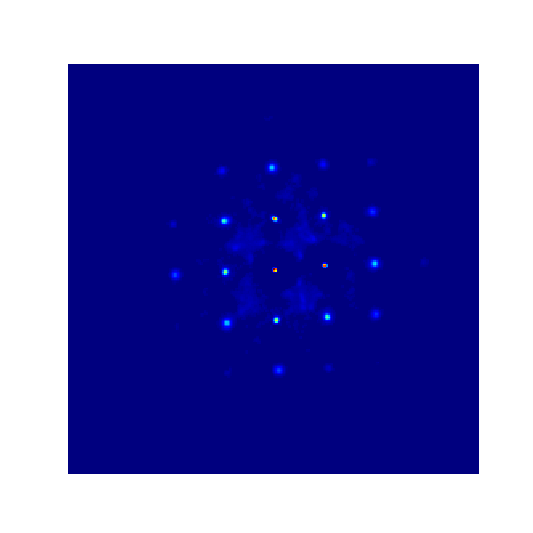

In [85]:
bvm = py4DSTEM.process.diskdetection.braggvectormap.get_bragg_vector_map(bp_centered, dc_b.Q_Nx, dc_b.Q_Ny)

power = 0.25
fig, ax = plt.subplots(figsize = (8,8))
ax.matshow(bvm**power, cmap='jet')
ax.axis('off')
plt.show()

<IPython.core.display.Javascript object>


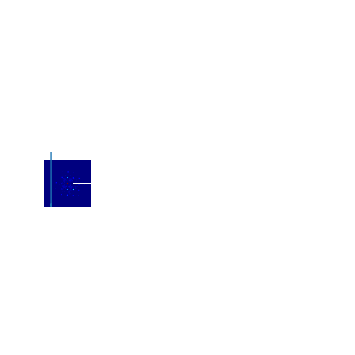

In [92]:
# Create Beamstop mask
x0_,y0_= 130, 130

width = 2
spanned_angle = 2  # degrees
rotation = 91     # degrees
x0_c,y0_c = 0,15
circlemask_radius = 2

beamstopmask_1 = datacube_operations.make_beamstop_mask(Q_Nx, Q_Ny, x0_,y0_,rotation,spanned_angle,width,x0_c,y0_c,circlemask_radius)
beamstopmask_2 = np.invert(beamstopmask_1)
dp_masked_1 = np.ma.array(data=bvm, mask=beamstopmask_1==False)

fig, ax1 = plt.subplots(figsize=(8,8))
ax1.matshow(dp_masked_1**power, cmap='jet')
ax1.axis('off')
#ax2.axis('off')
plt.show()

### c. Universal Thresholding

In [93]:
disks_ar = py4DSTEM.process.diskdetection.diskdetection.get_pointlistarray_intensities(bp_centered)

Getting disk intensities: 100%|██████████| 261k/261k [1:25:23<00:00, 51.0DP/s]


In [94]:
disks_min = np.min(disks_ar)
disks_max = np.max(disks_ar)
disks_hist, bins_edges_disks = np.histogram(disks_ar, bins = 1000, range = (disks_min, disks_max))
bin_width_disks = bins_edges_disks[1] - bins_edges_disks[0]
bin_centers_disks = bins_edges_disks[:-1] + bin_width_disks/2

In [95]:
plt.plot(bin_centers_disks, disks_hist)
plt.xlim((0,1500))
plt.ylim(0, 300)
plt.show()

In [97]:
minIntensity = 0.01
metric = 'manual'

pointlistarray = datacube_operations.universal_threshold(
    bp_centered, 
    coords = coords, 
    minIntensity=minIntensity,
    metric=metric, 
    )

pointlistarray_ar = py4DSTEM.process.diskdetection.diskdetection.get_pointlistarray_intensities(pointlistarray)

100%|██████████| 261121/261121 [00:02<00:00, 105413.84it/s]
Getting disk intensities: 100%|██████████| 261k/261k [1:24:37<00:00, 51.4DP/s]


In [98]:
PLA_min = np.min(pointlistarray_ar)
PLA_max = np.max(pointlistarray_ar)

hist_PLA, bins_PLA = np.histogram(pointlistarray_ar, bins = 1000, range = (PLA_min,PLA_max))

bin_width_PLA = bins_PLA[1] - bins_PLA[0]
bin_centers_PLA = bins_PLA[:-1] + bin_width_PLA/2

<IPython.core.display.Javascript object>


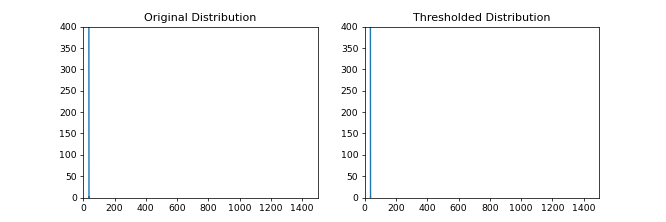

In [99]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))
ax1.plot(bin_centers_disks, disks_hist)
ax1.set(xlim = (0,1500), ylim = (0,400))
ax2.plot(bin_centers_PLA, hist_PLA)
ax2.set(xlim = (0,1500), ylim = (0,400))
ax1.set_title('Original Distribution')
ax2.set_title('Thresholded Distribution')
plt.show()

#### Check BVM to insure false positives around beamstop are reduced

In [101]:
bvm_thresh = py4DSTEM.process.diskdetection.braggvectormap.get_bragg_vector_map(pointlistarray, dc_b.Q_Nx, dc_b.Q_Ny)

<IPython.core.display.Javascript object>


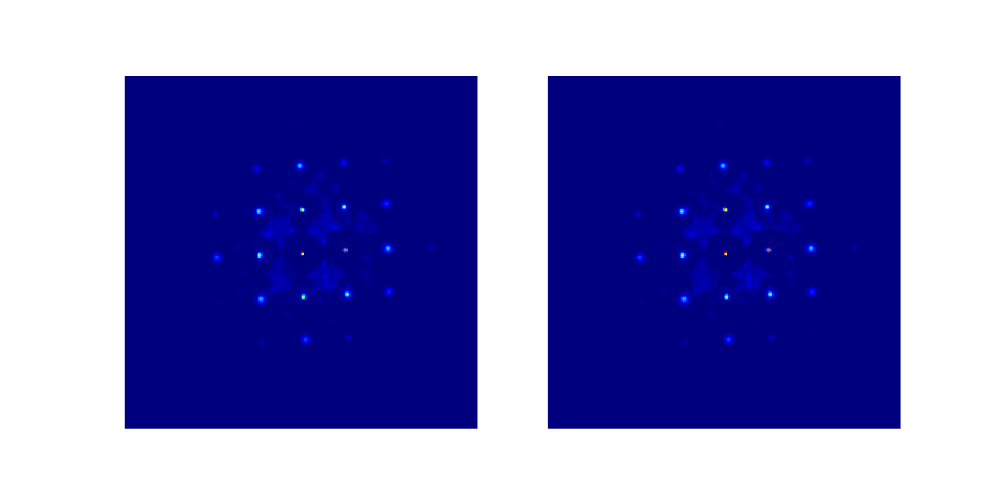

In [102]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize = (16, 8))
ax1.matshow(bvm**power, cmap='jet')
ax2.matshow(bvm_thresh**power, cmap='jet')
ax1.axis('off')
ax2.axis('off')
plt.show()

# 3. Calibration Step - Elliptical correction from PointListArray
## This section includes correcting elliptical distortions from the detected disks

### a. Elliptical Calibration

<IPython.core.display.Javascript object>


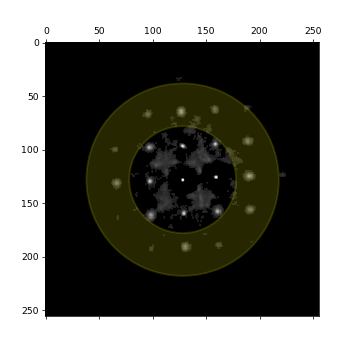

In [106]:
# Select fitting region
qmin,qmax = 50,90
py4DSTEM.visualize.show(bvm_thresh,cmap='gray',scaling='power', power = 0.1,
                        annulus={'center':(dc_b.Q_Nx/2.,dc_b.Q_Ny/2.),
                                 'Ri':qmin,'Ro':qmax,'fill':True,'color':'y','alpha':0.2})

<IPython.core.display.Javascript object>


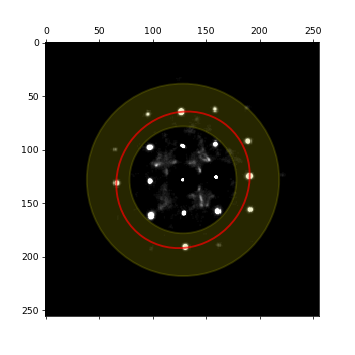

In [107]:
# Fit the elliptical distortions
p_ellipse = py4DSTEM.process.calibration.ellipse.fit_ellipse_1D(
                        ar = bvm_thresh,
                        center = (dc_b.Q_Nx/2.,dc_b.Q_Ny/2.),
                        fitradii=(qmin,qmax))
py4DSTEM.visualize.show_elliptical_fit(
    ar = bvm_thresh,
    fitradii = (qmin, qmax),
    p_ellipse=p_ellipse,
    cmap='gray',
    scaling='power',
    power=0.5,
    clipvals='manual',
    min=0,
    max=500,
    fill=True)

<IPython.core.display.Javascript object>


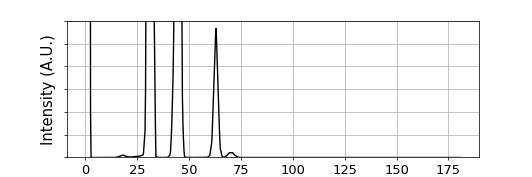

In [108]:
# Radial integration
ymax = 1.5e5
dq=0.25             # binsize for the x-axis

q,I_radial = py4DSTEM.process.utils.radial_integral(
                        bvm_thresh,dc_b.Q_Nx/2,dc_b.Q_Ny/2,dr=dq)
py4DSTEM.visualize.show_qprofile(q=q,intensity=I_radial,ymax=ymax)

<IPython.core.display.Javascript object>


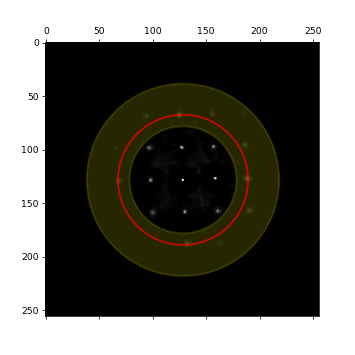

In [109]:
# Confirm that elliptical distortions have been removed

# Correct bragg peak positions, stretching the elliptical semiminor axis to match the semimajor axis length
braggpeaks_ellipsecorr = py4DSTEM.process.calibration.correct_braggpeak_elliptical_distortions(
                                            pointlistarray,p_ellipse)

# Recompute the bvm
bvm_ellipsecorr = py4DSTEM.process.diskdetection.braggvectormap.get_bragg_vector_map(
                            braggpeaks_ellipsecorr,dc_b.Q_Nx,dc_b.Q_Ny)

# Fit an ellipse to the elliptically corrected bvm
qx0_corr,qy0_corr,a_corr,e_corr,theta_corr = py4DSTEM.process.calibration.fit_ellipse_1D(
    bvm_ellipsecorr,
    center = (p_ellipse[0], p_ellipse[1]),
    fitradii=(qmin,qmax))
py4DSTEM.visualize.show_elliptical_fit(
    bvm_ellipsecorr,
    fitradii = (qmin, qmax),
    p_ellipse = (qx0_corr,qy0_corr,a_corr,e_corr,theta_corr),
    cmap='gray',
    scaling='power',
    power = 0.25,
    fill=True)

# Print the ratio of the semi-axes before and after correction
# print("The ratio of the semiminor to semimajor axes was measured to be")
# print("")
# print("\t{:.2f}% in the original data and".format(100*b))
# print("\t{:.2f}% in the corrected data.".format(100*e_corr))

<IPython.core.display.Javascript object>


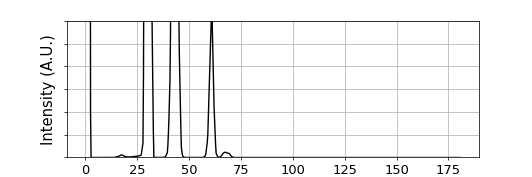

In [110]:
# Radial integration
ymax = 1.5e5
dq=0.25             # binsize for the x-axis

q,I_radial = py4DSTEM.process.utils.radial_integral(
                        bvm_ellipsecorr,dc_b.Q_Nx/2,dc_b.Q_Ny/2,dr=dq)
py4DSTEM.visualize.show_qprofile(q=q,intensity=I_radial,ymax=ymax)

### b. Save all calibrations and PointListArray
#### origin detection and elliptical correction in coordinates object, Bragg disks (calibrated), and probe kernel used to detect disks

In [111]:
# Save to Coordinates
coords.set_ellipse(p_ellipse[2], p_ellipse[3], p_ellipse[4])

In [112]:
probe_kernel_data = py4DSTEM.io.datastructure.diffraction.DiffractionSlice(data=probe_kernel,name = 'probe_kernel')
coords.name = 'coordinates'

In [113]:
fp_save = "/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/kernel_disks_coords.h5"
data = [probe_kernel_data, disks, bp_centered, braggpeaks_ellipsecorr, coords]
py4DSTEM.io.native.write.save(fp_save, data, overwrite = False)

  0%|          | 557/261121 [00:00<00:46, 5566.41it/s]

Saving DiffractionSlice 'probe_kernel'...
Saving PointListArray 'braggpeaks_raw'...


  0%|          | 598/261121 [00:00<00:43, 5976.20it/s]

Saving PointListArray 'braggpeaks_centered'...


  0%|          | 622/261121 [00:00<00:41, 6215.23it/s]

Saving PointListArray 'braggpeaks_centered_ellipsecorrected'...


100%|██████████| 261121/261121 [00:42<00:00, 6124.74it/s]

Saving Coordinates 'coordinates'...


In [9]:
fp_save = "/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/kernel_disks_coords.h5"
probe_kernel_data= py4DSTEM.io.read(fp_save, data_id = 'probe_kernel')
bp_centered = py4DSTEM.io.read(fp_save, data_id = 'braggpeaks_centered')
braggpeaks_ellipsecorr= py4DSTEM.io.read(fp_save, data_id = 'braggpeaks_centered_ellipsecorrected')
disks = py4DSTEM.io.read(fp_save, data_id = 'braggpeaks_raw')
coords = py4DSTEM.io.read(fp_save, data_id = 'coordinates')

Reading PointListArray: 100%|██████████| 261121/261121 [00:43<00:00, 5946.46PointList/s]


### c. Represent Bragg Disks in a set of feature vectors

In [38]:
import featurization

In [39]:
bins_x, bins_y = 4,4

In [40]:
pointlist_transform = featurization.rasterize_peaks(braggpeaks_ellipsecorr, bins_x = bins_x, bins_y = bins_y, Q_Nx = Q_Nx, Q_Ny = Q_Ny, coords = coords)

100%|██████████| 261121/261121 [00:54<00:00, 4801.56it/s]


In [41]:
plt_rs = pointlist_transform.reshape(R_Nx*R_Ny, pointlist_transform.shape[2])

In [44]:
#Pattern 292 for corr 12
#Pattern 127 for corr 18

Rx, Ry = Rxs[1], Rys[1]
Bins = bins_x
binned = 1.
Ry_plt = (Rx % R_Ny)
Rx_plt = np.floor(Rx / R_Ny)
nx_ = int(Q_Nx / Bins)
ny_ = int(Q_Ny / Bins)
bin_size_x = bins_x
bin_size_y = bins_y

<IPython.core.display.Javascript object>


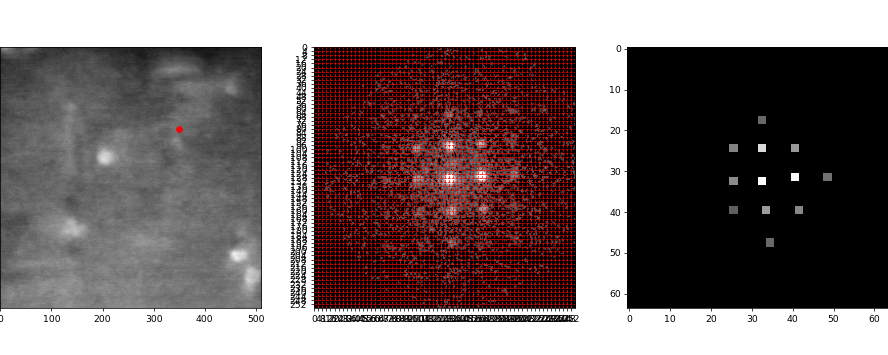

In [45]:
import matplotlib.ticker as plticker

power = 0.3
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,8))
fig.subplots_adjust(left=0,right=1,bottom=0,top=1)
ax1.imshow(im, cmap = 'gray')
ax1.scatter(Ry, Rx,color='r')

loc_ax2 = plticker.MultipleLocator(base=Bins)
ax2.xaxis.set_major_locator(loc_ax2)
ax2.yaxis.set_major_locator(loc_ax2)
ax2.grid(which='major', axis='both', linestyle='--', color = 'r')
ax2.imshow(dc_1.data[Rx,Ry]**power, cmap = 'gray')
nx_ax2=abs(int(float(ax2.get_xlim()[1]-ax2.get_xlim()[0])/float(bin_size_x)))
ny_ax2=abs(int(float(ax2.get_ylim()[1]-ax2.get_ylim()[0])/float(bin_size_y)))
for j in range(ny_ax2):
    y=Bins/2+j*Bins
    for i in range(nx_ax2):
        x=Bins/2.+float(i)*Bins
        #ax2.text(x,y,'{:d}'.format(i+j*nx_),color='w',ha='center',va='center')
        
ax3.imshow(pointlist_transform[Rx, Ry].reshape(nx_,ny_)**power, cmap = 'gray')
nx_ax3=abs(int(float(ax3.get_xlim()[1]-ax3.get_xlim()[0])))
ny_ax3=abs(int(float(ax3.get_ylim()[1]-ax3.get_ylim()[0])))
for j in range(ny_ax3):
    y=j*binned
    for i in range(nx_ax3):
        x=i*binned
        #ax3.text(x,y,'{:d}'.format(i+j*nx_),color='r',ha='center',va='center')

plt.show()

In [120]:
path_BP = '/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/BP_centered_EC_Bin4x4_2022.02.16.npy'
np.save(path_BP, plt_rs)

# 4. Feature Extraction Step - Polar Elliptical Transformation and Statistical Extractions
## This section involves transforming the data into polar elliptical form and extracting statistical measurements across each radial bin

### a. Polar Elliptical Transformation

In [10]:
from py4DSTEM.process.utils.elliptical_coords import cartesian_to_polarelliptical_transform

<IPython.core.display.Javascript object>


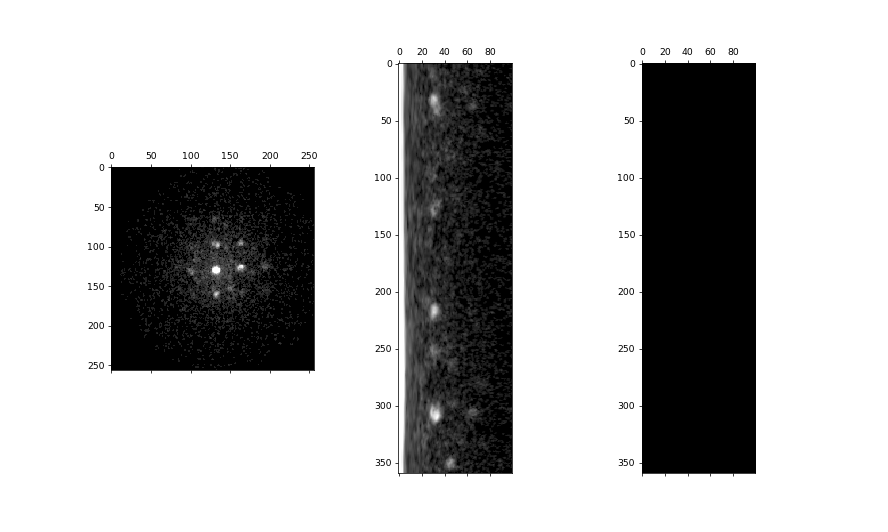

In [15]:
# Polar-elliptical transform of the average diffraction pattern

power = 0.5
ind = 2

PET,rr,tt = cartesian_to_polarelliptical_transform(
    cartesianData=dc_1.data[Rxs[ind],Rys[ind]],
    p_ellipse=(coords.qx0[Rxs[ind],Rys[ind]], coords.qy0[Rxs[ind],Rys[ind]], coords.a,coords.b,coords.theta),
    dr=1,
    dphi=np.radians(1),
    r_range=[0,100],
)

# Show
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,12))
ax1.matshow(dc_1.data[Rxs[ind],Rys[ind]]**power, cmap = 'gray')
ax2.matshow(PET.data**power, cmap = 'gray')
ax3.matshow(PET.mask, cmap = 'gray')
#ax1.axis('off')
#ax2.axis('off')
#ax3.axis('off')
plt.show()

In [16]:
pet_all = datacube_operations.polar_elliptical_transform_datacube(
    dc_b,
    dr = 1,
    dphi = np.radians(1),
    r_range = [0,100],
    coords = coords,)

Transforming: 100%|██████████| 261k/261k [20:47<00:00, 209DP/s] 


In [17]:
pet_dc = py4DSTEM.io.datastructure.DataCube(pet_all)

<IPython.core.display.Javascript object>


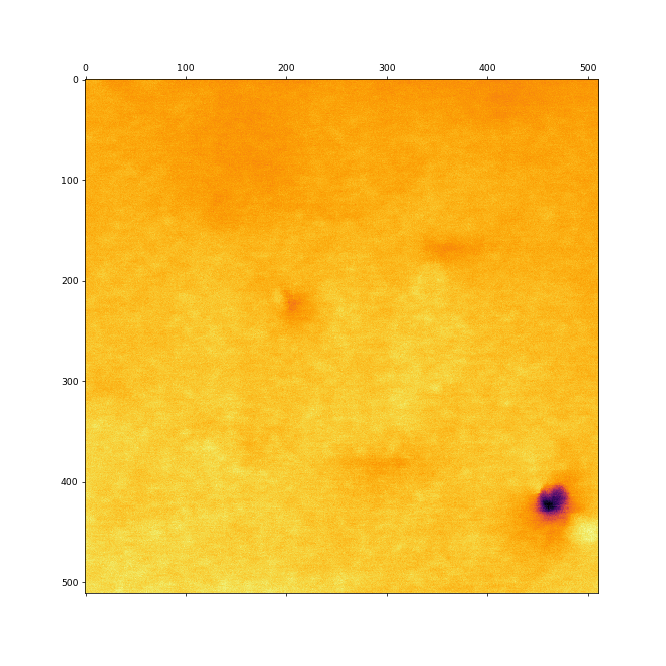

In [18]:
im_pet = np.mean(pet_dc.data,axis=(2,3)) 
fig,ax = plt.subplots(figsize = (10,10))
ax.matshow(im_pet, cmap = 'inferno')
plt.show()

<IPython.core.display.Javascript object>


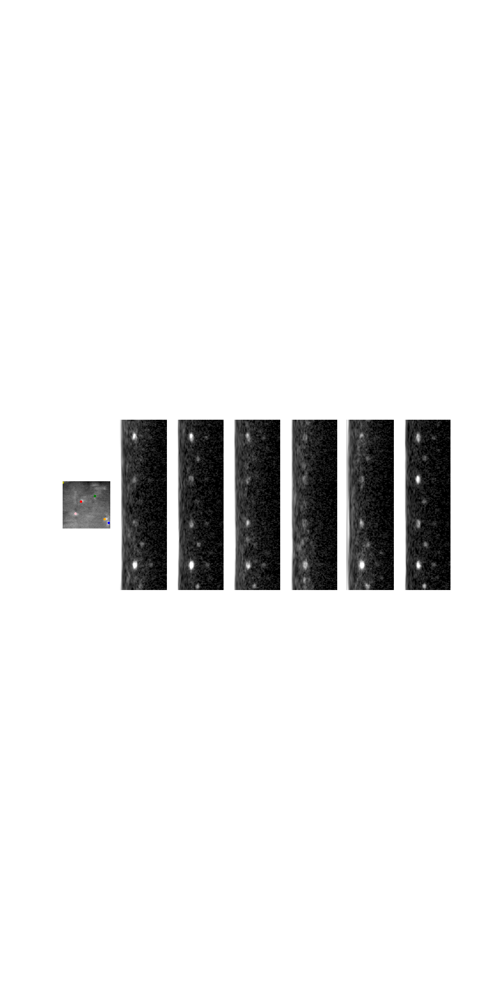

In [19]:
fig,((ax11,ax12,ax13,ax21,ax22,ax23, ax31))=plt.subplots(1,7,figsize=(20,40))
ax11.matshow(im, cmap = 'gray')
ax11.scatter(Rys, Rxs,color=colors)
ax12.matshow(pet_dc.data[Rxs[0],Rys[0]]**power, cmap = 'gray')
ax13.matshow(pet_dc.data[Rxs[1],Rys[1]]**power, cmap = 'gray')
ax21.matshow(pet_dc.data[Rxs[2],Rys[2]]**power, cmap = 'gray')
ax22.matshow(pet_dc.data[Rxs[3],Rys[3]]**power, cmap = 'gray')
ax23.matshow(pet_dc.data[Rxs[4],Rys[4]]**power, cmap = 'gray')
ax31.matshow(pet_dc.data[Rxs[5],Rys[5]]**power, cmap = 'gray')

ax11.axis('off')
ax12.axis('off')
ax13.axis('off')
ax21.axis('off')
ax22.axis('off')
ax23.axis('off')
ax31.axis('off')
plt.show()

In [ ]:
#del dc_1

### b. Statistical Measurements as a function of r

In [20]:
pet_max = np.max(pet_dc.data, axis=(0,1))

In [21]:
pet_ma = np.ma.array(data = pet_max, mask = PET.mask)
std_test = pet_ma.std(axis = 0)
rp_test = pet_ma.sum(axis = 0)    

<IPython.core.display.Javascript object>


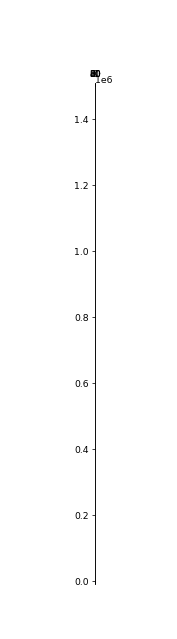

In [22]:
plt.matshow(pet_ma)

In [23]:
plt.plot(rp_test)
plt.show()

In [24]:
mins = scipy.signal.argrelmin(rp_test)[0]
print(mins)

[14 23 40 60 83 87 90 93]


In [25]:
i1, o1 = mins[0], mins[1]
i2, o2 = mins[1], mins[2]
i3, o3 = mins[2],mins[3]
i4, o4 = mins[3], mins[4]

plt.plot(rp_test)
plt.ylim(0,1.5e6)
plt.vlines((i1, o1), 0, 1.5e6, colors = 'r', alpha = 0.5)
plt.vlines((i2,o2), 0, 1.5e6, colors = 'b', alpha = 0.5)
plt.vlines((i3,o3), 0, 1.5e6, colors = 'pink', alpha = 0.5)
plt.vlines((i4,o4), 0, 1.5e6, colors = 'orange', alpha = 0.5)
plt.show()

In [26]:
from py4DSTEM.process.utils import tqdmnd

std_stack = np.zeros([pet_all.shape[0], pet_all.shape[1], pet_all.shape[3]])
var_stack = np.zeros([pet_all.shape[0], pet_all.shape[1], pet_all.shape[3]])
rp_stack = np.zeros([pet_all.shape[0], pet_all.shape[1], pet_all.shape[3]])
for (Rx, Ry) in tqdmnd(pet_all.shape[0], pet_all.shape[1]):
    pet_ma = np.ma.array(data = pet_all[Rx, Ry], mask = PET.mask)
    std_stack[Rx, Ry, :] = pet_ma.std(axis = 0)
    var_stack[Rx, Ry, :] = pet_ma.var(axis = 0)
    rp_stack[Rx, Ry, :] = pet_ma.sum(axis = 0)

100%|██████████| 261121/261121 [05:05<00:00, 853.94it/s]


In [27]:
std_stack_rs = std_stack.reshape(R_Nx * R_Ny, std_stack.shape[2])
var_stack_rs = var_stack.reshape(R_Nx * R_Ny, var_stack.shape[2])
rp_stack_rs = rp_stack.reshape(R_Nx * R_Ny, rp_stack.shape[2])

In [28]:
print(std_stack_rs.shape)
print(var_stack_rs.shape)
print(rp_stack_rs.shape)

(261121, 100)
(261121, 100)
(261121, 100)


In [29]:
np.save('/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/ptransform_std_2022.02.16.npy', std_stack_rs)
np.save('/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/ptransform_var_2022.02.16.npy', var_stack_rs)
np.save('/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/radial_profile_2022.02.16.npy', rp_stack_rs)

<IPython.core.display.Javascript object>


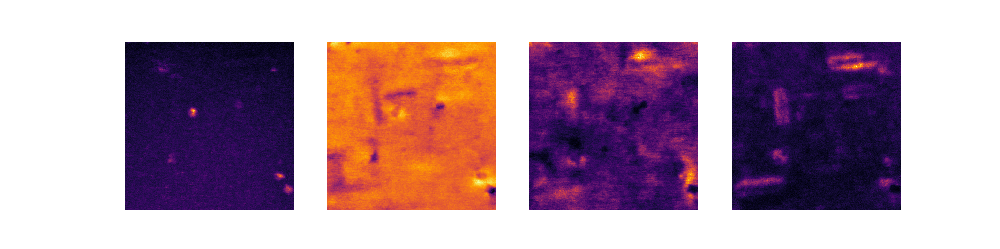

In [30]:
# Visualize radial variance feature maps over ring 1, 2, 3, 4
import matplotlib as mpl
cmap = mpl.cm.inferno
norm = mpl.colors.Normalize(vmin=0, vmax=1)
mpl.cm.ScalarMappable(norm, cmap) 

fig,(ax1, ax2, ax3, ax4) = plt.subplots(1,4,figsize = (32,8))
ax1.matshow(np.mean(var_stack[:,:,i1:o1],axis=(2))**0.5, cmap = cmap)
ax2.matshow(np.mean(var_stack[:,:,i2:o2],axis=(2))**0.5, cmap = cmap)
ax3.matshow(np.mean(var_stack[:,:,i3:o3],axis=(2))**0.5, cmap = cmap)
ax4.matshow(np.mean(var_stack[:,:,i4:o4],axis=(2))**0.5, cmap = cmap)
ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')
plt.show()

In [31]:
#First Ring
std_dc_av = np.sum(std_stack, axis = 2)
#second ring
var_dc_av = np.sum(var_stack, axis = 2)
#third ring
rp_dc_av = np.sum(rp_stack, axis = 2)

<IPython.core.display.Javascript object>


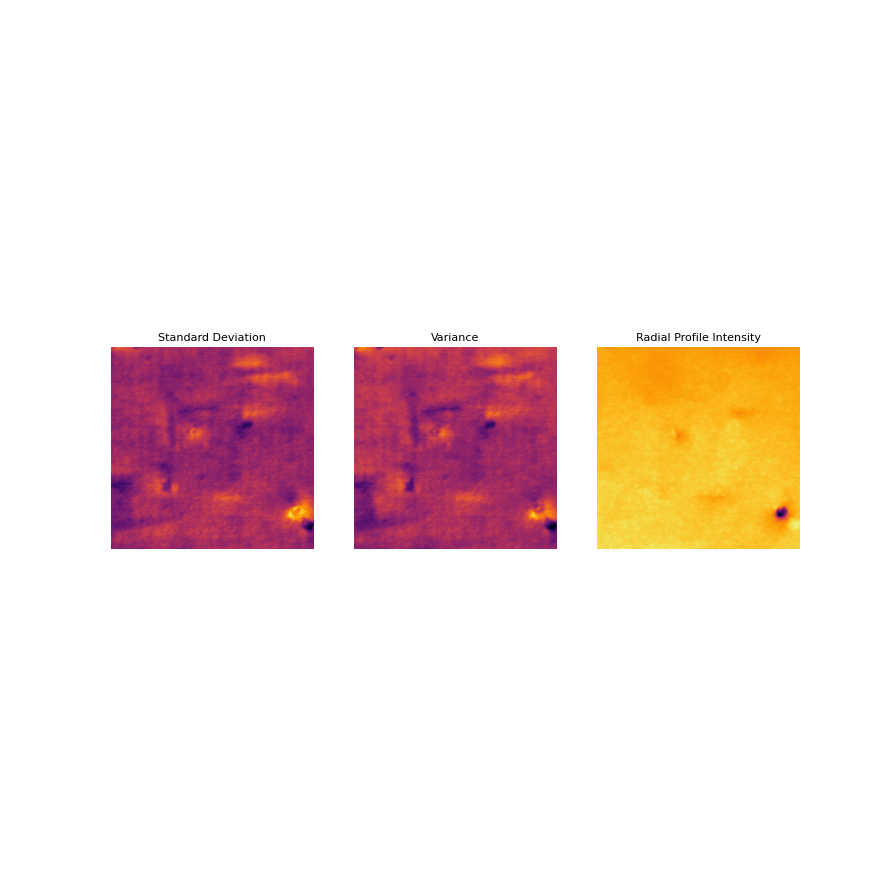

In [32]:
fig, ((ax11, ax12, ax13)) = plt.subplots(1,3, figsize = (20,20))
ax11.imshow(std_dc_av.reshape(R_Nx,R_Ny), cmap = cmap)
ax12.imshow(var_dc_av.reshape(R_Nx,R_Ny), cmap = cmap)
ax13.imshow(rp_dc_av.reshape(R_Nx,R_Ny), cmap = cmap)
#fig.colorbar(mpl.cm.ScalarMappable(norm, cmap))
ax11.set_title('Standard Deviation')
ax12.set_title('Variance')
ax13.set_title('Radial Profile Intensity')

ax11.axis('off')
ax12.axis('off')
ax13.axis('off')
plt.show()

# 5. Feature Extraction Step - Angular Averaging (Mean Virtual Imaging)
## This section includes the extraction of the "Angular Average" which is series of mean virtual images across the detected peaks in the radial integral

<IPython.core.display.Javascript object>


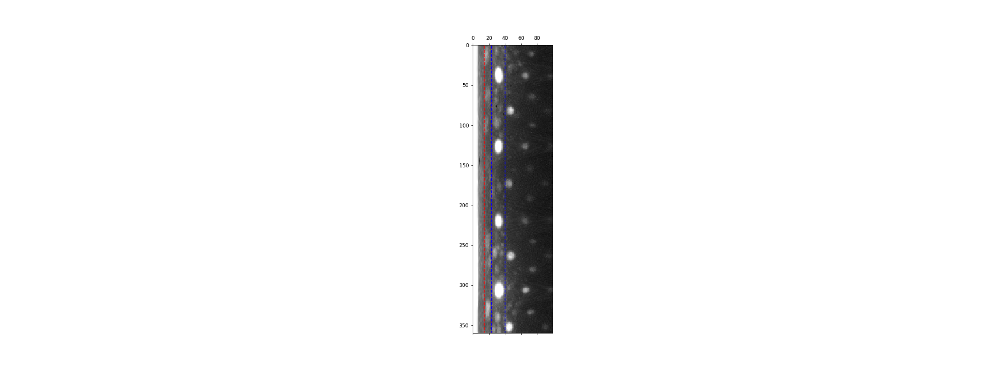

In [33]:
fig,ax = plt.subplots(figsize = (40,15))
ax.matshow(pet_max**0.5, cmap = 'gray')
ax.vlines((i1, o1),0,359, color = 'r', ls = '--')
ax.vlines((i2, o2),0,359, color = 'b', ls = '--')
plt.show()

In [34]:
start = 0
interval = 5 # averaging interval
fraction = 1
n = np.int64(((360/fraction)-start)/interval)
norm = mpl.colors.Normalize(vmin=0, vmax=n)
cmap_base = mpl.cm.get_cmap('plasma')
mappable = mpl.cm.ScalarMappable(norm, cmap_base)
mappable.set_array([])
mappable.set_clim(-0.5, n+1+0.5)

clist = []
for i in range(n):
    clist.append(mappable.cmap.colors[np.int64(
        np.floor(np.shape(mappable.cmap.colors)[0])/(n)*i)])

rects1 = []
rects2 = []

vis1_np = np.zeros((R_Nx, R_Ny, n))
vis2_np = np.zeros((R_Nx, R_Ny, n))
vis3_np = np.zeros((R_Nx, R_Ny, n))
vis4_np = np.zeros((R_Nx, R_Ny, n))


for i in range(n):
    x_lower = start + i*interval
    x_upper = x_lower + interval
    vi1_temp = np.mean(pet_dc.data[:,:,x_lower:x_upper,i1:o1],axis = (2,3))
    vi2_temp = np.mean(pet_dc.data[:,:,x_lower:x_upper,i2:o2],axis = (2,3))
    vi3_temp = np.mean(pet_dc.data[:,:,x_lower:x_upper,i3:o3],axis = (2,3))
    vi4_temp = np.mean(pet_dc.data[:,:,x_lower:x_upper,i4:o4],axis = (2,3))

    rects1.append((x_lower, x_upper, i1, o1))
    rects2.append((x_lower, x_upper, i2, o2))
    vis1_np[:,:,i] = vi1_temp
    vis2_np[:,:,i] = vi2_temp
    vis3_np[:,:,i] = vi3_temp
    vis4_np[:,:,i] = vi4_temp


<IPython.core.display.Javascript object>


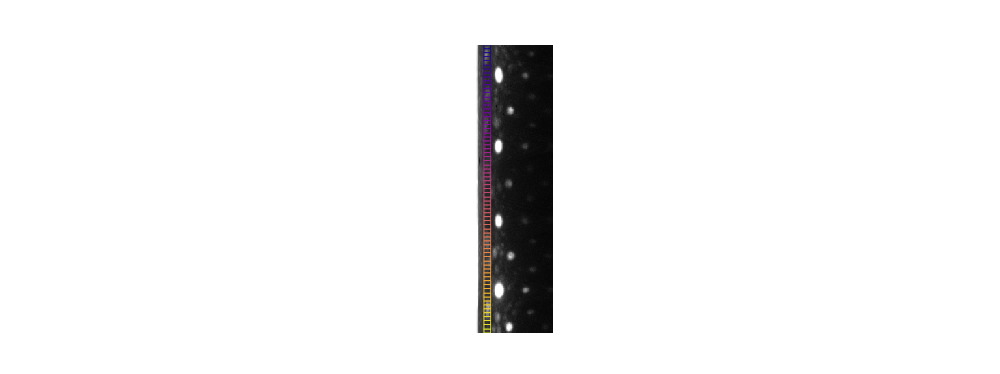

In [35]:
fig, ax = py4DSTEM.visualize.show_rectangles(pet_max, 
                                lims=rects1, 
                                color = clist,
                                alpha = 0.8,
                                fill=False,
                                linewidth=2,
                                figsize=(40,15),
                                returnfig = True)
ax.axis('off')
plt.show()

In [36]:
vis1_rs = vis1_np.reshape(R_Nx*R_Ny, n)
vis2_rs = vis2_np.reshape(R_Nx*R_Ny, n)
vis3_rs = vis3_np.reshape(R_Nx*R_Ny, n)
vis4_rs = vis4_np.reshape(R_Nx*R_Ny, n)

In [37]:
path_aDF_r1 = '/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/annularDF_5deg_r1_2022.02.16.npy'
path_aDF_r2 = '/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/annularDF_5deg_r2_2022.02.16.npy'
path_aDF_r3 = '/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/annularDF_5deg_r3_2022.02.16.npy'
path_aDF_r4 = '/dls/science/groups/imaging/ePSIC_students/Andy_Bridger/PaperDataRepo/AlexWorkflow/HMA/annularDF_5deg_r4_2022.02.16.npy'
np.save(path_aDF_r1, vis1_rs)
np.save(path_aDF_r2, vis2_rs)
np.save(path_aDF_r3, vis3_rs)
np.save(path_aDF_r4, vis4_rs)